In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import scipy.stats as stats
from scipy.stats import norm
import statsmodels.api as sm
import matplotlib.pyplot as plt
from scipy.stats import skew, norm
from sklearn.neighbors import KNeighborsRegressor
%matplotlib inline

import warnings
warnings.filterwarnings(action="ignore")


In [2]:
house_data = pd.read_csv('AmesHousing.csv')
test = pd.read_csv('test.csv')
data_w = house_data.copy()
data_w.columns = data_w.columns.str.replace(' ', '') # Replacing the white spaces in columns' names
data_w.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2930 entries, 0 to 2929
Data columns (total 82 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Order          2930 non-null   int64  
 1   PID            2930 non-null   int64  
 2   MSSubClass     2930 non-null   int64  
 3   MSZoning       2930 non-null   object 
 4   LotFrontage    2440 non-null   float64
 5   LotArea        2930 non-null   int64  
 6   Street         2930 non-null   object 
 7   Alley          198 non-null    object 
 8   LotShape       2930 non-null   object 
 9   LandContour    2930 non-null   object 
 10  Utilities      2930 non-null   object 
 11  LotConfig      2930 non-null   object 
 12  LandSlope      2930 non-null   object 
 13  Neighborhood   2930 non-null   object 
 14  Condition1     2930 non-null   object 
 15  Condition2     2930 non-null   object 
 16  BldgType       2930 non-null   object 
 17  HouseStyle     2930 non-null   object 
 18  OverallQ

In [3]:
data_w

,Order,PID,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,526301100,20,RL,141.0,31770,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,NaN,0,5,2010,WD,Normal,215000
1,2,526350040,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,...,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal,105000
2,3,526351010,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal,172000
3,4,526353030,20,RL,93.0,11160,Pave,NaN,Reg,Lvl,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,244000
4,5,527105010,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,...,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal,189900
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2925,2926,923275080,80,RL,37.0,7937,Pave,NaN,IR1,Lvl,...,0,NaN,GdPrv,NaN,0,3,2006,WD,Normal,142500
2926,2927,923276100,20,RL,NaN,8885,Pave,NaN,IR1,Low,...,0,NaN,MnPrv,NaN,0,6,2006,WD,Normal,131000
2927,2928,923400125,85,RL,62.0,10441,Pave,NaN,Reg,Lvl,...,0,NaN,MnPrv,Shed,700,7,2006,WD,Normal,132000
2928,2929,924100070,20,RL,77.0,10010,Pave,NaN,Reg,Lvl,...,0,NaN,NaN,NaN,0,4,2006,WD,Normal,170000


In [4]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1459 non-null   int64  
 1   MSSubClass     1459 non-null   int64  
 2   MSZoning       1455 non-null   object 
 3   LotFrontage    1232 non-null   float64
 4   LotArea        1459 non-null   int64  
 5   Street         1459 non-null   object 
 6   Alley          107 non-null    object 
 7   LotShape       1459 non-null   object 
 8   LandContour    1459 non-null   object 
 9   Utilities      1457 non-null   object 
 10  LotConfig      1459 non-null   object 
 11  LandSlope      1459 non-null   object 
 12  Neighborhood   1459 non-null   object 
 13  Condition1     1459 non-null   object 
 14  Condition2     1459 non-null   object 
 15  BldgType       1459 non-null   object 
 16  HouseStyle     1459 non-null   object 
 17  OverallQual    1459 non-null   int64  
 18  OverallC

# EDA & VISUALIZATION
Before working with any kind of data it is important to understand them. A crucial step to this aim is the Exploratory data analysis (EDA): a combination of visualizations and statistical analysis (uni, bi, and multivariate) that helps us to better understand the data we are working with and to gain insight into their relationships. So, let's explore our target variable and how the other features influence it.

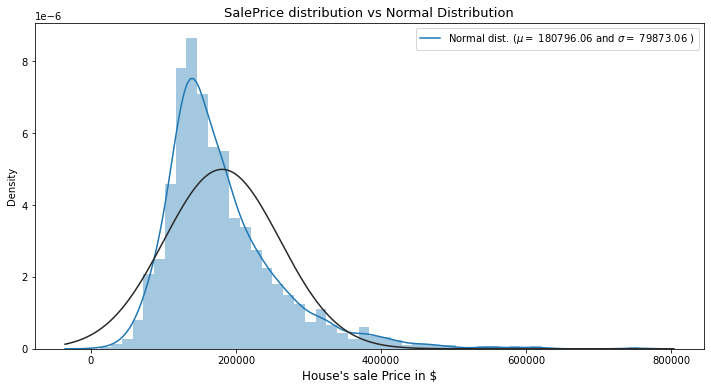

In [5]:
# Getting the main parameters of the Normal Ditribution ()
(mu, sigma) = norm.fit(data_w['SalePrice'])

plt.figure(figsize = (12,6))
sns.distplot(data_w['SalePrice'], kde = True, hist=True, fit = norm)
plt.title('SalePrice distribution vs Normal Distribution', fontsize = 13)
plt.xlabel("House's sale Price in $", fontsize = 12)
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.show()

In literature, acceptable values for skewness are between -0.5 and 0.5 while -2 and 2 for Kurtosis. Looking at the plot, we can clearly see how the distribution does not seem to be normal, but highly right-skewed. The non-normality of our distribution is also supported by the Shapiro test for normality (p-value really small that allows us to reject the hypotesis of normality). Despite that, let's leave it like that for now, we'll deal with that later in the notebook.

In [6]:
# Skew and kurt
from scipy import stats

shap_t,shap_p = stats.shapiro(data_w['SalePrice'])

print("Skewness: %f" % abs(data_w['SalePrice']).skew())
print("Kurtosis: %f" % abs(data_w['SalePrice']).kurt())
print("Shapiro_Test: %f" % shap_t)
print("Shapiro_Test: %f" % shap_p)

Skewness: 1.743500
Kurtosis: 5.118900
Shapiro_Test: 0.876261
Shapiro_Test: 0.000000


The correlation matrix is the best way to see all the numerical correlation between features. Let's see which are the feature that correlate most with our target variable.


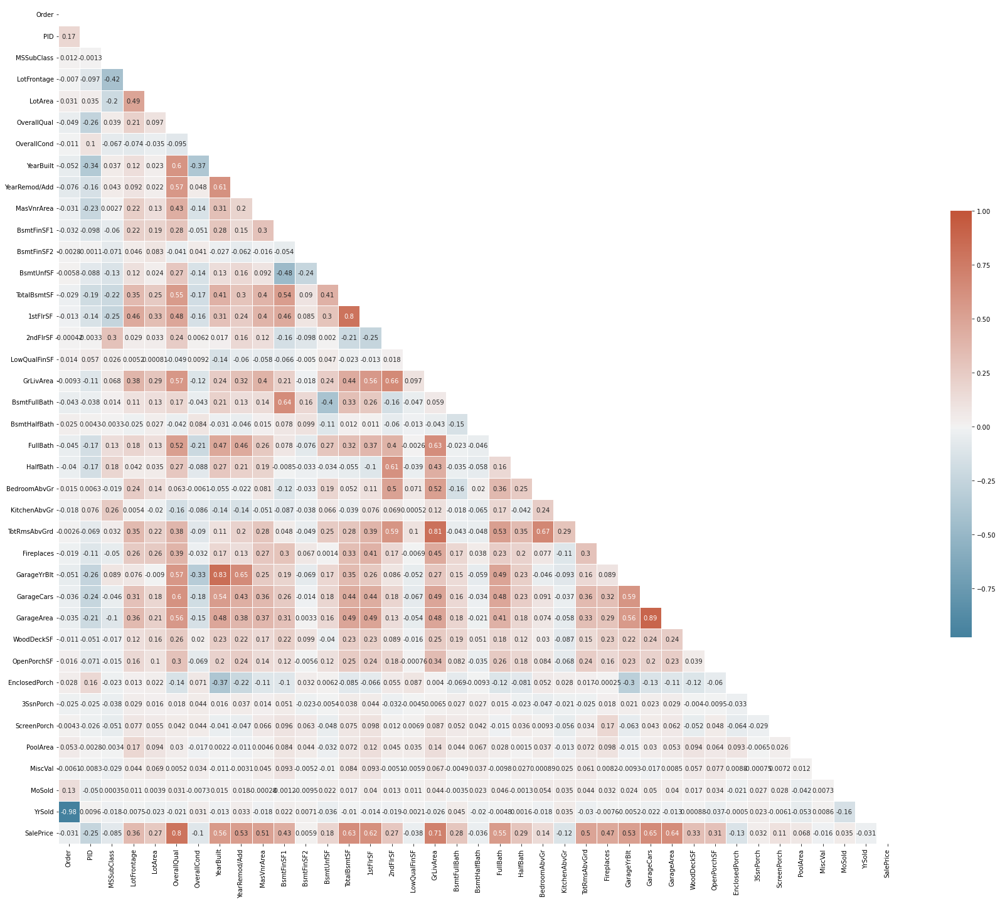

In [7]:
# Correlation Matrix

f, ax = plt.subplots(figsize=(30, 25))
mat = data_w.corr('pearson')
mask = np.triu(np.ones_like(mat, dtype=bool))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(mat, mask=mask, cmap=cmap, vmax=1, center=0, annot = True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.show()

Now that we know which features correlates most with our target variable we can investigate them more in depth.



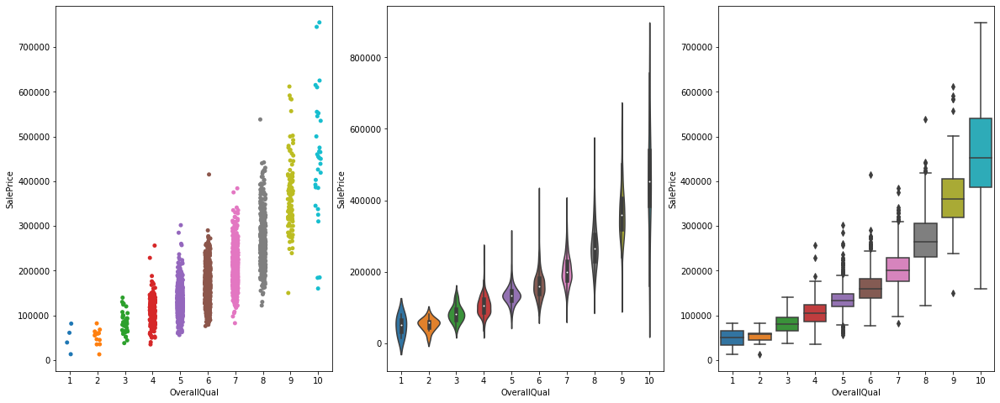

In [8]:
# OverallQuall - SalePrice [Pearson = 0.8]

figure, ax = plt.subplots(1,3, figsize = (20,8))
sns.stripplot(data=data_w, x = 'OverallQual', y='SalePrice', ax = ax[0])
sns.violinplot(data=data_w, x = 'OverallQual', y='SalePrice', ax = ax[1])
sns.boxplot(data=data_w, x = 'OverallQual', y='SalePrice', ax = ax[2])
plt.show()

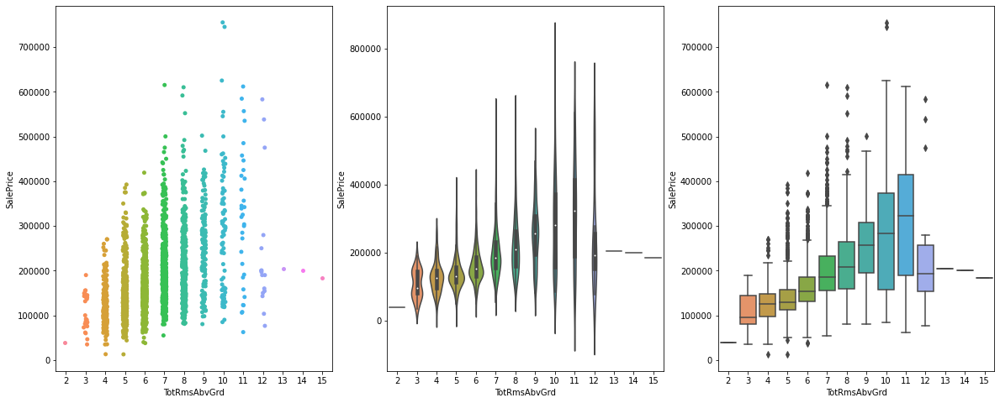

In [9]:
# TotRmsAbvGrd - SalePrice [Pearson = 0.50]

figure, ax = plt.subplots(1,3, figsize = (20,8))
sns.stripplot(data=data_w, x = 'TotRmsAbvGrd', y='SalePrice', ax = ax[0])
sns.violinplot(data=data_w, x = 'TotRmsAbvGrd', y='SalePrice', ax = ax[1])
sns.boxplot(data=data_w, x = 'TotRmsAbvGrd', y='SalePrice', ax = ax[2])
plt.show()

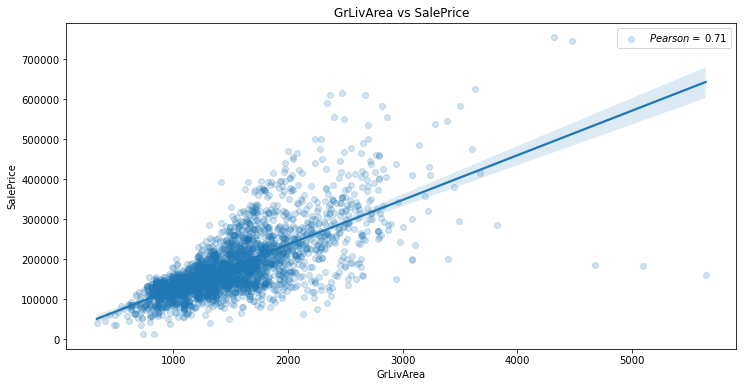

In [10]:
# GrLivArea vs SalePrice [corr = 0.71]

Pearson_GrLiv = 0.71
plt.figure(figsize = (12,6))
sns.regplot(data=data_w, x = 'GrLivArea', y='SalePrice', scatter_kws={'alpha':0.2})
plt.title('GrLivArea vs SalePrice', fontsize = 12)
plt.legend(['$Pearson=$ {:.2f}'.format(Pearson_GrLiv)], loc = 'best')
plt.show()

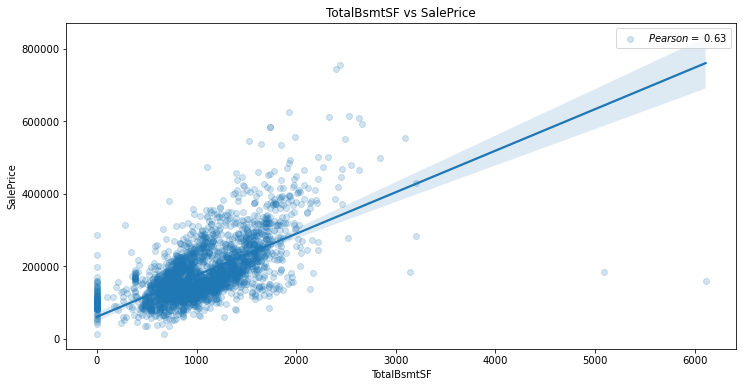

In [11]:
Pearson_TBSF = 0.63
plt.figure(figsize = (12,6))
sns.regplot(data=data_w, x = 'TotalBsmtSF', y='SalePrice', scatter_kws={'alpha':0.2})
plt.title('TotalBsmtSF vs SalePrice', fontsize = 12)
plt.legend(['$Pearson=$ {:.2f}'.format(Pearson_TBSF)], loc = 'best')
plt.show()

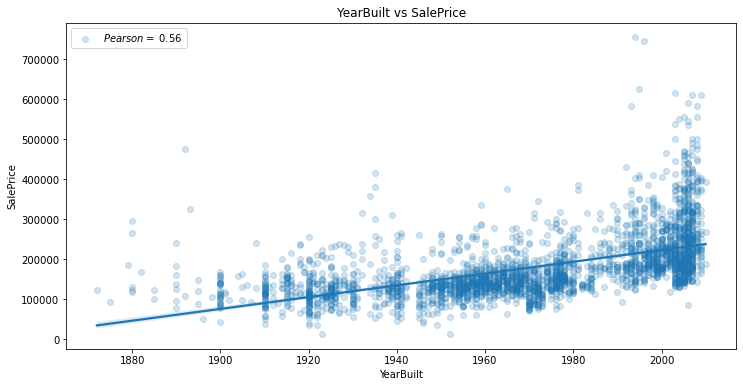

In [12]:
# YearBuilt vs SalePrice

Pearson_YrBlt = 0.56
plt.figure(figsize = (12,6))
sns.regplot(data=data_w, x = 'YearBuilt', y='SalePrice', scatter_kws={'alpha':0.2})
plt.title('YearBuilt vs SalePrice', fontsize = 12)
plt.legend(['$Pearson=$ {:.2f}'.format(Pearson_YrBlt)], loc = 'best')
plt.show()

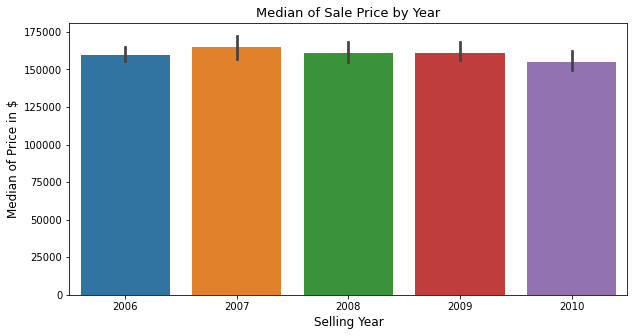

In [13]:
# Median of Sale Price by Year

plt.figure(figsize = (10,5))
sns.barplot(x='YrSold', y="SalePrice", data = data_w, estimator = np.median)
plt.title('Median of Sale Price by Year', fontsize = 13)
plt.xlabel('Selling Year', fontsize = 12)
plt.ylabel('Median of Price in $', fontsize = 12)
plt.show()

# DATA PREPROCESSING
Now that we have some insights about data, we need to preprocess them for the modeling part. The main steps are:

Looking at potential NaN
Dealing with categorical features (e.g. Dummy coding)
Normalization
N.B:

Usually, in a real-world project, the test data are not available until the end. For this reason, test data should contain the same type of data of the training set to preprocess them in the same way. Here, the test set is available. It contains some observations not present in the training dataset and,the use of dummy coding could raise several issues (I spent a lot of time figuring out why I was not able to make predictions on the test set). The easiest way to solve this problem (that is not applicable if test data are not available) is to concatenate Train and Test sets, preprocess, and divide them again.

In [14]:
# Separating Target and Features

target = data_w['SalePrice']
test_id = test['Id']
test = test.drop(['Id'], axis = 1)
data_w2 = data_w.drop(['SalePrice','Order','PID'], axis = 1)


# Concatenating train & test set

train_test = pd.concat([data_w2,test], axis=0, sort=False)

In [15]:
train_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4389 entries, 0 to 1458
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     4389 non-null   int64  
 1   MSZoning       4385 non-null   object 
 2   LotFrontage    3672 non-null   float64
 3   LotArea        4389 non-null   int64  
 4   Street         4389 non-null   object 
 5   Alley          305 non-null    object 
 6   LotShape       4389 non-null   object 
 7   LandContour    4389 non-null   object 
 8   Utilities      4387 non-null   object 
 9   LotConfig      4389 non-null   object 
 10  LandSlope      4389 non-null   object 
 11  Neighborhood   4389 non-null   object 
 12  Condition1     4389 non-null   object 
 13  Condition2     4389 non-null   object 
 14  BldgType       4389 non-null   object 
 15  HouseStyle     4389 non-null   object 
 16  OverallQual    4389 non-null   int64  
 17  OverallCond    4389 non-null   int64  
 18  YearBuil

In [16]:
# Looking at NaN % within the data

nan = pd.DataFrame(train_test.isna().sum(), columns = ['NaN_sum'])
nan['feat'] = nan.index
nan['Perc(%)'] = (nan['NaN_sum']/1460)*100
nan = nan[nan['NaN_sum'] > 0]
nan = nan.sort_values(by = ['NaN_sum'])
nan['Usability'] = np.where(nan['Perc(%)'] > 20, 'Discard', 'Keep')
nan

,NaN_sum,feat,Perc(%),Usability
Exterior1st,1,Exterior1st,0.068493,Keep
Exterior2nd,1,Exterior2nd,0.068493,Keep
KitchenQual,1,KitchenQual,0.068493,Keep
Electrical,1,Electrical,0.068493,Keep
SaleType,1,SaleType,0.068493,Keep
TotalBsmtSF,2,TotalBsmtSF,0.136986,Keep
GarageArea,2,GarageArea,0.136986,Keep
GarageCars,2,GarageCars,0.136986,Keep
Utilities,2,Utilities,0.136986,Keep
Functional,2,Functional,0.136986,Keep


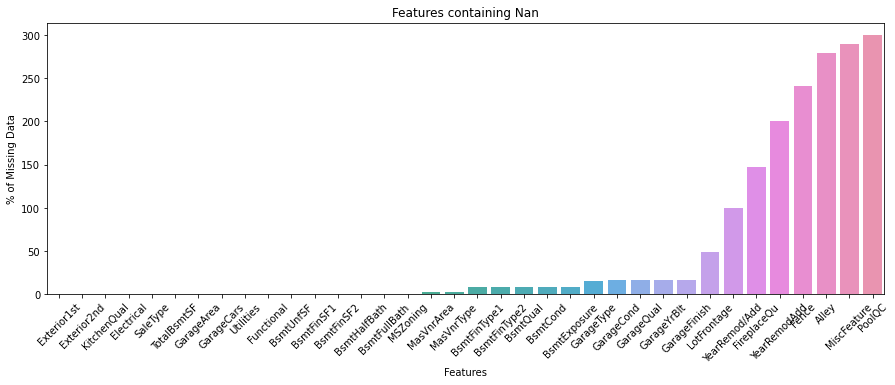

In [17]:
# Plotting Nan

plt.figure(figsize = (15,5))
sns.barplot(x = nan['feat'], y = nan['Perc(%)'])
plt.xticks(rotation=45)
plt.title('Features containing Nan')
plt.xlabel('Features')
plt.ylabel('% of Missing Data')
plt.show()

Are we sure that all these nans are real missing values? Looking at the given description file, we can see how the majority of these nans reflect the absence of something, and for this reason, they are not nans. We can impute them (for numerical features) or substitute them with data in the file:



In [18]:
# Converting non-numeric predictors stored as numbers into string

train_test['MSSubClass'] = train_test['MSSubClass'].apply(str)
train_test['YrSold'] = train_test['YrSold'].apply(str)
train_test['MoSold'] = train_test['MoSold'].apply(str)

# Filling Categorical NaN (That we know how to fill due to the description file )

train_test['Functional'] = train_test['Functional'].fillna('Typ')
train_test['Electrical'] = train_test['Electrical'].fillna("SBrkr")
train_test['KitchenQual'] = train_test['KitchenQual'].fillna("TA")
train_test['Exterior1st'] = train_test['Exterior1st'].fillna(train_test['Exterior1st'].mode()[0])
train_test['Exterior2nd'] = train_test['Exterior2nd'].fillna(train_test['Exterior2nd'].mode()[0])
train_test['SaleType'] = train_test['SaleType'].fillna(train_test['SaleType'].mode()[0])
train_test["PoolQC"] = train_test["PoolQC"].fillna("None")
train_test["Alley"] = train_test["Alley"].fillna("None")
train_test['FireplaceQu'] = train_test['FireplaceQu'].fillna("None")
train_test['Fence'] = train_test['Fence'].fillna("None")
train_test['MiscFeature'] = train_test['MiscFeature'].fillna("None")

for col in ('GarageArea', 'GarageCars'):
    train_test[col] = train_test[col].fillna(0)
        
for col in ['GarageType', 'GarageFinish', 'GarageQual', 'GarageCond']:
    train_test[col] = train_test[col].fillna('None')
    
for col in ('BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2'):
    train_test[col] = train_test[col].fillna('None')
    
    # Checking the features with NaN remained out

for col in train_test:
    if train_test[col].isna().sum() > 0:
        print(train_test[col][0])

0    RL
0    RH
Name: MSZoning, dtype: object
0    141.0
0     80.0
Name: LotFrontage, dtype: float64
0    AllPub
0    AllPub
Name: Utilities, dtype: object
0    1960.0
0       NaN
Name: YearRemod/Add, dtype: float64
0    Stone
0     None
Name: MasVnrType, dtype: object
0    112.0
0      0.0
Name: MasVnrArea, dtype: float64
0    639.0
0    468.0
Name: BsmtFinSF1, dtype: float64
0      0.0
0    144.0
Name: BsmtFinSF2, dtype: float64
0    441.0
0    270.0
Name: BsmtUnfSF, dtype: float64
0    1080.0
0     882.0
Name: TotalBsmtSF, dtype: float64
0    1.0
0    0.0
Name: BsmtFullBath, dtype: float64
0    0.0
0    0.0
Name: BsmtHalfBath, dtype: float64
0    1960.0
0    1961.0
Name: GarageYrBlt, dtype: float64
0       NaN
0    1961.0
Name: YearRemodAdd, dtype: float64


In [19]:
train_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4389 entries, 0 to 1458
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     4389 non-null   object 
 1   MSZoning       4385 non-null   object 
 2   LotFrontage    3672 non-null   float64
 3   LotArea        4389 non-null   int64  
 4   Street         4389 non-null   object 
 5   Alley          4389 non-null   object 
 6   LotShape       4389 non-null   object 
 7   LandContour    4389 non-null   object 
 8   Utilities      4387 non-null   object 
 9   LotConfig      4389 non-null   object 
 10  LandSlope      4389 non-null   object 
 11  Neighborhood   4389 non-null   object 
 12  Condition1     4389 non-null   object 
 13  Condition2     4389 non-null   object 
 14  BldgType       4389 non-null   object 
 15  HouseStyle     4389 non-null   object 
 16  OverallQual    4389 non-null   int64  
 17  OverallCond    4389 non-null   int64  
 18  YearBuil

In [20]:
# Removing the useless variables
 
train_test = train_test.drop('YearRemod/Add', axis = 1)

# Imputing with KnnRegressor (we can also use different Imputers)

def impute_knn(df):
    ttn = train_test.select_dtypes(include=[np.number])
    ttc = train_test.select_dtypes(exclude=[np.number])

    cols_nan = ttn.columns[ttn.isna().any()].tolist()         # columns w/ nan 
    cols_no_nan = ttn.columns.difference(cols_nan).values     # columns w/n nan

    for col in cols_nan:
        imp_test = ttn[ttn[col].isna()]   # indicies which have missing data will become our test set
        imp_train = ttn.dropna()          # all indicies which which have no missing data 
        model = KNeighborsRegressor(n_neighbors=5)  # KNR Unsupervised Approach
        knr = model.fit(imp_train[cols_no_nan], imp_train[col])
        ttn.loc[ttn[col].isna(), col] = knr.predict(imp_test[cols_no_nan])
    
    return pd.concat([ttn,ttc],axis=1)

train_test = impute_knn(train_test)


objects = []
for i in train_test.columns:
    if train_test[i].dtype == object:
        objects.append(i)
train_test.update(train_test[objects].fillna('None'))

# # Checking NaN presence

for col in train_test:
    if train_test[col].isna().sum() > 0:
        print(train_test[col][0])

# FEATURE ENGINEERING
Let's create some new features combining the ones that we already have. These could help us to increase the performance of the model!

In [21]:
train_test["SqFtPerRoom"] = train_test["GrLivArea"] / (train_test["TotRmsAbvGrd"] +
                                                       train_test["FullBath"] +
                                                       train_test["HalfBath"] +
                                                       train_test["KitchenAbvGr"])

train_test['Total_Home_Quality'] = train_test['OverallQual'] + train_test['OverallCond']

train_test['Total_Bathrooms'] = (train_test['FullBath'] + (0.5 * train_test['HalfBath']) +
                               train_test['BsmtFullBath'] + (0.5 * train_test['BsmtHalfBath']))

train_test["HighQualSF"] = train_test["1stFlrSF"] + train_test["2ndFlrSF"]

# Converting non-numeric predictors stored as numbers into string

train_test['MSSubClass'] = train_test['MSSubClass'].apply(str)
train_test['YrSold'] = train_test['YrSold'].apply(str)
train_test['MoSold'] = train_test['MoSold'].apply(str)

# Creating dummy variables from categorical features

train_test_dummy = pd.get_dummies(train_test)

# Fetch all numeric features

#train_test['Id'] = train_test['Id'].apply(str)
numeric_features = train_test_dummy.dtypes[train_test_dummy.dtypes != object].index
skewed_features = train_test_dummy[numeric_features].apply(lambda x: skew(x)).sort_values(ascending=False)
high_skew = skewed_features[skewed_features > 0.5]
skew_index = high_skew.index

# Normalize skewed features using log_transformation
    
for i in skew_index:
    train_test_dummy[i] = np.log1p(train_test_dummy[i])

Now let's try to tranform our target distribution into a normal one. To do this we use a log transformation. We will use qq-plot to see the transformation effect.



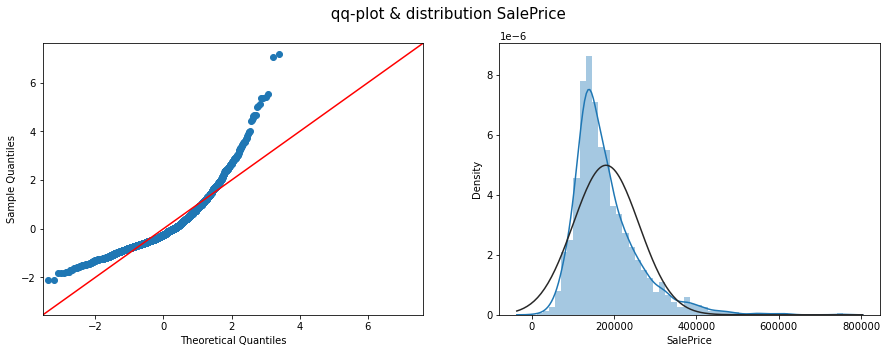

In [22]:
# SalePrice before transformation

fig, ax = plt.subplots(1,2, figsize= (15,5))
fig.suptitle(" qq-plot & distribution SalePrice ", fontsize= 15)

sm.qqplot(target, stats.t, distargs=(4,),fit=True, line="45", ax = ax[0])

sns.distplot(target, kde = True, hist=True, fit = norm, ax = ax[1])
plt.show()

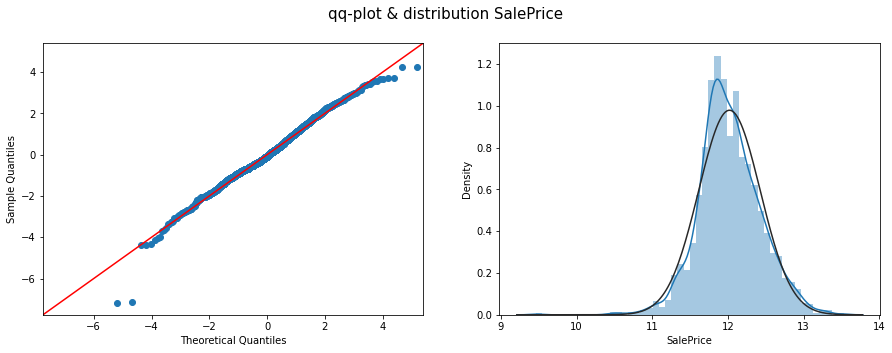

In [23]:
# SalePrice after transformation

target_log = np.log1p(target)

fig, ax = plt.subplots(1,2, figsize= (15,5))
fig.suptitle("qq-plot & distribution SalePrice ", fontsize= 15)

sm.qqplot(target_log, stats.t, distargs=(4,),fit=True, line="45", ax = ax[0])
sns.distplot(target_log, kde = True, hist=True, fit = norm, ax = ax[1])
plt.show()

In [35]:
import shap
import xgboost as xgb
from catboost import Pool
from sklearn.svm import SVR
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeRegressor
from mlxtend.regressor import StackingRegressor
from sklearn.linear_model import LinearRegression, BayesianRidge
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import KFold, cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_squared_log_error

# Train-Test separation

train = train_test_dummy[0:2930]
test = train_test_dummy[2930:]
test['Id'] = test_id

# Creation of the RMSE metric:
    
def rmse(y, y_pred):
    return np.sqrt(mean_squared_error(y, y_pred))

def cv_rmse(model):
    rmse = np.sqrt(-cross_val_score(model, train, target_log, scoring="neg_mean_squared_error", cv=kf))
    return (rmse)

In [36]:
# 10 Fold Cross validation

kf = KFold(n_splits=10, random_state=42, shuffle=True)

cv_scores = []
cv_std = []

baseline_models = ['Linear_Reg.','Bayesian_Ridge_Reg.','LGBM_Reg.','SVR',
                   'Dec_Tree_Reg.','Random_Forest_Reg.', 'XGB_Reg.',
                   'Grad_Boost_Reg.','Cat_Boost_Reg.','Stacked_Reg.']

# Linear Regression

lreg = LinearRegression()
score_lreg = cv_rmse(lreg)
cv_scores.append(score_lreg.mean())
cv_std.append(score_lreg.std())

# Bayesian Ridge Regression

brr = BayesianRidge(compute_score=True)
score_brr = cv_rmse(brr)
cv_scores.append(score_brr.mean())
cv_std.append(score_brr.std())

# Light Gradient Boost Regressor

l_gbm = LGBMRegressor(objective='regression')
score_l_gbm = cv_rmse(l_gbm)
cv_scores.append(score_l_gbm.mean())
cv_std.append(score_l_gbm.std())

# Support Vector Regression

svr = SVR()
score_svr = cv_rmse(svr)
cv_scores.append(score_svr.mean())
cv_std.append(score_svr.std())

# Decision Tree Regressor

dtr = DecisionTreeRegressor()
score_dtr = cv_rmse(dtr)
cv_scores.append(score_dtr.mean())
cv_std.append(score_dtr.std())

# Random Forest Regressor

rfr = RandomForestRegressor()
score_rfr = cv_rmse(rfr)
cv_scores.append(score_rfr.mean())
cv_std.append(score_rfr.std())

# XGB Regressor

xgb = xgb.XGBRegressor()
score_xgb = cv_rmse(xgb)
cv_scores.append(score_xgb.mean())
cv_std.append(score_xgb.std())

# Gradient Boost Regressor

gbr = GradientBoostingRegressor()
score_gbr = cv_rmse(gbr)
cv_scores.append(score_gbr.mean())
cv_std.append(score_gbr.std())

# Cat Boost Regressor

catb = CatBoostRegressor()
score_catb = cv_rmse(catb)
cv_scores.append(score_catb.mean())
cv_std.append(score_catb.std())

# Stacked Regressor

stack_gen = StackingRegressor(regressors=(CatBoostRegressor(),
                                          LinearRegression(),
                                          BayesianRidge(),
                                          GradientBoostingRegressor()),
                              meta_regressor = CatBoostRegressor(),
                              use_features_in_secondary = True)

score_stack_gen = cv_rmse(stack_gen)
cv_scores.append(score_stack_gen.mean())
cv_std.append(score_stack_gen.std())

final_cv_score = pd.DataFrame(baseline_models, columns = ['Regressors'])
final_cv_score['RMSE_mean'] = cv_scores
final_cv_score['RMSE_std'] = cv_std

Learning rate set to 0.047722
0:	learn: 0.3923134	total: 139ms	remaining: 2m 18s
1:	learn: 0.3801601	total: 144ms	remaining: 1m 11s
2:	learn: 0.3680954	total: 149ms	remaining: 49.5s
3:	learn: 0.3577733	total: 154ms	remaining: 38.3s
4:	learn: 0.3471123	total: 159ms	remaining: 31.6s
5:	learn: 0.3369672	total: 164ms	remaining: 27.2s
6:	learn: 0.3273912	total: 169ms	remaining: 24s
7:	learn: 0.3178462	total: 175ms	remaining: 21.7s
8:	learn: 0.3083087	total: 180ms	remaining: 19.9s
9:	learn: 0.2999228	total: 186ms	remaining: 18.4s
10:	learn: 0.2915630	total: 191ms	remaining: 17.2s
11:	learn: 0.2836324	total: 197ms	remaining: 16.2s
12:	learn: 0.2768204	total: 202ms	remaining: 15.3s
13:	learn: 0.2695943	total: 207ms	remaining: 14.6s
14:	learn: 0.2629623	total: 212ms	remaining: 13.9s
15:	learn: 0.2561222	total: 217ms	remaining: 13.4s
16:	learn: 0.2498584	total: 222ms	remaining: 12.9s
17:	learn: 0.2436326	total: 227ms	remaining: 12.4s
18:	learn: 0.2382255	total: 232ms	remaining: 12s
19:	learn: 0.

188:	learn: 0.0995074	total: 1.08s	remaining: 4.62s
189:	learn: 0.0993989	total: 1.08s	remaining: 4.61s
190:	learn: 0.0991724	total: 1.08s	remaining: 4.6s
191:	learn: 0.0991392	total: 1.09s	remaining: 4.59s
192:	learn: 0.0989566	total: 1.09s	remaining: 4.58s
193:	learn: 0.0987634	total: 1.1s	remaining: 4.57s
194:	learn: 0.0986349	total: 1.11s	remaining: 4.57s
195:	learn: 0.0984280	total: 1.11s	remaining: 4.56s
196:	learn: 0.0982680	total: 1.11s	remaining: 4.55s
197:	learn: 0.0981023	total: 1.12s	remaining: 4.54s
198:	learn: 0.0979446	total: 1.13s	remaining: 4.53s
199:	learn: 0.0979118	total: 1.13s	remaining: 4.52s
200:	learn: 0.0977952	total: 1.13s	remaining: 4.51s
201:	learn: 0.0975981	total: 1.14s	remaining: 4.5s
202:	learn: 0.0975693	total: 1.14s	remaining: 4.49s
203:	learn: 0.0974063	total: 1.15s	remaining: 4.48s
204:	learn: 0.0972555	total: 1.15s	remaining: 4.48s
205:	learn: 0.0970749	total: 1.16s	remaining: 4.47s
206:	learn: 0.0969133	total: 1.16s	remaining: 4.46s
207:	learn: 0.0

373:	learn: 0.0800616	total: 1.98s	remaining: 3.31s
374:	learn: 0.0799957	total: 1.98s	remaining: 3.3s
375:	learn: 0.0798945	total: 1.99s	remaining: 3.29s
376:	learn: 0.0798052	total: 1.99s	remaining: 3.29s
377:	learn: 0.0796794	total: 2s	remaining: 3.29s
378:	learn: 0.0796240	total: 2s	remaining: 3.28s
379:	learn: 0.0795251	total: 2.01s	remaining: 3.27s
380:	learn: 0.0794246	total: 2.01s	remaining: 3.27s
381:	learn: 0.0792968	total: 2.02s	remaining: 3.26s
382:	learn: 0.0792287	total: 2.02s	remaining: 3.25s
383:	learn: 0.0791910	total: 2.02s	remaining: 3.25s
384:	learn: 0.0791491	total: 2.03s	remaining: 3.24s
385:	learn: 0.0790609	total: 2.04s	remaining: 3.24s
386:	learn: 0.0789814	total: 2.04s	remaining: 3.23s
387:	learn: 0.0788808	total: 2.04s	remaining: 3.23s
388:	learn: 0.0787680	total: 2.05s	remaining: 3.22s
389:	learn: 0.0786761	total: 2.06s	remaining: 3.21s
390:	learn: 0.0785835	total: 2.06s	remaining: 3.21s
391:	learn: 0.0785515	total: 2.06s	remaining: 3.2s
392:	learn: 0.078428

557:	learn: 0.0666668	total: 2.88s	remaining: 2.28s
558:	learn: 0.0666606	total: 2.88s	remaining: 2.27s
559:	learn: 0.0665919	total: 2.89s	remaining: 2.27s
560:	learn: 0.0664634	total: 2.89s	remaining: 2.26s
561:	learn: 0.0664068	total: 2.9s	remaining: 2.26s
562:	learn: 0.0663405	total: 2.9s	remaining: 2.25s
563:	learn: 0.0662402	total: 2.91s	remaining: 2.25s
564:	learn: 0.0662317	total: 2.91s	remaining: 2.24s
565:	learn: 0.0661603	total: 2.92s	remaining: 2.24s
566:	learn: 0.0660779	total: 2.92s	remaining: 2.23s
567:	learn: 0.0660094	total: 2.93s	remaining: 2.23s
568:	learn: 0.0659510	total: 2.93s	remaining: 2.22s
569:	learn: 0.0658843	total: 2.94s	remaining: 2.22s
570:	learn: 0.0658421	total: 2.94s	remaining: 2.21s
571:	learn: 0.0657609	total: 2.95s	remaining: 2.21s
572:	learn: 0.0656811	total: 2.95s	remaining: 2.2s
573:	learn: 0.0656023	total: 2.96s	remaining: 2.19s
574:	learn: 0.0655941	total: 2.96s	remaining: 2.19s
575:	learn: 0.0655272	total: 2.97s	remaining: 2.18s
576:	learn: 0.0

740:	learn: 0.0567952	total: 3.79s	remaining: 1.32s
741:	learn: 0.0567529	total: 3.79s	remaining: 1.32s
742:	learn: 0.0567192	total: 3.8s	remaining: 1.31s
743:	learn: 0.0566705	total: 3.8s	remaining: 1.31s
744:	learn: 0.0566264	total: 3.81s	remaining: 1.3s
745:	learn: 0.0565886	total: 3.81s	remaining: 1.3s
746:	learn: 0.0565031	total: 3.82s	remaining: 1.29s
747:	learn: 0.0564506	total: 3.82s	remaining: 1.29s
748:	learn: 0.0563719	total: 3.83s	remaining: 1.28s
749:	learn: 0.0563218	total: 3.83s	remaining: 1.28s
750:	learn: 0.0563181	total: 3.84s	remaining: 1.27s
751:	learn: 0.0563124	total: 3.84s	remaining: 1.27s
752:	learn: 0.0562976	total: 3.85s	remaining: 1.26s
753:	learn: 0.0562264	total: 3.85s	remaining: 1.26s
754:	learn: 0.0561820	total: 3.86s	remaining: 1.25s
755:	learn: 0.0561436	total: 3.86s	remaining: 1.25s
756:	learn: 0.0561044	total: 3.87s	remaining: 1.24s
757:	learn: 0.0560774	total: 3.87s	remaining: 1.24s
758:	learn: 0.0560366	total: 3.88s	remaining: 1.23s
759:	learn: 0.05

923:	learn: 0.0495313	total: 4.69s	remaining: 386ms
924:	learn: 0.0494957	total: 4.69s	remaining: 381ms
925:	learn: 0.0494929	total: 4.7s	remaining: 375ms
926:	learn: 0.0494303	total: 4.7s	remaining: 370ms
927:	learn: 0.0493705	total: 4.71s	remaining: 365ms
928:	learn: 0.0493322	total: 4.71s	remaining: 360ms
929:	learn: 0.0493251	total: 4.72s	remaining: 355ms
930:	learn: 0.0492842	total: 4.72s	remaining: 350ms
931:	learn: 0.0492420	total: 4.73s	remaining: 345ms
932:	learn: 0.0492260	total: 4.73s	remaining: 340ms
933:	learn: 0.0491580	total: 4.74s	remaining: 335ms
934:	learn: 0.0490969	total: 4.75s	remaining: 330ms
935:	learn: 0.0490305	total: 4.75s	remaining: 325ms
936:	learn: 0.0490136	total: 4.75s	remaining: 320ms
937:	learn: 0.0489619	total: 4.76s	remaining: 315ms
938:	learn: 0.0489461	total: 4.76s	remaining: 310ms
939:	learn: 0.0489028	total: 4.77s	remaining: 305ms
940:	learn: 0.0488654	total: 4.78s	remaining: 299ms
941:	learn: 0.0488328	total: 4.78s	remaining: 294ms
942:	learn: 0.

102:	learn: 0.1135277	total: 541ms	remaining: 4.71s
103:	learn: 0.1131128	total: 546ms	remaining: 4.7s
104:	learn: 0.1128507	total: 551ms	remaining: 4.7s
105:	learn: 0.1125120	total: 556ms	remaining: 4.69s
106:	learn: 0.1122167	total: 561ms	remaining: 4.68s
107:	learn: 0.1119234	total: 566ms	remaining: 4.68s
108:	learn: 0.1117046	total: 571ms	remaining: 4.67s
109:	learn: 0.1114068	total: 576ms	remaining: 4.66s
110:	learn: 0.1113577	total: 581ms	remaining: 4.65s
111:	learn: 0.1111194	total: 586ms	remaining: 4.65s
112:	learn: 0.1108878	total: 591ms	remaining: 4.64s
113:	learn: 0.1106117	total: 596ms	remaining: 4.63s
114:	learn: 0.1103612	total: 601ms	remaining: 4.62s
115:	learn: 0.1100153	total: 606ms	remaining: 4.62s
116:	learn: 0.1098407	total: 611ms	remaining: 4.61s
117:	learn: 0.1095187	total: 616ms	remaining: 4.6s
118:	learn: 0.1092173	total: 621ms	remaining: 4.6s
119:	learn: 0.1090267	total: 627ms	remaining: 4.59s
120:	learn: 0.1088566	total: 632ms	remaining: 4.59s
121:	learn: 0.10

282:	learn: 0.0873697	total: 1.44s	remaining: 3.65s
283:	learn: 0.0872149	total: 1.45s	remaining: 3.65s
284:	learn: 0.0871957	total: 1.45s	remaining: 3.64s
285:	learn: 0.0870718	total: 1.46s	remaining: 3.63s
286:	learn: 0.0869536	total: 1.46s	remaining: 3.63s
287:	learn: 0.0868221	total: 1.47s	remaining: 3.62s
288:	learn: 0.0867160	total: 1.47s	remaining: 3.62s
289:	learn: 0.0865923	total: 1.48s	remaining: 3.61s
290:	learn: 0.0865269	total: 1.48s	remaining: 3.61s
291:	learn: 0.0864410	total: 1.49s	remaining: 3.6s
292:	learn: 0.0863777	total: 1.49s	remaining: 3.6s
293:	learn: 0.0862489	total: 1.5s	remaining: 3.59s
294:	learn: 0.0861291	total: 1.5s	remaining: 3.59s
295:	learn: 0.0860224	total: 1.51s	remaining: 3.58s
296:	learn: 0.0859703	total: 1.51s	remaining: 3.58s
297:	learn: 0.0859191	total: 1.52s	remaining: 3.57s
298:	learn: 0.0858524	total: 1.52s	remaining: 3.57s
299:	learn: 0.0858313	total: 1.53s	remaining: 3.56s
300:	learn: 0.0856705	total: 1.53s	remaining: 3.56s
301:	learn: 0.08

459:	learn: 0.0724450	total: 2.34s	remaining: 2.75s
460:	learn: 0.0723724	total: 2.34s	remaining: 2.74s
461:	learn: 0.0723366	total: 2.35s	remaining: 2.74s
462:	learn: 0.0722642	total: 2.35s	remaining: 2.73s
463:	learn: 0.0722011	total: 2.36s	remaining: 2.73s
464:	learn: 0.0720781	total: 2.37s	remaining: 2.72s
465:	learn: 0.0720085	total: 2.37s	remaining: 2.72s
466:	learn: 0.0719462	total: 2.38s	remaining: 2.71s
467:	learn: 0.0719314	total: 2.38s	remaining: 2.71s
468:	learn: 0.0718438	total: 2.39s	remaining: 2.7s
469:	learn: 0.0717470	total: 2.39s	remaining: 2.7s
470:	learn: 0.0716879	total: 2.4s	remaining: 2.69s
471:	learn: 0.0716322	total: 2.4s	remaining: 2.69s
472:	learn: 0.0715418	total: 2.41s	remaining: 2.68s
473:	learn: 0.0714577	total: 2.41s	remaining: 2.68s
474:	learn: 0.0714018	total: 2.42s	remaining: 2.67s
475:	learn: 0.0713652	total: 2.42s	remaining: 2.67s
476:	learn: 0.0713565	total: 2.43s	remaining: 2.66s
477:	learn: 0.0712871	total: 2.43s	remaining: 2.66s
478:	learn: 0.07

639:	learn: 0.0619270	total: 3.24s	remaining: 1.82s
640:	learn: 0.0618858	total: 3.25s	remaining: 1.82s
641:	learn: 0.0618277	total: 3.25s	remaining: 1.81s
642:	learn: 0.0617888	total: 3.26s	remaining: 1.81s
643:	learn: 0.0617284	total: 3.26s	remaining: 1.8s
644:	learn: 0.0616744	total: 3.27s	remaining: 1.8s
645:	learn: 0.0616119	total: 3.27s	remaining: 1.79s
646:	learn: 0.0615508	total: 3.28s	remaining: 1.79s
647:	learn: 0.0615370	total: 3.28s	remaining: 1.78s
648:	learn: 0.0614712	total: 3.29s	remaining: 1.78s
649:	learn: 0.0614443	total: 3.29s	remaining: 1.77s
650:	learn: 0.0614120	total: 3.3s	remaining: 1.77s
651:	learn: 0.0613365	total: 3.3s	remaining: 1.76s
652:	learn: 0.0613265	total: 3.31s	remaining: 1.76s
653:	learn: 0.0612711	total: 3.31s	remaining: 1.75s
654:	learn: 0.0612476	total: 3.32s	remaining: 1.75s
655:	learn: 0.0611804	total: 3.32s	remaining: 1.74s
656:	learn: 0.0611327	total: 3.33s	remaining: 1.74s
657:	learn: 0.0610633	total: 3.33s	remaining: 1.73s
658:	learn: 0.06

819:	learn: 0.0541218	total: 4.15s	remaining: 910ms
820:	learn: 0.0540995	total: 4.15s	remaining: 905ms
821:	learn: 0.0540602	total: 4.16s	remaining: 900ms
822:	learn: 0.0539658	total: 4.16s	remaining: 895ms
823:	learn: 0.0539486	total: 4.17s	remaining: 890ms
824:	learn: 0.0539312	total: 4.17s	remaining: 885ms
825:	learn: 0.0538888	total: 4.18s	remaining: 880ms
826:	learn: 0.0538559	total: 4.18s	remaining: 875ms
827:	learn: 0.0537998	total: 4.19s	remaining: 870ms
828:	learn: 0.0537641	total: 4.19s	remaining: 865ms
829:	learn: 0.0537129	total: 4.2s	remaining: 860ms
830:	learn: 0.0536559	total: 4.2s	remaining: 855ms
831:	learn: 0.0536147	total: 4.21s	remaining: 850ms
832:	learn: 0.0535823	total: 4.21s	remaining: 845ms
833:	learn: 0.0535343	total: 4.22s	remaining: 840ms
834:	learn: 0.0534932	total: 4.22s	remaining: 835ms
835:	learn: 0.0534654	total: 4.23s	remaining: 830ms
836:	learn: 0.0533984	total: 4.23s	remaining: 825ms
837:	learn: 0.0533451	total: 4.24s	remaining: 820ms
838:	learn: 0.

997:	learn: 0.0471963	total: 5.05s	remaining: 10.1ms
998:	learn: 0.0471632	total: 5.05s	remaining: 5.06ms
999:	learn: 0.0471441	total: 5.06s	remaining: 0us
Learning rate set to 0.047722
0:	learn: 0.3968150	total: 5.66ms	remaining: 5.66s
1:	learn: 0.3838840	total: 10.9ms	remaining: 5.42s
2:	learn: 0.3720520	total: 15.8ms	remaining: 5.24s
3:	learn: 0.3607803	total: 21.3ms	remaining: 5.3s
4:	learn: 0.3498726	total: 26.7ms	remaining: 5.3s
5:	learn: 0.3395153	total: 31.7ms	remaining: 5.25s
6:	learn: 0.3298614	total: 36.8ms	remaining: 5.22s
7:	learn: 0.3199526	total: 42ms	remaining: 5.21s
8:	learn: 0.3112234	total: 47.3ms	remaining: 5.21s
9:	learn: 0.3023565	total: 52.6ms	remaining: 5.21s
10:	learn: 0.2942693	total: 57.6ms	remaining: 5.18s
11:	learn: 0.2867200	total: 63ms	remaining: 5.19s
12:	learn: 0.2788832	total: 68.3ms	remaining: 5.18s
13:	learn: 0.2712905	total: 73.6ms	remaining: 5.18s
14:	learn: 0.2639396	total: 78.8ms	remaining: 5.17s
15:	learn: 0.2571075	total: 83.9ms	remaining: 5.16

176:	learn: 0.0994332	total: 894ms	remaining: 4.16s
177:	learn: 0.0992406	total: 900ms	remaining: 4.15s
178:	learn: 0.0991654	total: 904ms	remaining: 4.15s
179:	learn: 0.0989603	total: 909ms	remaining: 4.14s
180:	learn: 0.0987790	total: 914ms	remaining: 4.14s
181:	learn: 0.0987272	total: 919ms	remaining: 4.13s
182:	learn: 0.0986891	total: 924ms	remaining: 4.13s
183:	learn: 0.0985269	total: 929ms	remaining: 4.12s
184:	learn: 0.0983379	total: 934ms	remaining: 4.11s
185:	learn: 0.0980380	total: 939ms	remaining: 4.11s
186:	learn: 0.0978791	total: 944ms	remaining: 4.1s
187:	learn: 0.0976241	total: 949ms	remaining: 4.1s
188:	learn: 0.0975860	total: 953ms	remaining: 4.09s
189:	learn: 0.0975443	total: 958ms	remaining: 4.08s
190:	learn: 0.0973862	total: 963ms	remaining: 4.08s
191:	learn: 0.0972177	total: 968ms	remaining: 4.07s
192:	learn: 0.0971836	total: 973ms	remaining: 4.07s
193:	learn: 0.0969575	total: 978ms	remaining: 4.06s
194:	learn: 0.0968546	total: 983ms	remaining: 4.06s
195:	learn: 0.

356:	learn: 0.0796125	total: 1.8s	remaining: 3.24s
357:	learn: 0.0795236	total: 1.8s	remaining: 3.23s
358:	learn: 0.0794156	total: 1.81s	remaining: 3.23s
359:	learn: 0.0792817	total: 1.81s	remaining: 3.22s
360:	learn: 0.0791547	total: 1.82s	remaining: 3.22s
361:	learn: 0.0790475	total: 1.82s	remaining: 3.21s
362:	learn: 0.0789512	total: 1.83s	remaining: 3.21s
363:	learn: 0.0789003	total: 1.83s	remaining: 3.2s
364:	learn: 0.0787916	total: 1.84s	remaining: 3.2s
365:	learn: 0.0786556	total: 1.84s	remaining: 3.19s
366:	learn: 0.0785861	total: 1.85s	remaining: 3.19s
367:	learn: 0.0785374	total: 1.85s	remaining: 3.18s
368:	learn: 0.0784317	total: 1.86s	remaining: 3.18s
369:	learn: 0.0783229	total: 1.86s	remaining: 3.17s
370:	learn: 0.0781780	total: 1.87s	remaining: 3.17s
371:	learn: 0.0780660	total: 1.88s	remaining: 3.17s
372:	learn: 0.0780342	total: 1.88s	remaining: 3.16s
373:	learn: 0.0780212	total: 1.88s	remaining: 3.15s
374:	learn: 0.0779477	total: 1.89s	remaining: 3.15s
375:	learn: 0.07

539:	learn: 0.0664433	total: 2.7s	remaining: 2.3s
540:	learn: 0.0663781	total: 2.71s	remaining: 2.3s
541:	learn: 0.0662997	total: 2.71s	remaining: 2.29s
542:	learn: 0.0662402	total: 2.72s	remaining: 2.29s
543:	learn: 0.0661583	total: 2.72s	remaining: 2.28s
544:	learn: 0.0660902	total: 2.73s	remaining: 2.28s
545:	learn: 0.0660089	total: 2.73s	remaining: 2.27s
546:	learn: 0.0659547	total: 2.74s	remaining: 2.27s
547:	learn: 0.0658326	total: 2.74s	remaining: 2.26s
548:	learn: 0.0657204	total: 2.75s	remaining: 2.26s
549:	learn: 0.0656161	total: 2.75s	remaining: 2.25s
550:	learn: 0.0655263	total: 2.76s	remaining: 2.25s
551:	learn: 0.0654141	total: 2.76s	remaining: 2.24s
552:	learn: 0.0653455	total: 2.77s	remaining: 2.24s
553:	learn: 0.0652863	total: 2.77s	remaining: 2.23s
554:	learn: 0.0651963	total: 2.78s	remaining: 2.23s
555:	learn: 0.0651704	total: 2.78s	remaining: 2.22s
556:	learn: 0.0651018	total: 2.79s	remaining: 2.22s
557:	learn: 0.0650266	total: 2.79s	remaining: 2.21s
558:	learn: 0.0

720:	learn: 0.0565714	total: 3.6s	remaining: 1.39s
721:	learn: 0.0565373	total: 3.61s	remaining: 1.39s
722:	learn: 0.0565168	total: 3.61s	remaining: 1.38s
723:	learn: 0.0564683	total: 3.62s	remaining: 1.38s
724:	learn: 0.0564092	total: 3.62s	remaining: 1.37s
725:	learn: 0.0564064	total: 3.63s	remaining: 1.37s
726:	learn: 0.0563451	total: 3.63s	remaining: 1.36s
727:	learn: 0.0562863	total: 3.64s	remaining: 1.36s
728:	learn: 0.0562435	total: 3.64s	remaining: 1.35s
729:	learn: 0.0562072	total: 3.65s	remaining: 1.35s
730:	learn: 0.0561529	total: 3.65s	remaining: 1.34s
731:	learn: 0.0561171	total: 3.66s	remaining: 1.34s
732:	learn: 0.0560902	total: 3.66s	remaining: 1.33s
733:	learn: 0.0560479	total: 3.67s	remaining: 1.33s
734:	learn: 0.0560066	total: 3.67s	remaining: 1.32s
735:	learn: 0.0559443	total: 3.68s	remaining: 1.32s
736:	learn: 0.0558997	total: 3.68s	remaining: 1.31s
737:	learn: 0.0558862	total: 3.69s	remaining: 1.31s
738:	learn: 0.0558099	total: 3.69s	remaining: 1.3s
739:	learn: 0.

897:	learn: 0.0493373	total: 4.51s	remaining: 512ms
898:	learn: 0.0492981	total: 4.51s	remaining: 507ms
899:	learn: 0.0492478	total: 4.52s	remaining: 502ms
900:	learn: 0.0492234	total: 4.53s	remaining: 497ms
901:	learn: 0.0491752	total: 4.53s	remaining: 492ms
902:	learn: 0.0491248	total: 4.54s	remaining: 487ms
903:	learn: 0.0490829	total: 4.54s	remaining: 482ms
904:	learn: 0.0490323	total: 4.54s	remaining: 477ms
905:	learn: 0.0490033	total: 4.55s	remaining: 472ms
906:	learn: 0.0489778	total: 4.55s	remaining: 467ms
907:	learn: 0.0489329	total: 4.56s	remaining: 462ms
908:	learn: 0.0488782	total: 4.57s	remaining: 457ms
909:	learn: 0.0488755	total: 4.57s	remaining: 452ms
910:	learn: 0.0488266	total: 4.58s	remaining: 447ms
911:	learn: 0.0488112	total: 4.58s	remaining: 442ms
912:	learn: 0.0487698	total: 4.58s	remaining: 437ms
913:	learn: 0.0487092	total: 4.59s	remaining: 432ms
914:	learn: 0.0486617	total: 4.59s	remaining: 427ms
915:	learn: 0.0486238	total: 4.6s	remaining: 422ms
916:	learn: 0

70:	learn: 0.1262181	total: 368ms	remaining: 4.81s
71:	learn: 0.1256384	total: 373ms	remaining: 4.8s
72:	learn: 0.1249962	total: 378ms	remaining: 4.8s
73:	learn: 0.1243681	total: 383ms	remaining: 4.79s
74:	learn: 0.1237764	total: 388ms	remaining: 4.79s
75:	learn: 0.1231823	total: 394ms	remaining: 4.78s
76:	learn: 0.1226784	total: 399ms	remaining: 4.78s
77:	learn: 0.1221908	total: 404ms	remaining: 4.78s
78:	learn: 0.1215764	total: 409ms	remaining: 4.77s
79:	learn: 0.1211303	total: 414ms	remaining: 4.76s
80:	learn: 0.1205875	total: 420ms	remaining: 4.76s
81:	learn: 0.1202127	total: 425ms	remaining: 4.76s
82:	learn: 0.1197294	total: 430ms	remaining: 4.75s
83:	learn: 0.1192589	total: 435ms	remaining: 4.75s
84:	learn: 0.1187452	total: 440ms	remaining: 4.74s
85:	learn: 0.1182943	total: 446ms	remaining: 4.74s
86:	learn: 0.1179085	total: 451ms	remaining: 4.73s
87:	learn: 0.1175181	total: 456ms	remaining: 4.72s
88:	learn: 0.1170358	total: 461ms	remaining: 4.72s
89:	learn: 0.1166605	total: 466ms

248:	learn: 0.0897708	total: 1.27s	remaining: 3.82s
249:	learn: 0.0896358	total: 1.27s	remaining: 3.82s
250:	learn: 0.0895837	total: 1.28s	remaining: 3.81s
251:	learn: 0.0895231	total: 1.28s	remaining: 3.81s
252:	learn: 0.0893352	total: 1.29s	remaining: 3.8s
253:	learn: 0.0891653	total: 1.29s	remaining: 3.8s
254:	learn: 0.0890314	total: 1.3s	remaining: 3.79s
255:	learn: 0.0888265	total: 1.3s	remaining: 3.79s
256:	learn: 0.0888031	total: 1.31s	remaining: 3.78s
257:	learn: 0.0886874	total: 1.31s	remaining: 3.78s
258:	learn: 0.0885717	total: 1.32s	remaining: 3.77s
259:	learn: 0.0885479	total: 1.32s	remaining: 3.76s
260:	learn: 0.0883788	total: 1.33s	remaining: 3.76s
261:	learn: 0.0882640	total: 1.33s	remaining: 3.75s
262:	learn: 0.0882099	total: 1.34s	remaining: 3.75s
263:	learn: 0.0880859	total: 1.34s	remaining: 3.74s
264:	learn: 0.0879675	total: 1.35s	remaining: 3.74s
265:	learn: 0.0878541	total: 1.35s	remaining: 3.73s
266:	learn: 0.0877539	total: 1.36s	remaining: 3.73s
267:	learn: 0.08

426:	learn: 0.0733765	total: 2.17s	remaining: 2.92s
427:	learn: 0.0732754	total: 2.18s	remaining: 2.91s
428:	learn: 0.0731960	total: 2.18s	remaining: 2.91s
429:	learn: 0.0730976	total: 2.19s	remaining: 2.9s
430:	learn: 0.0730288	total: 2.19s	remaining: 2.9s
431:	learn: 0.0729529	total: 2.2s	remaining: 2.89s
432:	learn: 0.0728639	total: 2.2s	remaining: 2.89s
433:	learn: 0.0727243	total: 2.21s	remaining: 2.88s
434:	learn: 0.0726605	total: 2.21s	remaining: 2.88s
435:	learn: 0.0725368	total: 2.22s	remaining: 2.87s
436:	learn: 0.0724303	total: 2.23s	remaining: 2.87s
437:	learn: 0.0723247	total: 2.23s	remaining: 2.86s
438:	learn: 0.0722302	total: 2.23s	remaining: 2.86s
439:	learn: 0.0721405	total: 2.24s	remaining: 2.85s
440:	learn: 0.0720535	total: 2.25s	remaining: 2.85s
441:	learn: 0.0719784	total: 2.25s	remaining: 2.84s
442:	learn: 0.0718933	total: 2.26s	remaining: 2.84s
443:	learn: 0.0718041	total: 2.26s	remaining: 2.83s
444:	learn: 0.0717472	total: 2.27s	remaining: 2.83s
445:	learn: 0.07

603:	learn: 0.0615291	total: 3.07s	remaining: 2.01s
604:	learn: 0.0614763	total: 3.08s	remaining: 2.01s
605:	learn: 0.0614703	total: 3.08s	remaining: 2s
606:	learn: 0.0614182	total: 3.09s	remaining: 2s
607:	learn: 0.0613809	total: 3.09s	remaining: 1.99s
608:	learn: 0.0613352	total: 3.1s	remaining: 1.99s
609:	learn: 0.0613239	total: 3.1s	remaining: 1.98s
610:	learn: 0.0613004	total: 3.11s	remaining: 1.98s
611:	learn: 0.0612361	total: 3.11s	remaining: 1.97s
612:	learn: 0.0611729	total: 3.12s	remaining: 1.97s
613:	learn: 0.0611248	total: 3.12s	remaining: 1.96s
614:	learn: 0.0610943	total: 3.13s	remaining: 1.96s
615:	learn: 0.0610161	total: 3.13s	remaining: 1.95s
616:	learn: 0.0609646	total: 3.14s	remaining: 1.95s
617:	learn: 0.0609209	total: 3.14s	remaining: 1.94s
618:	learn: 0.0608648	total: 3.15s	remaining: 1.94s
619:	learn: 0.0608025	total: 3.15s	remaining: 1.93s
620:	learn: 0.0607436	total: 3.16s	remaining: 1.93s
621:	learn: 0.0606683	total: 3.17s	remaining: 1.92s
622:	learn: 0.060613

779:	learn: 0.0533216	total: 3.98s	remaining: 1.12s
780:	learn: 0.0532677	total: 3.98s	remaining: 1.12s
781:	learn: 0.0531994	total: 3.99s	remaining: 1.11s
782:	learn: 0.0531627	total: 4s	remaining: 1.11s
783:	learn: 0.0531394	total: 4s	remaining: 1.1s
784:	learn: 0.0531131	total: 4s	remaining: 1.1s
785:	learn: 0.0530535	total: 4.01s	remaining: 1.09s
786:	learn: 0.0529832	total: 4.02s	remaining: 1.09s
787:	learn: 0.0529432	total: 4.02s	remaining: 1.08s
788:	learn: 0.0529082	total: 4.03s	remaining: 1.08s
789:	learn: 0.0528629	total: 4.03s	remaining: 1.07s
790:	learn: 0.0527885	total: 4.04s	remaining: 1.07s
791:	learn: 0.0527426	total: 4.04s	remaining: 1.06s
792:	learn: 0.0527188	total: 4.05s	remaining: 1.06s
793:	learn: 0.0526743	total: 4.05s	remaining: 1.05s
794:	learn: 0.0526201	total: 4.06s	remaining: 1.05s
795:	learn: 0.0525788	total: 4.06s	remaining: 1.04s
796:	learn: 0.0525047	total: 4.07s	remaining: 1.04s
797:	learn: 0.0524821	total: 4.07s	remaining: 1.03s
798:	learn: 0.0524786	t

956:	learn: 0.0464932	total: 4.88s	remaining: 219ms
957:	learn: 0.0464625	total: 4.89s	remaining: 214ms
958:	learn: 0.0464185	total: 4.89s	remaining: 209ms
959:	learn: 0.0463941	total: 4.9s	remaining: 204ms
960:	learn: 0.0463636	total: 4.9s	remaining: 199ms
961:	learn: 0.0463390	total: 4.91s	remaining: 194ms
962:	learn: 0.0463140	total: 4.91s	remaining: 189ms
963:	learn: 0.0462535	total: 4.92s	remaining: 184ms
964:	learn: 0.0462304	total: 4.92s	remaining: 179ms
965:	learn: 0.0461762	total: 4.93s	remaining: 173ms
966:	learn: 0.0461349	total: 4.93s	remaining: 168ms
967:	learn: 0.0461068	total: 4.94s	remaining: 163ms
968:	learn: 0.0460702	total: 4.94s	remaining: 158ms
969:	learn: 0.0460662	total: 4.95s	remaining: 153ms
970:	learn: 0.0460270	total: 4.95s	remaining: 148ms
971:	learn: 0.0459924	total: 4.96s	remaining: 143ms
972:	learn: 0.0459648	total: 4.96s	remaining: 138ms
973:	learn: 0.0459418	total: 4.97s	remaining: 133ms
974:	learn: 0.0459345	total: 4.97s	remaining: 128ms
975:	learn: 0.

138:	learn: 0.1038230	total: 714ms	remaining: 4.42s
139:	learn: 0.1035740	total: 719ms	remaining: 4.42s
140:	learn: 0.1034658	total: 724ms	remaining: 4.41s
141:	learn: 0.1032827	total: 729ms	remaining: 4.41s
142:	learn: 0.1031270	total: 734ms	remaining: 4.4s
143:	learn: 0.1029425	total: 739ms	remaining: 4.39s
144:	learn: 0.1026874	total: 744ms	remaining: 4.39s
145:	learn: 0.1025896	total: 749ms	remaining: 4.38s
146:	learn: 0.1023716	total: 754ms	remaining: 4.38s
147:	learn: 0.1022923	total: 759ms	remaining: 4.37s
148:	learn: 0.1020204	total: 764ms	remaining: 4.36s
149:	learn: 0.1018174	total: 769ms	remaining: 4.36s
150:	learn: 0.1016593	total: 774ms	remaining: 4.35s
151:	learn: 0.1015267	total: 779ms	remaining: 4.34s
152:	learn: 0.1013354	total: 784ms	remaining: 4.34s
153:	learn: 0.1012661	total: 788ms	remaining: 4.33s
154:	learn: 0.1010617	total: 793ms	remaining: 4.33s
155:	learn: 0.1009536	total: 798ms	remaining: 4.32s
156:	learn: 0.1007257	total: 803ms	remaining: 4.31s
157:	learn: 0

321:	learn: 0.0813162	total: 1.61s	remaining: 3.4s
322:	learn: 0.0811847	total: 1.62s	remaining: 3.4s
323:	learn: 0.0811195	total: 1.63s	remaining: 3.39s
324:	learn: 0.0810358	total: 1.63s	remaining: 3.39s
325:	learn: 0.0809131	total: 1.64s	remaining: 3.38s
326:	learn: 0.0808023	total: 1.64s	remaining: 3.38s
327:	learn: 0.0807681	total: 1.65s	remaining: 3.37s
328:	learn: 0.0806784	total: 1.65s	remaining: 3.37s
329:	learn: 0.0805772	total: 1.65s	remaining: 3.36s
330:	learn: 0.0804915	total: 1.66s	remaining: 3.35s
331:	learn: 0.0803821	total: 1.66s	remaining: 3.35s
332:	learn: 0.0802934	total: 1.67s	remaining: 3.34s
333:	learn: 0.0802150	total: 1.67s	remaining: 3.34s
334:	learn: 0.0801519	total: 1.68s	remaining: 3.33s
335:	learn: 0.0800345	total: 1.68s	remaining: 3.33s
336:	learn: 0.0800204	total: 1.69s	remaining: 3.32s
337:	learn: 0.0799131	total: 1.69s	remaining: 3.32s
338:	learn: 0.0798372	total: 1.7s	remaining: 3.31s
339:	learn: 0.0797342	total: 1.7s	remaining: 3.31s
340:	learn: 0.07

506:	learn: 0.0679022	total: 2.52s	remaining: 2.45s
507:	learn: 0.0678642	total: 2.52s	remaining: 2.44s
508:	learn: 0.0678068	total: 2.53s	remaining: 2.44s
509:	learn: 0.0677981	total: 2.53s	remaining: 2.43s
510:	learn: 0.0677241	total: 2.54s	remaining: 2.43s
511:	learn: 0.0677160	total: 2.54s	remaining: 2.42s
512:	learn: 0.0676391	total: 2.54s	remaining: 2.42s
513:	learn: 0.0675828	total: 2.55s	remaining: 2.41s
514:	learn: 0.0675241	total: 2.56s	remaining: 2.41s
515:	learn: 0.0674875	total: 2.56s	remaining: 2.4s
516:	learn: 0.0674803	total: 2.56s	remaining: 2.4s
517:	learn: 0.0674000	total: 2.57s	remaining: 2.39s
518:	learn: 0.0673092	total: 2.58s	remaining: 2.39s
519:	learn: 0.0672523	total: 2.58s	remaining: 2.38s
520:	learn: 0.0671867	total: 2.58s	remaining: 2.38s
521:	learn: 0.0671197	total: 2.59s	remaining: 2.37s
522:	learn: 0.0670614	total: 2.59s	remaining: 2.37s
523:	learn: 0.0669934	total: 2.6s	remaining: 2.36s
524:	learn: 0.0669045	total: 2.6s	remaining: 2.36s
525:	learn: 0.06

692:	learn: 0.0580801	total: 3.42s	remaining: 1.52s
693:	learn: 0.0580109	total: 3.43s	remaining: 1.51s
694:	learn: 0.0579679	total: 3.43s	remaining: 1.51s
695:	learn: 0.0579465	total: 3.44s	remaining: 1.5s
696:	learn: 0.0578756	total: 3.44s	remaining: 1.5s
697:	learn: 0.0578501	total: 3.45s	remaining: 1.49s
698:	learn: 0.0578033	total: 3.45s	remaining: 1.49s
699:	learn: 0.0577427	total: 3.46s	remaining: 1.48s
700:	learn: 0.0576992	total: 3.46s	remaining: 1.48s
701:	learn: 0.0576949	total: 3.47s	remaining: 1.47s
702:	learn: 0.0576375	total: 3.47s	remaining: 1.47s
703:	learn: 0.0575635	total: 3.48s	remaining: 1.46s
704:	learn: 0.0575188	total: 3.48s	remaining: 1.46s
705:	learn: 0.0574466	total: 3.49s	remaining: 1.45s
706:	learn: 0.0574012	total: 3.49s	remaining: 1.45s
707:	learn: 0.0573498	total: 3.5s	remaining: 1.44s
708:	learn: 0.0572826	total: 3.5s	remaining: 1.44s
709:	learn: 0.0572386	total: 3.51s	remaining: 1.43s
710:	learn: 0.0572327	total: 3.51s	remaining: 1.43s
711:	learn: 0.05

877:	learn: 0.0507941	total: 4.33s	remaining: 601ms
878:	learn: 0.0507498	total: 4.33s	remaining: 596ms
879:	learn: 0.0507055	total: 4.34s	remaining: 591ms
880:	learn: 0.0506670	total: 4.34s	remaining: 587ms
881:	learn: 0.0506490	total: 4.35s	remaining: 582ms
882:	learn: 0.0506282	total: 4.35s	remaining: 577ms
883:	learn: 0.0506083	total: 4.36s	remaining: 572ms
884:	learn: 0.0505389	total: 4.36s	remaining: 567ms
885:	learn: 0.0504927	total: 4.37s	remaining: 562ms
886:	learn: 0.0504851	total: 4.37s	remaining: 557ms
887:	learn: 0.0504606	total: 4.38s	remaining: 552ms
888:	learn: 0.0503956	total: 4.38s	remaining: 547ms
889:	learn: 0.0503548	total: 4.38s	remaining: 542ms
890:	learn: 0.0503488	total: 4.39s	remaining: 537ms
891:	learn: 0.0503309	total: 4.39s	remaining: 532ms
892:	learn: 0.0502922	total: 4.4s	remaining: 527ms
893:	learn: 0.0502585	total: 4.4s	remaining: 522ms
894:	learn: 0.0502517	total: 4.41s	remaining: 517ms
895:	learn: 0.0501845	total: 4.41s	remaining: 512ms
896:	learn: 0.

69:	learn: 0.1256830	total: 353ms	remaining: 4.69s
70:	learn: 0.1250738	total: 358ms	remaining: 4.68s
71:	learn: 0.1244593	total: 363ms	remaining: 4.68s
72:	learn: 0.1239101	total: 368ms	remaining: 4.67s
73:	learn: 0.1233652	total: 373ms	remaining: 4.67s
74:	learn: 0.1228021	total: 378ms	remaining: 4.66s
75:	learn: 0.1227119	total: 383ms	remaining: 4.65s
76:	learn: 0.1221618	total: 387ms	remaining: 4.64s
77:	learn: 0.1216633	total: 392ms	remaining: 4.64s
78:	learn: 0.1212276	total: 397ms	remaining: 4.63s
79:	learn: 0.1206672	total: 402ms	remaining: 4.63s
80:	learn: 0.1201918	total: 407ms	remaining: 4.62s
81:	learn: 0.1197155	total: 412ms	remaining: 4.61s
82:	learn: 0.1191868	total: 417ms	remaining: 4.61s
83:	learn: 0.1187539	total: 422ms	remaining: 4.6s
84:	learn: 0.1186769	total: 427ms	remaining: 4.59s
85:	learn: 0.1182897	total: 432ms	remaining: 4.59s
86:	learn: 0.1179400	total: 437ms	remaining: 4.59s
87:	learn: 0.1175167	total: 442ms	remaining: 4.58s
88:	learn: 0.1172761	total: 447m

256:	learn: 0.0895230	total: 1.26s	remaining: 3.64s
257:	learn: 0.0895067	total: 1.26s	remaining: 3.63s
258:	learn: 0.0894291	total: 1.27s	remaining: 3.63s
259:	learn: 0.0893301	total: 1.27s	remaining: 3.62s
260:	learn: 0.0893116	total: 1.28s	remaining: 3.62s
261:	learn: 0.0891703	total: 1.28s	remaining: 3.61s
262:	learn: 0.0891521	total: 1.29s	remaining: 3.6s
263:	learn: 0.0890198	total: 1.29s	remaining: 3.6s
264:	learn: 0.0889182	total: 1.3s	remaining: 3.6s
265:	learn: 0.0888989	total: 1.3s	remaining: 3.59s
266:	learn: 0.0888033	total: 1.3s	remaining: 3.58s
267:	learn: 0.0886433	total: 1.31s	remaining: 3.58s
268:	learn: 0.0884916	total: 1.31s	remaining: 3.58s
269:	learn: 0.0884765	total: 1.32s	remaining: 3.57s
270:	learn: 0.0884462	total: 1.32s	remaining: 3.56s
271:	learn: 0.0882899	total: 1.33s	remaining: 3.56s
272:	learn: 0.0882655	total: 1.33s	remaining: 3.55s
273:	learn: 0.0882298	total: 1.34s	remaining: 3.55s
274:	learn: 0.0880538	total: 1.34s	remaining: 3.54s
275:	learn: 0.0879

442:	learn: 0.0743715	total: 2.16s	remaining: 2.71s
443:	learn: 0.0743645	total: 2.16s	remaining: 2.71s
444:	learn: 0.0742856	total: 2.17s	remaining: 2.7s
445:	learn: 0.0741974	total: 2.17s	remaining: 2.7s
446:	learn: 0.0741426	total: 2.18s	remaining: 2.69s
447:	learn: 0.0740700	total: 2.18s	remaining: 2.69s
448:	learn: 0.0739900	total: 2.19s	remaining: 2.69s
449:	learn: 0.0739471	total: 2.19s	remaining: 2.68s
450:	learn: 0.0738854	total: 2.2s	remaining: 2.67s
451:	learn: 0.0738769	total: 2.2s	remaining: 2.67s
452:	learn: 0.0738681	total: 2.21s	remaining: 2.67s
453:	learn: 0.0738129	total: 2.21s	remaining: 2.66s
454:	learn: 0.0737264	total: 2.22s	remaining: 2.65s
455:	learn: 0.0736168	total: 2.22s	remaining: 2.65s
456:	learn: 0.0736088	total: 2.23s	remaining: 2.65s
457:	learn: 0.0735276	total: 2.23s	remaining: 2.64s
458:	learn: 0.0734551	total: 2.24s	remaining: 2.64s
459:	learn: 0.0733971	total: 2.24s	remaining: 2.63s
460:	learn: 0.0733249	total: 2.25s	remaining: 2.63s
461:	learn: 0.07

627:	learn: 0.0631823	total: 3.06s	remaining: 1.81s
628:	learn: 0.0631128	total: 3.07s	remaining: 1.81s
629:	learn: 0.0630456	total: 3.08s	remaining: 1.8s
630:	learn: 0.0630418	total: 3.08s	remaining: 1.8s
631:	learn: 0.0630230	total: 3.08s	remaining: 1.8s
632:	learn: 0.0629528	total: 3.09s	remaining: 1.79s
633:	learn: 0.0629485	total: 3.09s	remaining: 1.79s
634:	learn: 0.0628969	total: 3.1s	remaining: 1.78s
635:	learn: 0.0628398	total: 3.1s	remaining: 1.78s
636:	learn: 0.0627980	total: 3.11s	remaining: 1.77s
637:	learn: 0.0627268	total: 3.11s	remaining: 1.77s
638:	learn: 0.0626891	total: 3.12s	remaining: 1.76s
639:	learn: 0.0626690	total: 3.12s	remaining: 1.76s
640:	learn: 0.0626005	total: 3.13s	remaining: 1.75s
641:	learn: 0.0625498	total: 3.13s	remaining: 1.75s
642:	learn: 0.0624873	total: 3.14s	remaining: 1.74s
643:	learn: 0.0624245	total: 3.14s	remaining: 1.74s
644:	learn: 0.0623860	total: 3.15s	remaining: 1.73s
645:	learn: 0.0623268	total: 3.15s	remaining: 1.73s
646:	learn: 0.062

812:	learn: 0.0541095	total: 3.97s	remaining: 913ms
813:	learn: 0.0540579	total: 3.97s	remaining: 908ms
814:	learn: 0.0540009	total: 3.98s	remaining: 903ms
815:	learn: 0.0539688	total: 3.98s	remaining: 899ms
816:	learn: 0.0539094	total: 3.99s	remaining: 894ms
817:	learn: 0.0538525	total: 3.99s	remaining: 889ms
818:	learn: 0.0537776	total: 4s	remaining: 884ms
819:	learn: 0.0537262	total: 4s	remaining: 879ms
820:	learn: 0.0536728	total: 4.01s	remaining: 874ms
821:	learn: 0.0536168	total: 4.01s	remaining: 869ms
822:	learn: 0.0535509	total: 4.02s	remaining: 864ms
823:	learn: 0.0535065	total: 4.02s	remaining: 860ms
824:	learn: 0.0534592	total: 4.03s	remaining: 855ms
825:	learn: 0.0534409	total: 4.03s	remaining: 850ms
826:	learn: 0.0534079	total: 4.04s	remaining: 845ms
827:	learn: 0.0533603	total: 4.04s	remaining: 840ms
828:	learn: 0.0533126	total: 4.05s	remaining: 835ms
829:	learn: 0.0532852	total: 4.05s	remaining: 830ms
830:	learn: 0.0532305	total: 4.06s	remaining: 825ms
831:	learn: 0.0532

997:	learn: 0.0472571	total: 4.87s	remaining: 9.76ms
998:	learn: 0.0472356	total: 4.88s	remaining: 4.88ms
999:	learn: 0.0472201	total: 4.88s	remaining: 0us
Learning rate set to 0.047722
0:	learn: 0.3995302	total: 5.48ms	remaining: 5.47s
1:	learn: 0.3867301	total: 10.5ms	remaining: 5.23s
2:	learn: 0.3751249	total: 15.5ms	remaining: 5.15s
3:	learn: 0.3633853	total: 20.6ms	remaining: 5.13s
4:	learn: 0.3528653	total: 25.6ms	remaining: 5.09s
5:	learn: 0.3424521	total: 30.6ms	remaining: 5.07s
6:	learn: 0.3322440	total: 35.7ms	remaining: 5.06s
7:	learn: 0.3219050	total: 40.6ms	remaining: 5.04s
8:	learn: 0.3130744	total: 45.8ms	remaining: 5.04s
9:	learn: 0.3040724	total: 50.9ms	remaining: 5.04s
10:	learn: 0.2959962	total: 56.1ms	remaining: 5.04s
11:	learn: 0.2886473	total: 61.1ms	remaining: 5.03s
12:	learn: 0.2805656	total: 66.3ms	remaining: 5.03s
13:	learn: 0.2724962	total: 71.4ms	remaining: 5.03s
14:	learn: 0.2651512	total: 76.5ms	remaining: 5.02s
15:	learn: 0.2583160	total: 81.4ms	remaining

180:	learn: 0.0997746	total: 891ms	remaining: 4.03s
181:	learn: 0.0997039	total: 896ms	remaining: 4.03s
182:	learn: 0.0994689	total: 901ms	remaining: 4.02s
183:	learn: 0.0993161	total: 906ms	remaining: 4.02s
184:	learn: 0.0991136	total: 911ms	remaining: 4.01s
185:	learn: 0.0990706	total: 915ms	remaining: 4s
186:	learn: 0.0988359	total: 920ms	remaining: 4s
187:	learn: 0.0986677	total: 925ms	remaining: 4s
188:	learn: 0.0985369	total: 930ms	remaining: 3.99s
189:	learn: 0.0982452	total: 935ms	remaining: 3.98s
190:	learn: 0.0981852	total: 939ms	remaining: 3.98s
191:	learn: 0.0981162	total: 944ms	remaining: 3.97s
192:	learn: 0.0978959	total: 949ms	remaining: 3.97s
193:	learn: 0.0978435	total: 954ms	remaining: 3.96s
194:	learn: 0.0977097	total: 958ms	remaining: 3.96s
195:	learn: 0.0975451	total: 963ms	remaining: 3.95s
196:	learn: 0.0974827	total: 968ms	remaining: 3.95s
197:	learn: 0.0972171	total: 973ms	remaining: 3.94s
198:	learn: 0.0970508	total: 978ms	remaining: 3.94s
199:	learn: 0.0969373

366:	learn: 0.0786254	total: 1.79s	remaining: 3.1s
367:	learn: 0.0785640	total: 1.8s	remaining: 3.09s
368:	learn: 0.0784654	total: 1.8s	remaining: 3.09s
369:	learn: 0.0783645	total: 1.81s	remaining: 3.08s
370:	learn: 0.0782435	total: 1.81s	remaining: 3.08s
371:	learn: 0.0781728	total: 1.82s	remaining: 3.07s
372:	learn: 0.0780829	total: 1.82s	remaining: 3.07s
373:	learn: 0.0780479	total: 1.83s	remaining: 3.06s
374:	learn: 0.0780054	total: 1.83s	remaining: 3.06s
375:	learn: 0.0779562	total: 1.84s	remaining: 3.05s
376:	learn: 0.0778703	total: 1.84s	remaining: 3.05s
377:	learn: 0.0777792	total: 1.85s	remaining: 3.04s
378:	learn: 0.0777653	total: 1.85s	remaining: 3.04s
379:	learn: 0.0776801	total: 1.86s	remaining: 3.03s
380:	learn: 0.0775808	total: 1.86s	remaining: 3.03s
381:	learn: 0.0775124	total: 1.87s	remaining: 3.02s
382:	learn: 0.0775035	total: 1.87s	remaining: 3.02s
383:	learn: 0.0774195	total: 1.88s	remaining: 3.01s
384:	learn: 0.0773553	total: 1.88s	remaining: 3.01s
385:	learn: 0.0

550:	learn: 0.0659247	total: 2.7s	remaining: 2.2s
551:	learn: 0.0658600	total: 2.7s	remaining: 2.19s
552:	learn: 0.0658072	total: 2.71s	remaining: 2.19s
553:	learn: 0.0657614	total: 2.71s	remaining: 2.18s
554:	learn: 0.0656993	total: 2.72s	remaining: 2.18s
555:	learn: 0.0656895	total: 2.72s	remaining: 2.17s
556:	learn: 0.0656172	total: 2.73s	remaining: 2.17s
557:	learn: 0.0655580	total: 2.73s	remaining: 2.16s
558:	learn: 0.0654992	total: 2.73s	remaining: 2.16s
559:	learn: 0.0654919	total: 2.74s	remaining: 2.15s
560:	learn: 0.0654402	total: 2.74s	remaining: 2.15s
561:	learn: 0.0653766	total: 2.75s	remaining: 2.14s
562:	learn: 0.0653233	total: 2.75s	remaining: 2.14s
563:	learn: 0.0652395	total: 2.76s	remaining: 2.13s
564:	learn: 0.0651794	total: 2.76s	remaining: 2.13s
565:	learn: 0.0651393	total: 2.77s	remaining: 2.12s
566:	learn: 0.0650463	total: 2.77s	remaining: 2.12s
567:	learn: 0.0649888	total: 2.78s	remaining: 2.11s
568:	learn: 0.0649244	total: 2.78s	remaining: 2.11s
569:	learn: 0.0

735:	learn: 0.0569502	total: 3.6s	remaining: 1.29s
736:	learn: 0.0569227	total: 3.6s	remaining: 1.29s
737:	learn: 0.0568752	total: 3.61s	remaining: 1.28s
738:	learn: 0.0568318	total: 3.62s	remaining: 1.28s
739:	learn: 0.0567599	total: 3.62s	remaining: 1.27s
740:	learn: 0.0567168	total: 3.63s	remaining: 1.27s
741:	learn: 0.0566487	total: 3.63s	remaining: 1.26s
742:	learn: 0.0565721	total: 3.63s	remaining: 1.26s
743:	learn: 0.0565251	total: 3.64s	remaining: 1.25s
744:	learn: 0.0564954	total: 3.64s	remaining: 1.25s
745:	learn: 0.0564278	total: 3.65s	remaining: 1.24s
746:	learn: 0.0563813	total: 3.65s	remaining: 1.24s
747:	learn: 0.0563211	total: 3.66s	remaining: 1.23s
748:	learn: 0.0562822	total: 3.66s	remaining: 1.23s
749:	learn: 0.0562701	total: 3.67s	remaining: 1.22s
750:	learn: 0.0562286	total: 3.67s	remaining: 1.22s
751:	learn: 0.0562237	total: 3.68s	remaining: 1.21s
752:	learn: 0.0561596	total: 3.68s	remaining: 1.21s
753:	learn: 0.0561476	total: 3.69s	remaining: 1.2s
754:	learn: 0.0

920:	learn: 0.0495700	total: 4.5s	remaining: 386ms
921:	learn: 0.0495076	total: 4.51s	remaining: 382ms
922:	learn: 0.0494707	total: 4.52s	remaining: 377ms
923:	learn: 0.0494393	total: 4.52s	remaining: 372ms
924:	learn: 0.0493901	total: 4.53s	remaining: 367ms
925:	learn: 0.0493524	total: 4.53s	remaining: 362ms
926:	learn: 0.0493129	total: 4.54s	remaining: 357ms
927:	learn: 0.0492741	total: 4.54s	remaining: 352ms
928:	learn: 0.0491879	total: 4.54s	remaining: 347ms
929:	learn: 0.0491433	total: 4.55s	remaining: 342ms
930:	learn: 0.0491044	total: 4.55s	remaining: 338ms
931:	learn: 0.0490552	total: 4.56s	remaining: 333ms
932:	learn: 0.0490064	total: 4.57s	remaining: 328ms
933:	learn: 0.0489481	total: 4.57s	remaining: 323ms
934:	learn: 0.0489072	total: 4.58s	remaining: 318ms
935:	learn: 0.0488544	total: 4.58s	remaining: 313ms
936:	learn: 0.0488399	total: 4.58s	remaining: 308ms
937:	learn: 0.0488056	total: 4.59s	remaining: 303ms
938:	learn: 0.0487829	total: 4.59s	remaining: 298ms
939:	learn: 0

105:	learn: 0.1101205	total: 530ms	remaining: 4.47s
106:	learn: 0.1100331	total: 532ms	remaining: 4.44s
107:	learn: 0.1096368	total: 537ms	remaining: 4.44s
108:	learn: 0.1093964	total: 542ms	remaining: 4.43s
109:	learn: 0.1092880	total: 547ms	remaining: 4.42s
110:	learn: 0.1089508	total: 552ms	remaining: 4.42s
111:	learn: 0.1086835	total: 556ms	remaining: 4.41s
112:	learn: 0.1084215	total: 561ms	remaining: 4.4s
113:	learn: 0.1081271	total: 566ms	remaining: 4.4s
114:	learn: 0.1078096	total: 571ms	remaining: 4.39s
115:	learn: 0.1075417	total: 576ms	remaining: 4.39s
116:	learn: 0.1073753	total: 580ms	remaining: 4.38s
117:	learn: 0.1071191	total: 585ms	remaining: 4.38s
118:	learn: 0.1069093	total: 590ms	remaining: 4.37s
119:	learn: 0.1066946	total: 595ms	remaining: 4.36s
120:	learn: 0.1063800	total: 600ms	remaining: 4.36s
121:	learn: 0.1061621	total: 605ms	remaining: 4.35s
122:	learn: 0.1058559	total: 610ms	remaining: 4.35s
123:	learn: 0.1056277	total: 615ms	remaining: 4.34s
124:	learn: 0.

294:	learn: 0.0847554	total: 1.43s	remaining: 3.43s
295:	learn: 0.0845460	total: 1.44s	remaining: 3.42s
296:	learn: 0.0844089	total: 1.44s	remaining: 3.42s
297:	learn: 0.0843381	total: 1.45s	remaining: 3.41s
298:	learn: 0.0842042	total: 1.45s	remaining: 3.41s
299:	learn: 0.0841361	total: 1.46s	remaining: 3.4s
300:	learn: 0.0840456	total: 1.46s	remaining: 3.4s
301:	learn: 0.0839828	total: 1.47s	remaining: 3.39s
302:	learn: 0.0838850	total: 1.47s	remaining: 3.39s
303:	learn: 0.0837952	total: 1.48s	remaining: 3.38s
304:	learn: 0.0837247	total: 1.48s	remaining: 3.38s
305:	learn: 0.0836733	total: 1.49s	remaining: 3.37s
306:	learn: 0.0835472	total: 1.49s	remaining: 3.37s
307:	learn: 0.0834618	total: 1.5s	remaining: 3.36s
308:	learn: 0.0833591	total: 1.5s	remaining: 3.36s
309:	learn: 0.0832746	total: 1.51s	remaining: 3.35s
310:	learn: 0.0831877	total: 1.51s	remaining: 3.35s
311:	learn: 0.0831767	total: 1.51s	remaining: 3.34s
312:	learn: 0.0830630	total: 1.52s	remaining: 3.34s
313:	learn: 0.08

481:	learn: 0.0703577	total: 2.34s	remaining: 2.51s
482:	learn: 0.0702970	total: 2.34s	remaining: 2.51s
483:	learn: 0.0702089	total: 2.35s	remaining: 2.5s
484:	learn: 0.0701992	total: 2.35s	remaining: 2.5s
485:	learn: 0.0701215	total: 2.36s	remaining: 2.49s
486:	learn: 0.0700221	total: 2.36s	remaining: 2.49s
487:	learn: 0.0699279	total: 2.37s	remaining: 2.48s
488:	learn: 0.0698491	total: 2.37s	remaining: 2.48s
489:	learn: 0.0698365	total: 2.38s	remaining: 2.47s
490:	learn: 0.0697627	total: 2.38s	remaining: 2.47s
491:	learn: 0.0696934	total: 2.39s	remaining: 2.46s
492:	learn: 0.0696293	total: 2.39s	remaining: 2.46s
493:	learn: 0.0695581	total: 2.4s	remaining: 2.46s
494:	learn: 0.0695044	total: 2.4s	remaining: 2.45s
495:	learn: 0.0694430	total: 2.41s	remaining: 2.45s
496:	learn: 0.0693489	total: 2.41s	remaining: 2.44s
497:	learn: 0.0692937	total: 2.42s	remaining: 2.44s
498:	learn: 0.0692319	total: 2.42s	remaining: 2.43s
499:	learn: 0.0691555	total: 2.43s	remaining: 2.43s
500:	learn: 0.06

667:	learn: 0.0603034	total: 3.24s	remaining: 1.61s
668:	learn: 0.0602706	total: 3.25s	remaining: 1.61s
669:	learn: 0.0601872	total: 3.25s	remaining: 1.6s
670:	learn: 0.0601322	total: 3.26s	remaining: 1.6s
671:	learn: 0.0600765	total: 3.26s	remaining: 1.59s
672:	learn: 0.0600235	total: 3.27s	remaining: 1.59s
673:	learn: 0.0599405	total: 3.27s	remaining: 1.58s
674:	learn: 0.0598793	total: 3.28s	remaining: 1.58s
675:	learn: 0.0598354	total: 3.28s	remaining: 1.57s
676:	learn: 0.0598110	total: 3.29s	remaining: 1.57s
677:	learn: 0.0597425	total: 3.29s	remaining: 1.56s
678:	learn: 0.0597381	total: 3.3s	remaining: 1.56s
679:	learn: 0.0597164	total: 3.3s	remaining: 1.55s
680:	learn: 0.0597092	total: 3.31s	remaining: 1.55s
681:	learn: 0.0596738	total: 3.31s	remaining: 1.54s
682:	learn: 0.0596257	total: 3.32s	remaining: 1.54s
683:	learn: 0.0596177	total: 3.32s	remaining: 1.53s
684:	learn: 0.0596142	total: 3.33s	remaining: 1.53s
685:	learn: 0.0595280	total: 3.33s	remaining: 1.52s
686:	learn: 0.05

850:	learn: 0.0525831	total: 4.14s	remaining: 726ms
851:	learn: 0.0525332	total: 4.15s	remaining: 721ms
852:	learn: 0.0525101	total: 4.16s	remaining: 716ms
853:	learn: 0.0525036	total: 4.16s	remaining: 711ms
854:	learn: 0.0524681	total: 4.16s	remaining: 706ms
855:	learn: 0.0523864	total: 4.17s	remaining: 701ms
856:	learn: 0.0523426	total: 4.17s	remaining: 697ms
857:	learn: 0.0522505	total: 4.18s	remaining: 692ms
858:	learn: 0.0522068	total: 4.18s	remaining: 687ms
859:	learn: 0.0521549	total: 4.19s	remaining: 682ms
860:	learn: 0.0520873	total: 4.19s	remaining: 677ms
861:	learn: 0.0520505	total: 4.2s	remaining: 672ms
862:	learn: 0.0519961	total: 4.2s	remaining: 667ms
863:	learn: 0.0519272	total: 4.21s	remaining: 663ms
864:	learn: 0.0519044	total: 4.21s	remaining: 658ms
865:	learn: 0.0518933	total: 4.22s	remaining: 653ms
866:	learn: 0.0518726	total: 4.22s	remaining: 648ms
867:	learn: 0.0518328	total: 4.23s	remaining: 643ms
868:	learn: 0.0517934	total: 4.23s	remaining: 638ms
869:	learn: 0.

34:	learn: 0.1758208	total: 176ms	remaining: 4.86s
35:	learn: 0.1731464	total: 181ms	remaining: 4.86s
36:	learn: 0.1705710	total: 186ms	remaining: 4.85s
37:	learn: 0.1685195	total: 191ms	remaining: 4.85s
38:	learn: 0.1662328	total: 197ms	remaining: 4.84s
39:	learn: 0.1641716	total: 201ms	remaining: 4.83s
40:	learn: 0.1621925	total: 207ms	remaining: 4.83s
41:	learn: 0.1601841	total: 212ms	remaining: 4.83s
42:	learn: 0.1583285	total: 216ms	remaining: 4.82s
43:	learn: 0.1565447	total: 222ms	remaining: 4.81s
44:	learn: 0.1548499	total: 226ms	remaining: 4.8s
45:	learn: 0.1531017	total: 231ms	remaining: 4.8s
46:	learn: 0.1515172	total: 236ms	remaining: 4.79s
47:	learn: 0.1499545	total: 241ms	remaining: 4.79s
48:	learn: 0.1484417	total: 246ms	remaining: 4.78s
49:	learn: 0.1471069	total: 251ms	remaining: 4.77s
50:	learn: 0.1457744	total: 256ms	remaining: 4.77s
51:	learn: 0.1446270	total: 261ms	remaining: 4.76s
52:	learn: 0.1433808	total: 266ms	remaining: 4.76s
53:	learn: 0.1423677	total: 271ms

219:	learn: 0.0939608	total: 1.08s	remaining: 3.83s
220:	learn: 0.0938453	total: 1.08s	remaining: 3.83s
221:	learn: 0.0938185	total: 1.09s	remaining: 3.82s
222:	learn: 0.0937889	total: 1.09s	remaining: 3.81s
223:	learn: 0.0936109	total: 1.1s	remaining: 3.81s
224:	learn: 0.0934272	total: 1.1s	remaining: 3.81s
225:	learn: 0.0934016	total: 1.11s	remaining: 3.8s
226:	learn: 0.0932365	total: 1.11s	remaining: 3.79s
227:	learn: 0.0930795	total: 1.12s	remaining: 3.79s
228:	learn: 0.0930500	total: 1.12s	remaining: 3.78s
229:	learn: 0.0929080	total: 1.13s	remaining: 3.78s
230:	learn: 0.0927508	total: 1.13s	remaining: 3.77s
231:	learn: 0.0926341	total: 1.14s	remaining: 3.77s
232:	learn: 0.0925192	total: 1.14s	remaining: 3.76s
233:	learn: 0.0923578	total: 1.15s	remaining: 3.76s
234:	learn: 0.0921985	total: 1.15s	remaining: 3.75s
235:	learn: 0.0920233	total: 1.16s	remaining: 3.75s
236:	learn: 0.0919937	total: 1.16s	remaining: 3.74s
237:	learn: 0.0917952	total: 1.17s	remaining: 3.74s
238:	learn: 0.0

405:	learn: 0.0755087	total: 1.98s	remaining: 2.9s
406:	learn: 0.0754562	total: 1.99s	remaining: 2.9s
407:	learn: 0.0753631	total: 1.99s	remaining: 2.89s
408:	learn: 0.0752530	total: 2s	remaining: 2.89s
409:	learn: 0.0752125	total: 2s	remaining: 2.88s
410:	learn: 0.0751293	total: 2.01s	remaining: 2.88s
411:	learn: 0.0750523	total: 2.01s	remaining: 2.87s
412:	learn: 0.0749269	total: 2.02s	remaining: 2.87s
413:	learn: 0.0748641	total: 2.02s	remaining: 2.86s
414:	learn: 0.0748502	total: 2.03s	remaining: 2.86s
415:	learn: 0.0748400	total: 2.03s	remaining: 2.85s
416:	learn: 0.0747380	total: 2.04s	remaining: 2.85s
417:	learn: 0.0746436	total: 2.04s	remaining: 2.84s
418:	learn: 0.0745566	total: 2.05s	remaining: 2.84s
419:	learn: 0.0744690	total: 2.05s	remaining: 2.83s
420:	learn: 0.0744371	total: 2.06s	remaining: 2.83s
421:	learn: 0.0743470	total: 2.06s	remaining: 2.82s
422:	learn: 0.0742691	total: 2.07s	remaining: 2.82s
423:	learn: 0.0741873	total: 2.07s	remaining: 2.81s
424:	learn: 0.074079

590:	learn: 0.0632012	total: 2.89s	remaining: 2s
591:	learn: 0.0631322	total: 2.89s	remaining: 1.99s
592:	learn: 0.0630458	total: 2.9s	remaining: 1.99s
593:	learn: 0.0630018	total: 2.9s	remaining: 1.98s
594:	learn: 0.0629340	total: 2.91s	remaining: 1.98s
595:	learn: 0.0628856	total: 2.91s	remaining: 1.97s
596:	learn: 0.0628108	total: 2.92s	remaining: 1.97s
597:	learn: 0.0627677	total: 2.92s	remaining: 1.96s
598:	learn: 0.0626852	total: 2.93s	remaining: 1.96s
599:	learn: 0.0626134	total: 2.93s	remaining: 1.96s
600:	learn: 0.0625339	total: 2.94s	remaining: 1.95s
601:	learn: 0.0624865	total: 2.94s	remaining: 1.95s
602:	learn: 0.0624084	total: 2.95s	remaining: 1.94s
603:	learn: 0.0623511	total: 2.95s	remaining: 1.94s
604:	learn: 0.0623073	total: 2.96s	remaining: 1.93s
605:	learn: 0.0622206	total: 2.96s	remaining: 1.93s
606:	learn: 0.0621755	total: 2.97s	remaining: 1.92s
607:	learn: 0.0620900	total: 2.97s	remaining: 1.92s
608:	learn: 0.0620728	total: 2.98s	remaining: 1.91s
609:	learn: 0.062

775:	learn: 0.0545042	total: 3.79s	remaining: 1.09s
776:	learn: 0.0544470	total: 3.8s	remaining: 1.09s
777:	learn: 0.0544025	total: 3.8s	remaining: 1.08s
778:	learn: 0.0543562	total: 3.81s	remaining: 1.08s
779:	learn: 0.0543078	total: 3.81s	remaining: 1.07s
780:	learn: 0.0542435	total: 3.82s	remaining: 1.07s
781:	learn: 0.0542095	total: 3.82s	remaining: 1.06s
782:	learn: 0.0541698	total: 3.83s	remaining: 1.06s
783:	learn: 0.0541663	total: 3.83s	remaining: 1.05s
784:	learn: 0.0541041	total: 3.83s	remaining: 1.05s
785:	learn: 0.0540521	total: 3.84s	remaining: 1.04s
786:	learn: 0.0539968	total: 3.85s	remaining: 1.04s
787:	learn: 0.0539280	total: 3.85s	remaining: 1.03s
788:	learn: 0.0538712	total: 3.85s	remaining: 1.03s
789:	learn: 0.0538677	total: 3.86s	remaining: 1.02s
790:	learn: 0.0538521	total: 3.86s	remaining: 1.02s
791:	learn: 0.0537966	total: 3.87s	remaining: 1.02s
792:	learn: 0.0537768	total: 3.87s	remaining: 1.01s
793:	learn: 0.0537347	total: 3.88s	remaining: 1.01s
794:	learn: 0.

959:	learn: 0.0476795	total: 4.69s	remaining: 196ms
960:	learn: 0.0476538	total: 4.7s	remaining: 191ms
961:	learn: 0.0476359	total: 4.7s	remaining: 186ms
962:	learn: 0.0476030	total: 4.71s	remaining: 181ms
963:	learn: 0.0475440	total: 4.71s	remaining: 176ms
964:	learn: 0.0474986	total: 4.72s	remaining: 171ms
965:	learn: 0.0474569	total: 4.72s	remaining: 166ms
966:	learn: 0.0474280	total: 4.73s	remaining: 161ms
967:	learn: 0.0473859	total: 4.73s	remaining: 156ms
968:	learn: 0.0473604	total: 4.74s	remaining: 152ms
969:	learn: 0.0472962	total: 4.74s	remaining: 147ms
970:	learn: 0.0472791	total: 4.75s	remaining: 142ms
971:	learn: 0.0471984	total: 4.75s	remaining: 137ms
972:	learn: 0.0471939	total: 4.76s	remaining: 132ms
973:	learn: 0.0471643	total: 4.76s	remaining: 127ms
974:	learn: 0.0471620	total: 4.76s	remaining: 122ms
975:	learn: 0.0471256	total: 4.77s	remaining: 117ms
976:	learn: 0.0470836	total: 4.78s	remaining: 112ms
977:	learn: 0.0470816	total: 4.78s	remaining: 108ms
978:	learn: 0.

147:	learn: 0.1044428	total: 727ms	remaining: 4.19s
148:	learn: 0.1042803	total: 732ms	remaining: 4.18s
149:	learn: 0.1040690	total: 737ms	remaining: 4.18s
150:	learn: 0.1040422	total: 742ms	remaining: 4.17s
151:	learn: 0.1038730	total: 747ms	remaining: 4.17s
152:	learn: 0.1036318	total: 751ms	remaining: 4.16s
153:	learn: 0.1035679	total: 756ms	remaining: 4.15s
154:	learn: 0.1034656	total: 761ms	remaining: 4.15s
155:	learn: 0.1032735	total: 765ms	remaining: 4.14s
156:	learn: 0.1031476	total: 770ms	remaining: 4.13s
157:	learn: 0.1031043	total: 775ms	remaining: 4.13s
158:	learn: 0.1029736	total: 780ms	remaining: 4.12s
159:	learn: 0.1028148	total: 785ms	remaining: 4.12s
160:	learn: 0.1026302	total: 789ms	remaining: 4.11s
161:	learn: 0.1024220	total: 794ms	remaining: 4.11s
162:	learn: 0.1023839	total: 799ms	remaining: 4.1s
163:	learn: 0.1022951	total: 804ms	remaining: 4.1s
164:	learn: 0.1020985	total: 808ms	remaining: 4.09s
165:	learn: 0.1020385	total: 813ms	remaining: 4.08s
166:	learn: 0.

334:	learn: 0.0826965	total: 1.63s	remaining: 3.23s
335:	learn: 0.0825747	total: 1.63s	remaining: 3.23s
336:	learn: 0.0824054	total: 1.64s	remaining: 3.22s
337:	learn: 0.0822993	total: 1.64s	remaining: 3.22s
338:	learn: 0.0822877	total: 1.65s	remaining: 3.21s
339:	learn: 0.0821785	total: 1.65s	remaining: 3.21s
340:	learn: 0.0820874	total: 1.66s	remaining: 3.2s
341:	learn: 0.0820757	total: 1.66s	remaining: 3.2s
342:	learn: 0.0819441	total: 1.67s	remaining: 3.19s
343:	learn: 0.0818559	total: 1.67s	remaining: 3.19s
344:	learn: 0.0817107	total: 1.68s	remaining: 3.19s
345:	learn: 0.0815854	total: 1.68s	remaining: 3.18s
346:	learn: 0.0815707	total: 1.69s	remaining: 3.17s
347:	learn: 0.0815043	total: 1.69s	remaining: 3.17s
348:	learn: 0.0813876	total: 1.7s	remaining: 3.17s
349:	learn: 0.0813214	total: 1.7s	remaining: 3.16s
350:	learn: 0.0812271	total: 1.71s	remaining: 3.16s
351:	learn: 0.0811448	total: 1.71s	remaining: 3.15s
352:	learn: 0.0810599	total: 1.72s	remaining: 3.15s
353:	learn: 0.08

520:	learn: 0.0685135	total: 2.53s	remaining: 2.33s
521:	learn: 0.0684313	total: 2.54s	remaining: 2.32s
522:	learn: 0.0683639	total: 2.54s	remaining: 2.32s
523:	learn: 0.0682976	total: 2.55s	remaining: 2.31s
524:	learn: 0.0682464	total: 2.55s	remaining: 2.31s
525:	learn: 0.0681513	total: 2.56s	remaining: 2.31s
526:	learn: 0.0681027	total: 2.56s	remaining: 2.3s
527:	learn: 0.0680297	total: 2.57s	remaining: 2.29s
528:	learn: 0.0679898	total: 2.57s	remaining: 2.29s
529:	learn: 0.0679020	total: 2.58s	remaining: 2.29s
530:	learn: 0.0678478	total: 2.58s	remaining: 2.28s
531:	learn: 0.0677886	total: 2.59s	remaining: 2.28s
532:	learn: 0.0677421	total: 2.59s	remaining: 2.27s
533:	learn: 0.0676306	total: 2.6s	remaining: 2.27s
534:	learn: 0.0675705	total: 2.6s	remaining: 2.26s
535:	learn: 0.0674797	total: 2.61s	remaining: 2.26s
536:	learn: 0.0674239	total: 2.61s	remaining: 2.25s
537:	learn: 0.0673635	total: 2.62s	remaining: 2.25s
538:	learn: 0.0673252	total: 2.62s	remaining: 2.24s
539:	learn: 0.0

706:	learn: 0.0584593	total: 3.44s	remaining: 1.42s
707:	learn: 0.0584133	total: 3.44s	remaining: 1.42s
708:	learn: 0.0583765	total: 3.45s	remaining: 1.41s
709:	learn: 0.0583267	total: 3.45s	remaining: 1.41s
710:	learn: 0.0582813	total: 3.46s	remaining: 1.41s
711:	learn: 0.0582221	total: 3.46s	remaining: 1.4s
712:	learn: 0.0581556	total: 3.47s	remaining: 1.4s
713:	learn: 0.0581044	total: 3.47s	remaining: 1.39s
714:	learn: 0.0580573	total: 3.48s	remaining: 1.39s
715:	learn: 0.0580293	total: 3.48s	remaining: 1.38s
716:	learn: 0.0579713	total: 3.49s	remaining: 1.38s
717:	learn: 0.0579298	total: 3.49s	remaining: 1.37s
718:	learn: 0.0578984	total: 3.5s	remaining: 1.37s
719:	learn: 0.0578417	total: 3.5s	remaining: 1.36s
720:	learn: 0.0578373	total: 3.51s	remaining: 1.36s
721:	learn: 0.0577849	total: 3.51s	remaining: 1.35s
722:	learn: 0.0577590	total: 3.52s	remaining: 1.35s
723:	learn: 0.0577545	total: 3.52s	remaining: 1.34s
724:	learn: 0.0577074	total: 3.52s	remaining: 1.34s
725:	learn: 0.05

890:	learn: 0.0507410	total: 4.34s	remaining: 531ms
891:	learn: 0.0506975	total: 4.34s	remaining: 526ms
892:	learn: 0.0506944	total: 4.35s	remaining: 521ms
893:	learn: 0.0506505	total: 4.35s	remaining: 516ms
894:	learn: 0.0506087	total: 4.36s	remaining: 511ms
895:	learn: 0.0505717	total: 4.36s	remaining: 506ms
896:	learn: 0.0505577	total: 4.37s	remaining: 501ms
897:	learn: 0.0505239	total: 4.37s	remaining: 497ms
898:	learn: 0.0505144	total: 4.38s	remaining: 492ms
899:	learn: 0.0504479	total: 4.38s	remaining: 487ms
900:	learn: 0.0503850	total: 4.39s	remaining: 482ms
901:	learn: 0.0503408	total: 4.39s	remaining: 477ms
902:	learn: 0.0503082	total: 4.4s	remaining: 472ms
903:	learn: 0.0502740	total: 4.4s	remaining: 467ms
904:	learn: 0.0502383	total: 4.41s	remaining: 463ms
905:	learn: 0.0502124	total: 4.41s	remaining: 458ms
906:	learn: 0.0501638	total: 4.42s	remaining: 453ms
907:	learn: 0.0501612	total: 4.42s	remaining: 448ms
908:	learn: 0.0501583	total: 4.42s	remaining: 443ms
909:	learn: 0.

71:	learn: 0.1279526	total: 360ms	remaining: 4.64s
72:	learn: 0.1272870	total: 365ms	remaining: 4.63s
73:	learn: 0.1267572	total: 370ms	remaining: 4.63s
74:	learn: 0.1261831	total: 375ms	remaining: 4.62s
75:	learn: 0.1256580	total: 380ms	remaining: 4.62s
76:	learn: 0.1250656	total: 385ms	remaining: 4.61s
77:	learn: 0.1246346	total: 390ms	remaining: 4.61s
78:	learn: 0.1240407	total: 395ms	remaining: 4.6s
79:	learn: 0.1235450	total: 399ms	remaining: 4.59s
80:	learn: 0.1230601	total: 404ms	remaining: 4.59s
81:	learn: 0.1225356	total: 409ms	remaining: 4.58s
82:	learn: 0.1220292	total: 414ms	remaining: 4.58s
83:	learn: 0.1214811	total: 419ms	remaining: 4.57s
84:	learn: 0.1210579	total: 424ms	remaining: 4.57s
85:	learn: 0.1205073	total: 429ms	remaining: 4.56s
86:	learn: 0.1202007	total: 434ms	remaining: 4.55s
87:	learn: 0.1199804	total: 438ms	remaining: 4.54s
88:	learn: 0.1198102	total: 443ms	remaining: 4.53s
89:	learn: 0.1194836	total: 448ms	remaining: 4.53s
90:	learn: 0.1193961	total: 452m

259:	learn: 0.0917814	total: 1.26s	remaining: 3.59s
260:	learn: 0.0916662	total: 1.26s	remaining: 3.58s
261:	learn: 0.0914900	total: 1.27s	remaining: 3.58s
262:	learn: 0.0913541	total: 1.27s	remaining: 3.58s
263:	learn: 0.0911857	total: 1.28s	remaining: 3.57s
264:	learn: 0.0910327	total: 1.28s	remaining: 3.56s
265:	learn: 0.0908924	total: 1.29s	remaining: 3.56s
266:	learn: 0.0908793	total: 1.29s	remaining: 3.56s
267:	learn: 0.0907268	total: 1.3s	remaining: 3.55s
268:	learn: 0.0905944	total: 1.3s	remaining: 3.54s
269:	learn: 0.0904678	total: 1.31s	remaining: 3.54s
270:	learn: 0.0903293	total: 1.31s	remaining: 3.54s
271:	learn: 0.0902543	total: 1.32s	remaining: 3.53s
272:	learn: 0.0900847	total: 1.32s	remaining: 3.52s
273:	learn: 0.0899767	total: 1.33s	remaining: 3.52s
274:	learn: 0.0898033	total: 1.33s	remaining: 3.52s
275:	learn: 0.0897075	total: 1.34s	remaining: 3.51s
276:	learn: 0.0895511	total: 1.34s	remaining: 3.5s
277:	learn: 0.0894016	total: 1.35s	remaining: 3.5s
278:	learn: 0.08

445:	learn: 0.0746361	total: 2.17s	remaining: 2.69s
446:	learn: 0.0746228	total: 2.17s	remaining: 2.69s
447:	learn: 0.0745325	total: 2.17s	remaining: 2.68s
448:	learn: 0.0744405	total: 2.18s	remaining: 2.68s
449:	learn: 0.0743652	total: 2.19s	remaining: 2.67s
450:	learn: 0.0742961	total: 2.19s	remaining: 2.67s
451:	learn: 0.0741288	total: 2.19s	remaining: 2.66s
452:	learn: 0.0740894	total: 2.2s	remaining: 2.66s
453:	learn: 0.0739840	total: 2.21s	remaining: 2.65s
454:	learn: 0.0738849	total: 2.21s	remaining: 2.65s
455:	learn: 0.0737987	total: 2.21s	remaining: 2.64s
456:	learn: 0.0737206	total: 2.22s	remaining: 2.64s
457:	learn: 0.0736471	total: 2.23s	remaining: 2.63s
458:	learn: 0.0735681	total: 2.23s	remaining: 2.63s
459:	learn: 0.0735513	total: 2.23s	remaining: 2.62s
460:	learn: 0.0734064	total: 2.24s	remaining: 2.62s
461:	learn: 0.0733382	total: 2.24s	remaining: 2.61s
462:	learn: 0.0732746	total: 2.25s	remaining: 2.61s
463:	learn: 0.0731665	total: 2.25s	remaining: 2.6s
464:	learn: 0.

630:	learn: 0.0623689	total: 3.07s	remaining: 1.79s
631:	learn: 0.0623373	total: 3.07s	remaining: 1.79s
632:	learn: 0.0622517	total: 3.08s	remaining: 1.78s
633:	learn: 0.0621600	total: 3.08s	remaining: 1.78s
634:	learn: 0.0621220	total: 3.09s	remaining: 1.77s
635:	learn: 0.0620591	total: 3.09s	remaining: 1.77s
636:	learn: 0.0620123	total: 3.1s	remaining: 1.76s
637:	learn: 0.0620038	total: 3.1s	remaining: 1.76s
638:	learn: 0.0619082	total: 3.11s	remaining: 1.75s
639:	learn: 0.0618195	total: 3.11s	remaining: 1.75s
640:	learn: 0.0617726	total: 3.12s	remaining: 1.75s
641:	learn: 0.0617147	total: 3.12s	remaining: 1.74s
642:	learn: 0.0617085	total: 3.13s	remaining: 1.74s
643:	learn: 0.0616616	total: 3.13s	remaining: 1.73s
644:	learn: 0.0615951	total: 3.14s	remaining: 1.73s
645:	learn: 0.0615288	total: 3.14s	remaining: 1.72s
646:	learn: 0.0614723	total: 3.15s	remaining: 1.72s
647:	learn: 0.0614015	total: 3.15s	remaining: 1.71s
648:	learn: 0.0613946	total: 3.15s	remaining: 1.71s
649:	learn: 0.

816:	learn: 0.0536818	total: 3.97s	remaining: 890ms
817:	learn: 0.0536368	total: 3.98s	remaining: 885ms
818:	learn: 0.0535954	total: 3.98s	remaining: 880ms
819:	learn: 0.0535770	total: 3.98s	remaining: 875ms
820:	learn: 0.0535344	total: 3.99s	remaining: 870ms
821:	learn: 0.0534958	total: 4s	remaining: 865ms
822:	learn: 0.0534926	total: 4s	remaining: 860ms
823:	learn: 0.0534414	total: 4s	remaining: 855ms
824:	learn: 0.0533966	total: 4.01s	remaining: 851ms
825:	learn: 0.0533579	total: 4.01s	remaining: 846ms
826:	learn: 0.0533104	total: 4.02s	remaining: 841ms
827:	learn: 0.0532727	total: 4.02s	remaining: 836ms
828:	learn: 0.0532284	total: 4.03s	remaining: 831ms
829:	learn: 0.0531850	total: 4.03s	remaining: 826ms
830:	learn: 0.0531160	total: 4.04s	remaining: 822ms
831:	learn: 0.0530652	total: 4.04s	remaining: 817ms
832:	learn: 0.0530417	total: 4.05s	remaining: 812ms
833:	learn: 0.0530338	total: 4.05s	remaining: 807ms
834:	learn: 0.0529692	total: 4.06s	remaining: 802ms
835:	learn: 0.0529439

Learning rate set to 0.047722
0:	learn: 0.3891568	total: 5.71ms	remaining: 5.7s
1:	learn: 0.3747603	total: 10.9ms	remaining: 5.43s
2:	learn: 0.3600877	total: 16.2ms	remaining: 5.38s
3:	learn: 0.3467157	total: 21.4ms	remaining: 5.32s
4:	learn: 0.3341271	total: 26.6ms	remaining: 5.3s
5:	learn: 0.3220457	total: 31.8ms	remaining: 5.26s
6:	learn: 0.3103998	total: 36.9ms	remaining: 5.24s
7:	learn: 0.2993125	total: 42.1ms	remaining: 5.22s
8:	learn: 0.2885095	total: 47.3ms	remaining: 5.21s
9:	learn: 0.2774087	total: 52.6ms	remaining: 5.2s
10:	learn: 0.2673710	total: 57.8ms	remaining: 5.2s
11:	learn: 0.2581629	total: 63.1ms	remaining: 5.19s
12:	learn: 0.2484719	total: 68.1ms	remaining: 5.17s
13:	learn: 0.2394763	total: 73.3ms	remaining: 5.16s
14:	learn: 0.2313647	total: 78.4ms	remaining: 5.14s
15:	learn: 0.2240159	total: 83.5ms	remaining: 5.13s
16:	learn: 0.2166119	total: 88.7ms	remaining: 5.13s
17:	learn: 0.2094758	total: 94ms	remaining: 5.13s
18:	learn: 0.2026921	total: 99.1ms	remaining: 5.12

177:	learn: 0.0617381	total: 905ms	remaining: 4.18s
178:	learn: 0.0615761	total: 911ms	remaining: 4.18s
179:	learn: 0.0613715	total: 916ms	remaining: 4.17s
180:	learn: 0.0612146	total: 922ms	remaining: 4.17s
181:	learn: 0.0610877	total: 927ms	remaining: 4.17s
182:	learn: 0.0609581	total: 932ms	remaining: 4.16s
183:	learn: 0.0608997	total: 937ms	remaining: 4.16s
184:	learn: 0.0607639	total: 942ms	remaining: 4.15s
185:	learn: 0.0607066	total: 948ms	remaining: 4.15s
186:	learn: 0.0605297	total: 953ms	remaining: 4.14s
187:	learn: 0.0603820	total: 958ms	remaining: 4.14s
188:	learn: 0.0602881	total: 963ms	remaining: 4.13s
189:	learn: 0.0602305	total: 969ms	remaining: 4.13s
190:	learn: 0.0601750	total: 974ms	remaining: 4.13s
191:	learn: 0.0600263	total: 979ms	remaining: 4.12s
192:	learn: 0.0599839	total: 984ms	remaining: 4.12s
193:	learn: 0.0599225	total: 990ms	remaining: 4.11s
194:	learn: 0.0598433	total: 995ms	remaining: 4.11s
195:	learn: 0.0596996	total: 1s	remaining: 4.1s
196:	learn: 0.05

353:	learn: 0.0459781	total: 1.81s	remaining: 3.31s
354:	learn: 0.0459116	total: 1.82s	remaining: 3.31s
355:	learn: 0.0458199	total: 1.82s	remaining: 3.3s
356:	learn: 0.0457458	total: 1.83s	remaining: 3.29s
357:	learn: 0.0456770	total: 1.83s	remaining: 3.29s
358:	learn: 0.0456127	total: 1.84s	remaining: 3.28s
359:	learn: 0.0455615	total: 1.84s	remaining: 3.28s
360:	learn: 0.0455136	total: 1.85s	remaining: 3.27s
361:	learn: 0.0454353	total: 1.85s	remaining: 3.27s
362:	learn: 0.0453713	total: 1.86s	remaining: 3.26s
363:	learn: 0.0452896	total: 1.86s	remaining: 3.26s
364:	learn: 0.0452505	total: 1.87s	remaining: 3.25s
365:	learn: 0.0452473	total: 1.87s	remaining: 3.25s
366:	learn: 0.0451988	total: 1.88s	remaining: 3.24s
367:	learn: 0.0451171	total: 1.89s	remaining: 3.24s
368:	learn: 0.0450674	total: 1.89s	remaining: 3.23s
369:	learn: 0.0450198	total: 1.9s	remaining: 3.23s
370:	learn: 0.0449489	total: 1.9s	remaining: 3.22s
371:	learn: 0.0448777	total: 1.91s	remaining: 3.22s
372:	learn: 0.0

529:	learn: 0.0378433	total: 2.71s	remaining: 2.41s
530:	learn: 0.0377901	total: 2.72s	remaining: 2.4s
531:	learn: 0.0377578	total: 2.72s	remaining: 2.4s
532:	learn: 0.0377199	total: 2.73s	remaining: 2.39s
533:	learn: 0.0376816	total: 2.73s	remaining: 2.39s
534:	learn: 0.0376422	total: 2.74s	remaining: 2.38s
535:	learn: 0.0376116	total: 2.75s	remaining: 2.38s
536:	learn: 0.0375902	total: 2.75s	remaining: 2.37s
537:	learn: 0.0375453	total: 2.75s	remaining: 2.37s
538:	learn: 0.0375109	total: 2.76s	remaining: 2.36s
539:	learn: 0.0374832	total: 2.77s	remaining: 2.36s
540:	learn: 0.0374500	total: 2.77s	remaining: 2.35s
541:	learn: 0.0374195	total: 2.78s	remaining: 2.35s
542:	learn: 0.0373934	total: 2.78s	remaining: 2.34s
543:	learn: 0.0373653	total: 2.79s	remaining: 2.34s
544:	learn: 0.0373402	total: 2.79s	remaining: 2.33s
545:	learn: 0.0372890	total: 2.8s	remaining: 2.33s
546:	learn: 0.0372687	total: 2.8s	remaining: 2.32s
547:	learn: 0.0372181	total: 2.81s	remaining: 2.32s
548:	learn: 0.03

705:	learn: 0.0328509	total: 3.62s	remaining: 1.51s
706:	learn: 0.0328086	total: 3.62s	remaining: 1.5s
707:	learn: 0.0327807	total: 3.63s	remaining: 1.5s
708:	learn: 0.0327584	total: 3.63s	remaining: 1.49s
709:	learn: 0.0327289	total: 3.64s	remaining: 1.49s
710:	learn: 0.0326976	total: 3.64s	remaining: 1.48s
711:	learn: 0.0326711	total: 3.65s	remaining: 1.48s
712:	learn: 0.0326692	total: 3.65s	remaining: 1.47s
713:	learn: 0.0326681	total: 3.66s	remaining: 1.46s
714:	learn: 0.0326317	total: 3.66s	remaining: 1.46s
715:	learn: 0.0326009	total: 3.67s	remaining: 1.45s
716:	learn: 0.0325737	total: 3.67s	remaining: 1.45s
717:	learn: 0.0325725	total: 3.68s	remaining: 1.44s
718:	learn: 0.0325319	total: 3.68s	remaining: 1.44s
719:	learn: 0.0325078	total: 3.69s	remaining: 1.43s
720:	learn: 0.0324978	total: 3.69s	remaining: 1.43s
721:	learn: 0.0324665	total: 3.7s	remaining: 1.42s
722:	learn: 0.0324295	total: 3.7s	remaining: 1.42s
723:	learn: 0.0323854	total: 3.71s	remaining: 1.41s
724:	learn: 0.03

880:	learn: 0.0288274	total: 4.52s	remaining: 611ms
881:	learn: 0.0288019	total: 4.53s	remaining: 606ms
882:	learn: 0.0287828	total: 4.54s	remaining: 601ms
883:	learn: 0.0287526	total: 4.54s	remaining: 596ms
884:	learn: 0.0287518	total: 4.54s	remaining: 591ms
885:	learn: 0.0287301	total: 4.55s	remaining: 586ms
886:	learn: 0.0287059	total: 4.55s	remaining: 580ms
887:	learn: 0.0286749	total: 4.56s	remaining: 575ms
888:	learn: 0.0286606	total: 4.57s	remaining: 570ms
889:	learn: 0.0286366	total: 4.57s	remaining: 565ms
890:	learn: 0.0286041	total: 4.58s	remaining: 560ms
891:	learn: 0.0285689	total: 4.58s	remaining: 555ms
892:	learn: 0.0285553	total: 4.59s	remaining: 550ms
893:	learn: 0.0285336	total: 4.59s	remaining: 544ms
894:	learn: 0.0285097	total: 4.6s	remaining: 539ms
895:	learn: 0.0284819	total: 4.6s	remaining: 534ms
896:	learn: 0.0284554	total: 4.61s	remaining: 529ms
897:	learn: 0.0284217	total: 4.61s	remaining: 524ms
898:	learn: 0.0284005	total: 4.62s	remaining: 519ms
899:	learn: 0.

63:	learn: 0.1326801	total: 346ms	remaining: 5.06s
64:	learn: 0.1320122	total: 351ms	remaining: 5.05s
65:	learn: 0.1312972	total: 356ms	remaining: 5.04s
66:	learn: 0.1306115	total: 362ms	remaining: 5.03s
67:	learn: 0.1297482	total: 366ms	remaining: 5.02s
68:	learn: 0.1291278	total: 372ms	remaining: 5.01s
69:	learn: 0.1282769	total: 376ms	remaining: 5s
70:	learn: 0.1276017	total: 381ms	remaining: 4.99s
71:	learn: 0.1269754	total: 386ms	remaining: 4.98s
72:	learn: 0.1262302	total: 391ms	remaining: 4.97s
73:	learn: 0.1257092	total: 396ms	remaining: 4.96s
74:	learn: 0.1251257	total: 401ms	remaining: 4.95s
75:	learn: 0.1245867	total: 406ms	remaining: 4.94s
76:	learn: 0.1239864	total: 411ms	remaining: 4.93s
77:	learn: 0.1235392	total: 417ms	remaining: 4.92s
78:	learn: 0.1229317	total: 422ms	remaining: 4.91s
79:	learn: 0.1223327	total: 427ms	remaining: 4.9s
80:	learn: 0.1217813	total: 432ms	remaining: 4.9s
81:	learn: 0.1213154	total: 437ms	remaining: 4.89s
82:	learn: 0.1208010	total: 442ms	re

239:	learn: 0.0923074	total: 1.25s	remaining: 3.95s
240:	learn: 0.0921657	total: 1.25s	remaining: 3.95s
241:	learn: 0.0920579	total: 1.26s	remaining: 3.94s
242:	learn: 0.0919011	total: 1.26s	remaining: 3.94s
243:	learn: 0.0918483	total: 1.27s	remaining: 3.93s
244:	learn: 0.0917120	total: 1.27s	remaining: 3.92s
245:	learn: 0.0916302	total: 1.28s	remaining: 3.92s
246:	learn: 0.0914427	total: 1.28s	remaining: 3.91s
247:	learn: 0.0913094	total: 1.29s	remaining: 3.91s
248:	learn: 0.0911700	total: 1.29s	remaining: 3.9s
249:	learn: 0.0910660	total: 1.3s	remaining: 3.9s
250:	learn: 0.0909310	total: 1.3s	remaining: 3.89s
251:	learn: 0.0908757	total: 1.31s	remaining: 3.88s
252:	learn: 0.0907650	total: 1.31s	remaining: 3.88s
253:	learn: 0.0906475	total: 1.32s	remaining: 3.88s
254:	learn: 0.0905085	total: 1.32s	remaining: 3.87s
255:	learn: 0.0904088	total: 1.33s	remaining: 3.87s
256:	learn: 0.0902591	total: 1.33s	remaining: 3.86s
257:	learn: 0.0900976	total: 1.34s	remaining: 3.85s
258:	learn: 0.08

416:	learn: 0.0758148	total: 2.15s	remaining: 3.01s
417:	learn: 0.0757318	total: 2.15s	remaining: 3s
418:	learn: 0.0756738	total: 2.16s	remaining: 3s
419:	learn: 0.0756019	total: 2.17s	remaining: 2.99s
420:	learn: 0.0755805	total: 2.17s	remaining: 2.98s
421:	learn: 0.0755693	total: 2.17s	remaining: 2.98s
422:	learn: 0.0754650	total: 2.18s	remaining: 2.97s
423:	learn: 0.0753677	total: 2.19s	remaining: 2.97s
424:	learn: 0.0752779	total: 2.19s	remaining: 2.96s
425:	learn: 0.0751636	total: 2.2s	remaining: 2.96s
426:	learn: 0.0750825	total: 2.2s	remaining: 2.95s
427:	learn: 0.0750619	total: 2.21s	remaining: 2.95s
428:	learn: 0.0749869	total: 2.21s	remaining: 2.94s
429:	learn: 0.0748936	total: 2.22s	remaining: 2.94s
430:	learn: 0.0748594	total: 2.22s	remaining: 2.93s
431:	learn: 0.0747584	total: 2.23s	remaining: 2.93s
432:	learn: 0.0746728	total: 2.23s	remaining: 2.92s
433:	learn: 0.0745883	total: 2.24s	remaining: 2.92s
434:	learn: 0.0744937	total: 2.24s	remaining: 2.91s
435:	learn: 0.074399

591:	learn: 0.0643257	total: 3.05s	remaining: 2.1s
592:	learn: 0.0642511	total: 3.05s	remaining: 2.09s
593:	learn: 0.0641977	total: 3.06s	remaining: 2.09s
594:	learn: 0.0641574	total: 3.06s	remaining: 2.08s
595:	learn: 0.0641035	total: 3.07s	remaining: 2.08s
596:	learn: 0.0639878	total: 3.07s	remaining: 2.07s
597:	learn: 0.0639435	total: 3.08s	remaining: 2.07s
598:	learn: 0.0639093	total: 3.08s	remaining: 2.06s
599:	learn: 0.0638399	total: 3.09s	remaining: 2.06s
600:	learn: 0.0638184	total: 3.09s	remaining: 2.05s
601:	learn: 0.0637770	total: 3.1s	remaining: 2.05s
602:	learn: 0.0637467	total: 3.1s	remaining: 2.04s
603:	learn: 0.0637053	total: 3.11s	remaining: 2.04s
604:	learn: 0.0636402	total: 3.11s	remaining: 2.03s
605:	learn: 0.0635939	total: 3.12s	remaining: 2.03s
606:	learn: 0.0635318	total: 3.12s	remaining: 2.02s
607:	learn: 0.0634732	total: 3.13s	remaining: 2.02s
608:	learn: 0.0634042	total: 3.13s	remaining: 2.01s
609:	learn: 0.0633374	total: 3.14s	remaining: 2s
610:	learn: 0.0633

770:	learn: 0.0559289	total: 3.94s	remaining: 1.17s
771:	learn: 0.0559161	total: 3.95s	remaining: 1.17s
772:	learn: 0.0558615	total: 3.96s	remaining: 1.16s
773:	learn: 0.0558289	total: 3.96s	remaining: 1.16s
774:	learn: 0.0557716	total: 3.97s	remaining: 1.15s
775:	learn: 0.0557513	total: 3.97s	remaining: 1.15s
776:	learn: 0.0557285	total: 3.98s	remaining: 1.14s
777:	learn: 0.0557246	total: 3.98s	remaining: 1.14s
778:	learn: 0.0557001	total: 3.99s	remaining: 1.13s
779:	learn: 0.0556666	total: 3.99s	remaining: 1.13s
780:	learn: 0.0556306	total: 4s	remaining: 1.12s
781:	learn: 0.0555863	total: 4s	remaining: 1.11s
782:	learn: 0.0555369	total: 4.01s	remaining: 1.11s
783:	learn: 0.0555036	total: 4.01s	remaining: 1.1s
784:	learn: 0.0554420	total: 4.02s	remaining: 1.1s
785:	learn: 0.0553838	total: 4.02s	remaining: 1.09s
786:	learn: 0.0553369	total: 4.03s	remaining: 1.09s
787:	learn: 0.0552959	total: 4.03s	remaining: 1.08s
788:	learn: 0.0552590	total: 4.04s	remaining: 1.08s
789:	learn: 0.055198

949:	learn: 0.0488594	total: 4.85s	remaining: 255ms
950:	learn: 0.0488225	total: 4.86s	remaining: 250ms
951:	learn: 0.0487756	total: 4.86s	remaining: 245ms
952:	learn: 0.0487419	total: 4.87s	remaining: 240ms
953:	learn: 0.0487358	total: 4.87s	remaining: 235ms
954:	learn: 0.0486812	total: 4.88s	remaining: 230ms
955:	learn: 0.0486411	total: 4.88s	remaining: 225ms
956:	learn: 0.0486036	total: 4.89s	remaining: 220ms
957:	learn: 0.0485738	total: 4.9s	remaining: 215ms
958:	learn: 0.0485448	total: 4.9s	remaining: 210ms
959:	learn: 0.0485034	total: 4.91s	remaining: 204ms
960:	learn: 0.0485002	total: 4.91s	remaining: 199ms
961:	learn: 0.0484607	total: 4.92s	remaining: 194ms
962:	learn: 0.0484066	total: 4.92s	remaining: 189ms
963:	learn: 0.0483751	total: 4.93s	remaining: 184ms
964:	learn: 0.0483297	total: 4.93s	remaining: 179ms
965:	learn: 0.0482795	total: 4.94s	remaining: 174ms
966:	learn: 0.0482305	total: 4.94s	remaining: 169ms
967:	learn: 0.0481863	total: 4.95s	remaining: 164ms
968:	learn: 0.

140:	learn: 0.0623373	total: 718ms	remaining: 4.37s
141:	learn: 0.0622947	total: 723ms	remaining: 4.37s
142:	learn: 0.0622151	total: 728ms	remaining: 4.36s
143:	learn: 0.0621298	total: 733ms	remaining: 4.36s
144:	learn: 0.0620141	total: 738ms	remaining: 4.35s
145:	learn: 0.0618947	total: 743ms	remaining: 4.35s
146:	learn: 0.0618548	total: 748ms	remaining: 4.34s
147:	learn: 0.0617276	total: 753ms	remaining: 4.34s
148:	learn: 0.0616072	total: 758ms	remaining: 4.33s
149:	learn: 0.0615264	total: 763ms	remaining: 4.33s
150:	learn: 0.0614616	total: 768ms	remaining: 4.32s
151:	learn: 0.0613623	total: 773ms	remaining: 4.31s
152:	learn: 0.0612725	total: 778ms	remaining: 4.31s
153:	learn: 0.0611901	total: 783ms	remaining: 4.3s
154:	learn: 0.0611246	total: 788ms	remaining: 4.3s
155:	learn: 0.0609869	total: 793ms	remaining: 4.29s
156:	learn: 0.0608848	total: 798ms	remaining: 4.29s
157:	learn: 0.0607547	total: 803ms	remaining: 4.28s
158:	learn: 0.0606745	total: 808ms	remaining: 4.28s
159:	learn: 0.

317:	learn: 0.0463153	total: 1.62s	remaining: 3.48s
318:	learn: 0.0462415	total: 1.63s	remaining: 3.48s
319:	learn: 0.0461902	total: 1.63s	remaining: 3.47s
320:	learn: 0.0461151	total: 1.64s	remaining: 3.47s
321:	learn: 0.0460447	total: 1.64s	remaining: 3.46s
322:	learn: 0.0459783	total: 1.65s	remaining: 3.46s
323:	learn: 0.0459369	total: 1.65s	remaining: 3.45s
324:	learn: 0.0459046	total: 1.66s	remaining: 3.45s
325:	learn: 0.0458489	total: 1.66s	remaining: 3.44s
326:	learn: 0.0458111	total: 1.67s	remaining: 3.44s
327:	learn: 0.0457664	total: 1.67s	remaining: 3.43s
328:	learn: 0.0456506	total: 1.68s	remaining: 3.43s
329:	learn: 0.0455721	total: 1.69s	remaining: 3.42s
330:	learn: 0.0455156	total: 1.69s	remaining: 3.42s
331:	learn: 0.0454539	total: 1.7s	remaining: 3.41s
332:	learn: 0.0454196	total: 1.7s	remaining: 3.41s
333:	learn: 0.0453630	total: 1.71s	remaining: 3.4s
334:	learn: 0.0453039	total: 1.71s	remaining: 3.4s
335:	learn: 0.0452659	total: 1.72s	remaining: 3.39s
336:	learn: 0.04

492:	learn: 0.0381415	total: 2.52s	remaining: 2.6s
493:	learn: 0.0380963	total: 2.53s	remaining: 2.59s
494:	learn: 0.0380748	total: 2.54s	remaining: 2.59s
495:	learn: 0.0380402	total: 2.54s	remaining: 2.58s
496:	learn: 0.0379873	total: 2.54s	remaining: 2.58s
497:	learn: 0.0379486	total: 2.55s	remaining: 2.57s
498:	learn: 0.0379145	total: 2.56s	remaining: 2.57s
499:	learn: 0.0378920	total: 2.56s	remaining: 2.56s
500:	learn: 0.0378657	total: 2.57s	remaining: 2.56s
501:	learn: 0.0378277	total: 2.57s	remaining: 2.55s
502:	learn: 0.0378026	total: 2.58s	remaining: 2.54s
503:	learn: 0.0377724	total: 2.58s	remaining: 2.54s
504:	learn: 0.0377328	total: 2.59s	remaining: 2.54s
505:	learn: 0.0377143	total: 2.59s	remaining: 2.53s
506:	learn: 0.0376712	total: 2.6s	remaining: 2.52s
507:	learn: 0.0376405	total: 2.6s	remaining: 2.52s
508:	learn: 0.0376201	total: 2.61s	remaining: 2.51s
509:	learn: 0.0375820	total: 2.61s	remaining: 2.51s
510:	learn: 0.0375432	total: 2.62s	remaining: 2.5s
511:	learn: 0.03

669:	learn: 0.0330692	total: 3.43s	remaining: 1.69s
670:	learn: 0.0330678	total: 3.44s	remaining: 1.68s
671:	learn: 0.0330342	total: 3.44s	remaining: 1.68s
672:	learn: 0.0330041	total: 3.45s	remaining: 1.67s
673:	learn: 0.0329820	total: 3.45s	remaining: 1.67s
674:	learn: 0.0329644	total: 3.46s	remaining: 1.66s
675:	learn: 0.0329470	total: 3.46s	remaining: 1.66s
676:	learn: 0.0329023	total: 3.47s	remaining: 1.65s
677:	learn: 0.0328940	total: 3.47s	remaining: 1.65s
678:	learn: 0.0328736	total: 3.48s	remaining: 1.64s
679:	learn: 0.0328560	total: 3.48s	remaining: 1.64s
680:	learn: 0.0328546	total: 3.49s	remaining: 1.63s
681:	learn: 0.0328533	total: 3.49s	remaining: 1.63s
682:	learn: 0.0328088	total: 3.5s	remaining: 1.62s
683:	learn: 0.0327757	total: 3.5s	remaining: 1.62s
684:	learn: 0.0327400	total: 3.51s	remaining: 1.61s
685:	learn: 0.0327388	total: 3.51s	remaining: 1.61s
686:	learn: 0.0327116	total: 3.52s	remaining: 1.6s
687:	learn: 0.0326728	total: 3.52s	remaining: 1.6s
688:	learn: 0.03

846:	learn: 0.0289814	total: 4.34s	remaining: 783ms
847:	learn: 0.0289584	total: 4.34s	remaining: 778ms
848:	learn: 0.0289420	total: 4.35s	remaining: 773ms
849:	learn: 0.0289249	total: 4.35s	remaining: 768ms
850:	learn: 0.0288974	total: 4.36s	remaining: 763ms
851:	learn: 0.0288632	total: 4.36s	remaining: 758ms
852:	learn: 0.0288439	total: 4.37s	remaining: 753ms
853:	learn: 0.0288299	total: 4.37s	remaining: 747ms
854:	learn: 0.0287998	total: 4.38s	remaining: 742ms
855:	learn: 0.0287834	total: 4.38s	remaining: 737ms
856:	learn: 0.0287634	total: 4.39s	remaining: 732ms
857:	learn: 0.0287412	total: 4.39s	remaining: 727ms
858:	learn: 0.0287255	total: 4.4s	remaining: 722ms
859:	learn: 0.0286973	total: 4.4s	remaining: 717ms
860:	learn: 0.0286838	total: 4.41s	remaining: 712ms
861:	learn: 0.0286563	total: 4.41s	remaining: 707ms
862:	learn: 0.0286260	total: 4.42s	remaining: 701ms
863:	learn: 0.0286067	total: 4.42s	remaining: 696ms
864:	learn: 0.0285878	total: 4.43s	remaining: 691ms
865:	learn: 0.

32:	learn: 0.1818873	total: 175ms	remaining: 5.13s
33:	learn: 0.1790379	total: 180ms	remaining: 5.12s
34:	learn: 0.1764530	total: 185ms	remaining: 5.11s
35:	learn: 0.1738456	total: 191ms	remaining: 5.1s
36:	learn: 0.1713418	total: 196ms	remaining: 5.09s
37:	learn: 0.1689378	total: 201ms	remaining: 5.08s
38:	learn: 0.1666364	total: 206ms	remaining: 5.07s
39:	learn: 0.1642557	total: 211ms	remaining: 5.05s
40:	learn: 0.1621088	total: 216ms	remaining: 5.04s
41:	learn: 0.1601446	total: 221ms	remaining: 5.03s
42:	learn: 0.1583836	total: 226ms	remaining: 5.02s
43:	learn: 0.1565935	total: 231ms	remaining: 5.01s
44:	learn: 0.1549702	total: 236ms	remaining: 5s
45:	learn: 0.1531489	total: 241ms	remaining: 4.99s
46:	learn: 0.1515595	total: 246ms	remaining: 4.98s
47:	learn: 0.1500320	total: 251ms	remaining: 4.97s
48:	learn: 0.1485137	total: 256ms	remaining: 4.96s
49:	learn: 0.1472686	total: 261ms	remaining: 4.95s
50:	learn: 0.1460334	total: 266ms	remaining: 4.94s
51:	learn: 0.1448087	total: 271ms	r

216:	learn: 0.0945509	total: 1.07s	remaining: 3.88s
217:	learn: 0.0945124	total: 1.08s	remaining: 3.87s
218:	learn: 0.0944838	total: 1.08s	remaining: 3.87s
219:	learn: 0.0943106	total: 1.09s	remaining: 3.86s
220:	learn: 0.0941798	total: 1.09s	remaining: 3.85s
221:	learn: 0.0940741	total: 1.1s	remaining: 3.85s
222:	learn: 0.0939093	total: 1.1s	remaining: 3.84s
223:	learn: 0.0937426	total: 1.11s	remaining: 3.84s
224:	learn: 0.0936549	total: 1.11s	remaining: 3.83s
225:	learn: 0.0936266	total: 1.12s	remaining: 3.83s
226:	learn: 0.0935851	total: 1.12s	remaining: 3.82s
227:	learn: 0.0934268	total: 1.13s	remaining: 3.82s
228:	learn: 0.0931968	total: 1.13s	remaining: 3.81s
229:	learn: 0.0929829	total: 1.14s	remaining: 3.81s
230:	learn: 0.0929464	total: 1.14s	remaining: 3.8s
231:	learn: 0.0928399	total: 1.15s	remaining: 3.79s
232:	learn: 0.0926732	total: 1.15s	remaining: 3.79s
233:	learn: 0.0926402	total: 1.16s	remaining: 3.78s
234:	learn: 0.0924872	total: 1.16s	remaining: 3.78s
235:	learn: 0.0

402:	learn: 0.0756712	total: 1.98s	remaining: 2.93s
403:	learn: 0.0755876	total: 1.98s	remaining: 2.92s
404:	learn: 0.0754892	total: 1.99s	remaining: 2.92s
405:	learn: 0.0753841	total: 1.99s	remaining: 2.91s
406:	learn: 0.0753747	total: 2s	remaining: 2.91s
407:	learn: 0.0752361	total: 2s	remaining: 2.9s
408:	learn: 0.0751225	total: 2.01s	remaining: 2.9s
409:	learn: 0.0750529	total: 2.01s	remaining: 2.89s
410:	learn: 0.0749986	total: 2.02s	remaining: 2.89s
411:	learn: 0.0749725	total: 2.02s	remaining: 2.88s
412:	learn: 0.0749189	total: 2.02s	remaining: 2.88s
413:	learn: 0.0748761	total: 2.03s	remaining: 2.87s
414:	learn: 0.0747821	total: 2.04s	remaining: 2.87s
415:	learn: 0.0747701	total: 2.04s	remaining: 2.86s
416:	learn: 0.0747583	total: 2.04s	remaining: 2.86s
417:	learn: 0.0747187	total: 2.05s	remaining: 2.85s
418:	learn: 0.0746779	total: 2.05s	remaining: 2.85s
419:	learn: 0.0745911	total: 2.06s	remaining: 2.84s
420:	learn: 0.0744982	total: 2.06s	remaining: 2.84s
421:	learn: 0.074429

587:	learn: 0.0632432	total: 2.88s	remaining: 2.02s
588:	learn: 0.0631687	total: 2.89s	remaining: 2.02s
589:	learn: 0.0630952	total: 2.89s	remaining: 2.01s
590:	learn: 0.0630272	total: 2.9s	remaining: 2.01s
591:	learn: 0.0629429	total: 2.91s	remaining: 2s
592:	learn: 0.0628695	total: 2.91s	remaining: 2s
593:	learn: 0.0628622	total: 2.92s	remaining: 1.99s
594:	learn: 0.0628498	total: 2.92s	remaining: 1.99s
595:	learn: 0.0627602	total: 2.93s	remaining: 1.98s
596:	learn: 0.0626923	total: 2.93s	remaining: 1.98s
597:	learn: 0.0626464	total: 2.94s	remaining: 1.97s
598:	learn: 0.0625542	total: 2.94s	remaining: 1.97s
599:	learn: 0.0625052	total: 2.95s	remaining: 1.97s
600:	learn: 0.0624523	total: 2.95s	remaining: 1.96s
601:	learn: 0.0624132	total: 2.96s	remaining: 1.96s
602:	learn: 0.0623710	total: 2.96s	remaining: 1.95s
603:	learn: 0.0623195	total: 2.97s	remaining: 1.95s
604:	learn: 0.0623152	total: 2.97s	remaining: 1.94s
605:	learn: 0.0622299	total: 2.98s	remaining: 1.94s
606:	learn: 0.06219

763:	learn: 0.0547721	total: 3.79s	remaining: 1.17s
764:	learn: 0.0547206	total: 3.79s	remaining: 1.16s
765:	learn: 0.0546902	total: 3.8s	remaining: 1.16s
766:	learn: 0.0546445	total: 3.8s	remaining: 1.15s
767:	learn: 0.0545930	total: 3.81s	remaining: 1.15s
768:	learn: 0.0545447	total: 3.81s	remaining: 1.15s
769:	learn: 0.0545126	total: 3.82s	remaining: 1.14s
770:	learn: 0.0544953	total: 3.82s	remaining: 1.13s
771:	learn: 0.0544419	total: 3.83s	remaining: 1.13s
772:	learn: 0.0543998	total: 3.83s	remaining: 1.13s
773:	learn: 0.0543963	total: 3.83s	remaining: 1.12s
774:	learn: 0.0543424	total: 3.84s	remaining: 1.11s
775:	learn: 0.0542843	total: 3.85s	remaining: 1.11s
776:	learn: 0.0542462	total: 3.85s	remaining: 1.1s
777:	learn: 0.0541948	total: 3.85s	remaining: 1.1s
778:	learn: 0.0541292	total: 3.86s	remaining: 1.09s
779:	learn: 0.0540497	total: 3.87s	remaining: 1.09s
780:	learn: 0.0540440	total: 3.87s	remaining: 1.08s
781:	learn: 0.0539638	total: 3.88s	remaining: 1.08s
782:	learn: 0.05

947:	learn: 0.0475206	total: 4.69s	remaining: 257ms
948:	learn: 0.0474876	total: 4.69s	remaining: 252ms
949:	learn: 0.0474424	total: 4.7s	remaining: 247ms
950:	learn: 0.0474046	total: 4.7s	remaining: 242ms
951:	learn: 0.0473685	total: 4.71s	remaining: 237ms
952:	learn: 0.0473235	total: 4.71s	remaining: 233ms
953:	learn: 0.0473101	total: 4.72s	remaining: 228ms
954:	learn: 0.0473072	total: 4.72s	remaining: 223ms
955:	learn: 0.0472602	total: 4.73s	remaining: 218ms
956:	learn: 0.0472072	total: 4.73s	remaining: 213ms
957:	learn: 0.0471806	total: 4.74s	remaining: 208ms
958:	learn: 0.0471308	total: 4.74s	remaining: 203ms
959:	learn: 0.0471087	total: 4.75s	remaining: 198ms
960:	learn: 0.0470465	total: 4.75s	remaining: 193ms
961:	learn: 0.0470169	total: 4.76s	remaining: 188ms
962:	learn: 0.0469835	total: 4.76s	remaining: 183ms
963:	learn: 0.0469546	total: 4.77s	remaining: 178ms
964:	learn: 0.0469104	total: 4.77s	remaining: 173ms
965:	learn: 0.0468688	total: 4.78s	remaining: 168ms
966:	learn: 0.

141:	learn: 0.0616396	total: 720ms	remaining: 4.35s
142:	learn: 0.0615243	total: 725ms	remaining: 4.34s
143:	learn: 0.0614080	total: 730ms	remaining: 4.34s
144:	learn: 0.0612690	total: 735ms	remaining: 4.33s
145:	learn: 0.0611190	total: 740ms	remaining: 4.33s
146:	learn: 0.0610401	total: 745ms	remaining: 4.32s
147:	learn: 0.0609435	total: 750ms	remaining: 4.32s
148:	learn: 0.0609069	total: 755ms	remaining: 4.31s
149:	learn: 0.0608237	total: 760ms	remaining: 4.31s
150:	learn: 0.0607033	total: 765ms	remaining: 4.3s
151:	learn: 0.0605626	total: 770ms	remaining: 4.3s
152:	learn: 0.0604622	total: 775ms	remaining: 4.29s
153:	learn: 0.0603625	total: 780ms	remaining: 4.29s
154:	learn: 0.0602377	total: 785ms	remaining: 4.28s
155:	learn: 0.0601050	total: 790ms	remaining: 4.28s
156:	learn: 0.0600527	total: 795ms	remaining: 4.27s
157:	learn: 0.0599550	total: 800ms	remaining: 4.26s
158:	learn: 0.0597779	total: 805ms	remaining: 4.26s
159:	learn: 0.0596858	total: 810ms	remaining: 4.25s
160:	learn: 0.

317:	learn: 0.0456299	total: 1.62s	remaining: 3.48s
318:	learn: 0.0455326	total: 1.63s	remaining: 3.48s
319:	learn: 0.0454790	total: 1.63s	remaining: 3.47s
320:	learn: 0.0454493	total: 1.64s	remaining: 3.47s
321:	learn: 0.0453785	total: 1.64s	remaining: 3.46s
322:	learn: 0.0453381	total: 1.65s	remaining: 3.46s
323:	learn: 0.0453086	total: 1.65s	remaining: 3.45s
324:	learn: 0.0452838	total: 1.66s	remaining: 3.44s
325:	learn: 0.0451812	total: 1.66s	remaining: 3.44s
326:	learn: 0.0451174	total: 1.67s	remaining: 3.44s
327:	learn: 0.0450595	total: 1.67s	remaining: 3.43s
328:	learn: 0.0449977	total: 1.68s	remaining: 3.42s
329:	learn: 0.0449395	total: 1.68s	remaining: 3.42s
330:	learn: 0.0448723	total: 1.69s	remaining: 3.42s
331:	learn: 0.0448118	total: 1.7s	remaining: 3.41s
332:	learn: 0.0447580	total: 1.7s	remaining: 3.4s
333:	learn: 0.0447192	total: 1.7s	remaining: 3.4s
334:	learn: 0.0446760	total: 1.71s	remaining: 3.39s
335:	learn: 0.0446348	total: 1.71s	remaining: 3.39s
336:	learn: 0.044

490:	learn: 0.0377313	total: 2.53s	remaining: 2.62s
491:	learn: 0.0376882	total: 2.54s	remaining: 2.62s
492:	learn: 0.0376663	total: 2.54s	remaining: 2.61s
493:	learn: 0.0376299	total: 2.55s	remaining: 2.61s
494:	learn: 0.0376003	total: 2.55s	remaining: 2.6s
495:	learn: 0.0375753	total: 2.56s	remaining: 2.6s
496:	learn: 0.0375341	total: 2.56s	remaining: 2.59s
497:	learn: 0.0374943	total: 2.57s	remaining: 2.59s
498:	learn: 0.0374371	total: 2.57s	remaining: 2.58s
499:	learn: 0.0374013	total: 2.58s	remaining: 2.58s
500:	learn: 0.0373762	total: 2.58s	remaining: 2.57s
501:	learn: 0.0373209	total: 2.59s	remaining: 2.57s
502:	learn: 0.0372769	total: 2.59s	remaining: 2.56s
503:	learn: 0.0372303	total: 2.6s	remaining: 2.56s
504:	learn: 0.0372040	total: 2.6s	remaining: 2.55s
505:	learn: 0.0371622	total: 2.61s	remaining: 2.55s
506:	learn: 0.0371298	total: 2.61s	remaining: 2.54s
507:	learn: 0.0371037	total: 2.62s	remaining: 2.54s
508:	learn: 0.0370628	total: 2.62s	remaining: 2.53s
509:	learn: 0.03

664:	learn: 0.0325664	total: 3.43s	remaining: 1.73s
665:	learn: 0.0325365	total: 3.44s	remaining: 1.72s
666:	learn: 0.0325133	total: 3.44s	remaining: 1.72s
667:	learn: 0.0324766	total: 3.45s	remaining: 1.71s
668:	learn: 0.0324566	total: 3.45s	remaining: 1.71s
669:	learn: 0.0324212	total: 3.46s	remaining: 1.7s
670:	learn: 0.0323973	total: 3.46s	remaining: 1.7s
671:	learn: 0.0323563	total: 3.47s	remaining: 1.69s
672:	learn: 0.0323328	total: 3.47s	remaining: 1.69s
673:	learn: 0.0323042	total: 3.48s	remaining: 1.68s
674:	learn: 0.0322819	total: 3.48s	remaining: 1.68s
675:	learn: 0.0322594	total: 3.49s	remaining: 1.67s
676:	learn: 0.0322409	total: 3.5s	remaining: 1.67s
677:	learn: 0.0322272	total: 3.5s	remaining: 1.66s
678:	learn: 0.0322047	total: 3.5s	remaining: 1.66s
679:	learn: 0.0321556	total: 3.51s	remaining: 1.65s
680:	learn: 0.0321295	total: 3.52s	remaining: 1.65s
681:	learn: 0.0321127	total: 3.52s	remaining: 1.64s
682:	learn: 0.0320767	total: 3.53s	remaining: 1.64s
683:	learn: 0.032

839:	learn: 0.0287310	total: 4.34s	remaining: 826ms
840:	learn: 0.0287013	total: 4.34s	remaining: 821ms
841:	learn: 0.0286790	total: 4.35s	remaining: 816ms
842:	learn: 0.0286685	total: 4.35s	remaining: 810ms
843:	learn: 0.0286529	total: 4.36s	remaining: 805ms
844:	learn: 0.0286389	total: 4.36s	remaining: 800ms
845:	learn: 0.0286161	total: 4.37s	remaining: 795ms
846:	learn: 0.0285928	total: 4.37s	remaining: 790ms
847:	learn: 0.0285673	total: 4.38s	remaining: 785ms
848:	learn: 0.0285384	total: 4.38s	remaining: 780ms
849:	learn: 0.0285202	total: 4.39s	remaining: 774ms
850:	learn: 0.0285188	total: 4.39s	remaining: 769ms
851:	learn: 0.0285176	total: 4.4s	remaining: 764ms
852:	learn: 0.0284994	total: 4.4s	remaining: 759ms
853:	learn: 0.0284719	total: 4.41s	remaining: 754ms
854:	learn: 0.0284490	total: 4.41s	remaining: 748ms
855:	learn: 0.0284258	total: 4.42s	remaining: 743ms
856:	learn: 0.0283911	total: 4.42s	remaining: 738ms
857:	learn: 0.0283799	total: 4.43s	remaining: 733ms
858:	learn: 0.

Learning rate set to 0.047722
0:	learn: 0.3953996	total: 6.69ms	remaining: 6.68s
1:	learn: 0.3828074	total: 12.7ms	remaining: 6.36s
2:	learn: 0.3703513	total: 18.7ms	remaining: 6.22s
3:	learn: 0.3591830	total: 24.5ms	remaining: 6.1s
4:	learn: 0.3487752	total: 30.7ms	remaining: 6.11s
5:	learn: 0.3389613	total: 36.5ms	remaining: 6.04s
6:	learn: 0.3291939	total: 42.4ms	remaining: 6.01s
7:	learn: 0.3198166	total: 48.5ms	remaining: 6.02s
8:	learn: 0.3100512	total: 54ms	remaining: 5.95s
9:	learn: 0.3011054	total: 60ms	remaining: 5.93s
10:	learn: 0.2924424	total: 65.9ms	remaining: 5.93s
11:	learn: 0.2839411	total: 71.6ms	remaining: 5.89s
12:	learn: 0.2763857	total: 77.3ms	remaining: 5.87s
13:	learn: 0.2691581	total: 82.7ms	remaining: 5.83s
14:	learn: 0.2623001	total: 87.9ms	remaining: 5.77s
15:	learn: 0.2561030	total: 92.8ms	remaining: 5.71s
16:	learn: 0.2493517	total: 97.9ms	remaining: 5.66s
17:	learn: 0.2434031	total: 103ms	remaining: 5.62s
18:	learn: 0.2377180	total: 108ms	remaining: 5.59s

174:	learn: 0.0992620	total: 898ms	remaining: 4.23s
175:	learn: 0.0990895	total: 903ms	remaining: 4.23s
176:	learn: 0.0990183	total: 908ms	remaining: 4.22s
177:	learn: 0.0988881	total: 912ms	remaining: 4.21s
178:	learn: 0.0987550	total: 918ms	remaining: 4.21s
179:	learn: 0.0986674	total: 922ms	remaining: 4.2s
180:	learn: 0.0985525	total: 927ms	remaining: 4.2s
181:	learn: 0.0983685	total: 932ms	remaining: 4.19s
182:	learn: 0.0982210	total: 938ms	remaining: 4.19s
183:	learn: 0.0980331	total: 943ms	remaining: 4.18s
184:	learn: 0.0978279	total: 948ms	remaining: 4.18s
185:	learn: 0.0976560	total: 954ms	remaining: 4.17s
186:	learn: 0.0975121	total: 959ms	remaining: 4.17s
187:	learn: 0.0973575	total: 964ms	remaining: 4.16s
188:	learn: 0.0971977	total: 969ms	remaining: 4.16s
189:	learn: 0.0971089	total: 974ms	remaining: 4.15s
190:	learn: 0.0969831	total: 979ms	remaining: 4.15s
191:	learn: 0.0968991	total: 984ms	remaining: 4.14s
192:	learn: 0.0968144	total: 989ms	remaining: 4.13s
193:	learn: 0.

355:	learn: 0.0792394	total: 1.8s	remaining: 3.25s
356:	learn: 0.0792276	total: 1.8s	remaining: 3.25s
357:	learn: 0.0791495	total: 1.81s	remaining: 3.24s
358:	learn: 0.0790634	total: 1.81s	remaining: 3.24s
359:	learn: 0.0790518	total: 1.82s	remaining: 3.23s
360:	learn: 0.0789639	total: 1.82s	remaining: 3.23s
361:	learn: 0.0788346	total: 1.83s	remaining: 3.22s
362:	learn: 0.0788230	total: 1.83s	remaining: 3.22s
363:	learn: 0.0787694	total: 1.84s	remaining: 3.21s
364:	learn: 0.0787124	total: 1.84s	remaining: 3.21s
365:	learn: 0.0786138	total: 1.85s	remaining: 3.2s
366:	learn: 0.0785316	total: 1.85s	remaining: 3.19s
367:	learn: 0.0784385	total: 1.86s	remaining: 3.19s
368:	learn: 0.0783499	total: 1.86s	remaining: 3.18s
369:	learn: 0.0782071	total: 1.87s	remaining: 3.18s
370:	learn: 0.0781056	total: 1.87s	remaining: 3.17s
371:	learn: 0.0780284	total: 1.88s	remaining: 3.17s
372:	learn: 0.0779134	total: 1.88s	remaining: 3.16s
373:	learn: 0.0777839	total: 1.89s	remaining: 3.16s
374:	learn: 0.0

538:	learn: 0.0652192	total: 2.7s	remaining: 2.31s
539:	learn: 0.0651168	total: 2.71s	remaining: 2.31s
540:	learn: 0.0651071	total: 2.71s	remaining: 2.3s
541:	learn: 0.0651003	total: 2.71s	remaining: 2.29s
542:	learn: 0.0649978	total: 2.72s	remaining: 2.29s
543:	learn: 0.0649016	total: 2.73s	remaining: 2.28s
544:	learn: 0.0648934	total: 2.73s	remaining: 2.28s
545:	learn: 0.0647940	total: 2.73s	remaining: 2.27s
546:	learn: 0.0647360	total: 2.74s	remaining: 2.27s
547:	learn: 0.0646694	total: 2.75s	remaining: 2.26s
548:	learn: 0.0645803	total: 2.75s	remaining: 2.26s
549:	learn: 0.0645239	total: 2.75s	remaining: 2.25s
550:	learn: 0.0644685	total: 2.76s	remaining: 2.25s
551:	learn: 0.0644200	total: 2.76s	remaining: 2.24s
552:	learn: 0.0643449	total: 2.77s	remaining: 2.24s
553:	learn: 0.0642766	total: 2.77s	remaining: 2.23s
554:	learn: 0.0642039	total: 2.78s	remaining: 2.23s
555:	learn: 0.0641401	total: 2.78s	remaining: 2.22s
556:	learn: 0.0640919	total: 2.79s	remaining: 2.22s
557:	learn: 0.

723:	learn: 0.0556755	total: 3.61s	remaining: 1.38s
724:	learn: 0.0556403	total: 3.61s	remaining: 1.37s
725:	learn: 0.0555911	total: 3.62s	remaining: 1.36s
726:	learn: 0.0555479	total: 3.62s	remaining: 1.36s
727:	learn: 0.0555163	total: 3.63s	remaining: 1.35s
728:	learn: 0.0554810	total: 3.63s	remaining: 1.35s
729:	learn: 0.0554073	total: 3.64s	remaining: 1.34s
730:	learn: 0.0553414	total: 3.64s	remaining: 1.34s
731:	learn: 0.0552857	total: 3.65s	remaining: 1.33s
732:	learn: 0.0552207	total: 3.65s	remaining: 1.33s
733:	learn: 0.0551686	total: 3.66s	remaining: 1.32s
734:	learn: 0.0551644	total: 3.66s	remaining: 1.32s
735:	learn: 0.0551433	total: 3.67s	remaining: 1.31s
736:	learn: 0.0550981	total: 3.67s	remaining: 1.31s
737:	learn: 0.0550607	total: 3.68s	remaining: 1.3s
738:	learn: 0.0550097	total: 3.68s	remaining: 1.3s
739:	learn: 0.0549544	total: 3.69s	remaining: 1.29s
740:	learn: 0.0549104	total: 3.69s	remaining: 1.29s
741:	learn: 0.0548453	total: 3.7s	remaining: 1.28s
742:	learn: 0.0

905:	learn: 0.0484349	total: 4.51s	remaining: 468ms
906:	learn: 0.0483875	total: 4.51s	remaining: 463ms
907:	learn: 0.0483507	total: 4.52s	remaining: 458ms
908:	learn: 0.0482911	total: 4.52s	remaining: 453ms
909:	learn: 0.0482439	total: 4.53s	remaining: 448ms
910:	learn: 0.0481977	total: 4.53s	remaining: 443ms
911:	learn: 0.0481396	total: 4.54s	remaining: 438ms
912:	learn: 0.0480995	total: 4.54s	remaining: 433ms
913:	learn: 0.0480450	total: 4.55s	remaining: 428ms
914:	learn: 0.0480021	total: 4.55s	remaining: 423ms
915:	learn: 0.0479627	total: 4.56s	remaining: 418ms
916:	learn: 0.0479288	total: 4.56s	remaining: 413ms
917:	learn: 0.0478977	total: 4.57s	remaining: 408ms
918:	learn: 0.0478452	total: 4.57s	remaining: 403ms
919:	learn: 0.0478062	total: 4.58s	remaining: 398ms
920:	learn: 0.0477643	total: 4.58s	remaining: 393ms
921:	learn: 0.0477323	total: 4.59s	remaining: 388ms
922:	learn: 0.0476855	total: 4.59s	remaining: 383ms
923:	learn: 0.0476824	total: 4.6s	remaining: 378ms
924:	learn: 0

67:	learn: 0.0766763	total: 352ms	remaining: 4.83s
68:	learn: 0.0761170	total: 357ms	remaining: 4.82s
69:	learn: 0.0755197	total: 362ms	remaining: 4.81s
70:	learn: 0.0750893	total: 367ms	remaining: 4.81s
71:	learn: 0.0745421	total: 373ms	remaining: 4.8s
72:	learn: 0.0739931	total: 378ms	remaining: 4.8s
73:	learn: 0.0735005	total: 383ms	remaining: 4.79s
74:	learn: 0.0731774	total: 388ms	remaining: 4.79s
75:	learn: 0.0727284	total: 393ms	remaining: 4.78s
76:	learn: 0.0726397	total: 398ms	remaining: 4.77s
77:	learn: 0.0724170	total: 403ms	remaining: 4.76s
78:	learn: 0.0720247	total: 408ms	remaining: 4.76s
79:	learn: 0.0716762	total: 413ms	remaining: 4.75s
80:	learn: 0.0714217	total: 418ms	remaining: 4.75s
81:	learn: 0.0711065	total: 423ms	remaining: 4.74s
82:	learn: 0.0707705	total: 429ms	remaining: 4.74s
83:	learn: 0.0703615	total: 434ms	remaining: 4.73s
84:	learn: 0.0700950	total: 439ms	remaining: 4.73s
85:	learn: 0.0698995	total: 444ms	remaining: 4.72s
86:	learn: 0.0696381	total: 449ms

243:	learn: 0.0509119	total: 1.26s	remaining: 3.9s
244:	learn: 0.0508508	total: 1.26s	remaining: 3.89s
245:	learn: 0.0507883	total: 1.27s	remaining: 3.88s
246:	learn: 0.0506937	total: 1.27s	remaining: 3.88s
247:	learn: 0.0505885	total: 1.28s	remaining: 3.88s
248:	learn: 0.0505081	total: 1.28s	remaining: 3.87s
249:	learn: 0.0503906	total: 1.29s	remaining: 3.87s
250:	learn: 0.0502951	total: 1.29s	remaining: 3.86s
251:	learn: 0.0501677	total: 1.3s	remaining: 3.85s
252:	learn: 0.0500260	total: 1.3s	remaining: 3.85s
253:	learn: 0.0499211	total: 1.31s	remaining: 3.84s
254:	learn: 0.0498183	total: 1.31s	remaining: 3.84s
255:	learn: 0.0497158	total: 1.32s	remaining: 3.83s
256:	learn: 0.0496080	total: 1.32s	remaining: 3.83s
257:	learn: 0.0495406	total: 1.33s	remaining: 3.82s
258:	learn: 0.0494871	total: 1.33s	remaining: 3.82s
259:	learn: 0.0493859	total: 1.34s	remaining: 3.81s
260:	learn: 0.0493088	total: 1.34s	remaining: 3.81s
261:	learn: 0.0492437	total: 1.35s	remaining: 3.8s
262:	learn: 0.04

418:	learn: 0.0399603	total: 2.16s	remaining: 3s
419:	learn: 0.0399102	total: 2.17s	remaining: 2.99s
420:	learn: 0.0398779	total: 2.17s	remaining: 2.99s
421:	learn: 0.0398533	total: 2.18s	remaining: 2.98s
422:	learn: 0.0398153	total: 2.18s	remaining: 2.98s
423:	learn: 0.0397723	total: 2.19s	remaining: 2.97s
424:	learn: 0.0397450	total: 2.19s	remaining: 2.97s
425:	learn: 0.0397031	total: 2.2s	remaining: 2.96s
426:	learn: 0.0396641	total: 2.2s	remaining: 2.96s
427:	learn: 0.0396144	total: 2.21s	remaining: 2.95s
428:	learn: 0.0395650	total: 2.21s	remaining: 2.95s
429:	learn: 0.0395104	total: 2.22s	remaining: 2.94s
430:	learn: 0.0394523	total: 2.22s	remaining: 2.94s
431:	learn: 0.0394030	total: 2.23s	remaining: 2.93s
432:	learn: 0.0393460	total: 2.23s	remaining: 2.93s
433:	learn: 0.0393065	total: 2.24s	remaining: 2.92s
434:	learn: 0.0392693	total: 2.25s	remaining: 2.92s
435:	learn: 0.0392218	total: 2.25s	remaining: 2.91s
436:	learn: 0.0391698	total: 2.25s	remaining: 2.91s
437:	learn: 0.039

593:	learn: 0.0338613	total: 3.06s	remaining: 2.1s
594:	learn: 0.0338416	total: 3.07s	remaining: 2.09s
595:	learn: 0.0338227	total: 3.08s	remaining: 2.08s
596:	learn: 0.0337960	total: 3.08s	remaining: 2.08s
597:	learn: 0.0337547	total: 3.08s	remaining: 2.07s
598:	learn: 0.0337508	total: 3.09s	remaining: 2.07s
599:	learn: 0.0337280	total: 3.1s	remaining: 2.06s
600:	learn: 0.0337002	total: 3.1s	remaining: 2.06s
601:	learn: 0.0336635	total: 3.11s	remaining: 2.05s
602:	learn: 0.0336377	total: 3.11s	remaining: 2.05s
603:	learn: 0.0336154	total: 3.12s	remaining: 2.04s
604:	learn: 0.0335809	total: 3.12s	remaining: 2.04s
605:	learn: 0.0335543	total: 3.13s	remaining: 2.03s
606:	learn: 0.0335171	total: 3.13s	remaining: 2.03s
607:	learn: 0.0334784	total: 3.14s	remaining: 2.02s
608:	learn: 0.0334561	total: 3.14s	remaining: 2.02s
609:	learn: 0.0334331	total: 3.15s	remaining: 2.01s
610:	learn: 0.0334133	total: 3.15s	remaining: 2.01s
611:	learn: 0.0333935	total: 3.16s	remaining: 2s
612:	learn: 0.0333

769:	learn: 0.0295070	total: 3.97s	remaining: 1.19s
770:	learn: 0.0294879	total: 3.98s	remaining: 1.18s
771:	learn: 0.0294638	total: 3.98s	remaining: 1.18s
772:	learn: 0.0294398	total: 3.99s	remaining: 1.17s
773:	learn: 0.0294163	total: 3.99s	remaining: 1.17s
774:	learn: 0.0293905	total: 4s	remaining: 1.16s
775:	learn: 0.0293890	total: 4s	remaining: 1.16s
776:	learn: 0.0293628	total: 4.01s	remaining: 1.15s
777:	learn: 0.0293600	total: 4.01s	remaining: 1.15s
778:	learn: 0.0293464	total: 4.02s	remaining: 1.14s
779:	learn: 0.0293221	total: 4.02s	remaining: 1.13s
780:	learn: 0.0292967	total: 4.03s	remaining: 1.13s
781:	learn: 0.0292738	total: 4.03s	remaining: 1.12s
782:	learn: 0.0292494	total: 4.04s	remaining: 1.12s
783:	learn: 0.0292230	total: 4.04s	remaining: 1.11s
784:	learn: 0.0291880	total: 4.05s	remaining: 1.11s
785:	learn: 0.0291766	total: 4.05s	remaining: 1.1s
786:	learn: 0.0291486	total: 4.06s	remaining: 1.1s
787:	learn: 0.0291326	total: 4.06s	remaining: 1.09s
788:	learn: 0.029110

945:	learn: 0.0260113	total: 4.88s	remaining: 278ms
946:	learn: 0.0259971	total: 4.88s	remaining: 273ms
947:	learn: 0.0259778	total: 4.89s	remaining: 268ms
948:	learn: 0.0259631	total: 4.89s	remaining: 263ms
949:	learn: 0.0259463	total: 4.9s	remaining: 258ms
950:	learn: 0.0259250	total: 4.9s	remaining: 253ms
951:	learn: 0.0259104	total: 4.91s	remaining: 248ms
952:	learn: 0.0258827	total: 4.91s	remaining: 242ms
953:	learn: 0.0258624	total: 4.92s	remaining: 237ms
954:	learn: 0.0258444	total: 4.92s	remaining: 232ms
955:	learn: 0.0258265	total: 4.93s	remaining: 227ms
956:	learn: 0.0258085	total: 4.93s	remaining: 222ms
957:	learn: 0.0257947	total: 4.94s	remaining: 217ms
958:	learn: 0.0257871	total: 4.95s	remaining: 211ms
959:	learn: 0.0257861	total: 4.95s	remaining: 206ms
960:	learn: 0.0257776	total: 4.96s	remaining: 201ms
961:	learn: 0.0257651	total: 4.96s	remaining: 196ms
962:	learn: 0.0257643	total: 4.96s	remaining: 191ms
963:	learn: 0.0257489	total: 4.97s	remaining: 186ms
964:	learn: 0.

106:	learn: 0.1103261	total: 541ms	remaining: 4.52s
107:	learn: 0.1101148	total: 546ms	remaining: 4.51s
108:	learn: 0.1098073	total: 551ms	remaining: 4.51s
109:	learn: 0.1095401	total: 556ms	remaining: 4.5s
110:	learn: 0.1092857	total: 561ms	remaining: 4.49s
111:	learn: 0.1090039	total: 566ms	remaining: 4.49s
112:	learn: 0.1087592	total: 571ms	remaining: 4.48s
113:	learn: 0.1087142	total: 576ms	remaining: 4.47s
114:	learn: 0.1084580	total: 580ms	remaining: 4.47s
115:	learn: 0.1083803	total: 585ms	remaining: 4.46s
116:	learn: 0.1080844	total: 590ms	remaining: 4.45s
117:	learn: 0.1078869	total: 595ms	remaining: 4.45s
118:	learn: 0.1077173	total: 600ms	remaining: 4.44s
119:	learn: 0.1074735	total: 605ms	remaining: 4.43s
120:	learn: 0.1072232	total: 610ms	remaining: 4.43s
121:	learn: 0.1070003	total: 614ms	remaining: 4.42s
122:	learn: 0.1067515	total: 619ms	remaining: 4.42s
123:	learn: 0.1066879	total: 624ms	remaining: 4.41s
124:	learn: 0.1064105	total: 629ms	remaining: 4.4s
125:	learn: 0.

292:	learn: 0.0839967	total: 1.45s	remaining: 3.49s
293:	learn: 0.0838689	total: 1.45s	remaining: 3.48s
294:	learn: 0.0837551	total: 1.46s	remaining: 3.48s
295:	learn: 0.0836070	total: 1.46s	remaining: 3.47s
296:	learn: 0.0834847	total: 1.47s	remaining: 3.47s
297:	learn: 0.0834663	total: 1.47s	remaining: 3.46s
298:	learn: 0.0833529	total: 1.48s	remaining: 3.46s
299:	learn: 0.0833377	total: 1.48s	remaining: 3.45s
300:	learn: 0.0832470	total: 1.48s	remaining: 3.45s
301:	learn: 0.0831117	total: 1.49s	remaining: 3.44s
302:	learn: 0.0830239	total: 1.49s	remaining: 3.44s
303:	learn: 0.0829333	total: 1.5s	remaining: 3.43s
304:	learn: 0.0828256	total: 1.5s	remaining: 3.43s
305:	learn: 0.0828097	total: 1.51s	remaining: 3.42s
306:	learn: 0.0827511	total: 1.51s	remaining: 3.42s
307:	learn: 0.0826877	total: 1.52s	remaining: 3.41s
308:	learn: 0.0826278	total: 1.52s	remaining: 3.4s
309:	learn: 0.0826124	total: 1.53s	remaining: 3.4s
310:	learn: 0.0825340	total: 1.53s	remaining: 3.39s
311:	learn: 0.08

478:	learn: 0.0696790	total: 2.35s	remaining: 2.56s
479:	learn: 0.0696111	total: 2.36s	remaining: 2.55s
480:	learn: 0.0695123	total: 2.36s	remaining: 2.55s
481:	learn: 0.0694297	total: 2.37s	remaining: 2.54s
482:	learn: 0.0693262	total: 2.37s	remaining: 2.54s
483:	learn: 0.0693179	total: 2.38s	remaining: 2.53s
484:	learn: 0.0692286	total: 2.38s	remaining: 2.53s
485:	learn: 0.0691947	total: 2.38s	remaining: 2.52s
486:	learn: 0.0691225	total: 2.39s	remaining: 2.52s
487:	learn: 0.0690498	total: 2.4s	remaining: 2.51s
488:	learn: 0.0689894	total: 2.4s	remaining: 2.51s
489:	learn: 0.0689190	total: 2.4s	remaining: 2.5s
490:	learn: 0.0688608	total: 2.41s	remaining: 2.5s
491:	learn: 0.0688151	total: 2.42s	remaining: 2.49s
492:	learn: 0.0687370	total: 2.42s	remaining: 2.49s
493:	learn: 0.0686614	total: 2.42s	remaining: 2.48s
494:	learn: 0.0685671	total: 2.43s	remaining: 2.48s
495:	learn: 0.0685544	total: 2.43s	remaining: 2.47s
496:	learn: 0.0685479	total: 2.44s	remaining: 2.47s
497:	learn: 0.068

662:	learn: 0.0594834	total: 3.25s	remaining: 1.65s
663:	learn: 0.0594327	total: 3.26s	remaining: 1.65s
664:	learn: 0.0593583	total: 3.26s	remaining: 1.64s
665:	learn: 0.0593014	total: 3.27s	remaining: 1.64s
666:	learn: 0.0592678	total: 3.27s	remaining: 1.63s
667:	learn: 0.0592026	total: 3.28s	remaining: 1.63s
668:	learn: 0.0591632	total: 3.28s	remaining: 1.62s
669:	learn: 0.0591433	total: 3.29s	remaining: 1.62s
670:	learn: 0.0590872	total: 3.29s	remaining: 1.61s
671:	learn: 0.0590322	total: 3.3s	remaining: 1.61s
672:	learn: 0.0590277	total: 3.3s	remaining: 1.6s
673:	learn: 0.0589630	total: 3.31s	remaining: 1.6s
674:	learn: 0.0589161	total: 3.31s	remaining: 1.59s
675:	learn: 0.0588875	total: 3.32s	remaining: 1.59s
676:	learn: 0.0588102	total: 3.32s	remaining: 1.58s
677:	learn: 0.0587950	total: 3.33s	remaining: 1.58s
678:	learn: 0.0587461	total: 3.33s	remaining: 1.57s
679:	learn: 0.0587160	total: 3.34s	remaining: 1.57s
680:	learn: 0.0586621	total: 3.34s	remaining: 1.56s
681:	learn: 0.05

846:	learn: 0.0518402	total: 4.15s	remaining: 750ms
847:	learn: 0.0518042	total: 4.16s	remaining: 745ms
848:	learn: 0.0517615	total: 4.16s	remaining: 740ms
849:	learn: 0.0517377	total: 4.17s	remaining: 735ms
850:	learn: 0.0516872	total: 4.17s	remaining: 731ms
851:	learn: 0.0516508	total: 4.18s	remaining: 726ms
852:	learn: 0.0516284	total: 4.18s	remaining: 721ms
853:	learn: 0.0515981	total: 4.19s	remaining: 716ms
854:	learn: 0.0515486	total: 4.19s	remaining: 711ms
855:	learn: 0.0515273	total: 4.2s	remaining: 706ms
856:	learn: 0.0514831	total: 4.2s	remaining: 701ms
857:	learn: 0.0514489	total: 4.21s	remaining: 696ms
858:	learn: 0.0514082	total: 4.21s	remaining: 691ms
859:	learn: 0.0513682	total: 4.22s	remaining: 686ms
860:	learn: 0.0513648	total: 4.22s	remaining: 681ms
861:	learn: 0.0513321	total: 4.22s	remaining: 677ms
862:	learn: 0.0513295	total: 4.23s	remaining: 672ms
863:	learn: 0.0512848	total: 4.24s	remaining: 667ms
864:	learn: 0.0512563	total: 4.24s	remaining: 662ms
865:	learn: 0.

33:	learn: 0.1281311	total: 174ms	remaining: 4.94s
34:	learn: 0.1254533	total: 179ms	remaining: 4.94s
35:	learn: 0.1225958	total: 184ms	remaining: 4.93s
36:	learn: 0.1198232	total: 189ms	remaining: 4.93s
37:	learn: 0.1173463	total: 194ms	remaining: 4.92s
38:	learn: 0.1149414	total: 199ms	remaining: 4.92s
39:	learn: 0.1127632	total: 204ms	remaining: 4.91s
40:	learn: 0.1102126	total: 210ms	remaining: 4.9s
41:	learn: 0.1079521	total: 214ms	remaining: 4.89s
42:	learn: 0.1056638	total: 219ms	remaining: 4.88s
43:	learn: 0.1035685	total: 224ms	remaining: 4.88s
44:	learn: 0.1014967	total: 229ms	remaining: 4.87s
45:	learn: 0.0997291	total: 234ms	remaining: 4.86s
46:	learn: 0.0982506	total: 239ms	remaining: 4.85s
47:	learn: 0.0965564	total: 244ms	remaining: 4.84s
48:	learn: 0.0951587	total: 249ms	remaining: 4.84s
49:	learn: 0.0939565	total: 254ms	remaining: 4.83s
50:	learn: 0.0929275	total: 259ms	remaining: 4.83s
51:	learn: 0.0917429	total: 264ms	remaining: 4.82s
52:	learn: 0.0907470	total: 269m

213:	learn: 0.0565315	total: 1.08s	remaining: 3.97s
214:	learn: 0.0564545	total: 1.08s	remaining: 3.96s
215:	learn: 0.0563217	total: 1.09s	remaining: 3.96s
216:	learn: 0.0562194	total: 1.09s	remaining: 3.95s
217:	learn: 0.0561804	total: 1.1s	remaining: 3.95s
218:	learn: 0.0560536	total: 1.1s	remaining: 3.94s
219:	learn: 0.0559357	total: 1.11s	remaining: 3.94s
220:	learn: 0.0558943	total: 1.11s	remaining: 3.93s
221:	learn: 0.0558674	total: 1.12s	remaining: 3.93s
222:	learn: 0.0558399	total: 1.13s	remaining: 3.92s
223:	learn: 0.0556262	total: 1.13s	remaining: 3.92s
224:	learn: 0.0555890	total: 1.14s	remaining: 3.91s
225:	learn: 0.0554317	total: 1.14s	remaining: 3.91s
226:	learn: 0.0553289	total: 1.15s	remaining: 3.9s
227:	learn: 0.0552921	total: 1.15s	remaining: 3.9s
228:	learn: 0.0551828	total: 1.16s	remaining: 3.89s
229:	learn: 0.0550840	total: 1.16s	remaining: 3.89s
230:	learn: 0.0550503	total: 1.17s	remaining: 3.88s
231:	learn: 0.0550205	total: 1.17s	remaining: 3.88s
232:	learn: 0.05

391:	learn: 0.0436213	total: 1.98s	remaining: 3.08s
392:	learn: 0.0435441	total: 1.99s	remaining: 3.07s
393:	learn: 0.0434891	total: 1.99s	remaining: 3.07s
394:	learn: 0.0434426	total: 2s	remaining: 3.06s
395:	learn: 0.0434379	total: 2s	remaining: 3.06s
396:	learn: 0.0434133	total: 2.01s	remaining: 3.05s
397:	learn: 0.0433293	total: 2.01s	remaining: 3.04s
398:	learn: 0.0433192	total: 2.02s	remaining: 3.04s
399:	learn: 0.0432746	total: 2.02s	remaining: 3.04s
400:	learn: 0.0432151	total: 2.03s	remaining: 3.03s
401:	learn: 0.0431609	total: 2.03s	remaining: 3.02s
402:	learn: 0.0430891	total: 2.04s	remaining: 3.02s
403:	learn: 0.0430577	total: 2.04s	remaining: 3.02s
404:	learn: 0.0430108	total: 2.05s	remaining: 3.01s
405:	learn: 0.0429797	total: 2.05s	remaining: 3s
406:	learn: 0.0429697	total: 2.06s	remaining: 3s
407:	learn: 0.0429179	total: 2.06s	remaining: 2.99s
408:	learn: 0.0428833	total: 2.07s	remaining: 2.99s
409:	learn: 0.0428324	total: 2.07s	remaining: 2.98s
410:	learn: 0.0428048	to

566:	learn: 0.0369181	total: 2.89s	remaining: 2.2s
567:	learn: 0.0368845	total: 2.89s	remaining: 2.2s
568:	learn: 0.0368508	total: 2.9s	remaining: 2.19s
569:	learn: 0.0368219	total: 2.9s	remaining: 2.19s
570:	learn: 0.0367918	total: 2.91s	remaining: 2.18s
571:	learn: 0.0367385	total: 2.91s	remaining: 2.18s
572:	learn: 0.0366942	total: 2.92s	remaining: 2.17s
573:	learn: 0.0366668	total: 2.92s	remaining: 2.17s
574:	learn: 0.0366301	total: 2.93s	remaining: 2.16s
575:	learn: 0.0366166	total: 2.93s	remaining: 2.16s
576:	learn: 0.0366076	total: 2.94s	remaining: 2.15s
577:	learn: 0.0365795	total: 2.94s	remaining: 2.15s
578:	learn: 0.0365369	total: 2.95s	remaining: 2.14s
579:	learn: 0.0365006	total: 2.95s	remaining: 2.14s
580:	learn: 0.0364718	total: 2.96s	remaining: 2.13s
581:	learn: 0.0364519	total: 2.96s	remaining: 2.13s
582:	learn: 0.0364251	total: 2.97s	remaining: 2.12s
583:	learn: 0.0363828	total: 2.97s	remaining: 2.12s
584:	learn: 0.0363325	total: 2.98s	remaining: 2.11s
585:	learn: 0.03

745:	learn: 0.0319039	total: 3.79s	remaining: 1.29s
746:	learn: 0.0318718	total: 3.8s	remaining: 1.29s
747:	learn: 0.0318511	total: 3.8s	remaining: 1.28s
748:	learn: 0.0318224	total: 3.81s	remaining: 1.28s
749:	learn: 0.0317962	total: 3.81s	remaining: 1.27s
750:	learn: 0.0317775	total: 3.82s	remaining: 1.27s
751:	learn: 0.0317431	total: 3.82s	remaining: 1.26s
752:	learn: 0.0317150	total: 3.83s	remaining: 1.26s
753:	learn: 0.0317102	total: 3.83s	remaining: 1.25s
754:	learn: 0.0316797	total: 3.84s	remaining: 1.25s
755:	learn: 0.0316511	total: 3.84s	remaining: 1.24s
756:	learn: 0.0316097	total: 3.85s	remaining: 1.24s
757:	learn: 0.0315806	total: 3.85s	remaining: 1.23s
758:	learn: 0.0315559	total: 3.86s	remaining: 1.23s
759:	learn: 0.0315375	total: 3.86s	remaining: 1.22s
760:	learn: 0.0315062	total: 3.87s	remaining: 1.22s
761:	learn: 0.0314763	total: 3.88s	remaining: 1.21s
762:	learn: 0.0314604	total: 3.88s	remaining: 1.21s
763:	learn: 0.0314367	total: 3.88s	remaining: 1.2s
764:	learn: 0.0

923:	learn: 0.0278548	total: 4.7s	remaining: 386ms
924:	learn: 0.0278301	total: 4.7s	remaining: 381ms
925:	learn: 0.0278184	total: 4.71s	remaining: 376ms
926:	learn: 0.0277897	total: 4.71s	remaining: 371ms
927:	learn: 0.0277723	total: 4.72s	remaining: 366ms
928:	learn: 0.0277467	total: 4.72s	remaining: 361ms
929:	learn: 0.0277325	total: 4.73s	remaining: 356ms
930:	learn: 0.0277281	total: 4.73s	remaining: 351ms
931:	learn: 0.0277078	total: 4.74s	remaining: 346ms
932:	learn: 0.0276995	total: 4.74s	remaining: 341ms
933:	learn: 0.0276771	total: 4.75s	remaining: 335ms
934:	learn: 0.0276763	total: 4.75s	remaining: 330ms
935:	learn: 0.0276581	total: 4.76s	remaining: 325ms
936:	learn: 0.0276367	total: 4.76s	remaining: 320ms
937:	learn: 0.0276236	total: 4.77s	remaining: 315ms
938:	learn: 0.0276102	total: 4.77s	remaining: 310ms
939:	learn: 0.0275967	total: 4.78s	remaining: 305ms
940:	learn: 0.0275843	total: 4.78s	remaining: 300ms
941:	learn: 0.0275692	total: 4.79s	remaining: 295ms
942:	learn: 0.

106:	learn: 0.1111272	total: 547ms	remaining: 4.56s
107:	learn: 0.1108382	total: 551ms	remaining: 4.55s
108:	learn: 0.1106561	total: 556ms	remaining: 4.55s
109:	learn: 0.1103315	total: 561ms	remaining: 4.54s
110:	learn: 0.1102855	total: 566ms	remaining: 4.53s
111:	learn: 0.1099750	total: 571ms	remaining: 4.53s
112:	learn: 0.1095880	total: 576ms	remaining: 4.52s
113:	learn: 0.1093390	total: 581ms	remaining: 4.51s
114:	learn: 0.1091223	total: 586ms	remaining: 4.51s
115:	learn: 0.1088505	total: 591ms	remaining: 4.5s
116:	learn: 0.1086001	total: 596ms	remaining: 4.5s
117:	learn: 0.1082755	total: 601ms	remaining: 4.49s
118:	learn: 0.1080249	total: 606ms	remaining: 4.48s
119:	learn: 0.1077907	total: 611ms	remaining: 4.48s
120:	learn: 0.1076225	total: 615ms	remaining: 4.47s
121:	learn: 0.1074427	total: 620ms	remaining: 4.46s
122:	learn: 0.1073763	total: 625ms	remaining: 4.46s
123:	learn: 0.1071752	total: 630ms	remaining: 4.45s
124:	learn: 0.1070900	total: 635ms	remaining: 4.44s
125:	learn: 0.

291:	learn: 0.0864671	total: 1.45s	remaining: 3.51s
292:	learn: 0.0864507	total: 1.45s	remaining: 3.51s
293:	learn: 0.0863478	total: 1.46s	remaining: 3.5s
294:	learn: 0.0862203	total: 1.46s	remaining: 3.5s
295:	learn: 0.0862071	total: 1.47s	remaining: 3.49s
296:	learn: 0.0861118	total: 1.47s	remaining: 3.49s
297:	learn: 0.0860680	total: 1.48s	remaining: 3.48s
298:	learn: 0.0859292	total: 1.48s	remaining: 3.48s
299:	learn: 0.0858191	total: 1.49s	remaining: 3.47s
300:	learn: 0.0857455	total: 1.49s	remaining: 3.46s
301:	learn: 0.0855908	total: 1.5s	remaining: 3.46s
302:	learn: 0.0854603	total: 1.5s	remaining: 3.46s
303:	learn: 0.0854061	total: 1.51s	remaining: 3.45s
304:	learn: 0.0853942	total: 1.51s	remaining: 3.44s
305:	learn: 0.0852628	total: 1.52s	remaining: 3.44s
306:	learn: 0.0851669	total: 1.52s	remaining: 3.44s
307:	learn: 0.0851046	total: 1.53s	remaining: 3.43s
308:	learn: 0.0850910	total: 1.53s	remaining: 3.42s
309:	learn: 0.0850794	total: 1.53s	remaining: 3.42s
310:	learn: 0.08

476:	learn: 0.0722457	total: 2.35s	remaining: 2.58s
477:	learn: 0.0721639	total: 2.36s	remaining: 2.57s
478:	learn: 0.0721005	total: 2.36s	remaining: 2.57s
479:	learn: 0.0720917	total: 2.37s	remaining: 2.56s
480:	learn: 0.0720344	total: 2.37s	remaining: 2.56s
481:	learn: 0.0719683	total: 2.38s	remaining: 2.55s
482:	learn: 0.0719609	total: 2.38s	remaining: 2.55s
483:	learn: 0.0718855	total: 2.39s	remaining: 2.54s
484:	learn: 0.0718038	total: 2.39s	remaining: 2.54s
485:	learn: 0.0717660	total: 2.4s	remaining: 2.53s
486:	learn: 0.0716975	total: 2.4s	remaining: 2.53s
487:	learn: 0.0716074	total: 2.41s	remaining: 2.52s
488:	learn: 0.0715074	total: 2.41s	remaining: 2.52s
489:	learn: 0.0714369	total: 2.42s	remaining: 2.51s
490:	learn: 0.0713328	total: 2.42s	remaining: 2.51s
491:	learn: 0.0712383	total: 2.42s	remaining: 2.5s
492:	learn: 0.0711842	total: 2.43s	remaining: 2.5s
493:	learn: 0.0711209	total: 2.44s	remaining: 2.49s
494:	learn: 0.0710396	total: 2.44s	remaining: 2.49s
495:	learn: 0.07

659:	learn: 0.0614989	total: 3.25s	remaining: 1.68s
660:	learn: 0.0614245	total: 3.26s	remaining: 1.67s
661:	learn: 0.0614181	total: 3.26s	remaining: 1.67s
662:	learn: 0.0613377	total: 3.27s	remaining: 1.66s
663:	learn: 0.0612661	total: 3.27s	remaining: 1.66s
664:	learn: 0.0612202	total: 3.28s	remaining: 1.65s
665:	learn: 0.0611850	total: 3.28s	remaining: 1.65s
666:	learn: 0.0611395	total: 3.29s	remaining: 1.64s
667:	learn: 0.0610673	total: 3.29s	remaining: 1.64s
668:	learn: 0.0610161	total: 3.3s	remaining: 1.63s
669:	learn: 0.0610014	total: 3.3s	remaining: 1.63s
670:	learn: 0.0609673	total: 3.31s	remaining: 1.62s
671:	learn: 0.0609254	total: 3.31s	remaining: 1.62s
672:	learn: 0.0608874	total: 3.32s	remaining: 1.61s
673:	learn: 0.0607962	total: 3.32s	remaining: 1.61s
674:	learn: 0.0607471	total: 3.33s	remaining: 1.6s
675:	learn: 0.0606888	total: 3.33s	remaining: 1.6s
676:	learn: 0.0606166	total: 3.34s	remaining: 1.59s
677:	learn: 0.0605332	total: 3.34s	remaining: 1.59s
678:	learn: 0.06

842:	learn: 0.0528670	total: 4.16s	remaining: 774ms
843:	learn: 0.0528228	total: 4.16s	remaining: 769ms
844:	learn: 0.0527664	total: 4.17s	remaining: 764ms
845:	learn: 0.0527336	total: 4.17s	remaining: 759ms
846:	learn: 0.0527306	total: 4.18s	remaining: 754ms
847:	learn: 0.0526745	total: 4.18s	remaining: 750ms
848:	learn: 0.0526713	total: 4.19s	remaining: 745ms
849:	learn: 0.0525798	total: 4.19s	remaining: 740ms
850:	learn: 0.0525748	total: 4.2s	remaining: 735ms
851:	learn: 0.0525315	total: 4.2s	remaining: 730ms
852:	learn: 0.0525286	total: 4.21s	remaining: 725ms
853:	learn: 0.0524682	total: 4.21s	remaining: 720ms
854:	learn: 0.0524393	total: 4.21s	remaining: 715ms
855:	learn: 0.0524038	total: 4.22s	remaining: 710ms
856:	learn: 0.0523454	total: 4.22s	remaining: 705ms
857:	learn: 0.0523300	total: 4.23s	remaining: 700ms
858:	learn: 0.0522838	total: 4.24s	remaining: 695ms
859:	learn: 0.0522384	total: 4.24s	remaining: 690ms
860:	learn: 0.0522090	total: 4.25s	remaining: 685ms
861:	learn: 0.

Learning rate set to 0.047722
0:	learn: 0.3892576	total: 5.77ms	remaining: 5.76s
1:	learn: 0.3747682	total: 11ms	remaining: 5.47s
2:	learn: 0.3599059	total: 16.2ms	remaining: 5.39s
3:	learn: 0.3465439	total: 21.4ms	remaining: 5.33s
4:	learn: 0.3335173	total: 26.6ms	remaining: 5.29s
5:	learn: 0.3204996	total: 31.7ms	remaining: 5.25s
6:	learn: 0.3086843	total: 36.8ms	remaining: 5.23s
7:	learn: 0.2971569	total: 42ms	remaining: 5.21s
8:	learn: 0.2859427	total: 47.3ms	remaining: 5.21s
9:	learn: 0.2751708	total: 52.4ms	remaining: 5.19s
10:	learn: 0.2650474	total: 57.6ms	remaining: 5.18s
11:	learn: 0.2556593	total: 62.9ms	remaining: 5.18s
12:	learn: 0.2465462	total: 67.9ms	remaining: 5.16s
13:	learn: 0.2374433	total: 73.1ms	remaining: 5.15s
14:	learn: 0.2293516	total: 78.3ms	remaining: 5.14s
15:	learn: 0.2212405	total: 83.4ms	remaining: 5.13s
16:	learn: 0.2138702	total: 88.7ms	remaining: 5.13s
17:	learn: 0.2070173	total: 93.9ms	remaining: 5.12s
18:	learn: 0.2001029	total: 99.2ms	remaining: 5.

176:	learn: 0.0620189	total: 899ms	remaining: 4.18s
177:	learn: 0.0618949	total: 905ms	remaining: 4.18s
178:	learn: 0.0617733	total: 910ms	remaining: 4.17s
179:	learn: 0.0616270	total: 915ms	remaining: 4.17s
180:	learn: 0.0614778	total: 920ms	remaining: 4.16s
181:	learn: 0.0613392	total: 925ms	remaining: 4.16s
182:	learn: 0.0613168	total: 930ms	remaining: 4.15s
183:	learn: 0.0612005	total: 935ms	remaining: 4.15s
184:	learn: 0.0610635	total: 941ms	remaining: 4.14s
185:	learn: 0.0609394	total: 945ms	remaining: 4.14s
186:	learn: 0.0608055	total: 951ms	remaining: 4.13s
187:	learn: 0.0606714	total: 956ms	remaining: 4.13s
188:	learn: 0.0605117	total: 961ms	remaining: 4.12s
189:	learn: 0.0604899	total: 966ms	remaining: 4.12s
190:	learn: 0.0603528	total: 971ms	remaining: 4.11s
191:	learn: 0.0602436	total: 976ms	remaining: 4.11s
192:	learn: 0.0601112	total: 981ms	remaining: 4.1s
193:	learn: 0.0599093	total: 987ms	remaining: 4.1s
194:	learn: 0.0597767	total: 992ms	remaining: 4.09s
195:	learn: 0.

352:	learn: 0.0465961	total: 1.8s	remaining: 3.3s
353:	learn: 0.0465928	total: 1.81s	remaining: 3.3s
354:	learn: 0.0465234	total: 1.81s	remaining: 3.29s
355:	learn: 0.0464431	total: 1.82s	remaining: 3.29s
356:	learn: 0.0463773	total: 1.82s	remaining: 3.28s
357:	learn: 0.0463152	total: 1.83s	remaining: 3.28s
358:	learn: 0.0462540	total: 1.83s	remaining: 3.27s
359:	learn: 0.0462068	total: 1.84s	remaining: 3.27s
360:	learn: 0.0461620	total: 1.84s	remaining: 3.26s
361:	learn: 0.0461334	total: 1.85s	remaining: 3.25s
362:	learn: 0.0460721	total: 1.85s	remaining: 3.25s
363:	learn: 0.0459831	total: 1.86s	remaining: 3.25s
364:	learn: 0.0459227	total: 1.86s	remaining: 3.24s
365:	learn: 0.0458304	total: 1.87s	remaining: 3.23s
366:	learn: 0.0457283	total: 1.87s	remaining: 3.23s
367:	learn: 0.0456628	total: 1.88s	remaining: 3.23s
368:	learn: 0.0456580	total: 1.88s	remaining: 3.22s
369:	learn: 0.0455930	total: 1.89s	remaining: 3.21s
370:	learn: 0.0455829	total: 1.89s	remaining: 3.21s
371:	learn: 0.0

529:	learn: 0.0389103	total: 2.71s	remaining: 2.4s
530:	learn: 0.0388854	total: 2.71s	remaining: 2.39s
531:	learn: 0.0388604	total: 2.71s	remaining: 2.39s
532:	learn: 0.0388255	total: 2.72s	remaining: 2.38s
533:	learn: 0.0387951	total: 2.73s	remaining: 2.38s
534:	learn: 0.0387720	total: 2.73s	remaining: 2.37s
535:	learn: 0.0387692	total: 2.74s	remaining: 2.37s
536:	learn: 0.0387308	total: 2.74s	remaining: 2.36s
537:	learn: 0.0386953	total: 2.75s	remaining: 2.36s
538:	learn: 0.0386575	total: 2.75s	remaining: 2.35s
539:	learn: 0.0386268	total: 2.76s	remaining: 2.35s
540:	learn: 0.0385878	total: 2.76s	remaining: 2.34s
541:	learn: 0.0385595	total: 2.77s	remaining: 2.34s
542:	learn: 0.0385188	total: 2.77s	remaining: 2.33s
543:	learn: 0.0384808	total: 2.78s	remaining: 2.33s
544:	learn: 0.0384571	total: 2.78s	remaining: 2.32s
545:	learn: 0.0384277	total: 2.79s	remaining: 2.32s
546:	learn: 0.0383881	total: 2.79s	remaining: 2.31s
547:	learn: 0.0383693	total: 2.8s	remaining: 2.31s
548:	learn: 0.

706:	learn: 0.0332703	total: 3.61s	remaining: 1.5s
707:	learn: 0.0332438	total: 3.62s	remaining: 1.49s
708:	learn: 0.0332198	total: 3.62s	remaining: 1.49s
709:	learn: 0.0331800	total: 3.63s	remaining: 1.48s
710:	learn: 0.0331582	total: 3.63s	remaining: 1.48s
711:	learn: 0.0331219	total: 3.64s	remaining: 1.47s
712:	learn: 0.0331048	total: 3.64s	remaining: 1.47s
713:	learn: 0.0330548	total: 3.65s	remaining: 1.46s
714:	learn: 0.0330347	total: 3.65s	remaining: 1.46s
715:	learn: 0.0330281	total: 3.66s	remaining: 1.45s
716:	learn: 0.0330010	total: 3.66s	remaining: 1.45s
717:	learn: 0.0329793	total: 3.67s	remaining: 1.44s
718:	learn: 0.0329560	total: 3.67s	remaining: 1.44s
719:	learn: 0.0329398	total: 3.68s	remaining: 1.43s
720:	learn: 0.0329064	total: 3.68s	remaining: 1.43s
721:	learn: 0.0328791	total: 3.69s	remaining: 1.42s
722:	learn: 0.0328775	total: 3.69s	remaining: 1.42s
723:	learn: 0.0328445	total: 3.7s	remaining: 1.41s
724:	learn: 0.0328136	total: 3.71s	remaining: 1.41s
725:	learn: 0.

882:	learn: 0.0289878	total: 4.51s	remaining: 598ms
883:	learn: 0.0289548	total: 4.52s	remaining: 593ms
884:	learn: 0.0289292	total: 4.53s	remaining: 588ms
885:	learn: 0.0289079	total: 4.53s	remaining: 583ms
886:	learn: 0.0288732	total: 4.54s	remaining: 578ms
887:	learn: 0.0288434	total: 4.54s	remaining: 573ms
888:	learn: 0.0288236	total: 4.54s	remaining: 568ms
889:	learn: 0.0287877	total: 4.55s	remaining: 562ms
890:	learn: 0.0287607	total: 4.56s	remaining: 557ms
891:	learn: 0.0287462	total: 4.56s	remaining: 552ms
892:	learn: 0.0287189	total: 4.57s	remaining: 547ms
893:	learn: 0.0286966	total: 4.57s	remaining: 542ms
894:	learn: 0.0286629	total: 4.58s	remaining: 537ms
895:	learn: 0.0286399	total: 4.58s	remaining: 532ms
896:	learn: 0.0286116	total: 4.59s	remaining: 527ms
897:	learn: 0.0286029	total: 4.59s	remaining: 522ms
898:	learn: 0.0285792	total: 4.6s	remaining: 516ms
899:	learn: 0.0285609	total: 4.6s	remaining: 511ms
900:	learn: 0.0285384	total: 4.61s	remaining: 506ms
901:	learn: 0.

69:	learn: 0.1288347	total: 361ms	remaining: 4.8s
70:	learn: 0.1282366	total: 366ms	remaining: 4.79s
71:	learn: 0.1276868	total: 372ms	remaining: 4.79s
72:	learn: 0.1269581	total: 377ms	remaining: 4.78s
73:	learn: 0.1262262	total: 382ms	remaining: 4.78s
74:	learn: 0.1255894	total: 386ms	remaining: 4.77s
75:	learn: 0.1250723	total: 391ms	remaining: 4.76s
76:	learn: 0.1246077	total: 396ms	remaining: 4.75s
77:	learn: 0.1242084	total: 401ms	remaining: 4.74s
78:	learn: 0.1238045	total: 406ms	remaining: 4.73s
79:	learn: 0.1233775	total: 411ms	remaining: 4.72s
80:	learn: 0.1229222	total: 416ms	remaining: 4.72s
81:	learn: 0.1223194	total: 421ms	remaining: 4.71s
82:	learn: 0.1218031	total: 426ms	remaining: 4.7s
83:	learn: 0.1212459	total: 431ms	remaining: 4.7s
84:	learn: 0.1208293	total: 435ms	remaining: 4.69s
85:	learn: 0.1205304	total: 440ms	remaining: 4.68s
86:	learn: 0.1200680	total: 445ms	remaining: 4.67s
87:	learn: 0.1196343	total: 450ms	remaining: 4.67s
88:	learn: 0.1192711	total: 455ms	

255:	learn: 0.0901949	total: 1.26s	remaining: 3.67s
256:	learn: 0.0901061	total: 1.27s	remaining: 3.67s
257:	learn: 0.0899320	total: 1.27s	remaining: 3.67s
258:	learn: 0.0897973	total: 1.28s	remaining: 3.66s
259:	learn: 0.0896492	total: 1.28s	remaining: 3.65s
260:	learn: 0.0895283	total: 1.29s	remaining: 3.65s
261:	learn: 0.0893932	total: 1.29s	remaining: 3.65s
262:	learn: 0.0892334	total: 1.3s	remaining: 3.64s
263:	learn: 0.0890839	total: 1.3s	remaining: 3.64s
264:	learn: 0.0889975	total: 1.31s	remaining: 3.63s
265:	learn: 0.0888282	total: 1.31s	remaining: 3.63s
266:	learn: 0.0887015	total: 1.32s	remaining: 3.62s
267:	learn: 0.0886038	total: 1.32s	remaining: 3.62s
268:	learn: 0.0884645	total: 1.33s	remaining: 3.61s
269:	learn: 0.0883148	total: 1.33s	remaining: 3.6s
270:	learn: 0.0881383	total: 1.34s	remaining: 3.6s
271:	learn: 0.0879690	total: 1.34s	remaining: 3.6s
272:	learn: 0.0877680	total: 1.35s	remaining: 3.59s
273:	learn: 0.0877166	total: 1.35s	remaining: 3.58s
274:	learn: 0.087

439:	learn: 0.0731552	total: 2.17s	remaining: 2.76s
440:	learn: 0.0731179	total: 2.17s	remaining: 2.75s
441:	learn: 0.0730283	total: 2.17s	remaining: 2.75s
442:	learn: 0.0729373	total: 2.18s	remaining: 2.74s
443:	learn: 0.0728380	total: 2.19s	remaining: 2.74s
444:	learn: 0.0727424	total: 2.19s	remaining: 2.73s
445:	learn: 0.0726658	total: 2.19s	remaining: 2.73s
446:	learn: 0.0725924	total: 2.2s	remaining: 2.72s
447:	learn: 0.0724943	total: 2.2s	remaining: 2.72s
448:	learn: 0.0724839	total: 2.21s	remaining: 2.71s
449:	learn: 0.0723849	total: 2.21s	remaining: 2.71s
450:	learn: 0.0722995	total: 2.22s	remaining: 2.7s
451:	learn: 0.0722419	total: 2.22s	remaining: 2.7s
452:	learn: 0.0721622	total: 2.23s	remaining: 2.69s
453:	learn: 0.0721020	total: 2.23s	remaining: 2.69s
454:	learn: 0.0720007	total: 2.24s	remaining: 2.68s
455:	learn: 0.0719268	total: 2.24s	remaining: 2.68s
456:	learn: 0.0719179	total: 2.25s	remaining: 2.67s
457:	learn: 0.0718547	total: 2.25s	remaining: 2.67s
458:	learn: 0.07

624:	learn: 0.0621359	total: 3.07s	remaining: 1.84s
625:	learn: 0.0620763	total: 3.07s	remaining: 1.84s
626:	learn: 0.0620137	total: 3.08s	remaining: 1.83s
627:	learn: 0.0619573	total: 3.08s	remaining: 1.83s
628:	learn: 0.0619006	total: 3.09s	remaining: 1.82s
629:	learn: 0.0618310	total: 3.09s	remaining: 1.82s
630:	learn: 0.0617539	total: 3.1s	remaining: 1.81s
631:	learn: 0.0616675	total: 3.1s	remaining: 1.81s
632:	learn: 0.0615933	total: 3.11s	remaining: 1.8s
633:	learn: 0.0615839	total: 3.11s	remaining: 1.8s
634:	learn: 0.0615408	total: 3.12s	remaining: 1.79s
635:	learn: 0.0615139	total: 3.12s	remaining: 1.79s
636:	learn: 0.0614277	total: 3.13s	remaining: 1.78s
637:	learn: 0.0613726	total: 3.13s	remaining: 1.78s
638:	learn: 0.0613334	total: 3.14s	remaining: 1.77s
639:	learn: 0.0612592	total: 3.14s	remaining: 1.77s
640:	learn: 0.0611950	total: 3.15s	remaining: 1.76s
641:	learn: 0.0610865	total: 3.15s	remaining: 1.76s
642:	learn: 0.0610270	total: 3.16s	remaining: 1.75s
643:	learn: 0.06

808:	learn: 0.0537912	total: 3.97s	remaining: 937ms
809:	learn: 0.0537268	total: 3.98s	remaining: 932ms
810:	learn: 0.0536905	total: 3.98s	remaining: 928ms
811:	learn: 0.0536229	total: 3.98s	remaining: 923ms
812:	learn: 0.0535684	total: 3.99s	remaining: 918ms
813:	learn: 0.0535371	total: 4s	remaining: 913ms
814:	learn: 0.0534927	total: 4s	remaining: 908ms
815:	learn: 0.0534450	total: 4s	remaining: 903ms
816:	learn: 0.0533966	total: 4.01s	remaining: 898ms
817:	learn: 0.0533758	total: 4.01s	remaining: 893ms
818:	learn: 0.0533533	total: 4.02s	remaining: 888ms
819:	learn: 0.0532976	total: 4.02s	remaining: 883ms
820:	learn: 0.0532485	total: 4.03s	remaining: 879ms
821:	learn: 0.0532420	total: 4.03s	remaining: 874ms
822:	learn: 0.0531580	total: 4.04s	remaining: 869ms
823:	learn: 0.0531158	total: 4.04s	remaining: 864ms
824:	learn: 0.0530784	total: 4.05s	remaining: 859ms
825:	learn: 0.0530269	total: 4.05s	remaining: 854ms
826:	learn: 0.0529634	total: 4.06s	remaining: 849ms
827:	learn: 0.0529327

992:	learn: 0.0471047	total: 4.87s	remaining: 34.4ms
993:	learn: 0.0470700	total: 4.88s	remaining: 29.4ms
994:	learn: 0.0470368	total: 4.88s	remaining: 24.5ms
995:	learn: 0.0469967	total: 4.89s	remaining: 19.6ms
996:	learn: 0.0469758	total: 4.89s	remaining: 14.7ms
997:	learn: 0.0469464	total: 4.9s	remaining: 9.81ms
998:	learn: 0.0469030	total: 4.9s	remaining: 4.91ms
999:	learn: 0.0468734	total: 4.91s	remaining: 0us
Learning rate set to 0.047722
0:	learn: 0.3960149	total: 5.75ms	remaining: 5.75s
1:	learn: 0.3807177	total: 10.7ms	remaining: 5.35s
2:	learn: 0.3662838	total: 15.9ms	remaining: 5.28s
3:	learn: 0.3520029	total: 21.1ms	remaining: 5.25s
4:	learn: 0.3388438	total: 26.3ms	remaining: 5.23s
5:	learn: 0.3253864	total: 31.5ms	remaining: 5.22s
6:	learn: 0.3128818	total: 36.5ms	remaining: 5.18s
7:	learn: 0.3014003	total: 41.9ms	remaining: 5.19s
8:	learn: 0.2906586	total: 47.1ms	remaining: 5.18s
9:	learn: 0.2794281	total: 52.3ms	remaining: 5.17s
10:	learn: 0.2695763	total: 57.3ms	remain

175:	learn: 0.0589345	total: 907ms	remaining: 4.25s
176:	learn: 0.0588040	total: 912ms	remaining: 4.24s
177:	learn: 0.0586952	total: 917ms	remaining: 4.24s
178:	learn: 0.0585187	total: 923ms	remaining: 4.23s
179:	learn: 0.0584532	total: 928ms	remaining: 4.23s
180:	learn: 0.0583193	total: 933ms	remaining: 4.22s
181:	learn: 0.0582062	total: 938ms	remaining: 4.22s
182:	learn: 0.0581215	total: 943ms	remaining: 4.21s
183:	learn: 0.0580137	total: 949ms	remaining: 4.21s
184:	learn: 0.0579115	total: 954ms	remaining: 4.2s
185:	learn: 0.0577788	total: 959ms	remaining: 4.2s
186:	learn: 0.0576611	total: 964ms	remaining: 4.19s
187:	learn: 0.0576288	total: 969ms	remaining: 4.19s
188:	learn: 0.0575447	total: 974ms	remaining: 4.18s
189:	learn: 0.0574628	total: 980ms	remaining: 4.17s
190:	learn: 0.0573133	total: 985ms	remaining: 4.17s
191:	learn: 0.0571523	total: 990ms	remaining: 4.17s
192:	learn: 0.0570239	total: 995ms	remaining: 4.16s
193:	learn: 0.0569298	total: 1s	remaining: 4.16s
194:	learn: 0.056

352:	learn: 0.0444246	total: 1.82s	remaining: 3.33s
353:	learn: 0.0443848	total: 1.82s	remaining: 3.32s
354:	learn: 0.0443233	total: 1.83s	remaining: 3.32s
355:	learn: 0.0442910	total: 1.83s	remaining: 3.31s
356:	learn: 0.0442380	total: 1.84s	remaining: 3.31s
357:	learn: 0.0441804	total: 1.84s	remaining: 3.3s
358:	learn: 0.0441283	total: 1.85s	remaining: 3.3s
359:	learn: 0.0440964	total: 1.85s	remaining: 3.29s
360:	learn: 0.0440140	total: 1.86s	remaining: 3.29s
361:	learn: 0.0439506	total: 1.86s	remaining: 3.28s
362:	learn: 0.0439426	total: 1.87s	remaining: 3.28s
363:	learn: 0.0438900	total: 1.87s	remaining: 3.27s
364:	learn: 0.0438154	total: 1.88s	remaining: 3.27s
365:	learn: 0.0437593	total: 1.88s	remaining: 3.26s
366:	learn: 0.0437120	total: 1.89s	remaining: 3.25s
367:	learn: 0.0436571	total: 1.89s	remaining: 3.25s
368:	learn: 0.0435966	total: 1.9s	remaining: 3.25s
369:	learn: 0.0435514	total: 1.9s	remaining: 3.24s
370:	learn: 0.0435276	total: 1.91s	remaining: 3.23s
371:	learn: 0.04

529:	learn: 0.0369688	total: 2.72s	remaining: 2.41s
530:	learn: 0.0369364	total: 2.73s	remaining: 2.41s
531:	learn: 0.0369178	total: 2.73s	remaining: 2.4s
532:	learn: 0.0369066	total: 2.74s	remaining: 2.4s
533:	learn: 0.0368637	total: 2.74s	remaining: 2.39s
534:	learn: 0.0368229	total: 2.75s	remaining: 2.39s
535:	learn: 0.0367891	total: 2.75s	remaining: 2.38s
536:	learn: 0.0367487	total: 2.76s	remaining: 2.38s
537:	learn: 0.0367346	total: 2.76s	remaining: 2.37s
538:	learn: 0.0366854	total: 2.77s	remaining: 2.37s
539:	learn: 0.0366491	total: 2.77s	remaining: 2.36s
540:	learn: 0.0366116	total: 2.78s	remaining: 2.36s
541:	learn: 0.0365964	total: 2.78s	remaining: 2.35s
542:	learn: 0.0365949	total: 2.79s	remaining: 2.35s
543:	learn: 0.0365627	total: 2.79s	remaining: 2.34s
544:	learn: 0.0365356	total: 2.8s	remaining: 2.34s
545:	learn: 0.0365042	total: 2.81s	remaining: 2.33s
546:	learn: 0.0364731	total: 2.81s	remaining: 2.33s
547:	learn: 0.0364350	total: 2.81s	remaining: 2.32s
548:	learn: 0.0

706:	learn: 0.0321502	total: 3.63s	remaining: 1.5s
707:	learn: 0.0321284	total: 3.63s	remaining: 1.5s
708:	learn: 0.0320940	total: 3.64s	remaining: 1.49s
709:	learn: 0.0320810	total: 3.64s	remaining: 1.49s
710:	learn: 0.0320483	total: 3.65s	remaining: 1.48s
711:	learn: 0.0320148	total: 3.65s	remaining: 1.48s
712:	learn: 0.0319907	total: 3.66s	remaining: 1.47s
713:	learn: 0.0319654	total: 3.66s	remaining: 1.47s
714:	learn: 0.0319267	total: 3.67s	remaining: 1.46s
715:	learn: 0.0319075	total: 3.67s	remaining: 1.46s
716:	learn: 0.0318790	total: 3.68s	remaining: 1.45s
717:	learn: 0.0318586	total: 3.68s	remaining: 1.45s
718:	learn: 0.0318193	total: 3.69s	remaining: 1.44s
719:	learn: 0.0318175	total: 3.69s	remaining: 1.44s
720:	learn: 0.0318073	total: 3.7s	remaining: 1.43s
721:	learn: 0.0318062	total: 3.7s	remaining: 1.43s
722:	learn: 0.0317859	total: 3.71s	remaining: 1.42s
723:	learn: 0.0317848	total: 3.71s	remaining: 1.42s
724:	learn: 0.0317588	total: 3.72s	remaining: 1.41s
725:	learn: 0.03

884:	learn: 0.0284423	total: 4.53s	remaining: 589ms
885:	learn: 0.0284059	total: 4.54s	remaining: 584ms
886:	learn: 0.0284053	total: 4.54s	remaining: 579ms
887:	learn: 0.0283781	total: 4.55s	remaining: 573ms
888:	learn: 0.0283658	total: 4.55s	remaining: 568ms
889:	learn: 0.0283368	total: 4.56s	remaining: 563ms
890:	learn: 0.0283191	total: 4.56s	remaining: 558ms
891:	learn: 0.0283121	total: 4.57s	remaining: 553ms
892:	learn: 0.0282889	total: 4.57s	remaining: 548ms
893:	learn: 0.0282775	total: 4.58s	remaining: 543ms
894:	learn: 0.0282569	total: 4.58s	remaining: 538ms
895:	learn: 0.0282385	total: 4.59s	remaining: 532ms
896:	learn: 0.0282133	total: 4.59s	remaining: 527ms
897:	learn: 0.0282057	total: 4.6s	remaining: 522ms
898:	learn: 0.0282049	total: 4.6s	remaining: 517ms
899:	learn: 0.0281837	total: 4.61s	remaining: 512ms
900:	learn: 0.0281726	total: 4.61s	remaining: 507ms
901:	learn: 0.0281506	total: 4.62s	remaining: 502ms
902:	learn: 0.0281315	total: 4.62s	remaining: 496ms
903:	learn: 0.

69:	learn: 0.1259067	total: 357ms	remaining: 4.74s
70:	learn: 0.1253346	total: 362ms	remaining: 4.74s
71:	learn: 0.1246458	total: 367ms	remaining: 4.73s
72:	learn: 0.1242157	total: 372ms	remaining: 4.72s
73:	learn: 0.1236566	total: 377ms	remaining: 4.71s
74:	learn: 0.1228696	total: 382ms	remaining: 4.71s
75:	learn: 0.1223773	total: 387ms	remaining: 4.7s
76:	learn: 0.1218364	total: 392ms	remaining: 4.69s
77:	learn: 0.1213537	total: 397ms	remaining: 4.69s
78:	learn: 0.1207519	total: 402ms	remaining: 4.68s
79:	learn: 0.1202737	total: 406ms	remaining: 4.67s
80:	learn: 0.1197599	total: 411ms	remaining: 4.66s
81:	learn: 0.1192791	total: 416ms	remaining: 4.66s
82:	learn: 0.1187141	total: 421ms	remaining: 4.65s
83:	learn: 0.1182358	total: 426ms	remaining: 4.64s
84:	learn: 0.1178252	total: 431ms	remaining: 4.64s
85:	learn: 0.1172513	total: 436ms	remaining: 4.63s
86:	learn: 0.1167712	total: 441ms	remaining: 4.63s
87:	learn: 0.1163149	total: 446ms	remaining: 4.62s
88:	learn: 0.1158611	total: 451m

254:	learn: 0.0891899	total: 1.26s	remaining: 3.68s
255:	learn: 0.0890137	total: 1.26s	remaining: 3.68s
256:	learn: 0.0889965	total: 1.27s	remaining: 3.67s
257:	learn: 0.0888725	total: 1.27s	remaining: 3.67s
258:	learn: 0.0887583	total: 1.28s	remaining: 3.66s
259:	learn: 0.0887444	total: 1.28s	remaining: 3.66s
260:	learn: 0.0886134	total: 1.29s	remaining: 3.65s
261:	learn: 0.0885094	total: 1.29s	remaining: 3.65s
262:	learn: 0.0884110	total: 1.3s	remaining: 3.64s
263:	learn: 0.0882897	total: 1.3s	remaining: 3.64s
264:	learn: 0.0881771	total: 1.31s	remaining: 3.63s
265:	learn: 0.0880612	total: 1.31s	remaining: 3.63s
266:	learn: 0.0879486	total: 1.32s	remaining: 3.62s
267:	learn: 0.0878132	total: 1.32s	remaining: 3.62s
268:	learn: 0.0877404	total: 1.33s	remaining: 3.62s
269:	learn: 0.0875462	total: 1.33s	remaining: 3.61s
270:	learn: 0.0874762	total: 1.34s	remaining: 3.61s
271:	learn: 0.0873832	total: 1.34s	remaining: 3.6s
272:	learn: 0.0872460	total: 1.35s	remaining: 3.6s
273:	learn: 0.08

432:	learn: 0.0737380	total: 2.16s	remaining: 2.83s
433:	learn: 0.0736745	total: 2.17s	remaining: 2.82s
434:	learn: 0.0735371	total: 2.17s	remaining: 2.82s
435:	learn: 0.0734687	total: 2.17s	remaining: 2.81s
436:	learn: 0.0734128	total: 2.18s	remaining: 2.81s
437:	learn: 0.0732703	total: 2.19s	remaining: 2.8s
438:	learn: 0.0731963	total: 2.19s	remaining: 2.8s
439:	learn: 0.0731865	total: 2.19s	remaining: 2.79s
440:	learn: 0.0731442	total: 2.2s	remaining: 2.79s
441:	learn: 0.0730699	total: 2.21s	remaining: 2.78s
442:	learn: 0.0729934	total: 2.21s	remaining: 2.78s
443:	learn: 0.0729252	total: 2.21s	remaining: 2.77s
444:	learn: 0.0729079	total: 2.22s	remaining: 2.77s
445:	learn: 0.0727785	total: 2.23s	remaining: 2.76s
446:	learn: 0.0727358	total: 2.23s	remaining: 2.76s
447:	learn: 0.0726385	total: 2.23s	remaining: 2.75s
448:	learn: 0.0725482	total: 2.24s	remaining: 2.75s
449:	learn: 0.0724435	total: 2.25s	remaining: 2.74s
450:	learn: 0.0724348	total: 2.25s	remaining: 2.74s
451:	learn: 0.0

610:	learn: 0.0630725	total: 3.06s	remaining: 1.95s
611:	learn: 0.0630180	total: 3.07s	remaining: 1.95s
612:	learn: 0.0629271	total: 3.07s	remaining: 1.94s
613:	learn: 0.0628570	total: 3.08s	remaining: 1.94s
614:	learn: 0.0628091	total: 3.08s	remaining: 1.93s
615:	learn: 0.0627456	total: 3.09s	remaining: 1.93s
616:	learn: 0.0627410	total: 3.09s	remaining: 1.92s
617:	learn: 0.0627034	total: 3.1s	remaining: 1.92s
618:	learn: 0.0626429	total: 3.1s	remaining: 1.91s
619:	learn: 0.0626143	total: 3.11s	remaining: 1.9s
620:	learn: 0.0625581	total: 3.11s	remaining: 1.9s
621:	learn: 0.0625173	total: 3.12s	remaining: 1.9s
622:	learn: 0.0624499	total: 3.13s	remaining: 1.89s
623:	learn: 0.0623903	total: 3.13s	remaining: 1.89s
624:	learn: 0.0623432	total: 3.13s	remaining: 1.88s
625:	learn: 0.0622812	total: 3.14s	remaining: 1.88s
626:	learn: 0.0622670	total: 3.15s	remaining: 1.87s
627:	learn: 0.0622165	total: 3.15s	remaining: 1.87s
628:	learn: 0.0621343	total: 3.15s	remaining: 1.86s
629:	learn: 0.062

789:	learn: 0.0548030	total: 3.96s	remaining: 1.05s
790:	learn: 0.0547648	total: 3.97s	remaining: 1.05s
791:	learn: 0.0547303	total: 3.97s	remaining: 1.04s
792:	learn: 0.0547270	total: 3.98s	remaining: 1.04s
793:	learn: 0.0547026	total: 3.98s	remaining: 1.03s
794:	learn: 0.0546662	total: 3.99s	remaining: 1.03s
795:	learn: 0.0546187	total: 3.99s	remaining: 1.02s
796:	learn: 0.0546045	total: 4s	remaining: 1.02s
797:	learn: 0.0545797	total: 4s	remaining: 1.01s
798:	learn: 0.0545318	total: 4.01s	remaining: 1.01s
799:	learn: 0.0544951	total: 4.01s	remaining: 1s
800:	learn: 0.0544488	total: 4.02s	remaining: 998ms
801:	learn: 0.0544250	total: 4.02s	remaining: 993ms
802:	learn: 0.0543466	total: 4.03s	remaining: 988ms
803:	learn: 0.0542935	total: 4.03s	remaining: 983ms
804:	learn: 0.0542657	total: 4.04s	remaining: 978ms
805:	learn: 0.0542108	total: 4.04s	remaining: 973ms
806:	learn: 0.0541693	total: 4.05s	remaining: 968ms
807:	learn: 0.0541225	total: 4.05s	remaining: 963ms
808:	learn: 0.0541003

971:	learn: 0.0482981	total: 4.87s	remaining: 140ms
972:	learn: 0.0482511	total: 4.87s	remaining: 135ms
973:	learn: 0.0482094	total: 4.88s	remaining: 130ms
974:	learn: 0.0481838	total: 4.88s	remaining: 125ms
975:	learn: 0.0481552	total: 4.89s	remaining: 120ms
976:	learn: 0.0481224	total: 4.89s	remaining: 115ms
977:	learn: 0.0480806	total: 4.9s	remaining: 110ms
978:	learn: 0.0480368	total: 4.9s	remaining: 105ms
979:	learn: 0.0480004	total: 4.91s	remaining: 100ms
980:	learn: 0.0479590	total: 4.91s	remaining: 95.1ms
981:	learn: 0.0479472	total: 4.92s	remaining: 90.1ms
982:	learn: 0.0479137	total: 4.92s	remaining: 85.1ms
983:	learn: 0.0478586	total: 4.93s	remaining: 80.1ms
984:	learn: 0.0478207	total: 4.93s	remaining: 75.1ms
985:	learn: 0.0477815	total: 4.94s	remaining: 70.1ms
986:	learn: 0.0477783	total: 4.94s	remaining: 65.1ms
987:	learn: 0.0477259	total: 4.95s	remaining: 60.1ms
988:	learn: 0.0477240	total: 4.95s	remaining: 55.1ms
989:	learn: 0.0476924	total: 4.96s	remaining: 50.1ms
990:

139:	learn: 0.0621815	total: 713ms	remaining: 4.38s
140:	learn: 0.0620979	total: 718ms	remaining: 4.37s
141:	learn: 0.0619167	total: 723ms	remaining: 4.37s
142:	learn: 0.0618837	total: 728ms	remaining: 4.36s
143:	learn: 0.0617811	total: 733ms	remaining: 4.36s
144:	learn: 0.0616944	total: 739ms	remaining: 4.36s
145:	learn: 0.0616069	total: 744ms	remaining: 4.35s
146:	learn: 0.0615256	total: 749ms	remaining: 4.35s
147:	learn: 0.0614362	total: 754ms	remaining: 4.34s
148:	learn: 0.0613339	total: 759ms	remaining: 4.34s
149:	learn: 0.0612842	total: 764ms	remaining: 4.33s
150:	learn: 0.0612388	total: 769ms	remaining: 4.32s
151:	learn: 0.0611388	total: 774ms	remaining: 4.32s
152:	learn: 0.0611253	total: 779ms	remaining: 4.31s
153:	learn: 0.0609578	total: 785ms	remaining: 4.31s
154:	learn: 0.0608703	total: 790ms	remaining: 4.3s
155:	learn: 0.0607769	total: 795ms	remaining: 4.3s
156:	learn: 0.0606648	total: 800ms	remaining: 4.29s
157:	learn: 0.0606481	total: 805ms	remaining: 4.29s
158:	learn: 0.

316:	learn: 0.0475007	total: 1.61s	remaining: 3.48s
317:	learn: 0.0473884	total: 1.62s	remaining: 3.48s
318:	learn: 0.0473293	total: 1.63s	remaining: 3.47s
319:	learn: 0.0472844	total: 1.63s	remaining: 3.46s
320:	learn: 0.0472243	total: 1.64s	remaining: 3.46s
321:	learn: 0.0471767	total: 1.64s	remaining: 3.46s
322:	learn: 0.0471256	total: 1.65s	remaining: 3.45s
323:	learn: 0.0470417	total: 1.65s	remaining: 3.45s
324:	learn: 0.0470138	total: 1.66s	remaining: 3.44s
325:	learn: 0.0469231	total: 1.66s	remaining: 3.44s
326:	learn: 0.0468768	total: 1.67s	remaining: 3.43s
327:	learn: 0.0468171	total: 1.67s	remaining: 3.42s
328:	learn: 0.0467467	total: 1.68s	remaining: 3.42s
329:	learn: 0.0467143	total: 1.68s	remaining: 3.42s
330:	learn: 0.0466481	total: 1.69s	remaining: 3.41s
331:	learn: 0.0465660	total: 1.69s	remaining: 3.4s
332:	learn: 0.0464935	total: 1.7s	remaining: 3.4s
333:	learn: 0.0464163	total: 1.7s	remaining: 3.4s
334:	learn: 0.0463705	total: 1.71s	remaining: 3.39s
335:	learn: 0.046

494:	learn: 0.0384937	total: 2.52s	remaining: 2.58s
495:	learn: 0.0384915	total: 2.53s	remaining: 2.57s
496:	learn: 0.0384414	total: 2.53s	remaining: 2.56s
497:	learn: 0.0383936	total: 2.54s	remaining: 2.56s
498:	learn: 0.0383521	total: 2.54s	remaining: 2.56s
499:	learn: 0.0383312	total: 2.55s	remaining: 2.55s
500:	learn: 0.0383024	total: 2.56s	remaining: 2.54s
501:	learn: 0.0382551	total: 2.56s	remaining: 2.54s
502:	learn: 0.0382241	total: 2.56s	remaining: 2.54s
503:	learn: 0.0381769	total: 2.57s	remaining: 2.53s
504:	learn: 0.0381428	total: 2.58s	remaining: 2.52s
505:	learn: 0.0381112	total: 2.58s	remaining: 2.52s
506:	learn: 0.0380802	total: 2.58s	remaining: 2.51s
507:	learn: 0.0380407	total: 2.59s	remaining: 2.51s
508:	learn: 0.0379908	total: 2.6s	remaining: 2.5s
509:	learn: 0.0379585	total: 2.6s	remaining: 2.5s
510:	learn: 0.0379277	total: 2.61s	remaining: 2.49s
511:	learn: 0.0379227	total: 2.61s	remaining: 2.49s
512:	learn: 0.0378957	total: 2.62s	remaining: 2.48s
513:	learn: 0.03

670:	learn: 0.0331172	total: 3.43s	remaining: 1.68s
671:	learn: 0.0330968	total: 3.43s	remaining: 1.68s
672:	learn: 0.0330764	total: 3.44s	remaining: 1.67s
673:	learn: 0.0330596	total: 3.44s	remaining: 1.67s
674:	learn: 0.0330426	total: 3.45s	remaining: 1.66s
675:	learn: 0.0330094	total: 3.45s	remaining: 1.66s
676:	learn: 0.0329825	total: 3.46s	remaining: 1.65s
677:	learn: 0.0329388	total: 3.46s	remaining: 1.65s
678:	learn: 0.0329217	total: 3.47s	remaining: 1.64s
679:	learn: 0.0329022	total: 3.47s	remaining: 1.64s
680:	learn: 0.0328870	total: 3.48s	remaining: 1.63s
681:	learn: 0.0328610	total: 3.48s	remaining: 1.62s
682:	learn: 0.0328416	total: 3.49s	remaining: 1.62s
683:	learn: 0.0328175	total: 3.49s	remaining: 1.61s
684:	learn: 0.0327795	total: 3.5s	remaining: 1.61s
685:	learn: 0.0327527	total: 3.5s	remaining: 1.6s
686:	learn: 0.0327228	total: 3.51s	remaining: 1.6s
687:	learn: 0.0326881	total: 3.52s	remaining: 1.59s
688:	learn: 0.0326505	total: 3.52s	remaining: 1.59s
689:	learn: 0.03

846:	learn: 0.0290090	total: 4.33s	remaining: 782ms
847:	learn: 0.0289849	total: 4.33s	remaining: 777ms
848:	learn: 0.0289602	total: 4.34s	remaining: 772ms
849:	learn: 0.0289398	total: 4.34s	remaining: 767ms
850:	learn: 0.0289111	total: 4.35s	remaining: 762ms
851:	learn: 0.0289103	total: 4.36s	remaining: 757ms
852:	learn: 0.0288954	total: 4.36s	remaining: 751ms
853:	learn: 0.0288767	total: 4.37s	remaining: 746ms
854:	learn: 0.0288623	total: 4.37s	remaining: 741ms
855:	learn: 0.0288393	total: 4.38s	remaining: 736ms
856:	learn: 0.0288179	total: 4.38s	remaining: 731ms
857:	learn: 0.0288050	total: 4.38s	remaining: 726ms
858:	learn: 0.0287798	total: 4.39s	remaining: 721ms
859:	learn: 0.0287551	total: 4.4s	remaining: 716ms
860:	learn: 0.0287268	total: 4.4s	remaining: 711ms
861:	learn: 0.0287055	total: 4.41s	remaining: 705ms
862:	learn: 0.0286956	total: 4.41s	remaining: 700ms
863:	learn: 0.0286808	total: 4.42s	remaining: 695ms
864:	learn: 0.0286783	total: 4.42s	remaining: 690ms
865:	learn: 0.

33:	learn: 0.1784827	total: 183ms	remaining: 5.2s
34:	learn: 0.1758208	total: 188ms	remaining: 5.18s
35:	learn: 0.1731464	total: 193ms	remaining: 5.17s
36:	learn: 0.1705710	total: 199ms	remaining: 5.17s
37:	learn: 0.1685195	total: 204ms	remaining: 5.16s
38:	learn: 0.1662328	total: 209ms	remaining: 5.15s
39:	learn: 0.1641716	total: 214ms	remaining: 5.13s
40:	learn: 0.1621925	total: 219ms	remaining: 5.12s
41:	learn: 0.1601841	total: 224ms	remaining: 5.11s
42:	learn: 0.1583285	total: 229ms	remaining: 5.1s
43:	learn: 0.1565447	total: 234ms	remaining: 5.08s
44:	learn: 0.1548499	total: 239ms	remaining: 5.07s
45:	learn: 0.1531017	total: 244ms	remaining: 5.06s
46:	learn: 0.1515172	total: 249ms	remaining: 5.05s
47:	learn: 0.1499545	total: 254ms	remaining: 5.04s
48:	learn: 0.1484417	total: 259ms	remaining: 5.03s
49:	learn: 0.1471069	total: 264ms	remaining: 5.02s
50:	learn: 0.1457744	total: 269ms	remaining: 5.01s
51:	learn: 0.1446270	total: 274ms	remaining: 5s
52:	learn: 0.1433808	total: 279ms	re

217:	learn: 0.0942550	total: 1.09s	remaining: 3.9s
218:	learn: 0.0940757	total: 1.09s	remaining: 3.89s
219:	learn: 0.0939608	total: 1.09s	remaining: 3.88s
220:	learn: 0.0938453	total: 1.1s	remaining: 3.88s
221:	learn: 0.0938185	total: 1.1s	remaining: 3.87s
222:	learn: 0.0937889	total: 1.11s	remaining: 3.87s
223:	learn: 0.0936109	total: 1.11s	remaining: 3.86s
224:	learn: 0.0934272	total: 1.12s	remaining: 3.86s
225:	learn: 0.0934016	total: 1.12s	remaining: 3.85s
226:	learn: 0.0932365	total: 1.13s	remaining: 3.85s
227:	learn: 0.0930795	total: 1.13s	remaining: 3.84s
228:	learn: 0.0930500	total: 1.14s	remaining: 3.83s
229:	learn: 0.0929080	total: 1.14s	remaining: 3.83s
230:	learn: 0.0927508	total: 1.15s	remaining: 3.82s
231:	learn: 0.0926341	total: 1.15s	remaining: 3.82s
232:	learn: 0.0925192	total: 1.16s	remaining: 3.81s
233:	learn: 0.0923578	total: 1.16s	remaining: 3.81s
234:	learn: 0.0921985	total: 1.17s	remaining: 3.8s
235:	learn: 0.0920233	total: 1.17s	remaining: 3.8s
236:	learn: 0.091

402:	learn: 0.0756839	total: 1.99s	remaining: 2.94s
403:	learn: 0.0756113	total: 1.99s	remaining: 2.94s
404:	learn: 0.0755239	total: 2s	remaining: 2.93s
405:	learn: 0.0755087	total: 2s	remaining: 2.93s
406:	learn: 0.0754562	total: 2.01s	remaining: 2.92s
407:	learn: 0.0753631	total: 2.01s	remaining: 2.92s
408:	learn: 0.0752530	total: 2.02s	remaining: 2.91s
409:	learn: 0.0752125	total: 2.02s	remaining: 2.91s
410:	learn: 0.0751293	total: 2.03s	remaining: 2.9s
411:	learn: 0.0750523	total: 2.03s	remaining: 2.9s
412:	learn: 0.0749269	total: 2.04s	remaining: 2.89s
413:	learn: 0.0748641	total: 2.04s	remaining: 2.89s
414:	learn: 0.0748502	total: 2.05s	remaining: 2.88s
415:	learn: 0.0748400	total: 2.05s	remaining: 2.88s
416:	learn: 0.0747380	total: 2.06s	remaining: 2.87s
417:	learn: 0.0746436	total: 2.06s	remaining: 2.87s
418:	learn: 0.0745566	total: 2.06s	remaining: 2.86s
419:	learn: 0.0744690	total: 2.07s	remaining: 2.86s
420:	learn: 0.0744371	total: 2.08s	remaining: 2.85s
421:	learn: 0.074347

586:	learn: 0.0634489	total: 2.89s	remaining: 2.03s
587:	learn: 0.0633745	total: 2.9s	remaining: 2.03s
588:	learn: 0.0633142	total: 2.9s	remaining: 2.02s
589:	learn: 0.0632681	total: 2.9s	remaining: 2.02s
590:	learn: 0.0632012	total: 2.91s	remaining: 2.01s
591:	learn: 0.0631322	total: 2.92s	remaining: 2.01s
592:	learn: 0.0630458	total: 2.92s	remaining: 2s
593:	learn: 0.0630018	total: 2.92s	remaining: 2s
594:	learn: 0.0629340	total: 2.93s	remaining: 1.99s
595:	learn: 0.0628856	total: 2.94s	remaining: 1.99s
596:	learn: 0.0628108	total: 2.94s	remaining: 1.98s
597:	learn: 0.0627677	total: 2.94s	remaining: 1.98s
598:	learn: 0.0626852	total: 2.95s	remaining: 1.97s
599:	learn: 0.0626134	total: 2.95s	remaining: 1.97s
600:	learn: 0.0625339	total: 2.96s	remaining: 1.96s
601:	learn: 0.0624865	total: 2.96s	remaining: 1.96s
602:	learn: 0.0624084	total: 2.97s	remaining: 1.95s
603:	learn: 0.0623511	total: 2.97s	remaining: 1.95s
604:	learn: 0.0623073	total: 2.98s	remaining: 1.95s
605:	learn: 0.0622206

770:	learn: 0.0546568	total: 3.79s	remaining: 1.13s
771:	learn: 0.0546247	total: 3.8s	remaining: 1.12s
772:	learn: 0.0545832	total: 3.8s	remaining: 1.12s
773:	learn: 0.0545420	total: 3.81s	remaining: 1.11s
774:	learn: 0.0545381	total: 3.81s	remaining: 1.11s
775:	learn: 0.0545042	total: 3.82s	remaining: 1.1s
776:	learn: 0.0544470	total: 3.82s	remaining: 1.1s
777:	learn: 0.0544025	total: 3.83s	remaining: 1.09s
778:	learn: 0.0543562	total: 3.83s	remaining: 1.09s
779:	learn: 0.0543078	total: 3.84s	remaining: 1.08s
780:	learn: 0.0542435	total: 3.84s	remaining: 1.08s
781:	learn: 0.0542095	total: 3.85s	remaining: 1.07s
782:	learn: 0.0541698	total: 3.85s	remaining: 1.07s
783:	learn: 0.0541663	total: 3.86s	remaining: 1.06s
784:	learn: 0.0541041	total: 3.86s	remaining: 1.06s
785:	learn: 0.0540521	total: 3.87s	remaining: 1.05s
786:	learn: 0.0539968	total: 3.87s	remaining: 1.05s
787:	learn: 0.0539280	total: 3.88s	remaining: 1.04s
788:	learn: 0.0538712	total: 3.88s	remaining: 1.04s
789:	learn: 0.05

954:	learn: 0.0477858	total: 4.69s	remaining: 221ms
955:	learn: 0.0477588	total: 4.7s	remaining: 216ms
956:	learn: 0.0477375	total: 4.7s	remaining: 211ms
957:	learn: 0.0477116	total: 4.71s	remaining: 206ms
958:	learn: 0.0476822	total: 4.71s	remaining: 202ms
959:	learn: 0.0476795	total: 4.72s	remaining: 197ms
960:	learn: 0.0476538	total: 4.72s	remaining: 192ms
961:	learn: 0.0476359	total: 4.73s	remaining: 187ms
962:	learn: 0.0476030	total: 4.73s	remaining: 182ms
963:	learn: 0.0475440	total: 4.74s	remaining: 177ms
964:	learn: 0.0474986	total: 4.74s	remaining: 172ms
965:	learn: 0.0474569	total: 4.75s	remaining: 167ms
966:	learn: 0.0474280	total: 4.75s	remaining: 162ms
967:	learn: 0.0473859	total: 4.76s	remaining: 157ms
968:	learn: 0.0473604	total: 4.76s	remaining: 152ms
969:	learn: 0.0472962	total: 4.77s	remaining: 147ms
970:	learn: 0.0472791	total: 4.77s	remaining: 143ms
971:	learn: 0.0471984	total: 4.78s	remaining: 138ms
972:	learn: 0.0471939	total: 4.78s	remaining: 133ms
973:	learn: 0.

141:	learn: 0.0622494	total: 728ms	remaining: 4.4s
142:	learn: 0.0621166	total: 734ms	remaining: 4.4s
143:	learn: 0.0620270	total: 739ms	remaining: 4.39s
144:	learn: 0.0618733	total: 745ms	remaining: 4.39s
145:	learn: 0.0618221	total: 752ms	remaining: 4.4s
146:	learn: 0.0616972	total: 757ms	remaining: 4.39s
147:	learn: 0.0615857	total: 762ms	remaining: 4.39s
148:	learn: 0.0614307	total: 767ms	remaining: 4.38s
149:	learn: 0.0613399	total: 773ms	remaining: 4.38s
150:	learn: 0.0611902	total: 778ms	remaining: 4.37s
151:	learn: 0.0610331	total: 783ms	remaining: 4.37s
152:	learn: 0.0609468	total: 788ms	remaining: 4.36s
153:	learn: 0.0609117	total: 794ms	remaining: 4.36s
154:	learn: 0.0608793	total: 799ms	remaining: 4.36s
155:	learn: 0.0607308	total: 804ms	remaining: 4.35s
156:	learn: 0.0606244	total: 810ms	remaining: 4.35s
157:	learn: 0.0604905	total: 815ms	remaining: 4.34s
158:	learn: 0.0604028	total: 821ms	remaining: 4.34s
159:	learn: 0.0603329	total: 826ms	remaining: 4.34s
160:	learn: 0.0

303:	learn: 0.0475328	total: 1.63s	remaining: 3.73s
304:	learn: 0.0474915	total: 1.64s	remaining: 3.73s
305:	learn: 0.0474142	total: 1.64s	remaining: 3.72s
306:	learn: 0.0473590	total: 1.65s	remaining: 3.72s
307:	learn: 0.0472572	total: 1.65s	remaining: 3.71s
308:	learn: 0.0472200	total: 1.66s	remaining: 3.71s
309:	learn: 0.0471707	total: 1.66s	remaining: 3.7s
310:	learn: 0.0471172	total: 1.67s	remaining: 3.7s
311:	learn: 0.0470399	total: 1.67s	remaining: 3.69s
312:	learn: 0.0469704	total: 1.68s	remaining: 3.69s
313:	learn: 0.0469077	total: 1.68s	remaining: 3.68s
314:	learn: 0.0468300	total: 1.69s	remaining: 3.67s
315:	learn: 0.0467676	total: 1.7s	remaining: 3.67s
316:	learn: 0.0467097	total: 1.7s	remaining: 3.66s
317:	learn: 0.0466016	total: 1.71s	remaining: 3.66s
318:	learn: 0.0465422	total: 1.71s	remaining: 3.65s
319:	learn: 0.0464585	total: 1.72s	remaining: 3.65s
320:	learn: 0.0464231	total: 1.72s	remaining: 3.64s
321:	learn: 0.0463268	total: 1.73s	remaining: 3.64s
322:	learn: 0.04

474:	learn: 0.0389532	total: 2.53s	remaining: 2.8s
475:	learn: 0.0389254	total: 2.54s	remaining: 2.79s
476:	learn: 0.0388744	total: 2.54s	remaining: 2.79s
477:	learn: 0.0388227	total: 2.55s	remaining: 2.79s
478:	learn: 0.0387796	total: 2.56s	remaining: 2.78s
479:	learn: 0.0387458	total: 2.56s	remaining: 2.77s
480:	learn: 0.0387245	total: 2.57s	remaining: 2.77s
481:	learn: 0.0386745	total: 2.57s	remaining: 2.76s
482:	learn: 0.0386271	total: 2.58s	remaining: 2.76s
483:	learn: 0.0385917	total: 2.58s	remaining: 2.75s
484:	learn: 0.0385490	total: 2.59s	remaining: 2.75s
485:	learn: 0.0384877	total: 2.59s	remaining: 2.74s
486:	learn: 0.0384473	total: 2.6s	remaining: 2.74s
487:	learn: 0.0384068	total: 2.6s	remaining: 2.73s
488:	learn: 0.0383704	total: 2.61s	remaining: 2.73s
489:	learn: 0.0383057	total: 2.61s	remaining: 2.72s
490:	learn: 0.0382609	total: 2.62s	remaining: 2.71s
491:	learn: 0.0382299	total: 2.62s	remaining: 2.71s
492:	learn: 0.0382081	total: 2.63s	remaining: 2.7s
493:	learn: 0.03

646:	learn: 0.0331631	total: 3.44s	remaining: 1.88s
647:	learn: 0.0331346	total: 3.44s	remaining: 1.87s
648:	learn: 0.0331099	total: 3.45s	remaining: 1.87s
649:	learn: 0.0330774	total: 3.46s	remaining: 1.86s
650:	learn: 0.0330722	total: 3.46s	remaining: 1.85s
651:	learn: 0.0330379	total: 3.47s	remaining: 1.85s
652:	learn: 0.0330130	total: 3.47s	remaining: 1.84s
653:	learn: 0.0330009	total: 3.48s	remaining: 1.84s
654:	learn: 0.0329893	total: 3.48s	remaining: 1.83s
655:	learn: 0.0329635	total: 3.49s	remaining: 1.83s
656:	learn: 0.0329565	total: 3.49s	remaining: 1.82s
657:	learn: 0.0329235	total: 3.5s	remaining: 1.82s
658:	learn: 0.0328865	total: 3.5s	remaining: 1.81s
659:	learn: 0.0328599	total: 3.51s	remaining: 1.81s
660:	learn: 0.0328483	total: 3.51s	remaining: 1.8s
661:	learn: 0.0328359	total: 3.52s	remaining: 1.8s
662:	learn: 0.0328151	total: 3.52s	remaining: 1.79s
663:	learn: 0.0327970	total: 3.53s	remaining: 1.78s
664:	learn: 0.0327783	total: 3.53s	remaining: 1.78s
665:	learn: 0.03

818:	learn: 0.0292974	total: 4.34s	remaining: 960ms
819:	learn: 0.0292633	total: 4.35s	remaining: 955ms
820:	learn: 0.0292423	total: 4.36s	remaining: 950ms
821:	learn: 0.0292191	total: 4.36s	remaining: 945ms
822:	learn: 0.0291956	total: 4.37s	remaining: 939ms
823:	learn: 0.0291541	total: 4.37s	remaining: 934ms
824:	learn: 0.0291342	total: 4.38s	remaining: 929ms
825:	learn: 0.0291140	total: 4.38s	remaining: 923ms
826:	learn: 0.0290933	total: 4.39s	remaining: 918ms
827:	learn: 0.0290905	total: 4.39s	remaining: 913ms
828:	learn: 0.0290630	total: 4.4s	remaining: 907ms
829:	learn: 0.0290395	total: 4.4s	remaining: 902ms
830:	learn: 0.0290159	total: 4.41s	remaining: 897ms
831:	learn: 0.0289878	total: 4.41s	remaining: 891ms
832:	learn: 0.0289668	total: 4.42s	remaining: 886ms
833:	learn: 0.0289603	total: 4.42s	remaining: 881ms
834:	learn: 0.0289315	total: 4.43s	remaining: 875ms
835:	learn: 0.0288998	total: 4.43s	remaining: 870ms
836:	learn: 0.0288811	total: 4.44s	remaining: 865ms
837:	learn: 0.

991:	learn: 0.0261534	total: 5.25s	remaining: 42.3ms
992:	learn: 0.0261393	total: 5.26s	remaining: 37.1ms
993:	learn: 0.0261257	total: 5.26s	remaining: 31.8ms
994:	learn: 0.0261253	total: 5.27s	remaining: 26.5ms
995:	learn: 0.0261084	total: 5.27s	remaining: 21.2ms
996:	learn: 0.0260872	total: 5.28s	remaining: 15.9ms
997:	learn: 0.0260865	total: 5.29s	remaining: 10.6ms
998:	learn: 0.0260614	total: 5.29s	remaining: 5.3ms
999:	learn: 0.0260350	total: 5.3s	remaining: 0us
Learning rate set to 0.047722
0:	learn: 0.3963088	total: 6.5ms	remaining: 6.49s
1:	learn: 0.3843022	total: 12.4ms	remaining: 6.17s
2:	learn: 0.3717810	total: 18.2ms	remaining: 6.04s
3:	learn: 0.3607258	total: 24.1ms	remaining: 6s
4:	learn: 0.3499064	total: 29.8ms	remaining: 5.93s
5:	learn: 0.3394865	total: 35.5ms	remaining: 5.88s
6:	learn: 0.3294564	total: 41ms	remaining: 5.81s
7:	learn: 0.3201152	total: 46.8ms	remaining: 5.81s
8:	learn: 0.3112447	total: 52.5ms	remaining: 5.78s
9:	learn: 0.3029055	total: 57.7ms	remaining: 

177:	learn: 0.1003590	total: 898ms	remaining: 4.15s
178:	learn: 0.1003117	total: 903ms	remaining: 4.14s
179:	learn: 0.1001794	total: 908ms	remaining: 4.14s
180:	learn: 0.1000933	total: 913ms	remaining: 4.13s
181:	learn: 0.1000587	total: 918ms	remaining: 4.13s
182:	learn: 0.0999368	total: 923ms	remaining: 4.12s
183:	learn: 0.0997077	total: 928ms	remaining: 4.12s
184:	learn: 0.0994919	total: 934ms	remaining: 4.11s
185:	learn: 0.0994635	total: 938ms	remaining: 4.11s
186:	learn: 0.0993358	total: 944ms	remaining: 4.1s
187:	learn: 0.0991020	total: 949ms	remaining: 4.1s
188:	learn: 0.0988944	total: 954ms	remaining: 4.09s
189:	learn: 0.0988508	total: 959ms	remaining: 4.09s
190:	learn: 0.0988020	total: 963ms	remaining: 4.08s
191:	learn: 0.0987728	total: 968ms	remaining: 4.07s
192:	learn: 0.0987342	total: 973ms	remaining: 4.07s
193:	learn: 0.0985483	total: 978ms	remaining: 4.06s
194:	learn: 0.0985194	total: 983ms	remaining: 4.06s
195:	learn: 0.0983715	total: 988ms	remaining: 4.05s
196:	learn: 0.

361:	learn: 0.0802380	total: 1.8s	remaining: 3.17s
362:	learn: 0.0801455	total: 1.81s	remaining: 3.17s
363:	learn: 0.0801313	total: 1.81s	remaining: 3.16s
364:	learn: 0.0800586	total: 1.82s	remaining: 3.16s
365:	learn: 0.0799374	total: 1.82s	remaining: 3.15s
366:	learn: 0.0799247	total: 1.83s	remaining: 3.15s
367:	learn: 0.0798356	total: 1.83s	remaining: 3.15s
368:	learn: 0.0797310	total: 1.84s	remaining: 3.14s
369:	learn: 0.0796536	total: 1.84s	remaining: 3.14s
370:	learn: 0.0795121	total: 1.85s	remaining: 3.13s
371:	learn: 0.0794044	total: 1.85s	remaining: 3.13s
372:	learn: 0.0793049	total: 1.86s	remaining: 3.12s
373:	learn: 0.0792383	total: 1.86s	remaining: 3.12s
374:	learn: 0.0791620	total: 1.87s	remaining: 3.11s
375:	learn: 0.0791503	total: 1.87s	remaining: 3.11s
376:	learn: 0.0790353	total: 1.88s	remaining: 3.1s
377:	learn: 0.0788938	total: 1.88s	remaining: 3.1s
378:	learn: 0.0787807	total: 1.89s	remaining: 3.09s
379:	learn: 0.0787024	total: 1.89s	remaining: 3.09s
380:	learn: 0.0

539:	learn: 0.0672730	total: 2.7s	remaining: 2.3s
540:	learn: 0.0671960	total: 2.71s	remaining: 2.3s
541:	learn: 0.0671170	total: 2.71s	remaining: 2.29s
542:	learn: 0.0670488	total: 2.72s	remaining: 2.29s
543:	learn: 0.0670417	total: 2.72s	remaining: 2.28s
544:	learn: 0.0669766	total: 2.73s	remaining: 2.28s
545:	learn: 0.0669194	total: 2.73s	remaining: 2.27s
546:	learn: 0.0669124	total: 2.74s	remaining: 2.27s
547:	learn: 0.0668240	total: 2.74s	remaining: 2.26s
548:	learn: 0.0667616	total: 2.75s	remaining: 2.26s
549:	learn: 0.0666776	total: 2.75s	remaining: 2.25s
550:	learn: 0.0666253	total: 2.76s	remaining: 2.25s
551:	learn: 0.0665588	total: 2.77s	remaining: 2.24s
552:	learn: 0.0665068	total: 2.77s	remaining: 2.24s
553:	learn: 0.0664322	total: 2.77s	remaining: 2.23s
554:	learn: 0.0663902	total: 2.78s	remaining: 2.23s
555:	learn: 0.0663151	total: 2.79s	remaining: 2.22s
556:	learn: 0.0662584	total: 2.79s	remaining: 2.22s
557:	learn: 0.0661848	total: 2.79s	remaining: 2.21s
558:	learn: 0.0

717:	learn: 0.0579298	total: 3.61s	remaining: 1.42s
718:	learn: 0.0578984	total: 3.61s	remaining: 1.41s
719:	learn: 0.0578417	total: 3.62s	remaining: 1.41s
720:	learn: 0.0578373	total: 3.62s	remaining: 1.4s
721:	learn: 0.0577849	total: 3.63s	remaining: 1.4s
722:	learn: 0.0577590	total: 3.63s	remaining: 1.39s
723:	learn: 0.0577545	total: 3.64s	remaining: 1.39s
724:	learn: 0.0577074	total: 3.64s	remaining: 1.38s
725:	learn: 0.0576655	total: 3.65s	remaining: 1.38s
726:	learn: 0.0576418	total: 3.65s	remaining: 1.37s
727:	learn: 0.0575950	total: 3.66s	remaining: 1.37s
728:	learn: 0.0575561	total: 3.66s	remaining: 1.36s
729:	learn: 0.0575251	total: 3.67s	remaining: 1.36s
730:	learn: 0.0574541	total: 3.67s	remaining: 1.35s
731:	learn: 0.0574144	total: 3.68s	remaining: 1.35s
732:	learn: 0.0574112	total: 3.68s	remaining: 1.34s
733:	learn: 0.0573842	total: 3.69s	remaining: 1.34s
734:	learn: 0.0573380	total: 3.69s	remaining: 1.33s
735:	learn: 0.0572927	total: 3.7s	remaining: 1.33s
736:	learn: 0.0

898:	learn: 0.0505144	total: 4.51s	remaining: 507ms
899:	learn: 0.0504479	total: 4.52s	remaining: 502ms
900:	learn: 0.0503850	total: 4.52s	remaining: 497ms
901:	learn: 0.0503408	total: 4.53s	remaining: 492ms
902:	learn: 0.0503082	total: 4.53s	remaining: 487ms
903:	learn: 0.0502740	total: 4.54s	remaining: 482ms
904:	learn: 0.0502383	total: 4.54s	remaining: 477ms
905:	learn: 0.0502124	total: 4.55s	remaining: 472ms
906:	learn: 0.0501638	total: 4.55s	remaining: 467ms
907:	learn: 0.0501612	total: 4.56s	remaining: 462ms
908:	learn: 0.0501583	total: 4.56s	remaining: 457ms
909:	learn: 0.0501000	total: 4.57s	remaining: 452ms
910:	learn: 0.0500525	total: 4.57s	remaining: 447ms
911:	learn: 0.0500098	total: 4.58s	remaining: 442ms
912:	learn: 0.0499792	total: 4.58s	remaining: 437ms
913:	learn: 0.0499415	total: 4.59s	remaining: 432ms
914:	learn: 0.0499396	total: 4.59s	remaining: 427ms
915:	learn: 0.0498895	total: 4.6s	remaining: 422ms
916:	learn: 0.0498869	total: 4.6s	remaining: 417ms
917:	learn: 0.

68:	learn: 0.0765579	total: 359ms	remaining: 4.84s
69:	learn: 0.0761075	total: 364ms	remaining: 4.83s
70:	learn: 0.0755583	total: 369ms	remaining: 4.83s
71:	learn: 0.0750494	total: 374ms	remaining: 4.82s
72:	learn: 0.0745867	total: 380ms	remaining: 4.82s
73:	learn: 0.0742109	total: 385ms	remaining: 4.81s
74:	learn: 0.0736988	total: 390ms	remaining: 4.81s
75:	learn: 0.0732346	total: 395ms	remaining: 4.8s
76:	learn: 0.0728084	total: 400ms	remaining: 4.8s
77:	learn: 0.0724078	total: 405ms	remaining: 4.79s
78:	learn: 0.0720290	total: 411ms	remaining: 4.79s
79:	learn: 0.0716210	total: 416ms	remaining: 4.78s
80:	learn: 0.0712476	total: 421ms	remaining: 4.77s
81:	learn: 0.0708573	total: 426ms	remaining: 4.77s
82:	learn: 0.0705826	total: 432ms	remaining: 4.77s
83:	learn: 0.0702201	total: 437ms	remaining: 4.76s
84:	learn: 0.0699826	total: 442ms	remaining: 4.75s
85:	learn: 0.0696712	total: 447ms	remaining: 4.75s
86:	learn: 0.0694141	total: 452ms	remaining: 4.74s
87:	learn: 0.0691906	total: 457ms

244:	learn: 0.0506794	total: 1.26s	remaining: 3.89s
245:	learn: 0.0506076	total: 1.27s	remaining: 3.89s
246:	learn: 0.0504935	total: 1.27s	remaining: 3.88s
247:	learn: 0.0503811	total: 1.28s	remaining: 3.88s
248:	learn: 0.0503339	total: 1.28s	remaining: 3.87s
249:	learn: 0.0502601	total: 1.29s	remaining: 3.87s
250:	learn: 0.0502008	total: 1.29s	remaining: 3.86s
251:	learn: 0.0501310	total: 1.3s	remaining: 3.86s
252:	learn: 0.0500107	total: 1.3s	remaining: 3.85s
253:	learn: 0.0499457	total: 1.31s	remaining: 3.85s
254:	learn: 0.0498824	total: 1.31s	remaining: 3.84s
255:	learn: 0.0497867	total: 1.32s	remaining: 3.84s
256:	learn: 0.0497411	total: 1.32s	remaining: 3.83s
257:	learn: 0.0496758	total: 1.33s	remaining: 3.83s
258:	learn: 0.0495809	total: 1.34s	remaining: 3.82s
259:	learn: 0.0495231	total: 1.34s	remaining: 3.82s
260:	learn: 0.0494591	total: 1.35s	remaining: 3.81s
261:	learn: 0.0493931	total: 1.35s	remaining: 3.81s
262:	learn: 0.0493211	total: 1.36s	remaining: 3.8s
263:	learn: 0.0

418:	learn: 0.0404541	total: 2.17s	remaining: 3.01s
419:	learn: 0.0404186	total: 2.17s	remaining: 3s
420:	learn: 0.0403899	total: 2.18s	remaining: 3s
421:	learn: 0.0403685	total: 2.18s	remaining: 2.99s
422:	learn: 0.0403090	total: 2.19s	remaining: 2.98s
423:	learn: 0.0402624	total: 2.19s	remaining: 2.98s
424:	learn: 0.0402173	total: 2.2s	remaining: 2.98s
425:	learn: 0.0401763	total: 2.2s	remaining: 2.97s
426:	learn: 0.0401402	total: 2.21s	remaining: 2.96s
427:	learn: 0.0400716	total: 2.21s	remaining: 2.96s
428:	learn: 0.0400346	total: 2.22s	remaining: 2.95s
429:	learn: 0.0399999	total: 2.23s	remaining: 2.95s
430:	learn: 0.0399616	total: 2.23s	remaining: 2.94s
431:	learn: 0.0399057	total: 2.23s	remaining: 2.94s
432:	learn: 0.0398575	total: 2.24s	remaining: 2.93s
433:	learn: 0.0398329	total: 2.25s	remaining: 2.93s
434:	learn: 0.0398084	total: 2.25s	remaining: 2.92s
435:	learn: 0.0397434	total: 2.26s	remaining: 2.92s
436:	learn: 0.0397029	total: 2.26s	remaining: 2.91s
437:	learn: 0.039648

592:	learn: 0.0343429	total: 3.07s	remaining: 2.11s
593:	learn: 0.0343073	total: 3.08s	remaining: 2.1s
594:	learn: 0.0342806	total: 3.08s	remaining: 2.1s
595:	learn: 0.0342532	total: 3.09s	remaining: 2.09s
596:	learn: 0.0342194	total: 3.1s	remaining: 2.09s
597:	learn: 0.0341901	total: 3.1s	remaining: 2.08s
598:	learn: 0.0341565	total: 3.11s	remaining: 2.08s
599:	learn: 0.0341412	total: 3.11s	remaining: 2.07s
600:	learn: 0.0341156	total: 3.12s	remaining: 2.07s
601:	learn: 0.0340774	total: 3.12s	remaining: 2.06s
602:	learn: 0.0340754	total: 3.13s	remaining: 2.06s
603:	learn: 0.0340549	total: 3.13s	remaining: 2.05s
604:	learn: 0.0340352	total: 3.14s	remaining: 2.05s
605:	learn: 0.0340090	total: 3.14s	remaining: 2.04s
606:	learn: 0.0339673	total: 3.15s	remaining: 2.04s
607:	learn: 0.0339290	total: 3.15s	remaining: 2.03s
608:	learn: 0.0338924	total: 3.16s	remaining: 2.03s
609:	learn: 0.0338524	total: 3.16s	remaining: 2.02s
610:	learn: 0.0338299	total: 3.17s	remaining: 2.02s
611:	learn: 0.03

767:	learn: 0.0300520	total: 3.98s	remaining: 1.2s
768:	learn: 0.0300262	total: 3.98s	remaining: 1.2s
769:	learn: 0.0300163	total: 3.99s	remaining: 1.19s
770:	learn: 0.0299965	total: 4s	remaining: 1.19s
771:	learn: 0.0299685	total: 4s	remaining: 1.18s
772:	learn: 0.0299444	total: 4s	remaining: 1.18s
773:	learn: 0.0299133	total: 4.01s	remaining: 1.17s
774:	learn: 0.0298827	total: 4.02s	remaining: 1.17s
775:	learn: 0.0298499	total: 4.02s	remaining: 1.16s
776:	learn: 0.0298280	total: 4.03s	remaining: 1.16s
777:	learn: 0.0298084	total: 4.03s	remaining: 1.15s
778:	learn: 0.0297925	total: 4.04s	remaining: 1.15s
779:	learn: 0.0297583	total: 4.04s	remaining: 1.14s
780:	learn: 0.0297483	total: 4.05s	remaining: 1.14s
781:	learn: 0.0297273	total: 4.05s	remaining: 1.13s
782:	learn: 0.0296943	total: 4.06s	remaining: 1.12s
783:	learn: 0.0296616	total: 4.06s	remaining: 1.12s
784:	learn: 0.0296449	total: 4.07s	remaining: 1.11s
785:	learn: 0.0296122	total: 4.07s	remaining: 1.11s
786:	learn: 0.0296025	t

941:	learn: 0.0265393	total: 4.88s	remaining: 301ms
942:	learn: 0.0265311	total: 4.89s	remaining: 296ms
943:	learn: 0.0265129	total: 4.89s	remaining: 290ms
944:	learn: 0.0264946	total: 4.9s	remaining: 285ms
945:	learn: 0.0264752	total: 4.9s	remaining: 280ms
946:	learn: 0.0264612	total: 4.91s	remaining: 275ms
947:	learn: 0.0264279	total: 4.92s	remaining: 270ms
948:	learn: 0.0264060	total: 4.92s	remaining: 264ms
949:	learn: 0.0263933	total: 4.92s	remaining: 259ms
950:	learn: 0.0263786	total: 4.93s	remaining: 254ms
951:	learn: 0.0263651	total: 4.93s	remaining: 249ms
952:	learn: 0.0263500	total: 4.94s	remaining: 244ms
953:	learn: 0.0263217	total: 4.95s	remaining: 238ms
954:	learn: 0.0263044	total: 4.95s	remaining: 233ms
955:	learn: 0.0262906	total: 4.96s	remaining: 228ms
956:	learn: 0.0262897	total: 4.96s	remaining: 223ms
957:	learn: 0.0262557	total: 4.97s	remaining: 218ms
958:	learn: 0.0262379	total: 4.97s	remaining: 213ms
959:	learn: 0.0262226	total: 4.98s	remaining: 207ms
960:	learn: 0.

In [37]:
final_cv_score

,Regressors,RMSE_mean,RMSE_std
0,Linear_Reg.,0.139875,0.021044
1,Bayesian_Ridge_Reg.,0.121361,0.018794
2,LGBM_Reg.,0.123140,0.012572
3,SVR,0.278011,0.019698
4,Dec_Tree_Reg.,0.203511,0.016140
5,Random_Forest_Reg.,0.136910,0.013435
6,XGB_Reg.,0.130638,0.010832
7,Grad_Boost_Reg.,0.122810,0.011297
8,Cat_Boost_Reg.,0.113795,0.016182
9,Stacked_Reg.,0.116101,0.015013


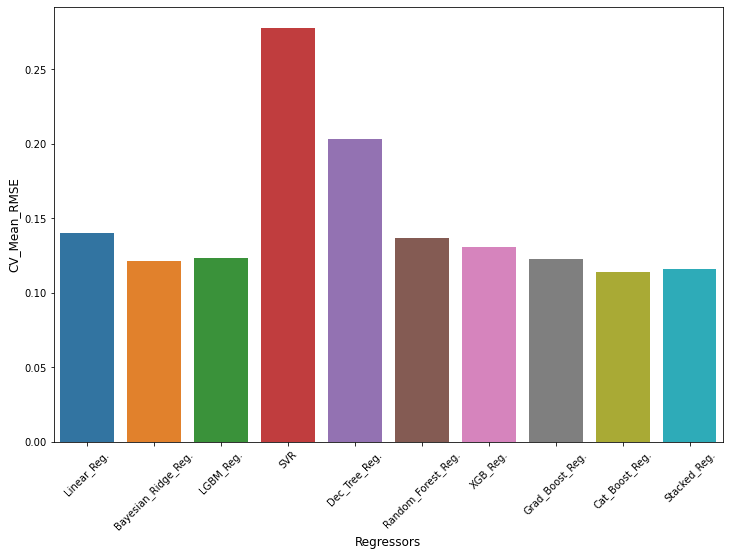

In [38]:
plt.figure(figsize = (12,8))
sns.barplot(final_cv_score['Regressors'],final_cv_score['RMSE_mean'])
plt.xlabel('Regressors', fontsize = 12)
plt.ylabel('CV_Mean_RMSE', fontsize = 12)
plt.xticks(rotation=45)
plt.show()

In [39]:
# Train-Test split the data

X_train,X_val,y_train,y_val = train_test_split(train,target_log,test_size = 0.1,random_state=42)

# Cat Boost Regressor

cat = CatBoostRegressor()
cat_model = cat.fit(X_train,y_train,
                     eval_set = (X_val,y_val),
                     plot=True,
                     verbose = 0)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [40]:
cat_pred = cat_model.predict(X_val)
cat_score = rmse(y_val, cat_pred)
cat_score

0.09338743540759231

Now let's take a look at the top 20 most important variables for our model. This could give us further insight into the functioning of the algorithm and how and which data it uses most to arrive at the final prediction.

In [41]:
# Features' importance of our model

feat_imp = cat_model.get_feature_importance(prettified=True)
feat_imp

,Feature Id,Importances
0,OverallQual,16.895094
1,Total_Home_Quality,7.599676
2,YearBuilt,7.018645
3,GrLivArea,6.984037
4,HighQualSF,6.605646
...,...,...
350,MiscFeature_TenC,0.000000
351,MoSold_9,0.000000
352,SaleType_CWD,0.000000
353,SaleType_VWD,0.000000


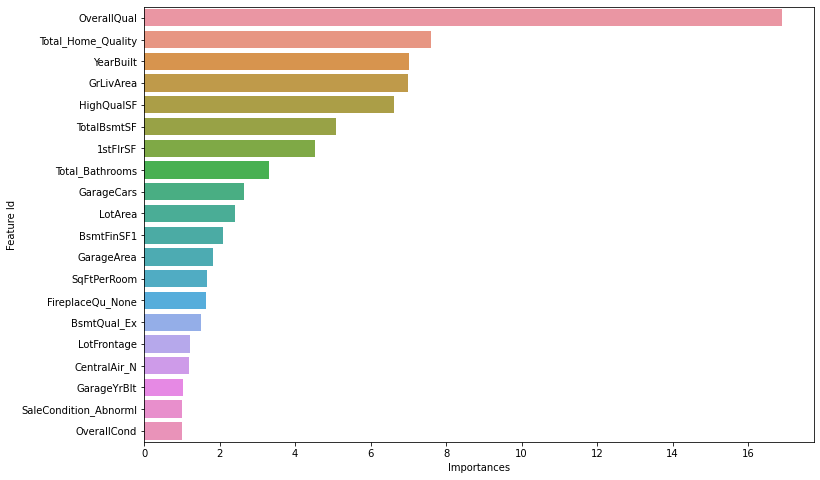

In [42]:
# Plotting top 20 features' importance

plt.figure(figsize = (12,8))
sns.barplot(feat_imp['Importances'][:20],feat_imp['Feature Id'][:20], orient = 'h')
plt.show()

In [43]:
# Feature importance Interactive Plot 

train_pool = Pool(X_train)
val_pool = Pool(X_val)

explainer = shap.TreeExplainer(cat_model) # insert your model
shap_values = explainer.shap_values(train_pool) # insert your train Pool object

shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[:200,:], X_train.iloc[:200,:])

# The plot represents just a slice of the Training data (200 observations)

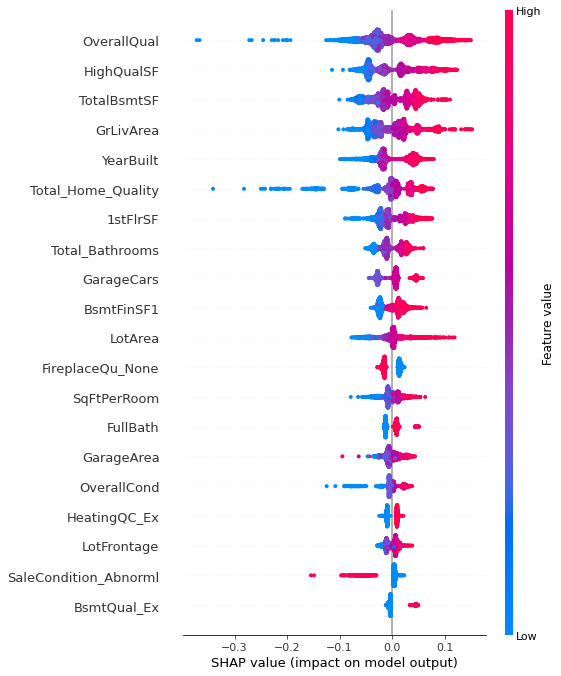

In [44]:
shap.summary_plot(shap_values, X_train)

The above diagram represents each observation (x-axis) for the feature presented (y-axis). The x location of each dot on the x-axis reflects the impact of that feature on the model's predictions, while the color of the dot represents the value of that feature for that exact observation. Dots that pile up on the line show density. Here we can see how features such as 'BsmtFinType1_GLQ' or 'BsmtQual_Ex', differently from 'GrLivArea' and 'OverallQual', do not contribute significantly in producing the final predictions.

N.B: Catboost comes with a great method: get_feature_importance. This method can be used to find important interactions among features. This is a huge advantage because it can give us insights about possible new features to create that can improve the performance.

In [45]:
# Features' Interactions

train_data = Pool(X_train)

interaction = cat_model.get_feature_importance(train_data, type="Interaction")
column_names = X_train.columns.values 
interaction = pd.DataFrame(interaction, columns=["feature1", "feature2", "importance"])
interaction.feature1 = interaction.feature1.apply(lambda l: column_names[int(l)])
interaction.feature2 = interaction.feature2.apply(lambda l: column_names[int(l)])
interaction.head(20)

,feature1,feature2,importance
0,OverallQual,HighQualSF,0.483243
1,OverallQual,GrLivArea,0.410336
2,LotArea,OverallQual,0.403188
3,OverallQual,Total_Bathrooms,0.394080
4,Total_Home_Quality,Total_Bathrooms,0.371443
5,OverallQual,Total_Home_Quality,0.365178
6,LotArea,SqFtPerRoom,0.342637
7,OverallQual,CentralAir_N,0.335785
8,LotArea,GarageYrBlt,0.332310
9,OverallQual,BsmtQual_Ex,0.325976


Which are the deafult parameters used by CaboostRegressor? This is our real baseline, now we need to optimize the hyperparameters trying to tune the model to obtain a better performance.

In [46]:
# Catboost default paramters

cat_model.get_all_params()

{'nan_mode': 'Min',
 'eval_metric': 'RMSE',
 'iterations': 1000,
 'sampling_frequency': 'PerTree',
 'leaf_estimation_method': 'Newton',
 'grow_policy': 'SymmetricTree',
 'penalties_coefficient': 1,
 'boosting_type': 'Plain',
 'model_shrink_mode': 'Constant',
 'feature_border_type': 'GreedyLogSum',
 'bayesian_matrix_reg': 0.10000000149011612,
 'eval_fraction': 0,
 'force_unit_auto_pair_weights': False,
 'l2_leaf_reg': 3,
 'random_strength': 1,
 'rsm': 1,
 'boost_from_average': True,
 'model_size_reg': 0.5,
 'pool_metainfo_options': {'tags': {}},
 'subsample': 0.800000011920929,
 'use_best_model': True,
 'random_seed': 0,
 'depth': 6,
 'posterior_sampling': False,
 'border_count': 254,
 'classes_count': 0,
 'auto_class_weights': 'None',
 'sparse_features_conflict_fraction': 0,
 'leaf_estimation_backtracking': 'AnyImprovement',
 'best_model_min_trees': 1,
 'model_shrink_rate': 0,
 'min_data_in_leaf': 1,
 'loss_function': 'RMSE',
 'learning_rate': 0.05929400026798248,
 'score_function': 'C

In [47]:
# Hyperparameter Optimization

# Preforming a Random Grid Search to find the best combination of parameters

grid = {'iterations': [1000,6000],
        'learning_rate': [0.05, 0.005, 0.0005],
        'depth': [4, 6, 10],
        'l2_leaf_reg': [1, 3, 5, 9]}

final_model = CatBoostRegressor()
randomized_search_result = final_model.randomized_search(grid,
                                                   X = X_train,
                                                   y= y_train,
                                                   verbose = False,
                                                   plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 12.0164568	test: 12.0164145	best: 12.0164145 (0)	total: 3.51ms	remaining: 3.5s
1:	learn: 12.0104754	test: 12.0104333	best: 12.0104333 (1)	total: 6.9ms	remaining: 3.44s
2:	learn: 12.0045167	test: 12.0044775	best: 12.0044775 (2)	total: 10.3ms	remaining: 3.42s
3:	learn: 11.9985500	test: 11.9985147	best: 11.9985147 (3)	total: 13.7ms	remaining: 3.4s
4:	learn: 11.9925706	test: 11.9925526	best: 11.9925526 (4)	total: 17ms	remaining: 3.39s
5:	learn: 11.9866024	test: 11.9865983	best: 11.9865983 (5)	total: 20.3ms	remaining: 3.36s
6:	learn: 11.9806596	test: 11.9806536	best: 11.9806536 (6)	total: 23.6ms	remaining: 3.35s
7:	learn: 11.9747055	test: 11.9747169	best: 11.9747169 (7)	total: 27ms	remaining: 3.35s
8:	learn: 11.9687529	test: 11.9687711	best: 11.9687711 (8)	total: 31ms	remaining: 3.41s
9:	learn: 11.9628038	test: 11.9628222	best: 11.9628222 (9)	total: 34.2ms	remaining: 3.39s
10:	learn: 11.9568346	test: 11.9568534	best: 11.9568534 (10)	total: 35.9ms	remaining: 3.23s
11:	learn: 11.950

101:	learn: 11.4274614	test: 11.4278243	best: 11.4278243 (101)	total: 361ms	remaining: 3.18s
102:	learn: 11.4217688	test: 11.4221323	best: 11.4221323 (102)	total: 365ms	remaining: 3.17s
103:	learn: 11.4160769	test: 11.4164533	best: 11.4164533 (103)	total: 368ms	remaining: 3.17s
104:	learn: 11.4103905	test: 11.4107554	best: 11.4107554 (104)	total: 372ms	remaining: 3.17s
105:	learn: 11.4047034	test: 11.4050650	best: 11.4050650 (105)	total: 375ms	remaining: 3.16s
106:	learn: 11.3990268	test: 11.3993886	best: 11.3993886 (106)	total: 379ms	remaining: 3.16s
107:	learn: 11.3933518	test: 11.3937174	best: 11.3937174 (107)	total: 383ms	remaining: 3.17s
108:	learn: 11.3876827	test: 11.3880479	best: 11.3880479 (108)	total: 388ms	remaining: 3.17s
109:	learn: 11.3820252	test: 11.3823923	best: 11.3823923 (109)	total: 392ms	remaining: 3.17s
110:	learn: 11.3763548	test: 11.3767320	best: 11.3767320 (110)	total: 395ms	remaining: 3.16s
111:	learn: 11.3706761	test: 11.3710539	best: 11.3710539 (111)	total: 

202:	learn: 10.8671434	test: 10.8678517	best: 10.8678517 (202)	total: 722ms	remaining: 2.84s
203:	learn: 10.8617407	test: 10.8624613	best: 10.8624613 (203)	total: 727ms	remaining: 2.84s
204:	learn: 10.8563428	test: 10.8570675	best: 10.8570675 (204)	total: 731ms	remaining: 2.83s
205:	learn: 10.8509326	test: 10.8516731	best: 10.8516731 (205)	total: 735ms	remaining: 2.83s
206:	learn: 10.8455278	test: 10.8462739	best: 10.8462739 (206)	total: 738ms	remaining: 2.83s
207:	learn: 10.8401264	test: 10.8408675	best: 10.8408675 (207)	total: 741ms	remaining: 2.82s
208:	learn: 10.8347215	test: 10.8354659	best: 10.8354659 (208)	total: 744ms	remaining: 2.81s
209:	learn: 10.8293420	test: 10.8301006	best: 10.8301006 (209)	total: 748ms	remaining: 2.81s
210:	learn: 10.8239588	test: 10.8247217	best: 10.8247217 (210)	total: 752ms	remaining: 2.81s
211:	learn: 10.8185666	test: 10.8193435	best: 10.8193435 (211)	total: 756ms	remaining: 2.81s
212:	learn: 10.8131805	test: 10.8139531	best: 10.8139531 (212)	total: 

303:	learn: 10.3344721	test: 10.3355180	best: 10.3355180 (303)	total: 1.08s	remaining: 2.48s
304:	learn: 10.3293230	test: 10.3303675	best: 10.3303675 (304)	total: 1.09s	remaining: 2.48s
305:	learn: 10.3241899	test: 10.3252360	best: 10.3252360 (305)	total: 1.09s	remaining: 2.47s
306:	learn: 10.3190525	test: 10.3201083	best: 10.3201083 (306)	total: 1.09s	remaining: 2.47s
307:	learn: 10.3139220	test: 10.3149709	best: 10.3149709 (307)	total: 1.1s	remaining: 2.46s
308:	learn: 10.3087917	test: 10.3098319	best: 10.3098319 (308)	total: 1.1s	remaining: 2.46s
309:	learn: 10.3036589	test: 10.3046973	best: 10.3046973 (309)	total: 1.1s	remaining: 2.46s
310:	learn: 10.2985254	test: 10.2995616	best: 10.2995616 (310)	total: 1.11s	remaining: 2.45s
311:	learn: 10.2933978	test: 10.2944313	best: 10.2944313 (311)	total: 1.11s	remaining: 2.45s
312:	learn: 10.2882695	test: 10.2893027	best: 10.2893027 (312)	total: 1.11s	remaining: 2.44s
313:	learn: 10.2831438	test: 10.2841759	best: 10.2841759 (313)	total: 1.1

402:	learn: 9.8376489	test: 9.8389630	best: 9.8389630 (402)	total: 1.45s	remaining: 2.14s
403:	learn: 9.8327530	test: 9.8340642	best: 9.8340642 (403)	total: 1.45s	remaining: 2.14s
404:	learn: 9.8278508	test: 9.8291628	best: 9.8291628 (404)	total: 1.45s	remaining: 2.13s
405:	learn: 9.8229593	test: 9.8242929	best: 9.8242929 (405)	total: 1.46s	remaining: 2.13s
406:	learn: 9.8180691	test: 9.8194116	best: 9.8194116 (406)	total: 1.46s	remaining: 2.13s
407:	learn: 9.8131879	test: 9.8145400	best: 9.8145400 (407)	total: 1.46s	remaining: 2.12s
408:	learn: 9.8083229	test: 9.8096805	best: 9.8096805 (408)	total: 1.47s	remaining: 2.12s
409:	learn: 9.8034490	test: 9.8048072	best: 9.8048072 (409)	total: 1.47s	remaining: 2.11s
410:	learn: 9.7985884	test: 9.7999488	best: 9.7999488 (410)	total: 1.47s	remaining: 2.11s
411:	learn: 9.7937201	test: 9.7950787	best: 9.7950787 (411)	total: 1.48s	remaining: 2.11s
412:	learn: 9.7888381	test: 9.7902228	best: 9.7902228 (412)	total: 1.48s	remaining: 2.1s
413:	learn:

505:	learn: 9.3461608	test: 9.3477725	best: 9.3477725 (505)	total: 1.81s	remaining: 1.76s
506:	learn: 9.3415197	test: 9.3431290	best: 9.3431290 (506)	total: 1.81s	remaining: 1.76s
507:	learn: 9.3368677	test: 9.3384731	best: 9.3384731 (507)	total: 1.81s	remaining: 1.75s
508:	learn: 9.3322175	test: 9.3338209	best: 9.3338209 (508)	total: 1.82s	remaining: 1.75s
509:	learn: 9.3275886	test: 9.3291828	best: 9.3291828 (509)	total: 1.82s	remaining: 1.75s
510:	learn: 9.3229516	test: 9.3245489	best: 9.3245489 (510)	total: 1.82s	remaining: 1.75s
511:	learn: 9.3183132	test: 9.3199138	best: 9.3199138 (511)	total: 1.83s	remaining: 1.74s
512:	learn: 9.3136728	test: 9.3152808	best: 9.3152808 (512)	total: 1.83s	remaining: 1.74s
513:	learn: 9.3090384	test: 9.3106527	best: 9.3106527 (513)	total: 1.83s	remaining: 1.73s
514:	learn: 9.3043999	test: 9.3060191	best: 9.3060191 (514)	total: 1.84s	remaining: 1.73s
515:	learn: 9.2997850	test: 9.3013978	best: 9.3013978 (515)	total: 1.84s	remaining: 1.73s
516:	learn

608:	learn: 8.8792618	test: 8.8811762	best: 8.8811762 (608)	total: 2.16s	remaining: 1.39s
609:	learn: 8.8748445	test: 8.8767696	best: 8.8767696 (609)	total: 2.17s	remaining: 1.39s
610:	learn: 8.8704311	test: 8.8723582	best: 8.8723582 (610)	total: 2.17s	remaining: 1.38s
611:	learn: 8.8660172	test: 8.8679364	best: 8.8679364 (611)	total: 2.17s	remaining: 1.38s
612:	learn: 8.8616147	test: 8.8635314	best: 8.8635314 (612)	total: 2.18s	remaining: 1.37s
613:	learn: 8.8571993	test: 8.8591205	best: 8.8591205 (613)	total: 2.18s	remaining: 1.37s
614:	learn: 8.8527893	test: 8.8547070	best: 8.8547070 (614)	total: 2.18s	remaining: 1.37s
615:	learn: 8.8483854	test: 8.8503042	best: 8.8503042 (615)	total: 2.19s	remaining: 1.36s
616:	learn: 8.8439806	test: 8.8459003	best: 8.8459003 (616)	total: 2.19s	remaining: 1.36s
617:	learn: 8.8395806	test: 8.8415105	best: 8.8415105 (617)	total: 2.19s	remaining: 1.36s
618:	learn: 8.8351819	test: 8.8371157	best: 8.8371157 (618)	total: 2.2s	remaining: 1.35s
619:	learn:

712:	learn: 8.4315811	test: 8.4337788	best: 8.4337788 (712)	total: 2.52s	remaining: 1.01s
713:	learn: 8.4273928	test: 8.4295920	best: 8.4295920 (713)	total: 2.52s	remaining: 1.01s
714:	learn: 8.4231989	test: 8.4253963	best: 8.4253963 (714)	total: 2.53s	remaining: 1.01s
715:	learn: 8.4190059	test: 8.4211944	best: 8.4211944 (715)	total: 2.53s	remaining: 1s
716:	learn: 8.4148243	test: 8.4170154	best: 8.4170154 (716)	total: 2.54s	remaining: 1s
717:	learn: 8.4106336	test: 8.4128348	best: 8.4128348 (717)	total: 2.54s	remaining: 997ms
718:	learn: 8.4064492	test: 8.4086582	best: 8.4086582 (718)	total: 2.54s	remaining: 994ms
719:	learn: 8.4022774	test: 8.4044804	best: 8.4044804 (719)	total: 2.55s	remaining: 990ms
720:	learn: 8.3981077	test: 8.4003148	best: 8.4003148 (720)	total: 2.55s	remaining: 987ms
721:	learn: 8.3939380	test: 8.3961522	best: 8.3961522 (721)	total: 2.55s	remaining: 983ms
722:	learn: 8.3897622	test: 8.3920033	best: 8.3920033 (722)	total: 2.56s	remaining: 980ms
723:	learn: 8.38

817:	learn: 8.0025748	test: 8.0050093	best: 8.0050093 (817)	total: 2.88s	remaining: 641ms
818:	learn: 7.9985892	test: 8.0010290	best: 8.0010290 (818)	total: 2.88s	remaining: 638ms
819:	learn: 7.9946128	test: 7.9970629	best: 7.9970629 (819)	total: 2.89s	remaining: 634ms
820:	learn: 7.9906371	test: 7.9930797	best: 7.9930797 (820)	total: 2.89s	remaining: 631ms
821:	learn: 7.9866624	test: 7.9891020	best: 7.9891020 (821)	total: 2.9s	remaining: 627ms
822:	learn: 7.9826929	test: 7.9851320	best: 7.9851320 (822)	total: 2.9s	remaining: 624ms
823:	learn: 7.9787277	test: 7.9811656	best: 7.9811656 (823)	total: 2.9s	remaining: 620ms
824:	learn: 7.9747614	test: 7.9772001	best: 7.9772001 (824)	total: 2.91s	remaining: 617ms
825:	learn: 7.9707975	test: 7.9732515	best: 7.9732515 (825)	total: 2.91s	remaining: 613ms
826:	learn: 7.9668284	test: 7.9692826	best: 7.9692826 (826)	total: 2.91s	remaining: 610ms
827:	learn: 7.9628712	test: 7.9653327	best: 7.9653327 (827)	total: 2.92s	remaining: 606ms
828:	learn: 7

920:	learn: 7.6029602	test: 7.6056301	best: 7.6056301 (920)	total: 3.24s	remaining: 278ms
921:	learn: 7.5991752	test: 7.6018457	best: 7.6018457 (921)	total: 3.24s	remaining: 274ms
922:	learn: 7.5953950	test: 7.5980776	best: 7.5980776 (922)	total: 3.25s	remaining: 271ms
923:	learn: 7.5916124	test: 7.5943060	best: 7.5943060 (923)	total: 3.25s	remaining: 267ms
924:	learn: 7.5878395	test: 7.5905365	best: 7.5905365 (924)	total: 3.25s	remaining: 264ms
925:	learn: 7.5840612	test: 7.5867543	best: 7.5867543 (925)	total: 3.26s	remaining: 260ms
926:	learn: 7.5803002	test: 7.5830006	best: 7.5830006 (926)	total: 3.26s	remaining: 257ms
927:	learn: 7.5765310	test: 7.5792426	best: 7.5792426 (927)	total: 3.27s	remaining: 253ms
928:	learn: 7.5727622	test: 7.5754679	best: 7.5754679 (928)	total: 3.27s	remaining: 250ms
929:	learn: 7.5690063	test: 7.5717121	best: 7.5717121 (929)	total: 3.27s	remaining: 246ms
930:	learn: 7.5652382	test: 7.5679413	best: 7.5679413 (930)	total: 3.28s	remaining: 243ms
931:	learn

25:	learn: 11.8714370	test: 11.8713647	best: 11.8713647 (25)	total: 83.6ms	remaining: 19.2s
26:	learn: 11.8656338	test: 11.8656099	best: 11.8656099 (26)	total: 86.9ms	remaining: 19.2s
27:	learn: 11.8597742	test: 11.8597513	best: 11.8597513 (27)	total: 90.1ms	remaining: 19.2s
28:	learn: 11.8540609	test: 11.8540124	best: 11.8540124 (28)	total: 93.3ms	remaining: 19.2s
29:	learn: 11.8482490	test: 11.8482014	best: 11.8482014 (29)	total: 96.6ms	remaining: 19.2s
30:	learn: 11.8424234	test: 11.8423951	best: 11.8423951 (30)	total: 99.7ms	remaining: 19.2s
31:	learn: 11.8366119	test: 11.8365615	best: 11.8365615 (31)	total: 103ms	remaining: 19.2s
32:	learn: 11.8310028	test: 11.8309609	best: 11.8309609 (32)	total: 106ms	remaining: 19.2s
33:	learn: 11.8252492	test: 11.8251960	best: 11.8251960 (33)	total: 109ms	remaining: 19.2s
34:	learn: 11.8195219	test: 11.8194807	best: 11.8194807 (34)	total: 113ms	remaining: 19.2s
35:	learn: 11.8136960	test: 11.8136577	best: 11.8136577 (35)	total: 116ms	remaining:

131:	learn: 11.2742988	test: 11.2745566	best: 11.2745566 (131)	total: 439ms	remaining: 19.5s
132:	learn: 11.2687903	test: 11.2690336	best: 11.2690336 (132)	total: 442ms	remaining: 19.5s
133:	learn: 11.2632686	test: 11.2634948	best: 11.2634948 (133)	total: 446ms	remaining: 19.5s
134:	learn: 11.2577862	test: 11.2580239	best: 11.2580239 (134)	total: 450ms	remaining: 19.5s
135:	learn: 11.2523643	test: 11.2525949	best: 11.2525949 (135)	total: 453ms	remaining: 19.6s
136:	learn: 11.2468411	test: 11.2471139	best: 11.2471139 (136)	total: 457ms	remaining: 19.6s
137:	learn: 11.2414097	test: 11.2417063	best: 11.2417063 (137)	total: 461ms	remaining: 19.6s
138:	learn: 11.2359264	test: 11.2361990	best: 11.2361990 (138)	total: 464ms	remaining: 19.6s
139:	learn: 11.2304930	test: 11.2307554	best: 11.2307554 (139)	total: 468ms	remaining: 19.6s
140:	learn: 11.2249541	test: 11.2252390	best: 11.2252390 (140)	total: 472ms	remaining: 19.6s
141:	learn: 11.2194683	test: 11.2197663	best: 11.2197663 (141)	total: 

236:	learn: 10.7121073	test: 10.7129424	best: 10.7129424 (236)	total: 798ms	remaining: 19.4s
237:	learn: 10.7069505	test: 10.7077870	best: 10.7077870 (237)	total: 802ms	remaining: 19.4s
238:	learn: 10.7017977	test: 10.7026429	best: 10.7026429 (238)	total: 805ms	remaining: 19.4s
239:	learn: 10.6967285	test: 10.6975596	best: 10.6975596 (239)	total: 809ms	remaining: 19.4s
240:	learn: 10.6915625	test: 10.6924058	best: 10.6924058 (240)	total: 812ms	remaining: 19.4s
241:	learn: 10.6863714	test: 10.6872344	best: 10.6872344 (241)	total: 816ms	remaining: 19.4s
242:	learn: 10.6810887	test: 10.6819433	best: 10.6819433 (242)	total: 819ms	remaining: 19.4s
243:	learn: 10.6758382	test: 10.6767352	best: 10.6767352 (243)	total: 822ms	remaining: 19.4s
244:	learn: 10.6706586	test: 10.6715331	best: 10.6715331 (244)	total: 826ms	remaining: 19.4s
245:	learn: 10.6655462	test: 10.6664510	best: 10.6664510 (245)	total: 830ms	remaining: 19.4s
246:	learn: 10.6603942	test: 10.6612861	best: 10.6612861 (246)	total: 

336:	learn: 10.2028798	test: 10.2038170	best: 10.2038170 (336)	total: 1.16s	remaining: 19.5s
337:	learn: 10.1979302	test: 10.1988827	best: 10.1988827 (337)	total: 1.16s	remaining: 19.5s
338:	learn: 10.1929580	test: 10.1939003	best: 10.1939003 (338)	total: 1.17s	remaining: 19.5s
339:	learn: 10.1879721	test: 10.1889372	best: 10.1889372 (339)	total: 1.17s	remaining: 19.5s
340:	learn: 10.1829681	test: 10.1839649	best: 10.1839649 (340)	total: 1.18s	remaining: 19.5s
341:	learn: 10.1780303	test: 10.1790507	best: 10.1790507 (341)	total: 1.18s	remaining: 19.5s
342:	learn: 10.1730382	test: 10.1740513	best: 10.1740513 (342)	total: 1.18s	remaining: 19.5s
343:	learn: 10.1680706	test: 10.1690906	best: 10.1690906 (343)	total: 1.19s	remaining: 19.5s
344:	learn: 10.1632360	test: 10.1642951	best: 10.1642951 (344)	total: 1.19s	remaining: 19.5s
345:	learn: 10.1582485	test: 10.1592828	best: 10.1592828 (345)	total: 1.19s	remaining: 19.5s
346:	learn: 10.1533326	test: 10.1544009	best: 10.1544009 (346)	total: 

440:	learn: 9.6997787	test: 9.7012500	best: 9.7012500 (440)	total: 1.52s	remaining: 19.2s
441:	learn: 9.6951026	test: 9.6965827	best: 9.6965827 (441)	total: 1.53s	remaining: 19.2s
442:	learn: 9.6903317	test: 9.6918205	best: 9.6918205 (442)	total: 1.53s	remaining: 19.2s
443:	learn: 9.6857485	test: 9.6872610	best: 9.6872610 (443)	total: 1.53s	remaining: 19.2s
444:	learn: 9.6810539	test: 9.6825687	best: 9.6825687 (444)	total: 1.54s	remaining: 19.2s
445:	learn: 9.6762913	test: 9.6778072	best: 9.6778072 (445)	total: 1.54s	remaining: 19.2s
446:	learn: 9.6716653	test: 9.6731812	best: 9.6731812 (446)	total: 1.54s	remaining: 19.2s
447:	learn: 9.6669825	test: 9.6685134	best: 9.6685134 (447)	total: 1.55s	remaining: 19.2s
448:	learn: 9.6622148	test: 9.6637594	best: 9.6637594 (448)	total: 1.55s	remaining: 19.2s
449:	learn: 9.6575545	test: 9.6590785	best: 9.6590785 (449)	total: 1.55s	remaining: 19.2s
450:	learn: 9.6528325	test: 9.6543826	best: 9.6543826 (450)	total: 1.56s	remaining: 19.2s
451:	learn

546:	learn: 9.2116662	test: 9.2133515	best: 9.2133515 (546)	total: 1.88s	remaining: 18.7s
547:	learn: 9.2072207	test: 9.2089329	best: 9.2089329 (547)	total: 1.88s	remaining: 18.7s
548:	learn: 9.2027352	test: 9.2044603	best: 9.2044603 (548)	total: 1.88s	remaining: 18.7s
549:	learn: 9.1982597	test: 9.1999782	best: 9.1999782 (549)	total: 1.89s	remaining: 18.7s
550:	learn: 9.1937717	test: 9.1954792	best: 9.1954792 (550)	total: 1.89s	remaining: 18.7s
551:	learn: 9.1892629	test: 9.1909627	best: 9.1909627 (551)	total: 1.89s	remaining: 18.7s
552:	learn: 9.1848127	test: 9.1865284	best: 9.1865284 (552)	total: 1.9s	remaining: 18.7s
553:	learn: 9.1803871	test: 9.1821452	best: 9.1821452 (553)	total: 1.9s	remaining: 18.7s
554:	learn: 9.1759343	test: 9.1777324	best: 9.1777324 (554)	total: 1.9s	remaining: 18.7s
555:	learn: 9.1715213	test: 9.1732934	best: 9.1732934 (555)	total: 1.91s	remaining: 18.7s
556:	learn: 9.1669626	test: 9.1687354	best: 9.1687354 (556)	total: 1.91s	remaining: 18.7s
557:	learn: 9

654:	learn: 8.7398149	test: 8.7418798	best: 8.7418798 (654)	total: 2.23s	remaining: 18.2s
655:	learn: 8.7355169	test: 8.7375718	best: 8.7375718 (655)	total: 2.24s	remaining: 18.2s
656:	learn: 8.7312788	test: 8.7333178	best: 8.7333178 (656)	total: 2.24s	remaining: 18.2s
657:	learn: 8.7269853	test: 8.7290161	best: 8.7290161 (657)	total: 2.25s	remaining: 18.2s
658:	learn: 8.7227032	test: 8.7247230	best: 8.7247230 (658)	total: 2.25s	remaining: 18.2s
659:	learn: 8.7184505	test: 8.7204607	best: 8.7204607 (659)	total: 2.25s	remaining: 18.2s
660:	learn: 8.7142524	test: 8.7162512	best: 8.7162512 (660)	total: 2.26s	remaining: 18.2s
661:	learn: 8.7099733	test: 8.7119786	best: 8.7119786 (661)	total: 2.26s	remaining: 18.2s
662:	learn: 8.7057296	test: 8.7077513	best: 8.7077513 (662)	total: 2.26s	remaining: 18.2s
663:	learn: 8.7014609	test: 8.7034827	best: 8.7034827 (663)	total: 2.27s	remaining: 18.2s
664:	learn: 8.6972104	test: 8.6992238	best: 8.6992238 (664)	total: 2.27s	remaining: 18.2s
665:	learn

751:	learn: 8.3366338	test: 8.3390536	best: 8.3390536 (751)	total: 2.6s	remaining: 18.1s
752:	learn: 8.3325721	test: 8.3349845	best: 8.3349845 (752)	total: 2.6s	remaining: 18.1s
753:	learn: 8.3285368	test: 8.3309656	best: 8.3309656 (753)	total: 2.6s	remaining: 18.1s
754:	learn: 8.3244316	test: 8.3268682	best: 8.3268682 (754)	total: 2.61s	remaining: 18.1s
755:	learn: 8.3203890	test: 8.3228205	best: 8.3228205 (755)	total: 2.61s	remaining: 18.1s
756:	learn: 8.3163072	test: 8.3187441	best: 8.3187441 (756)	total: 2.61s	remaining: 18.1s
757:	learn: 8.3122481	test: 8.3146729	best: 8.3146729 (757)	total: 2.62s	remaining: 18.1s
758:	learn: 8.3081781	test: 8.3105988	best: 8.3105988 (758)	total: 2.62s	remaining: 18.1s
759:	learn: 8.3041373	test: 8.3065625	best: 8.3065625 (759)	total: 2.62s	remaining: 18.1s
760:	learn: 8.3000958	test: 8.3025285	best: 8.3025285 (760)	total: 2.63s	remaining: 18.1s
761:	learn: 8.2960879	test: 8.2985000	best: 8.2985000 (761)	total: 2.63s	remaining: 18.1s
762:	learn: 8

856:	learn: 7.9212248	test: 7.9242436	best: 7.9242436 (856)	total: 2.95s	remaining: 17.7s
857:	learn: 7.9173355	test: 7.9203490	best: 7.9203490 (857)	total: 2.96s	remaining: 17.7s
858:	learn: 7.9134666	test: 7.9165179	best: 7.9165179 (858)	total: 2.96s	remaining: 17.7s
859:	learn: 7.9096630	test: 7.9127290	best: 7.9127290 (859)	total: 2.96s	remaining: 17.7s
860:	learn: 7.9058151	test: 7.9088699	best: 7.9088699 (860)	total: 2.97s	remaining: 17.7s
861:	learn: 7.9019421	test: 7.9049980	best: 7.9049980 (861)	total: 2.97s	remaining: 17.7s
862:	learn: 7.8981674	test: 7.9012346	best: 7.9012346 (862)	total: 2.98s	remaining: 17.7s
863:	learn: 7.8944343	test: 7.8974897	best: 7.8974897 (863)	total: 2.98s	remaining: 17.7s
864:	learn: 7.8906032	test: 7.8936667	best: 7.8936667 (864)	total: 2.98s	remaining: 17.7s
865:	learn: 7.8867277	test: 7.8897905	best: 7.8897905 (865)	total: 2.98s	remaining: 17.7s
866:	learn: 7.8829096	test: 7.8859671	best: 7.8859671 (866)	total: 2.99s	remaining: 17.7s
867:	learn

958:	learn: 7.5380572	test: 7.5414868	best: 7.5414868 (958)	total: 3.32s	remaining: 17.4s
959:	learn: 7.5343704	test: 7.5378086	best: 7.5378086 (959)	total: 3.32s	remaining: 17.4s
960:	learn: 7.5307184	test: 7.5341405	best: 7.5341405 (960)	total: 3.32s	remaining: 17.4s
961:	learn: 7.5270284	test: 7.5304483	best: 7.5304483 (961)	total: 3.33s	remaining: 17.4s
962:	learn: 7.5233698	test: 7.5268259	best: 7.5268259 (962)	total: 3.33s	remaining: 17.4s
963:	learn: 7.5197266	test: 7.5231849	best: 7.5231849 (963)	total: 3.33s	remaining: 17.4s
964:	learn: 7.5160638	test: 7.5195132	best: 7.5195132 (964)	total: 3.34s	remaining: 17.4s
965:	learn: 7.5124481	test: 7.5159017	best: 7.5159017 (965)	total: 3.34s	remaining: 17.4s
966:	learn: 7.5088154	test: 7.5122657	best: 7.5122657 (966)	total: 3.35s	remaining: 17.4s
967:	learn: 7.5051944	test: 7.5086402	best: 7.5086402 (967)	total: 3.35s	remaining: 17.4s
968:	learn: 7.5015564	test: 7.5050112	best: 7.5050112 (968)	total: 3.35s	remaining: 17.4s
969:	learn

1061:	learn: 7.1701917	test: 7.1737861	best: 7.1737861 (1061)	total: 3.68s	remaining: 17.1s
1062:	learn: 7.1666826	test: 7.1702750	best: 7.1702750 (1062)	total: 3.68s	remaining: 17.1s
1063:	learn: 7.1632094	test: 7.1668031	best: 7.1668031 (1063)	total: 3.68s	remaining: 17.1s
1064:	learn: 7.1596984	test: 7.1632984	best: 7.1632984 (1064)	total: 3.69s	remaining: 17.1s
1065:	learn: 7.1561713	test: 7.1597667	best: 7.1597667 (1065)	total: 3.69s	remaining: 17.1s
1066:	learn: 7.1527820	test: 7.1563900	best: 7.1563900 (1066)	total: 3.69s	remaining: 17.1s
1067:	learn: 7.1492605	test: 7.1528622	best: 7.1528622 (1067)	total: 3.7s	remaining: 17.1s
1068:	learn: 7.1458754	test: 7.1494615	best: 7.1494615 (1068)	total: 3.7s	remaining: 17.1s
1069:	learn: 7.1424407	test: 7.1460187	best: 7.1460187 (1069)	total: 3.7s	remaining: 17.1s
1070:	learn: 7.1389393	test: 7.1425174	best: 7.1425174 (1070)	total: 3.71s	remaining: 17.1s
1071:	learn: 7.1354431	test: 7.1390150	best: 7.1390150 (1071)	total: 3.71s	remainin

1164:	learn: 6.8198185	test: 6.8234720	best: 6.8234720 (1164)	total: 4.04s	remaining: 16.8s
1165:	learn: 6.8164750	test: 6.8201200	best: 6.8201200 (1165)	total: 4.04s	remaining: 16.8s
1166:	learn: 6.8131947	test: 6.8168349	best: 6.8168349 (1166)	total: 4.04s	remaining: 16.8s
1167:	learn: 6.8098950	test: 6.8135290	best: 6.8135290 (1167)	total: 4.05s	remaining: 16.8s
1168:	learn: 6.8065724	test: 6.8102162	best: 6.8102162 (1168)	total: 4.05s	remaining: 16.8s
1169:	learn: 6.8032220	test: 6.8068821	best: 6.8068821 (1169)	total: 4.06s	remaining: 16.7s
1170:	learn: 6.7999281	test: 6.8036067	best: 6.8036067 (1170)	total: 4.06s	remaining: 16.7s
1171:	learn: 6.7966430	test: 6.8003285	best: 6.8003285 (1171)	total: 4.06s	remaining: 16.7s
1172:	learn: 6.7933415	test: 6.7970286	best: 6.7970286 (1172)	total: 4.07s	remaining: 16.7s
1173:	learn: 6.7899684	test: 6.7936563	best: 6.7936563 (1173)	total: 4.07s	remaining: 16.7s
1174:	learn: 6.7866421	test: 6.7903377	best: 6.7903377 (1174)	total: 4.07s	remai

1264:	learn: 6.4955891	test: 6.4994877	best: 6.4994877 (1264)	total: 4.4s	remaining: 16.5s
1265:	learn: 6.4924343	test: 6.4963388	best: 6.4963388 (1265)	total: 4.4s	remaining: 16.5s
1266:	learn: 6.4892840	test: 6.4931931	best: 6.4931931 (1266)	total: 4.41s	remaining: 16.5s
1267:	learn: 6.4861139	test: 6.4900338	best: 6.4900338 (1267)	total: 4.41s	remaining: 16.5s
1268:	learn: 6.4829353	test: 6.4868489	best: 6.4868489 (1268)	total: 4.41s	remaining: 16.4s
1269:	learn: 6.4797670	test: 6.4836791	best: 6.4836791 (1269)	total: 4.42s	remaining: 16.4s
1270:	learn: 6.4766065	test: 6.4805125	best: 6.4805125 (1270)	total: 4.42s	remaining: 16.4s
1271:	learn: 6.4735224	test: 6.4774149	best: 6.4774149 (1271)	total: 4.42s	remaining: 16.4s
1272:	learn: 6.4704071	test: 6.4742990	best: 6.4742990 (1272)	total: 4.43s	remaining: 16.4s
1273:	learn: 6.4672753	test: 6.4711701	best: 6.4711701 (1273)	total: 4.43s	remaining: 16.4s
1274:	learn: 6.4641253	test: 6.4680326	best: 6.4680326 (1274)	total: 4.43s	remaini

1371:	learn: 6.1664169	test: 6.1705130	best: 6.1705130 (1371)	total: 4.76s	remaining: 16s
1372:	learn: 6.1634056	test: 6.1675084	best: 6.1675084 (1372)	total: 4.76s	remaining: 16s
1373:	learn: 6.1604026	test: 6.1645356	best: 6.1645356 (1373)	total: 4.76s	remaining: 16s
1374:	learn: 6.1574362	test: 6.1615765	best: 6.1615765 (1374)	total: 4.77s	remaining: 16s
1375:	learn: 6.1544170	test: 6.1585617	best: 6.1585617 (1375)	total: 4.77s	remaining: 16s
1376:	learn: 6.1514255	test: 6.1555710	best: 6.1555710 (1376)	total: 4.78s	remaining: 16s
1377:	learn: 6.1484475	test: 6.1526087	best: 6.1526087 (1377)	total: 4.78s	remaining: 16s
1378:	learn: 6.1454446	test: 6.1496344	best: 6.1496344 (1378)	total: 4.78s	remaining: 16s
1379:	learn: 6.1424560	test: 6.1466491	best: 6.1466491 (1379)	total: 4.79s	remaining: 16s
1380:	learn: 6.1394585	test: 6.1436718	best: 6.1436718 (1380)	total: 4.79s	remaining: 16s
1381:	learn: 6.1364295	test: 6.1406471	best: 6.1406471 (1381)	total: 4.79s	remaining: 16s
1382:	lear

1474:	learn: 5.8656538	test: 5.8702101	best: 5.8702101 (1474)	total: 5.12s	remaining: 15.7s
1475:	learn: 5.8628266	test: 5.8673769	best: 5.8673769 (1475)	total: 5.12s	remaining: 15.7s
1476:	learn: 5.8599333	test: 5.8644793	best: 5.8644793 (1476)	total: 5.12s	remaining: 15.7s
1477:	learn: 5.8571430	test: 5.8616941	best: 5.8616941 (1477)	total: 5.13s	remaining: 15.7s
1478:	learn: 5.8543365	test: 5.8588740	best: 5.8588740 (1478)	total: 5.13s	remaining: 15.7s
1479:	learn: 5.8515230	test: 5.8560507	best: 5.8560507 (1479)	total: 5.14s	remaining: 15.7s
1480:	learn: 5.8486828	test: 5.8532157	best: 5.8532157 (1480)	total: 5.14s	remaining: 15.7s
1481:	learn: 5.8458282	test: 5.8503580	best: 5.8503580 (1481)	total: 5.14s	remaining: 15.7s
1482:	learn: 5.8429978	test: 5.8475220	best: 5.8475220 (1482)	total: 5.15s	remaining: 15.7s
1483:	learn: 5.8401831	test: 5.8446957	best: 5.8446957 (1483)	total: 5.15s	remaining: 15.7s
1484:	learn: 5.8373273	test: 5.8418349	best: 5.8418349 (1484)	total: 5.15s	remai

1579:	learn: 5.5741156	test: 5.5788064	best: 5.5788064 (1579)	total: 5.48s	remaining: 15.3s
1580:	learn: 5.5713911	test: 5.5760967	best: 5.5760967 (1580)	total: 5.48s	remaining: 15.3s
1581:	learn: 5.5686583	test: 5.5733865	best: 5.5733865 (1581)	total: 5.48s	remaining: 15.3s
1582:	learn: 5.5659482	test: 5.5706678	best: 5.5706678 (1582)	total: 5.49s	remaining: 15.3s
1583:	learn: 5.5632509	test: 5.5679707	best: 5.5679707 (1583)	total: 5.49s	remaining: 15.3s
1584:	learn: 5.5605623	test: 5.5652796	best: 5.5652796 (1584)	total: 5.5s	remaining: 15.3s
1585:	learn: 5.5578833	test: 5.5625969	best: 5.5625969 (1585)	total: 5.5s	remaining: 15.3s
1586:	learn: 5.5552124	test: 5.5599199	best: 5.5599199 (1586)	total: 5.5s	remaining: 15.3s
1587:	learn: 5.5524860	test: 5.5571950	best: 5.5571950 (1587)	total: 5.5s	remaining: 15.3s
1588:	learn: 5.5497553	test: 5.5544659	best: 5.5544659 (1588)	total: 5.51s	remaining: 15.3s
1589:	learn: 5.5470548	test: 5.5517688	best: 5.5517688 (1589)	total: 5.51s	remaining

1683:	learn: 5.2994824	test: 5.3042502	best: 5.3042502 (1683)	total: 5.83s	remaining: 15s
1684:	learn: 5.2969429	test: 5.3017017	best: 5.3017017 (1684)	total: 5.84s	remaining: 15s
1685:	learn: 5.2943669	test: 5.2991214	best: 5.2991214 (1685)	total: 5.84s	remaining: 14.9s
1686:	learn: 5.2917853	test: 5.2965475	best: 5.2965475 (1686)	total: 5.84s	remaining: 14.9s
1687:	learn: 5.2892271	test: 5.2939913	best: 5.2939913 (1687)	total: 5.85s	remaining: 14.9s
1688:	learn: 5.2866334	test: 5.2913859	best: 5.2913859 (1688)	total: 5.85s	remaining: 14.9s
1689:	learn: 5.2840720	test: 5.2888336	best: 5.2888336 (1689)	total: 5.86s	remaining: 14.9s
1690:	learn: 5.2815004	test: 5.2862489	best: 5.2862489 (1690)	total: 5.86s	remaining: 14.9s
1691:	learn: 5.2789353	test: 5.2836871	best: 5.2836871 (1691)	total: 5.86s	remaining: 14.9s
1692:	learn: 5.2763598	test: 5.2811277	best: 5.2811277 (1692)	total: 5.87s	remaining: 14.9s
1693:	learn: 5.2737826	test: 5.2785509	best: 5.2785509 (1693)	total: 5.87s	remaining

1792:	learn: 5.0260779	test: 5.0310325	best: 5.0310325 (1792)	total: 6.19s	remaining: 14.5s
1793:	learn: 5.0236224	test: 5.0285793	best: 5.0285793 (1793)	total: 6.2s	remaining: 14.5s
1794:	learn: 5.0211873	test: 5.0261581	best: 5.0261581 (1794)	total: 6.2s	remaining: 14.5s
1795:	learn: 5.0187584	test: 5.0237361	best: 5.0237361 (1795)	total: 6.2s	remaining: 14.5s
1796:	learn: 5.0162711	test: 5.0212496	best: 5.0212496 (1796)	total: 6.2s	remaining: 14.5s
1797:	learn: 5.0138348	test: 5.0188037	best: 5.0188037 (1797)	total: 6.21s	remaining: 14.5s
1798:	learn: 5.0114066	test: 5.0163884	best: 5.0163884 (1798)	total: 6.21s	remaining: 14.5s
1799:	learn: 5.0089561	test: 5.0139380	best: 5.0139380 (1799)	total: 6.21s	remaining: 14.5s
1800:	learn: 5.0065101	test: 5.0114786	best: 5.0114786 (1800)	total: 6.22s	remaining: 14.5s
1801:	learn: 5.0040389	test: 5.0090098	best: 5.0090098 (1801)	total: 6.22s	remaining: 14.5s
1802:	learn: 5.0016560	test: 5.0066360	best: 5.0066360 (1802)	total: 6.22s	remaining

1895:	learn: 4.7811324	test: 4.7862544	best: 4.7862544 (1895)	total: 6.55s	remaining: 14.2s
1896:	learn: 4.7788231	test: 4.7839470	best: 4.7839470 (1896)	total: 6.55s	remaining: 14.2s
1897:	learn: 4.7765217	test: 4.7816479	best: 4.7816479 (1897)	total: 6.55s	remaining: 14.2s
1898:	learn: 4.7741985	test: 4.7793250	best: 4.7793250 (1898)	total: 6.56s	remaining: 14.2s
1899:	learn: 4.7718877	test: 4.7770171	best: 4.7770171 (1899)	total: 6.56s	remaining: 14.2s
1900:	learn: 4.7695839	test: 4.7747139	best: 4.7747139 (1900)	total: 6.56s	remaining: 14.2s
1901:	learn: 4.7673324	test: 4.7724575	best: 4.7724575 (1901)	total: 6.57s	remaining: 14.2s
1902:	learn: 4.7650243	test: 4.7701536	best: 4.7701536 (1902)	total: 6.57s	remaining: 14.1s
1903:	learn: 4.7627367	test: 4.7678792	best: 4.7678792 (1903)	total: 6.58s	remaining: 14.1s
1904:	learn: 4.7604447	test: 4.7655830	best: 4.7655830 (1904)	total: 6.58s	remaining: 14.1s
1905:	learn: 4.7581815	test: 4.7633193	best: 4.7633193 (1905)	total: 6.58s	remai

1996:	learn: 4.5528780	test: 4.5582092	best: 4.5582092 (1996)	total: 6.91s	remaining: 13.8s
1997:	learn: 4.5506410	test: 4.5559784	best: 4.5559784 (1997)	total: 6.91s	remaining: 13.8s
1998:	learn: 4.5484191	test: 4.5537632	best: 4.5537632 (1998)	total: 6.91s	remaining: 13.8s
1999:	learn: 4.5462157	test: 4.5515619	best: 4.5515619 (1999)	total: 6.92s	remaining: 13.8s
2000:	learn: 4.5440451	test: 4.5493997	best: 4.5493997 (2000)	total: 6.92s	remaining: 13.8s
2001:	learn: 4.5418271	test: 4.5471801	best: 4.5471801 (2001)	total: 6.92s	remaining: 13.8s
2002:	learn: 4.5396030	test: 4.5449716	best: 4.5449716 (2002)	total: 6.93s	remaining: 13.8s
2003:	learn: 4.5373963	test: 4.5427617	best: 4.5427617 (2003)	total: 6.93s	remaining: 13.8s
2004:	learn: 4.5352026	test: 4.5405597	best: 4.5405597 (2004)	total: 6.93s	remaining: 13.8s
2005:	learn: 4.5330290	test: 4.5383789	best: 4.5383789 (2005)	total: 6.94s	remaining: 13.8s
2006:	learn: 4.5308211	test: 4.5361765	best: 4.5361765 (2006)	total: 6.94s	remai

2099:	learn: 4.3308389	test: 4.3363568	best: 4.3363568 (2099)	total: 7.27s	remaining: 13.5s
2100:	learn: 4.3287468	test: 4.3342758	best: 4.3342758 (2100)	total: 7.27s	remaining: 13.5s
2101:	learn: 4.3266401	test: 4.3321923	best: 4.3321923 (2101)	total: 7.28s	remaining: 13.5s
2102:	learn: 4.3245592	test: 4.3301194	best: 4.3301194 (2102)	total: 7.28s	remaining: 13.5s
2103:	learn: 4.3224514	test: 4.3280150	best: 4.3280150 (2103)	total: 7.28s	remaining: 13.5s
2104:	learn: 4.3203667	test: 4.3259233	best: 4.3259233 (2104)	total: 7.29s	remaining: 13.5s
2105:	learn: 4.3182537	test: 4.3238082	best: 4.3238082 (2105)	total: 7.29s	remaining: 13.5s
2106:	learn: 4.3161586	test: 4.3217073	best: 4.3217073 (2106)	total: 7.29s	remaining: 13.5s
2107:	learn: 4.3140491	test: 4.3196081	best: 4.3196081 (2107)	total: 7.3s	remaining: 13.5s
2108:	learn: 4.3119395	test: 4.3175007	best: 4.3175007 (2108)	total: 7.3s	remaining: 13.5s
2109:	learn: 4.3098440	test: 4.3153995	best: 4.3153995 (2109)	total: 7.3s	remainin

2201:	learn: 4.1215552	test: 4.1272950	best: 4.1272950 (2201)	total: 7.63s	remaining: 13.2s
2202:	learn: 4.1195776	test: 4.1253139	best: 4.1253139 (2202)	total: 7.63s	remaining: 13.2s
2203:	learn: 4.1175871	test: 4.1233264	best: 4.1233264 (2203)	total: 7.64s	remaining: 13.2s
2204:	learn: 4.1156156	test: 4.1213529	best: 4.1213529 (2204)	total: 7.64s	remaining: 13.2s
2205:	learn: 4.1136031	test: 4.1193420	best: 4.1193420 (2205)	total: 7.65s	remaining: 13.2s
2206:	learn: 4.1115974	test: 4.1173379	best: 4.1173379 (2206)	total: 7.65s	remaining: 13.1s
2207:	learn: 4.1095803	test: 4.1153334	best: 4.1153334 (2207)	total: 7.65s	remaining: 13.1s
2208:	learn: 4.1076114	test: 4.1133649	best: 4.1133649 (2208)	total: 7.66s	remaining: 13.1s
2209:	learn: 4.1056248	test: 4.1113736	best: 4.1113736 (2209)	total: 7.66s	remaining: 13.1s
2210:	learn: 4.1036532	test: 4.1093978	best: 4.1093978 (2210)	total: 7.66s	remaining: 13.1s
2211:	learn: 4.1016441	test: 4.1073925	best: 4.1073925 (2211)	total: 7.67s	remai

2300:	learn: 3.9288495	test: 3.9346102	best: 3.9346102 (2300)	total: 7.99s	remaining: 12.8s
2301:	learn: 3.9269285	test: 3.9326987	best: 3.9326987 (2301)	total: 7.99s	remaining: 12.8s
2302:	learn: 3.9250399	test: 3.9308160	best: 3.9308160 (2302)	total: 8s	remaining: 12.8s
2303:	learn: 3.9231276	test: 3.9288958	best: 3.9288958 (2303)	total: 8s	remaining: 12.8s
2304:	learn: 3.9212230	test: 3.9270008	best: 3.9270008 (2304)	total: 8.01s	remaining: 12.8s
2305:	learn: 3.9193157	test: 3.9250926	best: 3.9250926 (2305)	total: 8.01s	remaining: 12.8s
2306:	learn: 3.9174076	test: 3.9231999	best: 3.9231999 (2306)	total: 8.01s	remaining: 12.8s
2307:	learn: 3.9154708	test: 3.9212640	best: 3.9212640 (2307)	total: 8.01s	remaining: 12.8s
2308:	learn: 3.9135672	test: 3.9193625	best: 3.9193625 (2308)	total: 8.02s	remaining: 12.8s
2309:	learn: 3.9116603	test: 3.9174505	best: 3.9174505 (2309)	total: 8.02s	remaining: 12.8s
2310:	learn: 3.9097578	test: 3.9155390	best: 3.9155390 (2310)	total: 8.03s	remaining: 

2406:	learn: 3.7322775	test: 3.7382323	best: 3.7382323 (2406)	total: 8.35s	remaining: 12.5s
2407:	learn: 3.7304811	test: 3.7364361	best: 3.7364361 (2407)	total: 8.35s	remaining: 12.5s
2408:	learn: 3.7286772	test: 3.7346310	best: 3.7346310 (2408)	total: 8.36s	remaining: 12.5s
2409:	learn: 3.7268653	test: 3.7328245	best: 3.7328245 (2409)	total: 8.36s	remaining: 12.5s
2410:	learn: 3.7250587	test: 3.7310106	best: 3.7310106 (2410)	total: 8.36s	remaining: 12.5s
2411:	learn: 3.7232905	test: 3.7292379	best: 3.7292379 (2411)	total: 8.37s	remaining: 12.4s
2412:	learn: 3.7214997	test: 3.7274502	best: 3.7274502 (2412)	total: 8.37s	remaining: 12.4s
2413:	learn: 3.7197144	test: 3.7256691	best: 3.7256691 (2413)	total: 8.38s	remaining: 12.4s
2414:	learn: 3.7179816	test: 3.7239439	best: 3.7239439 (2414)	total: 8.38s	remaining: 12.4s
2415:	learn: 3.7162186	test: 3.7221814	best: 3.7221814 (2415)	total: 8.38s	remaining: 12.4s
2416:	learn: 3.7144663	test: 3.7204290	best: 3.7204290 (2416)	total: 8.38s	remai

2507:	learn: 3.5544517	test: 3.5605626	best: 3.5605626 (2507)	total: 8.71s	remaining: 12.1s
2508:	learn: 3.5527480	test: 3.5588571	best: 3.5588571 (2508)	total: 8.71s	remaining: 12.1s
2509:	learn: 3.5510159	test: 3.5571336	best: 3.5571336 (2509)	total: 8.72s	remaining: 12.1s
2510:	learn: 3.5492854	test: 3.5554065	best: 3.5554065 (2510)	total: 8.72s	remaining: 12.1s
2511:	learn: 3.5475763	test: 3.5537018	best: 3.5537018 (2511)	total: 8.72s	remaining: 12.1s
2512:	learn: 3.5458522	test: 3.5519770	best: 3.5519770 (2512)	total: 8.73s	remaining: 12.1s
2513:	learn: 3.5441270	test: 3.5502455	best: 3.5502455 (2513)	total: 8.73s	remaining: 12.1s
2514:	learn: 3.5424242	test: 3.5485412	best: 3.5485412 (2514)	total: 8.74s	remaining: 12.1s
2515:	learn: 3.5406951	test: 3.5468147	best: 3.5468147 (2515)	total: 8.74s	remaining: 12.1s
2516:	learn: 3.5390056	test: 3.5451191	best: 3.5451191 (2516)	total: 8.74s	remaining: 12.1s
2517:	learn: 3.5372995	test: 3.5434031	best: 3.5434031 (2517)	total: 8.75s	remai

2609:	learn: 3.3835017	test: 3.3897287	best: 3.3897287 (2609)	total: 9.07s	remaining: 11.8s
2610:	learn: 3.3818427	test: 3.3880816	best: 3.3880816 (2610)	total: 9.07s	remaining: 11.8s
2611:	learn: 3.3801753	test: 3.3864142	best: 3.3864142 (2611)	total: 9.08s	remaining: 11.8s
2612:	learn: 3.3785380	test: 3.3847875	best: 3.3847875 (2612)	total: 9.08s	remaining: 11.8s
2613:	learn: 3.3768935	test: 3.3831446	best: 3.3831446 (2613)	total: 9.08s	remaining: 11.8s
2614:	learn: 3.3752544	test: 3.3815096	best: 3.3815096 (2614)	total: 9.09s	remaining: 11.8s
2615:	learn: 3.3736293	test: 3.3798852	best: 3.3798852 (2615)	total: 9.09s	remaining: 11.8s
2616:	learn: 3.3719955	test: 3.3782565	best: 3.3782565 (2616)	total: 9.1s	remaining: 11.8s
2617:	learn: 3.3703421	test: 3.3766000	best: 3.3766000 (2617)	total: 9.1s	remaining: 11.8s
2618:	learn: 3.3687440	test: 3.3749965	best: 3.3749965 (2618)	total: 9.1s	remaining: 11.8s
2619:	learn: 3.3671189	test: 3.3733930	best: 3.3733930 (2619)	total: 9.11s	remainin

2713:	learn: 3.2177257	test: 3.2241227	best: 3.2241227 (2713)	total: 9.43s	remaining: 11.4s
2714:	learn: 3.2161645	test: 3.2225622	best: 3.2225622 (2714)	total: 9.44s	remaining: 11.4s
2715:	learn: 3.2146196	test: 3.2210157	best: 3.2210157 (2715)	total: 9.44s	remaining: 11.4s
2716:	learn: 3.2130477	test: 3.2194506	best: 3.2194506 (2716)	total: 9.45s	remaining: 11.4s
2717:	learn: 3.2114889	test: 3.2178866	best: 3.2178866 (2717)	total: 9.45s	remaining: 11.4s
2718:	learn: 3.2099175	test: 3.2163206	best: 3.2163206 (2718)	total: 9.45s	remaining: 11.4s
2719:	learn: 3.2083606	test: 3.2147560	best: 3.2147560 (2719)	total: 9.46s	remaining: 11.4s
2720:	learn: 3.2068275	test: 3.2132334	best: 3.2132334 (2720)	total: 9.46s	remaining: 11.4s
2721:	learn: 3.2052716	test: 3.2116982	best: 3.2116982 (2721)	total: 9.46s	remaining: 11.4s
2722:	learn: 3.2037197	test: 3.2101391	best: 3.2101391 (2722)	total: 9.47s	remaining: 11.4s
2723:	learn: 3.2021599	test: 3.2085836	best: 3.2085836 (2723)	total: 9.47s	remai

2818:	learn: 3.0587719	test: 3.0653355	best: 3.0653355 (2818)	total: 9.79s	remaining: 11s
2819:	learn: 3.0573147	test: 3.0638811	best: 3.0638811 (2819)	total: 9.79s	remaining: 11s
2820:	learn: 3.0558359	test: 3.0624046	best: 3.0624046 (2820)	total: 9.8s	remaining: 11s
2821:	learn: 3.0543683	test: 3.0609445	best: 3.0609445 (2821)	total: 9.8s	remaining: 11s
2822:	learn: 3.0528848	test: 3.0594658	best: 3.0594658 (2822)	total: 9.81s	remaining: 11s
2823:	learn: 3.0514031	test: 3.0579931	best: 3.0579931 (2823)	total: 9.81s	remaining: 11s
2824:	learn: 3.0499175	test: 3.0565154	best: 3.0565154 (2824)	total: 9.81s	remaining: 11s
2825:	learn: 3.0484363	test: 3.0550357	best: 3.0550357 (2825)	total: 9.82s	remaining: 11s
2826:	learn: 3.0469637	test: 3.0535688	best: 3.0535688 (2826)	total: 9.82s	remaining: 11s
2827:	learn: 3.0454911	test: 3.0520827	best: 3.0520827 (2827)	total: 9.82s	remaining: 11s
2828:	learn: 3.0440147	test: 3.0506075	best: 3.0506075 (2828)	total: 9.83s	remaining: 11s
2829:	learn:

2927:	learn: 2.9021197	test: 2.9088391	best: 2.9088391 (2927)	total: 10.1s	remaining: 10.6s
2928:	learn: 2.9007202	test: 2.9074404	best: 2.9074404 (2928)	total: 10.2s	remaining: 10.6s
2929:	learn: 2.8993162	test: 2.9060339	best: 2.9060339 (2929)	total: 10.2s	remaining: 10.6s
2930:	learn: 2.8979130	test: 2.9046335	best: 2.9046335 (2930)	total: 10.2s	remaining: 10.6s
2931:	learn: 2.8965066	test: 2.9032303	best: 2.9032303 (2931)	total: 10.2s	remaining: 10.6s
2932:	learn: 2.8951168	test: 2.9018372	best: 2.9018372 (2932)	total: 10.2s	remaining: 10.6s
2933:	learn: 2.8937201	test: 2.9004437	best: 2.9004437 (2933)	total: 10.2s	remaining: 10.6s
2934:	learn: 2.8923128	test: 2.8990424	best: 2.8990424 (2934)	total: 10.2s	remaining: 10.6s
2935:	learn: 2.8909049	test: 2.8976289	best: 2.8976289 (2935)	total: 10.2s	remaining: 10.6s
2936:	learn: 2.8895553	test: 2.8962720	best: 2.8962720 (2936)	total: 10.2s	remaining: 10.6s
2937:	learn: 2.8881380	test: 2.8948585	best: 2.8948585 (2937)	total: 10.2s	remai

3035:	learn: 2.7549372	test: 2.7617360	best: 2.7617360 (3035)	total: 10.5s	remaining: 10.3s
3036:	learn: 2.7536072	test: 2.7604038	best: 2.7604038 (3036)	total: 10.5s	remaining: 10.3s
3037:	learn: 2.7523001	test: 2.7590997	best: 2.7590997 (3037)	total: 10.5s	remaining: 10.2s
3038:	learn: 2.7509948	test: 2.7577920	best: 2.7577920 (3038)	total: 10.5s	remaining: 10.2s
3039:	learn: 2.7496648	test: 2.7564589	best: 2.7564589 (3039)	total: 10.5s	remaining: 10.2s
3040:	learn: 2.7483561	test: 2.7551528	best: 2.7551528 (3040)	total: 10.5s	remaining: 10.2s
3041:	learn: 2.7470791	test: 2.7538789	best: 2.7538789 (3041)	total: 10.5s	remaining: 10.2s
3042:	learn: 2.7457666	test: 2.7525689	best: 2.7525689 (3042)	total: 10.5s	remaining: 10.2s
3043:	learn: 2.7444555	test: 2.7512529	best: 2.7512529 (3043)	total: 10.5s	remaining: 10.2s
3044:	learn: 2.7431157	test: 2.7499128	best: 2.7499128 (3044)	total: 10.5s	remaining: 10.2s
3045:	learn: 2.7417817	test: 2.7485792	best: 2.7485792 (3045)	total: 10.5s	remai

3144:	learn: 2.6140257	test: 2.6208700	best: 2.6208700 (3144)	total: 10.9s	remaining: 9.85s
3145:	learn: 2.6127686	test: 2.6196201	best: 2.6196201 (3145)	total: 10.9s	remaining: 9.85s
3146:	learn: 2.6114967	test: 2.6183583	best: 2.6183583 (3146)	total: 10.9s	remaining: 9.85s
3147:	learn: 2.6102534	test: 2.6171212	best: 2.6171212 (3147)	total: 10.9s	remaining: 9.84s
3148:	learn: 2.6090020	test: 2.6158654	best: 2.6158654 (3148)	total: 10.9s	remaining: 9.84s
3149:	learn: 2.6077298	test: 2.6145923	best: 2.6145923 (3149)	total: 10.9s	remaining: 9.84s
3150:	learn: 2.6064585	test: 2.6133257	best: 2.6133257 (3150)	total: 10.9s	remaining: 9.83s
3151:	learn: 2.6052343	test: 2.6121055	best: 2.6121055 (3151)	total: 10.9s	remaining: 9.83s
3152:	learn: 2.6039803	test: 2.6108569	best: 2.6108569 (3152)	total: 10.9s	remaining: 9.82s
3153:	learn: 2.6027417	test: 2.6096130	best: 2.6096130 (3153)	total: 10.9s	remaining: 9.82s
3154:	learn: 2.6014913	test: 2.6083616	best: 2.6083616 (3154)	total: 10.9s	remai

3253:	learn: 2.4807870	test: 2.4878071	best: 2.4878071 (3253)	total: 11.2s	remaining: 9.46s
3254:	learn: 2.4796054	test: 2.4866239	best: 2.4866239 (3254)	total: 11.2s	remaining: 9.46s
3255:	learn: 2.4784235	test: 2.4854322	best: 2.4854322 (3255)	total: 11.2s	remaining: 9.46s
3256:	learn: 2.4772269	test: 2.4842369	best: 2.4842369 (3256)	total: 11.2s	remaining: 9.45s
3257:	learn: 2.4760413	test: 2.4830563	best: 2.4830563 (3257)	total: 11.2s	remaining: 9.45s
3258:	learn: 2.4748457	test: 2.4818673	best: 2.4818673 (3258)	total: 11.2s	remaining: 9.45s
3259:	learn: 2.4736501	test: 2.4806667	best: 2.4806667 (3259)	total: 11.2s	remaining: 9.44s
3260:	learn: 2.4724794	test: 2.4795010	best: 2.4795010 (3260)	total: 11.2s	remaining: 9.44s
3261:	learn: 2.4712946	test: 2.4783221	best: 2.4783221 (3261)	total: 11.2s	remaining: 9.44s
3262:	learn: 2.4700950	test: 2.4771251	best: 2.4771251 (3262)	total: 11.2s	remaining: 9.43s
3263:	learn: 2.4688896	test: 2.4759179	best: 2.4759179 (3263)	total: 11.2s	remai

3361:	learn: 2.3553263	test: 2.3624557	best: 2.3624557 (3361)	total: 11.6s	remaining: 9.07s
3362:	learn: 2.3541763	test: 2.3613071	best: 2.3613071 (3362)	total: 11.6s	remaining: 9.07s
3363:	learn: 2.3530455	test: 2.3601741	best: 2.3601741 (3363)	total: 11.6s	remaining: 9.07s
3364:	learn: 2.3519200	test: 2.3590502	best: 2.3590502 (3364)	total: 11.6s	remaining: 9.06s
3365:	learn: 2.3508258	test: 2.3579574	best: 2.3579574 (3365)	total: 11.6s	remaining: 9.06s
3366:	learn: 2.3497094	test: 2.3568403	best: 2.3568403 (3366)	total: 11.6s	remaining: 9.06s
3367:	learn: 2.3485828	test: 2.3557118	best: 2.3557118 (3367)	total: 11.6s	remaining: 9.05s
3368:	learn: 2.3474574	test: 2.3545910	best: 2.3545910 (3368)	total: 11.6s	remaining: 9.05s
3369:	learn: 2.3463387	test: 2.3534769	best: 2.3534769 (3369)	total: 11.6s	remaining: 9.05s
3370:	learn: 2.3452053	test: 2.3523437	best: 2.3523437 (3370)	total: 11.6s	remaining: 9.04s
3371:	learn: 2.3440802	test: 2.3512152	best: 2.3512152 (3371)	total: 11.6s	remai

3472:	learn: 2.2331268	test: 2.2403659	best: 2.2403659 (3472)	total: 11.9s	remaining: 8.68s
3473:	learn: 2.2320537	test: 2.2392927	best: 2.2392927 (3473)	total: 11.9s	remaining: 8.67s
3474:	learn: 2.2309783	test: 2.2382212	best: 2.2382212 (3474)	total: 11.9s	remaining: 8.67s
3475:	learn: 2.2299194	test: 2.2371632	best: 2.2371632 (3475)	total: 11.9s	remaining: 8.67s
3476:	learn: 2.2288541	test: 2.2360934	best: 2.2360934 (3476)	total: 11.9s	remaining: 8.66s
3477:	learn: 2.2277800	test: 2.2350249	best: 2.2350249 (3477)	total: 11.9s	remaining: 8.66s
3478:	learn: 2.2266939	test: 2.2339427	best: 2.2339427 (3478)	total: 11.9s	remaining: 8.66s
3479:	learn: 2.2256269	test: 2.2328678	best: 2.2328678 (3479)	total: 12s	remaining: 8.65s
3480:	learn: 2.2245659	test: 2.2318053	best: 2.2318053 (3480)	total: 12s	remaining: 8.65s
3481:	learn: 2.2235088	test: 2.2307464	best: 2.2307464 (3481)	total: 12s	remaining: 8.65s
3482:	learn: 2.2224443	test: 2.2296858	best: 2.2296858 (3482)	total: 12s	remaining: 8.

3570:	learn: 2.1307450	test: 2.1380855	best: 2.1380855 (3570)	total: 12.3s	remaining: 8.36s
3571:	learn: 2.1297177	test: 2.1370635	best: 2.1370635 (3571)	total: 12.3s	remaining: 8.35s
3572:	learn: 2.1287001	test: 2.1360459	best: 2.1360459 (3572)	total: 12.3s	remaining: 8.35s
3573:	learn: 2.1276731	test: 2.1350150	best: 2.1350150 (3573)	total: 12.3s	remaining: 8.35s
3574:	learn: 2.1266538	test: 2.1339975	best: 2.1339975 (3574)	total: 12.3s	remaining: 8.34s
3575:	learn: 2.1256368	test: 2.1329795	best: 2.1329795 (3575)	total: 12.3s	remaining: 8.34s
3576:	learn: 2.1246193	test: 2.1319687	best: 2.1319687 (3576)	total: 12.3s	remaining: 8.34s
3577:	learn: 2.1235995	test: 2.1309532	best: 2.1309532 (3577)	total: 12.3s	remaining: 8.34s
3578:	learn: 2.1225874	test: 2.1299472	best: 2.1299472 (3578)	total: 12.3s	remaining: 8.33s
3579:	learn: 2.1215711	test: 2.1289321	best: 2.1289321 (3579)	total: 12.3s	remaining: 8.33s
3580:	learn: 2.1205413	test: 2.1279050	best: 2.1279050 (3580)	total: 12.3s	remai

3672:	learn: 2.0293348	test: 2.0368258	best: 2.0368258 (3672)	total: 12.6s	remaining: 8.01s
3673:	learn: 2.0283755	test: 2.0358686	best: 2.0358686 (3673)	total: 12.7s	remaining: 8.01s
3674:	learn: 2.0273919	test: 2.0348863	best: 2.0348863 (3674)	total: 12.7s	remaining: 8.01s
3675:	learn: 2.0264222	test: 2.0339191	best: 2.0339191 (3675)	total: 12.7s	remaining: 8s
3676:	learn: 2.0254474	test: 2.0329579	best: 2.0329579 (3676)	total: 12.7s	remaining: 8s
3677:	learn: 2.0244933	test: 2.0320070	best: 2.0320070 (3677)	total: 12.7s	remaining: 8s
3678:	learn: 2.0235179	test: 2.0310314	best: 2.0310314 (3678)	total: 12.7s	remaining: 7.99s
3679:	learn: 2.0225568	test: 2.0300762	best: 2.0300762 (3679)	total: 12.7s	remaining: 7.99s
3680:	learn: 2.0215888	test: 2.0291078	best: 2.0291078 (3680)	total: 12.7s	remaining: 7.98s
3681:	learn: 2.0206191	test: 2.0281366	best: 2.0281366 (3681)	total: 12.7s	remaining: 7.98s
3682:	learn: 2.0196611	test: 2.0271831	best: 2.0271831 (3682)	total: 12.7s	remaining: 7.9

3776:	learn: 1.9311356	test: 1.9387168	best: 1.9387168 (3776)	total: 13s	remaining: 7.66s
3777:	learn: 1.9302149	test: 1.9377949	best: 1.9377949 (3777)	total: 13s	remaining: 7.65s
3778:	learn: 1.9292917	test: 1.9368745	best: 1.9368745 (3778)	total: 13s	remaining: 7.65s
3779:	learn: 1.9283701	test: 1.9359490	best: 1.9359490 (3779)	total: 13s	remaining: 7.65s
3780:	learn: 1.9274510	test: 1.9350346	best: 1.9350346 (3780)	total: 13s	remaining: 7.64s
3781:	learn: 1.9265409	test: 1.9341237	best: 1.9341237 (3781)	total: 13s	remaining: 7.64s
3782:	learn: 1.9256292	test: 1.9332068	best: 1.9332068 (3782)	total: 13s	remaining: 7.64s
3783:	learn: 1.9247191	test: 1.9323000	best: 1.9323000 (3783)	total: 13s	remaining: 7.63s
3784:	learn: 1.9238033	test: 1.9313846	best: 1.9313846 (3784)	total: 13s	remaining: 7.63s
3785:	learn: 1.9228850	test: 1.9304642	best: 1.9304642 (3785)	total: 13s	remaining: 7.63s
3786:	learn: 1.9219756	test: 1.9295543	best: 1.9295543 (3786)	total: 13s	remaining: 7.63s
3787:	lear

3871:	learn: 1.8458763	test: 1.8535113	best: 1.8535113 (3871)	total: 13.4s	remaining: 7.35s
3872:	learn: 1.8449888	test: 1.8526290	best: 1.8526290 (3872)	total: 13.4s	remaining: 7.35s
3873:	learn: 1.8441150	test: 1.8517570	best: 1.8517570 (3873)	total: 13.4s	remaining: 7.34s
3874:	learn: 1.8432385	test: 1.8508775	best: 1.8508775 (3874)	total: 13.4s	remaining: 7.34s
3875:	learn: 1.8423783	test: 1.8500183	best: 1.8500183 (3875)	total: 13.4s	remaining: 7.34s
3876:	learn: 1.8415027	test: 1.8491470	best: 1.8491470 (3876)	total: 13.4s	remaining: 7.33s
3877:	learn: 1.8406196	test: 1.8482653	best: 1.8482653 (3877)	total: 13.4s	remaining: 7.33s
3878:	learn: 1.8397452	test: 1.8473952	best: 1.8473952 (3878)	total: 13.4s	remaining: 7.33s
3879:	learn: 1.8388781	test: 1.8465333	best: 1.8465333 (3879)	total: 13.4s	remaining: 7.32s
3880:	learn: 1.8379998	test: 1.8456535	best: 1.8456535 (3880)	total: 13.4s	remaining: 7.32s
3881:	learn: 1.8371184	test: 1.8447750	best: 1.8447750 (3881)	total: 13.4s	remai

3973:	learn: 1.7585267	test: 1.7662842	best: 1.7662842 (3973)	total: 13.7s	remaining: 7s
3974:	learn: 1.7576941	test: 1.7654530	best: 1.7654530 (3974)	total: 13.7s	remaining: 7s
3975:	learn: 1.7568516	test: 1.7646136	best: 1.7646136 (3975)	total: 13.7s	remaining: 6.99s
3976:	learn: 1.7560111	test: 1.7637709	best: 1.7637709 (3976)	total: 13.7s	remaining: 6.99s
3977:	learn: 1.7551714	test: 1.7629375	best: 1.7629375 (3977)	total: 13.7s	remaining: 6.99s
3978:	learn: 1.7543352	test: 1.7621002	best: 1.7621002 (3978)	total: 13.8s	remaining: 6.98s
3979:	learn: 1.7534972	test: 1.7612642	best: 1.7612642 (3979)	total: 13.8s	remaining: 6.98s
3980:	learn: 1.7526766	test: 1.7604481	best: 1.7604481 (3980)	total: 13.8s	remaining: 6.98s
3981:	learn: 1.7518508	test: 1.7596257	best: 1.7596257 (3981)	total: 13.8s	remaining: 6.97s
3982:	learn: 1.7510113	test: 1.7587859	best: 1.7587859 (3982)	total: 13.8s	remaining: 6.97s
3983:	learn: 1.7501807	test: 1.7579525	best: 1.7579525 (3983)	total: 13.8s	remaining: 

4077:	learn: 1.6738364	test: 1.6817619	best: 1.6817619 (4077)	total: 14.1s	remaining: 6.64s
4078:	learn: 1.6730344	test: 1.6809580	best: 1.6809580 (4078)	total: 14.1s	remaining: 6.64s
4079:	learn: 1.6722426	test: 1.6801648	best: 1.6801648 (4079)	total: 14.1s	remaining: 6.63s
4080:	learn: 1.6714549	test: 1.6793750	best: 1.6793750 (4080)	total: 14.1s	remaining: 6.63s
4081:	learn: 1.6706542	test: 1.6785736	best: 1.6785736 (4081)	total: 14.1s	remaining: 6.63s
4082:	learn: 1.6698524	test: 1.6777741	best: 1.6777741 (4082)	total: 14.1s	remaining: 6.62s
4083:	learn: 1.6690498	test: 1.6769676	best: 1.6769676 (4083)	total: 14.1s	remaining: 6.62s
4084:	learn: 1.6682557	test: 1.6761736	best: 1.6761736 (4084)	total: 14.1s	remaining: 6.62s
4085:	learn: 1.6674627	test: 1.6753807	best: 1.6753807 (4085)	total: 14.1s	remaining: 6.61s
4086:	learn: 1.6666740	test: 1.6745976	best: 1.6745976 (4086)	total: 14.1s	remaining: 6.61s
4087:	learn: 1.6658744	test: 1.6737961	best: 1.6737961 (4087)	total: 14.1s	remai

4179:	learn: 1.5949411	test: 1.6029240	best: 1.6029240 (4179)	total: 14.4s	remaining: 6.29s
4180:	learn: 1.5941789	test: 1.6021605	best: 1.6021605 (4180)	total: 14.4s	remaining: 6.29s
4181:	learn: 1.5934224	test: 1.6014044	best: 1.6014044 (4181)	total: 14.5s	remaining: 6.28s
4182:	learn: 1.5926687	test: 1.6006530	best: 1.6006530 (4182)	total: 14.5s	remaining: 6.28s
4183:	learn: 1.5919143	test: 1.5998981	best: 1.5998981 (4183)	total: 14.5s	remaining: 6.28s
4184:	learn: 1.5911601	test: 1.5991418	best: 1.5991418 (4184)	total: 14.5s	remaining: 6.27s
4185:	learn: 1.5904035	test: 1.5983849	best: 1.5983849 (4185)	total: 14.5s	remaining: 6.27s
4186:	learn: 1.5896484	test: 1.5976301	best: 1.5976301 (4186)	total: 14.5s	remaining: 6.26s
4187:	learn: 1.5888912	test: 1.5968713	best: 1.5968713 (4187)	total: 14.5s	remaining: 6.26s
4188:	learn: 1.5881468	test: 1.5961256	best: 1.5961256 (4188)	total: 14.5s	remaining: 6.26s
4189:	learn: 1.5874042	test: 1.5953813	best: 1.5953813 (4189)	total: 14.5s	remai

4288:	learn: 1.5149102	test: 1.5230430	best: 1.5230430 (4288)	total: 14.8s	remaining: 5.9s
4289:	learn: 1.5141993	test: 1.5223340	best: 1.5223340 (4289)	total: 14.8s	remaining: 5.9s
4290:	learn: 1.5134862	test: 1.5216225	best: 1.5216225 (4290)	total: 14.8s	remaining: 5.9s
4291:	learn: 1.5127675	test: 1.5209062	best: 1.5209062 (4291)	total: 14.8s	remaining: 5.89s
4292:	learn: 1.5120530	test: 1.5201961	best: 1.5201961 (4292)	total: 14.8s	remaining: 5.89s
4293:	learn: 1.5113430	test: 1.5194846	best: 1.5194846 (4293)	total: 14.8s	remaining: 5.89s
4294:	learn: 1.5106222	test: 1.5187682	best: 1.5187682 (4294)	total: 14.8s	remaining: 5.88s
4295:	learn: 1.5099138	test: 1.5180642	best: 1.5180642 (4295)	total: 14.8s	remaining: 5.88s
4296:	learn: 1.5092044	test: 1.5173511	best: 1.5173511 (4296)	total: 14.8s	remaining: 5.88s
4297:	learn: 1.5084946	test: 1.5166422	best: 1.5166422 (4297)	total: 14.8s	remaining: 5.87s
4298:	learn: 1.5077778	test: 1.5159279	best: 1.5159279 (4298)	total: 14.8s	remainin

4397:	learn: 1.4389993	test: 1.4472342	best: 1.4472342 (4397)	total: 15.2s	remaining: 5.52s
4398:	learn: 1.4383195	test: 1.4465577	best: 1.4465577 (4398)	total: 15.2s	remaining: 5.52s
4399:	learn: 1.4376432	test: 1.4458877	best: 1.4458877 (4399)	total: 15.2s	remaining: 5.51s
4400:	learn: 1.4369592	test: 1.4452031	best: 1.4452031 (4400)	total: 15.2s	remaining: 5.51s
4401:	learn: 1.4362850	test: 1.4445340	best: 1.4445340 (4401)	total: 15.2s	remaining: 5.51s
4402:	learn: 1.4356055	test: 1.4438537	best: 1.4438537 (4402)	total: 15.2s	remaining: 5.5s
4403:	learn: 1.4349339	test: 1.4431890	best: 1.4431890 (4403)	total: 15.2s	remaining: 5.5s
4404:	learn: 1.4342691	test: 1.4425241	best: 1.4425241 (4404)	total: 15.2s	remaining: 5.5s
4405:	learn: 1.4335920	test: 1.4418508	best: 1.4418508 (4405)	total: 15.2s	remaining: 5.49s
4406:	learn: 1.4329169	test: 1.4411735	best: 1.4411735 (4406)	total: 15.2s	remaining: 5.49s
4407:	learn: 1.4322434	test: 1.4405015	best: 1.4405015 (4407)	total: 15.2s	remainin

4507:	learn: 1.3665323	test: 1.3749151	best: 1.3749151 (4507)	total: 15.5s	remaining: 5.13s
4508:	learn: 1.3659061	test: 1.3742926	best: 1.3742926 (4508)	total: 15.5s	remaining: 5.13s
4509:	learn: 1.3652586	test: 1.3736455	best: 1.3736455 (4509)	total: 15.5s	remaining: 5.13s
4510:	learn: 1.3646081	test: 1.3729971	best: 1.3729971 (4510)	total: 15.5s	remaining: 5.12s
4511:	learn: 1.3639644	test: 1.3723515	best: 1.3723515 (4511)	total: 15.5s	remaining: 5.12s
4512:	learn: 1.3633274	test: 1.3717170	best: 1.3717170 (4512)	total: 15.5s	remaining: 5.12s
4513:	learn: 1.3626838	test: 1.3710721	best: 1.3710721 (4513)	total: 15.5s	remaining: 5.11s
4514:	learn: 1.3620364	test: 1.3704252	best: 1.3704252 (4514)	total: 15.5s	remaining: 5.11s
4515:	learn: 1.3613983	test: 1.3697884	best: 1.3697884 (4515)	total: 15.5s	remaining: 5.11s
4516:	learn: 1.3607551	test: 1.3691475	best: 1.3691475 (4516)	total: 15.5s	remaining: 5.1s
4517:	learn: 1.3601134	test: 1.3685056	best: 1.3685056 (4517)	total: 15.5s	remain

4614:	learn: 1.2997577	test: 1.3083108	best: 1.3083108 (4614)	total: 15.9s	remaining: 4.76s
4615:	learn: 1.2991514	test: 1.3077055	best: 1.3077055 (4615)	total: 15.9s	remaining: 4.76s
4616:	learn: 1.2985420	test: 1.3070961	best: 1.3070961 (4616)	total: 15.9s	remaining: 4.75s
4617:	learn: 1.2979319	test: 1.3064881	best: 1.3064881 (4617)	total: 15.9s	remaining: 4.75s
4618:	learn: 1.2973293	test: 1.3058849	best: 1.3058849 (4618)	total: 15.9s	remaining: 4.75s
4619:	learn: 1.2967195	test: 1.3052778	best: 1.3052778 (4619)	total: 15.9s	remaining: 4.74s
4620:	learn: 1.2961216	test: 1.3046808	best: 1.3046808 (4620)	total: 15.9s	remaining: 4.74s
4621:	learn: 1.2955149	test: 1.3040777	best: 1.3040777 (4621)	total: 15.9s	remaining: 4.74s
4622:	learn: 1.2949099	test: 1.3034757	best: 1.3034757 (4622)	total: 15.9s	remaining: 4.73s
4623:	learn: 1.2943030	test: 1.3028705	best: 1.3028705 (4623)	total: 15.9s	remaining: 4.73s
4624:	learn: 1.2937042	test: 1.3022793	best: 1.3022793 (4624)	total: 15.9s	remai

4723:	learn: 1.2354056	test: 1.2440863	best: 1.2440863 (4723)	total: 16.2s	remaining: 4.38s
4724:	learn: 1.2348407	test: 1.2435283	best: 1.2435283 (4724)	total: 16.2s	remaining: 4.38s
4725:	learn: 1.2342633	test: 1.2429554	best: 1.2429554 (4725)	total: 16.2s	remaining: 4.37s
4726:	learn: 1.2336820	test: 1.2423776	best: 1.2423776 (4726)	total: 16.2s	remaining: 4.37s
4727:	learn: 1.2330988	test: 1.2417986	best: 1.2417986 (4727)	total: 16.2s	remaining: 4.37s
4728:	learn: 1.2325241	test: 1.2412276	best: 1.2412276 (4728)	total: 16.2s	remaining: 4.36s
4729:	learn: 1.2319573	test: 1.2406569	best: 1.2406569 (4729)	total: 16.2s	remaining: 4.36s
4730:	learn: 1.2313794	test: 1.2400787	best: 1.2400787 (4730)	total: 16.2s	remaining: 4.35s
4731:	learn: 1.2308003	test: 1.2395011	best: 1.2395011 (4731)	total: 16.2s	remaining: 4.35s
4732:	learn: 1.2302223	test: 1.2389248	best: 1.2389248 (4732)	total: 16.2s	remaining: 4.35s
4733:	learn: 1.2296457	test: 1.2383523	best: 1.2383523 (4733)	total: 16.2s	remai

4832:	learn: 1.1744432	test: 1.1832776	best: 1.1832776 (4832)	total: 16.6s	remaining: 4s
4833:	learn: 1.1739042	test: 1.1827420	best: 1.1827420 (4833)	total: 16.6s	remaining: 4s
4834:	learn: 1.1733639	test: 1.1822015	best: 1.1822015 (4834)	total: 16.6s	remaining: 3.99s
4835:	learn: 1.1728262	test: 1.1816613	best: 1.1816613 (4835)	total: 16.6s	remaining: 3.99s
4836:	learn: 1.1722796	test: 1.1811122	best: 1.1811122 (4836)	total: 16.6s	remaining: 3.99s
4837:	learn: 1.1717306	test: 1.1805599	best: 1.1805599 (4837)	total: 16.6s	remaining: 3.98s
4838:	learn: 1.1711884	test: 1.1800182	best: 1.1800182 (4838)	total: 16.6s	remaining: 3.98s
4839:	learn: 1.1706512	test: 1.1794786	best: 1.1794786 (4839)	total: 16.6s	remaining: 3.98s
4840:	learn: 1.1701002	test: 1.1789295	best: 1.1789295 (4840)	total: 16.6s	remaining: 3.97s
4841:	learn: 1.1695592	test: 1.1783888	best: 1.1783888 (4841)	total: 16.6s	remaining: 3.97s
4842:	learn: 1.1690162	test: 1.1778483	best: 1.1778483 (4842)	total: 16.6s	remaining: 

4940:	learn: 1.1172023	test: 1.1261874	best: 1.1261874 (4940)	total: 16.9s	remaining: 3.63s
4941:	learn: 1.1166861	test: 1.1256724	best: 1.1256724 (4941)	total: 16.9s	remaining: 3.62s
4942:	learn: 1.1161683	test: 1.1251567	best: 1.1251567 (4942)	total: 16.9s	remaining: 3.62s
4943:	learn: 1.1156638	test: 1.1246537	best: 1.1246537 (4943)	total: 16.9s	remaining: 3.62s
4944:	learn: 1.1151554	test: 1.1241428	best: 1.1241428 (4944)	total: 16.9s	remaining: 3.61s
4945:	learn: 1.1146365	test: 1.1236302	best: 1.1236302 (4945)	total: 16.9s	remaining: 3.61s
4946:	learn: 1.1141263	test: 1.1231215	best: 1.1231215 (4946)	total: 16.9s	remaining: 3.6s
4947:	learn: 1.1136089	test: 1.1226080	best: 1.1226080 (4947)	total: 16.9s	remaining: 3.6s
4948:	learn: 1.1130973	test: 1.1220989	best: 1.1220989 (4948)	total: 16.9s	remaining: 3.6s
4949:	learn: 1.1125897	test: 1.1215921	best: 1.1215921 (4949)	total: 16.9s	remaining: 3.6s
4950:	learn: 1.1120770	test: 1.1210815	best: 1.1210815 (4950)	total: 17s	remaining: 

5046:	learn: 1.0641387	test: 1.0732273	best: 1.0732273 (5046)	total: 17.3s	remaining: 3.26s
5047:	learn: 1.0636469	test: 1.0727377	best: 1.0727377 (5047)	total: 17.3s	remaining: 3.26s
5048:	learn: 1.0631549	test: 1.0722485	best: 1.0722485 (5048)	total: 17.3s	remaining: 3.25s
5049:	learn: 1.0626697	test: 1.0717651	best: 1.0717651 (5049)	total: 17.3s	remaining: 3.25s
5050:	learn: 1.0621977	test: 1.0712932	best: 1.0712932 (5050)	total: 17.3s	remaining: 3.25s
5051:	learn: 1.0617065	test: 1.0708041	best: 1.0708041 (5051)	total: 17.3s	remaining: 3.24s
5052:	learn: 1.0612201	test: 1.0703161	best: 1.0703161 (5052)	total: 17.3s	remaining: 3.24s
5053:	learn: 1.0607311	test: 1.0698272	best: 1.0698272 (5053)	total: 17.3s	remaining: 3.24s
5054:	learn: 1.0602441	test: 1.0693402	best: 1.0693402 (5054)	total: 17.3s	remaining: 3.23s
5055:	learn: 1.0597544	test: 1.0688522	best: 1.0688522 (5055)	total: 17.3s	remaining: 3.23s
5056:	learn: 1.0592683	test: 1.0683672	best: 1.0683672 (5056)	total: 17.3s	remai

5155:	learn: 1.0124088	test: 1.0217023	best: 1.0217023 (5155)	total: 17.6s	remaining: 2.88s
5156:	learn: 1.0119478	test: 1.0212480	best: 1.0212480 (5156)	total: 17.6s	remaining: 2.88s
5157:	learn: 1.0114855	test: 1.0207861	best: 1.0207861 (5157)	total: 17.6s	remaining: 2.88s
5158:	learn: 1.0110199	test: 1.0203200	best: 1.0203200 (5158)	total: 17.6s	remaining: 2.88s
5159:	learn: 1.0105601	test: 1.0198648	best: 1.0198648 (5159)	total: 17.6s	remaining: 2.87s
5160:	learn: 1.0100971	test: 1.0194055	best: 1.0194055 (5160)	total: 17.6s	remaining: 2.87s
5161:	learn: 1.0096308	test: 1.0189420	best: 1.0189420 (5161)	total: 17.6s	remaining: 2.86s
5162:	learn: 1.0091668	test: 1.0184858	best: 1.0184858 (5162)	total: 17.7s	remaining: 2.86s
5163:	learn: 1.0087090	test: 1.0180291	best: 1.0180291 (5163)	total: 17.7s	remaining: 2.86s
5164:	learn: 1.0082477	test: 1.0175647	best: 1.0175647 (5164)	total: 17.7s	remaining: 2.85s
5165:	learn: 1.0077827	test: 1.0170945	best: 1.0170945 (5165)	total: 17.7s	remai

5265:	learn: 0.9628902	test: 0.9723763	best: 0.9723763 (5265)	total: 18s	remaining: 2.51s
5266:	learn: 0.9624521	test: 0.9719394	best: 0.9719394 (5266)	total: 18s	remaining: 2.5s
5267:	learn: 0.9620263	test: 0.9715171	best: 0.9715171 (5267)	total: 18s	remaining: 2.5s
5268:	learn: 0.9615936	test: 0.9710841	best: 0.9710841 (5268)	total: 18s	remaining: 2.5s
5269:	learn: 0.9611546	test: 0.9706431	best: 0.9706431 (5269)	total: 18s	remaining: 2.49s
5270:	learn: 0.9607277	test: 0.9702168	best: 0.9702168 (5270)	total: 18s	remaining: 2.49s
5271:	learn: 0.9602909	test: 0.9697791	best: 0.9697791 (5271)	total: 18s	remaining: 2.48s
5272:	learn: 0.9598493	test: 0.9693423	best: 0.9693423 (5272)	total: 18s	remaining: 2.48s
5273:	learn: 0.9594061	test: 0.9689000	best: 0.9689000 (5273)	total: 18s	remaining: 2.48s
5274:	learn: 0.9589650	test: 0.9684614	best: 0.9684614 (5274)	total: 18s	remaining: 2.48s
5275:	learn: 0.9585277	test: 0.9680258	best: 0.9680258 (5275)	total: 18s	remaining: 2.47s
5276:	learn: 

5374:	learn: 0.9166692	test: 0.9263082	best: 0.9263082 (5374)	total: 18.3s	remaining: 2.13s
5375:	learn: 0.9162456	test: 0.9258830	best: 0.9258830 (5375)	total: 18.3s	remaining: 2.13s
5376:	learn: 0.9158364	test: 0.9254766	best: 0.9254766 (5376)	total: 18.3s	remaining: 2.13s
5377:	learn: 0.9154330	test: 0.9250749	best: 0.9250749 (5377)	total: 18.3s	remaining: 2.12s
5378:	learn: 0.9150188	test: 0.9246602	best: 0.9246602 (5378)	total: 18.3s	remaining: 2.12s
5379:	learn: 0.9146132	test: 0.9242561	best: 0.9242561 (5379)	total: 18.4s	remaining: 2.11s
5380:	learn: 0.9142021	test: 0.9238484	best: 0.9238484 (5380)	total: 18.4s	remaining: 2.11s
5381:	learn: 0.9137862	test: 0.9234325	best: 0.9234325 (5381)	total: 18.4s	remaining: 2.11s
5382:	learn: 0.9133683	test: 0.9230177	best: 0.9230177 (5382)	total: 18.4s	remaining: 2.1s
5383:	learn: 0.9129461	test: 0.9226001	best: 0.9226001 (5383)	total: 18.4s	remaining: 2.1s
5384:	learn: 0.9125330	test: 0.9221887	best: 0.9221887 (5384)	total: 18.4s	remaini

5482:	learn: 0.8731876	test: 0.8829944	best: 0.8829944 (5482)	total: 18.7s	remaining: 1.76s
5483:	learn: 0.8727951	test: 0.8826042	best: 0.8826042 (5483)	total: 18.7s	remaining: 1.76s
5484:	learn: 0.8724072	test: 0.8822228	best: 0.8822228 (5484)	total: 18.7s	remaining: 1.75s
5485:	learn: 0.8720161	test: 0.8818305	best: 0.8818305 (5485)	total: 18.7s	remaining: 1.75s
5486:	learn: 0.8716217	test: 0.8814373	best: 0.8814373 (5486)	total: 18.7s	remaining: 1.75s
5487:	learn: 0.8712355	test: 0.8810545	best: 0.8810545 (5487)	total: 18.7s	remaining: 1.75s
5488:	learn: 0.8708425	test: 0.8806613	best: 0.8806613 (5488)	total: 18.7s	remaining: 1.74s
5489:	learn: 0.8704534	test: 0.8802742	best: 0.8802742 (5489)	total: 18.7s	remaining: 1.74s
5490:	learn: 0.8700605	test: 0.8798825	best: 0.8798825 (5490)	total: 18.7s	remaining: 1.73s
5491:	learn: 0.8696705	test: 0.8794906	best: 0.8794906 (5491)	total: 18.7s	remaining: 1.73s
5492:	learn: 0.8692768	test: 0.8790996	best: 0.8790996 (5492)	total: 18.7s	remai

5590:	learn: 0.8319562	test: 0.8419163	best: 0.8419163 (5590)	total: 19s	remaining: 1.39s
5591:	learn: 0.8315860	test: 0.8415457	best: 0.8415457 (5591)	total: 19s	remaining: 1.39s
5592:	learn: 0.8312159	test: 0.8411757	best: 0.8411757 (5592)	total: 19s	remaining: 1.39s
5593:	learn: 0.8308421	test: 0.8408041	best: 0.8408041 (5593)	total: 19.1s	remaining: 1.38s
5594:	learn: 0.8304742	test: 0.8404393	best: 0.8404393 (5594)	total: 19.1s	remaining: 1.38s
5595:	learn: 0.8301099	test: 0.8400778	best: 0.8400778 (5595)	total: 19.1s	remaining: 1.38s
5596:	learn: 0.8297411	test: 0.8397100	best: 0.8397100 (5596)	total: 19.1s	remaining: 1.37s
5597:	learn: 0.8293630	test: 0.8393352	best: 0.8393352 (5597)	total: 19.1s	remaining: 1.37s
5598:	learn: 0.8289943	test: 0.8389723	best: 0.8389723 (5598)	total: 19.1s	remaining: 1.36s
5599:	learn: 0.8286220	test: 0.8386041	best: 0.8386041 (5599)	total: 19.1s	remaining: 1.36s
5600:	learn: 0.8282511	test: 0.8382352	best: 0.8382352 (5600)	total: 19.1s	remaining: 

5698:	learn: 0.7930628	test: 0.8032111	best: 0.8032111 (5698)	total: 19.4s	remaining: 1.02s
5699:	learn: 0.7927181	test: 0.8028672	best: 0.8028672 (5699)	total: 19.4s	remaining: 1.02s
5700:	learn: 0.7923687	test: 0.8025209	best: 0.8025209 (5700)	total: 19.4s	remaining: 1.02s
5701:	learn: 0.7920162	test: 0.8021714	best: 0.8021714 (5701)	total: 19.4s	remaining: 1.01s
5702:	learn: 0.7916597	test: 0.8018162	best: 0.8018162 (5702)	total: 19.4s	remaining: 1.01s
5703:	learn: 0.7913043	test: 0.8014629	best: 0.8014629 (5703)	total: 19.4s	remaining: 1.01s
5704:	learn: 0.7909500	test: 0.8011074	best: 0.8011074 (5704)	total: 19.4s	remaining: 1s
5705:	learn: 0.7905996	test: 0.8007569	best: 0.8007569 (5705)	total: 19.4s	remaining: 1s
5706:	learn: 0.7902505	test: 0.8004100	best: 0.8004100 (5706)	total: 19.4s	remaining: 997ms
5707:	learn: 0.7898986	test: 0.8000588	best: 0.8000588 (5707)	total: 19.4s	remaining: 994ms
5708:	learn: 0.7895490	test: 0.7997097	best: 0.7997097 (5708)	total: 19.4s	remaining: 

5805:	learn: 0.7565967	test: 0.7669395	best: 0.7669395 (5805)	total: 19.8s	remaining: 660ms
5806:	learn: 0.7562737	test: 0.7666183	best: 0.7666183 (5806)	total: 19.8s	remaining: 657ms
5807:	learn: 0.7559408	test: 0.7662839	best: 0.7662839 (5807)	total: 19.8s	remaining: 653ms
5808:	learn: 0.7556085	test: 0.7659495	best: 0.7659495 (5808)	total: 19.8s	remaining: 650ms
5809:	learn: 0.7552744	test: 0.7656161	best: 0.7656161 (5809)	total: 19.8s	remaining: 646ms
5810:	learn: 0.7549358	test: 0.7652791	best: 0.7652791 (5810)	total: 19.8s	remaining: 643ms
5811:	learn: 0.7545972	test: 0.7649440	best: 0.7649440 (5811)	total: 19.8s	remaining: 640ms
5812:	learn: 0.7542632	test: 0.7646066	best: 0.7646066 (5812)	total: 19.8s	remaining: 636ms
5813:	learn: 0.7539322	test: 0.7642797	best: 0.7642797 (5813)	total: 19.8s	remaining: 633ms
5814:	learn: 0.7535946	test: 0.7639457	best: 0.7639457 (5814)	total: 19.8s	remaining: 629ms
5815:	learn: 0.7532653	test: 0.7636174	best: 0.7636174 (5815)	total: 19.8s	remai

5912:	learn: 0.7219906	test: 0.7325370	best: 0.7325370 (5912)	total: 20.1s	remaining: 296ms
5913:	learn: 0.7216745	test: 0.7322210	best: 0.7322210 (5913)	total: 20.1s	remaining: 292ms
5914:	learn: 0.7213598	test: 0.7319095	best: 0.7319095 (5914)	total: 20.1s	remaining: 289ms
5915:	learn: 0.7210483	test: 0.7316014	best: 0.7316014 (5915)	total: 20.1s	remaining: 286ms
5916:	learn: 0.7207271	test: 0.7312837	best: 0.7312837 (5916)	total: 20.1s	remaining: 282ms
5917:	learn: 0.7204169	test: 0.7309756	best: 0.7309756 (5917)	total: 20.1s	remaining: 279ms
5918:	learn: 0.7201100	test: 0.7306723	best: 0.7306723 (5918)	total: 20.1s	remaining: 275ms
5919:	learn: 0.7197964	test: 0.7303636	best: 0.7303636 (5919)	total: 20.1s	remaining: 272ms
5920:	learn: 0.7194887	test: 0.7300594	best: 0.7300594 (5920)	total: 20.1s	remaining: 269ms
5921:	learn: 0.7191739	test: 0.7297469	best: 0.7297469 (5921)	total: 20.1s	remaining: 265ms
5922:	learn: 0.7188549	test: 0.7294299	best: 0.7294299 (5922)	total: 20.1s	remai

9:	learn: 11.9629726	test: 11.9631009	best: 11.9631009 (9)	total: 54.1ms	remaining: 32.4s
10:	learn: 11.9570358	test: 11.9571863	best: 11.9571863 (10)	total: 59.6ms	remaining: 32.4s
11:	learn: 11.9511270	test: 11.9513239	best: 11.9513239 (11)	total: 64.9ms	remaining: 32.4s
12:	learn: 11.9452107	test: 11.9454347	best: 11.9454347 (12)	total: 70.4ms	remaining: 32.4s
13:	learn: 11.9392953	test: 11.9395567	best: 11.9395567 (13)	total: 75.9ms	remaining: 32.4s
14:	learn: 11.9334018	test: 11.9336554	best: 11.9336554 (14)	total: 81.4ms	remaining: 32.5s
15:	learn: 11.9274804	test: 11.9277382	best: 11.9277382 (15)	total: 86.9ms	remaining: 32.5s
16:	learn: 11.9215839	test: 11.9218473	best: 11.9218473 (16)	total: 92.5ms	remaining: 32.6s
17:	learn: 11.9156837	test: 11.9159486	best: 11.9159486 (17)	total: 98.1ms	remaining: 32.6s
18:	learn: 11.9097771	test: 11.9100692	best: 11.9100692 (18)	total: 104ms	remaining: 32.6s
19:	learn: 11.9038755	test: 11.9041652	best: 11.9041652 (19)	total: 109ms	remaining

111:	learn: 11.3730244	test: 11.3741885	best: 11.3741885 (111)	total: 597ms	remaining: 31.4s
112:	learn: 11.3673961	test: 11.3685467	best: 11.3685467 (112)	total: 603ms	remaining: 31.4s
113:	learn: 11.3618074	test: 11.3630178	best: 11.3630178 (113)	total: 608ms	remaining: 31.4s
114:	learn: 11.3561571	test: 11.3573794	best: 11.3573794 (114)	total: 614ms	remaining: 31.4s
115:	learn: 11.3505281	test: 11.3517553	best: 11.3517553 (115)	total: 619ms	remaining: 31.4s
116:	learn: 11.3449023	test: 11.3461387	best: 11.3461387 (116)	total: 625ms	remaining: 31.4s
117:	learn: 11.3393198	test: 11.3405564	best: 11.3405564 (117)	total: 630ms	remaining: 31.4s
118:	learn: 11.3336947	test: 11.3349383	best: 11.3349383 (118)	total: 636ms	remaining: 31.4s
119:	learn: 11.3280505	test: 11.3293008	best: 11.3293008 (119)	total: 641ms	remaining: 31.4s
120:	learn: 11.3224308	test: 11.3237254	best: 11.3237254 (120)	total: 646ms	remaining: 31.4s
121:	learn: 11.3168202	test: 11.3181288	best: 11.3181288 (121)	total: 

212:	learn: 10.8177474	test: 10.8197281	best: 10.8197281 (212)	total: 1.14s	remaining: 30.9s
213:	learn: 10.8123873	test: 10.8143824	best: 10.8143824 (213)	total: 1.14s	remaining: 30.9s
214:	learn: 10.8070443	test: 10.8090387	best: 10.8090387 (214)	total: 1.15s	remaining: 30.8s
215:	learn: 10.8016656	test: 10.8036468	best: 10.8036468 (215)	total: 1.15s	remaining: 30.8s
216:	learn: 10.7963024	test: 10.7983127	best: 10.7983127 (216)	total: 1.16s	remaining: 30.8s
217:	learn: 10.7909500	test: 10.7929798	best: 10.7929798 (217)	total: 1.16s	remaining: 30.8s
218:	learn: 10.7855926	test: 10.7876312	best: 10.7876312 (218)	total: 1.17s	remaining: 30.8s
219:	learn: 10.7802357	test: 10.7822805	best: 10.7822805 (219)	total: 1.17s	remaining: 30.8s
220:	learn: 10.7748927	test: 10.7769678	best: 10.7769678 (220)	total: 1.18s	remaining: 30.8s
221:	learn: 10.7695463	test: 10.7716182	best: 10.7716182 (221)	total: 1.18s	remaining: 30.8s
222:	learn: 10.7642049	test: 10.7663097	best: 10.7663097 (222)	total: 

314:	learn: 10.2843313	test: 10.2873146	best: 10.2873146 (314)	total: 1.68s	remaining: 30.3s
315:	learn: 10.2792496	test: 10.2822770	best: 10.2822770 (315)	total: 1.69s	remaining: 30.3s
316:	learn: 10.2741624	test: 10.2772103	best: 10.2772103 (316)	total: 1.69s	remaining: 30.3s
317:	learn: 10.2691098	test: 10.2721855	best: 10.2721855 (317)	total: 1.7s	remaining: 30.3s
318:	learn: 10.2640099	test: 10.2670884	best: 10.2670884 (318)	total: 1.7s	remaining: 30.3s
319:	learn: 10.2589499	test: 10.2620530	best: 10.2620530 (319)	total: 1.71s	remaining: 30.3s
320:	learn: 10.2538661	test: 10.2569878	best: 10.2569878 (320)	total: 1.71s	remaining: 30.3s
321:	learn: 10.2487760	test: 10.2519350	best: 10.2519350 (321)	total: 1.72s	remaining: 30.3s
322:	learn: 10.2437181	test: 10.2469161	best: 10.2469161 (322)	total: 1.72s	remaining: 30.3s
323:	learn: 10.2386535	test: 10.2418480	best: 10.2418480 (323)	total: 1.73s	remaining: 30.3s
324:	learn: 10.2336232	test: 10.2368265	best: 10.2368265 (324)	total: 1.

415:	learn: 9.7823366	test: 9.7862847	best: 9.7862847 (415)	total: 2.22s	remaining: 29.8s
416:	learn: 9.7774795	test: 9.7814238	best: 9.7814238 (416)	total: 2.22s	remaining: 29.8s
417:	learn: 9.7726042	test: 9.7765471	best: 9.7765471 (417)	total: 2.23s	remaining: 29.7s
418:	learn: 9.7677643	test: 9.7717584	best: 9.7717584 (418)	total: 2.23s	remaining: 29.7s
419:	learn: 9.7629235	test: 9.7669159	best: 9.7669159 (419)	total: 2.24s	remaining: 29.7s
420:	learn: 9.7580819	test: 9.7620827	best: 9.7620827 (420)	total: 2.24s	remaining: 29.7s
421:	learn: 9.7532311	test: 9.7572442	best: 9.7572442 (421)	total: 2.25s	remaining: 29.7s
422:	learn: 9.7483959	test: 9.7524191	best: 9.7524191 (422)	total: 2.25s	remaining: 29.7s
423:	learn: 9.7435627	test: 9.7476007	best: 9.7476007 (423)	total: 2.26s	remaining: 29.7s
424:	learn: 9.7387225	test: 9.7427711	best: 9.7427711 (424)	total: 2.27s	remaining: 29.7s
425:	learn: 9.7338987	test: 9.7379475	best: 9.7379475 (425)	total: 2.27s	remaining: 29.7s
426:	learn

515:	learn: 9.3092971	test: 9.3142562	best: 9.3142562 (515)	total: 2.76s	remaining: 29.4s
516:	learn: 9.3046898	test: 9.3096605	best: 9.3096605 (516)	total: 2.77s	remaining: 29.3s
517:	learn: 9.3000493	test: 9.3050162	best: 9.3050162 (517)	total: 2.77s	remaining: 29.3s
518:	learn: 9.2954363	test: 9.3004091	best: 9.3004091 (518)	total: 2.77s	remaining: 29.3s
519:	learn: 9.2908397	test: 9.2958292	best: 9.2958292 (519)	total: 2.78s	remaining: 29.3s
520:	learn: 9.2862531	test: 9.2912913	best: 9.2912913 (520)	total: 2.79s	remaining: 29.3s
521:	learn: 9.2816649	test: 9.2866857	best: 9.2866857 (521)	total: 2.79s	remaining: 29.3s
522:	learn: 9.2770832	test: 9.2821113	best: 9.2821113 (522)	total: 2.8s	remaining: 29.3s
523:	learn: 9.2724737	test: 9.2775050	best: 9.2775050 (523)	total: 2.8s	remaining: 29.3s
524:	learn: 9.2678730	test: 9.2729095	best: 9.2729095 (524)	total: 2.81s	remaining: 29.3s
525:	learn: 9.2632657	test: 9.2682975	best: 9.2682975 (525)	total: 2.81s	remaining: 29.3s
526:	learn: 

616:	learn: 8.8547752	test: 8.8603553	best: 8.8603553 (616)	total: 3.3s	remaining: 28.8s
617:	learn: 8.8503873	test: 8.8559908	best: 8.8559908 (617)	total: 3.3s	remaining: 28.8s
618:	learn: 8.8460066	test: 8.8516069	best: 8.8516069 (618)	total: 3.31s	remaining: 28.8s
619:	learn: 8.8416618	test: 8.8472962	best: 8.8472962 (619)	total: 3.31s	remaining: 28.8s
620:	learn: 8.8372649	test: 8.8429056	best: 8.8429056 (620)	total: 3.32s	remaining: 28.8s
621:	learn: 8.8328784	test: 8.8385588	best: 8.8385588 (621)	total: 3.33s	remaining: 28.8s
622:	learn: 8.8284943	test: 8.8341784	best: 8.8341784 (622)	total: 3.33s	remaining: 28.8s
623:	learn: 8.8241172	test: 8.8298365	best: 8.8298365 (623)	total: 3.34s	remaining: 28.7s
624:	learn: 8.8197166	test: 8.8254364	best: 8.8254364 (624)	total: 3.34s	remaining: 28.7s
625:	learn: 8.8153367	test: 8.8210733	best: 8.8210733 (625)	total: 3.34s	remaining: 28.7s
626:	learn: 8.8109914	test: 8.8167339	best: 8.8167339 (626)	total: 3.35s	remaining: 28.7s
627:	learn: 

719:	learn: 8.4140297	test: 8.4204307	best: 8.4204307 (719)	total: 3.84s	remaining: 28.2s
720:	learn: 8.4098672	test: 8.4162793	best: 8.4162793 (720)	total: 3.85s	remaining: 28.2s
721:	learn: 8.4057107	test: 8.4121344	best: 8.4121344 (721)	total: 3.85s	remaining: 28.2s
722:	learn: 8.4015606	test: 8.4080003	best: 8.4080003 (722)	total: 3.86s	remaining: 28.2s
723:	learn: 8.3974162	test: 8.4038906	best: 8.4038906 (723)	total: 3.87s	remaining: 28.2s
724:	learn: 8.3932395	test: 8.3997109	best: 8.3997109 (724)	total: 3.87s	remaining: 28.2s
725:	learn: 8.3890762	test: 8.3955558	best: 8.3955558 (725)	total: 3.88s	remaining: 28.2s
726:	learn: 8.3849196	test: 8.3913959	best: 8.3913959 (726)	total: 3.88s	remaining: 28.2s
727:	learn: 8.3807772	test: 8.3872637	best: 8.3872637 (727)	total: 3.89s	remaining: 28.2s
728:	learn: 8.3766518	test: 8.3831545	best: 8.3831545 (728)	total: 3.9s	remaining: 28.2s
729:	learn: 8.3724929	test: 8.3790226	best: 8.3790226 (729)	total: 3.9s	remaining: 28.2s
730:	learn: 

819:	learn: 8.0073364	test: 8.0143633	best: 8.0143633 (819)	total: 4.39s	remaining: 27.8s
820:	learn: 8.0033848	test: 8.0103937	best: 8.0103937 (820)	total: 4.4s	remaining: 27.7s
821:	learn: 7.9994039	test: 8.0064274	best: 8.0064274 (821)	total: 4.4s	remaining: 27.7s
822:	learn: 7.9954441	test: 8.0024885	best: 8.0024885 (822)	total: 4.41s	remaining: 27.7s
823:	learn: 7.9914833	test: 7.9985286	best: 7.9985286 (823)	total: 4.42s	remaining: 27.7s
824:	learn: 7.9875271	test: 7.9946005	best: 7.9946005 (824)	total: 4.42s	remaining: 27.7s
825:	learn: 7.9836014	test: 7.9906693	best: 7.9906693 (825)	total: 4.43s	remaining: 27.7s
826:	learn: 7.9796414	test: 7.9867091	best: 7.9867091 (826)	total: 4.43s	remaining: 27.7s
827:	learn: 7.9756872	test: 7.9828041	best: 7.9828041 (827)	total: 4.44s	remaining: 27.7s
828:	learn: 7.9717235	test: 7.9788425	best: 7.9788425 (828)	total: 4.44s	remaining: 27.7s
829:	learn: 7.9677732	test: 7.9748981	best: 7.9748981 (829)	total: 4.45s	remaining: 27.7s
830:	learn: 

920:	learn: 7.6164161	test: 7.6242021	best: 7.6242021 (920)	total: 4.93s	remaining: 27.2s
921:	learn: 7.6126324	test: 7.6204215	best: 7.6204215 (921)	total: 4.94s	remaining: 27.2s
922:	learn: 7.6088653	test: 7.6166733	best: 7.6166733 (922)	total: 4.95s	remaining: 27.2s
923:	learn: 7.6050841	test: 7.6129126	best: 7.6129126 (923)	total: 4.95s	remaining: 27.2s
924:	learn: 7.6012924	test: 7.6091223	best: 7.6091223 (924)	total: 4.95s	remaining: 27.2s
925:	learn: 7.5975271	test: 7.6053617	best: 7.6053617 (925)	total: 4.96s	remaining: 27.2s
926:	learn: 7.5937664	test: 7.6016134	best: 7.6016134 (926)	total: 4.96s	remaining: 27.2s
927:	learn: 7.5900033	test: 7.5978925	best: 7.5978925 (927)	total: 4.97s	remaining: 27.2s
928:	learn: 7.5862467	test: 7.5941429	best: 7.5941429 (928)	total: 4.97s	remaining: 27.2s
929:	learn: 7.5824790	test: 7.5903873	best: 7.5903873 (929)	total: 4.98s	remaining: 27.2s
930:	learn: 7.5787100	test: 7.5866220	best: 7.5866220 (930)	total: 4.99s	remaining: 27.1s
931:	learn

1019:	learn: 7.2520266	test: 7.2603110	best: 7.2603110 (1019)	total: 5.47s	remaining: 26.7s
1020:	learn: 7.2484295	test: 7.2567263	best: 7.2567263 (1020)	total: 5.48s	remaining: 26.7s
1021:	learn: 7.2448263	test: 7.2531326	best: 7.2531326 (1021)	total: 5.49s	remaining: 26.7s
1022:	learn: 7.2412182	test: 7.2495224	best: 7.2495224 (1022)	total: 5.49s	remaining: 26.7s
1023:	learn: 7.2376556	test: 7.2459873	best: 7.2459873 (1023)	total: 5.5s	remaining: 26.7s
1024:	learn: 7.2340475	test: 7.2423796	best: 7.2423796 (1024)	total: 5.5s	remaining: 26.7s
1025:	learn: 7.2304650	test: 7.2388139	best: 7.2388139 (1025)	total: 5.5s	remaining: 26.7s
1026:	learn: 7.2268851	test: 7.2352441	best: 7.2352441 (1026)	total: 5.51s	remaining: 26.7s
1027:	learn: 7.2233205	test: 7.2316877	best: 7.2316877 (1027)	total: 5.51s	remaining: 26.7s
1028:	learn: 7.2197403	test: 7.2281011	best: 7.2281011 (1028)	total: 5.52s	remaining: 26.7s
1029:	learn: 7.2161671	test: 7.2245352	best: 7.2245352 (1029)	total: 5.53s	remainin

1120:	learn: 6.8982619	test: 6.9070438	best: 6.9070438 (1120)	total: 6.02s	remaining: 26.2s
1121:	learn: 6.8948400	test: 6.9036260	best: 6.9036260 (1121)	total: 6.02s	remaining: 26.2s
1122:	learn: 6.8914191	test: 6.9002067	best: 6.9002067 (1122)	total: 6.03s	remaining: 26.2s
1123:	learn: 6.8880593	test: 6.8968525	best: 6.8968525 (1123)	total: 6.04s	remaining: 26.2s
1124:	learn: 6.8846556	test: 6.8934887	best: 6.8934887 (1124)	total: 6.04s	remaining: 26.2s
1125:	learn: 6.8812361	test: 6.8900708	best: 6.8900708 (1125)	total: 6.05s	remaining: 26.2s
1126:	learn: 6.8778337	test: 6.8866638	best: 6.8866638 (1126)	total: 6.05s	remaining: 26.2s
1127:	learn: 6.8744162	test: 6.8832452	best: 6.8832452 (1127)	total: 6.06s	remaining: 26.2s
1128:	learn: 6.8710213	test: 6.8798615	best: 6.8798615 (1128)	total: 6.06s	remaining: 26.2s
1129:	learn: 6.8676305	test: 6.8764786	best: 6.8764786 (1129)	total: 6.07s	remaining: 26.2s
1130:	learn: 6.8642178	test: 6.8730652	best: 6.8730652 (1130)	total: 6.07s	remai

1223:	learn: 6.5551059	test: 6.5645944	best: 6.5645944 (1223)	total: 6.56s	remaining: 25.6s
1224:	learn: 6.5518518	test: 6.5613432	best: 6.5613432 (1224)	total: 6.56s	remaining: 25.6s
1225:	learn: 6.5486142	test: 6.5581066	best: 6.5581066 (1225)	total: 6.57s	remaining: 25.6s
1226:	learn: 6.5453696	test: 6.5548699	best: 6.5548699 (1226)	total: 6.58s	remaining: 25.6s
1227:	learn: 6.5421354	test: 6.5516296	best: 6.5516296 (1227)	total: 6.58s	remaining: 25.6s
1228:	learn: 6.5389072	test: 6.5484056	best: 6.5484056 (1228)	total: 6.59s	remaining: 25.6s
1229:	learn: 6.5356587	test: 6.5451647	best: 6.5451647 (1229)	total: 6.59s	remaining: 25.6s
1230:	learn: 6.5324276	test: 6.5419314	best: 6.5419314 (1230)	total: 6.6s	remaining: 25.6s
1231:	learn: 6.5291967	test: 6.5386913	best: 6.5386913 (1231)	total: 6.6s	remaining: 25.6s
1232:	learn: 6.5259641	test: 6.5354593	best: 6.5354593 (1232)	total: 6.61s	remaining: 25.5s
1233:	learn: 6.5227541	test: 6.5322511	best: 6.5322511 (1233)	total: 6.61s	remaini

1324:	learn: 6.2353968	test: 6.2453925	best: 6.2453925 (1324)	total: 7.1s	remaining: 25s
1325:	learn: 6.2323055	test: 6.2423151	best: 6.2423151 (1325)	total: 7.1s	remaining: 25s
1326:	learn: 6.2292162	test: 6.2392204	best: 6.2392204 (1326)	total: 7.11s	remaining: 25s
1327:	learn: 6.2261303	test: 6.2361302	best: 6.2361302 (1327)	total: 7.11s	remaining: 25s
1328:	learn: 6.2230489	test: 6.2330536	best: 6.2330536 (1328)	total: 7.12s	remaining: 25s
1329:	learn: 6.2199601	test: 6.2299646	best: 6.2299646 (1329)	total: 7.12s	remaining: 25s
1330:	learn: 6.2168988	test: 6.2269218	best: 6.2269218 (1330)	total: 7.13s	remaining: 25s
1331:	learn: 6.2138115	test: 6.2238368	best: 6.2238368 (1331)	total: 7.13s	remaining: 25s
1332:	learn: 6.2107436	test: 6.2207823	best: 6.2207823 (1332)	total: 7.14s	remaining: 25s
1333:	learn: 6.2076794	test: 6.2177385	best: 6.2177385 (1333)	total: 7.14s	remaining: 25s
1334:	learn: 6.2046263	test: 6.2147023	best: 6.2147023 (1334)	total: 7.15s	remaining: 25s
1335:	learn:

1428:	learn: 5.9223881	test: 5.9329084	best: 5.9329084 (1428)	total: 7.64s	remaining: 24.4s
1429:	learn: 5.9194577	test: 5.9299867	best: 5.9299867 (1429)	total: 7.64s	remaining: 24.4s
1430:	learn: 5.9165263	test: 5.9270625	best: 5.9270625 (1430)	total: 7.65s	remaining: 24.4s
1431:	learn: 5.9136084	test: 5.9241422	best: 5.9241422 (1431)	total: 7.66s	remaining: 24.4s
1432:	learn: 5.9106771	test: 5.9212202	best: 5.9212202 (1432)	total: 7.66s	remaining: 24.4s
1433:	learn: 5.9077411	test: 5.9182821	best: 5.9182821 (1433)	total: 7.67s	remaining: 24.4s
1434:	learn: 5.9048210	test: 5.9153715	best: 5.9153715 (1434)	total: 7.67s	remaining: 24.4s
1435:	learn: 5.9019060	test: 5.9124682	best: 5.9124682 (1435)	total: 7.68s	remaining: 24.4s
1436:	learn: 5.8989841	test: 5.9095437	best: 5.9095437 (1436)	total: 7.68s	remaining: 24.4s
1437:	learn: 5.8960811	test: 5.9066441	best: 5.9066441 (1437)	total: 7.69s	remaining: 24.4s
1438:	learn: 5.8931728	test: 5.9037345	best: 5.9037345 (1438)	total: 7.69s	remai

1529:	learn: 5.6336189	test: 5.6448069	best: 5.6448069 (1529)	total: 8.18s	remaining: 23.9s
1530:	learn: 5.6308303	test: 5.6420169	best: 5.6420169 (1530)	total: 8.19s	remaining: 23.9s
1531:	learn: 5.6280347	test: 5.6392316	best: 5.6392316 (1531)	total: 8.19s	remaining: 23.9s
1532:	learn: 5.6252375	test: 5.6364316	best: 5.6364316 (1532)	total: 8.2s	remaining: 23.9s
1533:	learn: 5.6224488	test: 5.6336445	best: 5.6336445 (1533)	total: 8.2s	remaining: 23.9s
1534:	learn: 5.6196716	test: 5.6308805	best: 5.6308805 (1534)	total: 8.21s	remaining: 23.9s
1535:	learn: 5.6168814	test: 5.6280904	best: 5.6280904 (1535)	total: 8.21s	remaining: 23.9s
1536:	learn: 5.6141098	test: 5.6253125	best: 5.6253125 (1536)	total: 8.22s	remaining: 23.9s
1537:	learn: 5.6113390	test: 5.6225551	best: 5.6225551 (1537)	total: 8.22s	remaining: 23.9s
1538:	learn: 5.6085698	test: 5.6197879	best: 5.6197879 (1538)	total: 8.23s	remaining: 23.9s
1539:	learn: 5.6058117	test: 5.6170326	best: 5.6170326 (1539)	total: 8.23s	remaini

1628:	learn: 5.3641187	test: 5.3758057	best: 5.3758057 (1628)	total: 8.72s	remaining: 23.4s
1629:	learn: 5.3614770	test: 5.3731608	best: 5.3731608 (1629)	total: 8.73s	remaining: 23.4s
1630:	learn: 5.3588209	test: 5.3705046	best: 5.3705046 (1630)	total: 8.73s	remaining: 23.4s
1631:	learn: 5.3561679	test: 5.3678509	best: 5.3678509 (1631)	total: 8.74s	remaining: 23.4s
1632:	learn: 5.3535317	test: 5.3652113	best: 5.3652113 (1632)	total: 8.75s	remaining: 23.4s
1633:	learn: 5.3508871	test: 5.3625803	best: 5.3625803 (1633)	total: 8.75s	remaining: 23.4s
1634:	learn: 5.3482387	test: 5.3599335	best: 5.3599335 (1634)	total: 8.76s	remaining: 23.4s
1635:	learn: 5.3456003	test: 5.3572967	best: 5.3572967 (1635)	total: 8.76s	remaining: 23.4s
1636:	learn: 5.3429480	test: 5.3546535	best: 5.3546535 (1636)	total: 8.77s	remaining: 23.4s
1637:	learn: 5.3403222	test: 5.3520252	best: 5.3520252 (1637)	total: 8.77s	remaining: 23.4s
1638:	learn: 5.3376802	test: 5.3493854	best: 5.3493854 (1638)	total: 8.78s	remai

1730:	learn: 5.1002234	test: 5.1124153	best: 5.1124153 (1730)	total: 9.27s	remaining: 22.9s
1731:	learn: 5.0976971	test: 5.1098996	best: 5.1098996 (1731)	total: 9.27s	remaining: 22.8s
1732:	learn: 5.0951772	test: 5.1073831	best: 5.1073831 (1732)	total: 9.28s	remaining: 22.8s
1733:	learn: 5.0926595	test: 5.1048642	best: 5.1048642 (1733)	total: 9.28s	remaining: 22.8s
1734:	learn: 5.0901496	test: 5.1023719	best: 5.1023719 (1734)	total: 9.29s	remaining: 22.8s
1735:	learn: 5.0876289	test: 5.0998562	best: 5.0998562 (1735)	total: 9.29s	remaining: 22.8s
1736:	learn: 5.0851115	test: 5.0973358	best: 5.0973358 (1736)	total: 9.3s	remaining: 22.8s
1737:	learn: 5.0825985	test: 5.0948296	best: 5.0948296 (1737)	total: 9.3s	remaining: 22.8s
1738:	learn: 5.0800816	test: 5.0923102	best: 5.0923102 (1738)	total: 9.31s	remaining: 22.8s
1739:	learn: 5.0775816	test: 5.0898182	best: 5.0898182 (1739)	total: 9.31s	remaining: 22.8s
1740:	learn: 5.0750624	test: 5.0872978	best: 5.0872978 (1740)	total: 9.32s	remaini

1831:	learn: 4.8515727	test: 4.8642085	best: 4.8642085 (1831)	total: 9.8s	remaining: 22.3s
1832:	learn: 4.8491650	test: 4.8618082	best: 4.8618082 (1832)	total: 9.81s	remaining: 22.3s
1833:	learn: 4.8467749	test: 4.8594232	best: 4.8594232 (1833)	total: 9.82s	remaining: 22.3s
1834:	learn: 4.8443748	test: 4.8570280	best: 4.8570280 (1834)	total: 9.82s	remaining: 22.3s
1835:	learn: 4.8419850	test: 4.8546504	best: 4.8546504 (1835)	total: 9.83s	remaining: 22.3s
1836:	learn: 4.8395954	test: 4.8522552	best: 4.8522552 (1836)	total: 9.83s	remaining: 22.3s
1837:	learn: 4.8372078	test: 4.8498780	best: 4.8498780 (1837)	total: 9.84s	remaining: 22.3s
1838:	learn: 4.8348119	test: 4.8474810	best: 4.8474810 (1838)	total: 9.84s	remaining: 22.3s
1839:	learn: 4.8324266	test: 4.8450933	best: 4.8450933 (1839)	total: 9.85s	remaining: 22.3s
1840:	learn: 4.8300293	test: 4.8426976	best: 4.8426976 (1840)	total: 9.85s	remaining: 22.3s
1841:	learn: 4.8276424	test: 4.8403078	best: 4.8403078 (1841)	total: 9.86s	remain

1936:	learn: 4.6059546	test: 4.6190048	best: 4.6190048 (1936)	total: 10.3s	remaining: 21.7s
1937:	learn: 4.6036764	test: 4.6167240	best: 4.6167240 (1937)	total: 10.4s	remaining: 21.7s
1938:	learn: 4.6014020	test: 4.6144527	best: 4.6144527 (1938)	total: 10.4s	remaining: 21.7s
1939:	learn: 4.5991282	test: 4.6121896	best: 4.6121896 (1939)	total: 10.4s	remaining: 21.7s
1940:	learn: 4.5968513	test: 4.6099108	best: 4.6099108 (1940)	total: 10.4s	remaining: 21.7s
1941:	learn: 4.5945800	test: 4.6076393	best: 4.6076393 (1941)	total: 10.4s	remaining: 21.7s
1942:	learn: 4.5923109	test: 4.6053906	best: 4.6053906 (1942)	total: 10.4s	remaining: 21.7s
1943:	learn: 4.5900346	test: 4.6031136	best: 4.6031136 (1943)	total: 10.4s	remaining: 21.7s
1944:	learn: 4.5877609	test: 4.6008427	best: 4.6008427 (1944)	total: 10.4s	remaining: 21.7s
1945:	learn: 4.5854956	test: 4.5985909	best: 4.5985909 (1945)	total: 10.4s	remaining: 21.7s
1946:	learn: 4.5832218	test: 4.5963189	best: 4.5963189 (1946)	total: 10.4s	remai

2036:	learn: 4.3837314	test: 4.3972442	best: 4.3972442 (2036)	total: 10.9s	remaining: 21.2s
2037:	learn: 4.3815726	test: 4.3950976	best: 4.3950976 (2037)	total: 10.9s	remaining: 21.2s
2038:	learn: 4.3794043	test: 4.3929275	best: 4.3929275 (2038)	total: 10.9s	remaining: 21.2s
2039:	learn: 4.3772435	test: 4.3907651	best: 4.3907651 (2039)	total: 10.9s	remaining: 21.2s
2040:	learn: 4.3750766	test: 4.3885980	best: 4.3885980 (2040)	total: 10.9s	remaining: 21.2s
2041:	learn: 4.3729018	test: 4.3864213	best: 4.3864213 (2041)	total: 10.9s	remaining: 21.2s
2042:	learn: 4.3707362	test: 4.3842767	best: 4.3842767 (2042)	total: 10.9s	remaining: 21.1s
2043:	learn: 4.3685776	test: 4.3821412	best: 4.3821412 (2043)	total: 10.9s	remaining: 21.1s
2044:	learn: 4.3664167	test: 4.3799822	best: 4.3799822 (2044)	total: 10.9s	remaining: 21.1s
2045:	learn: 4.3642721	test: 4.3778406	best: 4.3778406 (2045)	total: 10.9s	remaining: 21.1s
2046:	learn: 4.3621156	test: 4.3756891	best: 4.3756891 (2046)	total: 10.9s	remai

2137:	learn: 4.1702517	test: 4.1842288	best: 4.1842288 (2137)	total: 11.4s	remaining: 20.6s
2138:	learn: 4.1681940	test: 4.1821752	best: 4.1821752 (2138)	total: 11.4s	remaining: 20.6s
2139:	learn: 4.1661440	test: 4.1801452	best: 4.1801452 (2139)	total: 11.4s	remaining: 20.6s
2140:	learn: 4.1640851	test: 4.1780911	best: 4.1780911 (2140)	total: 11.4s	remaining: 20.6s
2141:	learn: 4.1620232	test: 4.1760321	best: 4.1760321 (2141)	total: 11.4s	remaining: 20.6s
2142:	learn: 4.1599657	test: 4.1739759	best: 4.1739759 (2142)	total: 11.5s	remaining: 20.6s
2143:	learn: 4.1579105	test: 4.1719241	best: 4.1719241 (2143)	total: 11.5s	remaining: 20.6s
2144:	learn: 4.1558645	test: 4.1698856	best: 4.1698856 (2144)	total: 11.5s	remaining: 20.6s
2145:	learn: 4.1538087	test: 4.1678338	best: 4.1678338 (2145)	total: 11.5s	remaining: 20.6s
2146:	learn: 4.1517514	test: 4.1657839	best: 4.1657839 (2146)	total: 11.5s	remaining: 20.6s
2147:	learn: 4.1496959	test: 4.1637337	best: 4.1637337 (2147)	total: 11.5s	remai

2240:	learn: 3.9632327	test: 3.9775890	best: 3.9775890 (2240)	total: 12s	remaining: 20.1s
2241:	learn: 3.9612768	test: 3.9756426	best: 3.9756426 (2241)	total: 12s	remaining: 20.1s
2242:	learn: 3.9593274	test: 3.9737033	best: 3.9737033 (2242)	total: 12s	remaining: 20.1s
2243:	learn: 3.9573703	test: 3.9717498	best: 3.9717498 (2243)	total: 12s	remaining: 20.1s
2244:	learn: 3.9554215	test: 3.9698008	best: 3.9698008 (2244)	total: 12s	remaining: 20.1s
2245:	learn: 3.9534621	test: 3.9678474	best: 3.9678474 (2245)	total: 12s	remaining: 20.1s
2246:	learn: 3.9515143	test: 3.9658990	best: 3.9658990 (2246)	total: 12s	remaining: 20s
2247:	learn: 3.9495592	test: 3.9639486	best: 3.9639486 (2247)	total: 12s	remaining: 20s
2248:	learn: 3.9476174	test: 3.9620369	best: 3.9620369 (2248)	total: 12s	remaining: 20s
2249:	learn: 3.9456662	test: 3.9600875	best: 3.9600875 (2249)	total: 12s	remaining: 20s
2250:	learn: 3.9437275	test: 3.9581555	best: 3.9581555 (2250)	total: 12s	remaining: 20s
2251:	learn: 3.94177

2340:	learn: 3.7722175	test: 3.7869843	best: 3.7869843 (2340)	total: 12.5s	remaining: 19.5s
2341:	learn: 3.7703522	test: 3.7851288	best: 3.7851288 (2341)	total: 12.5s	remaining: 19.5s
2342:	learn: 3.7684891	test: 3.7832684	best: 3.7832684 (2342)	total: 12.5s	remaining: 19.5s
2343:	learn: 3.7666254	test: 3.7814101	best: 3.7814101 (2343)	total: 12.5s	remaining: 19.5s
2344:	learn: 3.7647664	test: 3.7795648	best: 3.7795648 (2344)	total: 12.5s	remaining: 19.5s
2345:	learn: 3.7629207	test: 3.7777125	best: 3.7777125 (2345)	total: 12.5s	remaining: 19.5s
2346:	learn: 3.7610524	test: 3.7758405	best: 3.7758405 (2346)	total: 12.5s	remaining: 19.5s
2347:	learn: 3.7591935	test: 3.7739786	best: 3.7739786 (2347)	total: 12.5s	remaining: 19.5s
2348:	learn: 3.7573337	test: 3.7721232	best: 3.7721232 (2348)	total: 12.5s	remaining: 19.5s
2349:	learn: 3.7554775	test: 3.7702694	best: 3.7702694 (2349)	total: 12.6s	remaining: 19.5s
2350:	learn: 3.7536209	test: 3.7684158	best: 3.7684158 (2350)	total: 12.6s	remai

2440:	learn: 3.5905072	test: 3.6057403	best: 3.6057403 (2440)	total: 13.1s	remaining: 19s
2441:	learn: 3.5887321	test: 3.6039603	best: 3.6039603 (2441)	total: 13.1s	remaining: 19s
2442:	learn: 3.5869582	test: 3.6021898	best: 3.6021898 (2442)	total: 13.1s	remaining: 19s
2443:	learn: 3.5851941	test: 3.6004324	best: 3.6004324 (2443)	total: 13.1s	remaining: 19s
2444:	learn: 3.5834208	test: 3.5986601	best: 3.5986601 (2444)	total: 13.1s	remaining: 19s
2445:	learn: 3.5816546	test: 3.5968937	best: 3.5968937 (2445)	total: 13.1s	remaining: 19s
2446:	learn: 3.5798871	test: 3.5951256	best: 3.5951256 (2446)	total: 13.1s	remaining: 19s
2447:	learn: 3.5781198	test: 3.5933652	best: 3.5933652 (2447)	total: 13.1s	remaining: 19s
2448:	learn: 3.5763542	test: 3.5916076	best: 3.5916076 (2448)	total: 13.1s	remaining: 19s
2449:	learn: 3.5745874	test: 3.5898446	best: 3.5898446 (2449)	total: 13.1s	remaining: 19s
2450:	learn: 3.5728182	test: 3.5880808	best: 3.5880808 (2450)	total: 13.1s	remaining: 19s
2451:	lear

2540:	learn: 3.4174991	test: 3.4331354	best: 3.4331354 (2540)	total: 13.6s	remaining: 18.5s
2541:	learn: 3.4158108	test: 3.4314584	best: 3.4314584 (2541)	total: 13.6s	remaining: 18.5s
2542:	learn: 3.4141303	test: 3.4297850	best: 3.4297850 (2542)	total: 13.6s	remaining: 18.5s
2543:	learn: 3.4124479	test: 3.4281125	best: 3.4281125 (2543)	total: 13.6s	remaining: 18.5s
2544:	learn: 3.4107601	test: 3.4264274	best: 3.4264274 (2544)	total: 13.6s	remaining: 18.5s
2545:	learn: 3.4090724	test: 3.4247452	best: 3.4247452 (2545)	total: 13.6s	remaining: 18.5s
2546:	learn: 3.4073930	test: 3.4230595	best: 3.4230595 (2546)	total: 13.6s	remaining: 18.5s
2547:	learn: 3.4057191	test: 3.4213932	best: 3.4213932 (2547)	total: 13.6s	remaining: 18.5s
2548:	learn: 3.4040391	test: 3.4197178	best: 3.4197178 (2548)	total: 13.6s	remaining: 18.5s
2549:	learn: 3.4023597	test: 3.4180434	best: 3.4180434 (2549)	total: 13.7s	remaining: 18.5s
2550:	learn: 3.4006865	test: 3.4163816	best: 3.4163816 (2550)	total: 13.7s	remai

2641:	learn: 3.2512846	test: 3.2672685	best: 3.2672685 (2641)	total: 14.1s	remaining: 18s
2642:	learn: 3.2496815	test: 3.2656689	best: 3.2656689 (2642)	total: 14.2s	remaining: 18s
2643:	learn: 3.2480693	test: 3.2640580	best: 3.2640580 (2643)	total: 14.2s	remaining: 18s
2644:	learn: 3.2464676	test: 3.2624513	best: 3.2624513 (2644)	total: 14.2s	remaining: 18s
2645:	learn: 3.2448662	test: 3.2608509	best: 3.2608509 (2645)	total: 14.2s	remaining: 18s
2646:	learn: 3.2432618	test: 3.2592531	best: 3.2592531 (2646)	total: 14.2s	remaining: 17.9s
2647:	learn: 3.2416627	test: 3.2576588	best: 3.2576588 (2647)	total: 14.2s	remaining: 17.9s
2648:	learn: 3.2400652	test: 3.2560634	best: 3.2560634 (2648)	total: 14.2s	remaining: 17.9s
2649:	learn: 3.2384754	test: 3.2544703	best: 3.2544703 (2649)	total: 14.2s	remaining: 17.9s
2650:	learn: 3.2368790	test: 3.2528826	best: 3.2528826 (2650)	total: 14.2s	remaining: 17.9s
2651:	learn: 3.2352868	test: 3.2512892	best: 3.2512892 (2651)	total: 14.2s	remaining: 17.9

2742:	learn: 3.0932164	test: 3.1095952	best: 3.1095952 (2742)	total: 14.7s	remaining: 17.4s
2743:	learn: 3.0916862	test: 3.1080664	best: 3.1080664 (2743)	total: 14.7s	remaining: 17.4s
2744:	learn: 3.0901635	test: 3.1065471	best: 3.1065471 (2744)	total: 14.7s	remaining: 17.4s
2745:	learn: 3.0886399	test: 3.1050255	best: 3.1050255 (2745)	total: 14.7s	remaining: 17.4s
2746:	learn: 3.0871141	test: 3.1035040	best: 3.1035040 (2746)	total: 14.7s	remaining: 17.4s
2747:	learn: 3.0855858	test: 3.1019743	best: 3.1019743 (2747)	total: 14.7s	remaining: 17.4s
2748:	learn: 3.0840674	test: 3.1004623	best: 3.1004623 (2748)	total: 14.7s	remaining: 17.4s
2749:	learn: 3.0825386	test: 3.0989353	best: 3.0989353 (2749)	total: 14.7s	remaining: 17.4s
2750:	learn: 3.0810340	test: 3.0974322	best: 3.0974322 (2750)	total: 14.7s	remaining: 17.4s
2751:	learn: 3.0795108	test: 3.0959099	best: 3.0959099 (2751)	total: 14.7s	remaining: 17.4s
2752:	learn: 3.0779961	test: 3.0943948	best: 3.0943948 (2752)	total: 14.7s	remai

2844:	learn: 2.9414922	test: 2.9582293	best: 2.9582293 (2844)	total: 15.2s	remaining: 16.9s
2845:	learn: 2.9400478	test: 2.9567839	best: 2.9567839 (2845)	total: 15.2s	remaining: 16.9s
2846:	learn: 2.9385994	test: 2.9553358	best: 2.9553358 (2846)	total: 15.2s	remaining: 16.9s
2847:	learn: 2.9371487	test: 2.9538876	best: 2.9538876 (2847)	total: 15.2s	remaining: 16.9s
2848:	learn: 2.9357011	test: 2.9524435	best: 2.9524435 (2848)	total: 15.2s	remaining: 16.9s
2849:	learn: 2.9342619	test: 2.9510231	best: 2.9510231 (2849)	total: 15.3s	remaining: 16.9s
2850:	learn: 2.9328147	test: 2.9495784	best: 2.9495784 (2850)	total: 15.3s	remaining: 16.9s
2851:	learn: 2.9313733	test: 2.9481414	best: 2.9481414 (2851)	total: 15.3s	remaining: 16.8s
2852:	learn: 2.9299276	test: 2.9467047	best: 2.9467047 (2852)	total: 15.3s	remaining: 16.8s
2853:	learn: 2.9284920	test: 2.9452699	best: 2.9452699 (2853)	total: 15.3s	remaining: 16.8s
2854:	learn: 2.9270443	test: 2.9438298	best: 2.9438298 (2854)	total: 15.3s	remai

2943:	learn: 2.8014530	test: 2.8185386	best: 2.8185386 (2943)	total: 15.8s	remaining: 16.4s
2944:	learn: 2.8000713	test: 2.8171626	best: 2.8171626 (2944)	total: 15.8s	remaining: 16.4s
2945:	learn: 2.7986906	test: 2.8157825	best: 2.8157825 (2945)	total: 15.8s	remaining: 16.4s
2946:	learn: 2.7973072	test: 2.8144031	best: 2.8144031 (2946)	total: 15.8s	remaining: 16.3s
2947:	learn: 2.7959309	test: 2.8130414	best: 2.8130414 (2947)	total: 15.8s	remaining: 16.3s
2948:	learn: 2.7945483	test: 2.8116619	best: 2.8116619 (2948)	total: 15.8s	remaining: 16.3s
2949:	learn: 2.7931783	test: 2.8102933	best: 2.8102933 (2949)	total: 15.8s	remaining: 16.3s
2950:	learn: 2.7917983	test: 2.8089063	best: 2.8089063 (2950)	total: 15.8s	remaining: 16.3s
2951:	learn: 2.7904245	test: 2.8075327	best: 2.8075327 (2951)	total: 15.8s	remaining: 16.3s
2952:	learn: 2.7890495	test: 2.8061605	best: 2.8061605 (2952)	total: 15.8s	remaining: 16.3s
2953:	learn: 2.7876715	test: 2.8047833	best: 2.8047833 (2953)	total: 15.8s	remai

3042:	learn: 2.6681418	test: 2.6855528	best: 2.6855528 (3042)	total: 16.3s	remaining: 15.8s
3043:	learn: 2.6668264	test: 2.6842380	best: 2.6842380 (3043)	total: 16.3s	remaining: 15.8s
3044:	learn: 2.6655120	test: 2.6829264	best: 2.6829264 (3044)	total: 16.3s	remaining: 15.8s
3045:	learn: 2.6642004	test: 2.6816158	best: 2.6816158 (3045)	total: 16.3s	remaining: 15.8s
3046:	learn: 2.6628907	test: 2.6802997	best: 2.6802997 (3046)	total: 16.3s	remaining: 15.8s
3047:	learn: 2.6615761	test: 2.6789836	best: 2.6789836 (3047)	total: 16.3s	remaining: 15.8s
3048:	learn: 2.6602637	test: 2.6776738	best: 2.6776738 (3048)	total: 16.3s	remaining: 15.8s
3049:	learn: 2.6589509	test: 2.6763594	best: 2.6763594 (3049)	total: 16.3s	remaining: 15.8s
3050:	learn: 2.6576423	test: 2.6750533	best: 2.6750533 (3050)	total: 16.4s	remaining: 15.8s
3051:	learn: 2.6563312	test: 2.6737485	best: 2.6737485 (3051)	total: 16.4s	remaining: 15.8s
3052:	learn: 2.6550207	test: 2.6724404	best: 2.6724404 (3052)	total: 16.4s	remai

3143:	learn: 2.5387494	test: 2.5564619	best: 2.5564619 (3143)	total: 16.8s	remaining: 15.3s
3144:	learn: 2.5374967	test: 2.5552119	best: 2.5552119 (3144)	total: 16.9s	remaining: 15.3s
3145:	learn: 2.5362508	test: 2.5539653	best: 2.5539653 (3145)	total: 16.9s	remaining: 15.3s
3146:	learn: 2.5349994	test: 2.5527183	best: 2.5527183 (3146)	total: 16.9s	remaining: 15.3s
3147:	learn: 2.5337525	test: 2.5514765	best: 2.5514765 (3147)	total: 16.9s	remaining: 15.3s
3148:	learn: 2.5325134	test: 2.5502404	best: 2.5502404 (3148)	total: 16.9s	remaining: 15.3s
3149:	learn: 2.5312652	test: 2.5489978	best: 2.5489978 (3149)	total: 16.9s	remaining: 15.3s
3150:	learn: 2.5300228	test: 2.5477577	best: 2.5477577 (3150)	total: 16.9s	remaining: 15.3s
3151:	learn: 2.5287759	test: 2.5465130	best: 2.5465130 (3151)	total: 16.9s	remaining: 15.3s
3152:	learn: 2.5275375	test: 2.5452743	best: 2.5452743 (3152)	total: 16.9s	remaining: 15.3s
3153:	learn: 2.5262975	test: 2.5440394	best: 2.5440394 (3153)	total: 16.9s	remai

3243:	learn: 2.4168995	test: 2.4349403	best: 2.4349403 (3243)	total: 17.4s	remaining: 14.8s
3244:	learn: 2.4157153	test: 2.4337594	best: 2.4337594 (3244)	total: 17.4s	remaining: 14.8s
3245:	learn: 2.4145260	test: 2.4325698	best: 2.4325698 (3245)	total: 17.4s	remaining: 14.8s
3246:	learn: 2.4133346	test: 2.4313802	best: 2.4313802 (3246)	total: 17.4s	remaining: 14.8s
3247:	learn: 2.4121509	test: 2.4301995	best: 2.4301995 (3247)	total: 17.4s	remaining: 14.8s
3248:	learn: 2.4109618	test: 2.4290104	best: 2.4290104 (3248)	total: 17.4s	remaining: 14.7s
3249:	learn: 2.4097791	test: 2.4278270	best: 2.4278270 (3249)	total: 17.4s	remaining: 14.7s
3250:	learn: 2.4085937	test: 2.4266395	best: 2.4266395 (3250)	total: 17.4s	remaining: 14.7s
3251:	learn: 2.4074071	test: 2.4254616	best: 2.4254616 (3251)	total: 17.4s	remaining: 14.7s
3252:	learn: 2.4062234	test: 2.4242780	best: 2.4242780 (3252)	total: 17.4s	remaining: 14.7s
3253:	learn: 2.4050362	test: 2.4230959	best: 2.4230959 (3253)	total: 17.4s	remai

3346:	learn: 2.2975726	test: 2.3159429	best: 2.3159429 (3346)	total: 17.9s	remaining: 14.2s
3347:	learn: 2.2964415	test: 2.3148137	best: 2.3148137 (3347)	total: 17.9s	remaining: 14.2s
3348:	learn: 2.2953162	test: 2.3136875	best: 2.3136875 (3348)	total: 17.9s	remaining: 14.2s
3349:	learn: 2.2941887	test: 2.3125641	best: 2.3125641 (3349)	total: 18s	remaining: 14.2s
3350:	learn: 2.2930632	test: 2.3114439	best: 2.3114439 (3350)	total: 18s	remaining: 14.2s
3351:	learn: 2.2919501	test: 2.3103337	best: 2.3103337 (3351)	total: 18s	remaining: 14.2s
3352:	learn: 2.2908264	test: 2.3092131	best: 2.3092131 (3352)	total: 18s	remaining: 14.2s
3353:	learn: 2.2897067	test: 2.3080959	best: 2.3080959 (3353)	total: 18s	remaining: 14.2s
3354:	learn: 2.2885809	test: 2.3069731	best: 2.3069731 (3354)	total: 18s	remaining: 14.2s
3355:	learn: 2.2874572	test: 2.3058487	best: 2.3058487 (3355)	total: 18s	remaining: 14.2s
3356:	learn: 2.2863362	test: 2.3047280	best: 2.3047280 (3356)	total: 18s	remaining: 14.2s
3357

3447:	learn: 2.1864072	test: 2.2050849	best: 2.2050849 (3447)	total: 18.5s	remaining: 13.7s
3448:	learn: 2.1853306	test: 2.2040187	best: 2.2040187 (3448)	total: 18.5s	remaining: 13.7s
3449:	learn: 2.1842596	test: 2.2029494	best: 2.2029494 (3449)	total: 18.5s	remaining: 13.7s
3450:	learn: 2.1831840	test: 2.2018815	best: 2.2018815 (3450)	total: 18.5s	remaining: 13.7s
3451:	learn: 2.1821088	test: 2.2008074	best: 2.2008074 (3451)	total: 18.5s	remaining: 13.7s
3452:	learn: 2.1810336	test: 2.1997325	best: 2.1997325 (3452)	total: 18.5s	remaining: 13.7s
3453:	learn: 2.1799755	test: 2.1986751	best: 2.1986751 (3453)	total: 18.5s	remaining: 13.6s
3454:	learn: 2.1789032	test: 2.1976070	best: 2.1976070 (3454)	total: 18.5s	remaining: 13.6s
3455:	learn: 2.1778321	test: 2.1965335	best: 2.1965335 (3455)	total: 18.5s	remaining: 13.6s
3456:	learn: 2.1767653	test: 2.1954712	best: 2.1954712 (3456)	total: 18.5s	remaining: 13.6s
3457:	learn: 2.1757006	test: 2.1944127	best: 2.1944127 (3457)	total: 18.5s	remai

3547:	learn: 2.0817119	test: 2.1007144	best: 2.1007144 (3547)	total: 19s	remaining: 13.1s
3548:	learn: 2.0806960	test: 2.0996999	best: 2.0996999 (3548)	total: 19s	remaining: 13.1s
3549:	learn: 2.0796780	test: 2.0986942	best: 2.0986942 (3549)	total: 19s	remaining: 13.1s
3550:	learn: 2.0786572	test: 2.0976826	best: 2.0976826 (3550)	total: 19s	remaining: 13.1s
3551:	learn: 2.0776366	test: 2.0966670	best: 2.0966670 (3551)	total: 19s	remaining: 13.1s
3552:	learn: 2.0766237	test: 2.0956553	best: 2.0956553 (3552)	total: 19s	remaining: 13.1s
3553:	learn: 2.0756054	test: 2.0946389	best: 2.0946389 (3553)	total: 19s	remaining: 13.1s
3554:	learn: 2.0745893	test: 2.0936245	best: 2.0936245 (3554)	total: 19.1s	remaining: 13.1s
3555:	learn: 2.0735748	test: 2.0926117	best: 2.0926117 (3555)	total: 19.1s	remaining: 13.1s
3556:	learn: 2.0725559	test: 2.0915952	best: 2.0915952 (3556)	total: 19.1s	remaining: 13.1s
3557:	learn: 2.0715411	test: 2.0905837	best: 2.0905837 (3557)	total: 19.1s	remaining: 13.1s
35

3650:	learn: 1.9792221	test: 1.9985027	best: 1.9985027 (3650)	total: 19.6s	remaining: 12.6s
3651:	learn: 1.9782552	test: 1.9975406	best: 1.9975406 (3651)	total: 19.6s	remaining: 12.6s
3652:	learn: 1.9772858	test: 1.9965752	best: 1.9965752 (3652)	total: 19.6s	remaining: 12.6s
3653:	learn: 1.9763162	test: 1.9956147	best: 1.9956147 (3653)	total: 19.6s	remaining: 12.6s
3654:	learn: 1.9753441	test: 1.9946439	best: 1.9946439 (3654)	total: 19.6s	remaining: 12.6s
3655:	learn: 1.9743762	test: 1.9936767	best: 1.9936767 (3655)	total: 19.6s	remaining: 12.6s
3656:	learn: 1.9734091	test: 1.9927079	best: 1.9927079 (3656)	total: 19.6s	remaining: 12.6s
3657:	learn: 1.9724393	test: 1.9917428	best: 1.9917428 (3657)	total: 19.6s	remaining: 12.6s
3658:	learn: 1.9714705	test: 1.9907714	best: 1.9907714 (3658)	total: 19.6s	remaining: 12.6s
3659:	learn: 1.9705059	test: 1.9898074	best: 1.9898074 (3659)	total: 19.6s	remaining: 12.5s
3660:	learn: 1.9695385	test: 1.9888479	best: 1.9888479 (3660)	total: 19.6s	remai

3751:	learn: 1.8836328	test: 1.9032398	best: 1.9032398 (3751)	total: 20.1s	remaining: 12.1s
3752:	learn: 1.8827050	test: 1.9023163	best: 1.9023163 (3752)	total: 20.1s	remaining: 12s
3753:	learn: 1.8817832	test: 1.9014021	best: 1.9014021 (3753)	total: 20.1s	remaining: 12s
3754:	learn: 1.8808629	test: 1.9004810	best: 1.9004810 (3754)	total: 20.1s	remaining: 12s
3755:	learn: 1.8799450	test: 1.8995641	best: 1.8995641 (3755)	total: 20.1s	remaining: 12s
3756:	learn: 1.8790250	test: 1.8986449	best: 1.8986449 (3756)	total: 20.1s	remaining: 12s
3757:	learn: 1.8781001	test: 1.8977238	best: 1.8977238 (3757)	total: 20.1s	remaining: 12s
3758:	learn: 1.8771817	test: 1.8968073	best: 1.8968073 (3758)	total: 20.1s	remaining: 12s
3759:	learn: 1.8762621	test: 1.8958930	best: 1.8958930 (3759)	total: 20.2s	remaining: 12s
3760:	learn: 1.8753482	test: 1.8949806	best: 1.8949806 (3760)	total: 20.2s	remaining: 12s
3761:	learn: 1.8744296	test: 1.8940645	best: 1.8940645 (3761)	total: 20.2s	remaining: 12s
3762:	le

3853:	learn: 1.7919264	test: 1.8118522	best: 1.8118522 (3853)	total: 20.7s	remaining: 11.5s
3854:	learn: 1.7910542	test: 1.8109801	best: 1.8109801 (3854)	total: 20.7s	remaining: 11.5s
3855:	learn: 1.7901769	test: 1.8101041	best: 1.8101041 (3855)	total: 20.7s	remaining: 11.5s
3856:	learn: 1.7893023	test: 1.8092323	best: 1.8092323 (3856)	total: 20.7s	remaining: 11.5s
3857:	learn: 1.7884277	test: 1.8083627	best: 1.8083627 (3857)	total: 20.7s	remaining: 11.5s
3858:	learn: 1.7875515	test: 1.8074875	best: 1.8074875 (3858)	total: 20.7s	remaining: 11.5s
3859:	learn: 1.7866772	test: 1.8066148	best: 1.8066148 (3859)	total: 20.7s	remaining: 11.5s
3860:	learn: 1.7858060	test: 1.8057513	best: 1.8057513 (3860)	total: 20.7s	remaining: 11.5s
3861:	learn: 1.7849345	test: 1.8048844	best: 1.8048844 (3861)	total: 20.7s	remaining: 11.5s
3862:	learn: 1.7840588	test: 1.8040139	best: 1.8040139 (3862)	total: 20.7s	remaining: 11.4s
3863:	learn: 1.7831854	test: 1.8031428	best: 1.8031428 (3863)	total: 20.7s	remai

3956:	learn: 1.7039650	test: 1.7242855	best: 1.7242855 (3956)	total: 21.2s	remaining: 10.9s
3957:	learn: 1.7031371	test: 1.7234586	best: 1.7234586 (3957)	total: 21.2s	remaining: 10.9s
3958:	learn: 1.7023116	test: 1.7226372	best: 1.7226372 (3958)	total: 21.2s	remaining: 10.9s
3959:	learn: 1.7014821	test: 1.7218126	best: 1.7218126 (3959)	total: 21.2s	remaining: 10.9s
3960:	learn: 1.7006526	test: 1.7209901	best: 1.7209901 (3960)	total: 21.2s	remaining: 10.9s
3961:	learn: 1.6998215	test: 1.7201585	best: 1.7201585 (3961)	total: 21.2s	remaining: 10.9s
3962:	learn: 1.6989901	test: 1.7193281	best: 1.7193281 (3962)	total: 21.2s	remaining: 10.9s
3963:	learn: 1.6981574	test: 1.7184999	best: 1.7184999 (3963)	total: 21.2s	remaining: 10.9s
3964:	learn: 1.6973271	test: 1.7176747	best: 1.7176747 (3964)	total: 21.2s	remaining: 10.9s
3965:	learn: 1.6965002	test: 1.7168560	best: 1.7168560 (3965)	total: 21.2s	remaining: 10.9s
3966:	learn: 1.6956730	test: 1.7160332	best: 1.7160332 (3966)	total: 21.3s	remai

4056:	learn: 1.6227836	test: 1.6434417	best: 1.6434417 (4056)	total: 21.7s	remaining: 10.4s
4057:	learn: 1.6219905	test: 1.6426501	best: 1.6426501 (4057)	total: 21.7s	remaining: 10.4s
4058:	learn: 1.6211998	test: 1.6418636	best: 1.6418636 (4058)	total: 21.7s	remaining: 10.4s
4059:	learn: 1.6204082	test: 1.6410773	best: 1.6410773 (4059)	total: 21.8s	remaining: 10.4s
4060:	learn: 1.6196182	test: 1.6402894	best: 1.6402894 (4060)	total: 21.8s	remaining: 10.4s
4061:	learn: 1.6188261	test: 1.6394978	best: 1.6394978 (4061)	total: 21.8s	remaining: 10.4s
4062:	learn: 1.6180354	test: 1.6387115	best: 1.6387115 (4062)	total: 21.8s	remaining: 10.4s
4063:	learn: 1.6172465	test: 1.6379246	best: 1.6379246 (4063)	total: 21.8s	remaining: 10.4s
4064:	learn: 1.6164565	test: 1.6371351	best: 1.6371351 (4064)	total: 21.8s	remaining: 10.4s
4065:	learn: 1.6156685	test: 1.6363507	best: 1.6363507 (4065)	total: 21.8s	remaining: 10.4s
4066:	learn: 1.6148822	test: 1.6355691	best: 1.6355691 (4066)	total: 21.8s	remai

4156:	learn: 1.5455715	test: 1.5665921	best: 1.5665921 (4156)	total: 22.3s	remaining: 9.88s
4157:	learn: 1.5448174	test: 1.5658425	best: 1.5658425 (4157)	total: 22.3s	remaining: 9.87s
4158:	learn: 1.5440680	test: 1.5651011	best: 1.5651011 (4158)	total: 22.3s	remaining: 9.87s
4159:	learn: 1.5433194	test: 1.5643551	best: 1.5643551 (4159)	total: 22.3s	remaining: 9.86s
4160:	learn: 1.5425670	test: 1.5636062	best: 1.5636062 (4160)	total: 22.3s	remaining: 9.86s
4161:	learn: 1.5418171	test: 1.5628627	best: 1.5628627 (4161)	total: 22.3s	remaining: 9.85s
4162:	learn: 1.5410691	test: 1.5621176	best: 1.5621176 (4162)	total: 22.3s	remaining: 9.85s
4163:	learn: 1.5403194	test: 1.5613767	best: 1.5613767 (4163)	total: 22.3s	remaining: 9.84s
4164:	learn: 1.5395708	test: 1.5606323	best: 1.5606323 (4164)	total: 22.3s	remaining: 9.84s
4165:	learn: 1.5388217	test: 1.5598810	best: 1.5598810 (4165)	total: 22.3s	remaining: 9.83s
4166:	learn: 1.5380718	test: 1.5591320	best: 1.5591320 (4166)	total: 22.3s	remai

4255:	learn: 1.4728880	test: 1.4942399	best: 1.4942399 (4255)	total: 22.8s	remaining: 9.35s
4256:	learn: 1.4721729	test: 1.4935265	best: 1.4935265 (4256)	total: 22.8s	remaining: 9.35s
4257:	learn: 1.4714551	test: 1.4928128	best: 1.4928128 (4257)	total: 22.8s	remaining: 9.34s
4258:	learn: 1.4707390	test: 1.4921006	best: 1.4921006 (4258)	total: 22.8s	remaining: 9.34s
4259:	learn: 1.4700259	test: 1.4913891	best: 1.4913891 (4259)	total: 22.8s	remaining: 9.33s
4260:	learn: 1.4693107	test: 1.4906822	best: 1.4906822 (4260)	total: 22.9s	remaining: 9.32s
4261:	learn: 1.4685937	test: 1.4899656	best: 1.4899656 (4261)	total: 22.9s	remaining: 9.32s
4262:	learn: 1.4678790	test: 1.4892569	best: 1.4892569 (4262)	total: 22.9s	remaining: 9.31s
4263:	learn: 1.4671667	test: 1.4885446	best: 1.4885446 (4263)	total: 22.9s	remaining: 9.31s
4264:	learn: 1.4664516	test: 1.4878350	best: 1.4878350 (4264)	total: 22.9s	remaining: 9.3s
4265:	learn: 1.4657383	test: 1.4871197	best: 1.4871197 (4265)	total: 22.9s	remain

4355:	learn: 1.4030412	test: 1.4247329	best: 1.4247329 (4355)	total: 23.4s	remaining: 8.82s
4356:	learn: 1.4023606	test: 1.4240553	best: 1.4240553 (4356)	total: 23.4s	remaining: 8.81s
4357:	learn: 1.4016824	test: 1.4233808	best: 1.4233808 (4357)	total: 23.4s	remaining: 8.81s
4358:	learn: 1.4010069	test: 1.4227092	best: 1.4227092 (4358)	total: 23.4s	remaining: 8.8s
4359:	learn: 1.4003248	test: 1.4220302	best: 1.4220302 (4359)	total: 23.4s	remaining: 8.8s
4360:	learn: 1.3996526	test: 1.4213660	best: 1.4213660 (4360)	total: 23.4s	remaining: 8.79s
4361:	learn: 1.3989737	test: 1.4206921	best: 1.4206921 (4361)	total: 23.4s	remaining: 8.79s
4362:	learn: 1.3982954	test: 1.4200182	best: 1.4200182 (4362)	total: 23.4s	remaining: 8.78s
4363:	learn: 1.3976195	test: 1.4193464	best: 1.4193464 (4363)	total: 23.4s	remaining: 8.77s
4364:	learn: 1.3969402	test: 1.4186674	best: 1.4186674 (4364)	total: 23.4s	remaining: 8.77s
4365:	learn: 1.3962611	test: 1.4179945	best: 1.4179945 (4365)	total: 23.4s	remaini

4455:	learn: 1.3366308	test: 1.3586474	best: 1.3586474 (4455)	total: 23.9s	remaining: 8.28s
4456:	learn: 1.3359834	test: 1.3580050	best: 1.3580050 (4456)	total: 23.9s	remaining: 8.28s
4457:	learn: 1.3353336	test: 1.3573601	best: 1.3573601 (4457)	total: 23.9s	remaining: 8.27s
4458:	learn: 1.3346846	test: 1.3567173	best: 1.3567173 (4458)	total: 23.9s	remaining: 8.27s
4459:	learn: 1.3340371	test: 1.3560659	best: 1.3560659 (4459)	total: 23.9s	remaining: 8.26s
4460:	learn: 1.3333914	test: 1.3554253	best: 1.3554253 (4460)	total: 23.9s	remaining: 8.26s
4461:	learn: 1.3327488	test: 1.3547863	best: 1.3547863 (4461)	total: 23.9s	remaining: 8.25s
4462:	learn: 1.3321025	test: 1.3541421	best: 1.3541421 (4462)	total: 23.9s	remaining: 8.25s
4463:	learn: 1.3314577	test: 1.3535038	best: 1.3535038 (4463)	total: 23.9s	remaining: 8.24s
4464:	learn: 1.3308123	test: 1.3528643	best: 1.3528643 (4464)	total: 24s	remaining: 8.23s
4465:	learn: 1.3301652	test: 1.3522217	best: 1.3522217 (4465)	total: 24s	remaining

4558:	learn: 1.2716322	test: 1.2940086	best: 1.2940086 (4558)	total: 24.4s	remaining: 7.73s
4559:	learn: 1.2710203	test: 1.2934004	best: 1.2934004 (4559)	total: 24.4s	remaining: 7.72s
4560:	learn: 1.2704075	test: 1.2927903	best: 1.2927903 (4560)	total: 24.5s	remaining: 7.72s
4561:	learn: 1.2697928	test: 1.2921781	best: 1.2921781 (4561)	total: 24.5s	remaining: 7.71s
4562:	learn: 1.2691817	test: 1.2915693	best: 1.2915693 (4562)	total: 24.5s	remaining: 7.71s
4563:	learn: 1.2685691	test: 1.2909616	best: 1.2909616 (4563)	total: 24.5s	remaining: 7.7s
4564:	learn: 1.2679547	test: 1.2903488	best: 1.2903488 (4564)	total: 24.5s	remaining: 7.69s
4565:	learn: 1.2673431	test: 1.2897406	best: 1.2897406 (4565)	total: 24.5s	remaining: 7.69s
4566:	learn: 1.2667322	test: 1.2891363	best: 1.2891363 (4566)	total: 24.5s	remaining: 7.68s
4567:	learn: 1.2661185	test: 1.2885283	best: 1.2885283 (4567)	total: 24.5s	remaining: 7.68s
4568:	learn: 1.2655073	test: 1.2879216	best: 1.2879216 (4568)	total: 24.5s	remain

4657:	learn: 1.2122254	test: 1.2349533	best: 1.2349533 (4657)	total: 25s	remaining: 7.2s
4658:	learn: 1.2116382	test: 1.2343703	best: 1.2343703 (4658)	total: 25s	remaining: 7.19s
4659:	learn: 1.2110555	test: 1.2337902	best: 1.2337902 (4659)	total: 25s	remaining: 7.19s
4660:	learn: 1.2104739	test: 1.2332159	best: 1.2332159 (4660)	total: 25s	remaining: 7.18s
4661:	learn: 1.2098902	test: 1.2326370	best: 1.2326370 (4661)	total: 25s	remaining: 7.18s
4662:	learn: 1.2093067	test: 1.2320636	best: 1.2320636 (4662)	total: 25s	remaining: 7.17s
4663:	learn: 1.2087219	test: 1.2314799	best: 1.2314799 (4663)	total: 25s	remaining: 7.17s
4664:	learn: 1.2081377	test: 1.2308984	best: 1.2308984 (4664)	total: 25s	remaining: 7.16s
4665:	learn: 1.2075567	test: 1.2303248	best: 1.2303248 (4665)	total: 25s	remaining: 7.16s
4666:	learn: 1.2069755	test: 1.2297493	best: 1.2297493 (4666)	total: 25s	remaining: 7.15s
4667:	learn: 1.2063931	test: 1.2291716	best: 1.2291716 (4667)	total: 25s	remaining: 7.14s
4668:	learn

4761:	learn: 1.1529173	test: 1.1760644	best: 1.1760644 (4761)	total: 25.5s	remaining: 6.64s
4762:	learn: 1.1523631	test: 1.1755191	best: 1.1755191 (4762)	total: 25.5s	remaining: 6.63s
4763:	learn: 1.1518075	test: 1.1749626	best: 1.1749626 (4763)	total: 25.5s	remaining: 6.63s
4764:	learn: 1.1512533	test: 1.1744163	best: 1.1744163 (4764)	total: 25.5s	remaining: 6.62s
4765:	learn: 1.1507002	test: 1.1738639	best: 1.1738639 (4765)	total: 25.6s	remaining: 6.62s
4766:	learn: 1.1501464	test: 1.1733104	best: 1.1733104 (4766)	total: 25.6s	remaining: 6.61s
4767:	learn: 1.1495924	test: 1.1727600	best: 1.1727600 (4767)	total: 25.6s	remaining: 6.61s
4768:	learn: 1.1490387	test: 1.1722081	best: 1.1722081 (4768)	total: 25.6s	remaining: 6.6s
4769:	learn: 1.1484838	test: 1.1716572	best: 1.1716572 (4769)	total: 25.6s	remaining: 6.59s
4770:	learn: 1.1479308	test: 1.1711067	best: 1.1711067 (4770)	total: 25.6s	remaining: 6.59s
4771:	learn: 1.1473760	test: 1.1705532	best: 1.1705532 (4771)	total: 25.6s	remain

4863:	learn: 1.0976846	test: 1.1211780	best: 1.1211780 (4863)	total: 26.1s	remaining: 6.09s
4864:	learn: 1.0971562	test: 1.1206529	best: 1.1206529 (4864)	total: 26.1s	remaining: 6.08s
4865:	learn: 1.0966283	test: 1.1201314	best: 1.1201314 (4865)	total: 26.1s	remaining: 6.08s
4866:	learn: 1.0961032	test: 1.1196112	best: 1.1196112 (4866)	total: 26.1s	remaining: 6.07s
4867:	learn: 1.0955749	test: 1.1190848	best: 1.1190848 (4867)	total: 26.1s	remaining: 6.07s
4868:	learn: 1.0950476	test: 1.1185648	best: 1.1185648 (4868)	total: 26.1s	remaining: 6.06s
4869:	learn: 1.0945214	test: 1.1180433	best: 1.1180433 (4869)	total: 26.1s	remaining: 6.06s
4870:	learn: 1.0939941	test: 1.1175191	best: 1.1175191 (4870)	total: 26.1s	remaining: 6.05s
4871:	learn: 1.0934672	test: 1.1169934	best: 1.1169934 (4871)	total: 26.1s	remaining: 6.05s
4872:	learn: 1.0929434	test: 1.1164747	best: 1.1164747 (4872)	total: 26.1s	remaining: 6.04s
4873:	learn: 1.0924194	test: 1.1159546	best: 1.1159546 (4873)	total: 26.1s	remai

4964:	learn: 1.0457343	test: 1.0695787	best: 1.0695787 (4964)	total: 26.6s	remaining: 5.55s
4965:	learn: 1.0452362	test: 1.0690852	best: 1.0690852 (4965)	total: 26.6s	remaining: 5.54s
4966:	learn: 1.0447383	test: 1.0685907	best: 1.0685907 (4966)	total: 26.6s	remaining: 5.54s
4967:	learn: 1.0442390	test: 1.0680961	best: 1.0680961 (4967)	total: 26.6s	remaining: 5.53s
4968:	learn: 1.0437392	test: 1.0676007	best: 1.0676007 (4968)	total: 26.6s	remaining: 5.53s
4969:	learn: 1.0432422	test: 1.0671044	best: 1.0671044 (4969)	total: 26.6s	remaining: 5.52s
4970:	learn: 1.0427436	test: 1.0666097	best: 1.0666097 (4970)	total: 26.6s	remaining: 5.51s
4971:	learn: 1.0422474	test: 1.0661186	best: 1.0661186 (4971)	total: 26.7s	remaining: 5.51s
4972:	learn: 1.0417482	test: 1.0656237	best: 1.0656237 (4972)	total: 26.7s	remaining: 5.5s
4973:	learn: 1.0412485	test: 1.0651318	best: 1.0651318 (4973)	total: 26.7s	remaining: 5.5s
4974:	learn: 1.0407502	test: 1.0646381	best: 1.0646381 (4974)	total: 26.7s	remaini

5066:	learn: 0.9959195	test: 1.0201860	best: 1.0201860 (5066)	total: 27.2s	remaining: 5s
5067:	learn: 0.9954431	test: 1.0197155	best: 1.0197155 (5067)	total: 27.2s	remaining: 5s
5068:	learn: 0.9949674	test: 1.0192429	best: 1.0192429 (5068)	total: 27.2s	remaining: 4.99s
5069:	learn: 0.9944903	test: 1.0187687	best: 1.0187687 (5069)	total: 27.2s	remaining: 4.98s
5070:	learn: 0.9940150	test: 1.0182980	best: 1.0182980 (5070)	total: 27.2s	remaining: 4.98s
5071:	learn: 0.9935412	test: 1.0178320	best: 1.0178320 (5071)	total: 27.2s	remaining: 4.97s
5072:	learn: 0.9930677	test: 1.0173604	best: 1.0173604 (5072)	total: 27.2s	remaining: 4.97s
5073:	learn: 0.9925925	test: 1.0168875	best: 1.0168875 (5073)	total: 27.2s	remaining: 4.96s
5074:	learn: 0.9921188	test: 1.0164157	best: 1.0164157 (5074)	total: 27.2s	remaining: 4.96s
5075:	learn: 0.9916489	test: 1.0159525	best: 1.0159525 (5075)	total: 27.2s	remaining: 4.95s
5076:	learn: 0.9911790	test: 1.0154909	best: 1.0154909 (5076)	total: 27.2s	remaining: 

5166:	learn: 0.9494970	test: 0.9741614	best: 0.9741614 (5166)	total: 27.7s	remaining: 4.46s
5167:	learn: 0.9490419	test: 0.9737092	best: 0.9737092 (5167)	total: 27.7s	remaining: 4.46s
5168:	learn: 0.9485906	test: 0.9732621	best: 0.9732621 (5168)	total: 27.7s	remaining: 4.45s
5169:	learn: 0.9481425	test: 0.9728162	best: 0.9728162 (5169)	total: 27.7s	remaining: 4.45s
5170:	learn: 0.9476901	test: 0.9723667	best: 0.9723667 (5170)	total: 27.7s	remaining: 4.44s
5171:	learn: 0.9472385	test: 0.9719189	best: 0.9719189 (5171)	total: 27.7s	remaining: 4.44s
5172:	learn: 0.9467900	test: 0.9714756	best: 0.9714756 (5172)	total: 27.7s	remaining: 4.43s
5173:	learn: 0.9463349	test: 0.9710249	best: 0.9710249 (5173)	total: 27.7s	remaining: 4.43s
5174:	learn: 0.9458836	test: 0.9705767	best: 0.9705767 (5174)	total: 27.7s	remaining: 4.42s
5175:	learn: 0.9454369	test: 0.9701343	best: 0.9701343 (5175)	total: 27.7s	remaining: 4.42s
5176:	learn: 0.9449889	test: 0.9696905	best: 0.9696905 (5176)	total: 27.8s	remai

5266:	learn: 0.9054117	test: 0.9304798	best: 0.9304798 (5266)	total: 28.2s	remaining: 3.93s
5267:	learn: 0.9049822	test: 0.9300554	best: 0.9300554 (5267)	total: 28.2s	remaining: 3.92s
5268:	learn: 0.9045529	test: 0.9296334	best: 0.9296334 (5268)	total: 28.2s	remaining: 3.92s
5269:	learn: 0.9041265	test: 0.9292076	best: 0.9292076 (5269)	total: 28.3s	remaining: 3.91s
5270:	learn: 0.9036985	test: 0.9287840	best: 0.9287840 (5270)	total: 28.3s	remaining: 3.91s
5271:	learn: 0.9032687	test: 0.9283561	best: 0.9283561 (5271)	total: 28.3s	remaining: 3.9s
5272:	learn: 0.9028386	test: 0.9279301	best: 0.9279301 (5272)	total: 28.3s	remaining: 3.9s
5273:	learn: 0.9024094	test: 0.9275012	best: 0.9275012 (5273)	total: 28.3s	remaining: 3.89s
5274:	learn: 0.9019784	test: 0.9270732	best: 0.9270732 (5274)	total: 28.3s	remaining: 3.89s
5275:	learn: 0.9015506	test: 0.9266485	best: 0.9266485 (5275)	total: 28.3s	remaining: 3.88s
5276:	learn: 0.9011189	test: 0.9262200	best: 0.9262200 (5276)	total: 28.3s	remaini

5365:	learn: 0.8639102	test: 0.8893803	best: 0.8893803 (5365)	total: 28.8s	remaining: 3.4s
5366:	learn: 0.8634995	test: 0.8889739	best: 0.8889739 (5366)	total: 28.8s	remaining: 3.39s
5367:	learn: 0.8630934	test: 0.8885733	best: 0.8885733 (5367)	total: 28.8s	remaining: 3.39s
5368:	learn: 0.8626841	test: 0.8881680	best: 0.8881680 (5368)	total: 28.8s	remaining: 3.38s
5369:	learn: 0.8622767	test: 0.8877672	best: 0.8877672 (5369)	total: 28.8s	remaining: 3.38s
5370:	learn: 0.8618707	test: 0.8873654	best: 0.8873654 (5370)	total: 28.8s	remaining: 3.37s
5371:	learn: 0.8614596	test: 0.8869591	best: 0.8869591 (5371)	total: 28.8s	remaining: 3.37s
5372:	learn: 0.8610523	test: 0.8865566	best: 0.8865566 (5372)	total: 28.8s	remaining: 3.36s
5373:	learn: 0.8606473	test: 0.8861559	best: 0.8861559 (5373)	total: 28.8s	remaining: 3.36s
5374:	learn: 0.8602388	test: 0.8857531	best: 0.8857531 (5374)	total: 28.8s	remaining: 3.35s
5375:	learn: 0.8598320	test: 0.8853482	best: 0.8853482 (5375)	total: 28.8s	remain

5466:	learn: 0.8236572	test: 0.8495987	best: 0.8495987 (5466)	total: 29.3s	remaining: 2.86s
5467:	learn: 0.8232700	test: 0.8492166	best: 0.8492166 (5467)	total: 29.3s	remaining: 2.85s
5468:	learn: 0.8228791	test: 0.8488305	best: 0.8488305 (5468)	total: 29.3s	remaining: 2.85s
5469:	learn: 0.8224903	test: 0.8484435	best: 0.8484435 (5469)	total: 29.3s	remaining: 2.84s
5470:	learn: 0.8221019	test: 0.8480566	best: 0.8480566 (5470)	total: 29.3s	remaining: 2.84s
5471:	learn: 0.8217149	test: 0.8476752	best: 0.8476752 (5471)	total: 29.3s	remaining: 2.83s
5472:	learn: 0.8213290	test: 0.8472954	best: 0.8472954 (5472)	total: 29.4s	remaining: 2.83s
5473:	learn: 0.8209438	test: 0.8469139	best: 0.8469139 (5473)	total: 29.4s	remaining: 2.82s
5474:	learn: 0.8205542	test: 0.8465276	best: 0.8465276 (5474)	total: 29.4s	remaining: 2.81s
5475:	learn: 0.8201683	test: 0.8461441	best: 0.8461441 (5475)	total: 29.4s	remaining: 2.81s
5476:	learn: 0.8197822	test: 0.8457611	best: 0.8457611 (5476)	total: 29.4s	remai

5567:	learn: 0.7854175	test: 0.8117909	best: 0.8117909 (5567)	total: 29.9s	remaining: 2.32s
5568:	learn: 0.7850508	test: 0.8114280	best: 0.8114280 (5568)	total: 29.9s	remaining: 2.31s
5569:	learn: 0.7846815	test: 0.8110643	best: 0.8110643 (5569)	total: 29.9s	remaining: 2.31s
5570:	learn: 0.7843153	test: 0.8107013	best: 0.8107013 (5570)	total: 29.9s	remaining: 2.3s
5571:	learn: 0.7839464	test: 0.8103369	best: 0.8103369 (5571)	total: 29.9s	remaining: 2.29s
5572:	learn: 0.7835765	test: 0.8099732	best: 0.8099732 (5572)	total: 29.9s	remaining: 2.29s
5573:	learn: 0.7832097	test: 0.8096100	best: 0.8096100 (5573)	total: 29.9s	remaining: 2.28s
5574:	learn: 0.7828406	test: 0.8092465	best: 0.8092465 (5574)	total: 29.9s	remaining: 2.28s
5575:	learn: 0.7824745	test: 0.8088900	best: 0.8088900 (5575)	total: 29.9s	remaining: 2.27s
5576:	learn: 0.7821107	test: 0.8085315	best: 0.8085315 (5576)	total: 29.9s	remaining: 2.27s
5577:	learn: 0.7817434	test: 0.8081694	best: 0.8081694 (5577)	total: 29.9s	remain

5667:	learn: 0.7494692	test: 0.7762919	best: 0.7762919 (5667)	total: 30.4s	remaining: 1.78s
5668:	learn: 0.7491229	test: 0.7759517	best: 0.7759517 (5668)	total: 30.4s	remaining: 1.77s
5669:	learn: 0.7487720	test: 0.7756045	best: 0.7756045 (5669)	total: 30.4s	remaining: 1.77s
5670:	learn: 0.7484194	test: 0.7752553	best: 0.7752553 (5670)	total: 30.4s	remaining: 1.76s
5671:	learn: 0.7480728	test: 0.7749151	best: 0.7749151 (5671)	total: 30.4s	remaining: 1.76s
5672:	learn: 0.7477244	test: 0.7745707	best: 0.7745707 (5672)	total: 30.4s	remaining: 1.75s
5673:	learn: 0.7473766	test: 0.7742283	best: 0.7742283 (5673)	total: 30.4s	remaining: 1.75s
5674:	learn: 0.7470240	test: 0.7738796	best: 0.7738796 (5674)	total: 30.4s	remaining: 1.74s
5675:	learn: 0.7466712	test: 0.7735291	best: 0.7735291 (5675)	total: 30.4s	remaining: 1.74s
5676:	learn: 0.7463225	test: 0.7731840	best: 0.7731840 (5676)	total: 30.4s	remaining: 1.73s
5677:	learn: 0.7459758	test: 0.7728402	best: 0.7728402 (5677)	total: 30.5s	remai

5769:	learn: 0.7146533	test: 0.7419401	best: 0.7419401 (5769)	total: 30.9s	remaining: 1.23s
5770:	learn: 0.7143183	test: 0.7416110	best: 0.7416110 (5770)	total: 30.9s	remaining: 1.23s
5771:	learn: 0.7139866	test: 0.7412852	best: 0.7412852 (5771)	total: 31s	remaining: 1.22s
5772:	learn: 0.7136534	test: 0.7409592	best: 0.7409592 (5772)	total: 31s	remaining: 1.22s
5773:	learn: 0.7133207	test: 0.7406332	best: 0.7406332 (5773)	total: 31s	remaining: 1.21s
5774:	learn: 0.7129914	test: 0.7403087	best: 0.7403087 (5774)	total: 31s	remaining: 1.21s
5775:	learn: 0.7126600	test: 0.7399823	best: 0.7399823 (5775)	total: 31s	remaining: 1.2s
5776:	learn: 0.7123311	test: 0.7396600	best: 0.7396600 (5776)	total: 31s	remaining: 1.2s
5777:	learn: 0.7120046	test: 0.7393377	best: 0.7393377 (5777)	total: 31s	remaining: 1.19s
5778:	learn: 0.7116700	test: 0.7390025	best: 0.7390025 (5778)	total: 31s	remaining: 1.19s
5779:	learn: 0.7113359	test: 0.7386733	best: 0.7386733 (5779)	total: 31s	remaining: 1.18s
5780:	le

5868:	learn: 0.6825622	test: 0.7103197	best: 0.7103197 (5868)	total: 31.5s	remaining: 703ms
5869:	learn: 0.6822455	test: 0.7100079	best: 0.7100079 (5869)	total: 31.5s	remaining: 697ms
5870:	learn: 0.6819307	test: 0.7096951	best: 0.7096951 (5870)	total: 31.5s	remaining: 692ms
5871:	learn: 0.6816131	test: 0.7093833	best: 0.7093833 (5871)	total: 31.5s	remaining: 687ms
5872:	learn: 0.6812995	test: 0.7090764	best: 0.7090764 (5872)	total: 31.5s	remaining: 681ms
5873:	learn: 0.6809830	test: 0.7087650	best: 0.7087650 (5873)	total: 31.5s	remaining: 676ms
5874:	learn: 0.6806692	test: 0.7084574	best: 0.7084574 (5874)	total: 31.5s	remaining: 671ms
5875:	learn: 0.6803521	test: 0.7081448	best: 0.7081448 (5875)	total: 31.5s	remaining: 665ms
5876:	learn: 0.6800398	test: 0.7078384	best: 0.7078384 (5876)	total: 31.5s	remaining: 660ms
5877:	learn: 0.6797231	test: 0.7075237	best: 0.7075237 (5877)	total: 31.5s	remaining: 655ms
5878:	learn: 0.6794103	test: 0.7072177	best: 0.7072177 (5878)	total: 31.5s	remai

5967:	learn: 0.6520685	test: 0.6802796	best: 0.6802796 (5967)	total: 32s	remaining: 172ms
5968:	learn: 0.6517672	test: 0.6799835	best: 0.6799835 (5968)	total: 32s	remaining: 166ms
5969:	learn: 0.6514660	test: 0.6796857	best: 0.6796857 (5969)	total: 32s	remaining: 161ms
5970:	learn: 0.6511658	test: 0.6793891	best: 0.6793891 (5970)	total: 32s	remaining: 156ms
5971:	learn: 0.6508689	test: 0.6791007	best: 0.6791007 (5971)	total: 32s	remaining: 150ms
5972:	learn: 0.6505678	test: 0.6788052	best: 0.6788052 (5972)	total: 32.1s	remaining: 145ms
5973:	learn: 0.6502690	test: 0.6785125	best: 0.6785125 (5973)	total: 32.1s	remaining: 140ms
5974:	learn: 0.6499693	test: 0.6782142	best: 0.6782142 (5974)	total: 32.1s	remaining: 134ms
5975:	learn: 0.6496727	test: 0.6779228	best: 0.6779228 (5975)	total: 32.1s	remaining: 129ms
5976:	learn: 0.6493709	test: 0.6776250	best: 0.6776250 (5976)	total: 32.1s	remaining: 123ms
5977:	learn: 0.6490694	test: 0.6773271	best: 0.6773271 (5977)	total: 32.1s	remaining: 118m

67:	learn: 0.4874803	test: 0.5222845	best: 0.5222845 (67)	total: 363ms	remaining: 31.7s
68:	learn: 0.4699045	test: 0.5054058	best: 0.5054058 (68)	total: 369ms	remaining: 31.7s
69:	learn: 0.4536534	test: 0.4892894	best: 0.4892894 (69)	total: 374ms	remaining: 31.7s
70:	learn: 0.4389242	test: 0.4752115	best: 0.4752115 (70)	total: 380ms	remaining: 31.7s
71:	learn: 0.4241854	test: 0.4605241	best: 0.4605241 (71)	total: 385ms	remaining: 31.7s
72:	learn: 0.4103386	test: 0.4469630	best: 0.4469630 (72)	total: 390ms	remaining: 31.7s
73:	learn: 0.3973338	test: 0.4342499	best: 0.4342499 (73)	total: 396ms	remaining: 31.7s
74:	learn: 0.3853594	test: 0.4226935	best: 0.4226935 (74)	total: 401ms	remaining: 31.7s
75:	learn: 0.3742504	test: 0.4118668	best: 0.4118668 (75)	total: 407ms	remaining: 31.7s
76:	learn: 0.3634967	test: 0.4017401	best: 0.4017401 (76)	total: 412ms	remaining: 31.7s
77:	learn: 0.3534030	test: 0.3921716	best: 0.3921716 (77)	total: 418ms	remaining: 31.7s
78:	learn: 0.3440158	test: 0.383

168:	learn: 0.1655086	test: 0.2259705	best: 0.2259705 (168)	total: 907ms	remaining: 31.3s
169:	learn: 0.1649791	test: 0.2256105	best: 0.2256105 (169)	total: 912ms	remaining: 31.3s
170:	learn: 0.1644363	test: 0.2252681	best: 0.2252681 (170)	total: 918ms	remaining: 31.3s
171:	learn: 0.1638580	test: 0.2247729	best: 0.2247729 (171)	total: 923ms	remaining: 31.3s
172:	learn: 0.1631843	test: 0.2243632	best: 0.2243632 (172)	total: 928ms	remaining: 31.3s
173:	learn: 0.1627120	test: 0.2238551	best: 0.2238551 (173)	total: 934ms	remaining: 31.3s
174:	learn: 0.1621432	test: 0.2233295	best: 0.2233295 (174)	total: 940ms	remaining: 31.3s
175:	learn: 0.1616438	test: 0.2230958	best: 0.2230958 (175)	total: 946ms	remaining: 31.3s
176:	learn: 0.1610247	test: 0.2228778	best: 0.2228778 (176)	total: 953ms	remaining: 31.3s
177:	learn: 0.1605668	test: 0.2226398	best: 0.2226398 (177)	total: 958ms	remaining: 31.3s
178:	learn: 0.1602129	test: 0.2224020	best: 0.2224020 (178)	total: 964ms	remaining: 31.3s
179:	learn

266:	learn: 0.1294127	test: 0.2069423	best: 0.2069423 (266)	total: 1.45s	remaining: 31.1s
267:	learn: 0.1291418	test: 0.2068143	best: 0.2068143 (267)	total: 1.45s	remaining: 31.1s
268:	learn: 0.1288609	test: 0.2067111	best: 0.2067111 (268)	total: 1.46s	remaining: 31s
269:	learn: 0.1286836	test: 0.2066471	best: 0.2066471 (269)	total: 1.46s	remaining: 31s
270:	learn: 0.1284572	test: 0.2065094	best: 0.2065094 (270)	total: 1.47s	remaining: 31s
271:	learn: 0.1281378	test: 0.2065262	best: 0.2065094 (270)	total: 1.47s	remaining: 31s
272:	learn: 0.1278806	test: 0.2064206	best: 0.2064206 (272)	total: 1.48s	remaining: 31s
273:	learn: 0.1277327	test: 0.2063629	best: 0.2063629 (273)	total: 1.48s	remaining: 31s
274:	learn: 0.1274833	test: 0.2061302	best: 0.2061302 (274)	total: 1.49s	remaining: 31s
275:	learn: 0.1272055	test: 0.2061197	best: 0.2061197 (275)	total: 1.49s	remaining: 31s
276:	learn: 0.1268908	test: 0.2061109	best: 0.2061109 (276)	total: 1.5s	remaining: 31s
277:	learn: 0.1266380	test: 0

366:	learn: 0.1119028	test: 0.1999781	best: 0.1999781 (366)	total: 1.99s	remaining: 30.5s
367:	learn: 0.1118812	test: 0.1999443	best: 0.1999443 (367)	total: 1.99s	remaining: 30.5s
368:	learn: 0.1116950	test: 0.1998673	best: 0.1998673 (368)	total: 2s	remaining: 30.5s
369:	learn: 0.1114776	test: 0.1997786	best: 0.1997786 (369)	total: 2s	remaining: 30.5s
370:	learn: 0.1114572	test: 0.1997502	best: 0.1997502 (370)	total: 2.01s	remaining: 30.5s
371:	learn: 0.1112922	test: 0.1997875	best: 0.1997502 (370)	total: 2.02s	remaining: 30.5s
372:	learn: 0.1112731	test: 0.1997131	best: 0.1997131 (372)	total: 2.02s	remaining: 30.5s
373:	learn: 0.1110478	test: 0.1997628	best: 0.1997131 (372)	total: 2.03s	remaining: 30.5s
374:	learn: 0.1109069	test: 0.1997250	best: 0.1997131 (372)	total: 2.03s	remaining: 30.5s
375:	learn: 0.1107379	test: 0.1996462	best: 0.1996462 (375)	total: 2.04s	remaining: 30.5s
376:	learn: 0.1105605	test: 0.1995131	best: 0.1995131 (376)	total: 2.04s	remaining: 30.5s
377:	learn: 0.11

465:	learn: 0.1010727	test: 0.1947715	best: 0.1947715 (465)	total: 2.53s	remaining: 30s
466:	learn: 0.1009236	test: 0.1947767	best: 0.1947715 (465)	total: 2.53s	remaining: 30s
467:	learn: 0.1007755	test: 0.1947641	best: 0.1947641 (467)	total: 2.54s	remaining: 30s
468:	learn: 0.1006481	test: 0.1946917	best: 0.1946917 (468)	total: 2.54s	remaining: 30s
469:	learn: 0.1006358	test: 0.1946194	best: 0.1946194 (469)	total: 2.55s	remaining: 30s
470:	learn: 0.1005218	test: 0.1945155	best: 0.1945155 (470)	total: 2.55s	remaining: 30s
471:	learn: 0.1003665	test: 0.1945077	best: 0.1945077 (471)	total: 2.56s	remaining: 30s
472:	learn: 0.1002620	test: 0.1944374	best: 0.1944374 (472)	total: 2.56s	remaining: 30s
473:	learn: 0.1001933	test: 0.1944100	best: 0.1944100 (473)	total: 2.57s	remaining: 30s
474:	learn: 0.1001804	test: 0.1943455	best: 0.1943455 (474)	total: 2.58s	remaining: 30s
475:	learn: 0.1000997	test: 0.1943637	best: 0.1943455 (474)	total: 2.58s	remaining: 30s
476:	learn: 0.1000482	test: 0.19

565:	learn: 0.0912020	test: 0.1919413	best: 0.1919413 (565)	total: 3.07s	remaining: 29.5s
566:	learn: 0.0910972	test: 0.1919219	best: 0.1919219 (566)	total: 3.08s	remaining: 29.5s
567:	learn: 0.0910041	test: 0.1918723	best: 0.1918723 (567)	total: 3.08s	remaining: 29.5s
568:	learn: 0.0908916	test: 0.1918625	best: 0.1918625 (568)	total: 3.09s	remaining: 29.5s
569:	learn: 0.0908123	test: 0.1918121	best: 0.1918121 (569)	total: 3.09s	remaining: 29.5s
570:	learn: 0.0906526	test: 0.1917760	best: 0.1917760 (570)	total: 3.1s	remaining: 29.5s
571:	learn: 0.0906426	test: 0.1917401	best: 0.1917401 (571)	total: 3.1s	remaining: 29.4s
572:	learn: 0.0905409	test: 0.1917622	best: 0.1917401 (571)	total: 3.11s	remaining: 29.4s
573:	learn: 0.0905069	test: 0.1917984	best: 0.1917401 (571)	total: 3.11s	remaining: 29.4s
574:	learn: 0.0903672	test: 0.1917311	best: 0.1917311 (574)	total: 3.12s	remaining: 29.4s
575:	learn: 0.0902173	test: 0.1917599	best: 0.1917311 (574)	total: 3.12s	remaining: 29.4s
576:	learn: 

664:	learn: 0.0821773	test: 0.1903521	best: 0.1903521 (664)	total: 3.61s	remaining: 29s
665:	learn: 0.0820945	test: 0.1903470	best: 0.1903470 (665)	total: 3.62s	remaining: 29s
666:	learn: 0.0820067	test: 0.1903455	best: 0.1903455 (666)	total: 3.62s	remaining: 29s
667:	learn: 0.0818753	test: 0.1903131	best: 0.1903131 (667)	total: 3.63s	remaining: 29s
668:	learn: 0.0817868	test: 0.1902762	best: 0.1902762 (668)	total: 3.63s	remaining: 29s
669:	learn: 0.0817229	test: 0.1903066	best: 0.1902762 (668)	total: 3.64s	remaining: 28.9s
670:	learn: 0.0816460	test: 0.1902975	best: 0.1902762 (668)	total: 3.64s	remaining: 28.9s
671:	learn: 0.0816360	test: 0.1902947	best: 0.1902762 (668)	total: 3.65s	remaining: 28.9s
672:	learn: 0.0815449	test: 0.1903140	best: 0.1902762 (668)	total: 3.65s	remaining: 28.9s
673:	learn: 0.0814576	test: 0.1903010	best: 0.1902762 (668)	total: 3.66s	remaining: 28.9s
674:	learn: 0.0813595	test: 0.1901723	best: 0.1901723 (674)	total: 3.67s	remaining: 28.9s
675:	learn: 0.081246

764:	learn: 0.0743762	test: 0.1888980	best: 0.1888701 (762)	total: 4.15s	remaining: 28.4s
765:	learn: 0.0743115	test: 0.1889419	best: 0.1888701 (762)	total: 4.16s	remaining: 28.4s
766:	learn: 0.0742566	test: 0.1889589	best: 0.1888701 (762)	total: 4.17s	remaining: 28.4s
767:	learn: 0.0741664	test: 0.1889228	best: 0.1888701 (762)	total: 4.17s	remaining: 28.4s
768:	learn: 0.0741026	test: 0.1889381	best: 0.1888701 (762)	total: 4.18s	remaining: 28.4s
769:	learn: 0.0740338	test: 0.1889719	best: 0.1888701 (762)	total: 4.18s	remaining: 28.4s
770:	learn: 0.0739640	test: 0.1889596	best: 0.1888701 (762)	total: 4.19s	remaining: 28.4s
771:	learn: 0.0738636	test: 0.1889253	best: 0.1888701 (762)	total: 4.19s	remaining: 28.4s
772:	learn: 0.0738557	test: 0.1889218	best: 0.1888701 (762)	total: 4.2s	remaining: 28.4s
773:	learn: 0.0737689	test: 0.1889181	best: 0.1888701 (762)	total: 4.2s	remaining: 28.4s
774:	learn: 0.0737526	test: 0.1889174	best: 0.1888701 (762)	total: 4.21s	remaining: 28.4s
775:	learn: 

862:	learn: 0.0685732	test: 0.1885873	best: 0.1885469 (839)	total: 4.69s	remaining: 27.9s
863:	learn: 0.0685196	test: 0.1885693	best: 0.1885469 (839)	total: 4.7s	remaining: 27.9s
864:	learn: 0.0684405	test: 0.1885600	best: 0.1885469 (839)	total: 4.71s	remaining: 27.9s
865:	learn: 0.0683692	test: 0.1885574	best: 0.1885469 (839)	total: 4.71s	remaining: 27.9s
866:	learn: 0.0683515	test: 0.1885276	best: 0.1885276 (866)	total: 4.71s	remaining: 27.9s
867:	learn: 0.0683386	test: 0.1885210	best: 0.1885210 (867)	total: 4.72s	remaining: 27.9s
868:	learn: 0.0682544	test: 0.1884862	best: 0.1884862 (868)	total: 4.73s	remaining: 27.9s
869:	learn: 0.0682109	test: 0.1884644	best: 0.1884644 (869)	total: 4.73s	remaining: 27.9s
870:	learn: 0.0681447	test: 0.1884480	best: 0.1884480 (870)	total: 4.74s	remaining: 27.9s
871:	learn: 0.0681361	test: 0.1884461	best: 0.1884461 (871)	total: 4.74s	remaining: 27.9s
872:	learn: 0.0680639	test: 0.1884507	best: 0.1884461 (871)	total: 4.75s	remaining: 27.9s
873:	learn:

961:	learn: 0.0630023	test: 0.1879324	best: 0.1879224 (949)	total: 5.24s	remaining: 27.4s
962:	learn: 0.0629402	test: 0.1879618	best: 0.1879224 (949)	total: 5.24s	remaining: 27.4s
963:	learn: 0.0629081	test: 0.1879716	best: 0.1879224 (949)	total: 5.25s	remaining: 27.4s
964:	learn: 0.0629024	test: 0.1879549	best: 0.1879224 (949)	total: 5.25s	remaining: 27.4s
965:	learn: 0.0628287	test: 0.1879754	best: 0.1879224 (949)	total: 5.26s	remaining: 27.4s
966:	learn: 0.0627595	test: 0.1879645	best: 0.1879224 (949)	total: 5.26s	remaining: 27.4s
967:	learn: 0.0626907	test: 0.1879506	best: 0.1879224 (949)	total: 5.27s	remaining: 27.4s
968:	learn: 0.0626874	test: 0.1879324	best: 0.1879224 (949)	total: 5.28s	remaining: 27.4s
969:	learn: 0.0626381	test: 0.1878937	best: 0.1878937 (969)	total: 5.28s	remaining: 27.4s
970:	learn: 0.0625568	test: 0.1878924	best: 0.1878924 (970)	total: 5.29s	remaining: 27.4s
971:	learn: 0.0625464	test: 0.1878975	best: 0.1878924 (970)	total: 5.29s	remaining: 27.4s
972:	learn

1060:	learn: 0.0585739	test: 0.1872088	best: 0.1872088 (1060)	total: 5.78s	remaining: 26.9s
1061:	learn: 0.0585324	test: 0.1871931	best: 0.1871931 (1061)	total: 5.78s	remaining: 26.9s
1062:	learn: 0.0585212	test: 0.1871932	best: 0.1871931 (1061)	total: 5.79s	remaining: 26.9s
1063:	learn: 0.0585016	test: 0.1871742	best: 0.1871742 (1063)	total: 5.79s	remaining: 26.9s
1064:	learn: 0.0584903	test: 0.1871748	best: 0.1871742 (1063)	total: 5.8s	remaining: 26.9s
1065:	learn: 0.0584290	test: 0.1871546	best: 0.1871546 (1065)	total: 5.8s	remaining: 26.9s
1066:	learn: 0.0584155	test: 0.1871611	best: 0.1871546 (1065)	total: 5.81s	remaining: 26.9s
1067:	learn: 0.0584044	test: 0.1871552	best: 0.1871546 (1065)	total: 5.81s	remaining: 26.9s
1068:	learn: 0.0583480	test: 0.1871507	best: 0.1871507 (1068)	total: 5.82s	remaining: 26.8s
1069:	learn: 0.0582719	test: 0.1871943	best: 0.1871507 (1068)	total: 5.83s	remaining: 26.8s
1070:	learn: 0.0582291	test: 0.1871972	best: 0.1871507 (1068)	total: 5.83s	remaini

1159:	learn: 0.0548464	test: 0.1869479	best: 0.1868333 (1144)	total: 6.32s	remaining: 26.4s
1160:	learn: 0.0548393	test: 0.1869386	best: 0.1868333 (1144)	total: 6.33s	remaining: 26.4s
1161:	learn: 0.0547948	test: 0.1869221	best: 0.1868333 (1144)	total: 6.33s	remaining: 26.4s
1162:	learn: 0.0547387	test: 0.1869291	best: 0.1868333 (1144)	total: 6.34s	remaining: 26.4s
1163:	learn: 0.0546829	test: 0.1869450	best: 0.1868333 (1144)	total: 6.34s	remaining: 26.4s
1164:	learn: 0.0546757	test: 0.1869520	best: 0.1868333 (1144)	total: 6.35s	remaining: 26.4s
1165:	learn: 0.0546519	test: 0.1869347	best: 0.1868333 (1144)	total: 6.36s	remaining: 26.4s
1166:	learn: 0.0545985	test: 0.1869171	best: 0.1868333 (1144)	total: 6.36s	remaining: 26.3s
1167:	learn: 0.0545954	test: 0.1869037	best: 0.1868333 (1144)	total: 6.37s	remaining: 26.3s
1168:	learn: 0.0545685	test: 0.1868930	best: 0.1868333 (1144)	total: 6.37s	remaining: 26.3s
1169:	learn: 0.0545085	test: 0.1869284	best: 0.1868333 (1144)	total: 6.38s	remai

1257:	learn: 0.0511232	test: 0.1865416	best: 0.1865307 (1255)	total: 6.86s	remaining: 25.9s
1258:	learn: 0.0510704	test: 0.1865327	best: 0.1865307 (1255)	total: 6.87s	remaining: 25.9s
1259:	learn: 0.0510641	test: 0.1865343	best: 0.1865307 (1255)	total: 6.88s	remaining: 25.9s
1260:	learn: 0.0510575	test: 0.1865375	best: 0.1865307 (1255)	total: 6.88s	remaining: 25.9s
1261:	learn: 0.0510157	test: 0.1865341	best: 0.1865307 (1255)	total: 6.89s	remaining: 25.9s
1262:	learn: 0.0509873	test: 0.1865503	best: 0.1865307 (1255)	total: 6.89s	remaining: 25.9s
1263:	learn: 0.0509187	test: 0.1865488	best: 0.1865307 (1255)	total: 6.9s	remaining: 25.8s
1264:	learn: 0.0508624	test: 0.1865495	best: 0.1865307 (1255)	total: 6.9s	remaining: 25.8s
1265:	learn: 0.0508196	test: 0.1865739	best: 0.1865307 (1255)	total: 6.91s	remaining: 25.8s
1266:	learn: 0.0507614	test: 0.1865518	best: 0.1865307 (1255)	total: 6.91s	remaining: 25.8s
1267:	learn: 0.0507595	test: 0.1865402	best: 0.1865307 (1255)	total: 6.92s	remaini

1355:	learn: 0.0477935	test: 0.1861151	best: 0.1861112 (1354)	total: 7.4s	remaining: 25.4s
1356:	learn: 0.0477495	test: 0.1861098	best: 0.1861098 (1356)	total: 7.41s	remaining: 25.4s
1357:	learn: 0.0477230	test: 0.1860908	best: 0.1860908 (1357)	total: 7.42s	remaining: 25.3s
1358:	learn: 0.0476847	test: 0.1860959	best: 0.1860908 (1357)	total: 7.42s	remaining: 25.3s
1359:	learn: 0.0476786	test: 0.1860925	best: 0.1860908 (1357)	total: 7.43s	remaining: 25.3s
1360:	learn: 0.0476252	test: 0.1860896	best: 0.1860896 (1360)	total: 7.43s	remaining: 25.3s
1361:	learn: 0.0475912	test: 0.1860819	best: 0.1860819 (1361)	total: 7.44s	remaining: 25.3s
1362:	learn: 0.0475383	test: 0.1860721	best: 0.1860721 (1362)	total: 7.44s	remaining: 25.3s
1363:	learn: 0.0474829	test: 0.1860769	best: 0.1860721 (1362)	total: 7.45s	remaining: 25.3s
1364:	learn: 0.0474812	test: 0.1860658	best: 0.1860658 (1364)	total: 7.45s	remaining: 25.3s
1365:	learn: 0.0474632	test: 0.1860825	best: 0.1860658 (1364)	total: 7.46s	remain

1454:	learn: 0.0445675	test: 0.1857211	best: 0.1857005 (1452)	total: 7.94s	remaining: 24.8s
1455:	learn: 0.0445660	test: 0.1857194	best: 0.1857005 (1452)	total: 7.95s	remaining: 24.8s
1456:	learn: 0.0445406	test: 0.1856970	best: 0.1856970 (1456)	total: 7.96s	remaining: 24.8s
1457:	learn: 0.0445174	test: 0.1856909	best: 0.1856909 (1457)	total: 7.96s	remaining: 24.8s
1458:	learn: 0.0445124	test: 0.1856864	best: 0.1856864 (1458)	total: 7.97s	remaining: 24.8s
1459:	learn: 0.0444683	test: 0.1856967	best: 0.1856864 (1458)	total: 7.97s	remaining: 24.8s
1460:	learn: 0.0444624	test: 0.1856987	best: 0.1856864 (1458)	total: 7.98s	remaining: 24.8s
1461:	learn: 0.0444550	test: 0.1856981	best: 0.1856864 (1458)	total: 7.98s	remaining: 24.8s
1462:	learn: 0.0444155	test: 0.1856692	best: 0.1856692 (1462)	total: 7.99s	remaining: 24.8s
1463:	learn: 0.0444137	test: 0.1856664	best: 0.1856664 (1463)	total: 7.99s	remaining: 24.8s
1464:	learn: 0.0443787	test: 0.1856466	best: 0.1856466 (1464)	total: 8s	remainin

1552:	learn: 0.0419076	test: 0.1852821	best: 0.1852791 (1551)	total: 8.48s	remaining: 24.3s
1553:	learn: 0.0418728	test: 0.1852787	best: 0.1852787 (1553)	total: 8.49s	remaining: 24.3s
1554:	learn: 0.0418690	test: 0.1852772	best: 0.1852772 (1554)	total: 8.5s	remaining: 24.3s
1555:	learn: 0.0418404	test: 0.1852734	best: 0.1852734 (1555)	total: 8.5s	remaining: 24.3s
1556:	learn: 0.0418021	test: 0.1852769	best: 0.1852734 (1555)	total: 8.51s	remaining: 24.3s
1557:	learn: 0.0417667	test: 0.1852912	best: 0.1852734 (1555)	total: 8.51s	remaining: 24.3s
1558:	learn: 0.0417358	test: 0.1852850	best: 0.1852734 (1555)	total: 8.52s	remaining: 24.3s
1559:	learn: 0.0417063	test: 0.1852822	best: 0.1852734 (1555)	total: 8.52s	remaining: 24.3s
1560:	learn: 0.0416861	test: 0.1852910	best: 0.1852734 (1555)	total: 8.53s	remaining: 24.3s
1561:	learn: 0.0416359	test: 0.1852974	best: 0.1852734 (1555)	total: 8.53s	remaining: 24.2s
1562:	learn: 0.0416108	test: 0.1852846	best: 0.1852734 (1555)	total: 8.54s	remaini

1651:	learn: 0.0391249	test: 0.1850626	best: 0.1850222 (1621)	total: 9.03s	remaining: 23.8s
1652:	learn: 0.0391020	test: 0.1850680	best: 0.1850222 (1621)	total: 9.04s	remaining: 23.8s
1653:	learn: 0.0390952	test: 0.1850710	best: 0.1850222 (1621)	total: 9.04s	remaining: 23.8s
1654:	learn: 0.0390603	test: 0.1850521	best: 0.1850222 (1621)	total: 9.05s	remaining: 23.7s
1655:	learn: 0.0390328	test: 0.1850481	best: 0.1850222 (1621)	total: 9.05s	remaining: 23.7s
1656:	learn: 0.0389962	test: 0.1850283	best: 0.1850222 (1621)	total: 9.06s	remaining: 23.7s
1657:	learn: 0.0389764	test: 0.1850296	best: 0.1850222 (1621)	total: 9.06s	remaining: 23.7s
1658:	learn: 0.0389374	test: 0.1850338	best: 0.1850222 (1621)	total: 9.07s	remaining: 23.7s
1659:	learn: 0.0389028	test: 0.1850334	best: 0.1850222 (1621)	total: 9.07s	remaining: 23.7s
1660:	learn: 0.0388990	test: 0.1850340	best: 0.1850222 (1621)	total: 9.08s	remaining: 23.7s
1661:	learn: 0.0388850	test: 0.1850325	best: 0.1850222 (1621)	total: 9.09s	remai

1750:	learn: 0.0368481	test: 0.1847604	best: 0.1847604 (1750)	total: 9.57s	remaining: 23.2s
1751:	learn: 0.0368176	test: 0.1847666	best: 0.1847604 (1750)	total: 9.58s	remaining: 23.2s
1752:	learn: 0.0367894	test: 0.1847811	best: 0.1847604 (1750)	total: 9.59s	remaining: 23.2s
1753:	learn: 0.0367518	test: 0.1847784	best: 0.1847604 (1750)	total: 9.59s	remaining: 23.2s
1754:	learn: 0.0367483	test: 0.1847758	best: 0.1847604 (1750)	total: 9.6s	remaining: 23.2s
1755:	learn: 0.0367457	test: 0.1847759	best: 0.1847604 (1750)	total: 9.6s	remaining: 23.2s
1756:	learn: 0.0367287	test: 0.1847818	best: 0.1847604 (1750)	total: 9.61s	remaining: 23.2s
1757:	learn: 0.0366993	test: 0.1847686	best: 0.1847604 (1750)	total: 9.61s	remaining: 23.2s
1758:	learn: 0.0366715	test: 0.1847460	best: 0.1847460 (1758)	total: 9.62s	remaining: 23.2s
1759:	learn: 0.0366418	test: 0.1847314	best: 0.1847314 (1759)	total: 9.62s	remaining: 23.2s
1760:	learn: 0.0366267	test: 0.1847373	best: 0.1847314 (1759)	total: 9.63s	remaini

1849:	learn: 0.0347088	test: 0.1846343	best: 0.1846272 (1848)	total: 10.1s	remaining: 22.7s
1850:	learn: 0.0346790	test: 0.1846314	best: 0.1846272 (1848)	total: 10.1s	remaining: 22.7s
1851:	learn: 0.0346566	test: 0.1846209	best: 0.1846209 (1851)	total: 10.1s	remaining: 22.7s
1852:	learn: 0.0346545	test: 0.1846192	best: 0.1846192 (1852)	total: 10.1s	remaining: 22.7s
1853:	learn: 0.0346234	test: 0.1846065	best: 0.1846065 (1853)	total: 10.1s	remaining: 22.7s
1854:	learn: 0.0346006	test: 0.1846102	best: 0.1846065 (1853)	total: 10.1s	remaining: 22.7s
1855:	learn: 0.0345882	test: 0.1846128	best: 0.1846065 (1853)	total: 10.1s	remaining: 22.6s
1856:	learn: 0.0345533	test: 0.1846055	best: 0.1846055 (1856)	total: 10.2s	remaining: 22.6s
1857:	learn: 0.0345199	test: 0.1846001	best: 0.1846001 (1857)	total: 10.2s	remaining: 22.6s
1858:	learn: 0.0345137	test: 0.1845986	best: 0.1845986 (1858)	total: 10.2s	remaining: 22.6s
1859:	learn: 0.0345011	test: 0.1846000	best: 0.1845986 (1858)	total: 10.2s	remai

1948:	learn: 0.0325725	test: 0.1844198	best: 0.1844192 (1946)	total: 10.7s	remaining: 22.1s
1949:	learn: 0.0325555	test: 0.1844276	best: 0.1844192 (1946)	total: 10.7s	remaining: 22.1s
1950:	learn: 0.0325258	test: 0.1844199	best: 0.1844192 (1946)	total: 10.7s	remaining: 22.1s
1951:	learn: 0.0325082	test: 0.1844202	best: 0.1844192 (1946)	total: 10.7s	remaining: 22.1s
1952:	learn: 0.0324690	test: 0.1844168	best: 0.1844168 (1952)	total: 10.7s	remaining: 22.1s
1953:	learn: 0.0324317	test: 0.1844223	best: 0.1844168 (1952)	total: 10.7s	remaining: 22.1s
1954:	learn: 0.0323965	test: 0.1844212	best: 0.1844168 (1952)	total: 10.7s	remaining: 22.1s
1955:	learn: 0.0323726	test: 0.1844191	best: 0.1844168 (1952)	total: 10.7s	remaining: 22.1s
1956:	learn: 0.0323556	test: 0.1844223	best: 0.1844168 (1952)	total: 10.7s	remaining: 22.1s
1957:	learn: 0.0323249	test: 0.1844163	best: 0.1844163 (1957)	total: 10.7s	remaining: 22.1s
1958:	learn: 0.0322982	test: 0.1844226	best: 0.1844163 (1957)	total: 10.7s	remai

2046:	learn: 0.0307755	test: 0.1842665	best: 0.1842512 (2042)	total: 11.2s	remaining: 21.6s
2047:	learn: 0.0307717	test: 0.1842634	best: 0.1842512 (2042)	total: 11.2s	remaining: 21.6s
2048:	learn: 0.0307629	test: 0.1842569	best: 0.1842512 (2042)	total: 11.2s	remaining: 21.6s
2049:	learn: 0.0307379	test: 0.1842599	best: 0.1842512 (2042)	total: 11.2s	remaining: 21.6s
2050:	learn: 0.0307215	test: 0.1842557	best: 0.1842512 (2042)	total: 11.2s	remaining: 21.6s
2051:	learn: 0.0306970	test: 0.1842522	best: 0.1842512 (2042)	total: 11.2s	remaining: 21.6s
2052:	learn: 0.0306655	test: 0.1842498	best: 0.1842498 (2052)	total: 11.2s	remaining: 21.6s
2053:	learn: 0.0306461	test: 0.1842343	best: 0.1842343 (2053)	total: 11.2s	remaining: 21.6s
2054:	learn: 0.0306257	test: 0.1842240	best: 0.1842240 (2054)	total: 11.2s	remaining: 21.6s
2055:	learn: 0.0306160	test: 0.1842204	best: 0.1842204 (2055)	total: 11.2s	remaining: 21.6s
2056:	learn: 0.0306096	test: 0.1842156	best: 0.1842156 (2056)	total: 11.3s	remai

2144:	learn: 0.0289666	test: 0.1840969	best: 0.1840746 (2136)	total: 11.7s	remaining: 21.1s
2145:	learn: 0.0289626	test: 0.1840960	best: 0.1840746 (2136)	total: 11.7s	remaining: 21.1s
2146:	learn: 0.0289356	test: 0.1840861	best: 0.1840746 (2136)	total: 11.8s	remaining: 21.1s
2147:	learn: 0.0289130	test: 0.1840736	best: 0.1840736 (2147)	total: 11.8s	remaining: 21.1s
2148:	learn: 0.0288942	test: 0.1840765	best: 0.1840736 (2147)	total: 11.8s	remaining: 21.1s
2149:	learn: 0.0288692	test: 0.1840865	best: 0.1840736 (2147)	total: 11.8s	remaining: 21.1s
2150:	learn: 0.0288676	test: 0.1840868	best: 0.1840736 (2147)	total: 11.8s	remaining: 21.1s
2151:	learn: 0.0288478	test: 0.1840840	best: 0.1840736 (2147)	total: 11.8s	remaining: 21.1s
2152:	learn: 0.0288381	test: 0.1840915	best: 0.1840736 (2147)	total: 11.8s	remaining: 21.1s
2153:	learn: 0.0288243	test: 0.1840981	best: 0.1840736 (2147)	total: 11.8s	remaining: 21s
2154:	learn: 0.0287975	test: 0.1840989	best: 0.1840736 (2147)	total: 11.8s	remaini

2243:	learn: 0.0272525	test: 0.1840880	best: 0.1840610 (2214)	total: 12.3s	remaining: 20.6s
2244:	learn: 0.0272402	test: 0.1841053	best: 0.1840610 (2214)	total: 12.3s	remaining: 20.6s
2245:	learn: 0.0272309	test: 0.1841079	best: 0.1840610 (2214)	total: 12.3s	remaining: 20.5s
2246:	learn: 0.0272074	test: 0.1841090	best: 0.1840610 (2214)	total: 12.3s	remaining: 20.5s
2247:	learn: 0.0271972	test: 0.1841156	best: 0.1840610 (2214)	total: 12.3s	remaining: 20.5s
2248:	learn: 0.0271850	test: 0.1841170	best: 0.1840610 (2214)	total: 12.3s	remaining: 20.5s
2249:	learn: 0.0271695	test: 0.1841201	best: 0.1840610 (2214)	total: 12.3s	remaining: 20.5s
2250:	learn: 0.0271553	test: 0.1841190	best: 0.1840610 (2214)	total: 12.3s	remaining: 20.5s
2251:	learn: 0.0271290	test: 0.1841232	best: 0.1840610 (2214)	total: 12.3s	remaining: 20.5s
2252:	learn: 0.0271116	test: 0.1841200	best: 0.1840610 (2214)	total: 12.3s	remaining: 20.5s
2253:	learn: 0.0270891	test: 0.1841080	best: 0.1840610 (2214)	total: 12.3s	remai

2341:	learn: 0.0257945	test: 0.1840579	best: 0.1840486 (2278)	total: 12.8s	remaining: 20s
2342:	learn: 0.0257887	test: 0.1840575	best: 0.1840486 (2278)	total: 12.8s	remaining: 20s
2343:	learn: 0.0257732	test: 0.1840591	best: 0.1840486 (2278)	total: 12.8s	remaining: 20s
2344:	learn: 0.0257488	test: 0.1840648	best: 0.1840486 (2278)	total: 12.8s	remaining: 20s
2345:	learn: 0.0257300	test: 0.1840679	best: 0.1840486 (2278)	total: 12.8s	remaining: 20s
2346:	learn: 0.0257057	test: 0.1840615	best: 0.1840486 (2278)	total: 12.8s	remaining: 20s
2347:	learn: 0.0256953	test: 0.1840590	best: 0.1840486 (2278)	total: 12.9s	remaining: 20s
2348:	learn: 0.0256774	test: 0.1840622	best: 0.1840486 (2278)	total: 12.9s	remaining: 20s
2349:	learn: 0.0256612	test: 0.1840646	best: 0.1840486 (2278)	total: 12.9s	remaining: 20s
2350:	learn: 0.0256437	test: 0.1840603	best: 0.1840486 (2278)	total: 12.9s	remaining: 20s
2351:	learn: 0.0256430	test: 0.1840585	best: 0.1840486 (2278)	total: 12.9s	remaining: 20s
2352:	lear

2440:	learn: 0.0244760	test: 0.1840519	best: 0.1840287 (2398)	total: 13.4s	remaining: 19.5s
2441:	learn: 0.0244565	test: 0.1840466	best: 0.1840287 (2398)	total: 13.4s	remaining: 19.5s
2442:	learn: 0.0244256	test: 0.1840485	best: 0.1840287 (2398)	total: 13.4s	remaining: 19.5s
2443:	learn: 0.0244119	test: 0.1840439	best: 0.1840287 (2398)	total: 13.4s	remaining: 19.5s
2444:	learn: 0.0244020	test: 0.1840436	best: 0.1840287 (2398)	total: 13.4s	remaining: 19.5s
2445:	learn: 0.0243925	test: 0.1840378	best: 0.1840287 (2398)	total: 13.4s	remaining: 19.5s
2446:	learn: 0.0243758	test: 0.1840425	best: 0.1840287 (2398)	total: 13.4s	remaining: 19.5s
2447:	learn: 0.0243659	test: 0.1840403	best: 0.1840287 (2398)	total: 13.4s	remaining: 19.4s
2448:	learn: 0.0243551	test: 0.1840407	best: 0.1840287 (2398)	total: 13.4s	remaining: 19.4s
2449:	learn: 0.0243389	test: 0.1840432	best: 0.1840287 (2398)	total: 13.4s	remaining: 19.4s
2450:	learn: 0.0243382	test: 0.1840410	best: 0.1840287 (2398)	total: 13.4s	remai

2539:	learn: 0.0233449	test: 0.1840163	best: 0.1839811 (2503)	total: 13.9s	remaining: 18.9s
2540:	learn: 0.0233278	test: 0.1840019	best: 0.1839811 (2503)	total: 13.9s	remaining: 18.9s
2541:	learn: 0.0233190	test: 0.1839999	best: 0.1839811 (2503)	total: 13.9s	remaining: 18.9s
2542:	learn: 0.0233184	test: 0.1840020	best: 0.1839811 (2503)	total: 13.9s	remaining: 18.9s
2543:	learn: 0.0233173	test: 0.1840039	best: 0.1839811 (2503)	total: 13.9s	remaining: 18.9s
2544:	learn: 0.0232920	test: 0.1840122	best: 0.1839811 (2503)	total: 13.9s	remaining: 18.9s
2545:	learn: 0.0232907	test: 0.1840145	best: 0.1839811 (2503)	total: 13.9s	remaining: 18.9s
2546:	learn: 0.0232793	test: 0.1840122	best: 0.1839811 (2503)	total: 13.9s	remaining: 18.9s
2547:	learn: 0.0232642	test: 0.1840222	best: 0.1839811 (2503)	total: 13.9s	remaining: 18.9s
2548:	learn: 0.0232537	test: 0.1840274	best: 0.1839811 (2503)	total: 14s	remaining: 18.9s
2549:	learn: 0.0232531	test: 0.1840293	best: 0.1839811 (2503)	total: 14s	remaining

2638:	learn: 0.0220948	test: 0.1840241	best: 0.1839811 (2503)	total: 14.4s	remaining: 18.4s
2639:	learn: 0.0220824	test: 0.1840309	best: 0.1839811 (2503)	total: 14.5s	remaining: 18.4s
2640:	learn: 0.0220818	test: 0.1840308	best: 0.1839811 (2503)	total: 14.5s	remaining: 18.4s
2641:	learn: 0.0220595	test: 0.1840385	best: 0.1839811 (2503)	total: 14.5s	remaining: 18.4s
2642:	learn: 0.0220485	test: 0.1840363	best: 0.1839811 (2503)	total: 14.5s	remaining: 18.4s
2643:	learn: 0.0220285	test: 0.1840316	best: 0.1839811 (2503)	total: 14.5s	remaining: 18.4s
2644:	learn: 0.0220110	test: 0.1840394	best: 0.1839811 (2503)	total: 14.5s	remaining: 18.4s
2645:	learn: 0.0219958	test: 0.1840282	best: 0.1839811 (2503)	total: 14.5s	remaining: 18.4s
2646:	learn: 0.0219720	test: 0.1840236	best: 0.1839811 (2503)	total: 14.5s	remaining: 18.4s
2647:	learn: 0.0219678	test: 0.1840274	best: 0.1839811 (2503)	total: 14.5s	remaining: 18.4s
2648:	learn: 0.0219519	test: 0.1840258	best: 0.1839811 (2503)	total: 14.5s	remai

2736:	learn: 0.0209298	test: 0.1839958	best: 0.1839774 (2711)	total: 15s	remaining: 17.9s
2737:	learn: 0.0209160	test: 0.1839944	best: 0.1839774 (2711)	total: 15s	remaining: 17.9s
2738:	learn: 0.0208930	test: 0.1839950	best: 0.1839774 (2711)	total: 15s	remaining: 17.9s
2739:	learn: 0.0208798	test: 0.1840002	best: 0.1839774 (2711)	total: 15s	remaining: 17.9s
2740:	learn: 0.0208656	test: 0.1840030	best: 0.1839774 (2711)	total: 15s	remaining: 17.8s
2741:	learn: 0.0208523	test: 0.1839920	best: 0.1839774 (2711)	total: 15s	remaining: 17.8s
2742:	learn: 0.0208433	test: 0.1839930	best: 0.1839774 (2711)	total: 15s	remaining: 17.8s
2743:	learn: 0.0208357	test: 0.1839950	best: 0.1839774 (2711)	total: 15s	remaining: 17.8s
2744:	learn: 0.0208253	test: 0.1839939	best: 0.1839774 (2711)	total: 15s	remaining: 17.8s
2745:	learn: 0.0208202	test: 0.1839943	best: 0.1839774 (2711)	total: 15s	remaining: 17.8s
2746:	learn: 0.0208098	test: 0.1839943	best: 0.1839774 (2711)	total: 15s	remaining: 17.8s
2747:	lear

2835:	learn: 0.0198350	test: 0.1840167	best: 0.1839613 (2763)	total: 15.5s	remaining: 17.3s
2836:	learn: 0.0198224	test: 0.1840200	best: 0.1839613 (2763)	total: 15.5s	remaining: 17.3s
2837:	learn: 0.0198083	test: 0.1840231	best: 0.1839613 (2763)	total: 15.5s	remaining: 17.3s
2838:	learn: 0.0197963	test: 0.1840182	best: 0.1839613 (2763)	total: 15.5s	remaining: 17.3s
2839:	learn: 0.0197867	test: 0.1840224	best: 0.1839613 (2763)	total: 15.6s	remaining: 17.3s
2840:	learn: 0.0197856	test: 0.1840221	best: 0.1839613 (2763)	total: 15.6s	remaining: 17.3s
2841:	learn: 0.0197735	test: 0.1840236	best: 0.1839613 (2763)	total: 15.6s	remaining: 17.3s
2842:	learn: 0.0197692	test: 0.1840240	best: 0.1839613 (2763)	total: 15.6s	remaining: 17.3s
2843:	learn: 0.0197576	test: 0.1840237	best: 0.1839613 (2763)	total: 15.6s	remaining: 17.3s
2844:	learn: 0.0197533	test: 0.1840258	best: 0.1839613 (2763)	total: 15.6s	remaining: 17.3s
2845:	learn: 0.0197329	test: 0.1840296	best: 0.1839613 (2763)	total: 15.6s	remai

2934:	learn: 0.0189035	test: 0.1840064	best: 0.1839613 (2763)	total: 16.1s	remaining: 16.8s
2935:	learn: 0.0188818	test: 0.1840105	best: 0.1839613 (2763)	total: 16.1s	remaining: 16.8s
2936:	learn: 0.0188802	test: 0.1840107	best: 0.1839613 (2763)	total: 16.1s	remaining: 16.8s
2937:	learn: 0.0188781	test: 0.1840042	best: 0.1839613 (2763)	total: 16.1s	remaining: 16.8s
2938:	learn: 0.0188761	test: 0.1840064	best: 0.1839613 (2763)	total: 16.1s	remaining: 16.8s
2939:	learn: 0.0188673	test: 0.1840046	best: 0.1839613 (2763)	total: 16.1s	remaining: 16.8s
2940:	learn: 0.0188599	test: 0.1840043	best: 0.1839613 (2763)	total: 16.1s	remaining: 16.8s
2941:	learn: 0.0188476	test: 0.1840040	best: 0.1839613 (2763)	total: 16.1s	remaining: 16.7s
2942:	learn: 0.0188471	test: 0.1840014	best: 0.1839613 (2763)	total: 16.1s	remaining: 16.7s
2943:	learn: 0.0188436	test: 0.1840004	best: 0.1839613 (2763)	total: 16.1s	remaining: 16.7s
2944:	learn: 0.0188321	test: 0.1840033	best: 0.1839613 (2763)	total: 16.1s	remai

3033:	learn: 0.0180930	test: 0.1839676	best: 0.1839612 (3029)	total: 16.6s	remaining: 16.2s
3034:	learn: 0.0180849	test: 0.1839604	best: 0.1839604 (3034)	total: 16.6s	remaining: 16.2s
3035:	learn: 0.0180729	test: 0.1839604	best: 0.1839604 (3035)	total: 16.6s	remaining: 16.2s
3036:	learn: 0.0180714	test: 0.1839614	best: 0.1839604 (3035)	total: 16.6s	remaining: 16.2s
3037:	learn: 0.0180649	test: 0.1839632	best: 0.1839604 (3035)	total: 16.6s	remaining: 16.2s
3038:	learn: 0.0180645	test: 0.1839624	best: 0.1839604 (3035)	total: 16.6s	remaining: 16.2s
3039:	learn: 0.0180437	test: 0.1839579	best: 0.1839579 (3039)	total: 16.6s	remaining: 16.2s
3040:	learn: 0.0180372	test: 0.1839569	best: 0.1839569 (3040)	total: 16.6s	remaining: 16.2s
3041:	learn: 0.0180253	test: 0.1839594	best: 0.1839569 (3040)	total: 16.7s	remaining: 16.2s
3042:	learn: 0.0180135	test: 0.1839600	best: 0.1839569 (3040)	total: 16.7s	remaining: 16.2s
3043:	learn: 0.0180126	test: 0.1839593	best: 0.1839569 (3040)	total: 16.7s	remai

3132:	learn: 0.0173653	test: 0.1839666	best: 0.1839169 (3099)	total: 17.2s	remaining: 15.7s
3133:	learn: 0.0173568	test: 0.1839654	best: 0.1839169 (3099)	total: 17.2s	remaining: 15.7s
3134:	learn: 0.0173417	test: 0.1839692	best: 0.1839169 (3099)	total: 17.2s	remaining: 15.7s
3135:	learn: 0.0173347	test: 0.1839671	best: 0.1839169 (3099)	total: 17.2s	remaining: 15.7s
3136:	learn: 0.0173217	test: 0.1839694	best: 0.1839169 (3099)	total: 17.2s	remaining: 15.7s
3137:	learn: 0.0173213	test: 0.1839686	best: 0.1839169 (3099)	total: 17.2s	remaining: 15.7s
3138:	learn: 0.0173134	test: 0.1839702	best: 0.1839169 (3099)	total: 17.2s	remaining: 15.7s
3139:	learn: 0.0173021	test: 0.1839677	best: 0.1839169 (3099)	total: 17.2s	remaining: 15.7s
3140:	learn: 0.0172850	test: 0.1839656	best: 0.1839169 (3099)	total: 17.2s	remaining: 15.7s
3141:	learn: 0.0172721	test: 0.1839676	best: 0.1839169 (3099)	total: 17.2s	remaining: 15.7s
3142:	learn: 0.0172651	test: 0.1839675	best: 0.1839169 (3099)	total: 17.2s	remai

3231:	learn: 0.0165236	test: 0.1839685	best: 0.1839169 (3099)	total: 17.7s	remaining: 15.2s
3232:	learn: 0.0165117	test: 0.1839620	best: 0.1839169 (3099)	total: 17.7s	remaining: 15.2s
3233:	learn: 0.0164989	test: 0.1839688	best: 0.1839169 (3099)	total: 17.7s	remaining: 15.1s
3234:	learn: 0.0164816	test: 0.1839677	best: 0.1839169 (3099)	total: 17.7s	remaining: 15.1s
3235:	learn: 0.0164688	test: 0.1839682	best: 0.1839169 (3099)	total: 17.7s	remaining: 15.1s
3236:	learn: 0.0164624	test: 0.1839651	best: 0.1839169 (3099)	total: 17.7s	remaining: 15.1s
3237:	learn: 0.0164458	test: 0.1839652	best: 0.1839169 (3099)	total: 17.7s	remaining: 15.1s
3238:	learn: 0.0164385	test: 0.1839658	best: 0.1839169 (3099)	total: 17.7s	remaining: 15.1s
3239:	learn: 0.0164212	test: 0.1839661	best: 0.1839169 (3099)	total: 17.7s	remaining: 15.1s
3240:	learn: 0.0164151	test: 0.1839614	best: 0.1839169 (3099)	total: 17.7s	remaining: 15.1s
3241:	learn: 0.0164039	test: 0.1839581	best: 0.1839169 (3099)	total: 17.8s	remai

3330:	learn: 0.0156423	test: 0.1839098	best: 0.1839098 (3330)	total: 18.2s	remaining: 14.6s
3331:	learn: 0.0156386	test: 0.1839127	best: 0.1839098 (3330)	total: 18.2s	remaining: 14.6s
3332:	learn: 0.0156252	test: 0.1839110	best: 0.1839098 (3330)	total: 18.3s	remaining: 14.6s
3333:	learn: 0.0156172	test: 0.1839092	best: 0.1839092 (3333)	total: 18.3s	remaining: 14.6s
3334:	learn: 0.0156084	test: 0.1839058	best: 0.1839058 (3334)	total: 18.3s	remaining: 14.6s
3335:	learn: 0.0156076	test: 0.1839062	best: 0.1839058 (3334)	total: 18.3s	remaining: 14.6s
3336:	learn: 0.0156046	test: 0.1839021	best: 0.1839021 (3336)	total: 18.3s	remaining: 14.6s
3337:	learn: 0.0156007	test: 0.1839024	best: 0.1839021 (3336)	total: 18.3s	remaining: 14.6s
3338:	learn: 0.0155845	test: 0.1839010	best: 0.1839010 (3338)	total: 18.3s	remaining: 14.6s
3339:	learn: 0.0155759	test: 0.1839009	best: 0.1839009 (3339)	total: 18.3s	remaining: 14.6s
3340:	learn: 0.0155623	test: 0.1839015	best: 0.1839009 (3339)	total: 18.3s	remai

3429:	learn: 0.0149023	test: 0.1838811	best: 0.1838658 (3409)	total: 18.8s	remaining: 14.1s
3430:	learn: 0.0149009	test: 0.1838821	best: 0.1838658 (3409)	total: 18.8s	remaining: 14.1s
3431:	learn: 0.0148883	test: 0.1838835	best: 0.1838658 (3409)	total: 18.8s	remaining: 14.1s
3432:	learn: 0.0148766	test: 0.1838805	best: 0.1838658 (3409)	total: 18.8s	remaining: 14.1s
3433:	learn: 0.0148760	test: 0.1838784	best: 0.1838658 (3409)	total: 18.8s	remaining: 14s
3434:	learn: 0.0148618	test: 0.1838741	best: 0.1838658 (3409)	total: 18.8s	remaining: 14s
3435:	learn: 0.0148594	test: 0.1838707	best: 0.1838658 (3409)	total: 18.8s	remaining: 14s
3436:	learn: 0.0148465	test: 0.1838706	best: 0.1838658 (3409)	total: 18.8s	remaining: 14s
3437:	learn: 0.0148423	test: 0.1838676	best: 0.1838658 (3409)	total: 18.8s	remaining: 14s
3438:	learn: 0.0148404	test: 0.1838669	best: 0.1838658 (3409)	total: 18.8s	remaining: 14s
3439:	learn: 0.0148279	test: 0.1838678	best: 0.1838658 (3409)	total: 18.8s	remaining: 14s
34

3528:	learn: 0.0141547	test: 0.1838665	best: 0.1838552 (3483)	total: 19.3s	remaining: 13.5s
3529:	learn: 0.0141456	test: 0.1838735	best: 0.1838552 (3483)	total: 19.3s	remaining: 13.5s
3530:	learn: 0.0141378	test: 0.1838770	best: 0.1838552 (3483)	total: 19.3s	remaining: 13.5s
3531:	learn: 0.0141301	test: 0.1838839	best: 0.1838552 (3483)	total: 19.3s	remaining: 13.5s
3532:	learn: 0.0141171	test: 0.1838921	best: 0.1838552 (3483)	total: 19.3s	remaining: 13.5s
3533:	learn: 0.0141169	test: 0.1838916	best: 0.1838552 (3483)	total: 19.3s	remaining: 13.5s
3534:	learn: 0.0141076	test: 0.1838887	best: 0.1838552 (3483)	total: 19.4s	remaining: 13.5s
3535:	learn: 0.0141024	test: 0.1838884	best: 0.1838552 (3483)	total: 19.4s	remaining: 13.5s
3536:	learn: 0.0140962	test: 0.1838902	best: 0.1838552 (3483)	total: 19.4s	remaining: 13.5s
3537:	learn: 0.0140868	test: 0.1838874	best: 0.1838552 (3483)	total: 19.4s	remaining: 13.5s
3538:	learn: 0.0140762	test: 0.1838860	best: 0.1838552 (3483)	total: 19.4s	remai

3627:	learn: 0.0134548	test: 0.1838319	best: 0.1838275 (3621)	total: 19.9s	remaining: 13s
3628:	learn: 0.0134482	test: 0.1838324	best: 0.1838275 (3621)	total: 19.9s	remaining: 13s
3629:	learn: 0.0134391	test: 0.1838294	best: 0.1838275 (3621)	total: 19.9s	remaining: 13s
3630:	learn: 0.0134267	test: 0.1838328	best: 0.1838275 (3621)	total: 19.9s	remaining: 13s
3631:	learn: 0.0134237	test: 0.1838333	best: 0.1838275 (3621)	total: 19.9s	remaining: 13s
3632:	learn: 0.0134163	test: 0.1838355	best: 0.1838275 (3621)	total: 19.9s	remaining: 13s
3633:	learn: 0.0134088	test: 0.1838314	best: 0.1838275 (3621)	total: 19.9s	remaining: 13s
3634:	learn: 0.0133985	test: 0.1838361	best: 0.1838275 (3621)	total: 19.9s	remaining: 12.9s
3635:	learn: 0.0133892	test: 0.1838341	best: 0.1838275 (3621)	total: 19.9s	remaining: 12.9s
3636:	learn: 0.0133820	test: 0.1838330	best: 0.1838275 (3621)	total: 19.9s	remaining: 12.9s
3637:	learn: 0.0133697	test: 0.1838336	best: 0.1838275 (3621)	total: 19.9s	remaining: 12.9s
36

3725:	learn: 0.0128214	test: 0.1838262	best: 0.1838080 (3656)	total: 20.4s	remaining: 12.5s
3726:	learn: 0.0128170	test: 0.1838288	best: 0.1838080 (3656)	total: 20.4s	remaining: 12.4s
3727:	learn: 0.0128113	test: 0.1838285	best: 0.1838080 (3656)	total: 20.4s	remaining: 12.4s
3728:	learn: 0.0128023	test: 0.1838317	best: 0.1838080 (3656)	total: 20.4s	remaining: 12.4s
3729:	learn: 0.0127896	test: 0.1838254	best: 0.1838080 (3656)	total: 20.4s	remaining: 12.4s
3730:	learn: 0.0127744	test: 0.1838311	best: 0.1838080 (3656)	total: 20.4s	remaining: 12.4s
3731:	learn: 0.0127668	test: 0.1838326	best: 0.1838080 (3656)	total: 20.4s	remaining: 12.4s
3732:	learn: 0.0127614	test: 0.1838318	best: 0.1838080 (3656)	total: 20.4s	remaining: 12.4s
3733:	learn: 0.0127571	test: 0.1838307	best: 0.1838080 (3656)	total: 20.5s	remaining: 12.4s
3734:	learn: 0.0127436	test: 0.1838299	best: 0.1838080 (3656)	total: 20.5s	remaining: 12.4s
3735:	learn: 0.0127359	test: 0.1838311	best: 0.1838080 (3656)	total: 20.5s	remai

3823:	learn: 0.0122233	test: 0.1837979	best: 0.1837936 (3802)	total: 20.9s	remaining: 11.9s
3824:	learn: 0.0122159	test: 0.1837977	best: 0.1837936 (3802)	total: 21s	remaining: 11.9s
3825:	learn: 0.0122084	test: 0.1837963	best: 0.1837936 (3802)	total: 21s	remaining: 11.9s
3826:	learn: 0.0122024	test: 0.1837989	best: 0.1837936 (3802)	total: 21s	remaining: 11.9s
3827:	learn: 0.0121948	test: 0.1837979	best: 0.1837936 (3802)	total: 21s	remaining: 11.9s
3828:	learn: 0.0121940	test: 0.1837947	best: 0.1837936 (3802)	total: 21s	remaining: 11.9s
3829:	learn: 0.0121925	test: 0.1837941	best: 0.1837936 (3802)	total: 21s	remaining: 11.9s
3830:	learn: 0.0121909	test: 0.1837934	best: 0.1837934 (3830)	total: 21s	remaining: 11.9s
3831:	learn: 0.0121907	test: 0.1837938	best: 0.1837934 (3830)	total: 21s	remaining: 11.9s
3832:	learn: 0.0121837	test: 0.1837892	best: 0.1837892 (3832)	total: 21s	remaining: 11.9s
3833:	learn: 0.0121795	test: 0.1837882	best: 0.1837882 (3833)	total: 21s	remaining: 11.9s
3834:	le

3922:	learn: 0.0117162	test: 0.1837668	best: 0.1837563 (3903)	total: 21.5s	remaining: 11.4s
3923:	learn: 0.0117127	test: 0.1837674	best: 0.1837563 (3903)	total: 21.5s	remaining: 11.4s
3924:	learn: 0.0117094	test: 0.1837687	best: 0.1837563 (3903)	total: 21.5s	remaining: 11.4s
3925:	learn: 0.0117046	test: 0.1837665	best: 0.1837563 (3903)	total: 21.5s	remaining: 11.4s
3926:	learn: 0.0116967	test: 0.1837661	best: 0.1837563 (3903)	total: 21.5s	remaining: 11.4s
3927:	learn: 0.0116940	test: 0.1837663	best: 0.1837563 (3903)	total: 21.5s	remaining: 11.3s
3928:	learn: 0.0116914	test: 0.1837678	best: 0.1837563 (3903)	total: 21.5s	remaining: 11.3s
3929:	learn: 0.0116810	test: 0.1837670	best: 0.1837563 (3903)	total: 21.5s	remaining: 11.3s
3930:	learn: 0.0116807	test: 0.1837663	best: 0.1837563 (3903)	total: 21.5s	remaining: 11.3s
3931:	learn: 0.0116748	test: 0.1837651	best: 0.1837563 (3903)	total: 21.5s	remaining: 11.3s
3932:	learn: 0.0116674	test: 0.1837666	best: 0.1837563 (3903)	total: 21.5s	remai

4021:	learn: 0.0111914	test: 0.1837557	best: 0.1837490 (4015)	total: 22s	remaining: 10.8s
4022:	learn: 0.0111848	test: 0.1837579	best: 0.1837490 (4015)	total: 22s	remaining: 10.8s
4023:	learn: 0.0111816	test: 0.1837575	best: 0.1837490 (4015)	total: 22s	remaining: 10.8s
4024:	learn: 0.0111733	test: 0.1837571	best: 0.1837490 (4015)	total: 22s	remaining: 10.8s
4025:	learn: 0.0111657	test: 0.1837587	best: 0.1837490 (4015)	total: 22.1s	remaining: 10.8s
4026:	learn: 0.0111621	test: 0.1837592	best: 0.1837490 (4015)	total: 22.1s	remaining: 10.8s
4027:	learn: 0.0111530	test: 0.1837573	best: 0.1837490 (4015)	total: 22.1s	remaining: 10.8s
4028:	learn: 0.0111497	test: 0.1837569	best: 0.1837490 (4015)	total: 22.1s	remaining: 10.8s
4029:	learn: 0.0111441	test: 0.1837611	best: 0.1837490 (4015)	total: 22.1s	remaining: 10.8s
4030:	learn: 0.0111355	test: 0.1837654	best: 0.1837490 (4015)	total: 22.1s	remaining: 10.8s
4031:	learn: 0.0111319	test: 0.1837652	best: 0.1837490 (4015)	total: 22.1s	remaining: 10

4120:	learn: 0.0106812	test: 0.1837542	best: 0.1837490 (4015)	total: 22.6s	remaining: 10.3s
4121:	learn: 0.0106772	test: 0.1837532	best: 0.1837490 (4015)	total: 22.6s	remaining: 10.3s
4122:	learn: 0.0106768	test: 0.1837527	best: 0.1837490 (4015)	total: 22.6s	remaining: 10.3s
4123:	learn: 0.0106719	test: 0.1837540	best: 0.1837490 (4015)	total: 22.6s	remaining: 10.3s
4124:	learn: 0.0106703	test: 0.1837535	best: 0.1837490 (4015)	total: 22.6s	remaining: 10.3s
4125:	learn: 0.0106635	test: 0.1837527	best: 0.1837490 (4015)	total: 22.6s	remaining: 10.3s
4126:	learn: 0.0106595	test: 0.1837538	best: 0.1837490 (4015)	total: 22.6s	remaining: 10.3s
4127:	learn: 0.0106540	test: 0.1837579	best: 0.1837490 (4015)	total: 22.6s	remaining: 10.3s
4128:	learn: 0.0106468	test: 0.1837589	best: 0.1837490 (4015)	total: 22.6s	remaining: 10.2s
4129:	learn: 0.0106365	test: 0.1837559	best: 0.1837490 (4015)	total: 22.6s	remaining: 10.2s
4130:	learn: 0.0106347	test: 0.1837563	best: 0.1837490 (4015)	total: 22.6s	remai

4218:	learn: 0.0102263	test: 0.1837311	best: 0.1837274 (4205)	total: 23.1s	remaining: 9.76s
4219:	learn: 0.0102186	test: 0.1837309	best: 0.1837274 (4205)	total: 23.1s	remaining: 9.75s
4220:	learn: 0.0102123	test: 0.1837332	best: 0.1837274 (4205)	total: 23.1s	remaining: 9.74s
4221:	learn: 0.0102056	test: 0.1837333	best: 0.1837274 (4205)	total: 23.1s	remaining: 9.74s
4222:	learn: 0.0101996	test: 0.1837319	best: 0.1837274 (4205)	total: 23.1s	remaining: 9.73s
4223:	learn: 0.0101995	test: 0.1837317	best: 0.1837274 (4205)	total: 23.1s	remaining: 9.73s
4224:	learn: 0.0101976	test: 0.1837329	best: 0.1837274 (4205)	total: 23.1s	remaining: 9.72s
4225:	learn: 0.0101934	test: 0.1837304	best: 0.1837274 (4205)	total: 23.2s	remaining: 9.72s
4226:	learn: 0.0101896	test: 0.1837306	best: 0.1837274 (4205)	total: 23.2s	remaining: 9.71s
4227:	learn: 0.0101894	test: 0.1837304	best: 0.1837274 (4205)	total: 23.2s	remaining: 9.71s
4228:	learn: 0.0101887	test: 0.1837299	best: 0.1837274 (4205)	total: 23.2s	remai

4317:	learn: 0.0097352	test: 0.1837155	best: 0.1837081 (4282)	total: 23.7s	remaining: 9.21s
4318:	learn: 0.0097321	test: 0.1837136	best: 0.1837081 (4282)	total: 23.7s	remaining: 9.21s
4319:	learn: 0.0097311	test: 0.1837128	best: 0.1837081 (4282)	total: 23.7s	remaining: 9.2s
4320:	learn: 0.0097308	test: 0.1837123	best: 0.1837081 (4282)	total: 23.7s	remaining: 9.2s
4321:	learn: 0.0097265	test: 0.1837113	best: 0.1837081 (4282)	total: 23.7s	remaining: 9.19s
4322:	learn: 0.0097227	test: 0.1837110	best: 0.1837081 (4282)	total: 23.7s	remaining: 9.19s
4323:	learn: 0.0097153	test: 0.1837094	best: 0.1837081 (4282)	total: 23.7s	remaining: 9.18s
4324:	learn: 0.0097079	test: 0.1837123	best: 0.1837081 (4282)	total: 23.7s	remaining: 9.18s
4325:	learn: 0.0097025	test: 0.1837087	best: 0.1837081 (4282)	total: 23.7s	remaining: 9.17s
4326:	learn: 0.0096987	test: 0.1837051	best: 0.1837051 (4326)	total: 23.7s	remaining: 9.17s
4327:	learn: 0.0096974	test: 0.1837053	best: 0.1837051 (4326)	total: 23.7s	remaini

4416:	learn: 0.0093142	test: 0.1836936	best: 0.1836855 (4384)	total: 24.2s	remaining: 8.67s
4417:	learn: 0.0093100	test: 0.1836934	best: 0.1836855 (4384)	total: 24.2s	remaining: 8.67s
4418:	learn: 0.0093023	test: 0.1836940	best: 0.1836855 (4384)	total: 24.2s	remaining: 8.66s
4419:	learn: 0.0093003	test: 0.1836950	best: 0.1836855 (4384)	total: 24.2s	remaining: 8.66s
4420:	learn: 0.0092981	test: 0.1836953	best: 0.1836855 (4384)	total: 24.2s	remaining: 8.65s
4421:	learn: 0.0092980	test: 0.1836948	best: 0.1836855 (4384)	total: 24.2s	remaining: 8.64s
4422:	learn: 0.0092965	test: 0.1836943	best: 0.1836855 (4384)	total: 24.2s	remaining: 8.64s
4423:	learn: 0.0092935	test: 0.1836942	best: 0.1836855 (4384)	total: 24.2s	remaining: 8.63s
4424:	learn: 0.0092916	test: 0.1836931	best: 0.1836855 (4384)	total: 24.2s	remaining: 8.63s
4425:	learn: 0.0092902	test: 0.1836936	best: 0.1836855 (4384)	total: 24.2s	remaining: 8.62s
4426:	learn: 0.0092862	test: 0.1836906	best: 0.1836855 (4384)	total: 24.3s	remai

4515:	learn: 0.0089539	test: 0.1836733	best: 0.1836684 (4482)	total: 24.7s	remaining: 8.13s
4516:	learn: 0.0089539	test: 0.1836737	best: 0.1836684 (4482)	total: 24.7s	remaining: 8.13s
4517:	learn: 0.0089508	test: 0.1836748	best: 0.1836684 (4482)	total: 24.8s	remaining: 8.12s
4518:	learn: 0.0089500	test: 0.1836743	best: 0.1836684 (4482)	total: 24.8s	remaining: 8.11s
4519:	learn: 0.0089460	test: 0.1836727	best: 0.1836684 (4482)	total: 24.8s	remaining: 8.11s
4520:	learn: 0.0089430	test: 0.1836724	best: 0.1836684 (4482)	total: 24.8s	remaining: 8.1s
4521:	learn: 0.0089379	test: 0.1836724	best: 0.1836684 (4482)	total: 24.8s	remaining: 8.1s
4522:	learn: 0.0089306	test: 0.1836733	best: 0.1836684 (4482)	total: 24.8s	remaining: 8.09s
4523:	learn: 0.0089266	test: 0.1836715	best: 0.1836684 (4482)	total: 24.8s	remaining: 8.09s
4524:	learn: 0.0089226	test: 0.1836703	best: 0.1836684 (4482)	total: 24.8s	remaining: 8.08s
4525:	learn: 0.0089196	test: 0.1836707	best: 0.1836684 (4482)	total: 24.8s	remaini

4613:	learn: 0.0086083	test: 0.1836605	best: 0.1836605 (4613)	total: 25.3s	remaining: 7.59s
4614:	learn: 0.0086032	test: 0.1836608	best: 0.1836605 (4613)	total: 25.3s	remaining: 7.59s
4615:	learn: 0.0085982	test: 0.1836588	best: 0.1836588 (4615)	total: 25.3s	remaining: 7.58s
4616:	learn: 0.0085933	test: 0.1836585	best: 0.1836585 (4616)	total: 25.3s	remaining: 7.58s
4617:	learn: 0.0085892	test: 0.1836587	best: 0.1836585 (4616)	total: 25.3s	remaining: 7.57s
4618:	learn: 0.0085878	test: 0.1836575	best: 0.1836575 (4618)	total: 25.3s	remaining: 7.57s
4619:	learn: 0.0085824	test: 0.1836566	best: 0.1836566 (4619)	total: 25.3s	remaining: 7.56s
4620:	learn: 0.0085805	test: 0.1836565	best: 0.1836565 (4620)	total: 25.3s	remaining: 7.55s
4621:	learn: 0.0085715	test: 0.1836594	best: 0.1836565 (4620)	total: 25.3s	remaining: 7.55s
4622:	learn: 0.0085662	test: 0.1836604	best: 0.1836565 (4620)	total: 25.3s	remaining: 7.54s
4623:	learn: 0.0085650	test: 0.1836606	best: 0.1836565 (4620)	total: 25.3s	remai

4712:	learn: 0.0082726	test: 0.1836419	best: 0.1836382 (4709)	total: 25.8s	remaining: 7.05s
4713:	learn: 0.0082723	test: 0.1836422	best: 0.1836382 (4709)	total: 25.8s	remaining: 7.04s
4714:	learn: 0.0082673	test: 0.1836417	best: 0.1836382 (4709)	total: 25.8s	remaining: 7.04s
4715:	learn: 0.0082642	test: 0.1836436	best: 0.1836382 (4709)	total: 25.8s	remaining: 7.03s
4716:	learn: 0.0082633	test: 0.1836431	best: 0.1836382 (4709)	total: 25.8s	remaining: 7.03s
4717:	learn: 0.0082598	test: 0.1836381	best: 0.1836381 (4717)	total: 25.8s	remaining: 7.02s
4718:	learn: 0.0082571	test: 0.1836368	best: 0.1836368 (4718)	total: 25.9s	remaining: 7.02s
4719:	learn: 0.0082562	test: 0.1836367	best: 0.1836367 (4719)	total: 25.9s	remaining: 7.01s
4720:	learn: 0.0082538	test: 0.1836362	best: 0.1836362 (4720)	total: 25.9s	remaining: 7.01s
4721:	learn: 0.0082501	test: 0.1836355	best: 0.1836355 (4721)	total: 25.9s	remaining: 7s
4722:	learn: 0.0082500	test: 0.1836355	best: 0.1836355 (4721)	total: 25.9s	remainin

4811:	learn: 0.0078971	test: 0.1836511	best: 0.1836272 (4737)	total: 26.4s	remaining: 6.51s
4812:	learn: 0.0078928	test: 0.1836504	best: 0.1836272 (4737)	total: 26.4s	remaining: 6.5s
4813:	learn: 0.0078869	test: 0.1836484	best: 0.1836272 (4737)	total: 26.4s	remaining: 6.5s
4814:	learn: 0.0078868	test: 0.1836484	best: 0.1836272 (4737)	total: 26.4s	remaining: 6.49s
4815:	learn: 0.0078844	test: 0.1836478	best: 0.1836272 (4737)	total: 26.4s	remaining: 6.49s
4816:	learn: 0.0078811	test: 0.1836478	best: 0.1836272 (4737)	total: 26.4s	remaining: 6.48s
4817:	learn: 0.0078763	test: 0.1836492	best: 0.1836272 (4737)	total: 26.4s	remaining: 6.47s
4818:	learn: 0.0078739	test: 0.1836500	best: 0.1836272 (4737)	total: 26.4s	remaining: 6.47s
4819:	learn: 0.0078724	test: 0.1836517	best: 0.1836272 (4737)	total: 26.4s	remaining: 6.46s
4820:	learn: 0.0078687	test: 0.1836516	best: 0.1836272 (4737)	total: 26.4s	remaining: 6.46s
4821:	learn: 0.0078665	test: 0.1836518	best: 0.1836272 (4737)	total: 26.4s	remaini

4910:	learn: 0.0075796	test: 0.1836544	best: 0.1836272 (4737)	total: 26.9s	remaining: 5.97s
4911:	learn: 0.0075796	test: 0.1836544	best: 0.1836272 (4737)	total: 26.9s	remaining: 5.96s
4912:	learn: 0.0075771	test: 0.1836546	best: 0.1836272 (4737)	total: 26.9s	remaining: 5.96s
4913:	learn: 0.0075747	test: 0.1836540	best: 0.1836272 (4737)	total: 26.9s	remaining: 5.95s
4914:	learn: 0.0075722	test: 0.1836527	best: 0.1836272 (4737)	total: 26.9s	remaining: 5.94s
4915:	learn: 0.0075660	test: 0.1836539	best: 0.1836272 (4737)	total: 26.9s	remaining: 5.94s
4916:	learn: 0.0075610	test: 0.1836566	best: 0.1836272 (4737)	total: 26.9s	remaining: 5.93s
4917:	learn: 0.0075577	test: 0.1836576	best: 0.1836272 (4737)	total: 26.9s	remaining: 5.93s
4918:	learn: 0.0075533	test: 0.1836574	best: 0.1836272 (4737)	total: 26.9s	remaining: 5.92s
4919:	learn: 0.0075466	test: 0.1836578	best: 0.1836272 (4737)	total: 27s	remaining: 5.92s
4920:	learn: 0.0075394	test: 0.1836578	best: 0.1836272 (4737)	total: 27s	remaining

5010:	learn: 0.0073191	test: 0.1836483	best: 0.1836272 (4737)	total: 27.4s	remaining: 5.42s
5011:	learn: 0.0073116	test: 0.1836483	best: 0.1836272 (4737)	total: 27.5s	remaining: 5.41s
5012:	learn: 0.0073085	test: 0.1836483	best: 0.1836272 (4737)	total: 27.5s	remaining: 5.41s
5013:	learn: 0.0073013	test: 0.1836484	best: 0.1836272 (4737)	total: 27.5s	remaining: 5.4s
5014:	learn: 0.0072934	test: 0.1836495	best: 0.1836272 (4737)	total: 27.5s	remaining: 5.39s
5015:	learn: 0.0072923	test: 0.1836493	best: 0.1836272 (4737)	total: 27.5s	remaining: 5.39s
5016:	learn: 0.0072922	test: 0.1836490	best: 0.1836272 (4737)	total: 27.5s	remaining: 5.38s
5017:	learn: 0.0072893	test: 0.1836488	best: 0.1836272 (4737)	total: 27.5s	remaining: 5.38s
5018:	learn: 0.0072846	test: 0.1836489	best: 0.1836272 (4737)	total: 27.5s	remaining: 5.37s
5019:	learn: 0.0072815	test: 0.1836470	best: 0.1836272 (4737)	total: 27.5s	remaining: 5.37s
5020:	learn: 0.0072782	test: 0.1836472	best: 0.1836272 (4737)	total: 27.5s	remain

5110:	learn: 0.0070308	test: 0.1836566	best: 0.1836272 (4737)	total: 28s	remaining: 4.87s
5111:	learn: 0.0070265	test: 0.1836550	best: 0.1836272 (4737)	total: 28s	remaining: 4.86s
5112:	learn: 0.0070245	test: 0.1836544	best: 0.1836272 (4737)	total: 28s	remaining: 4.86s
5113:	learn: 0.0070217	test: 0.1836558	best: 0.1836272 (4737)	total: 28s	remaining: 4.85s
5114:	learn: 0.0070185	test: 0.1836546	best: 0.1836272 (4737)	total: 28s	remaining: 4.85s
5115:	learn: 0.0070158	test: 0.1836513	best: 0.1836272 (4737)	total: 28s	remaining: 4.84s
5116:	learn: 0.0070113	test: 0.1836544	best: 0.1836272 (4737)	total: 28s	remaining: 4.84s
5117:	learn: 0.0070067	test: 0.1836537	best: 0.1836272 (4737)	total: 28s	remaining: 4.83s
5118:	learn: 0.0070053	test: 0.1836573	best: 0.1836272 (4737)	total: 28s	remaining: 4.83s
5119:	learn: 0.0070009	test: 0.1836584	best: 0.1836272 (4737)	total: 28s	remaining: 4.82s
5120:	learn: 0.0070001	test: 0.1836577	best: 0.1836272 (4737)	total: 28.1s	remaining: 4.81s
5121:	le

5209:	learn: 0.0067819	test: 0.1836544	best: 0.1836272 (4737)	total: 28.5s	remaining: 4.33s
5210:	learn: 0.0067749	test: 0.1836525	best: 0.1836272 (4737)	total: 28.5s	remaining: 4.32s
5211:	learn: 0.0067733	test: 0.1836524	best: 0.1836272 (4737)	total: 28.5s	remaining: 4.32s
5212:	learn: 0.0067644	test: 0.1836552	best: 0.1836272 (4737)	total: 28.6s	remaining: 4.31s
5213:	learn: 0.0067593	test: 0.1836553	best: 0.1836272 (4737)	total: 28.6s	remaining: 4.3s
5214:	learn: 0.0067561	test: 0.1836558	best: 0.1836272 (4737)	total: 28.6s	remaining: 4.3s
5215:	learn: 0.0067532	test: 0.1836554	best: 0.1836272 (4737)	total: 28.6s	remaining: 4.29s
5216:	learn: 0.0067503	test: 0.1836543	best: 0.1836272 (4737)	total: 28.6s	remaining: 4.29s
5217:	learn: 0.0067489	test: 0.1836565	best: 0.1836272 (4737)	total: 28.6s	remaining: 4.28s
5218:	learn: 0.0067476	test: 0.1836575	best: 0.1836272 (4737)	total: 28.6s	remaining: 4.28s
5219:	learn: 0.0067421	test: 0.1836600	best: 0.1836272 (4737)	total: 28.6s	remaini

5308:	learn: 0.0065189	test: 0.1836442	best: 0.1836272 (4737)	total: 29.1s	remaining: 3.79s
5309:	learn: 0.0065158	test: 0.1836430	best: 0.1836272 (4737)	total: 29.1s	remaining: 3.78s
5310:	learn: 0.0065142	test: 0.1836443	best: 0.1836272 (4737)	total: 29.1s	remaining: 3.77s
5311:	learn: 0.0065113	test: 0.1836444	best: 0.1836272 (4737)	total: 29.1s	remaining: 3.77s
5312:	learn: 0.0065099	test: 0.1836459	best: 0.1836272 (4737)	total: 29.1s	remaining: 3.76s
5313:	learn: 0.0065083	test: 0.1836446	best: 0.1836272 (4737)	total: 29.1s	remaining: 3.76s
5314:	learn: 0.0065074	test: 0.1836430	best: 0.1836272 (4737)	total: 29.1s	remaining: 3.75s
5315:	learn: 0.0065065	test: 0.1836433	best: 0.1836272 (4737)	total: 29.1s	remaining: 3.75s
5316:	learn: 0.0065059	test: 0.1836431	best: 0.1836272 (4737)	total: 29.1s	remaining: 3.74s
5317:	learn: 0.0065021	test: 0.1836428	best: 0.1836272 (4737)	total: 29.1s	remaining: 3.73s
5318:	learn: 0.0065001	test: 0.1836427	best: 0.1836272 (4737)	total: 29.1s	remai

5406:	learn: 0.0062667	test: 0.1836489	best: 0.1836272 (4737)	total: 29.6s	remaining: 3.25s
5407:	learn: 0.0062667	test: 0.1836490	best: 0.1836272 (4737)	total: 29.6s	remaining: 3.24s
5408:	learn: 0.0062612	test: 0.1836505	best: 0.1836272 (4737)	total: 29.6s	remaining: 3.24s
5409:	learn: 0.0062572	test: 0.1836498	best: 0.1836272 (4737)	total: 29.6s	remaining: 3.23s
5410:	learn: 0.0062569	test: 0.1836505	best: 0.1836272 (4737)	total: 29.6s	remaining: 3.23s
5411:	learn: 0.0062551	test: 0.1836521	best: 0.1836272 (4737)	total: 29.6s	remaining: 3.22s
5412:	learn: 0.0062536	test: 0.1836522	best: 0.1836272 (4737)	total: 29.7s	remaining: 3.21s
5413:	learn: 0.0062513	test: 0.1836519	best: 0.1836272 (4737)	total: 29.7s	remaining: 3.21s
5414:	learn: 0.0062513	test: 0.1836517	best: 0.1836272 (4737)	total: 29.7s	remaining: 3.2s
5415:	learn: 0.0062511	test: 0.1836518	best: 0.1836272 (4737)	total: 29.7s	remaining: 3.2s
5416:	learn: 0.0062456	test: 0.1836534	best: 0.1836272 (4737)	total: 29.7s	remaini

5506:	learn: 0.0060528	test: 0.1836584	best: 0.1836272 (4737)	total: 30.2s	remaining: 2.7s
5507:	learn: 0.0060515	test: 0.1836582	best: 0.1836272 (4737)	total: 30.2s	remaining: 2.69s
5508:	learn: 0.0060482	test: 0.1836577	best: 0.1836272 (4737)	total: 30.2s	remaining: 2.69s
5509:	learn: 0.0060439	test: 0.1836580	best: 0.1836272 (4737)	total: 30.2s	remaining: 2.68s
5510:	learn: 0.0060385	test: 0.1836601	best: 0.1836272 (4737)	total: 30.2s	remaining: 2.68s
5511:	learn: 0.0060375	test: 0.1836609	best: 0.1836272 (4737)	total: 30.2s	remaining: 2.67s
5512:	learn: 0.0060330	test: 0.1836618	best: 0.1836272 (4737)	total: 30.2s	remaining: 2.67s
5513:	learn: 0.0060320	test: 0.1836620	best: 0.1836272 (4737)	total: 30.2s	remaining: 2.66s
5514:	learn: 0.0060305	test: 0.1836612	best: 0.1836272 (4737)	total: 30.2s	remaining: 2.66s
5515:	learn: 0.0060259	test: 0.1836605	best: 0.1836272 (4737)	total: 30.2s	remaining: 2.65s
5516:	learn: 0.0060254	test: 0.1836605	best: 0.1836272 (4737)	total: 30.2s	remain

5604:	learn: 0.0058189	test: 0.1836517	best: 0.1836272 (4737)	total: 30.7s	remaining: 2.16s
5605:	learn: 0.0058177	test: 0.1836529	best: 0.1836272 (4737)	total: 30.7s	remaining: 2.16s
5606:	learn: 0.0058163	test: 0.1836538	best: 0.1836272 (4737)	total: 30.7s	remaining: 2.15s
5607:	learn: 0.0058129	test: 0.1836543	best: 0.1836272 (4737)	total: 30.7s	remaining: 2.15s
5608:	learn: 0.0058105	test: 0.1836546	best: 0.1836272 (4737)	total: 30.7s	remaining: 2.14s
5609:	learn: 0.0058069	test: 0.1836526	best: 0.1836272 (4737)	total: 30.7s	remaining: 2.14s
5610:	learn: 0.0058051	test: 0.1836529	best: 0.1836272 (4737)	total: 30.7s	remaining: 2.13s
5611:	learn: 0.0058037	test: 0.1836527	best: 0.1836272 (4737)	total: 30.7s	remaining: 2.13s
5612:	learn: 0.0058010	test: 0.1836519	best: 0.1836272 (4737)	total: 30.8s	remaining: 2.12s
5613:	learn: 0.0057980	test: 0.1836503	best: 0.1836272 (4737)	total: 30.8s	remaining: 2.11s
5614:	learn: 0.0057938	test: 0.1836480	best: 0.1836272 (4737)	total: 30.8s	remai

5703:	learn: 0.0056160	test: 0.1836433	best: 0.1836272 (4737)	total: 31.2s	remaining: 1.62s
5704:	learn: 0.0056155	test: 0.1836432	best: 0.1836272 (4737)	total: 31.3s	remaining: 1.62s
5705:	learn: 0.0056142	test: 0.1836434	best: 0.1836272 (4737)	total: 31.3s	remaining: 1.61s
5706:	learn: 0.0056117	test: 0.1836450	best: 0.1836272 (4737)	total: 31.3s	remaining: 1.6s
5707:	learn: 0.0056106	test: 0.1836445	best: 0.1836272 (4737)	total: 31.3s	remaining: 1.6s
5708:	learn: 0.0056075	test: 0.1836429	best: 0.1836272 (4737)	total: 31.3s	remaining: 1.59s
5709:	learn: 0.0056047	test: 0.1836422	best: 0.1836272 (4737)	total: 31.3s	remaining: 1.59s
5710:	learn: 0.0056028	test: 0.1836419	best: 0.1836272 (4737)	total: 31.3s	remaining: 1.58s
5711:	learn: 0.0056021	test: 0.1836412	best: 0.1836272 (4737)	total: 31.3s	remaining: 1.58s
5712:	learn: 0.0056007	test: 0.1836408	best: 0.1836272 (4737)	total: 31.3s	remaining: 1.57s
5713:	learn: 0.0056005	test: 0.1836406	best: 0.1836272 (4737)	total: 31.3s	remaini

5801:	learn: 0.0054186	test: 0.1836301	best: 0.1836272 (4737)	total: 31.8s	remaining: 1.08s
5802:	learn: 0.0054161	test: 0.1836293	best: 0.1836272 (4737)	total: 31.8s	remaining: 1.08s
5803:	learn: 0.0054130	test: 0.1836298	best: 0.1836272 (4737)	total: 31.8s	remaining: 1.07s
5804:	learn: 0.0054105	test: 0.1836292	best: 0.1836272 (4737)	total: 31.8s	remaining: 1.07s
5805:	learn: 0.0054097	test: 0.1836295	best: 0.1836272 (4737)	total: 31.8s	remaining: 1.06s
5806:	learn: 0.0054074	test: 0.1836304	best: 0.1836272 (4737)	total: 31.8s	remaining: 1.06s
5807:	learn: 0.0054073	test: 0.1836303	best: 0.1836272 (4737)	total: 31.8s	remaining: 1.05s
5808:	learn: 0.0054052	test: 0.1836307	best: 0.1836272 (4737)	total: 31.8s	remaining: 1.05s
5809:	learn: 0.0054037	test: 0.1836297	best: 0.1836272 (4737)	total: 31.8s	remaining: 1.04s
5810:	learn: 0.0054008	test: 0.1836311	best: 0.1836272 (4737)	total: 31.8s	remaining: 1.03s
5811:	learn: 0.0053992	test: 0.1836304	best: 0.1836272 (4737)	total: 31.8s	remai

5896:	learn: 0.0052382	test: 0.1836240	best: 0.1836206 (5879)	total: 32.3s	remaining: 565ms
5897:	learn: 0.0052379	test: 0.1836240	best: 0.1836206 (5879)	total: 32.3s	remaining: 559ms
5898:	learn: 0.0052358	test: 0.1836243	best: 0.1836206 (5879)	total: 32.3s	remaining: 554ms
5899:	learn: 0.0052327	test: 0.1836249	best: 0.1836206 (5879)	total: 32.4s	remaining: 548ms
5900:	learn: 0.0052303	test: 0.1836243	best: 0.1836206 (5879)	total: 32.4s	remaining: 543ms
5901:	learn: 0.0052291	test: 0.1836245	best: 0.1836206 (5879)	total: 32.4s	remaining: 537ms
5902:	learn: 0.0052287	test: 0.1836244	best: 0.1836206 (5879)	total: 32.4s	remaining: 532ms
5903:	learn: 0.0052232	test: 0.1836254	best: 0.1836206 (5879)	total: 32.4s	remaining: 526ms
5904:	learn: 0.0052217	test: 0.1836255	best: 0.1836206 (5879)	total: 32.4s	remaining: 521ms
5905:	learn: 0.0052192	test: 0.1836264	best: 0.1836206 (5879)	total: 32.4s	remaining: 515ms
5906:	learn: 0.0052191	test: 0.1836262	best: 0.1836206 (5879)	total: 32.4s	remai

5992:	learn: 0.0050547	test: 0.1836330	best: 0.1836206 (5879)	total: 32.9s	remaining: 38.4ms
5993:	learn: 0.0050529	test: 0.1836338	best: 0.1836206 (5879)	total: 32.9s	remaining: 32.9ms
5994:	learn: 0.0050479	test: 0.1836338	best: 0.1836206 (5879)	total: 32.9s	remaining: 27.4ms
5995:	learn: 0.0050472	test: 0.1836334	best: 0.1836206 (5879)	total: 32.9s	remaining: 21.9ms
5996:	learn: 0.0050442	test: 0.1836351	best: 0.1836206 (5879)	total: 32.9s	remaining: 16.5ms
5997:	learn: 0.0050433	test: 0.1836348	best: 0.1836206 (5879)	total: 32.9s	remaining: 11ms
5998:	learn: 0.0050418	test: 0.1836353	best: 0.1836206 (5879)	total: 32.9s	remaining: 5.49ms
5999:	learn: 0.0050382	test: 0.1836353	best: 0.1836206 (5879)	total: 32.9s	remaining: 0us

bestTest = 0.1836205568
bestIteration = 5879

0:	learn: 11.4474951	test: 11.4528753	best: 11.4528753 (0)	total: 5.91ms	remaining: 35.4s
1:	learn: 10.8934136	test: 10.8995944	best: 10.8995944 (1)	total: 11.4ms	remaining: 34.2s
2:	learn: 10.3733940	test: 10.3852

88:	learn: 0.3274973	test: 0.3676577	best: 0.3676577 (88)	total: 488ms	remaining: 32.4s
89:	learn: 0.3223182	test: 0.3628494	best: 0.3628494 (89)	total: 494ms	remaining: 32.4s
90:	learn: 0.3175665	test: 0.3583626	best: 0.3583626 (90)	total: 500ms	remaining: 32.5s
91:	learn: 0.3128981	test: 0.3540208	best: 0.3540208 (91)	total: 506ms	remaining: 32.5s
92:	learn: 0.3091882	test: 0.3501265	best: 0.3501265 (92)	total: 511ms	remaining: 32.5s
93:	learn: 0.3052120	test: 0.3461198	best: 0.3461198 (93)	total: 517ms	remaining: 32.5s
94:	learn: 0.3014227	test: 0.3425644	best: 0.3425644 (94)	total: 523ms	remaining: 32.5s
95:	learn: 0.2973736	test: 0.3387240	best: 0.3387240 (95)	total: 528ms	remaining: 32.5s
96:	learn: 0.2938743	test: 0.3352815	best: 0.3352815 (96)	total: 534ms	remaining: 32.5s
97:	learn: 0.2902560	test: 0.3321323	best: 0.3321323 (97)	total: 540ms	remaining: 32.5s
98:	learn: 0.2871953	test: 0.3292032	best: 0.3292032 (98)	total: 546ms	remaining: 32.5s
99:	learn: 0.2842802	test: 0.326

180:	learn: 0.1897659	test: 0.2501529	best: 0.2501529 (180)	total: 1.04s	remaining: 33.3s
181:	learn: 0.1891247	test: 0.2497120	best: 0.2497120 (181)	total: 1.04s	remaining: 33.3s
182:	learn: 0.1884077	test: 0.2492524	best: 0.2492524 (182)	total: 1.05s	remaining: 33.3s
183:	learn: 0.1876900	test: 0.2491413	best: 0.2491413 (183)	total: 1.05s	remaining: 33.3s
184:	learn: 0.1870482	test: 0.2488861	best: 0.2488861 (184)	total: 1.06s	remaining: 33.3s
185:	learn: 0.1865308	test: 0.2484185	best: 0.2484185 (185)	total: 1.06s	remaining: 33.3s
186:	learn: 0.1859732	test: 0.2479214	best: 0.2479214 (186)	total: 1.07s	remaining: 33.3s
187:	learn: 0.1853554	test: 0.2474626	best: 0.2474626 (187)	total: 1.08s	remaining: 33.3s
188:	learn: 0.1848327	test: 0.2472096	best: 0.2472096 (188)	total: 1.08s	remaining: 33.3s
189:	learn: 0.1842034	test: 0.2471131	best: 0.2471131 (189)	total: 1.09s	remaining: 33.3s
190:	learn: 0.1836177	test: 0.2465977	best: 0.2465977 (190)	total: 1.1s	remaining: 33.3s
191:	learn:

276:	learn: 0.1526086	test: 0.2279896	best: 0.2279896 (276)	total: 1.58s	remaining: 32.7s
277:	learn: 0.1525519	test: 0.2279028	best: 0.2279028 (277)	total: 1.59s	remaining: 32.7s
278:	learn: 0.1521819	test: 0.2277940	best: 0.2277940 (278)	total: 1.59s	remaining: 32.6s
279:	learn: 0.1521101	test: 0.2276873	best: 0.2276873 (279)	total: 1.6s	remaining: 32.6s
280:	learn: 0.1517600	test: 0.2277147	best: 0.2276873 (279)	total: 1.6s	remaining: 32.6s
281:	learn: 0.1515160	test: 0.2274310	best: 0.2274310 (281)	total: 1.61s	remaining: 32.6s
282:	learn: 0.1512992	test: 0.2272156	best: 0.2272156 (282)	total: 1.61s	remaining: 32.6s
283:	learn: 0.1509462	test: 0.2271153	best: 0.2271153 (283)	total: 1.62s	remaining: 32.6s
284:	learn: 0.1508518	test: 0.2270643	best: 0.2270643 (284)	total: 1.62s	remaining: 32.6s
285:	learn: 0.1504952	test: 0.2269288	best: 0.2269288 (285)	total: 1.63s	remaining: 32.6s
286:	learn: 0.1504110	test: 0.2268214	best: 0.2268214 (286)	total: 1.64s	remaining: 32.6s
287:	learn: 

372:	learn: 0.1330426	test: 0.2171701	best: 0.2171701 (372)	total: 2.13s	remaining: 32.1s
373:	learn: 0.1330149	test: 0.2171026	best: 0.2171026 (373)	total: 2.13s	remaining: 32.1s
374:	learn: 0.1329397	test: 0.2170489	best: 0.2170489 (374)	total: 2.14s	remaining: 32.1s
375:	learn: 0.1327467	test: 0.2169439	best: 0.2169439 (375)	total: 2.14s	remaining: 32.1s
376:	learn: 0.1325484	test: 0.2169657	best: 0.2169439 (375)	total: 2.15s	remaining: 32.1s
377:	learn: 0.1322411	test: 0.2168703	best: 0.2168703 (377)	total: 2.15s	remaining: 32.1s
378:	learn: 0.1322142	test: 0.2168056	best: 0.2168056 (378)	total: 2.16s	remaining: 32s
379:	learn: 0.1321878	test: 0.2167420	best: 0.2167420 (379)	total: 2.17s	remaining: 32s
380:	learn: 0.1319257	test: 0.2166702	best: 0.2166702 (380)	total: 2.17s	remaining: 32s
381:	learn: 0.1316819	test: 0.2165430	best: 0.2165430 (381)	total: 2.18s	remaining: 32s
382:	learn: 0.1316556	test: 0.2164803	best: 0.2164803 (382)	total: 2.18s	remaining: 32s
383:	learn: 0.131467

471:	learn: 0.1184721	test: 0.2108689	best: 0.2108689 (471)	total: 2.67s	remaining: 31.3s
472:	learn: 0.1183050	test: 0.2108568	best: 0.2108568 (472)	total: 2.67s	remaining: 31.3s
473:	learn: 0.1182129	test: 0.2107786	best: 0.2107786 (473)	total: 2.68s	remaining: 31.2s
474:	learn: 0.1180893	test: 0.2107542	best: 0.2107542 (474)	total: 2.69s	remaining: 31.2s
475:	learn: 0.1179185	test: 0.2106818	best: 0.2106818 (475)	total: 2.69s	remaining: 31.2s
476:	learn: 0.1177415	test: 0.2106603	best: 0.2106603 (476)	total: 2.7s	remaining: 31.2s
477:	learn: 0.1177154	test: 0.2106265	best: 0.2106265 (477)	total: 2.7s	remaining: 31.2s
478:	learn: 0.1176898	test: 0.2105934	best: 0.2105934 (478)	total: 2.71s	remaining: 31.2s
479:	learn: 0.1175531	test: 0.2106056	best: 0.2105934 (478)	total: 2.71s	remaining: 31.2s
480:	learn: 0.1174996	test: 0.2105798	best: 0.2105798 (480)	total: 2.72s	remaining: 31.2s
481:	learn: 0.1173420	test: 0.2105747	best: 0.2105747 (481)	total: 2.72s	remaining: 31.2s
482:	learn: 

568:	learn: 0.1088854	test: 0.2070599	best: 0.2070599 (568)	total: 3.21s	remaining: 30.7s
569:	learn: 0.1087814	test: 0.2070182	best: 0.2070182 (569)	total: 3.22s	remaining: 30.7s
570:	learn: 0.1087621	test: 0.2069964	best: 0.2069964 (570)	total: 3.22s	remaining: 30.6s
571:	learn: 0.1087512	test: 0.2069801	best: 0.2069801 (571)	total: 3.23s	remaining: 30.6s
572:	learn: 0.1086507	test: 0.2069448	best: 0.2069448 (572)	total: 3.23s	remaining: 30.6s
573:	learn: 0.1086323	test: 0.2069128	best: 0.2069128 (573)	total: 3.24s	remaining: 30.6s
574:	learn: 0.1086216	test: 0.2068803	best: 0.2068803 (574)	total: 3.25s	remaining: 30.6s
575:	learn: 0.1085148	test: 0.2067815	best: 0.2067815 (575)	total: 3.25s	remaining: 30.6s
576:	learn: 0.1083512	test: 0.2067189	best: 0.2067189 (576)	total: 3.26s	remaining: 30.6s
577:	learn: 0.1081682	test: 0.2067268	best: 0.2067189 (576)	total: 3.26s	remaining: 30.6s
578:	learn: 0.1080701	test: 0.2066888	best: 0.2066888 (578)	total: 3.27s	remaining: 30.6s
579:	learn

667:	learn: 0.1006349	test: 0.2041582	best: 0.2041582 (667)	total: 3.75s	remaining: 29.9s
668:	learn: 0.1006075	test: 0.2041366	best: 0.2041366 (668)	total: 3.76s	remaining: 29.9s
669:	learn: 0.1005811	test: 0.2041195	best: 0.2041195 (669)	total: 3.76s	remaining: 29.9s
670:	learn: 0.1004681	test: 0.2041252	best: 0.2041195 (669)	total: 3.77s	remaining: 29.9s
671:	learn: 0.1004598	test: 0.2041187	best: 0.2041187 (671)	total: 3.77s	remaining: 29.9s
672:	learn: 0.1004518	test: 0.2040924	best: 0.2040924 (672)	total: 3.78s	remaining: 29.9s
673:	learn: 0.1003576	test: 0.2040412	best: 0.2040412 (673)	total: 3.78s	remaining: 29.9s
674:	learn: 0.1003479	test: 0.2040067	best: 0.2040067 (674)	total: 3.79s	remaining: 29.9s
675:	learn: 0.1002550	test: 0.2039847	best: 0.2039847 (675)	total: 3.79s	remaining: 29.9s
676:	learn: 0.1002455	test: 0.2039505	best: 0.2039505 (676)	total: 3.8s	remaining: 29.9s
677:	learn: 0.1002335	test: 0.2039249	best: 0.2039249 (677)	total: 3.81s	remaining: 29.9s
678:	learn:

763:	learn: 0.0940664	test: 0.2021033	best: 0.2021033 (763)	total: 4.3s	remaining: 29.4s
764:	learn: 0.0939172	test: 0.2020805	best: 0.2020805 (764)	total: 4.3s	remaining: 29.4s
765:	learn: 0.0938211	test: 0.2020658	best: 0.2020658 (765)	total: 4.31s	remaining: 29.4s
766:	learn: 0.0937368	test: 0.2020575	best: 0.2020575 (766)	total: 4.31s	remaining: 29.4s
767:	learn: 0.0936380	test: 0.2020585	best: 0.2020575 (766)	total: 4.32s	remaining: 29.4s
768:	learn: 0.0935541	test: 0.2019739	best: 0.2019739 (768)	total: 4.32s	remaining: 29.4s
769:	learn: 0.0934607	test: 0.2019322	best: 0.2019322 (769)	total: 4.33s	remaining: 29.4s
770:	learn: 0.0934032	test: 0.2019407	best: 0.2019322 (769)	total: 4.33s	remaining: 29.4s
771:	learn: 0.0933043	test: 0.2018577	best: 0.2018577 (771)	total: 4.34s	remaining: 29.4s
772:	learn: 0.0932216	test: 0.2018296	best: 0.2018296 (772)	total: 4.34s	remaining: 29.4s
773:	learn: 0.0931171	test: 0.2017577	best: 0.2017577 (773)	total: 4.35s	remaining: 29.4s
774:	learn: 

863:	learn: 0.0874678	test: 0.2000297	best: 0.2000297 (863)	total: 4.84s	remaining: 28.8s
864:	learn: 0.0874627	test: 0.2000090	best: 0.2000090 (864)	total: 4.85s	remaining: 28.8s
865:	learn: 0.0874138	test: 0.1999994	best: 0.1999994 (865)	total: 4.85s	remaining: 28.8s
866:	learn: 0.0874014	test: 0.1999879	best: 0.1999879 (866)	total: 4.86s	remaining: 28.8s
867:	learn: 0.0873964	test: 0.1999840	best: 0.1999840 (867)	total: 4.86s	remaining: 28.7s
868:	learn: 0.0873152	test: 0.1999933	best: 0.1999840 (867)	total: 4.87s	remaining: 28.7s
869:	learn: 0.0873077	test: 0.1999833	best: 0.1999833 (869)	total: 4.87s	remaining: 28.7s
870:	learn: 0.0872205	test: 0.2000146	best: 0.1999833 (869)	total: 4.88s	remaining: 28.7s
871:	learn: 0.0872158	test: 0.1999983	best: 0.1999833 (869)	total: 4.88s	remaining: 28.7s
872:	learn: 0.0872083	test: 0.1999880	best: 0.1999833 (869)	total: 4.89s	remaining: 28.7s
873:	learn: 0.0871398	test: 0.1999716	best: 0.1999716 (873)	total: 4.89s	remaining: 28.7s
874:	learn

961:	learn: 0.0814443	test: 0.1989142	best: 0.1987872 (957)	total: 5.38s	remaining: 28.2s
962:	learn: 0.0814308	test: 0.1989080	best: 0.1987872 (957)	total: 5.38s	remaining: 28.2s
963:	learn: 0.0813309	test: 0.1989430	best: 0.1987872 (957)	total: 5.39s	remaining: 28.1s
964:	learn: 0.0812253	test: 0.1989830	best: 0.1987872 (957)	total: 5.39s	remaining: 28.1s
965:	learn: 0.0812215	test: 0.1989683	best: 0.1987872 (957)	total: 5.4s	remaining: 28.1s
966:	learn: 0.0811332	test: 0.1989266	best: 0.1987872 (957)	total: 5.4s	remaining: 28.1s
967:	learn: 0.0810503	test: 0.1989446	best: 0.1987872 (957)	total: 5.41s	remaining: 28.1s
968:	learn: 0.0809650	test: 0.1989660	best: 0.1987872 (957)	total: 5.42s	remaining: 28.1s
969:	learn: 0.0809545	test: 0.1989652	best: 0.1987872 (957)	total: 5.42s	remaining: 28.1s
970:	learn: 0.0809240	test: 0.1989477	best: 0.1987872 (957)	total: 5.43s	remaining: 28.1s
971:	learn: 0.0808539	test: 0.1989444	best: 0.1987872 (957)	total: 5.43s	remaining: 28.1s
972:	learn: 

1061:	learn: 0.0757494	test: 0.1980271	best: 0.1980055 (1045)	total: 5.92s	remaining: 27.5s
1062:	learn: 0.0757462	test: 0.1980148	best: 0.1980055 (1045)	total: 5.93s	remaining: 27.5s
1063:	learn: 0.0756747	test: 0.1979844	best: 0.1979844 (1063)	total: 5.93s	remaining: 27.5s
1064:	learn: 0.0756057	test: 0.1979678	best: 0.1979678 (1064)	total: 5.94s	remaining: 27.5s
1065:	learn: 0.0755577	test: 0.1979547	best: 0.1979547 (1065)	total: 5.94s	remaining: 27.5s
1066:	learn: 0.0754971	test: 0.1979478	best: 0.1979478 (1066)	total: 5.95s	remaining: 27.5s
1067:	learn: 0.0754939	test: 0.1979356	best: 0.1979356 (1067)	total: 5.96s	remaining: 27.5s
1068:	learn: 0.0754899	test: 0.1979321	best: 0.1979321 (1068)	total: 5.96s	remaining: 27.5s
1069:	learn: 0.0754274	test: 0.1979646	best: 0.1979321 (1068)	total: 5.97s	remaining: 27.5s
1070:	learn: 0.0753581	test: 0.1979559	best: 0.1979321 (1068)	total: 5.97s	remaining: 27.5s
1071:	learn: 0.0753027	test: 0.1979494	best: 0.1979321 (1068)	total: 5.98s	remai

1160:	learn: 0.0709194	test: 0.1972698	best: 0.1972523 (1158)	total: 6.46s	remaining: 26.9s
1161:	learn: 0.0708720	test: 0.1972760	best: 0.1972523 (1158)	total: 6.47s	remaining: 26.9s
1162:	learn: 0.0708091	test: 0.1972677	best: 0.1972523 (1158)	total: 6.47s	remaining: 26.9s
1163:	learn: 0.0707718	test: 0.1972842	best: 0.1972523 (1158)	total: 6.48s	remaining: 26.9s
1164:	learn: 0.0707074	test: 0.1972633	best: 0.1972523 (1158)	total: 6.48s	remaining: 26.9s
1165:	learn: 0.0706558	test: 0.1972670	best: 0.1972523 (1158)	total: 6.49s	remaining: 26.9s
1166:	learn: 0.0706237	test: 0.1972429	best: 0.1972429 (1166)	total: 6.5s	remaining: 26.9s
1167:	learn: 0.0705223	test: 0.1972227	best: 0.1972227 (1167)	total: 6.5s	remaining: 26.9s
1168:	learn: 0.0704527	test: 0.1972128	best: 0.1972128 (1168)	total: 6.51s	remaining: 26.9s
1169:	learn: 0.0703741	test: 0.1972011	best: 0.1972011 (1169)	total: 6.51s	remaining: 26.9s
1170:	learn: 0.0702758	test: 0.1971714	best: 0.1971714 (1170)	total: 6.52s	remaini

1260:	learn: 0.0662121	test: 0.1965047	best: 0.1965047 (1260)	total: 7.01s	remaining: 26.3s
1261:	learn: 0.0662096	test: 0.1965027	best: 0.1965027 (1261)	total: 7.01s	remaining: 26.3s
1262:	learn: 0.0661864	test: 0.1964935	best: 0.1964935 (1262)	total: 7.02s	remaining: 26.3s
1263:	learn: 0.0661671	test: 0.1964904	best: 0.1964904 (1263)	total: 7.03s	remaining: 26.3s
1264:	learn: 0.0661074	test: 0.1964836	best: 0.1964836 (1264)	total: 7.03s	remaining: 26.3s
1265:	learn: 0.0660530	test: 0.1964557	best: 0.1964557 (1265)	total: 7.04s	remaining: 26.3s
1266:	learn: 0.0660453	test: 0.1964627	best: 0.1964557 (1265)	total: 7.04s	remaining: 26.3s
1267:	learn: 0.0659935	test: 0.1964432	best: 0.1964432 (1267)	total: 7.05s	remaining: 26.3s
1268:	learn: 0.0659441	test: 0.1964783	best: 0.1964432 (1267)	total: 7.05s	remaining: 26.3s
1269:	learn: 0.0658811	test: 0.1964818	best: 0.1964432 (1267)	total: 7.06s	remaining: 26.3s
1270:	learn: 0.0658264	test: 0.1964770	best: 0.1964432 (1267)	total: 7.06s	remai

1357:	learn: 0.0621836	test: 0.1957352	best: 0.1957352 (1357)	total: 7.55s	remaining: 25.8s
1358:	learn: 0.0621243	test: 0.1957158	best: 0.1957158 (1358)	total: 7.56s	remaining: 25.8s
1359:	learn: 0.0620747	test: 0.1957000	best: 0.1957000 (1359)	total: 7.56s	remaining: 25.8s
1360:	learn: 0.0620363	test: 0.1956955	best: 0.1956955 (1360)	total: 7.57s	remaining: 25.8s
1361:	learn: 0.0620015	test: 0.1956988	best: 0.1956955 (1360)	total: 7.57s	remaining: 25.8s
1362:	learn: 0.0619886	test: 0.1956968	best: 0.1956955 (1360)	total: 7.58s	remaining: 25.8s
1363:	learn: 0.0619865	test: 0.1956873	best: 0.1956873 (1363)	total: 7.58s	remaining: 25.8s
1364:	learn: 0.0619124	test: 0.1956839	best: 0.1956839 (1364)	total: 7.59s	remaining: 25.8s
1365:	learn: 0.0619050	test: 0.1956778	best: 0.1956778 (1365)	total: 7.59s	remaining: 25.8s
1366:	learn: 0.0618678	test: 0.1956837	best: 0.1956778 (1365)	total: 7.6s	remaining: 25.8s
1367:	learn: 0.0618644	test: 0.1956782	best: 0.1956778 (1365)	total: 7.61s	remain

1455:	learn: 0.0585812	test: 0.1950023	best: 0.1950005 (1454)	total: 8.09s	remaining: 25.2s
1456:	learn: 0.0585728	test: 0.1950011	best: 0.1950005 (1454)	total: 8.09s	remaining: 25.2s
1457:	learn: 0.0585711	test: 0.1949937	best: 0.1949937 (1457)	total: 8.1s	remaining: 25.2s
1458:	learn: 0.0585246	test: 0.1950217	best: 0.1949937 (1457)	total: 8.11s	remaining: 25.2s
1459:	learn: 0.0584902	test: 0.1950242	best: 0.1949937 (1457)	total: 8.11s	remaining: 25.2s
1460:	learn: 0.0584182	test: 0.1950183	best: 0.1949937 (1457)	total: 8.12s	remaining: 25.2s
1461:	learn: 0.0583934	test: 0.1950025	best: 0.1949937 (1457)	total: 8.12s	remaining: 25.2s
1462:	learn: 0.0583844	test: 0.1949951	best: 0.1949937 (1457)	total: 8.13s	remaining: 25.2s
1463:	learn: 0.0583499	test: 0.1949943	best: 0.1949937 (1457)	total: 8.13s	remaining: 25.2s
1464:	learn: 0.0583028	test: 0.1949633	best: 0.1949633 (1464)	total: 8.14s	remaining: 25.2s
1465:	learn: 0.0582545	test: 0.1949361	best: 0.1949361 (1465)	total: 8.14s	remain

1554:	learn: 0.0552077	test: 0.1946994	best: 0.1946575 (1526)	total: 8.63s	remaining: 24.7s
1555:	learn: 0.0551518	test: 0.1947073	best: 0.1946575 (1526)	total: 8.64s	remaining: 24.7s
1556:	learn: 0.0551159	test: 0.1947024	best: 0.1946575 (1526)	total: 8.64s	remaining: 24.7s
1557:	learn: 0.0551141	test: 0.1947018	best: 0.1946575 (1526)	total: 8.65s	remaining: 24.7s
1558:	learn: 0.0551123	test: 0.1946995	best: 0.1946575 (1526)	total: 8.65s	remaining: 24.7s
1559:	learn: 0.0550399	test: 0.1946900	best: 0.1946575 (1526)	total: 8.66s	remaining: 24.6s
1560:	learn: 0.0550361	test: 0.1946907	best: 0.1946575 (1526)	total: 8.66s	remaining: 24.6s
1561:	learn: 0.0550048	test: 0.1947049	best: 0.1946575 (1526)	total: 8.67s	remaining: 24.6s
1562:	learn: 0.0549581	test: 0.1947125	best: 0.1946575 (1526)	total: 8.68s	remaining: 24.6s
1563:	learn: 0.0549248	test: 0.1947030	best: 0.1946575 (1526)	total: 8.68s	remaining: 24.6s
1564:	learn: 0.0548908	test: 0.1947129	best: 0.1946575 (1526)	total: 8.69s	remai

1653:	learn: 0.0522402	test: 0.1942538	best: 0.1942488 (1651)	total: 9.17s	remaining: 24.1s
1654:	learn: 0.0522248	test: 0.1942628	best: 0.1942488 (1651)	total: 9.18s	remaining: 24.1s
1655:	learn: 0.0521749	test: 0.1942507	best: 0.1942488 (1651)	total: 9.18s	remaining: 24.1s
1656:	learn: 0.0521439	test: 0.1942554	best: 0.1942488 (1651)	total: 9.19s	remaining: 24.1s
1657:	learn: 0.0521423	test: 0.1942488	best: 0.1942488 (1651)	total: 9.19s	remaining: 24.1s
1658:	learn: 0.0521064	test: 0.1942319	best: 0.1942319 (1658)	total: 9.2s	remaining: 24.1s
1659:	learn: 0.0520509	test: 0.1942142	best: 0.1942142 (1659)	total: 9.2s	remaining: 24.1s
1660:	learn: 0.0520493	test: 0.1942075	best: 0.1942075 (1660)	total: 9.21s	remaining: 24.1s
1661:	learn: 0.0520174	test: 0.1942123	best: 0.1942075 (1660)	total: 9.21s	remaining: 24s
1662:	learn: 0.0520125	test: 0.1942069	best: 0.1942069 (1662)	total: 9.22s	remaining: 24s
1663:	learn: 0.0520095	test: 0.1942057	best: 0.1942057 (1663)	total: 9.22s	remaining: 

1752:	learn: 0.0494133	test: 0.1940393	best: 0.1940393 (1752)	total: 9.72s	remaining: 23.5s
1753:	learn: 0.0493619	test: 0.1940455	best: 0.1940393 (1752)	total: 9.72s	remaining: 23.5s
1754:	learn: 0.0493091	test: 0.1940371	best: 0.1940371 (1754)	total: 9.73s	remaining: 23.5s
1755:	learn: 0.0492693	test: 0.1940370	best: 0.1940370 (1755)	total: 9.73s	remaining: 23.5s
1756:	learn: 0.0492668	test: 0.1940338	best: 0.1940338 (1756)	total: 9.74s	remaining: 23.5s
1757:	learn: 0.0492271	test: 0.1940279	best: 0.1940279 (1757)	total: 9.74s	remaining: 23.5s
1758:	learn: 0.0492024	test: 0.1940214	best: 0.1940214 (1758)	total: 9.75s	remaining: 23.5s
1759:	learn: 0.0491996	test: 0.1940215	best: 0.1940214 (1758)	total: 9.76s	remaining: 23.5s
1760:	learn: 0.0491577	test: 0.1940205	best: 0.1940205 (1760)	total: 9.76s	remaining: 23.5s
1761:	learn: 0.0491137	test: 0.1940191	best: 0.1940191 (1761)	total: 9.77s	remaining: 23.5s
1762:	learn: 0.0491068	test: 0.1940154	best: 0.1940154 (1762)	total: 9.77s	remai

1849:	learn: 0.0471056	test: 0.1937039	best: 0.1937039 (1849)	total: 10.3s	remaining: 23s
1850:	learn: 0.0470752	test: 0.1937103	best: 0.1937039 (1849)	total: 10.3s	remaining: 23s
1851:	learn: 0.0470580	test: 0.1937109	best: 0.1937039 (1849)	total: 10.3s	remaining: 23s
1852:	learn: 0.0470247	test: 0.1937038	best: 0.1937038 (1852)	total: 10.3s	remaining: 23s
1853:	learn: 0.0470207	test: 0.1937053	best: 0.1937038 (1852)	total: 10.3s	remaining: 23s
1854:	learn: 0.0469822	test: 0.1937112	best: 0.1937038 (1852)	total: 10.3s	remaining: 23s
1855:	learn: 0.0469787	test: 0.1937089	best: 0.1937038 (1852)	total: 10.3s	remaining: 23s
1856:	learn: 0.0469776	test: 0.1937100	best: 0.1937038 (1852)	total: 10.3s	remaining: 23s
1857:	learn: 0.0469716	test: 0.1937058	best: 0.1937038 (1852)	total: 10.3s	remaining: 23s
1858:	learn: 0.0469362	test: 0.1937017	best: 0.1937017 (1858)	total: 10.3s	remaining: 23s
1859:	learn: 0.0469101	test: 0.1937033	best: 0.1937017 (1858)	total: 10.3s	remaining: 23s
1860:	lear

1948:	learn: 0.0448069	test: 0.1935046	best: 0.1935046 (1948)	total: 10.8s	remaining: 22.4s
1949:	learn: 0.0447671	test: 0.1934946	best: 0.1934946 (1949)	total: 10.8s	remaining: 22.4s
1950:	learn: 0.0447606	test: 0.1934996	best: 0.1934946 (1949)	total: 10.8s	remaining: 22.4s
1951:	learn: 0.0447584	test: 0.1934965	best: 0.1934946 (1949)	total: 10.8s	remaining: 22.4s
1952:	learn: 0.0447234	test: 0.1934940	best: 0.1934940 (1952)	total: 10.8s	remaining: 22.4s
1953:	learn: 0.0446751	test: 0.1934891	best: 0.1934891 (1953)	total: 10.8s	remaining: 22.4s
1954:	learn: 0.0446670	test: 0.1934871	best: 0.1934871 (1954)	total: 10.8s	remaining: 22.4s
1955:	learn: 0.0446377	test: 0.1934973	best: 0.1934871 (1954)	total: 10.8s	remaining: 22.4s
1956:	learn: 0.0446262	test: 0.1934858	best: 0.1934858 (1956)	total: 10.8s	remaining: 22.4s
1957:	learn: 0.0445791	test: 0.1934840	best: 0.1934840 (1957)	total: 10.8s	remaining: 22.4s
1958:	learn: 0.0445597	test: 0.1934770	best: 0.1934770 (1958)	total: 10.9s	remai

2048:	learn: 0.0427688	test: 0.1934053	best: 0.1933553 (2024)	total: 11.3s	remaining: 21.9s
2049:	learn: 0.0427451	test: 0.1934133	best: 0.1933553 (2024)	total: 11.3s	remaining: 21.9s
2050:	learn: 0.0427045	test: 0.1933975	best: 0.1933553 (2024)	total: 11.4s	remaining: 21.9s
2051:	learn: 0.0427009	test: 0.1933946	best: 0.1933553 (2024)	total: 11.4s	remaining: 21.9s
2052:	learn: 0.0426865	test: 0.1933852	best: 0.1933553 (2024)	total: 11.4s	remaining: 21.8s
2053:	learn: 0.0426595	test: 0.1933806	best: 0.1933553 (2024)	total: 11.4s	remaining: 21.8s
2054:	learn: 0.0426554	test: 0.1933832	best: 0.1933553 (2024)	total: 11.4s	remaining: 21.8s
2055:	learn: 0.0426314	test: 0.1933947	best: 0.1933553 (2024)	total: 11.4s	remaining: 21.8s
2056:	learn: 0.0425937	test: 0.1933913	best: 0.1933553 (2024)	total: 11.4s	remaining: 21.8s
2057:	learn: 0.0425411	test: 0.1933722	best: 0.1933553 (2024)	total: 11.4s	remaining: 21.8s
2058:	learn: 0.0425363	test: 0.1933737	best: 0.1933553 (2024)	total: 11.4s	remai

2147:	learn: 0.0404758	test: 0.1932079	best: 0.1931889 (2140)	total: 11.9s	remaining: 21.3s
2148:	learn: 0.0404749	test: 0.1932029	best: 0.1931889 (2140)	total: 11.9s	remaining: 21.3s
2149:	learn: 0.0404374	test: 0.1932119	best: 0.1931889 (2140)	total: 11.9s	remaining: 21.3s
2150:	learn: 0.0404159	test: 0.1932078	best: 0.1931889 (2140)	total: 11.9s	remaining: 21.3s
2151:	learn: 0.0404150	test: 0.1932030	best: 0.1931889 (2140)	total: 11.9s	remaining: 21.3s
2152:	learn: 0.0403966	test: 0.1932015	best: 0.1931889 (2140)	total: 11.9s	remaining: 21.3s
2153:	learn: 0.0403957	test: 0.1932008	best: 0.1931889 (2140)	total: 11.9s	remaining: 21.3s
2154:	learn: 0.0403883	test: 0.1932005	best: 0.1931889 (2140)	total: 11.9s	remaining: 21.3s
2155:	learn: 0.0403795	test: 0.1931982	best: 0.1931889 (2140)	total: 11.9s	remaining: 21.3s
2156:	learn: 0.0403451	test: 0.1932372	best: 0.1931889 (2140)	total: 11.9s	remaining: 21.3s
2157:	learn: 0.0403347	test: 0.1932354	best: 0.1931889 (2140)	total: 11.9s	remai

2246:	learn: 0.0386592	test: 0.1931628	best: 0.1931553 (2241)	total: 12.4s	remaining: 20.7s
2247:	learn: 0.0386300	test: 0.1931590	best: 0.1931553 (2241)	total: 12.4s	remaining: 20.7s
2248:	learn: 0.0386270	test: 0.1931600	best: 0.1931553 (2241)	total: 12.4s	remaining: 20.7s
2249:	learn: 0.0386220	test: 0.1931627	best: 0.1931553 (2241)	total: 12.4s	remaining: 20.7s
2250:	learn: 0.0386119	test: 0.1931581	best: 0.1931553 (2241)	total: 12.4s	remaining: 20.7s
2251:	learn: 0.0386013	test: 0.1931545	best: 0.1931545 (2251)	total: 12.4s	remaining: 20.7s
2252:	learn: 0.0385930	test: 0.1931547	best: 0.1931545 (2251)	total: 12.5s	remaining: 20.7s
2253:	learn: 0.0385919	test: 0.1931543	best: 0.1931543 (2253)	total: 12.5s	remaining: 20.7s
2254:	learn: 0.0385669	test: 0.1931361	best: 0.1931361 (2254)	total: 12.5s	remaining: 20.7s
2255:	learn: 0.0385629	test: 0.1931363	best: 0.1931361 (2254)	total: 12.5s	remaining: 20.7s
2256:	learn: 0.0385564	test: 0.1931361	best: 0.1931361 (2254)	total: 12.5s	remai

2346:	learn: 0.0369618	test: 0.1930422	best: 0.1930145 (2331)	total: 13s	remaining: 20.2s
2347:	learn: 0.0369318	test: 0.1930510	best: 0.1930145 (2331)	total: 13s	remaining: 20.2s
2348:	learn: 0.0369211	test: 0.1930499	best: 0.1930145 (2331)	total: 13s	remaining: 20.2s
2349:	learn: 0.0368962	test: 0.1930464	best: 0.1930145 (2331)	total: 13s	remaining: 20.2s
2350:	learn: 0.0368644	test: 0.1930510	best: 0.1930145 (2331)	total: 13s	remaining: 20.2s
2351:	learn: 0.0368381	test: 0.1930460	best: 0.1930145 (2331)	total: 13s	remaining: 20.2s
2352:	learn: 0.0368357	test: 0.1930475	best: 0.1930145 (2331)	total: 13s	remaining: 20.1s
2353:	learn: 0.0368272	test: 0.1930510	best: 0.1930145 (2331)	total: 13s	remaining: 20.1s
2354:	learn: 0.0367946	test: 0.1930545	best: 0.1930145 (2331)	total: 13s	remaining: 20.1s
2355:	learn: 0.0367856	test: 0.1930456	best: 0.1930145 (2331)	total: 13s	remaining: 20.1s
2356:	learn: 0.0367477	test: 0.1930341	best: 0.1930145 (2331)	total: 13s	remaining: 20.1s
2357:	lear

2445:	learn: 0.0352362	test: 0.1930540	best: 0.1930145 (2331)	total: 13.5s	remaining: 19.6s
2446:	learn: 0.0351998	test: 0.1930686	best: 0.1930145 (2331)	total: 13.5s	remaining: 19.6s
2447:	learn: 0.0351804	test: 0.1930648	best: 0.1930145 (2331)	total: 13.5s	remaining: 19.6s
2448:	learn: 0.0351489	test: 0.1930594	best: 0.1930145 (2331)	total: 13.5s	remaining: 19.6s
2449:	learn: 0.0351470	test: 0.1930574	best: 0.1930145 (2331)	total: 13.5s	remaining: 19.6s
2450:	learn: 0.0351423	test: 0.1930609	best: 0.1930145 (2331)	total: 13.5s	remaining: 19.6s
2451:	learn: 0.0351340	test: 0.1930561	best: 0.1930145 (2331)	total: 13.5s	remaining: 19.6s
2452:	learn: 0.0351314	test: 0.1930491	best: 0.1930145 (2331)	total: 13.5s	remaining: 19.6s
2453:	learn: 0.0351308	test: 0.1930484	best: 0.1930145 (2331)	total: 13.5s	remaining: 19.6s
2454:	learn: 0.0351063	test: 0.1930445	best: 0.1930145 (2331)	total: 13.6s	remaining: 19.6s
2455:	learn: 0.0350996	test: 0.1930447	best: 0.1930145 (2331)	total: 13.6s	remai

2543:	learn: 0.0337763	test: 0.1929965	best: 0.1929365 (2488)	total: 14s	remaining: 19.1s
2544:	learn: 0.0337566	test: 0.1929869	best: 0.1929365 (2488)	total: 14s	remaining: 19.1s
2545:	learn: 0.0337372	test: 0.1929828	best: 0.1929365 (2488)	total: 14.1s	remaining: 19.1s
2546:	learn: 0.0337305	test: 0.1929741	best: 0.1929365 (2488)	total: 14.1s	remaining: 19.1s
2547:	learn: 0.0337074	test: 0.1929710	best: 0.1929365 (2488)	total: 14.1s	remaining: 19.1s
2548:	learn: 0.0336815	test: 0.1929784	best: 0.1929365 (2488)	total: 14.1s	remaining: 19s
2549:	learn: 0.0336807	test: 0.1929764	best: 0.1929365 (2488)	total: 14.1s	remaining: 19s
2550:	learn: 0.0336575	test: 0.1929755	best: 0.1929365 (2488)	total: 14.1s	remaining: 19s
2551:	learn: 0.0336561	test: 0.1929748	best: 0.1929365 (2488)	total: 14.1s	remaining: 19s
2552:	learn: 0.0336476	test: 0.1929718	best: 0.1929365 (2488)	total: 14.1s	remaining: 19s
2553:	learn: 0.0336261	test: 0.1929778	best: 0.1929365 (2488)	total: 14.1s	remaining: 19s
2554

2643:	learn: 0.0324216	test: 0.1928481	best: 0.1928467 (2642)	total: 14.6s	remaining: 18.5s
2644:	learn: 0.0323895	test: 0.1928477	best: 0.1928467 (2642)	total: 14.6s	remaining: 18.5s
2645:	learn: 0.0323669	test: 0.1928453	best: 0.1928453 (2645)	total: 14.6s	remaining: 18.5s
2646:	learn: 0.0323630	test: 0.1928448	best: 0.1928448 (2646)	total: 14.6s	remaining: 18.5s
2647:	learn: 0.0323571	test: 0.1928520	best: 0.1928448 (2646)	total: 14.6s	remaining: 18.5s
2648:	learn: 0.0323514	test: 0.1928436	best: 0.1928436 (2648)	total: 14.6s	remaining: 18.5s
2649:	learn: 0.0323344	test: 0.1928339	best: 0.1928339 (2649)	total: 14.6s	remaining: 18.5s
2650:	learn: 0.0323116	test: 0.1928350	best: 0.1928339 (2649)	total: 14.6s	remaining: 18.5s
2651:	learn: 0.0323111	test: 0.1928346	best: 0.1928339 (2649)	total: 14.6s	remaining: 18.5s
2652:	learn: 0.0323007	test: 0.1928300	best: 0.1928300 (2652)	total: 14.6s	remaining: 18.5s
2653:	learn: 0.0322791	test: 0.1928283	best: 0.1928283 (2653)	total: 14.6s	remai

2742:	learn: 0.0311241	test: 0.1927018	best: 0.1926979 (2738)	total: 15.1s	remaining: 18s
2743:	learn: 0.0311033	test: 0.1927197	best: 0.1926979 (2738)	total: 15.1s	remaining: 18s
2744:	learn: 0.0310810	test: 0.1927178	best: 0.1926979 (2738)	total: 15.1s	remaining: 18s
2745:	learn: 0.0310753	test: 0.1927175	best: 0.1926979 (2738)	total: 15.1s	remaining: 17.9s
2746:	learn: 0.0310749	test: 0.1927170	best: 0.1926979 (2738)	total: 15.1s	remaining: 17.9s
2747:	learn: 0.0310502	test: 0.1927263	best: 0.1926979 (2738)	total: 15.2s	remaining: 17.9s
2748:	learn: 0.0310237	test: 0.1927311	best: 0.1926979 (2738)	total: 15.2s	remaining: 17.9s
2749:	learn: 0.0310070	test: 0.1927338	best: 0.1926979 (2738)	total: 15.2s	remaining: 17.9s
2750:	learn: 0.0309847	test: 0.1927342	best: 0.1926979 (2738)	total: 15.2s	remaining: 17.9s
2751:	learn: 0.0309842	test: 0.1927351	best: 0.1926979 (2738)	total: 15.2s	remaining: 17.9s
2752:	learn: 0.0309837	test: 0.1927348	best: 0.1926979 (2738)	total: 15.2s	remaining: 

2841:	learn: 0.0298116	test: 0.1926231	best: 0.1926177 (2838)	total: 15.7s	remaining: 17.4s
2842:	learn: 0.0297896	test: 0.1926150	best: 0.1926150 (2842)	total: 15.7s	remaining: 17.4s
2843:	learn: 0.0297811	test: 0.1926089	best: 0.1926089 (2843)	total: 15.7s	remaining: 17.4s
2844:	learn: 0.0297789	test: 0.1926069	best: 0.1926069 (2844)	total: 15.7s	remaining: 17.4s
2845:	learn: 0.0297672	test: 0.1926089	best: 0.1926069 (2844)	total: 15.7s	remaining: 17.4s
2846:	learn: 0.0297599	test: 0.1926145	best: 0.1926069 (2844)	total: 15.7s	remaining: 17.4s
2847:	learn: 0.0297558	test: 0.1926141	best: 0.1926069 (2844)	total: 15.7s	remaining: 17.4s
2848:	learn: 0.0297311	test: 0.1926187	best: 0.1926069 (2844)	total: 15.7s	remaining: 17.4s
2849:	learn: 0.0297170	test: 0.1926182	best: 0.1926069 (2844)	total: 15.7s	remaining: 17.4s
2850:	learn: 0.0297019	test: 0.1926297	best: 0.1926069 (2844)	total: 15.7s	remaining: 17.4s
2851:	learn: 0.0296991	test: 0.1926309	best: 0.1926069 (2844)	total: 15.7s	remai

2940:	learn: 0.0286699	test: 0.1925552	best: 0.1925520 (2923)	total: 16.2s	remaining: 16.9s
2941:	learn: 0.0286524	test: 0.1925566	best: 0.1925520 (2923)	total: 16.2s	remaining: 16.9s
2942:	learn: 0.0286290	test: 0.1925570	best: 0.1925520 (2923)	total: 16.2s	remaining: 16.8s
2943:	learn: 0.0286113	test: 0.1925595	best: 0.1925520 (2923)	total: 16.2s	remaining: 16.8s
2944:	learn: 0.0286110	test: 0.1925591	best: 0.1925520 (2923)	total: 16.2s	remaining: 16.8s
2945:	learn: 0.0286104	test: 0.1925582	best: 0.1925520 (2923)	total: 16.2s	remaining: 16.8s
2946:	learn: 0.0286009	test: 0.1925593	best: 0.1925520 (2923)	total: 16.2s	remaining: 16.8s
2947:	learn: 0.0285847	test: 0.1925501	best: 0.1925501 (2947)	total: 16.2s	remaining: 16.8s
2948:	learn: 0.0285610	test: 0.1925473	best: 0.1925473 (2948)	total: 16.3s	remaining: 16.8s
2949:	learn: 0.0285530	test: 0.1925482	best: 0.1925473 (2948)	total: 16.3s	remaining: 16.8s
2950:	learn: 0.0285457	test: 0.1925475	best: 0.1925473 (2948)	total: 16.3s	remai

3039:	learn: 0.0273894	test: 0.1925670	best: 0.1925473 (2948)	total: 16.8s	remaining: 16.3s
3040:	learn: 0.0273714	test: 0.1925745	best: 0.1925473 (2948)	total: 16.8s	remaining: 16.3s
3041:	learn: 0.0273547	test: 0.1925715	best: 0.1925473 (2948)	total: 16.8s	remaining: 16.3s
3042:	learn: 0.0273396	test: 0.1925837	best: 0.1925473 (2948)	total: 16.8s	remaining: 16.3s
3043:	learn: 0.0273293	test: 0.1925820	best: 0.1925473 (2948)	total: 16.8s	remaining: 16.3s
3044:	learn: 0.0273289	test: 0.1925827	best: 0.1925473 (2948)	total: 16.8s	remaining: 16.3s
3045:	learn: 0.0273235	test: 0.1925801	best: 0.1925473 (2948)	total: 16.8s	remaining: 16.3s
3046:	learn: 0.0273077	test: 0.1925810	best: 0.1925473 (2948)	total: 16.8s	remaining: 16.3s
3047:	learn: 0.0272912	test: 0.1925827	best: 0.1925473 (2948)	total: 16.8s	remaining: 16.3s
3048:	learn: 0.0272722	test: 0.1925809	best: 0.1925473 (2948)	total: 16.8s	remaining: 16.3s
3049:	learn: 0.0272477	test: 0.1925757	best: 0.1925473 (2948)	total: 16.8s	remai

3137:	learn: 0.0262357	test: 0.1925727	best: 0.1925473 (2948)	total: 17.3s	remaining: 15.8s
3138:	learn: 0.0262297	test: 0.1925711	best: 0.1925473 (2948)	total: 17.3s	remaining: 15.8s
3139:	learn: 0.0262126	test: 0.1925610	best: 0.1925473 (2948)	total: 17.3s	remaining: 15.8s
3140:	learn: 0.0262104	test: 0.1925611	best: 0.1925473 (2948)	total: 17.3s	remaining: 15.8s
3141:	learn: 0.0262024	test: 0.1925634	best: 0.1925473 (2948)	total: 17.3s	remaining: 15.7s
3142:	learn: 0.0262020	test: 0.1925631	best: 0.1925473 (2948)	total: 17.3s	remaining: 15.7s
3143:	learn: 0.0261934	test: 0.1925611	best: 0.1925473 (2948)	total: 17.3s	remaining: 15.7s
3144:	learn: 0.0261699	test: 0.1925585	best: 0.1925473 (2948)	total: 17.3s	remaining: 15.7s
3145:	learn: 0.0261536	test: 0.1925505	best: 0.1925473 (2948)	total: 17.3s	remaining: 15.7s
3146:	learn: 0.0261353	test: 0.1925471	best: 0.1925471 (3146)	total: 17.3s	remaining: 15.7s
3147:	learn: 0.0261288	test: 0.1925570	best: 0.1925471 (3146)	total: 17.3s	remai

3237:	learn: 0.0251862	test: 0.1924989	best: 0.1924939 (3196)	total: 17.8s	remaining: 15.2s
3238:	learn: 0.0251640	test: 0.1924992	best: 0.1924939 (3196)	total: 17.8s	remaining: 15.2s
3239:	learn: 0.0251545	test: 0.1925026	best: 0.1924939 (3196)	total: 17.8s	remaining: 15.2s
3240:	learn: 0.0251397	test: 0.1925111	best: 0.1924939 (3196)	total: 17.8s	remaining: 15.2s
3241:	learn: 0.0251257	test: 0.1925191	best: 0.1924939 (3196)	total: 17.9s	remaining: 15.2s
3242:	learn: 0.0251029	test: 0.1925081	best: 0.1924939 (3196)	total: 17.9s	remaining: 15.2s
3243:	learn: 0.0250989	test: 0.1925048	best: 0.1924939 (3196)	total: 17.9s	remaining: 15.2s
3244:	learn: 0.0250797	test: 0.1925016	best: 0.1924939 (3196)	total: 17.9s	remaining: 15.2s
3245:	learn: 0.0250694	test: 0.1924911	best: 0.1924911 (3245)	total: 17.9s	remaining: 15.2s
3246:	learn: 0.0250489	test: 0.1924862	best: 0.1924862 (3246)	total: 17.9s	remaining: 15.2s
3247:	learn: 0.0250429	test: 0.1924883	best: 0.1924862 (3246)	total: 17.9s	remai

3336:	learn: 0.0241342	test: 0.1924776	best: 0.1924459 (3298)	total: 18.4s	remaining: 14.7s
3337:	learn: 0.0241275	test: 0.1924727	best: 0.1924459 (3298)	total: 18.4s	remaining: 14.7s
3338:	learn: 0.0241047	test: 0.1924751	best: 0.1924459 (3298)	total: 18.4s	remaining: 14.7s
3339:	learn: 0.0241045	test: 0.1924742	best: 0.1924459 (3298)	total: 18.4s	remaining: 14.6s
3340:	learn: 0.0240995	test: 0.1924750	best: 0.1924459 (3298)	total: 18.4s	remaining: 14.6s
3341:	learn: 0.0240780	test: 0.1924773	best: 0.1924459 (3298)	total: 18.4s	remaining: 14.6s
3342:	learn: 0.0240767	test: 0.1924771	best: 0.1924459 (3298)	total: 18.4s	remaining: 14.6s
3343:	learn: 0.0240748	test: 0.1924777	best: 0.1924459 (3298)	total: 18.4s	remaining: 14.6s
3344:	learn: 0.0240684	test: 0.1924751	best: 0.1924459 (3298)	total: 18.4s	remaining: 14.6s
3345:	learn: 0.0240677	test: 0.1924736	best: 0.1924459 (3298)	total: 18.4s	remaining: 14.6s
3346:	learn: 0.0240672	test: 0.1924736	best: 0.1924459 (3298)	total: 18.4s	remai

3436:	learn: 0.0232724	test: 0.1925029	best: 0.1924459 (3298)	total: 18.9s	remaining: 14.1s
3437:	learn: 0.0232624	test: 0.1924907	best: 0.1924459 (3298)	total: 18.9s	remaining: 14.1s
3438:	learn: 0.0232612	test: 0.1924913	best: 0.1924459 (3298)	total: 18.9s	remaining: 14.1s
3439:	learn: 0.0232557	test: 0.1924904	best: 0.1924459 (3298)	total: 18.9s	remaining: 14.1s
3440:	learn: 0.0232546	test: 0.1924907	best: 0.1924459 (3298)	total: 18.9s	remaining: 14.1s
3441:	learn: 0.0232380	test: 0.1924798	best: 0.1924459 (3298)	total: 18.9s	remaining: 14.1s
3442:	learn: 0.0232373	test: 0.1924788	best: 0.1924459 (3298)	total: 18.9s	remaining: 14.1s
3443:	learn: 0.0232221	test: 0.1924761	best: 0.1924459 (3298)	total: 19s	remaining: 14.1s
3444:	learn: 0.0232084	test: 0.1924799	best: 0.1924459 (3298)	total: 19s	remaining: 14.1s
3445:	learn: 0.0232071	test: 0.1924796	best: 0.1924459 (3298)	total: 19s	remaining: 14.1s
3446:	learn: 0.0232011	test: 0.1924778	best: 0.1924459 (3298)	total: 19s	remaining: 14

3534:	learn: 0.0224972	test: 0.1924408	best: 0.1924297 (3528)	total: 19.5s	remaining: 13.6s
3535:	learn: 0.0224943	test: 0.1924400	best: 0.1924297 (3528)	total: 19.5s	remaining: 13.6s
3536:	learn: 0.0224854	test: 0.1924484	best: 0.1924297 (3528)	total: 19.5s	remaining: 13.6s
3537:	learn: 0.0224705	test: 0.1924465	best: 0.1924297 (3528)	total: 19.5s	remaining: 13.6s
3538:	learn: 0.0224660	test: 0.1924503	best: 0.1924297 (3528)	total: 19.5s	remaining: 13.5s
3539:	learn: 0.0224471	test: 0.1924478	best: 0.1924297 (3528)	total: 19.5s	remaining: 13.5s
3540:	learn: 0.0224405	test: 0.1924515	best: 0.1924297 (3528)	total: 19.5s	remaining: 13.5s
3541:	learn: 0.0224400	test: 0.1924513	best: 0.1924297 (3528)	total: 19.5s	remaining: 13.5s
3542:	learn: 0.0224385	test: 0.1924513	best: 0.1924297 (3528)	total: 19.5s	remaining: 13.5s
3543:	learn: 0.0224224	test: 0.1924494	best: 0.1924297 (3528)	total: 19.5s	remaining: 13.5s
3544:	learn: 0.0224048	test: 0.1924525	best: 0.1924297 (3528)	total: 19.5s	remai

3634:	learn: 0.0215384	test: 0.1923903	best: 0.1923661 (3626)	total: 20s	remaining: 13s
3635:	learn: 0.0215217	test: 0.1923980	best: 0.1923661 (3626)	total: 20s	remaining: 13s
3636:	learn: 0.0215203	test: 0.1923976	best: 0.1923661 (3626)	total: 20s	remaining: 13s
3637:	learn: 0.0215196	test: 0.1923987	best: 0.1923661 (3626)	total: 20s	remaining: 13s
3638:	learn: 0.0215177	test: 0.1924013	best: 0.1923661 (3626)	total: 20s	remaining: 13s
3639:	learn: 0.0215114	test: 0.1923969	best: 0.1923661 (3626)	total: 20s	remaining: 13s
3640:	learn: 0.0214927	test: 0.1923952	best: 0.1923661 (3626)	total: 20s	remaining: 13s
3641:	learn: 0.0214782	test: 0.1923933	best: 0.1923661 (3626)	total: 20s	remaining: 13s
3642:	learn: 0.0214743	test: 0.1923906	best: 0.1923661 (3626)	total: 20s	remaining: 13s
3643:	learn: 0.0214723	test: 0.1923915	best: 0.1923661 (3626)	total: 20.1s	remaining: 13s
3644:	learn: 0.0214627	test: 0.1923896	best: 0.1923661 (3626)	total: 20.1s	remaining: 13s
3645:	learn: 0.0214624	test:

3733:	learn: 0.0207783	test: 0.1923816	best: 0.1923661 (3626)	total: 20.5s	remaining: 12.5s
3734:	learn: 0.0207744	test: 0.1923852	best: 0.1923661 (3626)	total: 20.5s	remaining: 12.5s
3735:	learn: 0.0207714	test: 0.1923879	best: 0.1923661 (3626)	total: 20.6s	remaining: 12.5s
3736:	learn: 0.0207598	test: 0.1923849	best: 0.1923661 (3626)	total: 20.6s	remaining: 12.4s
3737:	learn: 0.0207547	test: 0.1923816	best: 0.1923661 (3626)	total: 20.6s	remaining: 12.4s
3738:	learn: 0.0207399	test: 0.1923840	best: 0.1923661 (3626)	total: 20.6s	remaining: 12.4s
3739:	learn: 0.0207319	test: 0.1923856	best: 0.1923661 (3626)	total: 20.6s	remaining: 12.4s
3740:	learn: 0.0207275	test: 0.1923829	best: 0.1923661 (3626)	total: 20.6s	remaining: 12.4s
3741:	learn: 0.0207159	test: 0.1923775	best: 0.1923661 (3626)	total: 20.6s	remaining: 12.4s
3742:	learn: 0.0207096	test: 0.1923773	best: 0.1923661 (3626)	total: 20.6s	remaining: 12.4s
3743:	learn: 0.0206954	test: 0.1923820	best: 0.1923661 (3626)	total: 20.6s	remai

3834:	learn: 0.0200709	test: 0.1923384	best: 0.1923280 (3828)	total: 21.1s	remaining: 11.9s
3835:	learn: 0.0200685	test: 0.1923380	best: 0.1923280 (3828)	total: 21.1s	remaining: 11.9s
3836:	learn: 0.0200602	test: 0.1923388	best: 0.1923280 (3828)	total: 21.1s	remaining: 11.9s
3837:	learn: 0.0200493	test: 0.1923416	best: 0.1923280 (3828)	total: 21.1s	remaining: 11.9s
3838:	learn: 0.0200490	test: 0.1923416	best: 0.1923280 (3828)	total: 21.1s	remaining: 11.9s
3839:	learn: 0.0200277	test: 0.1923423	best: 0.1923280 (3828)	total: 21.1s	remaining: 11.9s
3840:	learn: 0.0200204	test: 0.1923410	best: 0.1923280 (3828)	total: 21.1s	remaining: 11.9s
3841:	learn: 0.0200172	test: 0.1923422	best: 0.1923280 (3828)	total: 21.1s	remaining: 11.9s
3842:	learn: 0.0200107	test: 0.1923407	best: 0.1923280 (3828)	total: 21.1s	remaining: 11.9s
3843:	learn: 0.0199983	test: 0.1923385	best: 0.1923280 (3828)	total: 21.1s	remaining: 11.9s
3844:	learn: 0.0199834	test: 0.1923363	best: 0.1923280 (3828)	total: 21.1s	remai

3933:	learn: 0.0192929	test: 0.1923460	best: 0.1923254 (3850)	total: 21.6s	remaining: 11.4s
3934:	learn: 0.0192922	test: 0.1923449	best: 0.1923254 (3850)	total: 21.6s	remaining: 11.3s
3935:	learn: 0.0192829	test: 0.1923515	best: 0.1923254 (3850)	total: 21.6s	remaining: 11.3s
3936:	learn: 0.0192728	test: 0.1923560	best: 0.1923254 (3850)	total: 21.6s	remaining: 11.3s
3937:	learn: 0.0192567	test: 0.1923527	best: 0.1923254 (3850)	total: 21.6s	remaining: 11.3s
3938:	learn: 0.0192396	test: 0.1923489	best: 0.1923254 (3850)	total: 21.7s	remaining: 11.3s
3939:	learn: 0.0192297	test: 0.1923455	best: 0.1923254 (3850)	total: 21.7s	remaining: 11.3s
3940:	learn: 0.0192295	test: 0.1923441	best: 0.1923254 (3850)	total: 21.7s	remaining: 11.3s
3941:	learn: 0.0192188	test: 0.1923534	best: 0.1923254 (3850)	total: 21.7s	remaining: 11.3s
3942:	learn: 0.0192111	test: 0.1923511	best: 0.1923254 (3850)	total: 21.7s	remaining: 11.3s
3943:	learn: 0.0191917	test: 0.1923443	best: 0.1923254 (3850)	total: 21.7s	remai

4033:	learn: 0.0186240	test: 0.1923525	best: 0.1923254 (3850)	total: 22.2s	remaining: 10.8s
4034:	learn: 0.0186238	test: 0.1923522	best: 0.1923254 (3850)	total: 22.2s	remaining: 10.8s
4035:	learn: 0.0186201	test: 0.1923563	best: 0.1923254 (3850)	total: 22.2s	remaining: 10.8s
4036:	learn: 0.0186102	test: 0.1923607	best: 0.1923254 (3850)	total: 22.2s	remaining: 10.8s
4037:	learn: 0.0186060	test: 0.1923622	best: 0.1923254 (3850)	total: 22.2s	remaining: 10.8s
4038:	learn: 0.0185956	test: 0.1923565	best: 0.1923254 (3850)	total: 22.2s	remaining: 10.8s
4039:	learn: 0.0185876	test: 0.1923604	best: 0.1923254 (3850)	total: 22.2s	remaining: 10.8s
4040:	learn: 0.0185833	test: 0.1923575	best: 0.1923254 (3850)	total: 22.2s	remaining: 10.8s
4041:	learn: 0.0185756	test: 0.1923578	best: 0.1923254 (3850)	total: 22.2s	remaining: 10.8s
4042:	learn: 0.0185657	test: 0.1923589	best: 0.1923254 (3850)	total: 22.2s	remaining: 10.8s
4043:	learn: 0.0185586	test: 0.1923555	best: 0.1923254 (3850)	total: 22.2s	remai

4132:	learn: 0.0179181	test: 0.1923417	best: 0.1923254 (3850)	total: 22.7s	remaining: 10.3s
4133:	learn: 0.0179158	test: 0.1923441	best: 0.1923254 (3850)	total: 22.7s	remaining: 10.3s
4134:	learn: 0.0178998	test: 0.1923449	best: 0.1923254 (3850)	total: 22.7s	remaining: 10.2s
4135:	learn: 0.0178970	test: 0.1923439	best: 0.1923254 (3850)	total: 22.7s	remaining: 10.2s
4136:	learn: 0.0178948	test: 0.1923452	best: 0.1923254 (3850)	total: 22.7s	remaining: 10.2s
4137:	learn: 0.0178800	test: 0.1923418	best: 0.1923254 (3850)	total: 22.7s	remaining: 10.2s
4138:	learn: 0.0178755	test: 0.1923419	best: 0.1923254 (3850)	total: 22.7s	remaining: 10.2s
4139:	learn: 0.0178642	test: 0.1923385	best: 0.1923254 (3850)	total: 22.8s	remaining: 10.2s
4140:	learn: 0.0178484	test: 0.1923389	best: 0.1923254 (3850)	total: 22.8s	remaining: 10.2s
4141:	learn: 0.0178345	test: 0.1923407	best: 0.1923254 (3850)	total: 22.8s	remaining: 10.2s
4142:	learn: 0.0178189	test: 0.1923414	best: 0.1923254 (3850)	total: 22.8s	remai

4231:	learn: 0.0172595	test: 0.1923905	best: 0.1923254 (3850)	total: 23.3s	remaining: 9.71s
4232:	learn: 0.0172577	test: 0.1923874	best: 0.1923254 (3850)	total: 23.3s	remaining: 9.71s
4233:	learn: 0.0172566	test: 0.1923851	best: 0.1923254 (3850)	total: 23.3s	remaining: 9.7s
4234:	learn: 0.0172394	test: 0.1923839	best: 0.1923254 (3850)	total: 23.3s	remaining: 9.7s
4235:	learn: 0.0172232	test: 0.1923898	best: 0.1923254 (3850)	total: 23.3s	remaining: 9.69s
4236:	learn: 0.0172083	test: 0.1923836	best: 0.1923254 (3850)	total: 23.3s	remaining: 9.69s
4237:	learn: 0.0171986	test: 0.1923833	best: 0.1923254 (3850)	total: 23.3s	remaining: 9.68s
4238:	learn: 0.0171967	test: 0.1923817	best: 0.1923254 (3850)	total: 23.3s	remaining: 9.68s
4239:	learn: 0.0171882	test: 0.1923809	best: 0.1923254 (3850)	total: 23.3s	remaining: 9.67s
4240:	learn: 0.0171849	test: 0.1923767	best: 0.1923254 (3850)	total: 23.3s	remaining: 9.66s
4241:	learn: 0.0171731	test: 0.1923711	best: 0.1923254 (3850)	total: 23.3s	remaini

4331:	learn: 0.0166375	test: 0.1923380	best: 0.1923254 (3850)	total: 23.8s	remaining: 9.16s
4332:	learn: 0.0166310	test: 0.1923402	best: 0.1923254 (3850)	total: 23.8s	remaining: 9.16s
4333:	learn: 0.0166191	test: 0.1923333	best: 0.1923254 (3850)	total: 23.8s	remaining: 9.15s
4334:	learn: 0.0166168	test: 0.1923328	best: 0.1923254 (3850)	total: 23.8s	remaining: 9.14s
4335:	learn: 0.0166133	test: 0.1923305	best: 0.1923254 (3850)	total: 23.8s	remaining: 9.14s
4336:	learn: 0.0166054	test: 0.1923279	best: 0.1923254 (3850)	total: 23.8s	remaining: 9.13s
4337:	learn: 0.0165994	test: 0.1923256	best: 0.1923254 (3850)	total: 23.8s	remaining: 9.13s
4338:	learn: 0.0165963	test: 0.1923221	best: 0.1923221 (4338)	total: 23.8s	remaining: 9.12s
4339:	learn: 0.0165867	test: 0.1923211	best: 0.1923211 (4339)	total: 23.8s	remaining: 9.12s
4340:	learn: 0.0165821	test: 0.1923246	best: 0.1923211 (4339)	total: 23.8s	remaining: 9.11s
4341:	learn: 0.0165797	test: 0.1923232	best: 0.1923211 (4339)	total: 23.8s	remai

4430:	learn: 0.0159664	test: 0.1923539	best: 0.1923211 (4339)	total: 24.3s	remaining: 8.62s
4431:	learn: 0.0159643	test: 0.1923541	best: 0.1923211 (4339)	total: 24.3s	remaining: 8.61s
4432:	learn: 0.0159562	test: 0.1923545	best: 0.1923211 (4339)	total: 24.3s	remaining: 8.61s
4433:	learn: 0.0159436	test: 0.1923570	best: 0.1923211 (4339)	total: 24.4s	remaining: 8.6s
4434:	learn: 0.0159347	test: 0.1923581	best: 0.1923211 (4339)	total: 24.4s	remaining: 8.6s
4435:	learn: 0.0159280	test: 0.1923562	best: 0.1923211 (4339)	total: 24.4s	remaining: 8.59s
4436:	learn: 0.0159239	test: 0.1923565	best: 0.1923211 (4339)	total: 24.4s	remaining: 8.58s
4437:	learn: 0.0159069	test: 0.1923544	best: 0.1923211 (4339)	total: 24.4s	remaining: 8.58s
4438:	learn: 0.0158946	test: 0.1923505	best: 0.1923211 (4339)	total: 24.4s	remaining: 8.57s
4439:	learn: 0.0158888	test: 0.1923519	best: 0.1923211 (4339)	total: 24.4s	remaining: 8.57s
4440:	learn: 0.0158753	test: 0.1923496	best: 0.1923211 (4339)	total: 24.4s	remaini

4530:	learn: 0.0153766	test: 0.1923465	best: 0.1923211 (4511)	total: 24.9s	remaining: 8.07s
4531:	learn: 0.0153758	test: 0.1923463	best: 0.1923211 (4511)	total: 24.9s	remaining: 8.06s
4532:	learn: 0.0153689	test: 0.1923461	best: 0.1923211 (4511)	total: 24.9s	remaining: 8.05s
4533:	learn: 0.0153657	test: 0.1923438	best: 0.1923211 (4511)	total: 24.9s	remaining: 8.05s
4534:	learn: 0.0153563	test: 0.1923464	best: 0.1923211 (4511)	total: 24.9s	remaining: 8.04s
4535:	learn: 0.0153515	test: 0.1923439	best: 0.1923211 (4511)	total: 24.9s	remaining: 8.04s
4536:	learn: 0.0153511	test: 0.1923444	best: 0.1923211 (4511)	total: 24.9s	remaining: 8.03s
4537:	learn: 0.0153484	test: 0.1923457	best: 0.1923211 (4511)	total: 24.9s	remaining: 8.03s
4538:	learn: 0.0153342	test: 0.1923471	best: 0.1923211 (4511)	total: 24.9s	remaining: 8.02s
4539:	learn: 0.0153239	test: 0.1923460	best: 0.1923211 (4511)	total: 24.9s	remaining: 8.02s
4540:	learn: 0.0153121	test: 0.1923446	best: 0.1923211 (4511)	total: 24.9s	remai

4629:	learn: 0.0148199	test: 0.1923129	best: 0.1923098 (4628)	total: 25.4s	remaining: 7.52s
4630:	learn: 0.0148087	test: 0.1923176	best: 0.1923098 (4628)	total: 25.4s	remaining: 7.52s
4631:	learn: 0.0148051	test: 0.1923184	best: 0.1923098 (4628)	total: 25.4s	remaining: 7.51s
4632:	learn: 0.0148032	test: 0.1923191	best: 0.1923098 (4628)	total: 25.4s	remaining: 7.51s
4633:	learn: 0.0147957	test: 0.1923221	best: 0.1923098 (4628)	total: 25.4s	remaining: 7.5s
4634:	learn: 0.0147922	test: 0.1923218	best: 0.1923098 (4628)	total: 25.4s	remaining: 7.5s
4635:	learn: 0.0147922	test: 0.1923223	best: 0.1923098 (4628)	total: 25.5s	remaining: 7.49s
4636:	learn: 0.0147822	test: 0.1923201	best: 0.1923098 (4628)	total: 25.5s	remaining: 7.48s
4637:	learn: 0.0147819	test: 0.1923199	best: 0.1923098 (4628)	total: 25.5s	remaining: 7.48s
4638:	learn: 0.0147718	test: 0.1923217	best: 0.1923098 (4628)	total: 25.5s	remaining: 7.47s
4639:	learn: 0.0147682	test: 0.1923184	best: 0.1923098 (4628)	total: 25.5s	remaini

4728:	learn: 0.0142667	test: 0.1923006	best: 0.1922981 (4726)	total: 26s	remaining: 6.98s
4729:	learn: 0.0142535	test: 0.1923026	best: 0.1922981 (4726)	total: 26s	remaining: 6.97s
4730:	learn: 0.0142516	test: 0.1923026	best: 0.1922981 (4726)	total: 26s	remaining: 6.97s
4731:	learn: 0.0142443	test: 0.1923057	best: 0.1922981 (4726)	total: 26s	remaining: 6.96s
4732:	learn: 0.0142381	test: 0.1923046	best: 0.1922981 (4726)	total: 26s	remaining: 6.96s
4733:	learn: 0.0142315	test: 0.1923029	best: 0.1922981 (4726)	total: 26s	remaining: 6.95s
4734:	learn: 0.0142278	test: 0.1923033	best: 0.1922981 (4726)	total: 26s	remaining: 6.95s
4735:	learn: 0.0142225	test: 0.1923009	best: 0.1922981 (4726)	total: 26s	remaining: 6.94s
4736:	learn: 0.0142215	test: 0.1923018	best: 0.1922981 (4726)	total: 26s	remaining: 6.93s
4737:	learn: 0.0142173	test: 0.1922998	best: 0.1922981 (4726)	total: 26s	remaining: 6.93s
4738:	learn: 0.0142067	test: 0.1923008	best: 0.1922981 (4726)	total: 26s	remaining: 6.92s
4739:	lear

4827:	learn: 0.0137675	test: 0.1922553	best: 0.1922553 (4827)	total: 26.5s	remaining: 6.43s
4828:	learn: 0.0137604	test: 0.1922527	best: 0.1922527 (4828)	total: 26.5s	remaining: 6.43s
4829:	learn: 0.0137566	test: 0.1922534	best: 0.1922527 (4828)	total: 26.5s	remaining: 6.42s
4830:	learn: 0.0137474	test: 0.1922506	best: 0.1922506 (4830)	total: 26.5s	remaining: 6.42s
4831:	learn: 0.0137413	test: 0.1922445	best: 0.1922445 (4831)	total: 26.5s	remaining: 6.41s
4832:	learn: 0.0137271	test: 0.1922366	best: 0.1922366 (4832)	total: 26.5s	remaining: 6.41s
4833:	learn: 0.0137236	test: 0.1922330	best: 0.1922330 (4833)	total: 26.5s	remaining: 6.4s
4834:	learn: 0.0137224	test: 0.1922332	best: 0.1922330 (4833)	total: 26.5s	remaining: 6.39s
4835:	learn: 0.0137197	test: 0.1922313	best: 0.1922313 (4835)	total: 26.5s	remaining: 6.39s
4836:	learn: 0.0137115	test: 0.1922304	best: 0.1922304 (4836)	total: 26.6s	remaining: 6.38s
4837:	learn: 0.0137008	test: 0.1922309	best: 0.1922304 (4836)	total: 26.6s	remain

4926:	learn: 0.0132470	test: 0.1922416	best: 0.1922203 (4866)	total: 27s	remaining: 5.89s
4927:	learn: 0.0132427	test: 0.1922444	best: 0.1922203 (4866)	total: 27.1s	remaining: 5.88s
4928:	learn: 0.0132312	test: 0.1922451	best: 0.1922203 (4866)	total: 27.1s	remaining: 5.88s
4929:	learn: 0.0132236	test: 0.1922458	best: 0.1922203 (4866)	total: 27.1s	remaining: 5.87s
4930:	learn: 0.0132177	test: 0.1922456	best: 0.1922203 (4866)	total: 27.1s	remaining: 5.87s
4931:	learn: 0.0132136	test: 0.1922451	best: 0.1922203 (4866)	total: 27.1s	remaining: 5.86s
4932:	learn: 0.0132134	test: 0.1922438	best: 0.1922203 (4866)	total: 27.1s	remaining: 5.86s
4933:	learn: 0.0132043	test: 0.1922410	best: 0.1922203 (4866)	total: 27.1s	remaining: 5.85s
4934:	learn: 0.0131980	test: 0.1922372	best: 0.1922203 (4866)	total: 27.1s	remaining: 5.84s
4935:	learn: 0.0131935	test: 0.1922363	best: 0.1922203 (4866)	total: 27.1s	remaining: 5.84s
4936:	learn: 0.0131855	test: 0.1922368	best: 0.1922203 (4866)	total: 27.1s	remaini

5025:	learn: 0.0127379	test: 0.1922278	best: 0.1922203 (4866)	total: 27.6s	remaining: 5.35s
5026:	learn: 0.0127358	test: 0.1922281	best: 0.1922203 (4866)	total: 27.6s	remaining: 5.34s
5027:	learn: 0.0127270	test: 0.1922265	best: 0.1922203 (4866)	total: 27.6s	remaining: 5.33s
5028:	learn: 0.0127213	test: 0.1922240	best: 0.1922203 (4866)	total: 27.6s	remaining: 5.33s
5029:	learn: 0.0127197	test: 0.1922239	best: 0.1922203 (4866)	total: 27.6s	remaining: 5.32s
5030:	learn: 0.0127184	test: 0.1922244	best: 0.1922203 (4866)	total: 27.6s	remaining: 5.32s
5031:	learn: 0.0127157	test: 0.1922242	best: 0.1922203 (4866)	total: 27.6s	remaining: 5.31s
5032:	learn: 0.0127120	test: 0.1922230	best: 0.1922203 (4866)	total: 27.6s	remaining: 5.31s
5033:	learn: 0.0126977	test: 0.1922200	best: 0.1922200 (5033)	total: 27.6s	remaining: 5.3s
5034:	learn: 0.0126878	test: 0.1922196	best: 0.1922196 (5034)	total: 27.6s	remaining: 5.3s
5035:	learn: 0.0126822	test: 0.1922190	best: 0.1922190 (5035)	total: 27.6s	remaini

5123:	learn: 0.0122462	test: 0.1922015	best: 0.1922015 (5123)	total: 28.1s	remaining: 4.81s
5124:	learn: 0.0122404	test: 0.1922043	best: 0.1922015 (5123)	total: 28.1s	remaining: 4.8s
5125:	learn: 0.0122386	test: 0.1922021	best: 0.1922015 (5123)	total: 28.1s	remaining: 4.8s
5126:	learn: 0.0122384	test: 0.1922022	best: 0.1922015 (5123)	total: 28.1s	remaining: 4.79s
5127:	learn: 0.0122329	test: 0.1922026	best: 0.1922015 (5123)	total: 28.2s	remaining: 4.79s
5128:	learn: 0.0122242	test: 0.1922012	best: 0.1922012 (5128)	total: 28.2s	remaining: 4.78s
5129:	learn: 0.0122201	test: 0.1922007	best: 0.1922007 (5129)	total: 28.2s	remaining: 4.78s
5130:	learn: 0.0122193	test: 0.1922014	best: 0.1922007 (5129)	total: 28.2s	remaining: 4.77s
5131:	learn: 0.0122160	test: 0.1922025	best: 0.1922007 (5129)	total: 28.2s	remaining: 4.76s
5132:	learn: 0.0122120	test: 0.1922066	best: 0.1922007 (5129)	total: 28.2s	remaining: 4.76s
5133:	learn: 0.0122092	test: 0.1922063	best: 0.1922007 (5129)	total: 28.2s	remaini

5223:	learn: 0.0118151	test: 0.1921874	best: 0.1921874 (5223)	total: 28.7s	remaining: 4.26s
5224:	learn: 0.0118097	test: 0.1921894	best: 0.1921874 (5223)	total: 28.7s	remaining: 4.25s
5225:	learn: 0.0118015	test: 0.1921859	best: 0.1921859 (5225)	total: 28.7s	remaining: 4.25s
5226:	learn: 0.0117978	test: 0.1921810	best: 0.1921810 (5226)	total: 28.7s	remaining: 4.24s
5227:	learn: 0.0117881	test: 0.1921796	best: 0.1921796 (5227)	total: 28.7s	remaining: 4.24s
5228:	learn: 0.0117811	test: 0.1921790	best: 0.1921790 (5228)	total: 28.7s	remaining: 4.23s
5229:	learn: 0.0117758	test: 0.1921769	best: 0.1921769 (5229)	total: 28.7s	remaining: 4.23s
5230:	learn: 0.0117757	test: 0.1921768	best: 0.1921768 (5230)	total: 28.7s	remaining: 4.22s
5231:	learn: 0.0117669	test: 0.1921757	best: 0.1921757 (5231)	total: 28.7s	remaining: 4.21s
5232:	learn: 0.0117620	test: 0.1921770	best: 0.1921757 (5231)	total: 28.7s	remaining: 4.21s
5233:	learn: 0.0117571	test: 0.1921764	best: 0.1921757 (5231)	total: 28.7s	remai

5321:	learn: 0.0113982	test: 0.1921203	best: 0.1921203 (5321)	total: 29.2s	remaining: 3.72s
5322:	learn: 0.0113933	test: 0.1921232	best: 0.1921203 (5321)	total: 29.2s	remaining: 3.71s
5323:	learn: 0.0113932	test: 0.1921230	best: 0.1921203 (5321)	total: 29.2s	remaining: 3.71s
5324:	learn: 0.0113903	test: 0.1921215	best: 0.1921203 (5321)	total: 29.2s	remaining: 3.7s
5325:	learn: 0.0113862	test: 0.1921204	best: 0.1921203 (5321)	total: 29.2s	remaining: 3.7s
5326:	learn: 0.0113823	test: 0.1921180	best: 0.1921180 (5326)	total: 29.2s	remaining: 3.69s
5327:	learn: 0.0113821	test: 0.1921179	best: 0.1921179 (5327)	total: 29.2s	remaining: 3.69s
5328:	learn: 0.0113815	test: 0.1921178	best: 0.1921178 (5328)	total: 29.2s	remaining: 3.68s
5329:	learn: 0.0113718	test: 0.1921199	best: 0.1921178 (5328)	total: 29.3s	remaining: 3.68s
5330:	learn: 0.0113718	test: 0.1921198	best: 0.1921178 (5328)	total: 29.3s	remaining: 3.67s
5331:	learn: 0.0113683	test: 0.1921198	best: 0.1921178 (5328)	total: 29.3s	remaini

5421:	learn: 0.0109647	test: 0.1920967	best: 0.1920961 (5420)	total: 29.8s	remaining: 3.17s
5422:	learn: 0.0109573	test: 0.1920930	best: 0.1920930 (5422)	total: 29.8s	remaining: 3.17s
5423:	learn: 0.0109571	test: 0.1920929	best: 0.1920929 (5423)	total: 29.8s	remaining: 3.16s
5424:	learn: 0.0109544	test: 0.1920922	best: 0.1920922 (5424)	total: 29.8s	remaining: 3.15s
5425:	learn: 0.0109505	test: 0.1920905	best: 0.1920905 (5425)	total: 29.8s	remaining: 3.15s
5426:	learn: 0.0109473	test: 0.1920909	best: 0.1920905 (5425)	total: 29.8s	remaining: 3.14s
5427:	learn: 0.0109459	test: 0.1920908	best: 0.1920905 (5425)	total: 29.8s	remaining: 3.14s
5428:	learn: 0.0109454	test: 0.1920914	best: 0.1920905 (5425)	total: 29.8s	remaining: 3.13s
5429:	learn: 0.0109434	test: 0.1920915	best: 0.1920905 (5425)	total: 29.8s	remaining: 3.13s
5430:	learn: 0.0109389	test: 0.1920926	best: 0.1920905 (5425)	total: 29.8s	remaining: 3.12s
5431:	learn: 0.0109308	test: 0.1920904	best: 0.1920904 (5431)	total: 29.8s	remai

5519:	learn: 0.0106075	test: 0.1920833	best: 0.1920779 (5455)	total: 30.3s	remaining: 2.63s
5520:	learn: 0.0106059	test: 0.1920841	best: 0.1920779 (5455)	total: 30.3s	remaining: 2.63s
5521:	learn: 0.0106001	test: 0.1920857	best: 0.1920779 (5455)	total: 30.3s	remaining: 2.62s
5522:	learn: 0.0105997	test: 0.1920860	best: 0.1920779 (5455)	total: 30.3s	remaining: 2.62s
5523:	learn: 0.0105976	test: 0.1920868	best: 0.1920779 (5455)	total: 30.3s	remaining: 2.61s
5524:	learn: 0.0105948	test: 0.1920878	best: 0.1920779 (5455)	total: 30.3s	remaining: 2.61s
5525:	learn: 0.0105902	test: 0.1920888	best: 0.1920779 (5455)	total: 30.3s	remaining: 2.6s
5526:	learn: 0.0105881	test: 0.1920890	best: 0.1920779 (5455)	total: 30.3s	remaining: 2.6s
5527:	learn: 0.0105862	test: 0.1920895	best: 0.1920779 (5455)	total: 30.3s	remaining: 2.59s
5528:	learn: 0.0105798	test: 0.1920872	best: 0.1920779 (5455)	total: 30.3s	remaining: 2.58s
5529:	learn: 0.0105785	test: 0.1920894	best: 0.1920779 (5455)	total: 30.3s	remaini

5618:	learn: 0.0102630	test: 0.1920729	best: 0.1920667 (5604)	total: 30.8s	remaining: 2.09s
5619:	learn: 0.0102624	test: 0.1920722	best: 0.1920667 (5604)	total: 30.8s	remaining: 2.08s
5620:	learn: 0.0102586	test: 0.1920718	best: 0.1920667 (5604)	total: 30.8s	remaining: 2.08s
5621:	learn: 0.0102542	test: 0.1920704	best: 0.1920667 (5604)	total: 30.8s	remaining: 2.07s
5622:	learn: 0.0102483	test: 0.1920699	best: 0.1920667 (5604)	total: 30.9s	remaining: 2.07s
5623:	learn: 0.0102426	test: 0.1920699	best: 0.1920667 (5604)	total: 30.9s	remaining: 2.06s
5624:	learn: 0.0102399	test: 0.1920713	best: 0.1920667 (5604)	total: 30.9s	remaining: 2.06s
5625:	learn: 0.0102394	test: 0.1920710	best: 0.1920667 (5604)	total: 30.9s	remaining: 2.05s
5626:	learn: 0.0102357	test: 0.1920701	best: 0.1920667 (5604)	total: 30.9s	remaining: 2.05s
5627:	learn: 0.0102347	test: 0.1920709	best: 0.1920667 (5604)	total: 30.9s	remaining: 2.04s
5628:	learn: 0.0102333	test: 0.1920710	best: 0.1920667 (5604)	total: 30.9s	remai

5717:	learn: 0.0099001	test: 0.1920679	best: 0.1920593 (5686)	total: 31.4s	remaining: 1.55s
5718:	learn: 0.0098997	test: 0.1920678	best: 0.1920593 (5686)	total: 31.4s	remaining: 1.54s
5719:	learn: 0.0098950	test: 0.1920656	best: 0.1920593 (5686)	total: 31.4s	remaining: 1.54s
5720:	learn: 0.0098928	test: 0.1920649	best: 0.1920593 (5686)	total: 31.4s	remaining: 1.53s
5721:	learn: 0.0098893	test: 0.1920665	best: 0.1920593 (5686)	total: 31.4s	remaining: 1.52s
5722:	learn: 0.0098891	test: 0.1920659	best: 0.1920593 (5686)	total: 31.4s	remaining: 1.52s
5723:	learn: 0.0098867	test: 0.1920654	best: 0.1920593 (5686)	total: 31.4s	remaining: 1.51s
5724:	learn: 0.0098865	test: 0.1920652	best: 0.1920593 (5686)	total: 31.4s	remaining: 1.51s
5725:	learn: 0.0098856	test: 0.1920648	best: 0.1920593 (5686)	total: 31.4s	remaining: 1.5s
5726:	learn: 0.0098855	test: 0.1920647	best: 0.1920593 (5686)	total: 31.4s	remaining: 1.5s
5727:	learn: 0.0098790	test: 0.1920685	best: 0.1920593 (5686)	total: 31.4s	remaini

5816:	learn: 0.0095517	test: 0.1920644	best: 0.1920570 (5796)	total: 31.9s	remaining: 1s
5817:	learn: 0.0095474	test: 0.1920637	best: 0.1920570 (5796)	total: 31.9s	remaining: 999ms
5818:	learn: 0.0095458	test: 0.1920624	best: 0.1920570 (5796)	total: 31.9s	remaining: 993ms
5819:	learn: 0.0095457	test: 0.1920622	best: 0.1920570 (5796)	total: 31.9s	remaining: 988ms
5820:	learn: 0.0095407	test: 0.1920622	best: 0.1920570 (5796)	total: 31.9s	remaining: 982ms
5821:	learn: 0.0095367	test: 0.1920617	best: 0.1920570 (5796)	total: 31.9s	remaining: 977ms
5822:	learn: 0.0095341	test: 0.1920628	best: 0.1920570 (5796)	total: 31.9s	remaining: 971ms
5823:	learn: 0.0095340	test: 0.1920626	best: 0.1920570 (5796)	total: 32s	remaining: 966ms
5824:	learn: 0.0095319	test: 0.1920631	best: 0.1920570 (5796)	total: 32s	remaining: 960ms
5825:	learn: 0.0095310	test: 0.1920628	best: 0.1920570 (5796)	total: 32s	remaining: 955ms
5826:	learn: 0.0095289	test: 0.1920631	best: 0.1920570 (5796)	total: 32s	remaining: 949ms

5915:	learn: 0.0092262	test: 0.1920687	best: 0.1920511 (5850)	total: 32.5s	remaining: 461ms
5916:	learn: 0.0092192	test: 0.1920680	best: 0.1920511 (5850)	total: 32.5s	remaining: 455ms
5917:	learn: 0.0092131	test: 0.1920661	best: 0.1920511 (5850)	total: 32.5s	remaining: 450ms
5918:	learn: 0.0092094	test: 0.1920642	best: 0.1920511 (5850)	total: 32.5s	remaining: 444ms
5919:	learn: 0.0092085	test: 0.1920644	best: 0.1920511 (5850)	total: 32.5s	remaining: 439ms
5920:	learn: 0.0092046	test: 0.1920635	best: 0.1920511 (5850)	total: 32.5s	remaining: 433ms
5921:	learn: 0.0092025	test: 0.1920622	best: 0.1920511 (5850)	total: 32.5s	remaining: 428ms
5922:	learn: 0.0091980	test: 0.1920608	best: 0.1920511 (5850)	total: 32.5s	remaining: 422ms
5923:	learn: 0.0091979	test: 0.1920604	best: 0.1920511 (5850)	total: 32.5s	remaining: 417ms
5924:	learn: 0.0091939	test: 0.1920620	best: 0.1920511 (5850)	total: 32.5s	remaining: 411ms
5925:	learn: 0.0091899	test: 0.1920616	best: 0.1920511 (5850)	total: 32.5s	remai

6:	learn: 11.9822769	test: 11.9824766	best: 11.9824766 (6)	total: 291ms	remaining: 41.3s
7:	learn: 11.9766223	test: 11.9768832	best: 11.9768832 (7)	total: 339ms	remaining: 42s
8:	learn: 11.9708126	test: 11.9711121	best: 11.9711121 (8)	total: 384ms	remaining: 42.3s
9:	learn: 11.9650047	test: 11.9652791	best: 11.9652791 (9)	total: 430ms	remaining: 42.6s
10:	learn: 11.9592941	test: 11.9595921	best: 11.9595921 (10)	total: 474ms	remaining: 42.6s
11:	learn: 11.9537277	test: 11.9540373	best: 11.9540373 (11)	total: 519ms	remaining: 42.8s
12:	learn: 11.9481357	test: 11.9485565	best: 11.9485565 (12)	total: 562ms	remaining: 42.7s
13:	learn: 11.9424040	test: 11.9428493	best: 11.9428493 (13)	total: 610ms	remaining: 43s
14:	learn: 11.9368096	test: 11.9372609	best: 11.9372609 (14)	total: 655ms	remaining: 43s
15:	learn: 11.9311504	test: 11.9316616	best: 11.9316616 (15)	total: 699ms	remaining: 43s
16:	learn: 11.9255314	test: 11.9260676	best: 11.9260676 (16)	total: 743ms	remaining: 43s
17:	learn: 11.919

100:	learn: 11.4558285	test: 11.4591804	best: 11.4591804 (100)	total: 3.94s	remaining: 35s
101:	learn: 11.4503394	test: 11.4537117	best: 11.4537117 (101)	total: 3.98s	remaining: 35s
102:	learn: 11.4449259	test: 11.4483158	best: 11.4483158 (102)	total: 4.03s	remaining: 35.1s
103:	learn: 11.4395005	test: 11.4429840	best: 11.4429840 (103)	total: 4.07s	remaining: 35.1s
104:	learn: 11.4341895	test: 11.4378247	best: 11.4378247 (104)	total: 4.11s	remaining: 35.1s
105:	learn: 11.4286887	test: 11.4323505	best: 11.4323505 (105)	total: 4.16s	remaining: 35.1s
106:	learn: 11.4231473	test: 11.4268838	best: 11.4268838 (106)	total: 4.2s	remaining: 35.1s
107:	learn: 11.4177742	test: 11.4215767	best: 11.4215767 (107)	total: 4.25s	remaining: 35.1s
108:	learn: 11.4123692	test: 11.4162577	best: 11.4162577 (108)	total: 4.29s	remaining: 35.1s
109:	learn: 11.4068362	test: 11.4107635	best: 11.4107635 (109)	total: 4.33s	remaining: 35.1s
110:	learn: 11.4013635	test: 11.4053575	best: 11.4053575 (110)	total: 4.38s

189:	learn: 10.9784616	test: 10.9851451	best: 10.9851451 (189)	total: 7.39s	remaining: 31.5s
190:	learn: 10.9731158	test: 10.9797799	best: 10.9797799 (190)	total: 7.44s	remaining: 31.5s
191:	learn: 10.9678567	test: 10.9745642	best: 10.9745642 (191)	total: 7.48s	remaining: 31.5s
192:	learn: 10.9626452	test: 10.9694684	best: 10.9694684 (192)	total: 7.53s	remaining: 31.5s
193:	learn: 10.9574850	test: 10.9642867	best: 10.9642867 (193)	total: 7.57s	remaining: 31.5s
194:	learn: 10.9522514	test: 10.9590758	best: 10.9590758 (194)	total: 7.62s	remaining: 31.4s
195:	learn: 10.9469744	test: 10.9537562	best: 10.9537562 (195)	total: 7.66s	remaining: 31.4s
196:	learn: 10.9417262	test: 10.9485843	best: 10.9485843 (196)	total: 7.7s	remaining: 31.4s
197:	learn: 10.9364838	test: 10.9433856	best: 10.9433856 (197)	total: 7.75s	remaining: 31.4s
198:	learn: 10.9313151	test: 10.9382288	best: 10.9382288 (198)	total: 7.8s	remaining: 31.4s
199:	learn: 10.9259373	test: 10.9328575	best: 10.9328575 (199)	total: 7.

280:	learn: 10.5105175	test: 10.5198049	best: 10.5198049 (280)	total: 10.7s	remaining: 27.3s
281:	learn: 10.5054721	test: 10.5147306	best: 10.5147306 (281)	total: 10.7s	remaining: 27.3s
282:	learn: 10.5005832	test: 10.5099455	best: 10.5099455 (282)	total: 10.8s	remaining: 27.3s
283:	learn: 10.4955949	test: 10.5050013	best: 10.5050013 (283)	total: 10.8s	remaining: 27.3s
284:	learn: 10.4906374	test: 10.5000519	best: 10.5000519 (284)	total: 10.9s	remaining: 27.3s
285:	learn: 10.4857423	test: 10.4951844	best: 10.4951844 (285)	total: 10.9s	remaining: 27.2s
286:	learn: 10.4808439	test: 10.4903012	best: 10.4903012 (286)	total: 11s	remaining: 27.2s
287:	learn: 10.4758163	test: 10.4852564	best: 10.4852564 (287)	total: 11s	remaining: 27.2s
288:	learn: 10.4708838	test: 10.4803245	best: 10.4803245 (288)	total: 11s	remaining: 27.2s
289:	learn: 10.4659709	test: 10.4754569	best: 10.4754569 (289)	total: 11.1s	remaining: 27.1s
290:	learn: 10.4611090	test: 10.4706184	best: 10.4706184 (290)	total: 11.1s	

372:	learn: 10.0594210	test: 10.0706370	best: 10.0706370 (372)	total: 14.2s	remaining: 23.9s
373:	learn: 10.0546097	test: 10.0658756	best: 10.0658756 (373)	total: 14.3s	remaining: 23.9s
374:	learn: 10.0499505	test: 10.0612440	best: 10.0612440 (374)	total: 14.3s	remaining: 23.9s
375:	learn: 10.0450349	test: 10.0563229	best: 10.0563229 (375)	total: 14.3s	remaining: 23.8s
376:	learn: 10.0402440	test: 10.0515066	best: 10.0515066 (376)	total: 14.4s	remaining: 23.8s
377:	learn: 10.0353871	test: 10.0466727	best: 10.0466727 (377)	total: 14.4s	remaining: 23.7s
378:	learn: 10.0306442	test: 10.0419566	best: 10.0419566 (378)	total: 14.5s	remaining: 23.7s
379:	learn: 10.0257128	test: 10.0370084	best: 10.0370084 (379)	total: 14.5s	remaining: 23.6s
380:	learn: 10.0208097	test: 10.0321011	best: 10.0321011 (380)	total: 14.5s	remaining: 23.5s
381:	learn: 10.0161191	test: 10.0274665	best: 10.0274665 (381)	total: 14.5s	remaining: 23.5s
382:	learn: 10.0114501	test: 10.0229002	best: 10.0229002 (382)	total: 

465:	learn: 9.6222881	test: 9.6355278	best: 9.6355278 (465)	total: 17.8s	remaining: 20.4s
466:	learn: 9.6177300	test: 9.6310049	best: 9.6310049 (466)	total: 17.9s	remaining: 20.4s
467:	learn: 9.6130806	test: 9.6263733	best: 9.6263733 (467)	total: 17.9s	remaining: 20.4s
468:	learn: 9.6085061	test: 9.6218337	best: 9.6218337 (468)	total: 17.9s	remaining: 20.3s
469:	learn: 9.6040448	test: 9.6174721	best: 9.6174721 (469)	total: 18s	remaining: 20.3s
470:	learn: 9.5994572	test: 9.6129374	best: 9.6129374 (470)	total: 18s	remaining: 20.3s
471:	learn: 9.5949849	test: 9.6085394	best: 9.6085394 (471)	total: 18.1s	remaining: 20.2s
472:	learn: 9.5903841	test: 9.6039635	best: 9.6039635 (472)	total: 18.1s	remaining: 20.2s
473:	learn: 9.5858072	test: 9.5993876	best: 9.5993876 (473)	total: 18.2s	remaining: 20.2s
474:	learn: 9.5812988	test: 9.5949249	best: 9.5949249 (474)	total: 18.2s	remaining: 20.1s
475:	learn: 9.5767237	test: 9.5903531	best: 9.5903531 (475)	total: 18.3s	remaining: 20.1s
476:	learn: 9.

561:	learn: 9.1914349	test: 9.2078047	best: 9.2078047 (561)	total: 21.6s	remaining: 16.8s
562:	learn: 9.1871155	test: 9.2034945	best: 9.2034945 (562)	total: 21.7s	remaining: 16.8s
563:	learn: 9.1826727	test: 9.1990263	best: 9.1990263 (563)	total: 21.7s	remaining: 16.8s
564:	learn: 9.1784007	test: 9.1947809	best: 9.1947809 (564)	total: 21.7s	remaining: 16.7s
565:	learn: 9.1741460	test: 9.1905849	best: 9.1905849 (565)	total: 21.8s	remaining: 16.7s
566:	learn: 9.1696919	test: 9.1861614	best: 9.1861614 (566)	total: 21.8s	remaining: 16.7s
567:	learn: 9.1653633	test: 9.1818471	best: 9.1818471 (567)	total: 21.9s	remaining: 16.6s
568:	learn: 9.1610164	test: 9.1775625	best: 9.1775625 (568)	total: 21.9s	remaining: 16.6s
569:	learn: 9.1566029	test: 9.1731836	best: 9.1731836 (569)	total: 22s	remaining: 16.6s
570:	learn: 9.1523073	test: 9.1689748	best: 9.1689748 (570)	total: 22s	remaining: 16.6s
571:	learn: 9.1479959	test: 9.1646776	best: 9.1646776 (571)	total: 22.1s	remaining: 16.5s
572:	learn: 9.

653:	learn: 8.7963392	test: 8.8150072	best: 8.8150072 (653)	total: 25.2s	remaining: 13.3s
654:	learn: 8.7921873	test: 8.8108718	best: 8.8108718 (654)	total: 25.3s	remaining: 13.3s
655:	learn: 8.7879092	test: 8.8066229	best: 8.8066229 (655)	total: 25.3s	remaining: 13.3s
656:	learn: 8.7835337	test: 8.8022468	best: 8.8022468 (656)	total: 25.3s	remaining: 13.2s
657:	learn: 8.7793821	test: 8.7981018	best: 8.7981018 (657)	total: 25.3s	remaining: 13.2s
658:	learn: 8.7752986	test: 8.7940679	best: 8.7940679 (658)	total: 25.4s	remaining: 13.1s
659:	learn: 8.7710611	test: 8.7898551	best: 8.7898551 (659)	total: 25.4s	remaining: 13.1s
660:	learn: 8.7670338	test: 8.7858406	best: 8.7858406 (660)	total: 25.5s	remaining: 13.1s
661:	learn: 8.7631377	test: 8.7820237	best: 8.7820237 (661)	total: 25.5s	remaining: 13s
662:	learn: 8.7588601	test: 8.7777517	best: 8.7777517 (662)	total: 25.6s	remaining: 13s
663:	learn: 8.7547791	test: 8.7737397	best: 8.7737397 (663)	total: 25.6s	remaining: 13s
664:	learn: 8.75

748:	learn: 8.4086295	test: 8.4295623	best: 8.4295623 (748)	total: 29.1s	remaining: 9.76s
749:	learn: 8.4046874	test: 8.4255938	best: 8.4255938 (749)	total: 29.2s	remaining: 9.73s
750:	learn: 8.4007127	test: 8.4216429	best: 8.4216429 (750)	total: 29.2s	remaining: 9.69s
751:	learn: 8.3967403	test: 8.4177225	best: 8.4177225 (751)	total: 29.3s	remaining: 9.65s
752:	learn: 8.3927488	test: 8.4137662	best: 8.4137662 (752)	total: 29.3s	remaining: 9.62s
753:	learn: 8.3887266	test: 8.4097229	best: 8.4097229 (753)	total: 29.4s	remaining: 9.58s
754:	learn: 8.3846682	test: 8.4056933	best: 8.4056933 (754)	total: 29.4s	remaining: 9.54s
755:	learn: 8.3806670	test: 8.4017389	best: 8.4017389 (755)	total: 29.4s	remaining: 9.5s
756:	learn: 8.3767422	test: 8.3978298	best: 8.3978298 (756)	total: 29.5s	remaining: 9.47s
757:	learn: 8.3728500	test: 8.3939722	best: 8.3939722 (757)	total: 29.5s	remaining: 9.43s
758:	learn: 8.3687946	test: 8.3899135	best: 8.3899135 (758)	total: 29.6s	remaining: 9.39s
759:	learn:

840:	learn: 8.0469467	test: 8.0696862	best: 8.0696862 (840)	total: 32.5s	remaining: 6.14s
841:	learn: 8.0430556	test: 8.0658231	best: 8.0658231 (841)	total: 32.5s	remaining: 6.11s
842:	learn: 8.0391438	test: 8.0619243	best: 8.0619243 (842)	total: 32.6s	remaining: 6.07s
843:	learn: 8.0352736	test: 8.0580659	best: 8.0580659 (843)	total: 32.6s	remaining: 6.03s
844:	learn: 8.0314733	test: 8.0542936	best: 8.0542936 (844)	total: 32.7s	remaining: 6s
845:	learn: 8.0276251	test: 8.0504437	best: 8.0504437 (845)	total: 32.7s	remaining: 5.96s
846:	learn: 8.0238185	test: 8.0466848	best: 8.0466848 (846)	total: 32.8s	remaining: 5.92s
847:	learn: 8.0198567	test: 8.0427175	best: 8.0427175 (847)	total: 32.8s	remaining: 5.88s
848:	learn: 8.0159748	test: 8.0388496	best: 8.0388496 (848)	total: 32.8s	remaining: 5.84s
849:	learn: 8.0120841	test: 8.0349953	best: 8.0349953 (849)	total: 32.9s	remaining: 5.8s
850:	learn: 8.0082256	test: 8.0311700	best: 8.0311700 (850)	total: 32.9s	remaining: 5.76s
851:	learn: 8.

933:	learn: 7.6963372	test: 7.7212098	best: 7.7212098 (933)	total: 36.1s	remaining: 2.55s
934:	learn: 7.6926232	test: 7.7175045	best: 7.7175045 (934)	total: 36.1s	remaining: 2.51s
935:	learn: 7.6890334	test: 7.7139769	best: 7.7139769 (935)	total: 36.1s	remaining: 2.47s
936:	learn: 7.6852921	test: 7.7102303	best: 7.7102303 (936)	total: 36.1s	remaining: 2.43s
937:	learn: 7.6815912	test: 7.7065369	best: 7.7065369 (937)	total: 36.2s	remaining: 2.39s
938:	learn: 7.6779110	test: 7.7029084	best: 7.7029084 (938)	total: 36.2s	remaining: 2.35s
939:	learn: 7.6741657	test: 7.6991775	best: 7.6991775 (939)	total: 36.2s	remaining: 2.31s
940:	learn: 7.6705645	test: 7.6956080	best: 7.6956080 (940)	total: 36.3s	remaining: 2.27s
941:	learn: 7.6668707	test: 7.6919112	best: 7.6919112 (941)	total: 36.3s	remaining: 2.24s
942:	learn: 7.6632460	test: 7.6883155	best: 7.6883155 (942)	total: 36.4s	remaining: 2.2s
943:	learn: 7.6595567	test: 7.6846307	best: 7.6846307 (943)	total: 36.4s	remaining: 2.16s
944:	learn:

28:	learn: 10.4305860	test: 10.4429284	best: 10.4429284 (28)	total: 1.26s	remaining: 4m 19s
29:	learn: 10.3789245	test: 10.3913817	best: 10.3913817 (29)	total: 1.31s	remaining: 4m 19s
30:	learn: 10.3285016	test: 10.3416182	best: 10.3416182 (30)	total: 1.35s	remaining: 4m 19s
31:	learn: 10.2774705	test: 10.2909088	best: 10.2909088 (31)	total: 1.4s	remaining: 4m 20s
32:	learn: 10.2266520	test: 10.2401326	best: 10.2401326 (32)	total: 1.44s	remaining: 4m 20s
33:	learn: 10.1769278	test: 10.1917473	best: 10.1917473 (33)	total: 1.49s	remaining: 4m 20s
34:	learn: 10.1283185	test: 10.1433785	best: 10.1433785 (34)	total: 1.53s	remaining: 4m 20s
35:	learn: 10.0778127	test: 10.0929530	best: 10.0929530 (35)	total: 1.53s	remaining: 4m 13s
36:	learn: 10.0290684	test: 10.0452291	best: 10.0452291 (36)	total: 1.58s	remaining: 4m 14s
37:	learn: 9.9806470	test: 9.9975159	best: 9.9975159 (37)	total: 1.62s	remaining: 4m 14s
38:	learn: 9.9317694	test: 9.9485699	best: 9.9485699 (38)	total: 1.67s	remaining: 4m

125:	learn: 6.4835850	test: 6.5277555	best: 6.5277555 (125)	total: 5.15s	remaining: 3m 59s
126:	learn: 6.4514996	test: 6.4956441	best: 6.4956441 (126)	total: 5.15s	remaining: 3m 58s
127:	learn: 6.4194447	test: 6.4635918	best: 6.4635918 (127)	total: 5.16s	remaining: 3m 56s
128:	learn: 6.3885325	test: 6.4332346	best: 6.4332346 (128)	total: 5.2s	remaining: 3m 56s
129:	learn: 6.3574742	test: 6.4024950	best: 6.4024950 (129)	total: 5.25s	remaining: 3m 56s
130:	learn: 6.3270317	test: 6.3723859	best: 6.3723859 (130)	total: 5.29s	remaining: 3m 57s
131:	learn: 6.2960510	test: 6.3413689	best: 6.3413689 (131)	total: 5.33s	remaining: 3m 57s
132:	learn: 6.2651984	test: 6.3104316	best: 6.3104316 (132)	total: 5.38s	remaining: 3m 57s
133:	learn: 6.2345462	test: 6.2802888	best: 6.2802888 (133)	total: 5.42s	remaining: 3m 57s
134:	learn: 6.2038640	test: 6.2498298	best: 6.2498298 (134)	total: 5.47s	remaining: 3m 57s
135:	learn: 6.1734650	test: 6.2195297	best: 6.2195297 (135)	total: 5.51s	remaining: 3m 57s


216:	learn: 4.1544374	test: 4.2181759	best: 4.2181759 (216)	total: 8.68s	remaining: 3m 51s
217:	learn: 4.1341522	test: 4.1983591	best: 4.1983591 (217)	total: 8.73s	remaining: 3m 51s
218:	learn: 4.1140939	test: 4.1786844	best: 4.1786844 (218)	total: 8.77s	remaining: 3m 51s
219:	learn: 4.0937581	test: 4.1583253	best: 4.1583253 (219)	total: 8.78s	remaining: 3m 50s
220:	learn: 4.0736253	test: 4.1382627	best: 4.1382627 (220)	total: 8.82s	remaining: 3m 50s
221:	learn: 4.0535123	test: 4.1181979	best: 4.1181979 (221)	total: 8.83s	remaining: 3m 49s
222:	learn: 4.0338246	test: 4.0986818	best: 4.0986818 (222)	total: 8.88s	remaining: 3m 50s
223:	learn: 4.0139919	test: 4.0790652	best: 4.0790652 (223)	total: 8.93s	remaining: 3m 50s
224:	learn: 3.9944723	test: 4.0596210	best: 4.0596210 (224)	total: 8.95s	remaining: 3m 49s
225:	learn: 3.9750558	test: 4.0403567	best: 4.0403567 (225)	total: 8.99s	remaining: 3m 49s
226:	learn: 3.9555803	test: 4.0210598	best: 4.0210598 (226)	total: 9.04s	remaining: 3m 49s

307:	learn: 2.6636738	test: 2.7407267	best: 2.7407267 (307)	total: 12.2s	remaining: 3m 45s
308:	learn: 2.6508443	test: 2.7282447	best: 2.7282447 (308)	total: 12.2s	remaining: 3m 45s
309:	learn: 2.6379617	test: 2.7156434	best: 2.7156434 (309)	total: 12.3s	remaining: 3m 45s
310:	learn: 2.6251155	test: 2.7029105	best: 2.7029105 (310)	total: 12.3s	remaining: 3m 45s
311:	learn: 2.6122817	test: 2.6901274	best: 2.6901274 (311)	total: 12.4s	remaining: 3m 45s
312:	learn: 2.5995644	test: 2.6776222	best: 2.6776222 (312)	total: 12.4s	remaining: 3m 45s
313:	learn: 2.5869121	test: 2.6650233	best: 2.6650233 (313)	total: 12.4s	remaining: 3m 44s
314:	learn: 2.5742353	test: 2.6524772	best: 2.6524772 (314)	total: 12.5s	remaining: 3m 44s
315:	learn: 2.5617312	test: 2.6403529	best: 2.6403529 (315)	total: 12.5s	remaining: 3m 44s
316:	learn: 2.5493948	test: 2.6281557	best: 2.6281557 (316)	total: 12.6s	remaining: 3m 45s
317:	learn: 2.5370607	test: 2.6159724	best: 2.6159724 (317)	total: 12.6s	remaining: 3m 45s

402:	learn: 1.6819623	test: 1.7728542	best: 1.7728542 (402)	total: 15.9s	remaining: 3m 40s
403:	learn: 1.6738993	test: 1.7648285	best: 1.7648285 (403)	total: 15.9s	remaining: 3m 40s
404:	learn: 1.6658979	test: 1.7569504	best: 1.7569504 (404)	total: 16s	remaining: 3m 40s
405:	learn: 1.6580358	test: 1.7493503	best: 1.7493503 (405)	total: 16s	remaining: 3m 40s
406:	learn: 1.6502345	test: 1.7417504	best: 1.7417504 (406)	total: 16.1s	remaining: 3m 40s
407:	learn: 1.6421593	test: 1.7337258	best: 1.7337258 (407)	total: 16.1s	remaining: 3m 40s
408:	learn: 1.6342670	test: 1.7259420	best: 1.7259420 (408)	total: 16.1s	remaining: 3m 40s
409:	learn: 1.6262601	test: 1.7179685	best: 1.7179685 (409)	total: 16.1s	remaining: 3m 39s
410:	learn: 1.6183832	test: 1.7101398	best: 1.7101398 (410)	total: 16.2s	remaining: 3m 39s
411:	learn: 1.6107551	test: 1.7025703	best: 1.7025703 (411)	total: 16.2s	remaining: 3m 39s
412:	learn: 1.6029751	test: 1.6949204	best: 1.6949204 (412)	total: 16.3s	remaining: 3m 39s
413

497:	learn: 1.0683886	test: 1.1716332	best: 1.1716332 (497)	total: 19.5s	remaining: 3m 35s
498:	learn: 1.0634030	test: 1.1668302	best: 1.1668302 (498)	total: 19.5s	remaining: 3m 35s
499:	learn: 1.0584016	test: 1.1619801	best: 1.1619801 (499)	total: 19.6s	remaining: 3m 35s
500:	learn: 1.0533874	test: 1.1571012	best: 1.1571012 (500)	total: 19.6s	remaining: 3m 35s
501:	learn: 1.0483835	test: 1.1521933	best: 1.1521933 (501)	total: 19.6s	remaining: 3m 34s
502:	learn: 1.0434832	test: 1.1474618	best: 1.1474618 (502)	total: 19.7s	remaining: 3m 34s
503:	learn: 1.0385770	test: 1.1426473	best: 1.1426473 (503)	total: 19.7s	remaining: 3m 34s
504:	learn: 1.0336681	test: 1.1378561	best: 1.1378561 (504)	total: 19.8s	remaining: 3m 34s
505:	learn: 1.0287769	test: 1.1330912	best: 1.1330912 (505)	total: 19.8s	remaining: 3m 35s
506:	learn: 1.0238812	test: 1.1282937	best: 1.1282937 (506)	total: 19.8s	remaining: 3m 34s
507:	learn: 1.0191585	test: 1.1237861	best: 1.1237861 (507)	total: 19.8s	remaining: 3m 34s

589:	learn: 0.6979499	test: 0.8143397	best: 0.8143397 (589)	total: 23.1s	remaining: 3m 31s
590:	learn: 0.6948305	test: 0.8114095	best: 0.8114095 (590)	total: 23.1s	remaining: 3m 31s
591:	learn: 0.6916635	test: 0.8083459	best: 0.8083459 (591)	total: 23.2s	remaining: 3m 31s
592:	learn: 0.6885439	test: 0.8053837	best: 0.8053837 (592)	total: 23.2s	remaining: 3m 31s
593:	learn: 0.6855368	test: 0.8025690	best: 0.8025690 (593)	total: 23.3s	remaining: 3m 31s
594:	learn: 0.6824145	test: 0.7995586	best: 0.7995586 (594)	total: 23.3s	remaining: 3m 31s
595:	learn: 0.6793016	test: 0.7965610	best: 0.7965610 (595)	total: 23.3s	remaining: 3m 31s
596:	learn: 0.6762496	test: 0.7936597	best: 0.7936597 (596)	total: 23.4s	remaining: 3m 31s
597:	learn: 0.6732558	test: 0.7908566	best: 0.7908566 (597)	total: 23.4s	remaining: 3m 31s
598:	learn: 0.6701929	test: 0.7879066	best: 0.7879066 (598)	total: 23.4s	remaining: 3m 31s
599:	learn: 0.6671365	test: 0.7849664	best: 0.7849664 (599)	total: 23.5s	remaining: 3m 31s

680:	learn: 0.4691532	test: 0.5988783	best: 0.5988783 (680)	total: 26.8s	remaining: 3m 29s
681:	learn: 0.4672399	test: 0.5971674	best: 0.5971674 (681)	total: 26.9s	remaining: 3m 29s
682:	learn: 0.4653219	test: 0.5953678	best: 0.5953678 (682)	total: 26.9s	remaining: 3m 29s
683:	learn: 0.4633940	test: 0.5935710	best: 0.5935710 (683)	total: 26.9s	remaining: 3m 29s
684:	learn: 0.4614733	test: 0.5918043	best: 0.5918043 (684)	total: 27s	remaining: 3m 29s
685:	learn: 0.4595754	test: 0.5900610	best: 0.5900610 (685)	total: 27s	remaining: 3m 29s
686:	learn: 0.4576227	test: 0.5882705	best: 0.5882705 (686)	total: 27.1s	remaining: 3m 29s
687:	learn: 0.4557288	test: 0.5864975	best: 0.5864975 (687)	total: 27.1s	remaining: 3m 29s
688:	learn: 0.4538592	test: 0.5848082	best: 0.5848082 (688)	total: 27.2s	remaining: 3m 29s
689:	learn: 0.4519850	test: 0.5830798	best: 0.5830798 (689)	total: 27.2s	remaining: 3m 29s
690:	learn: 0.4500889	test: 0.5813159	best: 0.5813159 (690)	total: 27.3s	remaining: 3m 29s
691

774:	learn: 0.3244313	test: 0.4675263	best: 0.4675263 (774)	total: 30.5s	remaining: 3m 25s
775:	learn: 0.3232619	test: 0.4665096	best: 0.4665096 (775)	total: 30.6s	remaining: 3m 25s
776:	learn: 0.3220948	test: 0.4654198	best: 0.4654198 (776)	total: 30.6s	remaining: 3m 25s
777:	learn: 0.3209120	test: 0.4643659	best: 0.4643659 (777)	total: 30.7s	remaining: 3m 25s
778:	learn: 0.3197429	test: 0.4633444	best: 0.4633444 (778)	total: 30.7s	remaining: 3m 25s
779:	learn: 0.3185977	test: 0.4622952	best: 0.4622952 (779)	total: 30.7s	remaining: 3m 25s
780:	learn: 0.3174506	test: 0.4612773	best: 0.4612773 (780)	total: 30.8s	remaining: 3m 25s
781:	learn: 0.3163209	test: 0.4602528	best: 0.4602528 (781)	total: 30.8s	remaining: 3m 25s
782:	learn: 0.3151881	test: 0.4592085	best: 0.4592085 (782)	total: 30.9s	remaining: 3m 25s
783:	learn: 0.3140652	test: 0.4582404	best: 0.4582404 (783)	total: 30.9s	remaining: 3m 25s
784:	learn: 0.3129713	test: 0.4572734	best: 0.4572734 (784)	total: 31s	remaining: 3m 25s
7

866:	learn: 0.2399085	test: 0.3929086	best: 0.3929086 (866)	total: 34.2s	remaining: 3m 22s
867:	learn: 0.2392174	test: 0.3922813	best: 0.3922813 (867)	total: 34.3s	remaining: 3m 22s
868:	learn: 0.2385374	test: 0.3917312	best: 0.3917312 (868)	total: 34.3s	remaining: 3m 22s
869:	learn: 0.2378325	test: 0.3911313	best: 0.3911313 (869)	total: 34.3s	remaining: 3m 22s
870:	learn: 0.2371584	test: 0.3905614	best: 0.3905614 (870)	total: 34.4s	remaining: 3m 22s
871:	learn: 0.2364708	test: 0.3899298	best: 0.3899298 (871)	total: 34.4s	remaining: 3m 22s
872:	learn: 0.2357974	test: 0.3893309	best: 0.3893309 (872)	total: 34.5s	remaining: 3m 22s
873:	learn: 0.2351184	test: 0.3887848	best: 0.3887848 (873)	total: 34.5s	remaining: 3m 22s
874:	learn: 0.2344697	test: 0.3882001	best: 0.3882001 (874)	total: 34.5s	remaining: 3m 22s
875:	learn: 0.2337932	test: 0.3876104	best: 0.3876104 (875)	total: 34.5s	remaining: 3m 22s
876:	learn: 0.2331137	test: 0.3870264	best: 0.3870264 (876)	total: 34.6s	remaining: 3m 22s

959:	learn: 0.1895080	test: 0.3495456	best: 0.3495456 (959)	total: 38s	remaining: 3m 19s
960:	learn: 0.1890965	test: 0.3491843	best: 0.3491843 (960)	total: 38.1s	remaining: 3m 19s
961:	learn: 0.1886979	test: 0.3488376	best: 0.3488376 (961)	total: 38.1s	remaining: 3m 19s
962:	learn: 0.1882808	test: 0.3484762	best: 0.3484762 (962)	total: 38.2s	remaining: 3m 19s
963:	learn: 0.1878906	test: 0.3482021	best: 0.3482021 (963)	total: 38.2s	remaining: 3m 19s
964:	learn: 0.1874861	test: 0.3478743	best: 0.3478743 (964)	total: 38.3s	remaining: 3m 19s
965:	learn: 0.1871027	test: 0.3475658	best: 0.3475658 (965)	total: 38.3s	remaining: 3m 19s
966:	learn: 0.1866920	test: 0.3472111	best: 0.3472111 (966)	total: 38.4s	remaining: 3m 19s
967:	learn: 0.1862971	test: 0.3468711	best: 0.3468711 (967)	total: 38.4s	remaining: 3m 19s
968:	learn: 0.1859003	test: 0.3465178	best: 0.3465178 (968)	total: 38.4s	remaining: 3m 19s
969:	learn: 0.1854988	test: 0.3461784	best: 0.3461784 (969)	total: 38.5s	remaining: 3m 19s
9

1052:	learn: 0.1591362	test: 0.3240203	best: 0.3240203 (1052)	total: 42.1s	remaining: 3m 17s
1053:	learn: 0.1589046	test: 0.3238341	best: 0.3238341 (1053)	total: 42.1s	remaining: 3m 17s
1054:	learn: 0.1587044	test: 0.3235972	best: 0.3235972 (1054)	total: 42.1s	remaining: 3m 17s
1055:	learn: 0.1584531	test: 0.3233825	best: 0.3233825 (1055)	total: 42.2s	remaining: 3m 17s
1056:	learn: 0.1581956	test: 0.3231280	best: 0.3231280 (1056)	total: 42.2s	remaining: 3m 17s
1057:	learn: 0.1579275	test: 0.3229167	best: 0.3229167 (1057)	total: 42.3s	remaining: 3m 17s
1058:	learn: 0.1576956	test: 0.3227338	best: 0.3227338 (1058)	total: 42.3s	remaining: 3m 17s
1059:	learn: 0.1574318	test: 0.3225320	best: 0.3225320 (1059)	total: 42.4s	remaining: 3m 17s
1060:	learn: 0.1572218	test: 0.3223168	best: 0.3223168 (1060)	total: 42.4s	remaining: 3m 17s
1061:	learn: 0.1569847	test: 0.3221000	best: 0.3221000 (1061)	total: 42.4s	remaining: 3m 17s
1062:	learn: 0.1567411	test: 0.3218731	best: 0.3218731 (1062)	total: 4

1145:	learn: 0.1402869	test: 0.3076133	best: 0.3076133 (1145)	total: 46s	remaining: 3m 14s
1146:	learn: 0.1401262	test: 0.3074383	best: 0.3074383 (1146)	total: 46s	remaining: 3m 14s
1147:	learn: 0.1399708	test: 0.3072913	best: 0.3072913 (1147)	total: 46.1s	remaining: 3m 14s
1148:	learn: 0.1398155	test: 0.3071354	best: 0.3071354 (1148)	total: 46.1s	remaining: 3m 14s
1149:	learn: 0.1396422	test: 0.3070064	best: 0.3070064 (1149)	total: 46.2s	remaining: 3m 14s
1150:	learn: 0.1394824	test: 0.3068701	best: 0.3068701 (1150)	total: 46.2s	remaining: 3m 14s
1151:	learn: 0.1393358	test: 0.3067429	best: 0.3067429 (1151)	total: 46.3s	remaining: 3m 14s
1152:	learn: 0.1391791	test: 0.3066046	best: 0.3066046 (1152)	total: 46.3s	remaining: 3m 14s
1153:	learn: 0.1390146	test: 0.3064353	best: 0.3064353 (1153)	total: 46.4s	remaining: 3m 14s
1154:	learn: 0.1388484	test: 0.3063327	best: 0.3063327 (1154)	total: 46.4s	remaining: 3m 14s
1155:	learn: 0.1387019	test: 0.3062045	best: 0.3062045 (1155)	total: 46.5s

1236:	learn: 0.1277838	test: 0.2968015	best: 0.2968015 (1236)	total: 50.1s	remaining: 3m 12s
1237:	learn: 0.1276519	test: 0.2966788	best: 0.2966788 (1237)	total: 50.1s	remaining: 3m 12s
1238:	learn: 0.1275231	test: 0.2965848	best: 0.2965848 (1238)	total: 50.2s	remaining: 3m 12s
1239:	learn: 0.1274044	test: 0.2964930	best: 0.2964930 (1239)	total: 50.2s	remaining: 3m 12s
1240:	learn: 0.1272902	test: 0.2964140	best: 0.2964140 (1240)	total: 50.3s	remaining: 3m 12s
1241:	learn: 0.1271520	test: 0.2962628	best: 0.2962628 (1241)	total: 50.3s	remaining: 3m 12s
1242:	learn: 0.1270362	test: 0.2961663	best: 0.2961663 (1242)	total: 50.3s	remaining: 3m 12s
1243:	learn: 0.1269264	test: 0.2960825	best: 0.2960825 (1243)	total: 50.4s	remaining: 3m 12s
1244:	learn: 0.1268324	test: 0.2959995	best: 0.2959995 (1244)	total: 50.4s	remaining: 3m 12s
1245:	learn: 0.1267083	test: 0.2959012	best: 0.2959012 (1245)	total: 50.5s	remaining: 3m 12s
1246:	learn: 0.1266344	test: 0.2957798	best: 0.2957798 (1246)	total: 5

1326:	learn: 0.1187478	test: 0.2887841	best: 0.2887841 (1326)	total: 54s	remaining: 3m 10s
1327:	learn: 0.1186503	test: 0.2887015	best: 0.2887015 (1327)	total: 54s	remaining: 3m 10s
1328:	learn: 0.1185680	test: 0.2886407	best: 0.2886407 (1328)	total: 54.1s	remaining: 3m 10s
1329:	learn: 0.1184811	test: 0.2885474	best: 0.2885474 (1329)	total: 54.1s	remaining: 3m 10s
1330:	learn: 0.1183751	test: 0.2884703	best: 0.2884703 (1330)	total: 54.2s	remaining: 3m 10s
1331:	learn: 0.1182838	test: 0.2884009	best: 0.2884009 (1331)	total: 54.2s	remaining: 3m 10s
1332:	learn: 0.1181972	test: 0.2883341	best: 0.2883341 (1332)	total: 54.3s	remaining: 3m 9s
1333:	learn: 0.1181229	test: 0.2882726	best: 0.2882726 (1333)	total: 54.3s	remaining: 3m 9s
1334:	learn: 0.1180398	test: 0.2881876	best: 0.2881876 (1334)	total: 54.4s	remaining: 3m 9s
1335:	learn: 0.1179468	test: 0.2881273	best: 0.2881273 (1335)	total: 54.4s	remaining: 3m 9s
1336:	learn: 0.1178610	test: 0.2880336	best: 0.2880336 (1336)	total: 54.4s	rem

1416:	learn: 0.1114734	test: 0.2827184	best: 0.2827184 (1416)	total: 58s	remaining: 3m 7s
1417:	learn: 0.1114102	test: 0.2826658	best: 0.2826658 (1417)	total: 58s	remaining: 3m 7s
1418:	learn: 0.1113438	test: 0.2825929	best: 0.2825929 (1418)	total: 58.1s	remaining: 3m 7s
1419:	learn: 0.1112752	test: 0.2825316	best: 0.2825316 (1419)	total: 58.1s	remaining: 3m 7s
1420:	learn: 0.1112036	test: 0.2824729	best: 0.2824729 (1420)	total: 58.2s	remaining: 3m 7s
1421:	learn: 0.1111441	test: 0.2824070	best: 0.2824070 (1421)	total: 58.2s	remaining: 3m 7s
1422:	learn: 0.1110832	test: 0.2823479	best: 0.2823479 (1422)	total: 58.3s	remaining: 3m 7s
1423:	learn: 0.1110216	test: 0.2822754	best: 0.2822754 (1423)	total: 58.3s	remaining: 3m 7s
1424:	learn: 0.1109563	test: 0.2822418	best: 0.2822418 (1424)	total: 58.3s	remaining: 3m 7s
1425:	learn: 0.1108806	test: 0.2821922	best: 0.2821922 (1425)	total: 58.4s	remaining: 3m 7s
1426:	learn: 0.1108019	test: 0.2821276	best: 0.2821276 (1426)	total: 58.4s	remaining

1509:	learn: 0.1054706	test: 0.2779547	best: 0.2779547 (1509)	total: 1m 2s	remaining: 3m 4s
1510:	learn: 0.1054059	test: 0.2778993	best: 0.2778993 (1510)	total: 1m 2s	remaining: 3m 4s
1511:	learn: 0.1052977	test: 0.2778391	best: 0.2778391 (1511)	total: 1m 2s	remaining: 3m 4s
1512:	learn: 0.1052297	test: 0.2777751	best: 0.2777751 (1512)	total: 1m 2s	remaining: 3m 4s
1513:	learn: 0.1051713	test: 0.2777206	best: 0.2777206 (1513)	total: 1m 2s	remaining: 3m 4s
1514:	learn: 0.1051220	test: 0.2776733	best: 0.2776733 (1514)	total: 1m 2s	remaining: 3m 4s
1515:	learn: 0.1050323	test: 0.2776244	best: 0.2776244 (1515)	total: 1m 2s	remaining: 3m 4s
1516:	learn: 0.1049721	test: 0.2775845	best: 0.2775845 (1516)	total: 1m 2s	remaining: 3m 4s
1517:	learn: 0.1049128	test: 0.2775288	best: 0.2775288 (1517)	total: 1m 2s	remaining: 3m 4s
1518:	learn: 0.1048396	test: 0.2774842	best: 0.2774842 (1518)	total: 1m 2s	remaining: 3m 4s
1519:	learn: 0.1047618	test: 0.2774284	best: 0.2774284 (1519)	total: 1m 2s	remai

1599:	learn: 0.1001813	test: 0.2741331	best: 0.2741331 (1599)	total: 1m 6s	remaining: 3m 1s
1600:	learn: 0.1001375	test: 0.2740876	best: 0.2740876 (1600)	total: 1m 6s	remaining: 3m 1s
1601:	learn: 0.1000706	test: 0.2740370	best: 0.2740370 (1601)	total: 1m 6s	remaining: 3m 1s
1602:	learn: 0.1000175	test: 0.2739910	best: 0.2739910 (1602)	total: 1m 6s	remaining: 3m 1s
1603:	learn: 0.0999531	test: 0.2739482	best: 0.2739482 (1603)	total: 1m 6s	remaining: 3m 1s
1604:	learn: 0.0999135	test: 0.2739208	best: 0.2739208 (1604)	total: 1m 6s	remaining: 3m 1s
1605:	learn: 0.0998681	test: 0.2738839	best: 0.2738839 (1605)	total: 1m 6s	remaining: 3m 1s
1606:	learn: 0.0998085	test: 0.2738415	best: 0.2738415 (1606)	total: 1m 6s	remaining: 3m 1s
1607:	learn: 0.0997563	test: 0.2738030	best: 0.2738030 (1607)	total: 1m 6s	remaining: 3m 1s
1608:	learn: 0.0997056	test: 0.2737589	best: 0.2737589 (1608)	total: 1m 6s	remaining: 3m 1s
1609:	learn: 0.0996551	test: 0.2737241	best: 0.2737241 (1609)	total: 1m 6s	remai

1689:	learn: 0.0955763	test: 0.2709150	best: 0.2709150 (1689)	total: 1m 10s	remaining: 2m 58s
1690:	learn: 0.0955375	test: 0.2708699	best: 0.2708699 (1690)	total: 1m 10s	remaining: 2m 58s
1691:	learn: 0.0954715	test: 0.2708368	best: 0.2708368 (1691)	total: 1m 10s	remaining: 2m 58s
1692:	learn: 0.0954173	test: 0.2708094	best: 0.2708094 (1692)	total: 1m 10s	remaining: 2m 58s
1693:	learn: 0.0953474	test: 0.2707950	best: 0.2707950 (1693)	total: 1m 10s	remaining: 2m 58s
1694:	learn: 0.0952987	test: 0.2707651	best: 0.2707651 (1694)	total: 1m 10s	remaining: 2m 58s
1695:	learn: 0.0952537	test: 0.2707384	best: 0.2707384 (1695)	total: 1m 10s	remaining: 2m 58s
1696:	learn: 0.0952071	test: 0.2707015	best: 0.2707015 (1696)	total: 1m 10s	remaining: 2m 58s
1697:	learn: 0.0951642	test: 0.2706680	best: 0.2706680 (1697)	total: 1m 10s	remaining: 2m 58s
1698:	learn: 0.0951090	test: 0.2706503	best: 0.2706503 (1698)	total: 1m 10s	remaining: 2m 58s
1699:	learn: 0.0950642	test: 0.2706074	best: 0.2706074 (1699

1778:	learn: 0.0913098	test: 0.2683678	best: 0.2683678 (1778)	total: 1m 14s	remaining: 2m 55s
1779:	learn: 0.0912730	test: 0.2683397	best: 0.2683397 (1779)	total: 1m 14s	remaining: 2m 55s
1780:	learn: 0.0912225	test: 0.2683049	best: 0.2683049 (1780)	total: 1m 14s	remaining: 2m 55s
1781:	learn: 0.0911697	test: 0.2683121	best: 0.2683049 (1780)	total: 1m 14s	remaining: 2m 55s
1782:	learn: 0.0911314	test: 0.2682934	best: 0.2682934 (1782)	total: 1m 14s	remaining: 2m 55s
1783:	learn: 0.0910917	test: 0.2682597	best: 0.2682597 (1783)	total: 1m 14s	remaining: 2m 55s
1784:	learn: 0.0910469	test: 0.2682373	best: 0.2682373 (1784)	total: 1m 14s	remaining: 2m 55s
1785:	learn: 0.0909873	test: 0.2682224	best: 0.2682224 (1785)	total: 1m 14s	remaining: 2m 55s
1786:	learn: 0.0909558	test: 0.2681868	best: 0.2681868 (1786)	total: 1m 14s	remaining: 2m 55s
1787:	learn: 0.0909079	test: 0.2681525	best: 0.2681525 (1787)	total: 1m 14s	remaining: 2m 55s
1788:	learn: 0.0908738	test: 0.2681253	best: 0.2681253 (1788

1866:	learn: 0.0876471	test: 0.2665108	best: 0.2665108 (1866)	total: 1m 18s	remaining: 2m 52s
1867:	learn: 0.0876118	test: 0.2664857	best: 0.2664857 (1867)	total: 1m 18s	remaining: 2m 52s
1868:	learn: 0.0875663	test: 0.2664761	best: 0.2664761 (1868)	total: 1m 18s	remaining: 2m 52s
1869:	learn: 0.0875333	test: 0.2664481	best: 0.2664481 (1869)	total: 1m 18s	remaining: 2m 52s
1870:	learn: 0.0875014	test: 0.2664196	best: 0.2664196 (1870)	total: 1m 18s	remaining: 2m 52s
1871:	learn: 0.0874446	test: 0.2663882	best: 0.2663882 (1871)	total: 1m 18s	remaining: 2m 52s
1872:	learn: 0.0873993	test: 0.2663645	best: 0.2663645 (1872)	total: 1m 18s	remaining: 2m 52s
1873:	learn: 0.0873612	test: 0.2663457	best: 0.2663457 (1873)	total: 1m 18s	remaining: 2m 52s
1874:	learn: 0.0873238	test: 0.2663306	best: 0.2663306 (1874)	total: 1m 18s	remaining: 2m 52s
1875:	learn: 0.0872878	test: 0.2663252	best: 0.2663252 (1875)	total: 1m 18s	remaining: 2m 52s
1876:	learn: 0.0872595	test: 0.2663026	best: 0.2663026 (1876

1958:	learn: 0.0842815	test: 0.2647103	best: 0.2647103 (1958)	total: 1m 22s	remaining: 2m 49s
1959:	learn: 0.0842436	test: 0.2646968	best: 0.2646968 (1959)	total: 1m 22s	remaining: 2m 49s
1960:	learn: 0.0842108	test: 0.2646639	best: 0.2646639 (1960)	total: 1m 22s	remaining: 2m 49s
1961:	learn: 0.0841767	test: 0.2646368	best: 0.2646368 (1961)	total: 1m 22s	remaining: 2m 49s
1962:	learn: 0.0841443	test: 0.2646194	best: 0.2646194 (1962)	total: 1m 22s	remaining: 2m 49s
1963:	learn: 0.0841209	test: 0.2645903	best: 0.2645903 (1963)	total: 1m 22s	remaining: 2m 49s
1964:	learn: 0.0840853	test: 0.2645864	best: 0.2645864 (1964)	total: 1m 22s	remaining: 2m 49s
1965:	learn: 0.0840165	test: 0.2645832	best: 0.2645832 (1965)	total: 1m 22s	remaining: 2m 49s
1966:	learn: 0.0839453	test: 0.2645594	best: 0.2645594 (1966)	total: 1m 22s	remaining: 2m 49s
1967:	learn: 0.0839148	test: 0.2645476	best: 0.2645476 (1967)	total: 1m 22s	remaining: 2m 49s
1968:	learn: 0.0838881	test: 0.2645385	best: 0.2645385 (1968

2047:	learn: 0.0810242	test: 0.2633443	best: 0.2633443 (2047)	total: 1m 26s	remaining: 2m 46s
2048:	learn: 0.0809932	test: 0.2633314	best: 0.2633314 (2048)	total: 1m 26s	remaining: 2m 46s
2049:	learn: 0.0809502	test: 0.2633234	best: 0.2633234 (2049)	total: 1m 26s	remaining: 2m 46s
2050:	learn: 0.0809096	test: 0.2633057	best: 0.2633057 (2050)	total: 1m 26s	remaining: 2m 46s
2051:	learn: 0.0808601	test: 0.2632968	best: 0.2632968 (2051)	total: 1m 26s	remaining: 2m 45s
2052:	learn: 0.0808311	test: 0.2632743	best: 0.2632743 (2052)	total: 1m 26s	remaining: 2m 45s
2053:	learn: 0.0807802	test: 0.2632544	best: 0.2632544 (2053)	total: 1m 26s	remaining: 2m 45s
2054:	learn: 0.0807273	test: 0.2632378	best: 0.2632378 (2054)	total: 1m 26s	remaining: 2m 45s
2055:	learn: 0.0806807	test: 0.2632226	best: 0.2632226 (2055)	total: 1m 26s	remaining: 2m 45s
2056:	learn: 0.0806335	test: 0.2632095	best: 0.2632095 (2056)	total: 1m 26s	remaining: 2m 45s
2057:	learn: 0.0805996	test: 0.2631871	best: 0.2631871 (2057

2139:	learn: 0.0777297	test: 0.2621418	best: 0.2621418 (2139)	total: 1m 30s	remaining: 2m 42s
2140:	learn: 0.0776794	test: 0.2621233	best: 0.2621233 (2140)	total: 1m 30s	remaining: 2m 42s
2141:	learn: 0.0776497	test: 0.2621110	best: 0.2621110 (2141)	total: 1m 30s	remaining: 2m 42s
2142:	learn: 0.0775966	test: 0.2621019	best: 0.2621019 (2142)	total: 1m 30s	remaining: 2m 42s
2143:	learn: 0.0775709	test: 0.2620878	best: 0.2620878 (2143)	total: 1m 30s	remaining: 2m 42s
2144:	learn: 0.0775386	test: 0.2620694	best: 0.2620694 (2144)	total: 1m 30s	remaining: 2m 42s
2145:	learn: 0.0775053	test: 0.2620566	best: 0.2620566 (2145)	total: 1m 30s	remaining: 2m 42s
2146:	learn: 0.0774838	test: 0.2620483	best: 0.2620483 (2146)	total: 1m 30s	remaining: 2m 42s
2147:	learn: 0.0774550	test: 0.2620346	best: 0.2620346 (2147)	total: 1m 30s	remaining: 2m 42s
2148:	learn: 0.0774137	test: 0.2620291	best: 0.2620291 (2148)	total: 1m 30s	remaining: 2m 42s
2149:	learn: 0.0773735	test: 0.2620258	best: 0.2620258 (2149

2229:	learn: 0.0747045	test: 0.2612273	best: 0.2612273 (2229)	total: 1m 34s	remaining: 2m 39s
2230:	learn: 0.0746828	test: 0.2612124	best: 0.2612124 (2230)	total: 1m 34s	remaining: 2m 39s
2231:	learn: 0.0746531	test: 0.2612016	best: 0.2612016 (2231)	total: 1m 34s	remaining: 2m 39s
2232:	learn: 0.0746280	test: 0.2611961	best: 0.2611961 (2232)	total: 1m 34s	remaining: 2m 39s
2233:	learn: 0.0745768	test: 0.2611833	best: 0.2611833 (2233)	total: 1m 34s	remaining: 2m 39s
2234:	learn: 0.0745404	test: 0.2611794	best: 0.2611794 (2234)	total: 1m 34s	remaining: 2m 39s
2235:	learn: 0.0745044	test: 0.2611737	best: 0.2611737 (2235)	total: 1m 34s	remaining: 2m 38s
2236:	learn: 0.0744765	test: 0.2611611	best: 0.2611611 (2236)	total: 1m 34s	remaining: 2m 38s
2237:	learn: 0.0744480	test: 0.2611559	best: 0.2611559 (2237)	total: 1m 34s	remaining: 2m 38s
2238:	learn: 0.0744100	test: 0.2611514	best: 0.2611514 (2238)	total: 1m 34s	remaining: 2m 38s
2239:	learn: 0.0743889	test: 0.2611439	best: 0.2611439 (2239

2319:	learn: 0.0718366	test: 0.2605897	best: 0.2605897 (2319)	total: 1m 38s	remaining: 2m 35s
2320:	learn: 0.0718140	test: 0.2605821	best: 0.2605821 (2320)	total: 1m 38s	remaining: 2m 35s
2321:	learn: 0.0717949	test: 0.2605693	best: 0.2605693 (2321)	total: 1m 38s	remaining: 2m 35s
2322:	learn: 0.0717693	test: 0.2605544	best: 0.2605544 (2322)	total: 1m 38s	remaining: 2m 35s
2323:	learn: 0.0717251	test: 0.2605380	best: 0.2605380 (2323)	total: 1m 38s	remaining: 2m 35s
2324:	learn: 0.0716976	test: 0.2605388	best: 0.2605380 (2323)	total: 1m 38s	remaining: 2m 35s
2325:	learn: 0.0716780	test: 0.2605332	best: 0.2605332 (2325)	total: 1m 38s	remaining: 2m 35s
2326:	learn: 0.0716487	test: 0.2605127	best: 0.2605127 (2326)	total: 1m 38s	remaining: 2m 35s
2327:	learn: 0.0716200	test: 0.2605064	best: 0.2605064 (2327)	total: 1m 38s	remaining: 2m 35s
2328:	learn: 0.0715950	test: 0.2604930	best: 0.2604930 (2328)	total: 1m 38s	remaining: 2m 35s
2329:	learn: 0.0715808	test: 0.2604675	best: 0.2604675 (2329

2409:	learn: 0.0692950	test: 0.2599303	best: 0.2599303 (2409)	total: 1m 42s	remaining: 2m 32s
2410:	learn: 0.0692675	test: 0.2599317	best: 0.2599303 (2409)	total: 1m 42s	remaining: 2m 32s
2411:	learn: 0.0692394	test: 0.2599228	best: 0.2599228 (2411)	total: 1m 42s	remaining: 2m 32s
2412:	learn: 0.0692100	test: 0.2599169	best: 0.2599169 (2412)	total: 1m 42s	remaining: 2m 32s
2413:	learn: 0.0691668	test: 0.2599119	best: 0.2599119 (2413)	total: 1m 42s	remaining: 2m 32s
2414:	learn: 0.0691455	test: 0.2599066	best: 0.2599066 (2414)	total: 1m 42s	remaining: 2m 32s
2415:	learn: 0.0691109	test: 0.2598979	best: 0.2598979 (2415)	total: 1m 42s	remaining: 2m 32s
2416:	learn: 0.0690889	test: 0.2598812	best: 0.2598812 (2416)	total: 1m 42s	remaining: 2m 32s
2417:	learn: 0.0690585	test: 0.2598822	best: 0.2598812 (2416)	total: 1m 42s	remaining: 2m 32s
2418:	learn: 0.0690311	test: 0.2598738	best: 0.2598738 (2418)	total: 1m 42s	remaining: 2m 31s
2419:	learn: 0.0690068	test: 0.2598754	best: 0.2598738 (2418

2497:	learn: 0.0669294	test: 0.2593642	best: 0.2593642 (2497)	total: 1m 46s	remaining: 2m 28s
2498:	learn: 0.0669117	test: 0.2593562	best: 0.2593562 (2498)	total: 1m 46s	remaining: 2m 28s
2499:	learn: 0.0668759	test: 0.2593420	best: 0.2593420 (2499)	total: 1m 46s	remaining: 2m 28s
2500:	learn: 0.0668521	test: 0.2593423	best: 0.2593420 (2499)	total: 1m 46s	remaining: 2m 28s
2501:	learn: 0.0668227	test: 0.2593312	best: 0.2593312 (2501)	total: 1m 46s	remaining: 2m 28s
2502:	learn: 0.0667951	test: 0.2593299	best: 0.2593299 (2502)	total: 1m 46s	remaining: 2m 28s
2503:	learn: 0.0667601	test: 0.2593169	best: 0.2593169 (2503)	total: 1m 46s	remaining: 2m 28s
2504:	learn: 0.0667374	test: 0.2593067	best: 0.2593067 (2504)	total: 1m 46s	remaining: 2m 28s
2505:	learn: 0.0667049	test: 0.2593118	best: 0.2593067 (2504)	total: 1m 46s	remaining: 2m 28s
2506:	learn: 0.0666738	test: 0.2593048	best: 0.2593048 (2506)	total: 1m 46s	remaining: 2m 28s
2507:	learn: 0.0666539	test: 0.2592926	best: 0.2592926 (2507

2586:	learn: 0.0645753	test: 0.2588501	best: 0.2588501 (2586)	total: 1m 50s	remaining: 2m 25s
2587:	learn: 0.0645434	test: 0.2588493	best: 0.2588493 (2587)	total: 1m 50s	remaining: 2m 25s
2588:	learn: 0.0645240	test: 0.2588399	best: 0.2588399 (2588)	total: 1m 50s	remaining: 2m 25s
2589:	learn: 0.0645049	test: 0.2588376	best: 0.2588376 (2589)	total: 1m 50s	remaining: 2m 25s
2590:	learn: 0.0644813	test: 0.2588341	best: 0.2588341 (2590)	total: 1m 50s	remaining: 2m 25s
2591:	learn: 0.0644632	test: 0.2588285	best: 0.2588285 (2591)	total: 1m 50s	remaining: 2m 25s
2592:	learn: 0.0644314	test: 0.2588197	best: 0.2588197 (2592)	total: 1m 50s	remaining: 2m 25s
2593:	learn: 0.0644067	test: 0.2588159	best: 0.2588159 (2593)	total: 1m 50s	remaining: 2m 25s
2594:	learn: 0.0643867	test: 0.2588127	best: 0.2588127 (2594)	total: 1m 50s	remaining: 2m 25s
2595:	learn: 0.0643701	test: 0.2588072	best: 0.2588072 (2595)	total: 1m 50s	remaining: 2m 25s
2596:	learn: 0.0643449	test: 0.2587946	best: 0.2587946 (2596

2675:	learn: 0.0623530	test: 0.2584191	best: 0.2584191 (2675)	total: 1m 54s	remaining: 2m 21s
2676:	learn: 0.0623370	test: 0.2584137	best: 0.2584137 (2676)	total: 1m 54s	remaining: 2m 21s
2677:	learn: 0.0623127	test: 0.2584084	best: 0.2584084 (2677)	total: 1m 54s	remaining: 2m 21s
2678:	learn: 0.0622860	test: 0.2583960	best: 0.2583960 (2678)	total: 1m 54s	remaining: 2m 21s
2679:	learn: 0.0622565	test: 0.2583963	best: 0.2583960 (2678)	total: 1m 54s	remaining: 2m 21s
2680:	learn: 0.0622403	test: 0.2583917	best: 0.2583917 (2680)	total: 1m 54s	remaining: 2m 21s
2681:	learn: 0.0622033	test: 0.2583866	best: 0.2583866 (2681)	total: 1m 54s	remaining: 2m 21s
2682:	learn: 0.0621893	test: 0.2583810	best: 0.2583810 (2682)	total: 1m 54s	remaining: 2m 21s
2683:	learn: 0.0621539	test: 0.2583753	best: 0.2583753 (2683)	total: 1m 54s	remaining: 2m 21s
2684:	learn: 0.0621394	test: 0.2583713	best: 0.2583713 (2684)	total: 1m 54s	remaining: 2m 21s
2685:	learn: 0.0621227	test: 0.2583713	best: 0.2583713 (2684

2764:	learn: 0.0602625	test: 0.2580852	best: 0.2580852 (2764)	total: 1m 58s	remaining: 2m 18s
2765:	learn: 0.0602446	test: 0.2580828	best: 0.2580828 (2765)	total: 1m 58s	remaining: 2m 18s
2766:	learn: 0.0602078	test: 0.2580804	best: 0.2580804 (2766)	total: 1m 58s	remaining: 2m 18s
2767:	learn: 0.0601882	test: 0.2580725	best: 0.2580725 (2767)	total: 1m 58s	remaining: 2m 18s
2768:	learn: 0.0601716	test: 0.2580634	best: 0.2580634 (2768)	total: 1m 58s	remaining: 2m 18s
2769:	learn: 0.0601535	test: 0.2580531	best: 0.2580531 (2769)	total: 1m 58s	remaining: 2m 18s
2770:	learn: 0.0601245	test: 0.2580438	best: 0.2580438 (2770)	total: 1m 58s	remaining: 2m 18s
2771:	learn: 0.0601002	test: 0.2580411	best: 0.2580411 (2771)	total: 1m 58s	remaining: 2m 17s
2772:	learn: 0.0600710	test: 0.2580452	best: 0.2580411 (2771)	total: 1m 58s	remaining: 2m 17s
2773:	learn: 0.0600459	test: 0.2580366	best: 0.2580366 (2773)	total: 1m 58s	remaining: 2m 17s
2774:	learn: 0.0600278	test: 0.2580203	best: 0.2580203 (2774

2857:	learn: 0.0583322	test: 0.2577744	best: 0.2577744 (2857)	total: 2m 2s	remaining: 2m 14s
2858:	learn: 0.0583052	test: 0.2577717	best: 0.2577717 (2858)	total: 2m 2s	remaining: 2m 14s
2859:	learn: 0.0582802	test: 0.2577680	best: 0.2577680 (2859)	total: 2m 2s	remaining: 2m 14s
2860:	learn: 0.0582588	test: 0.2577721	best: 0.2577680 (2859)	total: 2m 2s	remaining: 2m 14s
2861:	learn: 0.0582401	test: 0.2577616	best: 0.2577616 (2861)	total: 2m 2s	remaining: 2m 14s
2862:	learn: 0.0582252	test: 0.2577633	best: 0.2577616 (2861)	total: 2m 2s	remaining: 2m 14s
2863:	learn: 0.0582051	test: 0.2577610	best: 0.2577610 (2863)	total: 2m 2s	remaining: 2m 14s
2864:	learn: 0.0581913	test: 0.2577573	best: 0.2577573 (2864)	total: 2m 2s	remaining: 2m 14s
2865:	learn: 0.0581668	test: 0.2577609	best: 0.2577573 (2864)	total: 2m 2s	remaining: 2m 14s
2866:	learn: 0.0581522	test: 0.2577571	best: 0.2577571 (2866)	total: 2m 2s	remaining: 2m 14s
2867:	learn: 0.0581379	test: 0.2577500	best: 0.2577500 (2867)	total: 2

2946:	learn: 0.0564918	test: 0.2575021	best: 0.2575021 (2946)	total: 2m 6s	remaining: 2m 10s
2947:	learn: 0.0564671	test: 0.2575010	best: 0.2575010 (2947)	total: 2m 6s	remaining: 2m 10s
2948:	learn: 0.0564562	test: 0.2574999	best: 0.2574999 (2948)	total: 2m 6s	remaining: 2m 10s
2949:	learn: 0.0564442	test: 0.2574895	best: 0.2574895 (2949)	total: 2m 6s	remaining: 2m 10s
2950:	learn: 0.0564217	test: 0.2574909	best: 0.2574895 (2949)	total: 2m 6s	remaining: 2m 10s
2951:	learn: 0.0563973	test: 0.2574874	best: 0.2574874 (2951)	total: 2m 6s	remaining: 2m 10s
2952:	learn: 0.0563795	test: 0.2574818	best: 0.2574818 (2952)	total: 2m 6s	remaining: 2m 10s
2953:	learn: 0.0563611	test: 0.2574769	best: 0.2574769 (2953)	total: 2m 6s	remaining: 2m 10s
2954:	learn: 0.0563532	test: 0.2574712	best: 0.2574712 (2954)	total: 2m 6s	remaining: 2m 10s
2955:	learn: 0.0563342	test: 0.2574626	best: 0.2574626 (2955)	total: 2m 6s	remaining: 2m 10s
2956:	learn: 0.0563241	test: 0.2574574	best: 0.2574574 (2956)	total: 2

3039:	learn: 0.0547036	test: 0.2571923	best: 0.2571921 (3037)	total: 2m 10s	remaining: 2m 6s
3040:	learn: 0.0546899	test: 0.2571850	best: 0.2571850 (3040)	total: 2m 10s	remaining: 2m 6s
3041:	learn: 0.0546726	test: 0.2571774	best: 0.2571774 (3041)	total: 2m 10s	remaining: 2m 6s
3042:	learn: 0.0546596	test: 0.2571720	best: 0.2571720 (3042)	total: 2m 10s	remaining: 2m 6s
3043:	learn: 0.0546436	test: 0.2571727	best: 0.2571720 (3042)	total: 2m 10s	remaining: 2m 6s
3044:	learn: 0.0546138	test: 0.2571709	best: 0.2571709 (3044)	total: 2m 10s	remaining: 2m 6s
3045:	learn: 0.0545827	test: 0.2571697	best: 0.2571697 (3045)	total: 2m 10s	remaining: 2m 6s
3046:	learn: 0.0545632	test: 0.2571714	best: 0.2571697 (3045)	total: 2m 10s	remaining: 2m 6s
3047:	learn: 0.0545353	test: 0.2571679	best: 0.2571679 (3047)	total: 2m 10s	remaining: 2m 6s
3048:	learn: 0.0545207	test: 0.2571616	best: 0.2571616 (3048)	total: 2m 10s	remaining: 2m 6s
3049:	learn: 0.0545016	test: 0.2571599	best: 0.2571599 (3049)	total: 2

3128:	learn: 0.0530700	test: 0.2569837	best: 0.2569837 (3128)	total: 2m 14s	remaining: 2m 3s
3129:	learn: 0.0530507	test: 0.2569856	best: 0.2569837 (3128)	total: 2m 14s	remaining: 2m 3s
3130:	learn: 0.0530197	test: 0.2569823	best: 0.2569823 (3130)	total: 2m 14s	remaining: 2m 3s
3131:	learn: 0.0530006	test: 0.2569809	best: 0.2569809 (3131)	total: 2m 14s	remaining: 2m 3s
3132:	learn: 0.0529859	test: 0.2569803	best: 0.2569803 (3132)	total: 2m 14s	remaining: 2m 3s
3133:	learn: 0.0529605	test: 0.2569817	best: 0.2569803 (3132)	total: 2m 14s	remaining: 2m 3s
3134:	learn: 0.0529440	test: 0.2569790	best: 0.2569790 (3134)	total: 2m 14s	remaining: 2m 3s
3135:	learn: 0.0529340	test: 0.2569756	best: 0.2569756 (3135)	total: 2m 14s	remaining: 2m 3s
3136:	learn: 0.0529199	test: 0.2569732	best: 0.2569732 (3136)	total: 2m 14s	remaining: 2m 2s
3137:	learn: 0.0528998	test: 0.2569763	best: 0.2569732 (3136)	total: 2m 14s	remaining: 2m 2s
3138:	learn: 0.0528900	test: 0.2569717	best: 0.2569717 (3138)	total: 2

3218:	learn: 0.0514634	test: 0.2568228	best: 0.2568228 (3218)	total: 2m 18s	remaining: 1m 59s
3219:	learn: 0.0514419	test: 0.2568145	best: 0.2568145 (3219)	total: 2m 18s	remaining: 1m 59s
3220:	learn: 0.0514186	test: 0.2568147	best: 0.2568145 (3219)	total: 2m 18s	remaining: 1m 59s
3221:	learn: 0.0514012	test: 0.2568182	best: 0.2568145 (3219)	total: 2m 18s	remaining: 1m 59s
3222:	learn: 0.0513828	test: 0.2568169	best: 0.2568145 (3219)	total: 2m 18s	remaining: 1m 59s
3223:	learn: 0.0513629	test: 0.2568159	best: 0.2568145 (3219)	total: 2m 18s	remaining: 1m 59s
3224:	learn: 0.0513398	test: 0.2568131	best: 0.2568131 (3224)	total: 2m 18s	remaining: 1m 59s
3225:	learn: 0.0513200	test: 0.2568134	best: 0.2568131 (3224)	total: 2m 18s	remaining: 1m 59s
3226:	learn: 0.0513050	test: 0.2568128	best: 0.2568128 (3226)	total: 2m 18s	remaining: 1m 59s
3227:	learn: 0.0512809	test: 0.2568032	best: 0.2568032 (3227)	total: 2m 18s	remaining: 1m 59s
3228:	learn: 0.0512641	test: 0.2568013	best: 0.2568013 (3228

3308:	learn: 0.0499031	test: 0.2566009	best: 0.2566009 (3308)	total: 2m 22s	remaining: 1m 55s
3309:	learn: 0.0498819	test: 0.2565972	best: 0.2565972 (3309)	total: 2m 22s	remaining: 1m 55s
3310:	learn: 0.0498657	test: 0.2565876	best: 0.2565876 (3310)	total: 2m 22s	remaining: 1m 55s
3311:	learn: 0.0498517	test: 0.2565858	best: 0.2565858 (3311)	total: 2m 22s	remaining: 1m 55s
3312:	learn: 0.0498309	test: 0.2565831	best: 0.2565831 (3312)	total: 2m 22s	remaining: 1m 55s
3313:	learn: 0.0498189	test: 0.2565831	best: 0.2565831 (3313)	total: 2m 22s	remaining: 1m 55s
3314:	learn: 0.0498055	test: 0.2565854	best: 0.2565831 (3313)	total: 2m 22s	remaining: 1m 55s
3315:	learn: 0.0497846	test: 0.2565782	best: 0.2565782 (3315)	total: 2m 22s	remaining: 1m 55s
3316:	learn: 0.0497672	test: 0.2565773	best: 0.2565773 (3316)	total: 2m 22s	remaining: 1m 55s
3317:	learn: 0.0497535	test: 0.2565742	best: 0.2565742 (3317)	total: 2m 22s	remaining: 1m 55s
3318:	learn: 0.0497398	test: 0.2565697	best: 0.2565697 (3318

3397:	learn: 0.0484788	test: 0.2564414	best: 0.2564414 (3397)	total: 2m 26s	remaining: 1m 52s
3398:	learn: 0.0484549	test: 0.2564429	best: 0.2564414 (3397)	total: 2m 26s	remaining: 1m 52s
3399:	learn: 0.0484384	test: 0.2564410	best: 0.2564410 (3399)	total: 2m 26s	remaining: 1m 52s
3400:	learn: 0.0484279	test: 0.2564380	best: 0.2564380 (3400)	total: 2m 26s	remaining: 1m 51s
3401:	learn: 0.0484111	test: 0.2564309	best: 0.2564309 (3401)	total: 2m 26s	remaining: 1m 51s
3402:	learn: 0.0483893	test: 0.2564238	best: 0.2564238 (3402)	total: 2m 26s	remaining: 1m 51s
3403:	learn: 0.0483722	test: 0.2564222	best: 0.2564222 (3403)	total: 2m 26s	remaining: 1m 51s
3404:	learn: 0.0483474	test: 0.2564188	best: 0.2564188 (3404)	total: 2m 26s	remaining: 1m 51s
3405:	learn: 0.0483294	test: 0.2564131	best: 0.2564131 (3405)	total: 2m 26s	remaining: 1m 51s
3406:	learn: 0.0483096	test: 0.2564099	best: 0.2564099 (3406)	total: 2m 26s	remaining: 1m 51s
3407:	learn: 0.0482957	test: 0.2564116	best: 0.2564099 (3406

3486:	learn: 0.0471216	test: 0.2562799	best: 0.2562799 (3486)	total: 2m 30s	remaining: 1m 48s
3487:	learn: 0.0470972	test: 0.2562799	best: 0.2562799 (3487)	total: 2m 30s	remaining: 1m 48s
3488:	learn: 0.0470863	test: 0.2562795	best: 0.2562795 (3488)	total: 2m 30s	remaining: 1m 48s
3489:	learn: 0.0470776	test: 0.2562746	best: 0.2562746 (3489)	total: 2m 30s	remaining: 1m 48s
3490:	learn: 0.0470640	test: 0.2562719	best: 0.2562719 (3490)	total: 2m 30s	remaining: 1m 48s
3491:	learn: 0.0470445	test: 0.2562696	best: 0.2562696 (3491)	total: 2m 30s	remaining: 1m 48s
3492:	learn: 0.0470306	test: 0.2562651	best: 0.2562651 (3492)	total: 2m 30s	remaining: 1m 48s
3493:	learn: 0.0470096	test: 0.2562694	best: 0.2562651 (3492)	total: 2m 30s	remaining: 1m 48s
3494:	learn: 0.0470054	test: 0.2562624	best: 0.2562624 (3494)	total: 2m 30s	remaining: 1m 48s
3495:	learn: 0.0469935	test: 0.2562634	best: 0.2562624 (3494)	total: 2m 30s	remaining: 1m 48s
3496:	learn: 0.0469790	test: 0.2562651	best: 0.2562624 (3494

3574:	learn: 0.0458689	test: 0.2561310	best: 0.2561293 (3571)	total: 2m 34s	remaining: 1m 44s
3575:	learn: 0.0458499	test: 0.2561315	best: 0.2561293 (3571)	total: 2m 34s	remaining: 1m 44s
3576:	learn: 0.0458417	test: 0.2561272	best: 0.2561272 (3576)	total: 2m 34s	remaining: 1m 44s
3577:	learn: 0.0458292	test: 0.2561224	best: 0.2561224 (3577)	total: 2m 34s	remaining: 1m 44s
3578:	learn: 0.0458080	test: 0.2561184	best: 0.2561184 (3578)	total: 2m 34s	remaining: 1m 44s
3579:	learn: 0.0457992	test: 0.2561183	best: 0.2561183 (3579)	total: 2m 34s	remaining: 1m 44s
3580:	learn: 0.0457841	test: 0.2561174	best: 0.2561174 (3580)	total: 2m 34s	remaining: 1m 44s
3581:	learn: 0.0457614	test: 0.2561172	best: 0.2561172 (3581)	total: 2m 34s	remaining: 1m 44s
3582:	learn: 0.0457523	test: 0.2561151	best: 0.2561151 (3582)	total: 2m 34s	remaining: 1m 44s
3583:	learn: 0.0457281	test: 0.2561133	best: 0.2561133 (3583)	total: 2m 34s	remaining: 1m 44s
3584:	learn: 0.0457122	test: 0.2561115	best: 0.2561115 (3584

3663:	learn: 0.0446231	test: 0.2559876	best: 0.2559876 (3663)	total: 2m 38s	remaining: 1m 40s
3664:	learn: 0.0446140	test: 0.2559822	best: 0.2559822 (3664)	total: 2m 38s	remaining: 1m 40s
3665:	learn: 0.0445894	test: 0.2559858	best: 0.2559822 (3664)	total: 2m 38s	remaining: 1m 40s
3666:	learn: 0.0445769	test: 0.2559838	best: 0.2559822 (3664)	total: 2m 38s	remaining: 1m 40s
3667:	learn: 0.0445703	test: 0.2559853	best: 0.2559822 (3664)	total: 2m 38s	remaining: 1m 40s
3668:	learn: 0.0445485	test: 0.2559852	best: 0.2559822 (3664)	total: 2m 38s	remaining: 1m 40s
3669:	learn: 0.0445381	test: 0.2559791	best: 0.2559791 (3669)	total: 2m 38s	remaining: 1m 40s
3670:	learn: 0.0445137	test: 0.2559810	best: 0.2559791 (3669)	total: 2m 38s	remaining: 1m 40s
3671:	learn: 0.0445084	test: 0.2559784	best: 0.2559784 (3671)	total: 2m 38s	remaining: 1m 40s
3672:	learn: 0.0444990	test: 0.2559774	best: 0.2559774 (3672)	total: 2m 38s	remaining: 1m 40s
3673:	learn: 0.0444959	test: 0.2559772	best: 0.2559772 (3673

3755:	learn: 0.0433984	test: 0.2558914	best: 0.2558914 (3755)	total: 2m 42s	remaining: 1m 37s
3756:	learn: 0.0433864	test: 0.2558938	best: 0.2558914 (3755)	total: 2m 42s	remaining: 1m 37s
3757:	learn: 0.0433692	test: 0.2558956	best: 0.2558914 (3755)	total: 2m 42s	remaining: 1m 36s
3758:	learn: 0.0433647	test: 0.2558912	best: 0.2558912 (3758)	total: 2m 42s	remaining: 1m 36s
3759:	learn: 0.0433615	test: 0.2558873	best: 0.2558873 (3759)	total: 2m 42s	remaining: 1m 36s
3760:	learn: 0.0433389	test: 0.2558880	best: 0.2558873 (3759)	total: 2m 42s	remaining: 1m 36s
3761:	learn: 0.0433290	test: 0.2558860	best: 0.2558860 (3761)	total: 2m 42s	remaining: 1m 36s
3762:	learn: 0.0433049	test: 0.2558848	best: 0.2558848 (3762)	total: 2m 42s	remaining: 1m 36s
3763:	learn: 0.0432931	test: 0.2558810	best: 0.2558810 (3763)	total: 2m 42s	remaining: 1m 36s
3764:	learn: 0.0432794	test: 0.2558799	best: 0.2558799 (3764)	total: 2m 42s	remaining: 1m 36s
3765:	learn: 0.0432655	test: 0.2558774	best: 0.2558774 (3765

3845:	learn: 0.0421187	test: 0.2557964	best: 0.2557893 (3841)	total: 2m 46s	remaining: 1m 33s
3846:	learn: 0.0420991	test: 0.2557925	best: 0.2557893 (3841)	total: 2m 46s	remaining: 1m 33s
3847:	learn: 0.0420961	test: 0.2557874	best: 0.2557874 (3847)	total: 2m 46s	remaining: 1m 33s
3848:	learn: 0.0420808	test: 0.2557877	best: 0.2557874 (3847)	total: 2m 46s	remaining: 1m 33s
3849:	learn: 0.0420571	test: 0.2557826	best: 0.2557826 (3849)	total: 2m 46s	remaining: 1m 33s
3850:	learn: 0.0420481	test: 0.2557747	best: 0.2557747 (3850)	total: 2m 46s	remaining: 1m 33s
3851:	learn: 0.0420276	test: 0.2557733	best: 0.2557733 (3851)	total: 2m 46s	remaining: 1m 32s
3852:	learn: 0.0420136	test: 0.2557703	best: 0.2557703 (3852)	total: 2m 46s	remaining: 1m 32s
3853:	learn: 0.0419971	test: 0.2557696	best: 0.2557696 (3853)	total: 2m 46s	remaining: 1m 32s
3854:	learn: 0.0419864	test: 0.2557690	best: 0.2557690 (3854)	total: 2m 46s	remaining: 1m 32s
3855:	learn: 0.0419658	test: 0.2557677	best: 0.2557677 (3855

3935:	learn: 0.0408618	test: 0.2556866	best: 0.2556866 (3935)	total: 2m 50s	remaining: 1m 29s
3936:	learn: 0.0408518	test: 0.2556858	best: 0.2556858 (3936)	total: 2m 50s	remaining: 1m 29s
3937:	learn: 0.0408286	test: 0.2556865	best: 0.2556858 (3936)	total: 2m 50s	remaining: 1m 29s
3938:	learn: 0.0408100	test: 0.2556820	best: 0.2556820 (3938)	total: 2m 50s	remaining: 1m 29s
3939:	learn: 0.0407993	test: 0.2556804	best: 0.2556804 (3939)	total: 2m 50s	remaining: 1m 29s
3940:	learn: 0.0407903	test: 0.2556779	best: 0.2556779 (3940)	total: 2m 50s	remaining: 1m 29s
3941:	learn: 0.0407684	test: 0.2556778	best: 0.2556778 (3941)	total: 2m 50s	remaining: 1m 29s
3942:	learn: 0.0407568	test: 0.2556772	best: 0.2556772 (3942)	total: 2m 50s	remaining: 1m 29s
3943:	learn: 0.0407528	test: 0.2556764	best: 0.2556764 (3943)	total: 2m 50s	remaining: 1m 29s
3944:	learn: 0.0407419	test: 0.2556786	best: 0.2556764 (3943)	total: 2m 50s	remaining: 1m 29s
3945:	learn: 0.0407260	test: 0.2556824	best: 0.2556764 (3943

4027:	learn: 0.0396803	test: 0.2556215	best: 0.2556185 (4026)	total: 2m 54s	remaining: 1m 25s
4028:	learn: 0.0396689	test: 0.2556204	best: 0.2556185 (4026)	total: 2m 54s	remaining: 1m 25s
4029:	learn: 0.0396606	test: 0.2556171	best: 0.2556171 (4029)	total: 2m 54s	remaining: 1m 25s
4030:	learn: 0.0396517	test: 0.2556161	best: 0.2556161 (4030)	total: 2m 54s	remaining: 1m 25s
4031:	learn: 0.0396413	test: 0.2556150	best: 0.2556150 (4031)	total: 2m 54s	remaining: 1m 25s
4032:	learn: 0.0396327	test: 0.2556156	best: 0.2556150 (4031)	total: 2m 54s	remaining: 1m 25s
4033:	learn: 0.0396247	test: 0.2556129	best: 0.2556129 (4033)	total: 2m 54s	remaining: 1m 25s
4034:	learn: 0.0396103	test: 0.2556176	best: 0.2556129 (4033)	total: 2m 54s	remaining: 1m 25s
4035:	learn: 0.0395982	test: 0.2556123	best: 0.2556123 (4035)	total: 2m 55s	remaining: 1m 25s
4036:	learn: 0.0395778	test: 0.2556112	best: 0.2556112 (4036)	total: 2m 55s	remaining: 1m 25s
4037:	learn: 0.0395652	test: 0.2556049	best: 0.2556049 (4037

4116:	learn: 0.0385608	test: 0.2555411	best: 0.2555388 (4115)	total: 2m 58s	remaining: 1m 21s
4117:	learn: 0.0385511	test: 0.2555380	best: 0.2555380 (4117)	total: 2m 58s	remaining: 1m 21s
4118:	learn: 0.0385461	test: 0.2555368	best: 0.2555368 (4118)	total: 2m 58s	remaining: 1m 21s
4119:	learn: 0.0385323	test: 0.2555336	best: 0.2555336 (4119)	total: 2m 58s	remaining: 1m 21s
4120:	learn: 0.0385195	test: 0.2555334	best: 0.2555334 (4120)	total: 2m 58s	remaining: 1m 21s
4121:	learn: 0.0385117	test: 0.2555319	best: 0.2555319 (4121)	total: 2m 58s	remaining: 1m 21s
4122:	learn: 0.0385014	test: 0.2555333	best: 0.2555319 (4121)	total: 2m 58s	remaining: 1m 21s
4123:	learn: 0.0384944	test: 0.2555324	best: 0.2555319 (4121)	total: 2m 58s	remaining: 1m 21s
4124:	learn: 0.0384827	test: 0.2555311	best: 0.2555311 (4124)	total: 2m 58s	remaining: 1m 21s
4125:	learn: 0.0384632	test: 0.2555339	best: 0.2555311 (4124)	total: 2m 59s	remaining: 1m 21s
4126:	learn: 0.0384504	test: 0.2555344	best: 0.2555311 (4124

4209:	learn: 0.0374163	test: 0.2554683	best: 0.2554683 (4209)	total: 3m 2s	remaining: 1m 17s
4210:	learn: 0.0374052	test: 0.2554677	best: 0.2554677 (4210)	total: 3m 2s	remaining: 1m 17s
4211:	learn: 0.0374019	test: 0.2554677	best: 0.2554677 (4210)	total: 3m 2s	remaining: 1m 17s
4212:	learn: 0.0373894	test: 0.2554693	best: 0.2554677 (4210)	total: 3m 2s	remaining: 1m 17s
4213:	learn: 0.0373844	test: 0.2554676	best: 0.2554676 (4213)	total: 3m 2s	remaining: 1m 17s
4214:	learn: 0.0373629	test: 0.2554652	best: 0.2554652 (4214)	total: 3m 3s	remaining: 1m 17s
4215:	learn: 0.0373550	test: 0.2554628	best: 0.2554628 (4215)	total: 3m 3s	remaining: 1m 17s
4216:	learn: 0.0373376	test: 0.2554659	best: 0.2554628 (4215)	total: 3m 3s	remaining: 1m 17s
4217:	learn: 0.0373306	test: 0.2554688	best: 0.2554628 (4215)	total: 3m 3s	remaining: 1m 17s
4218:	learn: 0.0373124	test: 0.2554663	best: 0.2554628 (4215)	total: 3m 3s	remaining: 1m 17s
4219:	learn: 0.0372968	test: 0.2554661	best: 0.2554628 (4215)	total: 3

4298:	learn: 0.0363350	test: 0.2554596	best: 0.2554571 (4236)	total: 3m 6s	remaining: 1m 13s
4299:	learn: 0.0363171	test: 0.2554603	best: 0.2554571 (4236)	total: 3m 6s	remaining: 1m 13s
4300:	learn: 0.0363036	test: 0.2554590	best: 0.2554571 (4236)	total: 3m 6s	remaining: 1m 13s
4301:	learn: 0.0362885	test: 0.2554599	best: 0.2554571 (4236)	total: 3m 6s	remaining: 1m 13s
4302:	learn: 0.0362760	test: 0.2554558	best: 0.2554558 (4302)	total: 3m 6s	remaining: 1m 13s
4303:	learn: 0.0362723	test: 0.2554551	best: 0.2554551 (4303)	total: 3m 6s	remaining: 1m 13s
4304:	learn: 0.0362623	test: 0.2554509	best: 0.2554509 (4304)	total: 3m 7s	remaining: 1m 13s
4305:	learn: 0.0362530	test: 0.2554481	best: 0.2554481 (4305)	total: 3m 7s	remaining: 1m 13s
4306:	learn: 0.0362494	test: 0.2554457	best: 0.2554457 (4306)	total: 3m 7s	remaining: 1m 13s
4307:	learn: 0.0362359	test: 0.2554457	best: 0.2554457 (4306)	total: 3m 7s	remaining: 1m 13s
4308:	learn: 0.0362254	test: 0.2554451	best: 0.2554451 (4308)	total: 3

4386:	learn: 0.0353105	test: 0.2554213	best: 0.2554208 (4379)	total: 3m 10s	remaining: 1m 10s
4387:	learn: 0.0352967	test: 0.2554209	best: 0.2554208 (4379)	total: 3m 10s	remaining: 1m 10s
4388:	learn: 0.0352942	test: 0.2554193	best: 0.2554193 (4388)	total: 3m 10s	remaining: 1m 10s
4389:	learn: 0.0352793	test: 0.2554243	best: 0.2554193 (4388)	total: 3m 10s	remaining: 1m 9s
4390:	learn: 0.0352686	test: 0.2554224	best: 0.2554193 (4388)	total: 3m 10s	remaining: 1m 9s
4391:	learn: 0.0352551	test: 0.2554211	best: 0.2554193 (4388)	total: 3m 10s	remaining: 1m 9s
4392:	learn: 0.0352440	test: 0.2554237	best: 0.2554193 (4388)	total: 3m 10s	remaining: 1m 9s
4393:	learn: 0.0352242	test: 0.2554245	best: 0.2554193 (4388)	total: 3m 11s	remaining: 1m 9s
4394:	learn: 0.0352149	test: 0.2554284	best: 0.2554193 (4388)	total: 3m 11s	remaining: 1m 9s
4395:	learn: 0.0351972	test: 0.2554277	best: 0.2554193 (4388)	total: 3m 11s	remaining: 1m 9s
4396:	learn: 0.0351784	test: 0.2554285	best: 0.2554193 (4388)	total

4475:	learn: 0.0342478	test: 0.2553992	best: 0.2553976 (4470)	total: 3m 14s	remaining: 1m 6s
4476:	learn: 0.0342402	test: 0.2554004	best: 0.2553976 (4470)	total: 3m 14s	remaining: 1m 6s
4477:	learn: 0.0342263	test: 0.2553979	best: 0.2553976 (4470)	total: 3m 14s	remaining: 1m 6s
4478:	learn: 0.0342181	test: 0.2553965	best: 0.2553965 (4478)	total: 3m 14s	remaining: 1m 6s
4479:	learn: 0.0342148	test: 0.2553954	best: 0.2553954 (4479)	total: 3m 14s	remaining: 1m 6s
4480:	learn: 0.0342047	test: 0.2553961	best: 0.2553954 (4479)	total: 3m 14s	remaining: 1m 6s
4481:	learn: 0.0341881	test: 0.2553933	best: 0.2553933 (4481)	total: 3m 14s	remaining: 1m 6s
4482:	learn: 0.0341780	test: 0.2553910	best: 0.2553910 (4482)	total: 3m 15s	remaining: 1m 5s
4483:	learn: 0.0341693	test: 0.2553889	best: 0.2553889 (4483)	total: 3m 15s	remaining: 1m 5s
4484:	learn: 0.0341642	test: 0.2553888	best: 0.2553888 (4484)	total: 3m 15s	remaining: 1m 5s
4485:	learn: 0.0341535	test: 0.2553888	best: 0.2553888 (4484)	total: 3

4568:	learn: 0.0332291	test: 0.2553531	best: 0.2553531 (4568)	total: 3m 18s	remaining: 1m 2s
4569:	learn: 0.0332240	test: 0.2553531	best: 0.2553531 (4568)	total: 3m 18s	remaining: 1m 2s
4570:	learn: 0.0332087	test: 0.2553520	best: 0.2553520 (4570)	total: 3m 18s	remaining: 1m 2s
4571:	learn: 0.0331942	test: 0.2553524	best: 0.2553520 (4570)	total: 3m 18s	remaining: 1m 2s
4572:	learn: 0.0331855	test: 0.2553552	best: 0.2553520 (4570)	total: 3m 19s	remaining: 1m 2s
4573:	learn: 0.0331762	test: 0.2553540	best: 0.2553520 (4570)	total: 3m 19s	remaining: 1m 2s
4574:	learn: 0.0331684	test: 0.2553544	best: 0.2553520 (4570)	total: 3m 19s	remaining: 1m 2s
4575:	learn: 0.0331603	test: 0.2553518	best: 0.2553518 (4575)	total: 3m 19s	remaining: 1m 1s
4576:	learn: 0.0331463	test: 0.2553579	best: 0.2553518 (4575)	total: 3m 19s	remaining: 1m 1s
4577:	learn: 0.0331364	test: 0.2553589	best: 0.2553518 (4575)	total: 3m 19s	remaining: 1m 1s
4578:	learn: 0.0331302	test: 0.2553577	best: 0.2553518 (4575)	total: 3

4657:	learn: 0.0322875	test: 0.2553270	best: 0.2553255 (4651)	total: 3m 22s	remaining: 58.4s
4658:	learn: 0.0322709	test: 0.2553260	best: 0.2553255 (4651)	total: 3m 22s	remaining: 58.4s
4659:	learn: 0.0322592	test: 0.2553266	best: 0.2553255 (4651)	total: 3m 22s	remaining: 58.4s
4660:	learn: 0.0322508	test: 0.2553271	best: 0.2553255 (4651)	total: 3m 22s	remaining: 58.3s
4661:	learn: 0.0322438	test: 0.2553261	best: 0.2553255 (4651)	total: 3m 23s	remaining: 58.3s
4662:	learn: 0.0322333	test: 0.2553268	best: 0.2553255 (4651)	total: 3m 23s	remaining: 58.2s
4663:	learn: 0.0322235	test: 0.2553286	best: 0.2553255 (4651)	total: 3m 23s	remaining: 58.2s
4664:	learn: 0.0322102	test: 0.2553268	best: 0.2553255 (4651)	total: 3m 23s	remaining: 58.1s
4665:	learn: 0.0322047	test: 0.2553222	best: 0.2553222 (4665)	total: 3m 23s	remaining: 58.1s
4666:	learn: 0.0321999	test: 0.2553199	best: 0.2553199 (4666)	total: 3m 23s	remaining: 58.1s
4667:	learn: 0.0321880	test: 0.2553212	best: 0.2553199 (4666)	total: 3

4750:	learn: 0.0313599	test: 0.2553094	best: 0.2552943 (4706)	total: 3m 27s	remaining: 54.4s
4751:	learn: 0.0313522	test: 0.2553081	best: 0.2552943 (4706)	total: 3m 27s	remaining: 54.4s
4752:	learn: 0.0313373	test: 0.2553080	best: 0.2552943 (4706)	total: 3m 27s	remaining: 54.3s
4753:	learn: 0.0313182	test: 0.2553094	best: 0.2552943 (4706)	total: 3m 27s	remaining: 54.3s
4754:	learn: 0.0313122	test: 0.2553085	best: 0.2552943 (4706)	total: 3m 27s	remaining: 54.2s
4755:	learn: 0.0313075	test: 0.2553080	best: 0.2552943 (4706)	total: 3m 27s	remaining: 54.2s
4756:	learn: 0.0313040	test: 0.2553081	best: 0.2552943 (4706)	total: 3m 27s	remaining: 54.2s
4757:	learn: 0.0312986	test: 0.2553053	best: 0.2552943 (4706)	total: 3m 27s	remaining: 54.1s
4758:	learn: 0.0312829	test: 0.2553127	best: 0.2552943 (4706)	total: 3m 27s	remaining: 54.1s
4759:	learn: 0.0312733	test: 0.2553118	best: 0.2552943 (4706)	total: 3m 27s	remaining: 54s
4760:	learn: 0.0312660	test: 0.2553113	best: 0.2552943 (4706)	total: 3m 

4843:	learn: 0.0304457	test: 0.2552892	best: 0.2552885 (4842)	total: 3m 31s	remaining: 50.4s
4844:	learn: 0.0304372	test: 0.2552876	best: 0.2552876 (4844)	total: 3m 31s	remaining: 50.4s
4845:	learn: 0.0304342	test: 0.2552863	best: 0.2552863 (4845)	total: 3m 31s	remaining: 50.3s
4846:	learn: 0.0304236	test: 0.2552860	best: 0.2552860 (4846)	total: 3m 31s	remaining: 50.3s
4847:	learn: 0.0304147	test: 0.2552846	best: 0.2552846 (4847)	total: 3m 31s	remaining: 50.2s
4848:	learn: 0.0304091	test: 0.2552833	best: 0.2552833 (4848)	total: 3m 31s	remaining: 50.2s
4849:	learn: 0.0303976	test: 0.2552826	best: 0.2552826 (4849)	total: 3m 31s	remaining: 50.1s
4850:	learn: 0.0303848	test: 0.2552833	best: 0.2552826 (4849)	total: 3m 31s	remaining: 50.1s
4851:	learn: 0.0303773	test: 0.2552825	best: 0.2552825 (4851)	total: 3m 31s	remaining: 50s
4852:	learn: 0.0303693	test: 0.2552816	best: 0.2552816 (4852)	total: 3m 31s	remaining: 50s
4853:	learn: 0.0303627	test: 0.2552801	best: 0.2552801 (4853)	total: 3m 31

4932:	learn: 0.0295872	test: 0.2552524	best: 0.2552488 (4928)	total: 3m 35s	remaining: 46.5s
4933:	learn: 0.0295793	test: 0.2552527	best: 0.2552488 (4928)	total: 3m 35s	remaining: 46.5s
4934:	learn: 0.0295712	test: 0.2552533	best: 0.2552488 (4928)	total: 3m 35s	remaining: 46.4s
4935:	learn: 0.0295588	test: 0.2552533	best: 0.2552488 (4928)	total: 3m 35s	remaining: 46.4s
4936:	learn: 0.0295491	test: 0.2552511	best: 0.2552488 (4928)	total: 3m 35s	remaining: 46.4s
4937:	learn: 0.0295404	test: 0.2552492	best: 0.2552488 (4928)	total: 3m 35s	remaining: 46.3s
4938:	learn: 0.0295248	test: 0.2552484	best: 0.2552484 (4938)	total: 3m 35s	remaining: 46.3s
4939:	learn: 0.0295127	test: 0.2552453	best: 0.2552453 (4939)	total: 3m 35s	remaining: 46.2s
4940:	learn: 0.0295031	test: 0.2552434	best: 0.2552434 (4940)	total: 3m 35s	remaining: 46.2s
4941:	learn: 0.0294967	test: 0.2552435	best: 0.2552434 (4940)	total: 3m 35s	remaining: 46.1s
4942:	learn: 0.0294828	test: 0.2552408	best: 0.2552408 (4942)	total: 3

5021:	learn: 0.0287855	test: 0.2552366	best: 0.2552308 (5014)	total: 3m 39s	remaining: 42.7s
5022:	learn: 0.0287789	test: 0.2552336	best: 0.2552308 (5014)	total: 3m 39s	remaining: 42.6s
5023:	learn: 0.0287740	test: 0.2552346	best: 0.2552308 (5014)	total: 3m 39s	remaining: 42.6s
5024:	learn: 0.0287654	test: 0.2552327	best: 0.2552308 (5014)	total: 3m 39s	remaining: 42.5s
5025:	learn: 0.0287556	test: 0.2552335	best: 0.2552308 (5014)	total: 3m 39s	remaining: 42.5s
5026:	learn: 0.0287487	test: 0.2552320	best: 0.2552308 (5014)	total: 3m 39s	remaining: 42.5s
5027:	learn: 0.0287426	test: 0.2552304	best: 0.2552304 (5027)	total: 3m 39s	remaining: 42.4s
5028:	learn: 0.0287307	test: 0.2552301	best: 0.2552301 (5028)	total: 3m 39s	remaining: 42.4s
5029:	learn: 0.0287242	test: 0.2552301	best: 0.2552301 (5028)	total: 3m 39s	remaining: 42.3s
5030:	learn: 0.0287128	test: 0.2552291	best: 0.2552291 (5030)	total: 3m 39s	remaining: 42.3s
5031:	learn: 0.0286965	test: 0.2552295	best: 0.2552291 (5030)	total: 3

5112:	learn: 0.0279877	test: 0.2552088	best: 0.2552088 (5112)	total: 3m 43s	remaining: 38.7s
5113:	learn: 0.0279786	test: 0.2552086	best: 0.2552086 (5113)	total: 3m 43s	remaining: 38.7s
5114:	learn: 0.0279740	test: 0.2552085	best: 0.2552085 (5114)	total: 3m 43s	remaining: 38.6s
5115:	learn: 0.0279680	test: 0.2552090	best: 0.2552085 (5114)	total: 3m 43s	remaining: 38.6s
5116:	learn: 0.0279625	test: 0.2552104	best: 0.2552085 (5114)	total: 3m 43s	remaining: 38.5s
5117:	learn: 0.0279534	test: 0.2552116	best: 0.2552085 (5114)	total: 3m 43s	remaining: 38.5s
5118:	learn: 0.0279436	test: 0.2552097	best: 0.2552085 (5114)	total: 3m 43s	remaining: 38.5s
5119:	learn: 0.0279277	test: 0.2552080	best: 0.2552080 (5119)	total: 3m 43s	remaining: 38.4s
5120:	learn: 0.0279238	test: 0.2552072	best: 0.2552072 (5120)	total: 3m 43s	remaining: 38.4s
5121:	learn: 0.0279129	test: 0.2552076	best: 0.2552072 (5120)	total: 3m 43s	remaining: 38.3s
5122:	learn: 0.0279037	test: 0.2552069	best: 0.2552069 (5122)	total: 3

5203:	learn: 0.0272957	test: 0.2551830	best: 0.2551807 (5194)	total: 3m 47s	remaining: 34.8s
5204:	learn: 0.0272914	test: 0.2551812	best: 0.2551807 (5194)	total: 3m 47s	remaining: 34.8s
5205:	learn: 0.0272867	test: 0.2551808	best: 0.2551807 (5194)	total: 3m 47s	remaining: 34.7s
5206:	learn: 0.0272800	test: 0.2551802	best: 0.2551802 (5206)	total: 3m 47s	remaining: 34.7s
5207:	learn: 0.0272656	test: 0.2551826	best: 0.2551802 (5206)	total: 3m 47s	remaining: 34.6s
5208:	learn: 0.0272567	test: 0.2551823	best: 0.2551802 (5206)	total: 3m 47s	remaining: 34.6s
5209:	learn: 0.0272486	test: 0.2551827	best: 0.2551802 (5206)	total: 3m 47s	remaining: 34.5s
5210:	learn: 0.0272340	test: 0.2551829	best: 0.2551802 (5206)	total: 3m 47s	remaining: 34.5s
5211:	learn: 0.0272226	test: 0.2551831	best: 0.2551802 (5206)	total: 3m 47s	remaining: 34.5s
5212:	learn: 0.0272150	test: 0.2551846	best: 0.2551802 (5206)	total: 3m 47s	remaining: 34.4s
5213:	learn: 0.0272076	test: 0.2551861	best: 0.2551802 (5206)	total: 3

5296:	learn: 0.0265486	test: 0.2551767	best: 0.2551753 (5295)	total: 3m 51s	remaining: 30.8s
5297:	learn: 0.0265404	test: 0.2551757	best: 0.2551753 (5295)	total: 3m 51s	remaining: 30.7s
5298:	learn: 0.0265364	test: 0.2551750	best: 0.2551750 (5298)	total: 3m 51s	remaining: 30.7s
5299:	learn: 0.0265236	test: 0.2551736	best: 0.2551736 (5299)	total: 3m 51s	remaining: 30.6s
5300:	learn: 0.0265200	test: 0.2551734	best: 0.2551734 (5300)	total: 3m 51s	remaining: 30.6s
5301:	learn: 0.0265123	test: 0.2551764	best: 0.2551734 (5300)	total: 3m 51s	remaining: 30.5s
5302:	learn: 0.0265034	test: 0.2551779	best: 0.2551734 (5300)	total: 3m 52s	remaining: 30.5s
5303:	learn: 0.0264936	test: 0.2551780	best: 0.2551734 (5300)	total: 3m 52s	remaining: 30.4s
5304:	learn: 0.0264826	test: 0.2551765	best: 0.2551734 (5300)	total: 3m 52s	remaining: 30.4s
5305:	learn: 0.0264783	test: 0.2551758	best: 0.2551734 (5300)	total: 3m 52s	remaining: 30.4s
5306:	learn: 0.0264673	test: 0.2551759	best: 0.2551734 (5300)	total: 3

5389:	learn: 0.0258013	test: 0.2551581	best: 0.2551500 (5343)	total: 3m 55s	remaining: 26.7s
5390:	learn: 0.0257957	test: 0.2551573	best: 0.2551500 (5343)	total: 3m 55s	remaining: 26.7s
5391:	learn: 0.0257874	test: 0.2551591	best: 0.2551500 (5343)	total: 3m 55s	remaining: 26.6s
5392:	learn: 0.0257807	test: 0.2551582	best: 0.2551500 (5343)	total: 3m 56s	remaining: 26.6s
5393:	learn: 0.0257696	test: 0.2551590	best: 0.2551500 (5343)	total: 3m 56s	remaining: 26.5s
5394:	learn: 0.0257570	test: 0.2551593	best: 0.2551500 (5343)	total: 3m 56s	remaining: 26.5s
5395:	learn: 0.0257472	test: 0.2551577	best: 0.2551500 (5343)	total: 3m 56s	remaining: 26.4s
5396:	learn: 0.0257418	test: 0.2551579	best: 0.2551500 (5343)	total: 3m 56s	remaining: 26.4s
5397:	learn: 0.0257250	test: 0.2551584	best: 0.2551500 (5343)	total: 3m 56s	remaining: 26.3s
5398:	learn: 0.0257179	test: 0.2551577	best: 0.2551500 (5343)	total: 3m 56s	remaining: 26.3s
5399:	learn: 0.0257156	test: 0.2551572	best: 0.2551500 (5343)	total: 3

5479:	learn: 0.0251015	test: 0.2551289	best: 0.2551289 (5479)	total: 3m 59s	remaining: 22.8s
5480:	learn: 0.0250978	test: 0.2551269	best: 0.2551269 (5480)	total: 3m 59s	remaining: 22.7s
5481:	learn: 0.0250967	test: 0.2551251	best: 0.2551251 (5481)	total: 4m	remaining: 22.7s
5482:	learn: 0.0250904	test: 0.2551247	best: 0.2551247 (5482)	total: 4m	remaining: 22.6s
5483:	learn: 0.0250817	test: 0.2551236	best: 0.2551236 (5483)	total: 4m	remaining: 22.6s
5484:	learn: 0.0250744	test: 0.2551230	best: 0.2551230 (5484)	total: 4m	remaining: 22.6s
5485:	learn: 0.0250639	test: 0.2551221	best: 0.2551221 (5485)	total: 4m	remaining: 22.5s
5486:	learn: 0.0250553	test: 0.2551223	best: 0.2551221 (5485)	total: 4m	remaining: 22.5s
5487:	learn: 0.0250406	test: 0.2551195	best: 0.2551195 (5487)	total: 4m	remaining: 22.4s
5488:	learn: 0.0250343	test: 0.2551194	best: 0.2551194 (5488)	total: 4m	remaining: 22.4s
5489:	learn: 0.0250256	test: 0.2551187	best: 0.2551187 (5489)	total: 4m	remaining: 22.3s
5490:	learn: 

5572:	learn: 0.0244031	test: 0.2550996	best: 0.2550996 (5572)	total: 4m 4s	remaining: 18.7s
5573:	learn: 0.0243928	test: 0.2551001	best: 0.2550996 (5572)	total: 4m 4s	remaining: 18.7s
5574:	learn: 0.0243869	test: 0.2551015	best: 0.2550996 (5572)	total: 4m 4s	remaining: 18.6s
5575:	learn: 0.0243808	test: 0.2551015	best: 0.2550996 (5572)	total: 4m 4s	remaining: 18.6s
5576:	learn: 0.0243780	test: 0.2551012	best: 0.2550996 (5572)	total: 4m 4s	remaining: 18.5s
5577:	learn: 0.0243684	test: 0.2550988	best: 0.2550988 (5577)	total: 4m 4s	remaining: 18.5s
5578:	learn: 0.0243583	test: 0.2551014	best: 0.2550988 (5577)	total: 4m 4s	remaining: 18.4s
5579:	learn: 0.0243488	test: 0.2551014	best: 0.2550988 (5577)	total: 4m 4s	remaining: 18.4s
5580:	learn: 0.0243422	test: 0.2550998	best: 0.2550988 (5577)	total: 4m 4s	remaining: 18.4s
5581:	learn: 0.0243396	test: 0.2550991	best: 0.2550988 (5577)	total: 4m 4s	remaining: 18.3s
5582:	learn: 0.0243330	test: 0.2550975	best: 0.2550975 (5582)	total: 4m 4s	remai

5666:	learn: 0.0236989	test: 0.2550906	best: 0.2550825 (5651)	total: 4m 8s	remaining: 14.6s
5667:	learn: 0.0236910	test: 0.2550892	best: 0.2550825 (5651)	total: 4m 8s	remaining: 14.5s
5668:	learn: 0.0236801	test: 0.2550892	best: 0.2550825 (5651)	total: 4m 8s	remaining: 14.5s
5669:	learn: 0.0236714	test: 0.2550891	best: 0.2550825 (5651)	total: 4m 8s	remaining: 14.5s
5670:	learn: 0.0236639	test: 0.2550873	best: 0.2550825 (5651)	total: 4m 8s	remaining: 14.4s
5671:	learn: 0.0236604	test: 0.2550887	best: 0.2550825 (5651)	total: 4m 8s	remaining: 14.4s
5672:	learn: 0.0236554	test: 0.2550892	best: 0.2550825 (5651)	total: 4m 8s	remaining: 14.3s
5673:	learn: 0.0236469	test: 0.2550876	best: 0.2550825 (5651)	total: 4m 8s	remaining: 14.3s
5674:	learn: 0.0236426	test: 0.2550880	best: 0.2550825 (5651)	total: 4m 8s	remaining: 14.2s
5675:	learn: 0.0236364	test: 0.2550867	best: 0.2550825 (5651)	total: 4m 8s	remaining: 14.2s
5676:	learn: 0.0236235	test: 0.2550880	best: 0.2550825 (5651)	total: 4m 8s	remai

5756:	learn: 0.0230839	test: 0.2550889	best: 0.2550825 (5651)	total: 4m 12s	remaining: 10.7s
5757:	learn: 0.0230740	test: 0.2550875	best: 0.2550825 (5651)	total: 4m 12s	remaining: 10.6s
5758:	learn: 0.0230695	test: 0.2550858	best: 0.2550825 (5651)	total: 4m 12s	remaining: 10.6s
5759:	learn: 0.0230652	test: 0.2550856	best: 0.2550825 (5651)	total: 4m 12s	remaining: 10.5s
5760:	learn: 0.0230626	test: 0.2550856	best: 0.2550825 (5651)	total: 4m 12s	remaining: 10.5s
5761:	learn: 0.0230560	test: 0.2550865	best: 0.2550825 (5651)	total: 4m 12s	remaining: 10.4s
5762:	learn: 0.0230491	test: 0.2550871	best: 0.2550825 (5651)	total: 4m 12s	remaining: 10.4s
5763:	learn: 0.0230434	test: 0.2550883	best: 0.2550825 (5651)	total: 4m 12s	remaining: 10.3s
5764:	learn: 0.0230343	test: 0.2550877	best: 0.2550825 (5651)	total: 4m 12s	remaining: 10.3s
5765:	learn: 0.0230227	test: 0.2550872	best: 0.2550825 (5651)	total: 4m 12s	remaining: 10.3s
5766:	learn: 0.0230154	test: 0.2550867	best: 0.2550825 (5651)	total: 4

5845:	learn: 0.0224589	test: 0.2550814	best: 0.2550806 (5838)	total: 4m 16s	remaining: 6.75s
5846:	learn: 0.0224527	test: 0.2550830	best: 0.2550806 (5838)	total: 4m 16s	remaining: 6.71s
5847:	learn: 0.0224503	test: 0.2550826	best: 0.2550806 (5838)	total: 4m 16s	remaining: 6.67s
5848:	learn: 0.0224404	test: 0.2550818	best: 0.2550806 (5838)	total: 4m 16s	remaining: 6.62s
5849:	learn: 0.0224340	test: 0.2550814	best: 0.2550806 (5838)	total: 4m 16s	remaining: 6.58s
5850:	learn: 0.0224313	test: 0.2550815	best: 0.2550806 (5838)	total: 4m 16s	remaining: 6.53s
5851:	learn: 0.0224249	test: 0.2550820	best: 0.2550806 (5838)	total: 4m 16s	remaining: 6.49s
5852:	learn: 0.0224191	test: 0.2550802	best: 0.2550802 (5852)	total: 4m 16s	remaining: 6.45s
5853:	learn: 0.0224167	test: 0.2550797	best: 0.2550797 (5853)	total: 4m 16s	remaining: 6.4s
5854:	learn: 0.0224105	test: 0.2550808	best: 0.2550797 (5853)	total: 4m 16s	remaining: 6.36s
5855:	learn: 0.0224031	test: 0.2550800	best: 0.2550797 (5853)	total: 4m

5935:	learn: 0.0218860	test: 0.2550673	best: 0.2550661 (5932)	total: 4m 20s	remaining: 2.81s
5936:	learn: 0.0218754	test: 0.2550677	best: 0.2550661 (5932)	total: 4m 20s	remaining: 2.76s
5937:	learn: 0.0218699	test: 0.2550677	best: 0.2550661 (5932)	total: 4m 20s	remaining: 2.72s
5938:	learn: 0.0218647	test: 0.2550682	best: 0.2550661 (5932)	total: 4m 20s	remaining: 2.68s
5939:	learn: 0.0218542	test: 0.2550685	best: 0.2550661 (5932)	total: 4m 20s	remaining: 2.63s
5940:	learn: 0.0218494	test: 0.2550677	best: 0.2550661 (5932)	total: 4m 20s	remaining: 2.59s
5941:	learn: 0.0218443	test: 0.2550680	best: 0.2550661 (5932)	total: 4m 20s	remaining: 2.54s
5942:	learn: 0.0218392	test: 0.2550676	best: 0.2550661 (5932)	total: 4m 20s	remaining: 2.5s
5943:	learn: 0.0218321	test: 0.2550680	best: 0.2550661 (5932)	total: 4m 20s	remaining: 2.46s
5944:	learn: 0.0218237	test: 0.2550686	best: 0.2550661 (5932)	total: 4m 20s	remaining: 2.41s
5945:	learn: 0.0218179	test: 0.2550683	best: 0.2550661 (5932)	total: 4m

28:	learn: 10.4715887	test: 10.4808766	best: 10.4808766 (28)	total: 1.25s	remaining: 4m 17s
29:	learn: 10.4202791	test: 10.4295522	best: 10.4295522 (29)	total: 1.29s	remaining: 4m 17s
30:	learn: 10.3714997	test: 10.3812343	best: 10.3812343 (30)	total: 1.34s	remaining: 4m 17s
31:	learn: 10.3210086	test: 10.3308658	best: 10.3308658 (31)	total: 1.39s	remaining: 4m 18s
32:	learn: 10.2706371	test: 10.2805535	best: 10.2805535 (32)	total: 1.43s	remaining: 4m 18s
33:	learn: 10.2224813	test: 10.2339359	best: 10.2339359 (33)	total: 1.47s	remaining: 4m 18s
34:	learn: 10.1750164	test: 10.1863674	best: 10.1863674 (34)	total: 1.52s	remaining: 4m 18s
35:	learn: 10.1244141	test: 10.1358891	best: 10.1358891 (35)	total: 1.52s	remaining: 4m 12s
36:	learn: 10.0751002	test: 10.0867501	best: 10.0867501 (36)	total: 1.53s	remaining: 4m 7s
37:	learn: 10.0268734	test: 10.0386166	best: 10.0386166 (37)	total: 1.58s	remaining: 4m 7s
38:	learn: 9.9776131	test: 9.9893224	best: 9.9893224 (38)	total: 1.58s	remaining: 

121:	learn: 6.7068549	test: 6.7422225	best: 6.7422225 (121)	total: 4.89s	remaining: 3m 55s
122:	learn: 6.6747039	test: 6.7101500	best: 6.7101500 (122)	total: 4.94s	remaining: 3m 55s
123:	learn: 6.6424640	test: 6.6780667	best: 6.6780667 (123)	total: 4.98s	remaining: 3m 56s
124:	learn: 6.6103556	test: 6.6462111	best: 6.6462111 (124)	total: 5.03s	remaining: 3m 56s
125:	learn: 6.5784910	test: 6.6142257	best: 6.6142257 (125)	total: 5.07s	remaining: 3m 56s
126:	learn: 6.5475780	test: 6.5839928	best: 6.5839928 (126)	total: 5.12s	remaining: 3m 56s
127:	learn: 6.5168653	test: 6.5538181	best: 6.5538181 (127)	total: 5.16s	remaining: 3m 56s
128:	learn: 6.4859382	test: 6.5229871	best: 6.5229871 (128)	total: 5.2s	remaining: 3m 56s
129:	learn: 6.4553707	test: 6.4928324	best: 6.4928324 (129)	total: 5.25s	remaining: 3m 57s
130:	learn: 6.4238727	test: 6.4615792	best: 6.4615792 (130)	total: 5.29s	remaining: 3m 57s
131:	learn: 6.3937587	test: 6.4318744	best: 6.4318744 (131)	total: 5.34s	remaining: 3m 57s


216:	learn: 4.2629185	test: 4.3153884	best: 4.3153884 (216)	total: 8.4s	remaining: 3m 44s
217:	learn: 4.2433011	test: 4.2961372	best: 4.2961372 (217)	total: 8.45s	remaining: 3m 44s
218:	learn: 4.2232508	test: 4.2762360	best: 4.2762360 (218)	total: 8.49s	remaining: 3m 44s
219:	learn: 4.2031424	test: 4.2560885	best: 4.2560885 (219)	total: 8.54s	remaining: 3m 44s
220:	learn: 4.1832259	test: 4.2366221	best: 4.2366221 (220)	total: 8.58s	remaining: 3m 44s
221:	learn: 4.1636609	test: 4.2175182	best: 4.2175182 (221)	total: 8.63s	remaining: 3m 44s
222:	learn: 4.1434200	test: 4.1972612	best: 4.1972612 (222)	total: 8.63s	remaining: 3m 43s
223:	learn: 4.1234731	test: 4.1774210	best: 4.1774210 (223)	total: 8.68s	remaining: 3m 43s
224:	learn: 4.1034208	test: 4.1574794	best: 4.1574794 (224)	total: 8.69s	remaining: 3m 42s
225:	learn: 4.0842059	test: 4.1384230	best: 4.1384230 (225)	total: 8.74s	remaining: 3m 43s
226:	learn: 4.0645485	test: 4.1189990	best: 4.1189990 (226)	total: 8.78s	remaining: 3m 43s


313:	learn: 2.6932703	test: 2.7579735	best: 2.7579735 (313)	total: 11.8s	remaining: 3m 33s
314:	learn: 2.6803291	test: 2.7450945	best: 2.7450945 (314)	total: 11.8s	remaining: 3m 33s
315:	learn: 2.6678135	test: 2.7327910	best: 2.7327910 (315)	total: 11.9s	remaining: 3m 33s
316:	learn: 2.6550884	test: 2.7201454	best: 2.7201454 (316)	total: 11.9s	remaining: 3m 33s
317:	learn: 2.6425124	test: 2.7074983	best: 2.7074983 (317)	total: 12s	remaining: 3m 33s
318:	learn: 2.6302639	test: 2.6954211	best: 2.6954211 (318)	total: 12s	remaining: 3m 33s
319:	learn: 2.6178789	test: 2.6830436	best: 2.6830436 (319)	total: 12.1s	remaining: 3m 33s
320:	learn: 2.6056571	test: 2.6709197	best: 2.6709197 (320)	total: 12.1s	remaining: 3m 34s
321:	learn: 2.5932946	test: 2.6586930	best: 2.6586930 (321)	total: 12.1s	remaining: 3m 34s
322:	learn: 2.5815856	test: 2.6473405	best: 2.6473405 (322)	total: 12.2s	remaining: 3m 34s
323:	learn: 2.5692468	test: 2.6350817	best: 2.6350817 (323)	total: 12.2s	remaining: 3m 34s
324

408:	learn: 1.7298703	test: 1.8040129	best: 1.8040129 (408)	total: 15.5s	remaining: 3m 31s
409:	learn: 1.7221525	test: 1.7963942	best: 1.7963942 (409)	total: 15.5s	remaining: 3m 31s
410:	learn: 1.7144293	test: 1.7888840	best: 1.7888840 (410)	total: 15.6s	remaining: 3m 31s
411:	learn: 1.7065284	test: 1.7810327	best: 1.7810327 (411)	total: 15.6s	remaining: 3m 31s
412:	learn: 1.6988338	test: 1.7735371	best: 1.7735371 (412)	total: 15.6s	remaining: 3m 31s
413:	learn: 1.6907390	test: 1.7654688	best: 1.7654688 (413)	total: 15.6s	remaining: 3m 31s
414:	learn: 1.6831621	test: 1.7580993	best: 1.7580993 (414)	total: 15.7s	remaining: 3m 31s
415:	learn: 1.6758304	test: 1.7508347	best: 1.7508347 (415)	total: 15.7s	remaining: 3m 31s
416:	learn: 1.6681635	test: 1.7431703	best: 1.7431703 (416)	total: 15.8s	remaining: 3m 31s
417:	learn: 1.6603669	test: 1.7354312	best: 1.7354312 (417)	total: 15.8s	remaining: 3m 31s
418:	learn: 1.6526749	test: 1.7278335	best: 1.7278335 (418)	total: 15.9s	remaining: 3m 31s

504:	learn: 1.1222203	test: 1.2054514	best: 1.2054514 (504)	total: 19.2s	remaining: 3m 28s
505:	learn: 1.1175573	test: 1.2010076	best: 1.2010076 (505)	total: 19.2s	remaining: 3m 28s
506:	learn: 1.1125876	test: 1.1961456	best: 1.1961456 (506)	total: 19.3s	remaining: 3m 28s
507:	learn: 1.1077716	test: 1.1913723	best: 1.1913723 (507)	total: 19.3s	remaining: 3m 29s
508:	learn: 1.1029076	test: 1.1866478	best: 1.1866478 (508)	total: 19.4s	remaining: 3m 29s
509:	learn: 1.0978794	test: 1.1816827	best: 1.1816827 (509)	total: 19.4s	remaining: 3m 28s
510:	learn: 1.0932539	test: 1.1771536	best: 1.1771536 (510)	total: 19.4s	remaining: 3m 28s
511:	learn: 1.0885573	test: 1.1725118	best: 1.1725118 (511)	total: 19.5s	remaining: 3m 28s
512:	learn: 1.0839123	test: 1.1679545	best: 1.1679545 (512)	total: 19.5s	remaining: 3m 28s
513:	learn: 1.0791207	test: 1.1632371	best: 1.1632371 (513)	total: 19.6s	remaining: 3m 28s
514:	learn: 1.0743494	test: 1.1585845	best: 1.1585845 (514)	total: 19.6s	remaining: 3m 28s

598:	learn: 0.7558676	test: 0.8493537	best: 0.8493537 (598)	total: 22.9s	remaining: 3m 26s
599:	learn: 0.7528716	test: 0.8464595	best: 0.8464595 (599)	total: 22.9s	remaining: 3m 26s
600:	learn: 0.7498204	test: 0.8434594	best: 0.8434594 (600)	total: 23s	remaining: 3m 26s
601:	learn: 0.7468723	test: 0.8406727	best: 0.8406727 (601)	total: 23s	remaining: 3m 26s
602:	learn: 0.7440108	test: 0.8379671	best: 0.8379671 (602)	total: 23.1s	remaining: 3m 26s
603:	learn: 0.7411653	test: 0.8352395	best: 0.8352395 (603)	total: 23.1s	remaining: 3m 26s
604:	learn: 0.7382706	test: 0.8323835	best: 0.8323835 (604)	total: 23.2s	remaining: 3m 26s
605:	learn: 0.7352870	test: 0.8294970	best: 0.8294970 (605)	total: 23.2s	remaining: 3m 26s
606:	learn: 0.7324290	test: 0.8266724	best: 0.8266724 (606)	total: 23.2s	remaining: 3m 26s
607:	learn: 0.7294547	test: 0.8237568	best: 0.8237568 (607)	total: 23.3s	remaining: 3m 26s
608:	learn: 0.7265075	test: 0.8209628	best: 0.8209628 (608)	total: 23.3s	remaining: 3m 26s
609

690:	learn: 0.5367740	test: 0.6394818	best: 0.6394818 (690)	total: 26.6s	remaining: 3m 24s
691:	learn: 0.5350237	test: 0.6378356	best: 0.6378356 (691)	total: 26.7s	remaining: 3m 24s
692:	learn: 0.5331097	test: 0.6360028	best: 0.6360028 (692)	total: 26.7s	remaining: 3m 24s
693:	learn: 0.5312907	test: 0.6342457	best: 0.6342457 (693)	total: 26.7s	remaining: 3m 24s
694:	learn: 0.5294460	test: 0.6324433	best: 0.6324433 (694)	total: 26.7s	remaining: 3m 23s
695:	learn: 0.5277739	test: 0.6309172	best: 0.6309172 (695)	total: 26.8s	remaining: 3m 23s
696:	learn: 0.5260331	test: 0.6292002	best: 0.6292002 (696)	total: 26.8s	remaining: 3m 23s
697:	learn: 0.5242537	test: 0.6275941	best: 0.6275941 (697)	total: 26.8s	remaining: 3m 23s
698:	learn: 0.5224880	test: 0.6258927	best: 0.6258927 (698)	total: 26.9s	remaining: 3m 23s
699:	learn: 0.5207286	test: 0.6242898	best: 0.6242898 (699)	total: 26.9s	remaining: 3m 23s
700:	learn: 0.5189136	test: 0.6225823	best: 0.6225823 (700)	total: 26.9s	remaining: 3m 23s

784:	learn: 0.4012016	test: 0.5130526	best: 0.5130526 (784)	total: 30.4s	remaining: 3m 22s
785:	learn: 0.4001184	test: 0.5121299	best: 0.5121299 (785)	total: 30.5s	remaining: 3m 22s
786:	learn: 0.3990077	test: 0.5110957	best: 0.5110957 (786)	total: 30.5s	remaining: 3m 22s
787:	learn: 0.3979526	test: 0.5101455	best: 0.5101455 (787)	total: 30.5s	remaining: 3m 22s
788:	learn: 0.3968119	test: 0.5090723	best: 0.5090723 (788)	total: 30.6s	remaining: 3m 21s
789:	learn: 0.3957562	test: 0.5081014	best: 0.5081014 (789)	total: 30.6s	remaining: 3m 21s
790:	learn: 0.3947292	test: 0.5072539	best: 0.5072539 (790)	total: 30.6s	remaining: 3m 21s
791:	learn: 0.3936921	test: 0.5062926	best: 0.5062926 (791)	total: 30.7s	remaining: 3m 21s
792:	learn: 0.3926039	test: 0.5053168	best: 0.5053168 (792)	total: 30.7s	remaining: 3m 21s
793:	learn: 0.3915714	test: 0.5043317	best: 0.5043317 (793)	total: 30.8s	remaining: 3m 21s
794:	learn: 0.3905294	test: 0.5033517	best: 0.5033517 (794)	total: 30.8s	remaining: 3m 21s

875:	learn: 0.3215981	test: 0.4407334	best: 0.4407334 (875)	total: 34.1s	remaining: 3m 19s
876:	learn: 0.3209213	test: 0.4400802	best: 0.4400802 (876)	total: 34.1s	remaining: 3m 19s
877:	learn: 0.3202232	test: 0.4394055	best: 0.4394055 (877)	total: 34.1s	remaining: 3m 19s
878:	learn: 0.3195892	test: 0.4388342	best: 0.4388342 (878)	total: 34.2s	remaining: 3m 19s
879:	learn: 0.3189412	test: 0.4382756	best: 0.4382756 (879)	total: 34.2s	remaining: 3m 19s
880:	learn: 0.3182631	test: 0.4376689	best: 0.4376689 (880)	total: 34.3s	remaining: 3m 19s
881:	learn: 0.3176228	test: 0.4370971	best: 0.4370971 (881)	total: 34.3s	remaining: 3m 19s
882:	learn: 0.3169335	test: 0.4364810	best: 0.4364810 (882)	total: 34.4s	remaining: 3m 19s
883:	learn: 0.3162733	test: 0.4358947	best: 0.4358947 (883)	total: 34.4s	remaining: 3m 19s
884:	learn: 0.3155829	test: 0.4352892	best: 0.4352892 (884)	total: 34.5s	remaining: 3m 19s
885:	learn: 0.3149501	test: 0.4347131	best: 0.4347131 (885)	total: 34.5s	remaining: 3m 19s

970:	learn: 0.2702895	test: 0.3953366	best: 0.3953366 (970)	total: 38.2s	remaining: 3m 17s
971:	learn: 0.2698891	test: 0.3950254	best: 0.3950254 (971)	total: 38.2s	remaining: 3m 17s
972:	learn: 0.2694385	test: 0.3946144	best: 0.3946144 (972)	total: 38.3s	remaining: 3m 17s
973:	learn: 0.2690232	test: 0.3942480	best: 0.3942480 (973)	total: 38.3s	remaining: 3m 17s
974:	learn: 0.2686207	test: 0.3938903	best: 0.3938903 (974)	total: 38.4s	remaining: 3m 17s
975:	learn: 0.2681858	test: 0.3934803	best: 0.3934803 (975)	total: 38.4s	remaining: 3m 17s
976:	learn: 0.2677882	test: 0.3930968	best: 0.3930968 (976)	total: 38.5s	remaining: 3m 17s
977:	learn: 0.2673751	test: 0.3927028	best: 0.3927028 (977)	total: 38.5s	remaining: 3m 17s
978:	learn: 0.2669785	test: 0.3923359	best: 0.3923359 (978)	total: 38.6s	remaining: 3m 17s
979:	learn: 0.2665962	test: 0.3920290	best: 0.3920290 (979)	total: 38.6s	remaining: 3m 17s
980:	learn: 0.2661927	test: 0.3916883	best: 0.3916883 (980)	total: 38.6s	remaining: 3m 17s

1063:	learn: 0.2375132	test: 0.3672089	best: 0.3672089 (1063)	total: 42.2s	remaining: 3m 15s
1064:	learn: 0.2372324	test: 0.3669974	best: 0.3669974 (1064)	total: 42.3s	remaining: 3m 15s
1065:	learn: 0.2369356	test: 0.3667270	best: 0.3667270 (1065)	total: 42.3s	remaining: 3m 15s
1066:	learn: 0.2366428	test: 0.3665320	best: 0.3665320 (1066)	total: 42.3s	remaining: 3m 15s
1067:	learn: 0.2363753	test: 0.3663061	best: 0.3663061 (1067)	total: 42.4s	remaining: 3m 15s
1068:	learn: 0.2361114	test: 0.3660939	best: 0.3660939 (1068)	total: 42.4s	remaining: 3m 15s
1069:	learn: 0.2358237	test: 0.3657725	best: 0.3657725 (1069)	total: 42.4s	remaining: 3m 15s
1070:	learn: 0.2355555	test: 0.3655418	best: 0.3655418 (1070)	total: 42.5s	remaining: 3m 15s
1071:	learn: 0.2352819	test: 0.3653443	best: 0.3653443 (1071)	total: 42.5s	remaining: 3m 15s
1072:	learn: 0.2350097	test: 0.3651235	best: 0.3651235 (1072)	total: 42.6s	remaining: 3m 15s
1073:	learn: 0.2347242	test: 0.3649201	best: 0.3649201 (1073)	total: 4

1154:	learn: 0.2148580	test: 0.3486203	best: 0.3486203 (1154)	total: 46.2s	remaining: 3m 13s
1155:	learn: 0.2146443	test: 0.3484917	best: 0.3484917 (1155)	total: 46.2s	remaining: 3m 13s
1156:	learn: 0.2144421	test: 0.3483488	best: 0.3483488 (1156)	total: 46.2s	remaining: 3m 13s
1157:	learn: 0.2142336	test: 0.3481853	best: 0.3481853 (1157)	total: 46.3s	remaining: 3m 13s
1158:	learn: 0.2140057	test: 0.3479869	best: 0.3479869 (1158)	total: 46.3s	remaining: 3m 13s
1159:	learn: 0.2137831	test: 0.3478380	best: 0.3478380 (1159)	total: 46.4s	remaining: 3m 13s
1160:	learn: 0.2135714	test: 0.3477100	best: 0.3477100 (1160)	total: 46.4s	remaining: 3m 13s
1161:	learn: 0.2133683	test: 0.3475347	best: 0.3475347 (1161)	total: 46.5s	remaining: 3m 13s
1162:	learn: 0.2131525	test: 0.3473854	best: 0.3473854 (1162)	total: 46.5s	remaining: 3m 13s
1163:	learn: 0.2129385	test: 0.3471923	best: 0.3471923 (1163)	total: 46.6s	remaining: 3m 13s
1164:	learn: 0.2127110	test: 0.3470316	best: 0.3470316 (1164)	total: 4

1245:	learn: 0.1974708	test: 0.3352583	best: 0.3352583 (1245)	total: 50.2s	remaining: 3m 11s
1246:	learn: 0.1973197	test: 0.3351763	best: 0.3351763 (1246)	total: 50.2s	remaining: 3m 11s
1247:	learn: 0.1971430	test: 0.3350093	best: 0.3350093 (1247)	total: 50.3s	remaining: 3m 11s
1248:	learn: 0.1969703	test: 0.3348427	best: 0.3348427 (1248)	total: 50.3s	remaining: 3m 11s
1249:	learn: 0.1967963	test: 0.3347154	best: 0.3347154 (1249)	total: 50.3s	remaining: 3m 11s
1250:	learn: 0.1966246	test: 0.3346205	best: 0.3346205 (1250)	total: 50.4s	remaining: 3m 11s
1251:	learn: 0.1964505	test: 0.3344600	best: 0.3344600 (1251)	total: 50.4s	remaining: 3m 11s
1252:	learn: 0.1962668	test: 0.3343116	best: 0.3343116 (1252)	total: 50.5s	remaining: 3m 11s
1253:	learn: 0.1960879	test: 0.3341456	best: 0.3341456 (1253)	total: 50.5s	remaining: 3m 11s
1254:	learn: 0.1959332	test: 0.3340262	best: 0.3340262 (1254)	total: 50.6s	remaining: 3m 11s
1255:	learn: 0.1957734	test: 0.3339163	best: 0.3339163 (1255)	total: 5

1334:	learn: 0.1837322	test: 0.3248871	best: 0.3248871 (1334)	total: 54.1s	remaining: 3m 9s
1335:	learn: 0.1836035	test: 0.3247740	best: 0.3247740 (1335)	total: 54.2s	remaining: 3m 9s
1336:	learn: 0.1834748	test: 0.3246471	best: 0.3246471 (1336)	total: 54.2s	remaining: 3m 9s
1337:	learn: 0.1833419	test: 0.3245363	best: 0.3245363 (1337)	total: 54.2s	remaining: 3m 9s
1338:	learn: 0.1831887	test: 0.3244081	best: 0.3244081 (1338)	total: 54.3s	remaining: 3m 8s
1339:	learn: 0.1830510	test: 0.3242945	best: 0.3242945 (1339)	total: 54.3s	remaining: 3m 8s
1340:	learn: 0.1829051	test: 0.3241692	best: 0.3241692 (1340)	total: 54.4s	remaining: 3m 8s
1341:	learn: 0.1827760	test: 0.3240802	best: 0.3240802 (1341)	total: 54.4s	remaining: 3m 8s
1342:	learn: 0.1826428	test: 0.3239696	best: 0.3239696 (1342)	total: 54.5s	remaining: 3m 8s
1343:	learn: 0.1824966	test: 0.3238253	best: 0.3238253 (1343)	total: 54.5s	remaining: 3m 8s
1344:	learn: 0.1823671	test: 0.3237183	best: 0.3237183 (1344)	total: 54.5s	remai

1428:	learn: 0.1720264	test: 0.3162764	best: 0.3162764 (1428)	total: 58.3s	remaining: 3m 6s
1429:	learn: 0.1719237	test: 0.3162003	best: 0.3162003 (1429)	total: 58.3s	remaining: 3m 6s
1430:	learn: 0.1718028	test: 0.3161065	best: 0.3161065 (1430)	total: 58.4s	remaining: 3m 6s
1431:	learn: 0.1716785	test: 0.3160328	best: 0.3160328 (1431)	total: 58.4s	remaining: 3m 6s
1432:	learn: 0.1715499	test: 0.3159423	best: 0.3159423 (1432)	total: 58.5s	remaining: 3m 6s
1433:	learn: 0.1714393	test: 0.3158395	best: 0.3158395 (1433)	total: 58.5s	remaining: 3m 6s
1434:	learn: 0.1713351	test: 0.3157982	best: 0.3157982 (1434)	total: 58.6s	remaining: 3m 6s
1435:	learn: 0.1712084	test: 0.3157130	best: 0.3157130 (1435)	total: 58.6s	remaining: 3m 6s
1436:	learn: 0.1710967	test: 0.3156603	best: 0.3156603 (1436)	total: 58.6s	remaining: 3m 6s
1437:	learn: 0.1709888	test: 0.3155863	best: 0.3155863 (1437)	total: 58.7s	remaining: 3m 6s
1438:	learn: 0.1708932	test: 0.3155340	best: 0.3155340 (1438)	total: 58.7s	remai

1522:	learn: 0.1617092	test: 0.3092126	best: 0.3092126 (1522)	total: 1m 2s	remaining: 3m 3s
1523:	learn: 0.1616054	test: 0.3091395	best: 0.3091395 (1523)	total: 1m 2s	remaining: 3m 3s
1524:	learn: 0.1615129	test: 0.3090618	best: 0.3090618 (1524)	total: 1m 2s	remaining: 3m 3s
1525:	learn: 0.1614038	test: 0.3089774	best: 0.3089774 (1525)	total: 1m 2s	remaining: 3m 3s
1526:	learn: 0.1613063	test: 0.3089293	best: 0.3089293 (1526)	total: 1m 2s	remaining: 3m 3s
1527:	learn: 0.1612003	test: 0.3088495	best: 0.3088495 (1527)	total: 1m 2s	remaining: 3m 3s
1528:	learn: 0.1611002	test: 0.3088011	best: 0.3088011 (1528)	total: 1m 2s	remaining: 3m 3s
1529:	learn: 0.1609789	test: 0.3087429	best: 0.3087429 (1529)	total: 1m 2s	remaining: 3m 3s
1530:	learn: 0.1608765	test: 0.3086408	best: 0.3086408 (1530)	total: 1m 2s	remaining: 3m 3s
1531:	learn: 0.1607771	test: 0.3085675	best: 0.3085675 (1531)	total: 1m 2s	remaining: 3m 3s
1532:	learn: 0.1606677	test: 0.3084727	best: 0.3084727 (1532)	total: 1m 2s	remai

1614:	learn: 0.1527872	test: 0.3029011	best: 0.3029011 (1614)	total: 1m 6s	remaining: 3m
1615:	learn: 0.1526959	test: 0.3028493	best: 0.3028493 (1615)	total: 1m 6s	remaining: 3m
1616:	learn: 0.1526004	test: 0.3028035	best: 0.3028035 (1616)	total: 1m 6s	remaining: 3m
1617:	learn: 0.1525010	test: 0.3027359	best: 0.3027359 (1617)	total: 1m 6s	remaining: 3m
1618:	learn: 0.1524146	test: 0.3026604	best: 0.3026604 (1618)	total: 1m 6s	remaining: 3m
1619:	learn: 0.1523233	test: 0.3025898	best: 0.3025898 (1619)	total: 1m 6s	remaining: 3m
1620:	learn: 0.1522221	test: 0.3025299	best: 0.3025299 (1620)	total: 1m 6s	remaining: 3m
1621:	learn: 0.1521322	test: 0.3024637	best: 0.3024637 (1621)	total: 1m 6s	remaining: 3m
1622:	learn: 0.1520413	test: 0.3023908	best: 0.3023908 (1622)	total: 1m 6s	remaining: 3m
1623:	learn: 0.1519584	test: 0.3023298	best: 0.3023298 (1623)	total: 1m 6s	remaining: 3m
1624:	learn: 0.1518752	test: 0.3022716	best: 0.3022716 (1624)	total: 1m 7s	remaining: 3m
1625:	learn: 0.151790

1703:	learn: 0.1451242	test: 0.2976460	best: 0.2976460 (1703)	total: 1m 10s	remaining: 2m 57s
1704:	learn: 0.1450457	test: 0.2975776	best: 0.2975776 (1704)	total: 1m 10s	remaining: 2m 57s
1705:	learn: 0.1449749	test: 0.2975391	best: 0.2975391 (1705)	total: 1m 10s	remaining: 2m 57s
1706:	learn: 0.1448934	test: 0.2974754	best: 0.2974754 (1706)	total: 1m 10s	remaining: 2m 57s
1707:	learn: 0.1448150	test: 0.2974283	best: 0.2974283 (1707)	total: 1m 10s	remaining: 2m 57s
1708:	learn: 0.1447362	test: 0.2973602	best: 0.2973602 (1708)	total: 1m 10s	remaining: 2m 57s
1709:	learn: 0.1446553	test: 0.2973150	best: 0.2973150 (1709)	total: 1m 10s	remaining: 2m 57s
1710:	learn: 0.1445697	test: 0.2972502	best: 0.2972502 (1710)	total: 1m 10s	remaining: 2m 57s
1711:	learn: 0.1444867	test: 0.2972075	best: 0.2972075 (1711)	total: 1m 10s	remaining: 2m 57s
1712:	learn: 0.1444033	test: 0.2971511	best: 0.2971511 (1712)	total: 1m 10s	remaining: 2m 57s
1713:	learn: 0.1443237	test: 0.2971075	best: 0.2971075 (1713

1791:	learn: 0.1383385	test: 0.2928610	best: 0.2928610 (1791)	total: 1m 14s	remaining: 2m 54s
1792:	learn: 0.1382688	test: 0.2927973	best: 0.2927973 (1792)	total: 1m 14s	remaining: 2m 54s
1793:	learn: 0.1381970	test: 0.2927549	best: 0.2927549 (1793)	total: 1m 14s	remaining: 2m 54s
1794:	learn: 0.1380950	test: 0.2927040	best: 0.2927040 (1794)	total: 1m 14s	remaining: 2m 54s
1795:	learn: 0.1380156	test: 0.2926599	best: 0.2926599 (1795)	total: 1m 14s	remaining: 2m 54s
1796:	learn: 0.1379397	test: 0.2926233	best: 0.2926233 (1796)	total: 1m 14s	remaining: 2m 54s
1797:	learn: 0.1378674	test: 0.2925946	best: 0.2925946 (1797)	total: 1m 14s	remaining: 2m 54s
1798:	learn: 0.1378083	test: 0.2925707	best: 0.2925707 (1798)	total: 1m 14s	remaining: 2m 54s
1799:	learn: 0.1377331	test: 0.2925104	best: 0.2925104 (1799)	total: 1m 14s	remaining: 2m 54s
1800:	learn: 0.1376574	test: 0.2924436	best: 0.2924436 (1800)	total: 1m 14s	remaining: 2m 54s
1801:	learn: 0.1375921	test: 0.2924126	best: 0.2924126 (1801

1879:	learn: 0.1320866	test: 0.2888870	best: 0.2888870 (1879)	total: 1m 18s	remaining: 2m 51s
1880:	learn: 0.1320060	test: 0.2888661	best: 0.2888661 (1880)	total: 1m 18s	remaining: 2m 51s
1881:	learn: 0.1319468	test: 0.2888292	best: 0.2888292 (1881)	total: 1m 18s	remaining: 2m 51s
1882:	learn: 0.1318772	test: 0.2887756	best: 0.2887756 (1882)	total: 1m 18s	remaining: 2m 51s
1883:	learn: 0.1318162	test: 0.2887260	best: 0.2887260 (1883)	total: 1m 18s	remaining: 2m 51s
1884:	learn: 0.1317474	test: 0.2886922	best: 0.2886922 (1884)	total: 1m 18s	remaining: 2m 51s
1885:	learn: 0.1316788	test: 0.2886671	best: 0.2886671 (1885)	total: 1m 18s	remaining: 2m 51s
1886:	learn: 0.1316108	test: 0.2886393	best: 0.2886393 (1886)	total: 1m 18s	remaining: 2m 51s
1887:	learn: 0.1315454	test: 0.2886039	best: 0.2886039 (1887)	total: 1m 18s	remaining: 2m 51s
1888:	learn: 0.1314824	test: 0.2885609	best: 0.2885609 (1888)	total: 1m 18s	remaining: 2m 51s
1889:	learn: 0.1313835	test: 0.2885492	best: 0.2885492 (1889

1968:	learn: 0.1262682	test: 0.2856779	best: 0.2856779 (1968)	total: 1m 22s	remaining: 2m 48s
1969:	learn: 0.1262011	test: 0.2856361	best: 0.2856361 (1969)	total: 1m 22s	remaining: 2m 48s
1970:	learn: 0.1261236	test: 0.2856104	best: 0.2856104 (1970)	total: 1m 22s	remaining: 2m 48s
1971:	learn: 0.1260657	test: 0.2855714	best: 0.2855714 (1971)	total: 1m 22s	remaining: 2m 48s
1972:	learn: 0.1260096	test: 0.2855057	best: 0.2855057 (1972)	total: 1m 22s	remaining: 2m 48s
1973:	learn: 0.1259440	test: 0.2854788	best: 0.2854788 (1973)	total: 1m 22s	remaining: 2m 48s
1974:	learn: 0.1258684	test: 0.2854351	best: 0.2854351 (1974)	total: 1m 22s	remaining: 2m 48s
1975:	learn: 0.1258174	test: 0.2853886	best: 0.2853886 (1975)	total: 1m 22s	remaining: 2m 48s
1976:	learn: 0.1257507	test: 0.2853645	best: 0.2853645 (1976)	total: 1m 22s	remaining: 2m 48s
1977:	learn: 0.1256938	test: 0.2853294	best: 0.2853294 (1977)	total: 1m 22s	remaining: 2m 48s
1978:	learn: 0.1256435	test: 0.2852994	best: 0.2852994 (1978

2057:	learn: 0.1209752	test: 0.2825970	best: 0.2825970 (2057)	total: 1m 26s	remaining: 2m 45s
2058:	learn: 0.1209177	test: 0.2825819	best: 0.2825819 (2058)	total: 1m 26s	remaining: 2m 45s
2059:	learn: 0.1208556	test: 0.2825551	best: 0.2825551 (2059)	total: 1m 26s	remaining: 2m 45s
2060:	learn: 0.1207892	test: 0.2825355	best: 0.2825355 (2060)	total: 1m 26s	remaining: 2m 45s
2061:	learn: 0.1207283	test: 0.2825125	best: 0.2825125 (2061)	total: 1m 26s	remaining: 2m 45s
2062:	learn: 0.1206761	test: 0.2824614	best: 0.2824614 (2062)	total: 1m 26s	remaining: 2m 45s
2063:	learn: 0.1206164	test: 0.2824319	best: 0.2824319 (2063)	total: 1m 26s	remaining: 2m 45s
2064:	learn: 0.1205647	test: 0.2823928	best: 0.2823928 (2064)	total: 1m 26s	remaining: 2m 45s
2065:	learn: 0.1205157	test: 0.2823749	best: 0.2823749 (2065)	total: 1m 26s	remaining: 2m 45s
2066:	learn: 0.1204558	test: 0.2823427	best: 0.2823427 (2066)	total: 1m 26s	remaining: 2m 44s
2067:	learn: 0.1204043	test: 0.2822932	best: 0.2822932 (2067

2146:	learn: 0.1161721	test: 0.2800243	best: 0.2800243 (2146)	total: 1m 30s	remaining: 2m 42s
2147:	learn: 0.1161253	test: 0.2799836	best: 0.2799836 (2147)	total: 1m 30s	remaining: 2m 41s
2148:	learn: 0.1160797	test: 0.2799400	best: 0.2799400 (2148)	total: 1m 30s	remaining: 2m 41s
2149:	learn: 0.1160234	test: 0.2799063	best: 0.2799063 (2149)	total: 1m 30s	remaining: 2m 41s
2150:	learn: 0.1159766	test: 0.2798729	best: 0.2798729 (2150)	total: 1m 30s	remaining: 2m 41s
2151:	learn: 0.1159279	test: 0.2798532	best: 0.2798532 (2151)	total: 1m 30s	remaining: 2m 41s
2152:	learn: 0.1158650	test: 0.2798368	best: 0.2798368 (2152)	total: 1m 30s	remaining: 2m 41s
2153:	learn: 0.1158087	test: 0.2798104	best: 0.2798104 (2153)	total: 1m 30s	remaining: 2m 41s
2154:	learn: 0.1157593	test: 0.2797780	best: 0.2797780 (2154)	total: 1m 30s	remaining: 2m 41s
2155:	learn: 0.1156950	test: 0.2797458	best: 0.2797458 (2155)	total: 1m 30s	remaining: 2m 41s
2156:	learn: 0.1156455	test: 0.2797159	best: 0.2797159 (2156

2234:	learn: 0.1118602	test: 0.2778019	best: 0.2778019 (2234)	total: 1m 34s	remaining: 2m 38s
2235:	learn: 0.1118125	test: 0.2777698	best: 0.2777698 (2235)	total: 1m 34s	remaining: 2m 38s
2236:	learn: 0.1117664	test: 0.2777512	best: 0.2777512 (2236)	total: 1m 34s	remaining: 2m 38s
2237:	learn: 0.1117222	test: 0.2777266	best: 0.2777266 (2237)	total: 1m 34s	remaining: 2m 38s
2238:	learn: 0.1116748	test: 0.2777035	best: 0.2777035 (2238)	total: 1m 34s	remaining: 2m 38s
2239:	learn: 0.1116204	test: 0.2776884	best: 0.2776884 (2239)	total: 1m 34s	remaining: 2m 38s
2240:	learn: 0.1115698	test: 0.2776568	best: 0.2776568 (2240)	total: 1m 34s	remaining: 2m 38s
2241:	learn: 0.1115164	test: 0.2776368	best: 0.2776368 (2241)	total: 1m 34s	remaining: 2m 38s
2242:	learn: 0.1114643	test: 0.2775888	best: 0.2775888 (2242)	total: 1m 34s	remaining: 2m 38s
2243:	learn: 0.1114241	test: 0.2775493	best: 0.2775493 (2243)	total: 1m 34s	remaining: 2m 38s
2244:	learn: 0.1113796	test: 0.2775324	best: 0.2775324 (2244

2326:	learn: 0.1075354	test: 0.2756475	best: 0.2756475 (2326)	total: 1m 38s	remaining: 2m 35s
2327:	learn: 0.1074956	test: 0.2756283	best: 0.2756283 (2327)	total: 1m 38s	remaining: 2m 35s
2328:	learn: 0.1074581	test: 0.2755882	best: 0.2755882 (2328)	total: 1m 38s	remaining: 2m 35s
2329:	learn: 0.1074251	test: 0.2755589	best: 0.2755589 (2329)	total: 1m 38s	remaining: 2m 35s
2330:	learn: 0.1073746	test: 0.2755367	best: 0.2755367 (2330)	total: 1m 38s	remaining: 2m 35s
2331:	learn: 0.1073247	test: 0.2755103	best: 0.2755103 (2331)	total: 1m 38s	remaining: 2m 35s
2332:	learn: 0.1072936	test: 0.2754927	best: 0.2754927 (2332)	total: 1m 38s	remaining: 2m 35s
2333:	learn: 0.1072411	test: 0.2754765	best: 0.2754765 (2333)	total: 1m 38s	remaining: 2m 35s
2334:	learn: 0.1071987	test: 0.2754611	best: 0.2754611 (2334)	total: 1m 38s	remaining: 2m 35s
2335:	learn: 0.1071533	test: 0.2754567	best: 0.2754567 (2335)	total: 1m 38s	remaining: 2m 35s
2336:	learn: 0.1071198	test: 0.2754219	best: 0.2754219 (2336

2415:	learn: 0.1039350	test: 0.2736457	best: 0.2736457 (2415)	total: 1m 42s	remaining: 2m 31s
2416:	learn: 0.1038924	test: 0.2736316	best: 0.2736316 (2416)	total: 1m 42s	remaining: 2m 31s
2417:	learn: 0.1038694	test: 0.2736036	best: 0.2736036 (2417)	total: 1m 42s	remaining: 2m 31s
2418:	learn: 0.1038375	test: 0.2735887	best: 0.2735887 (2418)	total: 1m 42s	remaining: 2m 31s
2419:	learn: 0.1038010	test: 0.2735821	best: 0.2735821 (2419)	total: 1m 42s	remaining: 2m 31s
2420:	learn: 0.1037563	test: 0.2735750	best: 0.2735750 (2420)	total: 1m 42s	remaining: 2m 31s
2421:	learn: 0.1037343	test: 0.2735451	best: 0.2735451 (2421)	total: 1m 42s	remaining: 2m 31s
2422:	learn: 0.1037129	test: 0.2735114	best: 0.2735114 (2422)	total: 1m 42s	remaining: 2m 31s
2423:	learn: 0.1036799	test: 0.2734832	best: 0.2734832 (2423)	total: 1m 42s	remaining: 2m 31s
2424:	learn: 0.1036582	test: 0.2734596	best: 0.2734596 (2424)	total: 1m 42s	remaining: 2m 31s
2425:	learn: 0.1036357	test: 0.2734285	best: 0.2734285 (2425

2505:	learn: 0.1011935	test: 0.2716017	best: 0.2716017 (2505)	total: 1m 46s	remaining: 2m 28s
2506:	learn: 0.1011686	test: 0.2715750	best: 0.2715750 (2506)	total: 1m 46s	remaining: 2m 28s
2507:	learn: 0.1011465	test: 0.2715310	best: 0.2715310 (2507)	total: 1m 46s	remaining: 2m 28s
2508:	learn: 0.1011269	test: 0.2715056	best: 0.2715056 (2508)	total: 1m 46s	remaining: 2m 28s
2509:	learn: 0.1011067	test: 0.2714808	best: 0.2714808 (2509)	total: 1m 46s	remaining: 2m 28s
2510:	learn: 0.1010849	test: 0.2714647	best: 0.2714647 (2510)	total: 1m 46s	remaining: 2m 28s
2511:	learn: 0.1010643	test: 0.2714430	best: 0.2714430 (2511)	total: 1m 46s	remaining: 2m 28s
2512:	learn: 0.1010182	test: 0.2714271	best: 0.2714271 (2512)	total: 1m 46s	remaining: 2m 28s
2513:	learn: 0.1009856	test: 0.2714226	best: 0.2714226 (2513)	total: 1m 46s	remaining: 2m 28s
2514:	learn: 0.1009534	test: 0.2713932	best: 0.2713932 (2514)	total: 1m 46s	remaining: 2m 28s
2515:	learn: 0.1008981	test: 0.2713822	best: 0.2713822 (2515

2595:	learn: 0.0984648	test: 0.2698473	best: 0.2698473 (2595)	total: 1m 50s	remaining: 2m 24s
2596:	learn: 0.0984466	test: 0.2698155	best: 0.2698155 (2596)	total: 1m 50s	remaining: 2m 24s
2597:	learn: 0.0983922	test: 0.2698038	best: 0.2698038 (2597)	total: 1m 50s	remaining: 2m 24s
2598:	learn: 0.0983555	test: 0.2697740	best: 0.2697740 (2598)	total: 1m 50s	remaining: 2m 24s
2599:	learn: 0.0983313	test: 0.2697635	best: 0.2697635 (2599)	total: 1m 50s	remaining: 2m 24s
2600:	learn: 0.0983123	test: 0.2697397	best: 0.2697397 (2600)	total: 1m 50s	remaining: 2m 24s
2601:	learn: 0.0982911	test: 0.2696944	best: 0.2696944 (2601)	total: 1m 50s	remaining: 2m 24s
2602:	learn: 0.0982661	test: 0.2696835	best: 0.2696835 (2602)	total: 1m 50s	remaining: 2m 24s
2603:	learn: 0.0982454	test: 0.2696747	best: 0.2696747 (2603)	total: 1m 50s	remaining: 2m 24s
2604:	learn: 0.0982068	test: 0.2696631	best: 0.2696631 (2604)	total: 1m 50s	remaining: 2m 24s
2605:	learn: 0.0981789	test: 0.2696517	best: 0.2696517 (2605

2687:	learn: 0.0955255	test: 0.2685240	best: 0.2685240 (2687)	total: 1m 54s	remaining: 2m 21s
2688:	learn: 0.0954665	test: 0.2685116	best: 0.2685116 (2688)	total: 1m 54s	remaining: 2m 21s
2689:	learn: 0.0954269	test: 0.2685035	best: 0.2685035 (2689)	total: 1m 54s	remaining: 2m 21s
2690:	learn: 0.0953999	test: 0.2684959	best: 0.2684959 (2690)	total: 1m 54s	remaining: 2m 21s
2691:	learn: 0.0953493	test: 0.2684815	best: 0.2684815 (2691)	total: 1m 54s	remaining: 2m 20s
2692:	learn: 0.0953184	test: 0.2684708	best: 0.2684708 (2692)	total: 1m 54s	remaining: 2m 20s
2693:	learn: 0.0953000	test: 0.2684520	best: 0.2684520 (2693)	total: 1m 54s	remaining: 2m 20s
2694:	learn: 0.0952781	test: 0.2684443	best: 0.2684443 (2694)	total: 1m 54s	remaining: 2m 20s
2695:	learn: 0.0952513	test: 0.2684269	best: 0.2684269 (2695)	total: 1m 54s	remaining: 2m 20s
2696:	learn: 0.0952096	test: 0.2684224	best: 0.2684224 (2696)	total: 1m 54s	remaining: 2m 20s
2697:	learn: 0.0951828	test: 0.2684142	best: 0.2684142 (2697

2775:	learn: 0.0927413	test: 0.2673722	best: 0.2673722 (2775)	total: 1m 58s	remaining: 2m 17s
2776:	learn: 0.0927212	test: 0.2673572	best: 0.2673572 (2776)	total: 1m 58s	remaining: 2m 17s
2777:	learn: 0.0926877	test: 0.2673508	best: 0.2673508 (2777)	total: 1m 58s	remaining: 2m 17s
2778:	learn: 0.0926414	test: 0.2673450	best: 0.2673450 (2778)	total: 1m 58s	remaining: 2m 17s
2779:	learn: 0.0926031	test: 0.2673389	best: 0.2673389 (2779)	total: 1m 58s	remaining: 2m 17s
2780:	learn: 0.0925821	test: 0.2673132	best: 0.2673132 (2780)	total: 1m 58s	remaining: 2m 17s
2781:	learn: 0.0925390	test: 0.2673025	best: 0.2673025 (2781)	total: 1m 58s	remaining: 2m 17s
2782:	learn: 0.0925161	test: 0.2672912	best: 0.2672912 (2782)	total: 1m 58s	remaining: 2m 17s
2783:	learn: 0.0924865	test: 0.2672929	best: 0.2672912 (2782)	total: 1m 58s	remaining: 2m 17s
2784:	learn: 0.0924571	test: 0.2672930	best: 0.2672912 (2782)	total: 1m 58s	remaining: 2m 17s
2785:	learn: 0.0924354	test: 0.2672848	best: 0.2672848 (2785

2868:	learn: 0.0900271	test: 0.2663520	best: 0.2663520 (2868)	total: 2m 2s	remaining: 2m 13s
2869:	learn: 0.0899973	test: 0.2663435	best: 0.2663435 (2869)	total: 2m 2s	remaining: 2m 13s
2870:	learn: 0.0899811	test: 0.2663247	best: 0.2663247 (2870)	total: 2m 2s	remaining: 2m 13s
2871:	learn: 0.0899592	test: 0.2663033	best: 0.2663033 (2871)	total: 2m 2s	remaining: 2m 13s
2872:	learn: 0.0899399	test: 0.2662950	best: 0.2662950 (2872)	total: 2m 2s	remaining: 2m 13s
2873:	learn: 0.0899095	test: 0.2662813	best: 0.2662813 (2873)	total: 2m 2s	remaining: 2m 13s
2874:	learn: 0.0898770	test: 0.2662692	best: 0.2662692 (2874)	total: 2m 2s	remaining: 2m 13s
2875:	learn: 0.0898552	test: 0.2662659	best: 0.2662659 (2875)	total: 2m 2s	remaining: 2m 13s
2876:	learn: 0.0898265	test: 0.2662515	best: 0.2662515 (2876)	total: 2m 3s	remaining: 2m 13s
2877:	learn: 0.0897955	test: 0.2662457	best: 0.2662457 (2877)	total: 2m 3s	remaining: 2m 13s
2878:	learn: 0.0897479	test: 0.2662354	best: 0.2662354 (2878)	total: 2

2958:	learn: 0.0874938	test: 0.2654705	best: 0.2654705 (2958)	total: 2m 6s	remaining: 2m 10s
2959:	learn: 0.0874634	test: 0.2654630	best: 0.2654630 (2959)	total: 2m 6s	remaining: 2m 10s
2960:	learn: 0.0874295	test: 0.2654599	best: 0.2654599 (2960)	total: 2m 6s	remaining: 2m 10s
2961:	learn: 0.0873882	test: 0.2654517	best: 0.2654517 (2961)	total: 2m 6s	remaining: 2m 10s
2962:	learn: 0.0873641	test: 0.2654326	best: 0.2654326 (2962)	total: 2m 6s	remaining: 2m 10s
2963:	learn: 0.0873404	test: 0.2654250	best: 0.2654250 (2963)	total: 2m 6s	remaining: 2m 9s
2964:	learn: 0.0873118	test: 0.2654157	best: 0.2654157 (2964)	total: 2m 6s	remaining: 2m 9s
2965:	learn: 0.0872913	test: 0.2654078	best: 0.2654078 (2965)	total: 2m 6s	remaining: 2m 9s
2966:	learn: 0.0872775	test: 0.2653964	best: 0.2653964 (2966)	total: 2m 7s	remaining: 2m 9s
2967:	learn: 0.0872393	test: 0.2653768	best: 0.2653768 (2967)	total: 2m 7s	remaining: 2m 9s
2968:	learn: 0.0872266	test: 0.2653633	best: 0.2653633 (2968)	total: 2m 7s	

3047:	learn: 0.0850669	test: 0.2647064	best: 0.2647056 (3046)	total: 2m 10s	remaining: 2m 6s
3048:	learn: 0.0850258	test: 0.2646942	best: 0.2646942 (3048)	total: 2m 10s	remaining: 2m 6s
3049:	learn: 0.0849853	test: 0.2646889	best: 0.2646889 (3049)	total: 2m 10s	remaining: 2m 6s
3050:	learn: 0.0849576	test: 0.2646919	best: 0.2646889 (3049)	total: 2m 10s	remaining: 2m 6s
3051:	learn: 0.0849316	test: 0.2646870	best: 0.2646870 (3051)	total: 2m 10s	remaining: 2m 6s
3052:	learn: 0.0849043	test: 0.2646738	best: 0.2646738 (3052)	total: 2m 10s	remaining: 2m 6s
3053:	learn: 0.0848714	test: 0.2646741	best: 0.2646738 (3052)	total: 2m 10s	remaining: 2m 6s
3054:	learn: 0.0848619	test: 0.2646636	best: 0.2646636 (3054)	total: 2m 10s	remaining: 2m 6s
3055:	learn: 0.0848301	test: 0.2646545	best: 0.2646545 (3055)	total: 2m 10s	remaining: 2m 6s
3056:	learn: 0.0848096	test: 0.2646443	best: 0.2646443 (3056)	total: 2m 11s	remaining: 2m 6s
3057:	learn: 0.0847851	test: 0.2646323	best: 0.2646323 (3057)	total: 2

3136:	learn: 0.0827346	test: 0.2640236	best: 0.2640236 (3136)	total: 2m 14s	remaining: 2m 2s
3137:	learn: 0.0827081	test: 0.2640135	best: 0.2640135 (3137)	total: 2m 14s	remaining: 2m 2s
3138:	learn: 0.0826797	test: 0.2640058	best: 0.2640058 (3138)	total: 2m 14s	remaining: 2m 2s
3139:	learn: 0.0826388	test: 0.2640039	best: 0.2640039 (3139)	total: 2m 14s	remaining: 2m 2s
3140:	learn: 0.0826258	test: 0.2639908	best: 0.2639908 (3140)	total: 2m 14s	remaining: 2m 2s
3141:	learn: 0.0825963	test: 0.2639715	best: 0.2639715 (3141)	total: 2m 14s	remaining: 2m 2s
3142:	learn: 0.0825714	test: 0.2639703	best: 0.2639703 (3142)	total: 2m 14s	remaining: 2m 2s
3143:	learn: 0.0825585	test: 0.2639624	best: 0.2639624 (3143)	total: 2m 14s	remaining: 2m 2s
3144:	learn: 0.0825421	test: 0.2639519	best: 0.2639519 (3144)	total: 2m 14s	remaining: 2m 2s
3145:	learn: 0.0825004	test: 0.2639419	best: 0.2639419 (3145)	total: 2m 15s	remaining: 2m 2s
3146:	learn: 0.0824890	test: 0.2639229	best: 0.2639229 (3146)	total: 2

3226:	learn: 0.0803913	test: 0.2632868	best: 0.2632868 (3226)	total: 2m 18s	remaining: 1m 59s
3227:	learn: 0.0803556	test: 0.2632851	best: 0.2632851 (3227)	total: 2m 18s	remaining: 1m 59s
3228:	learn: 0.0803380	test: 0.2632787	best: 0.2632787 (3228)	total: 2m 18s	remaining: 1m 59s
3229:	learn: 0.0803201	test: 0.2632735	best: 0.2632735 (3229)	total: 2m 18s	remaining: 1m 59s
3230:	learn: 0.0803079	test: 0.2632599	best: 0.2632599 (3230)	total: 2m 18s	remaining: 1m 58s
3231:	learn: 0.0802828	test: 0.2632635	best: 0.2632599 (3230)	total: 2m 18s	remaining: 1m 58s
3232:	learn: 0.0802667	test: 0.2632574	best: 0.2632574 (3232)	total: 2m 18s	remaining: 1m 58s
3233:	learn: 0.0802549	test: 0.2632504	best: 0.2632504 (3233)	total: 2m 18s	remaining: 1m 58s
3234:	learn: 0.0802285	test: 0.2632375	best: 0.2632375 (3234)	total: 2m 19s	remaining: 1m 58s
3235:	learn: 0.0802066	test: 0.2632288	best: 0.2632288 (3235)	total: 2m 19s	remaining: 1m 58s
3236:	learn: 0.0801903	test: 0.2632227	best: 0.2632227 (3236

3318:	learn: 0.0783413	test: 0.2626046	best: 0.2626046 (3318)	total: 2m 22s	remaining: 1m 55s
3319:	learn: 0.0783296	test: 0.2625955	best: 0.2625955 (3319)	total: 2m 22s	remaining: 1m 55s
3320:	learn: 0.0783049	test: 0.2625937	best: 0.2625937 (3320)	total: 2m 22s	remaining: 1m 55s
3321:	learn: 0.0782946	test: 0.2625875	best: 0.2625875 (3321)	total: 2m 22s	remaining: 1m 55s
3322:	learn: 0.0782611	test: 0.2625817	best: 0.2625817 (3322)	total: 2m 22s	remaining: 1m 55s
3323:	learn: 0.0782358	test: 0.2625643	best: 0.2625643 (3323)	total: 2m 22s	remaining: 1m 55s
3324:	learn: 0.0782225	test: 0.2625462	best: 0.2625462 (3324)	total: 2m 23s	remaining: 1m 55s
3325:	learn: 0.0782099	test: 0.2625330	best: 0.2625330 (3325)	total: 2m 23s	remaining: 1m 55s
3326:	learn: 0.0781761	test: 0.2625284	best: 0.2625284 (3326)	total: 2m 23s	remaining: 1m 54s
3327:	learn: 0.0781537	test: 0.2625252	best: 0.2625252 (3327)	total: 2m 23s	remaining: 1m 54s
3328:	learn: 0.0781360	test: 0.2625298	best: 0.2625252 (3327

3407:	learn: 0.0765372	test: 0.2619676	best: 0.2619676 (3407)	total: 2m 26s	remaining: 1m 51s
3408:	learn: 0.0765083	test: 0.2619688	best: 0.2619676 (3407)	total: 2m 26s	remaining: 1m 51s
3409:	learn: 0.0764763	test: 0.2619680	best: 0.2619676 (3407)	total: 2m 26s	remaining: 1m 51s
3410:	learn: 0.0764476	test: 0.2619616	best: 0.2619616 (3410)	total: 2m 26s	remaining: 1m 51s
3411:	learn: 0.0764300	test: 0.2619649	best: 0.2619616 (3410)	total: 2m 26s	remaining: 1m 51s
3412:	learn: 0.0763973	test: 0.2619715	best: 0.2619616 (3410)	total: 2m 26s	remaining: 1m 51s
3413:	learn: 0.0763917	test: 0.2619599	best: 0.2619599 (3413)	total: 2m 26s	remaining: 1m 51s
3414:	learn: 0.0763853	test: 0.2619535	best: 0.2619535 (3414)	total: 2m 27s	remaining: 1m 51s
3415:	learn: 0.0763581	test: 0.2619423	best: 0.2619423 (3415)	total: 2m 27s	remaining: 1m 51s
3416:	learn: 0.0763438	test: 0.2619324	best: 0.2619324 (3416)	total: 2m 27s	remaining: 1m 51s
3417:	learn: 0.0763102	test: 0.2619238	best: 0.2619238 (3417

3496:	learn: 0.0746147	test: 0.2614295	best: 0.2614295 (3496)	total: 2m 30s	remaining: 1m 47s
3497:	learn: 0.0745794	test: 0.2614337	best: 0.2614295 (3496)	total: 2m 30s	remaining: 1m 47s
3498:	learn: 0.0745477	test: 0.2614263	best: 0.2614263 (3498)	total: 2m 30s	remaining: 1m 47s
3499:	learn: 0.0745228	test: 0.2614122	best: 0.2614122 (3499)	total: 2m 30s	remaining: 1m 47s
3500:	learn: 0.0745178	test: 0.2614049	best: 0.2614049 (3500)	total: 2m 30s	remaining: 1m 47s
3501:	learn: 0.0745127	test: 0.2613982	best: 0.2613982 (3501)	total: 2m 30s	remaining: 1m 47s
3502:	learn: 0.0745004	test: 0.2613848	best: 0.2613848 (3502)	total: 2m 30s	remaining: 1m 47s
3503:	learn: 0.0744953	test: 0.2613789	best: 0.2613789 (3503)	total: 2m 31s	remaining: 1m 47s
3504:	learn: 0.0744616	test: 0.2613742	best: 0.2613742 (3504)	total: 2m 31s	remaining: 1m 47s
3505:	learn: 0.0744496	test: 0.2613574	best: 0.2613574 (3505)	total: 2m 31s	remaining: 1m 47s
3506:	learn: 0.0744182	test: 0.2613562	best: 0.2613562 (3506

3585:	learn: 0.0726772	test: 0.2609211	best: 0.2609211 (3585)	total: 2m 34s	remaining: 1m 44s
3586:	learn: 0.0726727	test: 0.2609119	best: 0.2609119 (3586)	total: 2m 34s	remaining: 1m 44s
3587:	learn: 0.0726491	test: 0.2609075	best: 0.2609075 (3587)	total: 2m 34s	remaining: 1m 44s
3588:	learn: 0.0726382	test: 0.2609031	best: 0.2609031 (3588)	total: 2m 34s	remaining: 1m 44s
3589:	learn: 0.0726338	test: 0.2608940	best: 0.2608940 (3589)	total: 2m 34s	remaining: 1m 43s
3590:	learn: 0.0726013	test: 0.2608933	best: 0.2608933 (3590)	total: 2m 34s	remaining: 1m 43s
3591:	learn: 0.0725734	test: 0.2608932	best: 0.2608932 (3591)	total: 2m 34s	remaining: 1m 43s
3592:	learn: 0.0725573	test: 0.2608901	best: 0.2608901 (3592)	total: 2m 34s	remaining: 1m 43s
3593:	learn: 0.0725539	test: 0.2608855	best: 0.2608855 (3593)	total: 2m 35s	remaining: 1m 43s
3594:	learn: 0.0725390	test: 0.2608863	best: 0.2608855 (3593)	total: 2m 35s	remaining: 1m 43s
3595:	learn: 0.0724994	test: 0.2608757	best: 0.2608757 (3595

3675:	learn: 0.0708293	test: 0.2605526	best: 0.2605526 (3675)	total: 2m 38s	remaining: 1m 40s
3676:	learn: 0.0708087	test: 0.2605456	best: 0.2605456 (3676)	total: 2m 38s	remaining: 1m 40s
3677:	learn: 0.0707906	test: 0.2605456	best: 0.2605456 (3677)	total: 2m 38s	remaining: 1m 40s
3678:	learn: 0.0707585	test: 0.2605414	best: 0.2605414 (3678)	total: 2m 38s	remaining: 1m 40s
3679:	learn: 0.0707400	test: 0.2605405	best: 0.2605405 (3679)	total: 2m 38s	remaining: 1m 40s
3680:	learn: 0.0707222	test: 0.2605398	best: 0.2605398 (3680)	total: 2m 38s	remaining: 1m 40s
3681:	learn: 0.0706833	test: 0.2605361	best: 0.2605361 (3681)	total: 2m 38s	remaining: 1m 40s
3682:	learn: 0.0706635	test: 0.2605317	best: 0.2605317 (3682)	total: 2m 39s	remaining: 1m 40s
3683:	learn: 0.0706279	test: 0.2605291	best: 0.2605291 (3683)	total: 2m 39s	remaining: 1m 40s
3684:	learn: 0.0706114	test: 0.2605295	best: 0.2605291 (3683)	total: 2m 39s	remaining: 1m 39s
3685:	learn: 0.0706083	test: 0.2605252	best: 0.2605252 (3685

3765:	learn: 0.0691469	test: 0.2601904	best: 0.2601904 (3765)	total: 2m 42s	remaining: 1m 36s
3766:	learn: 0.0691440	test: 0.2601863	best: 0.2601863 (3766)	total: 2m 42s	remaining: 1m 36s
3767:	learn: 0.0691247	test: 0.2601885	best: 0.2601863 (3766)	total: 2m 42s	remaining: 1m 36s
3768:	learn: 0.0691056	test: 0.2601878	best: 0.2601863 (3766)	total: 2m 42s	remaining: 1m 36s
3769:	learn: 0.0690898	test: 0.2601849	best: 0.2601849 (3769)	total: 2m 42s	remaining: 1m 36s
3770:	learn: 0.0690742	test: 0.2601757	best: 0.2601757 (3770)	total: 2m 42s	remaining: 1m 36s
3771:	learn: 0.0690712	test: 0.2601736	best: 0.2601736 (3771)	total: 2m 43s	remaining: 1m 36s
3772:	learn: 0.0690544	test: 0.2601676	best: 0.2601676 (3772)	total: 2m 43s	remaining: 1m 36s
3773:	learn: 0.0690292	test: 0.2601646	best: 0.2601646 (3773)	total: 2m 43s	remaining: 1m 36s
3774:	learn: 0.0690069	test: 0.2601615	best: 0.2601615 (3774)	total: 2m 43s	remaining: 1m 36s
3775:	learn: 0.0689833	test: 0.2601559	best: 0.2601559 (3775

3854:	learn: 0.0675648	test: 0.2598781	best: 0.2598781 (3854)	total: 2m 46s	remaining: 1m 32s
3855:	learn: 0.0675626	test: 0.2598737	best: 0.2598737 (3855)	total: 2m 46s	remaining: 1m 32s
3856:	learn: 0.0675323	test: 0.2598727	best: 0.2598727 (3856)	total: 2m 46s	remaining: 1m 32s
3857:	learn: 0.0675176	test: 0.2598628	best: 0.2598628 (3857)	total: 2m 46s	remaining: 1m 32s
3858:	learn: 0.0675054	test: 0.2598594	best: 0.2598594 (3858)	total: 2m 46s	remaining: 1m 32s
3859:	learn: 0.0674882	test: 0.2598575	best: 0.2598575 (3859)	total: 2m 46s	remaining: 1m 32s
3860:	learn: 0.0674721	test: 0.2598488	best: 0.2598488 (3860)	total: 2m 46s	remaining: 1m 32s
3861:	learn: 0.0674693	test: 0.2598468	best: 0.2598468 (3861)	total: 2m 47s	remaining: 1m 32s
3862:	learn: 0.0674640	test: 0.2598424	best: 0.2598424 (3862)	total: 2m 47s	remaining: 1m 32s
3863:	learn: 0.0674458	test: 0.2598376	best: 0.2598376 (3863)	total: 2m 47s	remaining: 1m 32s
3864:	learn: 0.0674237	test: 0.2598315	best: 0.2598315 (3864

3944:	learn: 0.0659483	test: 0.2596030	best: 0.2596028 (3943)	total: 2m 50s	remaining: 1m 28s
3945:	learn: 0.0659244	test: 0.2596006	best: 0.2596006 (3945)	total: 2m 50s	remaining: 1m 28s
3946:	learn: 0.0659063	test: 0.2595956	best: 0.2595956 (3946)	total: 2m 50s	remaining: 1m 28s
3947:	learn: 0.0659036	test: 0.2595914	best: 0.2595914 (3947)	total: 2m 50s	remaining: 1m 28s
3948:	learn: 0.0658877	test: 0.2595918	best: 0.2595914 (3947)	total: 2m 50s	remaining: 1m 28s
3949:	learn: 0.0658632	test: 0.2595912	best: 0.2595912 (3949)	total: 2m 50s	remaining: 1m 28s
3950:	learn: 0.0658384	test: 0.2595891	best: 0.2595891 (3950)	total: 2m 51s	remaining: 1m 28s
3951:	learn: 0.0658227	test: 0.2595839	best: 0.2595839 (3951)	total: 2m 51s	remaining: 1m 28s
3952:	learn: 0.0658080	test: 0.2595799	best: 0.2595799 (3952)	total: 2m 51s	remaining: 1m 28s
3953:	learn: 0.0657806	test: 0.2595817	best: 0.2595799 (3952)	total: 2m 51s	remaining: 1m 28s
3954:	learn: 0.0657601	test: 0.2595803	best: 0.2595799 (3952

4032:	learn: 0.0645245	test: 0.2593443	best: 0.2593426 (4030)	total: 2m 54s	remaining: 1m 25s
4033:	learn: 0.0645094	test: 0.2593404	best: 0.2593404 (4033)	total: 2m 54s	remaining: 1m 25s
4034:	learn: 0.0644984	test: 0.2593359	best: 0.2593359 (4034)	total: 2m 54s	remaining: 1m 25s
4035:	learn: 0.0644810	test: 0.2593347	best: 0.2593347 (4035)	total: 2m 54s	remaining: 1m 25s
4036:	learn: 0.0644573	test: 0.2593340	best: 0.2593340 (4036)	total: 2m 54s	remaining: 1m 25s
4037:	learn: 0.0644351	test: 0.2593307	best: 0.2593307 (4037)	total: 2m 54s	remaining: 1m 24s
4038:	learn: 0.0644084	test: 0.2593336	best: 0.2593307 (4037)	total: 2m 54s	remaining: 1m 24s
4039:	learn: 0.0643899	test: 0.2593272	best: 0.2593272 (4039)	total: 2m 55s	remaining: 1m 24s
4040:	learn: 0.0643697	test: 0.2593247	best: 0.2593247 (4040)	total: 2m 55s	remaining: 1m 24s
4041:	learn: 0.0643510	test: 0.2593244	best: 0.2593244 (4041)	total: 2m 55s	remaining: 1m 24s
4042:	learn: 0.0643346	test: 0.2593257	best: 0.2593244 (4041

4120:	learn: 0.0631533	test: 0.2591310	best: 0.2591310 (4120)	total: 2m 58s	remaining: 1m 21s
4121:	learn: 0.0631252	test: 0.2591284	best: 0.2591284 (4121)	total: 2m 58s	remaining: 1m 21s
4122:	learn: 0.0631073	test: 0.2591273	best: 0.2591273 (4122)	total: 2m 58s	remaining: 1m 21s
4123:	learn: 0.0630894	test: 0.2591294	best: 0.2591273 (4122)	total: 2m 58s	remaining: 1m 21s
4124:	learn: 0.0630772	test: 0.2591253	best: 0.2591253 (4124)	total: 2m 58s	remaining: 1m 21s
4125:	learn: 0.0630505	test: 0.2591213	best: 0.2591213 (4125)	total: 2m 58s	remaining: 1m 21s
4126:	learn: 0.0630393	test: 0.2591160	best: 0.2591160 (4126)	total: 2m 58s	remaining: 1m 21s
4127:	learn: 0.0630258	test: 0.2591109	best: 0.2591109 (4127)	total: 2m 58s	remaining: 1m 21s
4128:	learn: 0.0630157	test: 0.2591067	best: 0.2591067 (4128)	total: 2m 59s	remaining: 1m 21s
4129:	learn: 0.0630088	test: 0.2591061	best: 0.2591061 (4129)	total: 2m 59s	remaining: 1m 21s
4130:	learn: 0.0629831	test: 0.2591062	best: 0.2591061 (4129

4211:	learn: 0.0618918	test: 0.2588349	best: 0.2588349 (4211)	total: 3m 2s	remaining: 1m 17s
4212:	learn: 0.0618815	test: 0.2588300	best: 0.2588300 (4212)	total: 3m 2s	remaining: 1m 17s
4213:	learn: 0.0618798	test: 0.2588289	best: 0.2588289 (4213)	total: 3m 2s	remaining: 1m 17s
4214:	learn: 0.0618637	test: 0.2588288	best: 0.2588288 (4214)	total: 3m 2s	remaining: 1m 17s
4215:	learn: 0.0618442	test: 0.2588308	best: 0.2588288 (4214)	total: 3m 2s	remaining: 1m 17s
4216:	learn: 0.0618244	test: 0.2588301	best: 0.2588288 (4214)	total: 3m 2s	remaining: 1m 17s
4217:	learn: 0.0618063	test: 0.2588275	best: 0.2588275 (4217)	total: 3m 3s	remaining: 1m 17s
4218:	learn: 0.0617856	test: 0.2588307	best: 0.2588275 (4217)	total: 3m 3s	remaining: 1m 17s
4219:	learn: 0.0617803	test: 0.2588241	best: 0.2588241 (4219)	total: 3m 3s	remaining: 1m 17s
4220:	learn: 0.0617477	test: 0.2588220	best: 0.2588220 (4220)	total: 3m 3s	remaining: 1m 17s
4221:	learn: 0.0617216	test: 0.2588183	best: 0.2588183 (4221)	total: 3

4304:	learn: 0.0604037	test: 0.2585726	best: 0.2585726 (4304)	total: 3m 6s	remaining: 1m 13s
4305:	learn: 0.0603871	test: 0.2585714	best: 0.2585714 (4305)	total: 3m 7s	remaining: 1m 13s
4306:	learn: 0.0603850	test: 0.2585689	best: 0.2585689 (4306)	total: 3m 7s	remaining: 1m 13s
4307:	learn: 0.0603694	test: 0.2585682	best: 0.2585682 (4307)	total: 3m 7s	remaining: 1m 13s
4308:	learn: 0.0603513	test: 0.2585647	best: 0.2585647 (4308)	total: 3m 7s	remaining: 1m 13s
4309:	learn: 0.0603359	test: 0.2585640	best: 0.2585640 (4309)	total: 3m 7s	remaining: 1m 13s
4310:	learn: 0.0603201	test: 0.2585679	best: 0.2585640 (4309)	total: 3m 7s	remaining: 1m 13s
4311:	learn: 0.0603184	test: 0.2585650	best: 0.2585640 (4309)	total: 3m 7s	remaining: 1m 13s
4312:	learn: 0.0603037	test: 0.2585594	best: 0.2585594 (4312)	total: 3m 7s	remaining: 1m 13s
4313:	learn: 0.0602815	test: 0.2585547	best: 0.2585547 (4313)	total: 3m 7s	remaining: 1m 13s
4314:	learn: 0.0602707	test: 0.2585513	best: 0.2585513 (4314)	total: 3

4394:	learn: 0.0590940	test: 0.2583430	best: 0.2583430 (4394)	total: 3m 11s	remaining: 1m 9s
4395:	learn: 0.0590763	test: 0.2583418	best: 0.2583418 (4395)	total: 3m 11s	remaining: 1m 9s
4396:	learn: 0.0590668	test: 0.2583350	best: 0.2583350 (4396)	total: 3m 11s	remaining: 1m 9s
4397:	learn: 0.0590497	test: 0.2583317	best: 0.2583317 (4397)	total: 3m 11s	remaining: 1m 9s
4398:	learn: 0.0590273	test: 0.2583307	best: 0.2583307 (4398)	total: 3m 11s	remaining: 1m 9s
4399:	learn: 0.0590166	test: 0.2583299	best: 0.2583299 (4399)	total: 3m 11s	remaining: 1m 9s
4400:	learn: 0.0589998	test: 0.2583273	best: 0.2583273 (4400)	total: 3m 11s	remaining: 1m 9s
4401:	learn: 0.0589731	test: 0.2583251	best: 0.2583251 (4401)	total: 3m 11s	remaining: 1m 9s
4402:	learn: 0.0589549	test: 0.2583264	best: 0.2583251 (4401)	total: 3m 11s	remaining: 1m 9s
4403:	learn: 0.0589334	test: 0.2583234	best: 0.2583234 (4403)	total: 3m 11s	remaining: 1m 9s
4404:	learn: 0.0589134	test: 0.2583206	best: 0.2583206 (4404)	total: 3

4484:	learn: 0.0576478	test: 0.2581106	best: 0.2581106 (4484)	total: 3m 15s	remaining: 1m 5s
4485:	learn: 0.0576281	test: 0.2581009	best: 0.2581009 (4485)	total: 3m 15s	remaining: 1m 5s
4486:	learn: 0.0576033	test: 0.2581016	best: 0.2581009 (4485)	total: 3m 15s	remaining: 1m 5s
4487:	learn: 0.0575838	test: 0.2581018	best: 0.2581009 (4485)	total: 3m 15s	remaining: 1m 5s
4488:	learn: 0.0575710	test: 0.2580967	best: 0.2580967 (4488)	total: 3m 15s	remaining: 1m 5s
4489:	learn: 0.0575563	test: 0.2580999	best: 0.2580967 (4488)	total: 3m 15s	remaining: 1m 5s
4490:	learn: 0.0575403	test: 0.2580968	best: 0.2580967 (4488)	total: 3m 15s	remaining: 1m 5s
4491:	learn: 0.0575293	test: 0.2580929	best: 0.2580929 (4491)	total: 3m 15s	remaining: 1m 5s
4492:	learn: 0.0575094	test: 0.2580911	best: 0.2580911 (4492)	total: 3m 15s	remaining: 1m 5s
4493:	learn: 0.0574881	test: 0.2580885	best: 0.2580885 (4493)	total: 3m 15s	remaining: 1m 5s
4494:	learn: 0.0574692	test: 0.2580847	best: 0.2580847 (4494)	total: 3

4573:	learn: 0.0563621	test: 0.2578811	best: 0.2578763 (4571)	total: 3m 19s	remaining: 1m 2s
4574:	learn: 0.0563326	test: 0.2578752	best: 0.2578752 (4574)	total: 3m 19s	remaining: 1m 2s
4575:	learn: 0.0563088	test: 0.2578716	best: 0.2578716 (4575)	total: 3m 19s	remaining: 1m 1s
4576:	learn: 0.0562930	test: 0.2578708	best: 0.2578708 (4576)	total: 3m 19s	remaining: 1m 1s
4577:	learn: 0.0562838	test: 0.2578716	best: 0.2578708 (4576)	total: 3m 19s	remaining: 1m 1s
4578:	learn: 0.0562654	test: 0.2578701	best: 0.2578701 (4578)	total: 3m 19s	remaining: 1m 1s
4579:	learn: 0.0562466	test: 0.2578677	best: 0.2578677 (4579)	total: 3m 19s	remaining: 1m 1s
4580:	learn: 0.0562320	test: 0.2578628	best: 0.2578628 (4580)	total: 3m 19s	remaining: 1m 1s
4581:	learn: 0.0562195	test: 0.2578567	best: 0.2578567 (4581)	total: 3m 19s	remaining: 1m 1s
4582:	learn: 0.0561908	test: 0.2578548	best: 0.2578548 (4582)	total: 3m 19s	remaining: 1m 1s
4583:	learn: 0.0561788	test: 0.2578512	best: 0.2578512 (4583)	total: 3

4663:	learn: 0.0548574	test: 0.2576995	best: 0.2576995 (4663)	total: 3m 23s	remaining: 58.2s
4664:	learn: 0.0548434	test: 0.2576971	best: 0.2576971 (4664)	total: 3m 23s	remaining: 58.1s
4665:	learn: 0.0548294	test: 0.2576971	best: 0.2576971 (4664)	total: 3m 23s	remaining: 58.1s
4666:	learn: 0.0548185	test: 0.2576945	best: 0.2576945 (4666)	total: 3m 23s	remaining: 58s
4667:	learn: 0.0548144	test: 0.2576918	best: 0.2576918 (4667)	total: 3m 23s	remaining: 58s
4668:	learn: 0.0547960	test: 0.2576891	best: 0.2576891 (4668)	total: 3m 23s	remaining: 58s
4669:	learn: 0.0547682	test: 0.2576912	best: 0.2576891 (4668)	total: 3m 23s	remaining: 57.9s
4670:	learn: 0.0547629	test: 0.2576884	best: 0.2576884 (4670)	total: 3m 23s	remaining: 57.9s
4671:	learn: 0.0547482	test: 0.2576869	best: 0.2576869 (4671)	total: 3m 23s	remaining: 57.8s
4672:	learn: 0.0547282	test: 0.2576843	best: 0.2576843 (4672)	total: 3m 23s	remaining: 57.8s
4673:	learn: 0.0547046	test: 0.2576874	best: 0.2576843 (4672)	total: 3m 23s	

4753:	learn: 0.0537079	test: 0.2575223	best: 0.2575223 (4753)	total: 3m 27s	remaining: 54.3s
4754:	learn: 0.0536907	test: 0.2575243	best: 0.2575223 (4753)	total: 3m 27s	remaining: 54.2s
4755:	learn: 0.0536709	test: 0.2575235	best: 0.2575223 (4753)	total: 3m 27s	remaining: 54.2s
4756:	learn: 0.0536504	test: 0.2575203	best: 0.2575203 (4756)	total: 3m 27s	remaining: 54.2s
4757:	learn: 0.0536417	test: 0.2575197	best: 0.2575197 (4757)	total: 3m 27s	remaining: 54.1s
4758:	learn: 0.0536333	test: 0.2575145	best: 0.2575145 (4758)	total: 3m 27s	remaining: 54.1s
4759:	learn: 0.0536285	test: 0.2575106	best: 0.2575106 (4759)	total: 3m 27s	remaining: 54s
4760:	learn: 0.0536132	test: 0.2575112	best: 0.2575106 (4759)	total: 3m 27s	remaining: 54s
4761:	learn: 0.0535979	test: 0.2575090	best: 0.2575090 (4761)	total: 3m 27s	remaining: 53.9s
4762:	learn: 0.0535966	test: 0.2575066	best: 0.2575066 (4762)	total: 3m 27s	remaining: 53.9s
4763:	learn: 0.0535776	test: 0.2575055	best: 0.2575055 (4763)	total: 3m 27

4842:	learn: 0.0525424	test: 0.2573284	best: 0.2573284 (4842)	total: 3m 31s	remaining: 50.4s
4843:	learn: 0.0525239	test: 0.2573298	best: 0.2573284 (4842)	total: 3m 31s	remaining: 50.4s
4844:	learn: 0.0525058	test: 0.2573271	best: 0.2573271 (4844)	total: 3m 31s	remaining: 50.4s
4845:	learn: 0.0524904	test: 0.2573282	best: 0.2573271 (4844)	total: 3m 31s	remaining: 50.3s
4846:	learn: 0.0524753	test: 0.2573242	best: 0.2573242 (4846)	total: 3m 31s	remaining: 50.3s
4847:	learn: 0.0524601	test: 0.2573248	best: 0.2573242 (4846)	total: 3m 31s	remaining: 50.2s
4848:	learn: 0.0524562	test: 0.2573192	best: 0.2573192 (4848)	total: 3m 31s	remaining: 50.2s
4849:	learn: 0.0524400	test: 0.2573237	best: 0.2573192 (4848)	total: 3m 31s	remaining: 50.1s
4850:	learn: 0.0524242	test: 0.2573163	best: 0.2573163 (4850)	total: 3m 31s	remaining: 50.1s
4851:	learn: 0.0524061	test: 0.2573149	best: 0.2573149 (4851)	total: 3m 31s	remaining: 50.1s
4852:	learn: 0.0524049	test: 0.2573135	best: 0.2573135 (4852)	total: 3

4931:	learn: 0.0513285	test: 0.2571782	best: 0.2571770 (4930)	total: 3m 35s	remaining: 46.6s
4932:	learn: 0.0513158	test: 0.2571766	best: 0.2571766 (4932)	total: 3m 35s	remaining: 46.6s
4933:	learn: 0.0513023	test: 0.2571753	best: 0.2571753 (4933)	total: 3m 35s	remaining: 46.5s
4934:	learn: 0.0512894	test: 0.2571763	best: 0.2571753 (4933)	total: 3m 35s	remaining: 46.5s
4935:	learn: 0.0512720	test: 0.2571734	best: 0.2571734 (4935)	total: 3m 35s	remaining: 46.4s
4936:	learn: 0.0512709	test: 0.2571729	best: 0.2571729 (4936)	total: 3m 35s	remaining: 46.4s
4937:	learn: 0.0512598	test: 0.2571690	best: 0.2571690 (4937)	total: 3m 35s	remaining: 46.4s
4938:	learn: 0.0512483	test: 0.2571658	best: 0.2571658 (4938)	total: 3m 35s	remaining: 46.3s
4939:	learn: 0.0512305	test: 0.2571669	best: 0.2571658 (4938)	total: 3m 35s	remaining: 46.3s
4940:	learn: 0.0512184	test: 0.2571630	best: 0.2571630 (4940)	total: 3m 35s	remaining: 46.2s
4941:	learn: 0.0511935	test: 0.2571576	best: 0.2571576 (4941)	total: 3

5024:	learn: 0.0502211	test: 0.2570296	best: 0.2570279 (5022)	total: 3m 39s	remaining: 42.6s
5025:	learn: 0.0502024	test: 0.2570278	best: 0.2570278 (5025)	total: 3m 39s	remaining: 42.5s
5026:	learn: 0.0501913	test: 0.2570264	best: 0.2570264 (5026)	total: 3m 39s	remaining: 42.5s
5027:	learn: 0.0501843	test: 0.2570213	best: 0.2570213 (5027)	total: 3m 39s	remaining: 42.4s
5028:	learn: 0.0501824	test: 0.2570181	best: 0.2570181 (5028)	total: 3m 39s	remaining: 42.4s
5029:	learn: 0.0501699	test: 0.2570168	best: 0.2570168 (5029)	total: 3m 39s	remaining: 42.4s
5030:	learn: 0.0501553	test: 0.2570141	best: 0.2570141 (5030)	total: 3m 39s	remaining: 42.3s
5031:	learn: 0.0501476	test: 0.2570141	best: 0.2570141 (5031)	total: 3m 39s	remaining: 42.3s
5032:	learn: 0.0501319	test: 0.2570159	best: 0.2570141 (5031)	total: 3m 39s	remaining: 42.2s
5033:	learn: 0.0501169	test: 0.2570137	best: 0.2570137 (5033)	total: 3m 39s	remaining: 42.2s
5034:	learn: 0.0500987	test: 0.2570087	best: 0.2570087 (5034)	total: 3

5115:	learn: 0.0490865	test: 0.2568661	best: 0.2568648 (5114)	total: 3m 43s	remaining: 38.6s
5116:	learn: 0.0490722	test: 0.2568610	best: 0.2568610 (5116)	total: 3m 43s	remaining: 38.6s
5117:	learn: 0.0490582	test: 0.2568646	best: 0.2568610 (5116)	total: 3m 43s	remaining: 38.5s
5118:	learn: 0.0490441	test: 0.2568614	best: 0.2568610 (5116)	total: 3m 43s	remaining: 38.5s
5119:	learn: 0.0490335	test: 0.2568592	best: 0.2568592 (5119)	total: 3m 43s	remaining: 38.5s
5120:	learn: 0.0490324	test: 0.2568585	best: 0.2568585 (5120)	total: 3m 43s	remaining: 38.4s
5121:	learn: 0.0490226	test: 0.2568576	best: 0.2568576 (5121)	total: 3m 43s	remaining: 38.4s
5122:	learn: 0.0489994	test: 0.2568581	best: 0.2568576 (5121)	total: 3m 43s	remaining: 38.3s
5123:	learn: 0.0489901	test: 0.2568525	best: 0.2568525 (5123)	total: 3m 43s	remaining: 38.3s
5124:	learn: 0.0489774	test: 0.2568508	best: 0.2568508 (5124)	total: 3m 43s	remaining: 38.2s
5125:	learn: 0.0489634	test: 0.2568465	best: 0.2568465 (5125)	total: 3

5207:	learn: 0.0479861	test: 0.2567263	best: 0.2567212 (5205)	total: 3m 47s	remaining: 34.6s
5208:	learn: 0.0479678	test: 0.2567235	best: 0.2567212 (5205)	total: 3m 47s	remaining: 34.6s
5209:	learn: 0.0479657	test: 0.2567200	best: 0.2567200 (5209)	total: 3m 47s	remaining: 34.5s
5210:	learn: 0.0479518	test: 0.2567189	best: 0.2567189 (5210)	total: 3m 47s	remaining: 34.5s
5211:	learn: 0.0479394	test: 0.2567203	best: 0.2567189 (5210)	total: 3m 47s	remaining: 34.5s
5212:	learn: 0.0479380	test: 0.2567177	best: 0.2567177 (5212)	total: 3m 47s	remaining: 34.4s
5213:	learn: 0.0479313	test: 0.2567124	best: 0.2567124 (5213)	total: 3m 47s	remaining: 34.4s
5214:	learn: 0.0479223	test: 0.2567080	best: 0.2567080 (5214)	total: 3m 48s	remaining: 34.3s
5215:	learn: 0.0479212	test: 0.2567074	best: 0.2567074 (5215)	total: 3m 48s	remaining: 34.3s
5216:	learn: 0.0479056	test: 0.2567100	best: 0.2567074 (5215)	total: 3m 48s	remaining: 34.2s
5217:	learn: 0.0478865	test: 0.2567052	best: 0.2567052 (5217)	total: 3

5296:	learn: 0.0470163	test: 0.2565804	best: 0.2565792 (5294)	total: 3m 51s	remaining: 30.8s
5297:	learn: 0.0470151	test: 0.2565780	best: 0.2565780 (5297)	total: 3m 51s	remaining: 30.7s
5298:	learn: 0.0470013	test: 0.2565741	best: 0.2565741 (5298)	total: 3m 51s	remaining: 30.7s
5299:	learn: 0.0469932	test: 0.2565726	best: 0.2565726 (5299)	total: 3m 51s	remaining: 30.6s
5300:	learn: 0.0469753	test: 0.2565744	best: 0.2565726 (5299)	total: 3m 51s	remaining: 30.6s
5301:	learn: 0.0469648	test: 0.2565759	best: 0.2565726 (5299)	total: 3m 52s	remaining: 30.5s
5302:	learn: 0.0469490	test: 0.2565707	best: 0.2565707 (5302)	total: 3m 52s	remaining: 30.5s
5303:	learn: 0.0469369	test: 0.2565681	best: 0.2565681 (5303)	total: 3m 52s	remaining: 30.5s
5304:	learn: 0.0469282	test: 0.2565671	best: 0.2565671 (5304)	total: 3m 52s	remaining: 30.4s
5305:	learn: 0.0469166	test: 0.2565637	best: 0.2565637 (5305)	total: 3m 52s	remaining: 30.4s
5306:	learn: 0.0469154	test: 0.2565626	best: 0.2565626 (5306)	total: 3

5389:	learn: 0.0460238	test: 0.2564490	best: 0.2564490 (5389)	total: 3m 56s	remaining: 26.7s
5390:	learn: 0.0460228	test: 0.2564489	best: 0.2564489 (5390)	total: 3m 56s	remaining: 26.7s
5391:	learn: 0.0460099	test: 0.2564510	best: 0.2564489 (5390)	total: 3m 56s	remaining: 26.6s
5392:	learn: 0.0459933	test: 0.2564504	best: 0.2564489 (5390)	total: 3m 56s	remaining: 26.6s
5393:	learn: 0.0459802	test: 0.2564482	best: 0.2564482 (5393)	total: 3m 56s	remaining: 26.5s
5394:	learn: 0.0459788	test: 0.2564453	best: 0.2564453 (5394)	total: 3m 56s	remaining: 26.5s
5395:	learn: 0.0459665	test: 0.2564456	best: 0.2564453 (5394)	total: 3m 56s	remaining: 26.5s
5396:	learn: 0.0459496	test: 0.2564420	best: 0.2564420 (5396)	total: 3m 56s	remaining: 26.4s
5397:	learn: 0.0459399	test: 0.2564428	best: 0.2564420 (5396)	total: 3m 56s	remaining: 26.4s
5398:	learn: 0.0459384	test: 0.2564421	best: 0.2564420 (5396)	total: 3m 56s	remaining: 26.3s
5399:	learn: 0.0459351	test: 0.2564390	best: 0.2564390 (5399)	total: 3

5481:	learn: 0.0449988	test: 0.2563563	best: 0.2563563 (5481)	total: 4m	remaining: 22.7s
5482:	learn: 0.0449846	test: 0.2563549	best: 0.2563549 (5482)	total: 4m	remaining: 22.7s
5483:	learn: 0.0449717	test: 0.2563566	best: 0.2563549 (5482)	total: 4m	remaining: 22.6s
5484:	learn: 0.0449589	test: 0.2563557	best: 0.2563549 (5482)	total: 4m	remaining: 22.6s
5485:	learn: 0.0449520	test: 0.2563520	best: 0.2563520 (5485)	total: 4m	remaining: 22.5s
5486:	learn: 0.0449446	test: 0.2563514	best: 0.2563514 (5486)	total: 4m	remaining: 22.5s
5487:	learn: 0.0449333	test: 0.2563531	best: 0.2563514 (5486)	total: 4m	remaining: 22.5s
5488:	learn: 0.0449205	test: 0.2563518	best: 0.2563514 (5486)	total: 4m	remaining: 22.4s
5489:	learn: 0.0449021	test: 0.2563488	best: 0.2563488 (5489)	total: 4m	remaining: 22.4s
5490:	learn: 0.0448978	test: 0.2563459	best: 0.2563459 (5490)	total: 4m	remaining: 22.3s
5491:	learn: 0.0448850	test: 0.2563440	best: 0.2563440 (5491)	total: 4m	remaining: 22.3s
5492:	learn: 0.044874

5573:	learn: 0.0440873	test: 0.2562657	best: 0.2562654 (5572)	total: 4m 4s	remaining: 18.7s
5574:	learn: 0.0440701	test: 0.2562634	best: 0.2562634 (5574)	total: 4m 4s	remaining: 18.7s
5575:	learn: 0.0440588	test: 0.2562614	best: 0.2562614 (5575)	total: 4m 4s	remaining: 18.6s
5576:	learn: 0.0440478	test: 0.2562594	best: 0.2562594 (5576)	total: 4m 4s	remaining: 18.6s
5577:	learn: 0.0440326	test: 0.2562632	best: 0.2562594 (5576)	total: 4m 4s	remaining: 18.5s
5578:	learn: 0.0440254	test: 0.2562637	best: 0.2562594 (5576)	total: 4m 4s	remaining: 18.5s
5579:	learn: 0.0440218	test: 0.2562597	best: 0.2562594 (5576)	total: 4m 4s	remaining: 18.4s
5580:	learn: 0.0440095	test: 0.2562579	best: 0.2562579 (5580)	total: 4m 5s	remaining: 18.4s
5581:	learn: 0.0439976	test: 0.2562545	best: 0.2562545 (5581)	total: 4m 5s	remaining: 18.4s
5582:	learn: 0.0439857	test: 0.2562557	best: 0.2562545 (5581)	total: 4m 5s	remaining: 18.3s
5583:	learn: 0.0439796	test: 0.2562519	best: 0.2562519 (5583)	total: 4m 5s	remai

5667:	learn: 0.0430943	test: 0.2561548	best: 0.2561498 (5652)	total: 4m 9s	remaining: 14.6s
5668:	learn: 0.0430823	test: 0.2561560	best: 0.2561498 (5652)	total: 4m 9s	remaining: 14.5s
5669:	learn: 0.0430711	test: 0.2561572	best: 0.2561498 (5652)	total: 4m 9s	remaining: 14.5s
5670:	learn: 0.0430606	test: 0.2561552	best: 0.2561498 (5652)	total: 4m 9s	remaining: 14.5s
5671:	learn: 0.0430514	test: 0.2561537	best: 0.2561498 (5652)	total: 4m 9s	remaining: 14.4s
5672:	learn: 0.0430389	test: 0.2561532	best: 0.2561498 (5652)	total: 4m 9s	remaining: 14.4s
5673:	learn: 0.0430323	test: 0.2561503	best: 0.2561498 (5652)	total: 4m 9s	remaining: 14.3s
5674:	learn: 0.0430239	test: 0.2561493	best: 0.2561493 (5674)	total: 4m 9s	remaining: 14.3s
5675:	learn: 0.0430151	test: 0.2561462	best: 0.2561462 (5675)	total: 4m 9s	remaining: 14.2s
5676:	learn: 0.0430078	test: 0.2561456	best: 0.2561456 (5676)	total: 4m 9s	remaining: 14.2s
5677:	learn: 0.0429987	test: 0.2561460	best: 0.2561456 (5676)	total: 4m 9s	remai

5760:	learn: 0.0421377	test: 0.2560867	best: 0.2560862 (5737)	total: 4m 13s	remaining: 10.5s
5761:	learn: 0.0421234	test: 0.2560859	best: 0.2560859 (5761)	total: 4m 13s	remaining: 10.5s
5762:	learn: 0.0421132	test: 0.2560795	best: 0.2560795 (5762)	total: 4m 13s	remaining: 10.4s
5763:	learn: 0.0421124	test: 0.2560788	best: 0.2560788 (5763)	total: 4m 13s	remaining: 10.4s
5764:	learn: 0.0421063	test: 0.2560779	best: 0.2560779 (5764)	total: 4m 13s	remaining: 10.3s
5765:	learn: 0.0420897	test: 0.2560775	best: 0.2560775 (5765)	total: 4m 13s	remaining: 10.3s
5766:	learn: 0.0420889	test: 0.2560768	best: 0.2560768 (5766)	total: 4m 13s	remaining: 10.2s
5767:	learn: 0.0420736	test: 0.2560786	best: 0.2560768 (5766)	total: 4m 13s	remaining: 10.2s
5768:	learn: 0.0420633	test: 0.2560807	best: 0.2560768 (5766)	total: 4m 13s	remaining: 10.2s
5769:	learn: 0.0420584	test: 0.2560775	best: 0.2560768 (5766)	total: 4m 13s	remaining: 10.1s
5770:	learn: 0.0420414	test: 0.2560766	best: 0.2560766 (5770)	total: 4

5849:	learn: 0.0412418	test: 0.2560274	best: 0.2560274 (5849)	total: 4m 17s	remaining: 6.59s
5850:	learn: 0.0412288	test: 0.2560298	best: 0.2560274 (5849)	total: 4m 17s	remaining: 6.55s
5851:	learn: 0.0412200	test: 0.2560288	best: 0.2560274 (5849)	total: 4m 17s	remaining: 6.51s
5852:	learn: 0.0412069	test: 0.2560306	best: 0.2560274 (5849)	total: 4m 17s	remaining: 6.46s
5853:	learn: 0.0411986	test: 0.2560272	best: 0.2560272 (5853)	total: 4m 17s	remaining: 6.42s
5854:	learn: 0.0411879	test: 0.2560268	best: 0.2560268 (5854)	total: 4m 17s	remaining: 6.38s
5855:	learn: 0.0411770	test: 0.2560243	best: 0.2560243 (5855)	total: 4m 17s	remaining: 6.33s
5856:	learn: 0.0411635	test: 0.2560245	best: 0.2560243 (5855)	total: 4m 17s	remaining: 6.29s
5857:	learn: 0.0411545	test: 0.2560205	best: 0.2560205 (5857)	total: 4m 17s	remaining: 6.24s
5858:	learn: 0.0411427	test: 0.2560163	best: 0.2560163 (5858)	total: 4m 17s	remaining: 6.2s
5859:	learn: 0.0411313	test: 0.2560144	best: 0.2560144 (5859)	total: 4m

5942:	learn: 0.0403195	test: 0.2559392	best: 0.2559392 (5942)	total: 4m 21s	remaining: 2.51s
5943:	learn: 0.0403087	test: 0.2559403	best: 0.2559392 (5942)	total: 4m 21s	remaining: 2.46s
5944:	learn: 0.0403041	test: 0.2559378	best: 0.2559378 (5944)	total: 4m 21s	remaining: 2.42s
5945:	learn: 0.0403033	test: 0.2559377	best: 0.2559377 (5945)	total: 4m 21s	remaining: 2.38s
5946:	learn: 0.0402945	test: 0.2559343	best: 0.2559343 (5946)	total: 4m 21s	remaining: 2.33s
5947:	learn: 0.0402863	test: 0.2559289	best: 0.2559289 (5947)	total: 4m 21s	remaining: 2.29s
5948:	learn: 0.0402756	test: 0.2559255	best: 0.2559255 (5948)	total: 4m 21s	remaining: 2.24s
5949:	learn: 0.0402596	test: 0.2559234	best: 0.2559234 (5949)	total: 4m 21s	remaining: 2.2s
5950:	learn: 0.0402549	test: 0.2559206	best: 0.2559206 (5950)	total: 4m 21s	remaining: 2.15s
5951:	learn: 0.0402417	test: 0.2559198	best: 0.2559198 (5951)	total: 4m 21s	remaining: 2.11s
5952:	learn: 0.0402409	test: 0.2559192	best: 0.2559192 (5952)	total: 4m

32:	learn: 10.2998331	test: 10.3091243	best: 10.3091243 (32)	total: 1.42s	remaining: 4m 17s
33:	learn: 10.2528551	test: 10.2638164	best: 10.2638164 (33)	total: 1.47s	remaining: 4m 17s
34:	learn: 10.2067767	test: 10.2176068	best: 10.2176068 (34)	total: 1.51s	remaining: 4m 17s
35:	learn: 10.1561427	test: 10.1671128	best: 10.1671128 (35)	total: 1.51s	remaining: 4m 10s
36:	learn: 10.1072558	test: 10.1184143	best: 10.1184143 (36)	total: 1.53s	remaining: 4m 6s
37:	learn: 10.0598373	test: 10.0710373	best: 10.0710373 (37)	total: 1.57s	remaining: 4m 6s
38:	learn: 10.0108082	test: 10.0219264	best: 10.0219264 (38)	total: 1.58s	remaining: 4m 1s
39:	learn: 9.9638085	test: 9.9752661	best: 9.9752661 (39)	total: 1.62s	remaining: 4m 2s
40:	learn: 9.9185226	test: 9.9304037	best: 9.9304037 (40)	total: 1.67s	remaining: 4m 2s
41:	learn: 9.8724160	test: 9.8849424	best: 9.8849424 (41)	total: 1.71s	remaining: 4m 2s
42:	learn: 9.8234504	test: 9.8358784	best: 9.8358784 (42)	total: 1.72s	remaining: 3m 57s
43:	le

125:	learn: 6.6418984	test: 6.6715203	best: 6.6715203 (125)	total: 4.97s	remaining: 3m 51s
126:	learn: 6.6105339	test: 6.6399511	best: 6.6399511 (126)	total: 5.01s	remaining: 3m 51s
127:	learn: 6.5817234	test: 6.6115172	best: 6.6115172 (127)	total: 5.06s	remaining: 3m 52s
128:	learn: 6.5525169	test: 6.5824512	best: 6.5824512 (128)	total: 5.1s	remaining: 3m 52s
129:	learn: 6.5227382	test: 6.5528815	best: 6.5528815 (129)	total: 5.15s	remaining: 3m 52s
130:	learn: 6.4930503	test: 6.5236005	best: 6.5236005 (130)	total: 5.19s	remaining: 3m 52s
131:	learn: 6.4623330	test: 6.4929823	best: 6.4929823 (131)	total: 5.24s	remaining: 3m 52s
132:	learn: 6.4322061	test: 6.4634773	best: 6.4634773 (132)	total: 5.28s	remaining: 3m 52s
133:	learn: 6.4009814	test: 6.4323012	best: 6.4323012 (133)	total: 5.29s	remaining: 3m 51s
134:	learn: 6.3717324	test: 6.4033515	best: 6.4033515 (134)	total: 5.32s	remaining: 3m 50s
135:	learn: 6.3429658	test: 6.3754879	best: 6.3754879 (135)	total: 5.36s	remaining: 3m 51s


219:	learn: 4.2842402	test: 4.3284615	best: 4.3284615 (219)	total: 8.63s	remaining: 3m 46s
220:	learn: 4.2644869	test: 4.3088803	best: 4.3088803 (220)	total: 8.67s	remaining: 3m 46s
221:	learn: 4.2440479	test: 4.2884247	best: 4.2884247 (221)	total: 8.68s	remaining: 3m 45s
222:	learn: 4.2239534	test: 4.2684590	best: 4.2684590 (222)	total: 8.72s	remaining: 3m 45s
223:	learn: 4.2036600	test: 4.2483119	best: 4.2483119 (223)	total: 8.73s	remaining: 3m 45s
224:	learn: 4.1840794	test: 4.2288025	best: 4.2288025 (224)	total: 8.77s	remaining: 3m 45s
225:	learn: 4.1642700	test: 4.2092343	best: 4.2092343 (225)	total: 8.82s	remaining: 3m 45s
226:	learn: 4.1452261	test: 4.1902233	best: 4.1902233 (226)	total: 8.84s	remaining: 3m 44s
227:	learn: 4.1258120	test: 4.1708934	best: 4.1708934 (227)	total: 8.88s	remaining: 3m 44s
228:	learn: 4.1064184	test: 4.1516709	best: 4.1516709 (228)	total: 8.93s	remaining: 3m 45s
229:	learn: 4.0864877	test: 4.1317658	best: 4.1317658 (229)	total: 8.94s	remaining: 3m 44s

310:	learn: 2.8106507	test: 2.8630899	best: 2.8630899 (310)	total: 12s	remaining: 3m 39s
311:	learn: 2.7969032	test: 2.8493490	best: 2.8493490 (311)	total: 12s	remaining: 3m 38s
312:	learn: 2.7846346	test: 2.8371791	best: 2.8371791 (312)	total: 12s	remaining: 3m 38s
313:	learn: 2.7720151	test: 2.8245634	best: 2.8245634 (313)	total: 12.1s	remaining: 3m 38s
314:	learn: 2.7590593	test: 2.8116894	best: 2.8116894 (314)	total: 12.1s	remaining: 3m 38s
315:	learn: 2.7464731	test: 2.7992012	best: 2.7992012 (315)	total: 12.2s	remaining: 3m 38s
316:	learn: 2.7330952	test: 2.7858081	best: 2.7858081 (316)	total: 12.2s	remaining: 3m 37s
317:	learn: 2.7204363	test: 2.7732681	best: 2.7732681 (317)	total: 12.2s	remaining: 3m 38s
318:	learn: 2.7084323	test: 2.7614845	best: 2.7614845 (318)	total: 12.2s	remaining: 3m 38s
319:	learn: 2.6962632	test: 2.7492771	best: 2.7492771 (319)	total: 12.3s	remaining: 3m 38s
320:	learn: 2.6843426	test: 2.7375143	best: 2.7375143 (320)	total: 12.3s	remaining: 3m 38s
321:	

403:	learn: 1.8437370	test: 1.9021379	best: 1.9021379 (403)	total: 15.6s	remaining: 3m 35s
404:	learn: 1.8355369	test: 1.8940900	best: 1.8940900 (404)	total: 15.6s	remaining: 3m 35s
405:	learn: 1.8277653	test: 1.8864006	best: 1.8864006 (405)	total: 15.6s	remaining: 3m 35s
406:	learn: 1.8193931	test: 1.8780304	best: 1.8780304 (406)	total: 15.7s	remaining: 3m 35s
407:	learn: 1.8112420	test: 1.8699453	best: 1.8699453 (407)	total: 15.7s	remaining: 3m 35s
408:	learn: 1.8028120	test: 1.8615490	best: 1.8615490 (408)	total: 15.7s	remaining: 3m 34s
409:	learn: 1.7942927	test: 1.8530515	best: 1.8530515 (409)	total: 15.7s	remaining: 3m 34s
410:	learn: 1.7865712	test: 1.8453917	best: 1.8453917 (410)	total: 15.8s	remaining: 3m 34s
411:	learn: 1.7785146	test: 1.8373505	best: 1.8373505 (411)	total: 15.8s	remaining: 3m 34s
412:	learn: 1.7706156	test: 1.8294335	best: 1.8294335 (412)	total: 15.8s	remaining: 3m 34s
413:	learn: 1.7629280	test: 1.8218042	best: 1.8218042 (413)	total: 15.9s	remaining: 3m 34s

495:	learn: 1.2344740	test: 1.2977949	best: 1.2977949 (495)	total: 19s	remaining: 3m 30s
496:	learn: 1.2294123	test: 1.2927171	best: 1.2927171 (496)	total: 19s	remaining: 3m 30s
497:	learn: 1.2242278	test: 1.2874716	best: 1.2874716 (497)	total: 19.1s	remaining: 3m 30s
498:	learn: 1.2190492	test: 1.2822973	best: 1.2822973 (498)	total: 19.1s	remaining: 3m 30s
499:	learn: 1.2138640	test: 1.2771459	best: 1.2771459 (499)	total: 19.2s	remaining: 3m 30s
500:	learn: 1.2091253	test: 1.2725068	best: 1.2725068 (500)	total: 19.2s	remaining: 3m 30s
501:	learn: 1.2042654	test: 1.2676742	best: 1.2676742 (501)	total: 19.3s	remaining: 3m 31s
502:	learn: 1.1994881	test: 1.2630346	best: 1.2630346 (502)	total: 19.3s	remaining: 3m 31s
503:	learn: 1.1945138	test: 1.2580316	best: 1.2580316 (503)	total: 19.4s	remaining: 3m 31s
504:	learn: 1.1896597	test: 1.2531691	best: 1.2531691 (504)	total: 19.4s	remaining: 3m 31s
505:	learn: 1.1846472	test: 1.2481942	best: 1.2481942 (505)	total: 19.4s	remaining: 3m 31s
506

589:	learn: 0.8487455	test: 0.9165257	best: 0.9165257 (589)	total: 22.7s	remaining: 3m 28s
590:	learn: 0.8456076	test: 0.9134409	best: 0.9134409 (590)	total: 22.8s	remaining: 3m 28s
591:	learn: 0.8426090	test: 0.9105138	best: 0.9105138 (591)	total: 22.8s	remaining: 3m 28s
592:	learn: 0.8394088	test: 0.9073804	best: 0.9073804 (592)	total: 22.9s	remaining: 3m 28s
593:	learn: 0.8362975	test: 0.9042700	best: 0.9042700 (593)	total: 22.9s	remaining: 3m 28s
594:	learn: 0.8330978	test: 0.9011476	best: 0.9011476 (594)	total: 23s	remaining: 3m 28s
595:	learn: 0.8301115	test: 0.8982794	best: 0.8982794 (595)	total: 23s	remaining: 3m 28s
596:	learn: 0.8270804	test: 0.8952927	best: 0.8952927 (596)	total: 23s	remaining: 3m 28s
597:	learn: 0.8241097	test: 0.8923168	best: 0.8923168 (597)	total: 23.1s	remaining: 3m 28s
598:	learn: 0.8210257	test: 0.8892469	best: 0.8892469 (598)	total: 23.1s	remaining: 3m 28s
599:	learn: 0.8180063	test: 0.8863580	best: 0.8863580 (599)	total: 23.2s	remaining: 3m 28s
600:	

685:	learn: 0.6099505	test: 0.6826378	best: 0.6826378 (685)	total: 26.5s	remaining: 3m 25s
686:	learn: 0.6079821	test: 0.6807550	best: 0.6807550 (686)	total: 26.6s	remaining: 3m 25s
687:	learn: 0.6060664	test: 0.6789026	best: 0.6789026 (687)	total: 26.6s	remaining: 3m 25s
688:	learn: 0.6041372	test: 0.6769608	best: 0.6769608 (688)	total: 26.7s	remaining: 3m 25s
689:	learn: 0.6025338	test: 0.6754045	best: 0.6754045 (689)	total: 26.7s	remaining: 3m 25s
690:	learn: 0.6007209	test: 0.6736446	best: 0.6736446 (690)	total: 26.8s	remaining: 3m 25s
691:	learn: 0.5988028	test: 0.6717891	best: 0.6717891 (691)	total: 26.8s	remaining: 3m 25s
692:	learn: 0.5971829	test: 0.6702780	best: 0.6702780 (692)	total: 26.9s	remaining: 3m 25s
693:	learn: 0.5953726	test: 0.6685243	best: 0.6685243 (693)	total: 26.9s	remaining: 3m 25s
694:	learn: 0.5935163	test: 0.6666860	best: 0.6666860 (694)	total: 26.9s	remaining: 3m 25s
695:	learn: 0.5916256	test: 0.6648394	best: 0.6648394 (695)	total: 27s	remaining: 3m 25s
6

780:	learn: 0.4700799	test: 0.5478178	best: 0.5478178 (780)	total: 30.5s	remaining: 3m 23s
781:	learn: 0.4689464	test: 0.5466857	best: 0.5466857 (781)	total: 30.5s	remaining: 3m 23s
782:	learn: 0.4677841	test: 0.5455988	best: 0.5455988 (782)	total: 30.6s	remaining: 3m 23s
783:	learn: 0.4667002	test: 0.5445260	best: 0.5445260 (783)	total: 30.6s	remaining: 3m 23s
784:	learn: 0.4656063	test: 0.5435130	best: 0.5435130 (784)	total: 30.7s	remaining: 3m 23s
785:	learn: 0.4644640	test: 0.5424074	best: 0.5424074 (785)	total: 30.7s	remaining: 3m 23s
786:	learn: 0.4634328	test: 0.5414379	best: 0.5414379 (786)	total: 30.7s	remaining: 3m 23s
787:	learn: 0.4623322	test: 0.5403494	best: 0.5403494 (787)	total: 30.8s	remaining: 3m 23s
788:	learn: 0.4611812	test: 0.5392673	best: 0.5392673 (788)	total: 30.8s	remaining: 3m 23s
789:	learn: 0.4601662	test: 0.5383061	best: 0.5383061 (789)	total: 30.8s	remaining: 3m 23s
790:	learn: 0.4591660	test: 0.5373459	best: 0.5373459 (790)	total: 30.9s	remaining: 3m 23s

876:	learn: 0.3852182	test: 0.4671321	best: 0.4671321 (876)	total: 34.3s	remaining: 3m 20s
877:	learn: 0.3845251	test: 0.4664325	best: 0.4664325 (877)	total: 34.4s	remaining: 3m 20s
878:	learn: 0.3838599	test: 0.4657893	best: 0.4657893 (878)	total: 34.4s	remaining: 3m 20s
879:	learn: 0.3832320	test: 0.4652541	best: 0.4652541 (879)	total: 34.5s	remaining: 3m 20s
880:	learn: 0.3825513	test: 0.4645836	best: 0.4645836 (880)	total: 34.5s	remaining: 3m 20s
881:	learn: 0.3819482	test: 0.4640450	best: 0.4640450 (881)	total: 34.5s	remaining: 3m 20s
882:	learn: 0.3812239	test: 0.4634297	best: 0.4634297 (882)	total: 34.6s	remaining: 3m 20s
883:	learn: 0.3805205	test: 0.4628157	best: 0.4628157 (883)	total: 34.6s	remaining: 3m 20s
884:	learn: 0.3798240	test: 0.4622043	best: 0.4622043 (884)	total: 34.7s	remaining: 3m 20s
885:	learn: 0.3791474	test: 0.4616527	best: 0.4616527 (885)	total: 34.7s	remaining: 3m 20s
886:	learn: 0.3784645	test: 0.4610083	best: 0.4610083 (886)	total: 34.8s	remaining: 3m 20s

971:	learn: 0.3317758	test: 0.4177742	best: 0.4177742 (971)	total: 38.4s	remaining: 3m 18s
972:	learn: 0.3313056	test: 0.4173091	best: 0.4173091 (972)	total: 38.4s	remaining: 3m 18s
973:	learn: 0.3309056	test: 0.4170277	best: 0.4170277 (973)	total: 38.4s	remaining: 3m 18s
974:	learn: 0.3304668	test: 0.4166964	best: 0.4166964 (974)	total: 38.5s	remaining: 3m 18s
975:	learn: 0.3300389	test: 0.4162988	best: 0.4162988 (975)	total: 38.5s	remaining: 3m 18s
976:	learn: 0.3296558	test: 0.4159741	best: 0.4159741 (976)	total: 38.6s	remaining: 3m 18s
977:	learn: 0.3291864	test: 0.4155482	best: 0.4155482 (977)	total: 38.6s	remaining: 3m 18s
978:	learn: 0.3287426	test: 0.4151609	best: 0.4151609 (978)	total: 38.7s	remaining: 3m 18s
979:	learn: 0.3283437	test: 0.4148063	best: 0.4148063 (979)	total: 38.7s	remaining: 3m 18s
980:	learn: 0.3278940	test: 0.4144277	best: 0.4144277 (980)	total: 38.8s	remaining: 3m 18s
981:	learn: 0.3274476	test: 0.4140930	best: 0.4140930 (981)	total: 38.8s	remaining: 3m 18s

1061:	learn: 0.2977439	test: 0.3882756	best: 0.3882756 (1061)	total: 42.3s	remaining: 3m 16s
1062:	learn: 0.2973950	test: 0.3879820	best: 0.3879820 (1062)	total: 42.3s	remaining: 3m 16s
1063:	learn: 0.2970708	test: 0.3877427	best: 0.3877427 (1063)	total: 42.4s	remaining: 3m 16s
1064:	learn: 0.2967877	test: 0.3874926	best: 0.3874926 (1064)	total: 42.4s	remaining: 3m 16s
1065:	learn: 0.2964934	test: 0.3871585	best: 0.3871585 (1065)	total: 42.4s	remaining: 3m 16s
1066:	learn: 0.2961452	test: 0.3868331	best: 0.3868331 (1066)	total: 42.5s	remaining: 3m 16s
1067:	learn: 0.2957828	test: 0.3864653	best: 0.3864653 (1067)	total: 42.5s	remaining: 3m 16s
1068:	learn: 0.2954615	test: 0.3861624	best: 0.3861624 (1068)	total: 42.5s	remaining: 3m 16s
1069:	learn: 0.2950862	test: 0.3858358	best: 0.3858358 (1069)	total: 42.5s	remaining: 3m 16s
1070:	learn: 0.2947688	test: 0.3855679	best: 0.3855679 (1070)	total: 42.6s	remaining: 3m 16s
1071:	learn: 0.2944673	test: 0.3852643	best: 0.3852643 (1071)	total: 4

1151:	learn: 0.2723963	test: 0.3669536	best: 0.3669536 (1151)	total: 46s	remaining: 3m 13s
1152:	learn: 0.2721596	test: 0.3667879	best: 0.3667879 (1152)	total: 46.1s	remaining: 3m 13s
1153:	learn: 0.2719284	test: 0.3666181	best: 0.3666181 (1153)	total: 46.1s	remaining: 3m 13s
1154:	learn: 0.2716774	test: 0.3664220	best: 0.3664220 (1154)	total: 46.2s	remaining: 3m 13s
1155:	learn: 0.2714536	test: 0.3662503	best: 0.3662503 (1155)	total: 46.2s	remaining: 3m 13s
1156:	learn: 0.2711926	test: 0.3660263	best: 0.3660263 (1156)	total: 46.3s	remaining: 3m 13s
1157:	learn: 0.2709269	test: 0.3657776	best: 0.3657776 (1157)	total: 46.3s	remaining: 3m 13s
1158:	learn: 0.2706955	test: 0.3656520	best: 0.3656520 (1158)	total: 46.4s	remaining: 3m 13s
1159:	learn: 0.2704266	test: 0.3654204	best: 0.3654204 (1159)	total: 46.4s	remaining: 3m 13s
1160:	learn: 0.2702078	test: 0.3653188	best: 0.3653188 (1160)	total: 46.4s	remaining: 3m 13s
1161:	learn: 0.2699435	test: 0.3651182	best: 0.3651182 (1161)	total: 46.

1241:	learn: 0.2524911	test: 0.3517039	best: 0.3517039 (1241)	total: 50s	remaining: 3m 11s
1242:	learn: 0.2522715	test: 0.3515457	best: 0.3515457 (1242)	total: 50s	remaining: 3m 11s
1243:	learn: 0.2520557	test: 0.3513688	best: 0.3513688 (1243)	total: 50.1s	remaining: 3m 11s
1244:	learn: 0.2518014	test: 0.3511949	best: 0.3511949 (1244)	total: 50.1s	remaining: 3m 11s
1245:	learn: 0.2515641	test: 0.3509785	best: 0.3509785 (1245)	total: 50.1s	remaining: 3m 11s
1246:	learn: 0.2513719	test: 0.3508145	best: 0.3508145 (1246)	total: 50.2s	remaining: 3m 11s
1247:	learn: 0.2511486	test: 0.3506601	best: 0.3506601 (1247)	total: 50.2s	remaining: 3m 11s
1248:	learn: 0.2509182	test: 0.3504829	best: 0.3504829 (1248)	total: 50.3s	remaining: 3m 11s
1249:	learn: 0.2506925	test: 0.3503001	best: 0.3503001 (1249)	total: 50.3s	remaining: 3m 11s
1250:	learn: 0.2504992	test: 0.3501421	best: 0.3501421 (1250)	total: 50.4s	remaining: 3m 11s
1251:	learn: 0.2502775	test: 0.3500092	best: 0.3500092 (1251)	total: 50.4s

1330:	learn: 0.2355531	test: 0.3391015	best: 0.3391015 (1330)	total: 53.9s	remaining: 3m 9s
1331:	learn: 0.2354137	test: 0.3390078	best: 0.3390078 (1331)	total: 54s	remaining: 3m 9s
1332:	learn: 0.2352496	test: 0.3388407	best: 0.3388407 (1332)	total: 54s	remaining: 3m 9s
1333:	learn: 0.2350846	test: 0.3387365	best: 0.3387365 (1333)	total: 54s	remaining: 3m 9s
1334:	learn: 0.2349141	test: 0.3385883	best: 0.3385883 (1334)	total: 54.1s	remaining: 3m 9s
1335:	learn: 0.2347350	test: 0.3384736	best: 0.3384736 (1335)	total: 54.1s	remaining: 3m 8s
1336:	learn: 0.2345771	test: 0.3383520	best: 0.3383520 (1336)	total: 54.2s	remaining: 3m 8s
1337:	learn: 0.2344138	test: 0.3382528	best: 0.3382528 (1337)	total: 54.2s	remaining: 3m 8s
1338:	learn: 0.2342508	test: 0.3381444	best: 0.3381444 (1338)	total: 54.3s	remaining: 3m 8s
1339:	learn: 0.2340557	test: 0.3379800	best: 0.3379800 (1339)	total: 54.3s	remaining: 3m 8s
1340:	learn: 0.2338831	test: 0.3378279	best: 0.3378279 (1340)	total: 54.4s	remaining: 

1420:	learn: 0.2214154	test: 0.3289640	best: 0.3289640 (1420)	total: 57.9s	remaining: 3m 6s
1421:	learn: 0.2212645	test: 0.3288541	best: 0.3288541 (1421)	total: 58s	remaining: 3m 6s
1422:	learn: 0.2211059	test: 0.3287198	best: 0.3287198 (1422)	total: 58s	remaining: 3m 6s
1423:	learn: 0.2209568	test: 0.3286460	best: 0.3286460 (1423)	total: 58.1s	remaining: 3m 6s
1424:	learn: 0.2208159	test: 0.3285163	best: 0.3285163 (1424)	total: 58.1s	remaining: 3m 6s
1425:	learn: 0.2206738	test: 0.3283912	best: 0.3283912 (1425)	total: 58.2s	remaining: 3m 6s
1426:	learn: 0.2205657	test: 0.3283010	best: 0.3283010 (1426)	total: 58.2s	remaining: 3m 6s
1427:	learn: 0.2204064	test: 0.3281812	best: 0.3281812 (1427)	total: 58.2s	remaining: 3m 6s
1428:	learn: 0.2202470	test: 0.3280251	best: 0.3280251 (1428)	total: 58.3s	remaining: 3m 6s
1429:	learn: 0.2200485	test: 0.3278563	best: 0.3278563 (1429)	total: 58.3s	remaining: 3m 6s
1430:	learn: 0.2198908	test: 0.3277582	best: 0.3277582 (1430)	total: 58.4s	remaining

1511:	learn: 0.2086511	test: 0.3200441	best: 0.3200441 (1511)	total: 1m 1s	remaining: 3m 3s
1512:	learn: 0.2084866	test: 0.3199176	best: 0.3199176 (1512)	total: 1m 2s	remaining: 3m 3s
1513:	learn: 0.2083706	test: 0.3198525	best: 0.3198525 (1513)	total: 1m 2s	remaining: 3m 3s
1514:	learn: 0.2082390	test: 0.3197513	best: 0.3197513 (1514)	total: 1m 2s	remaining: 3m 3s
1515:	learn: 0.2081089	test: 0.3196300	best: 0.3196300 (1515)	total: 1m 2s	remaining: 3m 3s
1516:	learn: 0.2079513	test: 0.3195277	best: 0.3195277 (1516)	total: 1m 2s	remaining: 3m 3s
1517:	learn: 0.2077950	test: 0.3193982	best: 0.3193982 (1517)	total: 1m 2s	remaining: 3m 3s
1518:	learn: 0.2076507	test: 0.3192703	best: 0.3192703 (1518)	total: 1m 2s	remaining: 3m 3s
1519:	learn: 0.2075163	test: 0.3191797	best: 0.3191797 (1519)	total: 1m 2s	remaining: 3m 3s
1520:	learn: 0.2073879	test: 0.3190926	best: 0.3190926 (1520)	total: 1m 2s	remaining: 3m 3s
1521:	learn: 0.2072271	test: 0.3189508	best: 0.3189508 (1521)	total: 1m 2s	remai

1601:	learn: 0.1970916	test: 0.3120930	best: 0.3120930 (1601)	total: 1m 5s	remaining: 3m
1602:	learn: 0.1969758	test: 0.3119719	best: 0.3119719 (1602)	total: 1m 5s	remaining: 3m
1603:	learn: 0.1968456	test: 0.3118782	best: 0.3118782 (1603)	total: 1m 6s	remaining: 3m
1604:	learn: 0.1966891	test: 0.3117705	best: 0.3117705 (1604)	total: 1m 6s	remaining: 3m
1605:	learn: 0.1965642	test: 0.3116689	best: 0.3116689 (1605)	total: 1m 6s	remaining: 3m
1606:	learn: 0.1964282	test: 0.3115642	best: 0.3115642 (1606)	total: 1m 6s	remaining: 3m
1607:	learn: 0.1962841	test: 0.3114558	best: 0.3114558 (1607)	total: 1m 6s	remaining: 3m
1608:	learn: 0.1961504	test: 0.3113592	best: 0.3113592 (1608)	total: 1m 6s	remaining: 3m
1609:	learn: 0.1960528	test: 0.3113086	best: 0.3113086 (1609)	total: 1m 6s	remaining: 3m
1610:	learn: 0.1959332	test: 0.3112277	best: 0.3112277 (1610)	total: 1m 6s	remaining: 3m
1611:	learn: 0.1958090	test: 0.3111305	best: 0.3111305 (1611)	total: 1m 6s	remaining: 3m
1612:	learn: 0.195700

1693:	learn: 0.1865561	test: 0.3049094	best: 0.3049094 (1693)	total: 1m 10s	remaining: 2m 58s
1694:	learn: 0.1864659	test: 0.3048419	best: 0.3048419 (1694)	total: 1m 10s	remaining: 2m 58s
1695:	learn: 0.1863696	test: 0.3047726	best: 0.3047726 (1695)	total: 1m 10s	remaining: 2m 58s
1696:	learn: 0.1862668	test: 0.3046916	best: 0.3046916 (1696)	total: 1m 10s	remaining: 2m 58s
1697:	learn: 0.1861711	test: 0.3045896	best: 0.3045896 (1697)	total: 1m 10s	remaining: 2m 58s
1698:	learn: 0.1860593	test: 0.3045257	best: 0.3045257 (1698)	total: 1m 10s	remaining: 2m 57s
1699:	learn: 0.1859752	test: 0.3044730	best: 0.3044730 (1699)	total: 1m 10s	remaining: 2m 57s
1700:	learn: 0.1858545	test: 0.3043865	best: 0.3043865 (1700)	total: 1m 10s	remaining: 2m 57s
1701:	learn: 0.1857632	test: 0.3043285	best: 0.3043285 (1701)	total: 1m 10s	remaining: 2m 57s
1702:	learn: 0.1856488	test: 0.3042840	best: 0.3042840 (1702)	total: 1m 10s	remaining: 2m 57s
1703:	learn: 0.1855460	test: 0.3042316	best: 0.3042316 (1703

1783:	learn: 0.1773394	test: 0.2987489	best: 0.2987489 (1783)	total: 1m 14s	remaining: 2m 55s
1784:	learn: 0.1772439	test: 0.2986951	best: 0.2986951 (1784)	total: 1m 14s	remaining: 2m 55s
1785:	learn: 0.1771500	test: 0.2986285	best: 0.2986285 (1785)	total: 1m 14s	remaining: 2m 55s
1786:	learn: 0.1770689	test: 0.2985993	best: 0.2985993 (1786)	total: 1m 14s	remaining: 2m 55s
1787:	learn: 0.1769667	test: 0.2985577	best: 0.2985577 (1787)	total: 1m 14s	remaining: 2m 55s
1788:	learn: 0.1768734	test: 0.2984891	best: 0.2984891 (1788)	total: 1m 14s	remaining: 2m 55s
1789:	learn: 0.1767705	test: 0.2984094	best: 0.2984094 (1789)	total: 1m 14s	remaining: 2m 54s
1790:	learn: 0.1766584	test: 0.2983326	best: 0.2983326 (1790)	total: 1m 14s	remaining: 2m 54s
1791:	learn: 0.1765785	test: 0.2982761	best: 0.2982761 (1791)	total: 1m 14s	remaining: 2m 54s
1792:	learn: 0.1764675	test: 0.2982036	best: 0.2982036 (1792)	total: 1m 14s	remaining: 2m 54s
1793:	learn: 0.1763795	test: 0.2981642	best: 0.2981642 (1793

1871:	learn: 0.1691411	test: 0.2935391	best: 0.2935391 (1871)	total: 1m 18s	remaining: 2m 52s
1872:	learn: 0.1690503	test: 0.2934802	best: 0.2934802 (1872)	total: 1m 18s	remaining: 2m 52s
1873:	learn: 0.1689751	test: 0.2934433	best: 0.2934433 (1873)	total: 1m 18s	remaining: 2m 52s
1874:	learn: 0.1688951	test: 0.2934115	best: 0.2934115 (1874)	total: 1m 18s	remaining: 2m 52s
1875:	learn: 0.1688022	test: 0.2933498	best: 0.2933498 (1875)	total: 1m 18s	remaining: 2m 51s
1876:	learn: 0.1687018	test: 0.2933079	best: 0.2933079 (1876)	total: 1m 18s	remaining: 2m 51s
1877:	learn: 0.1686279	test: 0.2932619	best: 0.2932619 (1877)	total: 1m 18s	remaining: 2m 51s
1878:	learn: 0.1685383	test: 0.2931831	best: 0.2931831 (1878)	total: 1m 18s	remaining: 2m 51s
1879:	learn: 0.1684431	test: 0.2931274	best: 0.2931274 (1879)	total: 1m 18s	remaining: 2m 51s
1880:	learn: 0.1683704	test: 0.2930748	best: 0.2930748 (1880)	total: 1m 18s	remaining: 2m 51s
1881:	learn: 0.1682879	test: 0.2929863	best: 0.2929863 (1881

1963:	learn: 0.1615469	test: 0.2890262	best: 0.2890262 (1963)	total: 1m 22s	remaining: 2m 48s
1964:	learn: 0.1614563	test: 0.2889397	best: 0.2889397 (1964)	total: 1m 22s	remaining: 2m 48s
1965:	learn: 0.1613683	test: 0.2888851	best: 0.2888851 (1965)	total: 1m 22s	remaining: 2m 48s
1966:	learn: 0.1612995	test: 0.2888437	best: 0.2888437 (1966)	total: 1m 22s	remaining: 2m 48s
1967:	learn: 0.1612239	test: 0.2887791	best: 0.2887791 (1967)	total: 1m 22s	remaining: 2m 48s
1968:	learn: 0.1611503	test: 0.2887297	best: 0.2887297 (1968)	total: 1m 22s	remaining: 2m 48s
1969:	learn: 0.1610509	test: 0.2886894	best: 0.2886894 (1969)	total: 1m 22s	remaining: 2m 48s
1970:	learn: 0.1609654	test: 0.2886227	best: 0.2886227 (1970)	total: 1m 22s	remaining: 2m 48s
1971:	learn: 0.1608807	test: 0.2885547	best: 0.2885547 (1971)	total: 1m 22s	remaining: 2m 48s
1972:	learn: 0.1607945	test: 0.2885188	best: 0.2885188 (1972)	total: 1m 22s	remaining: 2m 48s
1973:	learn: 0.1607237	test: 0.2884687	best: 0.2884687 (1973

2052:	learn: 0.1547242	test: 0.2849192	best: 0.2849192 (2052)	total: 1m 26s	remaining: 2m 45s
2053:	learn: 0.1546460	test: 0.2848900	best: 0.2848900 (2053)	total: 1m 26s	remaining: 2m 45s
2054:	learn: 0.1545662	test: 0.2848348	best: 0.2848348 (2054)	total: 1m 26s	remaining: 2m 45s
2055:	learn: 0.1544911	test: 0.2847908	best: 0.2847908 (2055)	total: 1m 26s	remaining: 2m 45s
2056:	learn: 0.1544185	test: 0.2847326	best: 0.2847326 (2056)	total: 1m 26s	remaining: 2m 45s
2057:	learn: 0.1543450	test: 0.2847085	best: 0.2847085 (2057)	total: 1m 26s	remaining: 2m 45s
2058:	learn: 0.1542633	test: 0.2846919	best: 0.2846919 (2058)	total: 1m 26s	remaining: 2m 45s
2059:	learn: 0.1541898	test: 0.2846341	best: 0.2846341 (2059)	total: 1m 26s	remaining: 2m 45s
2060:	learn: 0.1541089	test: 0.2845944	best: 0.2845944 (2060)	total: 1m 26s	remaining: 2m 45s
2061:	learn: 0.1540441	test: 0.2845502	best: 0.2845502 (2061)	total: 1m 26s	remaining: 2m 45s
2062:	learn: 0.1539796	test: 0.2845015	best: 0.2845015 (2062

2141:	learn: 0.1484171	test: 0.2812293	best: 0.2812293 (2141)	total: 1m 30s	remaining: 2m 42s
2142:	learn: 0.1483631	test: 0.2812052	best: 0.2812052 (2142)	total: 1m 30s	remaining: 2m 42s
2143:	learn: 0.1483032	test: 0.2811832	best: 0.2811832 (2143)	total: 1m 30s	remaining: 2m 42s
2144:	learn: 0.1482414	test: 0.2811683	best: 0.2811683 (2144)	total: 1m 30s	remaining: 2m 42s
2145:	learn: 0.1481727	test: 0.2811159	best: 0.2811159 (2145)	total: 1m 30s	remaining: 2m 42s
2146:	learn: 0.1481009	test: 0.2810547	best: 0.2810547 (2146)	total: 1m 30s	remaining: 2m 42s
2147:	learn: 0.1480367	test: 0.2809984	best: 0.2809984 (2147)	total: 1m 30s	remaining: 2m 42s
2148:	learn: 0.1479694	test: 0.2809529	best: 0.2809529 (2148)	total: 1m 30s	remaining: 2m 42s
2149:	learn: 0.1479088	test: 0.2808984	best: 0.2808984 (2149)	total: 1m 30s	remaining: 2m 42s
2150:	learn: 0.1478439	test: 0.2808481	best: 0.2808481 (2150)	total: 1m 30s	remaining: 2m 42s
2151:	learn: 0.1477877	test: 0.2808308	best: 0.2808308 (2151

2230:	learn: 0.1426127	test: 0.2781763	best: 0.2781763 (2230)	total: 1m 34s	remaining: 2m 39s
2231:	learn: 0.1425481	test: 0.2781415	best: 0.2781415 (2231)	total: 1m 34s	remaining: 2m 38s
2232:	learn: 0.1424741	test: 0.2781176	best: 0.2781176 (2232)	total: 1m 34s	remaining: 2m 38s
2233:	learn: 0.1424076	test: 0.2780814	best: 0.2780814 (2233)	total: 1m 34s	remaining: 2m 38s
2234:	learn: 0.1423357	test: 0.2780532	best: 0.2780532 (2234)	total: 1m 34s	remaining: 2m 38s
2235:	learn: 0.1422749	test: 0.2780310	best: 0.2780310 (2235)	total: 1m 34s	remaining: 2m 38s
2236:	learn: 0.1422085	test: 0.2780026	best: 0.2780026 (2236)	total: 1m 34s	remaining: 2m 38s
2237:	learn: 0.1421483	test: 0.2779658	best: 0.2779658 (2237)	total: 1m 34s	remaining: 2m 38s
2238:	learn: 0.1420872	test: 0.2779257	best: 0.2779257 (2238)	total: 1m 34s	remaining: 2m 38s
2239:	learn: 0.1420159	test: 0.2779033	best: 0.2779033 (2239)	total: 1m 34s	remaining: 2m 38s
2240:	learn: 0.1419601	test: 0.2778905	best: 0.2778905 (2240

2318:	learn: 0.1372244	test: 0.2753549	best: 0.2753549 (2318)	total: 1m 38s	remaining: 2m 35s
2319:	learn: 0.1371607	test: 0.2753176	best: 0.2753176 (2319)	total: 1m 38s	remaining: 2m 35s
2320:	learn: 0.1371094	test: 0.2753077	best: 0.2753077 (2320)	total: 1m 38s	remaining: 2m 35s
2321:	learn: 0.1370606	test: 0.2752643	best: 0.2752643 (2321)	total: 1m 38s	remaining: 2m 35s
2322:	learn: 0.1369957	test: 0.2752330	best: 0.2752330 (2322)	total: 1m 38s	remaining: 2m 35s
2323:	learn: 0.1369427	test: 0.2751930	best: 0.2751930 (2323)	total: 1m 38s	remaining: 2m 35s
2324:	learn: 0.1368834	test: 0.2751683	best: 0.2751683 (2324)	total: 1m 38s	remaining: 2m 35s
2325:	learn: 0.1368124	test: 0.2751497	best: 0.2751497 (2325)	total: 1m 38s	remaining: 2m 35s
2326:	learn: 0.1367562	test: 0.2751076	best: 0.2751076 (2326)	total: 1m 38s	remaining: 2m 35s
2327:	learn: 0.1367096	test: 0.2750684	best: 0.2750684 (2327)	total: 1m 38s	remaining: 2m 35s
2328:	learn: 0.1366591	test: 0.2750431	best: 0.2750431 (2328

2407:	learn: 0.1321338	test: 0.2729914	best: 0.2729914 (2407)	total: 1m 42s	remaining: 2m 32s
2408:	learn: 0.1320668	test: 0.2729916	best: 0.2729914 (2407)	total: 1m 42s	remaining: 2m 32s
2409:	learn: 0.1320039	test: 0.2729719	best: 0.2729719 (2409)	total: 1m 42s	remaining: 2m 32s
2410:	learn: 0.1319537	test: 0.2729480	best: 0.2729480 (2410)	total: 1m 42s	remaining: 2m 32s
2411:	learn: 0.1319017	test: 0.2729264	best: 0.2729264 (2411)	total: 1m 42s	remaining: 2m 32s
2412:	learn: 0.1318417	test: 0.2729072	best: 0.2729072 (2412)	total: 1m 42s	remaining: 2m 32s
2413:	learn: 0.1317787	test: 0.2728937	best: 0.2728937 (2413)	total: 1m 42s	remaining: 2m 31s
2414:	learn: 0.1317143	test: 0.2728715	best: 0.2728715 (2414)	total: 1m 42s	remaining: 2m 31s
2415:	learn: 0.1316531	test: 0.2728404	best: 0.2728404 (2415)	total: 1m 42s	remaining: 2m 31s
2416:	learn: 0.1316066	test: 0.2728207	best: 0.2728207 (2416)	total: 1m 42s	remaining: 2m 31s
2417:	learn: 0.1315506	test: 0.2727874	best: 0.2727874 (2417

2498:	learn: 0.1273577	test: 0.2707452	best: 0.2707452 (2498)	total: 1m 46s	remaining: 2m 28s
2499:	learn: 0.1273103	test: 0.2707260	best: 0.2707260 (2499)	total: 1m 46s	remaining: 2m 28s
2500:	learn: 0.1272581	test: 0.2707080	best: 0.2707080 (2500)	total: 1m 46s	remaining: 2m 28s
2501:	learn: 0.1272135	test: 0.2706960	best: 0.2706960 (2501)	total: 1m 46s	remaining: 2m 28s
2502:	learn: 0.1271733	test: 0.2706738	best: 0.2706738 (2502)	total: 1m 46s	remaining: 2m 28s
2503:	learn: 0.1271103	test: 0.2706547	best: 0.2706547 (2503)	total: 1m 46s	remaining: 2m 28s
2504:	learn: 0.1270563	test: 0.2706101	best: 0.2706101 (2504)	total: 1m 46s	remaining: 2m 28s
2505:	learn: 0.1269993	test: 0.2706070	best: 0.2706070 (2505)	total: 1m 46s	remaining: 2m 28s
2506:	learn: 0.1269552	test: 0.2705986	best: 0.2705986 (2506)	total: 1m 46s	remaining: 2m 28s
2507:	learn: 0.1269056	test: 0.2705770	best: 0.2705770 (2507)	total: 1m 46s	remaining: 2m 28s
2508:	learn: 0.1268620	test: 0.2705645	best: 0.2705645 (2508

2587:	learn: 0.1229942	test: 0.2688891	best: 0.2688891 (2587)	total: 1m 50s	remaining: 2m 25s
2588:	learn: 0.1229523	test: 0.2688637	best: 0.2688637 (2588)	total: 1m 50s	remaining: 2m 25s
2589:	learn: 0.1229127	test: 0.2688460	best: 0.2688460 (2589)	total: 1m 50s	remaining: 2m 25s
2590:	learn: 0.1228697	test: 0.2688359	best: 0.2688359 (2590)	total: 1m 50s	remaining: 2m 25s
2591:	learn: 0.1228199	test: 0.2688210	best: 0.2688210 (2591)	total: 1m 50s	remaining: 2m 25s
2592:	learn: 0.1227723	test: 0.2687962	best: 0.2687962 (2592)	total: 1m 50s	remaining: 2m 24s
2593:	learn: 0.1227146	test: 0.2687897	best: 0.2687897 (2593)	total: 1m 50s	remaining: 2m 24s
2594:	learn: 0.1226454	test: 0.2687625	best: 0.2687625 (2594)	total: 1m 50s	remaining: 2m 24s
2595:	learn: 0.1226037	test: 0.2687298	best: 0.2687298 (2595)	total: 1m 50s	remaining: 2m 24s
2596:	learn: 0.1225589	test: 0.2686914	best: 0.2686914 (2596)	total: 1m 50s	remaining: 2m 24s
2597:	learn: 0.1225221	test: 0.2686800	best: 0.2686800 (2597

2677:	learn: 0.1188600	test: 0.2672343	best: 0.2672343 (2677)	total: 1m 54s	remaining: 2m 21s
2678:	learn: 0.1188189	test: 0.2672220	best: 0.2672220 (2678)	total: 1m 54s	remaining: 2m 21s
2679:	learn: 0.1187808	test: 0.2671970	best: 0.2671970 (2679)	total: 1m 54s	remaining: 2m 21s
2680:	learn: 0.1187242	test: 0.2671897	best: 0.2671897 (2680)	total: 1m 54s	remaining: 2m 21s
2681:	learn: 0.1186753	test: 0.2671612	best: 0.2671612 (2681)	total: 1m 54s	remaining: 2m 21s
2682:	learn: 0.1186335	test: 0.2671340	best: 0.2671340 (2682)	total: 1m 54s	remaining: 2m 21s
2683:	learn: 0.1185908	test: 0.2670987	best: 0.2670987 (2683)	total: 1m 54s	remaining: 2m 21s
2684:	learn: 0.1185425	test: 0.2670811	best: 0.2670811 (2684)	total: 1m 54s	remaining: 2m 21s
2685:	learn: 0.1185028	test: 0.2670736	best: 0.2670736 (2685)	total: 1m 54s	remaining: 2m 21s
2686:	learn: 0.1184622	test: 0.2670481	best: 0.2670481 (2686)	total: 1m 54s	remaining: 2m 21s
2687:	learn: 0.1184278	test: 0.2670164	best: 0.2670164 (2687

2766:	learn: 0.1150662	test: 0.2655482	best: 0.2655482 (2766)	total: 1m 58s	remaining: 2m 17s
2767:	learn: 0.1150262	test: 0.2655306	best: 0.2655306 (2767)	total: 1m 58s	remaining: 2m 17s
2768:	learn: 0.1149836	test: 0.2655207	best: 0.2655207 (2768)	total: 1m 58s	remaining: 2m 17s
2769:	learn: 0.1149457	test: 0.2655075	best: 0.2655075 (2769)	total: 1m 58s	remaining: 2m 17s
2770:	learn: 0.1148924	test: 0.2655074	best: 0.2655074 (2770)	total: 1m 58s	remaining: 2m 17s
2771:	learn: 0.1148567	test: 0.2654902	best: 0.2654902 (2771)	total: 1m 58s	remaining: 2m 17s
2772:	learn: 0.1148088	test: 0.2654766	best: 0.2654766 (2772)	total: 1m 58s	remaining: 2m 17s
2773:	learn: 0.1147662	test: 0.2654402	best: 0.2654402 (2773)	total: 1m 58s	remaining: 2m 17s
2774:	learn: 0.1147320	test: 0.2654403	best: 0.2654402 (2773)	total: 1m 58s	remaining: 2m 17s
2775:	learn: 0.1146927	test: 0.2654045	best: 0.2654045 (2775)	total: 1m 58s	remaining: 2m 17s
2776:	learn: 0.1146487	test: 0.2654025	best: 0.2654025 (2776

2856:	learn: 0.1113955	test: 0.2641542	best: 0.2641542 (2856)	total: 2m 2s	remaining: 2m 14s
2857:	learn: 0.1113692	test: 0.2641257	best: 0.2641257 (2857)	total: 2m 2s	remaining: 2m 14s
2858:	learn: 0.1113236	test: 0.2641233	best: 0.2641233 (2858)	total: 2m 2s	remaining: 2m 14s
2859:	learn: 0.1112921	test: 0.2640889	best: 0.2640889 (2859)	total: 2m 2s	remaining: 2m 14s
2860:	learn: 0.1112610	test: 0.2640707	best: 0.2640707 (2860)	total: 2m 2s	remaining: 2m 14s
2861:	learn: 0.1112197	test: 0.2640483	best: 0.2640483 (2861)	total: 2m 2s	remaining: 2m 14s
2862:	learn: 0.1111700	test: 0.2640348	best: 0.2640348 (2862)	total: 2m 2s	remaining: 2m 14s
2863:	learn: 0.1111325	test: 0.2640257	best: 0.2640257 (2863)	total: 2m 2s	remaining: 2m 14s
2864:	learn: 0.1111037	test: 0.2640039	best: 0.2640039 (2864)	total: 2m 2s	remaining: 2m 14s
2865:	learn: 0.1110735	test: 0.2639783	best: 0.2639783 (2865)	total: 2m 2s	remaining: 2m 13s
2866:	learn: 0.1110376	test: 0.2639689	best: 0.2639689 (2866)	total: 2

2949:	learn: 0.1079800	test: 0.2628684	best: 0.2628684 (2949)	total: 2m 6s	remaining: 2m 10s
2950:	learn: 0.1079532	test: 0.2628572	best: 0.2628572 (2950)	total: 2m 6s	remaining: 2m 10s
2951:	learn: 0.1079166	test: 0.2628408	best: 0.2628408 (2951)	total: 2m 6s	remaining: 2m 10s
2952:	learn: 0.1078822	test: 0.2628278	best: 0.2628278 (2952)	total: 2m 6s	remaining: 2m 10s
2953:	learn: 0.1078556	test: 0.2628147	best: 0.2628147 (2953)	total: 2m 6s	remaining: 2m 10s
2954:	learn: 0.1078190	test: 0.2627911	best: 0.2627911 (2954)	total: 2m 6s	remaining: 2m 10s
2955:	learn: 0.1077841	test: 0.2627765	best: 0.2627765 (2955)	total: 2m 6s	remaining: 2m 10s
2956:	learn: 0.1077379	test: 0.2627844	best: 0.2627765 (2955)	total: 2m 6s	remaining: 2m 10s
2957:	learn: 0.1076891	test: 0.2627754	best: 0.2627754 (2957)	total: 2m 6s	remaining: 2m 10s
2958:	learn: 0.1076565	test: 0.2627701	best: 0.2627701 (2958)	total: 2m 6s	remaining: 2m 10s
2959:	learn: 0.1076254	test: 0.2627450	best: 0.2627450 (2959)	total: 2

3039:	learn: 0.1048758	test: 0.2617283	best: 0.2617257 (3038)	total: 2m 10s	remaining: 2m 6s
3040:	learn: 0.1048507	test: 0.2617243	best: 0.2617243 (3040)	total: 2m 10s	remaining: 2m 6s
3041:	learn: 0.1048227	test: 0.2617050	best: 0.2617050 (3041)	total: 2m 10s	remaining: 2m 6s
3042:	learn: 0.1047893	test: 0.2616792	best: 0.2616792 (3042)	total: 2m 10s	remaining: 2m 6s
3043:	learn: 0.1047458	test: 0.2616663	best: 0.2616663 (3043)	total: 2m 10s	remaining: 2m 6s
3044:	learn: 0.1047162	test: 0.2616552	best: 0.2616552 (3044)	total: 2m 10s	remaining: 2m 6s
3045:	learn: 0.1046843	test: 0.2616326	best: 0.2616326 (3045)	total: 2m 10s	remaining: 2m 6s
3046:	learn: 0.1046519	test: 0.2616199	best: 0.2616199 (3046)	total: 2m 10s	remaining: 2m 6s
3047:	learn: 0.1046178	test: 0.2616228	best: 0.2616199 (3046)	total: 2m 10s	remaining: 2m 6s
3048:	learn: 0.1045934	test: 0.2616086	best: 0.2616086 (3048)	total: 2m 10s	remaining: 2m 6s
3049:	learn: 0.1045630	test: 0.2615808	best: 0.2615808 (3049)	total: 2

3131:	learn: 0.1018793	test: 0.2606941	best: 0.2606941 (3131)	total: 2m 14s	remaining: 2m 3s
3132:	learn: 0.1018480	test: 0.2606810	best: 0.2606810 (3132)	total: 2m 14s	remaining: 2m 3s
3133:	learn: 0.1018233	test: 0.2606585	best: 0.2606585 (3133)	total: 2m 14s	remaining: 2m 2s
3134:	learn: 0.1018015	test: 0.2606284	best: 0.2606284 (3134)	total: 2m 14s	remaining: 2m 2s
3135:	learn: 0.1017778	test: 0.2606068	best: 0.2606068 (3135)	total: 2m 14s	remaining: 2m 2s
3136:	learn: 0.1017427	test: 0.2605889	best: 0.2605889 (3136)	total: 2m 14s	remaining: 2m 2s
3137:	learn: 0.1017057	test: 0.2605874	best: 0.2605874 (3137)	total: 2m 14s	remaining: 2m 2s
3138:	learn: 0.1016831	test: 0.2605681	best: 0.2605681 (3138)	total: 2m 14s	remaining: 2m 2s
3139:	learn: 0.1016543	test: 0.2605534	best: 0.2605534 (3139)	total: 2m 14s	remaining: 2m 2s
3140:	learn: 0.1016297	test: 0.2605312	best: 0.2605312 (3140)	total: 2m 14s	remaining: 2m 2s
3141:	learn: 0.1015954	test: 0.2605239	best: 0.2605239 (3141)	total: 2

3220:	learn: 0.0990700	test: 0.2596818	best: 0.2596818 (3220)	total: 2m 18s	remaining: 1m 59s
3221:	learn: 0.0990355	test: 0.2596706	best: 0.2596706 (3221)	total: 2m 18s	remaining: 1m 59s
3222:	learn: 0.0990046	test: 0.2596696	best: 0.2596696 (3222)	total: 2m 18s	remaining: 1m 59s
3223:	learn: 0.0989682	test: 0.2596638	best: 0.2596638 (3223)	total: 2m 18s	remaining: 1m 59s
3224:	learn: 0.0989450	test: 0.2596495	best: 0.2596495 (3224)	total: 2m 18s	remaining: 1m 59s
3225:	learn: 0.0989065	test: 0.2596431	best: 0.2596431 (3225)	total: 2m 18s	remaining: 1m 59s
3226:	learn: 0.0988708	test: 0.2596375	best: 0.2596375 (3226)	total: 2m 18s	remaining: 1m 59s
3227:	learn: 0.0988378	test: 0.2596241	best: 0.2596241 (3227)	total: 2m 18s	remaining: 1m 59s
3228:	learn: 0.0987953	test: 0.2596180	best: 0.2596180 (3228)	total: 2m 18s	remaining: 1m 59s
3229:	learn: 0.0987612	test: 0.2595993	best: 0.2595993 (3229)	total: 2m 18s	remaining: 1m 58s
3230:	learn: 0.0987186	test: 0.2595920	best: 0.2595920 (3230

3312:	learn: 0.0962712	test: 0.2587680	best: 0.2587680 (3312)	total: 2m 22s	remaining: 1m 55s
3313:	learn: 0.0962417	test: 0.2587688	best: 0.2587680 (3312)	total: 2m 22s	remaining: 1m 55s
3314:	learn: 0.0962158	test: 0.2587497	best: 0.2587497 (3314)	total: 2m 22s	remaining: 1m 55s
3315:	learn: 0.0961891	test: 0.2587397	best: 0.2587397 (3315)	total: 2m 22s	remaining: 1m 55s
3316:	learn: 0.0961611	test: 0.2587243	best: 0.2587243 (3316)	total: 2m 22s	remaining: 1m 55s
3317:	learn: 0.0961322	test: 0.2587149	best: 0.2587149 (3317)	total: 2m 22s	remaining: 1m 55s
3318:	learn: 0.0960982	test: 0.2587080	best: 0.2587080 (3318)	total: 2m 22s	remaining: 1m 55s
3319:	learn: 0.0960647	test: 0.2587038	best: 0.2587038 (3319)	total: 2m 22s	remaining: 1m 55s
3320:	learn: 0.0960378	test: 0.2586927	best: 0.2586927 (3320)	total: 2m 22s	remaining: 1m 55s
3321:	learn: 0.0960171	test: 0.2586943	best: 0.2586927 (3320)	total: 2m 22s	remaining: 1m 55s
3322:	learn: 0.0959907	test: 0.2586795	best: 0.2586795 (3322

3401:	learn: 0.0937878	test: 0.2579610	best: 0.2579610 (3401)	total: 2m 26s	remaining: 1m 51s
3402:	learn: 0.0937482	test: 0.2579557	best: 0.2579557 (3402)	total: 2m 26s	remaining: 1m 51s
3403:	learn: 0.0937213	test: 0.2579569	best: 0.2579557 (3402)	total: 2m 26s	remaining: 1m 51s
3404:	learn: 0.0936900	test: 0.2579487	best: 0.2579487 (3404)	total: 2m 26s	remaining: 1m 51s
3405:	learn: 0.0936587	test: 0.2579458	best: 0.2579458 (3405)	total: 2m 26s	remaining: 1m 51s
3406:	learn: 0.0936349	test: 0.2579371	best: 0.2579371 (3406)	total: 2m 26s	remaining: 1m 51s
3407:	learn: 0.0936066	test: 0.2579359	best: 0.2579359 (3407)	total: 2m 26s	remaining: 1m 51s
3408:	learn: 0.0935790	test: 0.2579300	best: 0.2579300 (3408)	total: 2m 26s	remaining: 1m 51s
3409:	learn: 0.0935631	test: 0.2579078	best: 0.2579078 (3409)	total: 2m 26s	remaining: 1m 51s
3410:	learn: 0.0935364	test: 0.2578889	best: 0.2578889 (3410)	total: 2m 26s	remaining: 1m 51s
3411:	learn: 0.0935137	test: 0.2578778	best: 0.2578778 (3411

3490:	learn: 0.0914673	test: 0.2572424	best: 0.2572424 (3490)	total: 2m 30s	remaining: 1m 48s
3491:	learn: 0.0914603	test: 0.2572296	best: 0.2572296 (3491)	total: 2m 30s	remaining: 1m 48s
3492:	learn: 0.0914283	test: 0.2572218	best: 0.2572218 (3492)	total: 2m 30s	remaining: 1m 48s
3493:	learn: 0.0913979	test: 0.2572148	best: 0.2572148 (3493)	total: 2m 30s	remaining: 1m 47s
3494:	learn: 0.0913665	test: 0.2571948	best: 0.2571948 (3494)	total: 2m 30s	remaining: 1m 47s
3495:	learn: 0.0913264	test: 0.2571832	best: 0.2571832 (3495)	total: 2m 30s	remaining: 1m 47s
3496:	learn: 0.0913008	test: 0.2571660	best: 0.2571660 (3496)	total: 2m 30s	remaining: 1m 47s
3497:	learn: 0.0912735	test: 0.2571660	best: 0.2571660 (3496)	total: 2m 30s	remaining: 1m 47s
3498:	learn: 0.0912387	test: 0.2571545	best: 0.2571545 (3498)	total: 2m 30s	remaining: 1m 47s
3499:	learn: 0.0912202	test: 0.2571499	best: 0.2571499 (3499)	total: 2m 30s	remaining: 1m 47s
3500:	learn: 0.0911822	test: 0.2571443	best: 0.2571443 (3500

3580:	learn: 0.0891080	test: 0.2565923	best: 0.2565923 (3580)	total: 2m 34s	remaining: 1m 44s
3581:	learn: 0.0890940	test: 0.2565782	best: 0.2565782 (3581)	total: 2m 34s	remaining: 1m 44s
3582:	learn: 0.0890875	test: 0.2565719	best: 0.2565719 (3582)	total: 2m 34s	remaining: 1m 44s
3583:	learn: 0.0890566	test: 0.2565682	best: 0.2565682 (3583)	total: 2m 34s	remaining: 1m 44s
3584:	learn: 0.0890328	test: 0.2565609	best: 0.2565609 (3584)	total: 2m 34s	remaining: 1m 44s
3585:	learn: 0.0890219	test: 0.2565468	best: 0.2565468 (3585)	total: 2m 34s	remaining: 1m 44s
3586:	learn: 0.0889921	test: 0.2565432	best: 0.2565432 (3586)	total: 2m 34s	remaining: 1m 44s
3587:	learn: 0.0889856	test: 0.2565369	best: 0.2565369 (3587)	total: 2m 34s	remaining: 1m 44s
3588:	learn: 0.0889564	test: 0.2565265	best: 0.2565265 (3588)	total: 2m 34s	remaining: 1m 43s
3589:	learn: 0.0889503	test: 0.2565155	best: 0.2565155 (3589)	total: 2m 34s	remaining: 1m 43s
3590:	learn: 0.0889260	test: 0.2565109	best: 0.2565109 (3590

3670:	learn: 0.0873023	test: 0.2558449	best: 0.2558449 (3670)	total: 2m 38s	remaining: 1m 40s
3671:	learn: 0.0872848	test: 0.2558397	best: 0.2558397 (3671)	total: 2m 38s	remaining: 1m 40s
3672:	learn: 0.0872618	test: 0.2558389	best: 0.2558389 (3672)	total: 2m 38s	remaining: 1m 40s
3673:	learn: 0.0872296	test: 0.2558387	best: 0.2558387 (3673)	total: 2m 38s	remaining: 1m 40s
3674:	learn: 0.0872034	test: 0.2558346	best: 0.2558346 (3674)	total: 2m 38s	remaining: 1m 40s
3675:	learn: 0.0871933	test: 0.2558274	best: 0.2558274 (3675)	total: 2m 38s	remaining: 1m 40s
3676:	learn: 0.0871687	test: 0.2558195	best: 0.2558195 (3676)	total: 2m 38s	remaining: 1m 40s
3677:	learn: 0.0871609	test: 0.2558071	best: 0.2558071 (3677)	total: 2m 38s	remaining: 1m 40s
3678:	learn: 0.0871396	test: 0.2558100	best: 0.2558071 (3677)	total: 2m 38s	remaining: 1m 40s
3679:	learn: 0.0871338	test: 0.2558000	best: 0.2558000 (3679)	total: 2m 38s	remaining: 1m 40s
3680:	learn: 0.0871044	test: 0.2557893	best: 0.2557893 (3680

3760:	learn: 0.0857454	test: 0.2552146	best: 0.2552146 (3760)	total: 2m 42s	remaining: 1m 36s
3761:	learn: 0.0857289	test: 0.2552052	best: 0.2552052 (3761)	total: 2m 42s	remaining: 1m 36s
3762:	learn: 0.0857208	test: 0.2551965	best: 0.2551965 (3762)	total: 2m 42s	remaining: 1m 36s
3763:	learn: 0.0857103	test: 0.2551916	best: 0.2551916 (3763)	total: 2m 42s	remaining: 1m 36s
3764:	learn: 0.0856787	test: 0.2551821	best: 0.2551821 (3764)	total: 2m 42s	remaining: 1m 36s
3765:	learn: 0.0856696	test: 0.2551767	best: 0.2551767 (3765)	total: 2m 42s	remaining: 1m 36s
3766:	learn: 0.0856617	test: 0.2551716	best: 0.2551716 (3766)	total: 2m 42s	remaining: 1m 36s
3767:	learn: 0.0856424	test: 0.2551672	best: 0.2551672 (3767)	total: 2m 42s	remaining: 1m 36s
3768:	learn: 0.0856362	test: 0.2551555	best: 0.2551555 (3768)	total: 2m 42s	remaining: 1m 36s
3769:	learn: 0.0856281	test: 0.2551496	best: 0.2551496 (3769)	total: 2m 42s	remaining: 1m 36s
3770:	learn: 0.0856049	test: 0.2551495	best: 0.2551495 (3770

3849:	learn: 0.0843816	test: 0.2545260	best: 0.2545260 (3849)	total: 2m 46s	remaining: 1m 32s
3850:	learn: 0.0843718	test: 0.2545105	best: 0.2545105 (3850)	total: 2m 46s	remaining: 1m 32s
3851:	learn: 0.0843473	test: 0.2544950	best: 0.2544950 (3851)	total: 2m 46s	remaining: 1m 32s
3852:	learn: 0.0843190	test: 0.2544995	best: 0.2544950 (3851)	total: 2m 46s	remaining: 1m 32s
3853:	learn: 0.0843031	test: 0.2544826	best: 0.2544826 (3853)	total: 2m 46s	remaining: 1m 32s
3854:	learn: 0.0843001	test: 0.2544738	best: 0.2544738 (3854)	total: 2m 46s	remaining: 1m 32s
3855:	learn: 0.0842795	test: 0.2544644	best: 0.2544644 (3855)	total: 2m 46s	remaining: 1m 32s
3856:	learn: 0.0842517	test: 0.2544635	best: 0.2544635 (3856)	total: 2m 46s	remaining: 1m 32s
3857:	learn: 0.0842290	test: 0.2544631	best: 0.2544631 (3857)	total: 2m 46s	remaining: 1m 32s
3858:	learn: 0.0842232	test: 0.2544567	best: 0.2544567 (3858)	total: 2m 46s	remaining: 1m 32s
3859:	learn: 0.0841988	test: 0.2544567	best: 0.2544567 (3859

3938:	learn: 0.0828379	test: 0.2539720	best: 0.2539720 (3938)	total: 2m 50s	remaining: 1m 29s
3939:	learn: 0.0828314	test: 0.2539666	best: 0.2539666 (3939)	total: 2m 50s	remaining: 1m 29s
3940:	learn: 0.0828042	test: 0.2539596	best: 0.2539596 (3940)	total: 2m 50s	remaining: 1m 29s
3941:	learn: 0.0827796	test: 0.2539582	best: 0.2539582 (3941)	total: 2m 50s	remaining: 1m 29s
3942:	learn: 0.0827513	test: 0.2539527	best: 0.2539527 (3942)	total: 2m 50s	remaining: 1m 28s
3943:	learn: 0.0827371	test: 0.2539369	best: 0.2539369 (3943)	total: 2m 50s	remaining: 1m 28s
3944:	learn: 0.0827286	test: 0.2539278	best: 0.2539278 (3944)	total: 2m 50s	remaining: 1m 28s
3945:	learn: 0.0827259	test: 0.2539232	best: 0.2539232 (3945)	total: 2m 50s	remaining: 1m 28s
3946:	learn: 0.0827037	test: 0.2539178	best: 0.2539178 (3946)	total: 2m 50s	remaining: 1m 28s
3947:	learn: 0.0826857	test: 0.2539053	best: 0.2539053 (3947)	total: 2m 50s	remaining: 1m 28s
3948:	learn: 0.0826582	test: 0.2538936	best: 0.2538936 (3948

4030:	learn: 0.0812777	test: 0.2534383	best: 0.2534383 (4030)	total: 2m 54s	remaining: 1m 25s
4031:	learn: 0.0812517	test: 0.2534399	best: 0.2534383 (4030)	total: 2m 54s	remaining: 1m 25s
4032:	learn: 0.0812493	test: 0.2534348	best: 0.2534348 (4032)	total: 2m 54s	remaining: 1m 25s
4033:	learn: 0.0812273	test: 0.2534331	best: 0.2534331 (4033)	total: 2m 54s	remaining: 1m 25s
4034:	learn: 0.0812246	test: 0.2534254	best: 0.2534254 (4034)	total: 2m 54s	remaining: 1m 25s
4035:	learn: 0.0812143	test: 0.2534087	best: 0.2534087 (4035)	total: 2m 54s	remaining: 1m 25s
4036:	learn: 0.0811910	test: 0.2534046	best: 0.2534046 (4036)	total: 2m 54s	remaining: 1m 25s
4037:	learn: 0.0811588	test: 0.2533936	best: 0.2533936 (4037)	total: 2m 54s	remaining: 1m 24s
4038:	learn: 0.0811538	test: 0.2533867	best: 0.2533867 (4038)	total: 2m 54s	remaining: 1m 24s
4039:	learn: 0.0811509	test: 0.2533815	best: 0.2533815 (4039)	total: 2m 54s	remaining: 1m 24s
4040:	learn: 0.0811359	test: 0.2533707	best: 0.2533707 (4040

4120:	learn: 0.0798834	test: 0.2529657	best: 0.2529657 (4120)	total: 2m 58s	remaining: 1m 21s
4121:	learn: 0.0798696	test: 0.2529569	best: 0.2529569 (4121)	total: 2m 58s	remaining: 1m 21s
4122:	learn: 0.0798467	test: 0.2529541	best: 0.2529541 (4122)	total: 2m 58s	remaining: 1m 21s
4123:	learn: 0.0798226	test: 0.2529471	best: 0.2529471 (4123)	total: 2m 58s	remaining: 1m 21s
4124:	learn: 0.0798028	test: 0.2529369	best: 0.2529369 (4124)	total: 2m 58s	remaining: 1m 21s
4125:	learn: 0.0798006	test: 0.2529328	best: 0.2529328 (4125)	total: 2m 58s	remaining: 1m 21s
4126:	learn: 0.0797772	test: 0.2529285	best: 0.2529285 (4126)	total: 2m 58s	remaining: 1m 21s
4127:	learn: 0.0797451	test: 0.2529290	best: 0.2529285 (4126)	total: 2m 58s	remaining: 1m 21s
4128:	learn: 0.0797192	test: 0.2529280	best: 0.2529280 (4128)	total: 2m 58s	remaining: 1m 21s
4129:	learn: 0.0797088	test: 0.2529211	best: 0.2529211 (4129)	total: 2m 58s	remaining: 1m 21s
4130:	learn: 0.0797065	test: 0.2529174	best: 0.2529174 (4130

4209:	learn: 0.0784208	test: 0.2525562	best: 0.2525562 (4209)	total: 3m 2s	remaining: 1m 17s
4210:	learn: 0.0783904	test: 0.2525511	best: 0.2525511 (4210)	total: 3m 2s	remaining: 1m 17s
4211:	learn: 0.0783675	test: 0.2525456	best: 0.2525456 (4211)	total: 3m 2s	remaining: 1m 17s
4212:	learn: 0.0783457	test: 0.2525426	best: 0.2525426 (4212)	total: 3m 2s	remaining: 1m 17s
4213:	learn: 0.0783243	test: 0.2525352	best: 0.2525352 (4213)	total: 3m 2s	remaining: 1m 17s
4214:	learn: 0.0783074	test: 0.2525332	best: 0.2525332 (4214)	total: 3m 2s	remaining: 1m 17s
4215:	learn: 0.0782816	test: 0.2525257	best: 0.2525257 (4215)	total: 3m 2s	remaining: 1m 17s
4216:	learn: 0.0782539	test: 0.2525229	best: 0.2525229 (4216)	total: 3m 2s	remaining: 1m 17s
4217:	learn: 0.0782481	test: 0.2525140	best: 0.2525140 (4217)	total: 3m 2s	remaining: 1m 17s
4218:	learn: 0.0782335	test: 0.2525141	best: 0.2525140 (4217)	total: 3m 2s	remaining: 1m 17s
4219:	learn: 0.0782058	test: 0.2525065	best: 0.2525065 (4219)	total: 3

4299:	learn: 0.0768306	test: 0.2521360	best: 0.2521360 (4299)	total: 3m 6s	remaining: 1m 13s
4300:	learn: 0.0768271	test: 0.2521323	best: 0.2521323 (4300)	total: 3m 6s	remaining: 1m 13s
4301:	learn: 0.0768249	test: 0.2521280	best: 0.2521280 (4301)	total: 3m 6s	remaining: 1m 13s
4302:	learn: 0.0768082	test: 0.2521255	best: 0.2521255 (4302)	total: 3m 6s	remaining: 1m 13s
4303:	learn: 0.0767820	test: 0.2521262	best: 0.2521255 (4302)	total: 3m 6s	remaining: 1m 13s
4304:	learn: 0.0767612	test: 0.2521216	best: 0.2521216 (4304)	total: 3m 6s	remaining: 1m 13s
4305:	learn: 0.0767362	test: 0.2521203	best: 0.2521203 (4305)	total: 3m 6s	remaining: 1m 13s
4306:	learn: 0.0767175	test: 0.2521140	best: 0.2521140 (4306)	total: 3m 6s	remaining: 1m 13s
4307:	learn: 0.0767018	test: 0.2521088	best: 0.2521088 (4307)	total: 3m 6s	remaining: 1m 13s
4308:	learn: 0.0766835	test: 0.2521028	best: 0.2521028 (4308)	total: 3m 6s	remaining: 1m 13s
4309:	learn: 0.0766598	test: 0.2521048	best: 0.2521028 (4308)	total: 3

4389:	learn: 0.0752652	test: 0.2517358	best: 0.2517358 (4389)	total: 3m 10s	remaining: 1m 9s
4390:	learn: 0.0752417	test: 0.2517397	best: 0.2517358 (4389)	total: 3m 10s	remaining: 1m 9s
4391:	learn: 0.0752331	test: 0.2517278	best: 0.2517278 (4391)	total: 3m 10s	remaining: 1m 9s
4392:	learn: 0.0752181	test: 0.2517251	best: 0.2517251 (4392)	total: 3m 10s	remaining: 1m 9s
4393:	learn: 0.0752132	test: 0.2517217	best: 0.2517217 (4393)	total: 3m 10s	remaining: 1m 9s
4394:	learn: 0.0752010	test: 0.2517221	best: 0.2517217 (4393)	total: 3m 10s	remaining: 1m 9s
4395:	learn: 0.0751813	test: 0.2517221	best: 0.2517217 (4393)	total: 3m 11s	remaining: 1m 9s
4396:	learn: 0.0751778	test: 0.2517177	best: 0.2517177 (4396)	total: 3m 11s	remaining: 1m 9s
4397:	learn: 0.0751501	test: 0.2517169	best: 0.2517169 (4397)	total: 3m 11s	remaining: 1m 9s
4398:	learn: 0.0751267	test: 0.2517167	best: 0.2517167 (4398)	total: 3m 11s	remaining: 1m 9s
4399:	learn: 0.0751079	test: 0.2517142	best: 0.2517142 (4399)	total: 3

4479:	learn: 0.0738411	test: 0.2513566	best: 0.2513566 (4479)	total: 3m 14s	remaining: 1m 6s
4480:	learn: 0.0738333	test: 0.2513418	best: 0.2513418 (4480)	total: 3m 14s	remaining: 1m 6s
4481:	learn: 0.0738163	test: 0.2513421	best: 0.2513418 (4480)	total: 3m 14s	remaining: 1m 6s
4482:	learn: 0.0737977	test: 0.2513414	best: 0.2513414 (4482)	total: 3m 14s	remaining: 1m 5s
4483:	learn: 0.0737830	test: 0.2513350	best: 0.2513350 (4483)	total: 3m 14s	remaining: 1m 5s
4484:	learn: 0.0737790	test: 0.2513338	best: 0.2513338 (4484)	total: 3m 15s	remaining: 1m 5s
4485:	learn: 0.0737583	test: 0.2513319	best: 0.2513319 (4485)	total: 3m 15s	remaining: 1m 5s
4486:	learn: 0.0737346	test: 0.2513316	best: 0.2513316 (4486)	total: 3m 15s	remaining: 1m 5s
4487:	learn: 0.0737049	test: 0.2513262	best: 0.2513262 (4487)	total: 3m 15s	remaining: 1m 5s
4488:	learn: 0.0736909	test: 0.2513208	best: 0.2513208 (4488)	total: 3m 15s	remaining: 1m 5s
4489:	learn: 0.0736832	test: 0.2513128	best: 0.2513128 (4489)	total: 3

4569:	learn: 0.0722971	test: 0.2509654	best: 0.2509654 (4569)	total: 3m 18s	remaining: 1m 2s
4570:	learn: 0.0722808	test: 0.2509551	best: 0.2509551 (4570)	total: 3m 18s	remaining: 1m 2s
4571:	learn: 0.0722598	test: 0.2509554	best: 0.2509551 (4570)	total: 3m 18s	remaining: 1m 2s
4572:	learn: 0.0722344	test: 0.2509542	best: 0.2509542 (4572)	total: 3m 18s	remaining: 1m 2s
4573:	learn: 0.0722159	test: 0.2509535	best: 0.2509535 (4573)	total: 3m 19s	remaining: 1m 2s
4574:	learn: 0.0722139	test: 0.2509494	best: 0.2509494 (4574)	total: 3m 19s	remaining: 1m 2s
4575:	learn: 0.0721952	test: 0.2509468	best: 0.2509468 (4575)	total: 3m 19s	remaining: 1m 1s
4576:	learn: 0.0721761	test: 0.2509417	best: 0.2509417 (4576)	total: 3m 19s	remaining: 1m 1s
4577:	learn: 0.0721626	test: 0.2509373	best: 0.2509373 (4577)	total: 3m 19s	remaining: 1m 1s
4578:	learn: 0.0721387	test: 0.2509324	best: 0.2509324 (4578)	total: 3m 19s	remaining: 1m 1s
4579:	learn: 0.0721265	test: 0.2509299	best: 0.2509299 (4579)	total: 3

4658:	learn: 0.0708315	test: 0.2506180	best: 0.2506180 (4658)	total: 3m 22s	remaining: 58.4s
4659:	learn: 0.0708165	test: 0.2506160	best: 0.2506160 (4659)	total: 3m 22s	remaining: 58.3s
4660:	learn: 0.0708114	test: 0.2506148	best: 0.2506148 (4660)	total: 3m 22s	remaining: 58.3s
4661:	learn: 0.0707948	test: 0.2506073	best: 0.2506073 (4661)	total: 3m 22s	remaining: 58.3s
4662:	learn: 0.0707809	test: 0.2505995	best: 0.2505995 (4662)	total: 3m 23s	remaining: 58.2s
4663:	learn: 0.0707789	test: 0.2505954	best: 0.2505954 (4663)	total: 3m 23s	remaining: 58.2s
4664:	learn: 0.0707548	test: 0.2505914	best: 0.2505914 (4664)	total: 3m 23s	remaining: 58.1s
4665:	learn: 0.0707397	test: 0.2505843	best: 0.2505843 (4665)	total: 3m 23s	remaining: 58.1s
4666:	learn: 0.0707238	test: 0.2505871	best: 0.2505843 (4665)	total: 3m 23s	remaining: 58s
4667:	learn: 0.0707020	test: 0.2505884	best: 0.2505843 (4665)	total: 3m 23s	remaining: 58s
4668:	learn: 0.0706825	test: 0.2505852	best: 0.2505843 (4665)	total: 3m 23

4751:	learn: 0.0694523	test: 0.2502931	best: 0.2502931 (4751)	total: 3m 27s	remaining: 54.4s
4752:	learn: 0.0694419	test: 0.2502853	best: 0.2502853 (4752)	total: 3m 27s	remaining: 54.4s
4753:	learn: 0.0694208	test: 0.2502820	best: 0.2502820 (4753)	total: 3m 27s	remaining: 54.3s
4754:	learn: 0.0693917	test: 0.2502760	best: 0.2502760 (4754)	total: 3m 27s	remaining: 54.3s
4755:	learn: 0.0693695	test: 0.2502785	best: 0.2502760 (4754)	total: 3m 27s	remaining: 54.2s
4756:	learn: 0.0693605	test: 0.2502738	best: 0.2502738 (4756)	total: 3m 27s	remaining: 54.2s
4757:	learn: 0.0693449	test: 0.2502743	best: 0.2502738 (4756)	total: 3m 27s	remaining: 54.2s
4758:	learn: 0.0693280	test: 0.2502735	best: 0.2502735 (4758)	total: 3m 27s	remaining: 54.1s
4759:	learn: 0.0693037	test: 0.2502754	best: 0.2502735 (4758)	total: 3m 27s	remaining: 54.1s
4760:	learn: 0.0692800	test: 0.2502708	best: 0.2502708 (4760)	total: 3m 27s	remaining: 54s
4761:	learn: 0.0692645	test: 0.2502696	best: 0.2502696 (4761)	total: 3m 

4843:	learn: 0.0681734	test: 0.2500096	best: 0.2500096 (4843)	total: 3m 31s	remaining: 50.5s
4844:	learn: 0.0681642	test: 0.2500009	best: 0.2500009 (4844)	total: 3m 31s	remaining: 50.5s
4845:	learn: 0.0681437	test: 0.2500016	best: 0.2500009 (4844)	total: 3m 31s	remaining: 50.4s
4846:	learn: 0.0681252	test: 0.2499975	best: 0.2499975 (4846)	total: 3m 31s	remaining: 50.4s
4847:	learn: 0.0681090	test: 0.2499958	best: 0.2499958 (4847)	total: 3m 31s	remaining: 50.3s
4848:	learn: 0.0680995	test: 0.2499943	best: 0.2499943 (4848)	total: 3m 31s	remaining: 50.3s
4849:	learn: 0.0680825	test: 0.2499921	best: 0.2499921 (4849)	total: 3m 31s	remaining: 50.3s
4850:	learn: 0.0680694	test: 0.2499899	best: 0.2499899 (4850)	total: 3m 31s	remaining: 50.2s
4851:	learn: 0.0680531	test: 0.2499924	best: 0.2499899 (4850)	total: 3m 32s	remaining: 50.2s
4852:	learn: 0.0680376	test: 0.2499913	best: 0.2499899 (4850)	total: 3m 32s	remaining: 50.1s
4853:	learn: 0.0680294	test: 0.2499918	best: 0.2499899 (4850)	total: 3

4935:	learn: 0.0670325	test: 0.2496870	best: 0.2496870 (4935)	total: 3m 36s	remaining: 46.6s
4936:	learn: 0.0670125	test: 0.2496825	best: 0.2496825 (4936)	total: 3m 36s	remaining: 46.5s
4937:	learn: 0.0669980	test: 0.2496782	best: 0.2496782 (4937)	total: 3m 36s	remaining: 46.5s
4938:	learn: 0.0669819	test: 0.2496702	best: 0.2496702 (4938)	total: 3m 36s	remaining: 46.4s
4939:	learn: 0.0669802	test: 0.2496672	best: 0.2496672 (4939)	total: 3m 36s	remaining: 46.4s
4940:	learn: 0.0669633	test: 0.2496585	best: 0.2496585 (4940)	total: 3m 36s	remaining: 46.3s
4941:	learn: 0.0669617	test: 0.2496550	best: 0.2496550 (4941)	total: 3m 36s	remaining: 46.3s
4942:	learn: 0.0669406	test: 0.2496549	best: 0.2496549 (4942)	total: 3m 36s	remaining: 46.3s
4943:	learn: 0.0669332	test: 0.2496447	best: 0.2496447 (4943)	total: 3m 36s	remaining: 46.2s
4944:	learn: 0.0669118	test: 0.2496417	best: 0.2496417 (4944)	total: 3m 36s	remaining: 46.2s
4945:	learn: 0.0668918	test: 0.2496409	best: 0.2496409 (4945)	total: 3

5025:	learn: 0.0659650	test: 0.2494573	best: 0.2494554 (5022)	total: 3m 40s	remaining: 42.7s
5026:	learn: 0.0659436	test: 0.2494609	best: 0.2494554 (5022)	total: 3m 40s	remaining: 42.6s
5027:	learn: 0.0659366	test: 0.2494531	best: 0.2494531 (5027)	total: 3m 40s	remaining: 42.6s
5028:	learn: 0.0659174	test: 0.2494551	best: 0.2494531 (5027)	total: 3m 40s	remaining: 42.5s
5029:	learn: 0.0658972	test: 0.2494548	best: 0.2494531 (5027)	total: 3m 40s	remaining: 42.5s
5030:	learn: 0.0658773	test: 0.2494510	best: 0.2494510 (5030)	total: 3m 40s	remaining: 42.4s
5031:	learn: 0.0658719	test: 0.2494470	best: 0.2494470 (5031)	total: 3m 40s	remaining: 42.4s
5032:	learn: 0.0658606	test: 0.2494445	best: 0.2494445 (5032)	total: 3m 40s	remaining: 42.4s
5033:	learn: 0.0658429	test: 0.2494380	best: 0.2494380 (5033)	total: 3m 40s	remaining: 42.3s
5034:	learn: 0.0658278	test: 0.2494315	best: 0.2494315 (5034)	total: 3m 40s	remaining: 42.3s
5035:	learn: 0.0658167	test: 0.2494319	best: 0.2494315 (5034)	total: 3

5114:	learn: 0.0647940	test: 0.2492687	best: 0.2492675 (5113)	total: 3m 44s	remaining: 38.8s
5115:	learn: 0.0647743	test: 0.2492665	best: 0.2492665 (5115)	total: 3m 44s	remaining: 38.8s
5116:	learn: 0.0647538	test: 0.2492640	best: 0.2492640 (5116)	total: 3m 44s	remaining: 38.7s
5117:	learn: 0.0647418	test: 0.2492581	best: 0.2492581 (5117)	total: 3m 44s	remaining: 38.7s
5118:	learn: 0.0647355	test: 0.2492524	best: 0.2492524 (5118)	total: 3m 44s	remaining: 38.6s
5119:	learn: 0.0647203	test: 0.2492472	best: 0.2492472 (5119)	total: 3m 44s	remaining: 38.6s
5120:	learn: 0.0647188	test: 0.2492458	best: 0.2492458 (5120)	total: 3m 44s	remaining: 38.6s
5121:	learn: 0.0647114	test: 0.2492433	best: 0.2492433 (5121)	total: 3m 44s	remaining: 38.5s
5122:	learn: 0.0646987	test: 0.2492425	best: 0.2492425 (5122)	total: 3m 44s	remaining: 38.5s
5123:	learn: 0.0646876	test: 0.2492355	best: 0.2492355 (5123)	total: 3m 44s	remaining: 38.4s
5124:	learn: 0.0646732	test: 0.2492340	best: 0.2492340 (5124)	total: 3

5204:	learn: 0.0636597	test: 0.2490294	best: 0.2490294 (5204)	total: 3m 48s	remaining: 34.9s
5205:	learn: 0.0636584	test: 0.2490277	best: 0.2490277 (5205)	total: 3m 48s	remaining: 34.9s
5206:	learn: 0.0636511	test: 0.2490253	best: 0.2490253 (5206)	total: 3m 48s	remaining: 34.8s
5207:	learn: 0.0636386	test: 0.2490207	best: 0.2490207 (5207)	total: 3m 48s	remaining: 34.8s
5208:	learn: 0.0636250	test: 0.2490194	best: 0.2490194 (5208)	total: 3m 48s	remaining: 34.7s
5209:	learn: 0.0636069	test: 0.2490183	best: 0.2490183 (5209)	total: 3m 48s	remaining: 34.7s
5210:	learn: 0.0635898	test: 0.2490195	best: 0.2490183 (5209)	total: 3m 48s	remaining: 34.6s
5211:	learn: 0.0635780	test: 0.2490209	best: 0.2490183 (5209)	total: 3m 48s	remaining: 34.6s
5212:	learn: 0.0635642	test: 0.2490163	best: 0.2490163 (5212)	total: 3m 48s	remaining: 34.6s
5213:	learn: 0.0635450	test: 0.2490126	best: 0.2490126 (5213)	total: 3m 48s	remaining: 34.5s
5214:	learn: 0.0635438	test: 0.2490101	best: 0.2490101 (5214)	total: 3

5297:	learn: 0.0626214	test: 0.2488057	best: 0.2488043 (5296)	total: 3m 52s	remaining: 30.9s
5298:	learn: 0.0626200	test: 0.2488032	best: 0.2488032 (5298)	total: 3m 52s	remaining: 30.8s
5299:	learn: 0.0626126	test: 0.2487991	best: 0.2487991 (5299)	total: 3m 52s	remaining: 30.8s
5300:	learn: 0.0625981	test: 0.2487938	best: 0.2487938 (5300)	total: 3m 53s	remaining: 30.7s
5301:	learn: 0.0625865	test: 0.2487860	best: 0.2487860 (5301)	total: 3m 53s	remaining: 30.7s
5302:	learn: 0.0625686	test: 0.2487848	best: 0.2487848 (5302)	total: 3m 53s	remaining: 30.6s
5303:	learn: 0.0625487	test: 0.2487853	best: 0.2487848 (5302)	total: 3m 53s	remaining: 30.6s
5304:	learn: 0.0625400	test: 0.2487812	best: 0.2487812 (5304)	total: 3m 53s	remaining: 30.5s
5305:	learn: 0.0625227	test: 0.2487841	best: 0.2487812 (5304)	total: 3m 53s	remaining: 30.5s
5306:	learn: 0.0625214	test: 0.2487827	best: 0.2487812 (5304)	total: 3m 53s	remaining: 30.5s
5307:	learn: 0.0624971	test: 0.2487863	best: 0.2487812 (5304)	total: 3

5386:	learn: 0.0615402	test: 0.2486344	best: 0.2486331 (5385)	total: 3m 57s	remaining: 27s
5387:	learn: 0.0615296	test: 0.2486362	best: 0.2486331 (5385)	total: 3m 57s	remaining: 26.9s
5388:	learn: 0.0615283	test: 0.2486338	best: 0.2486331 (5385)	total: 3m 57s	remaining: 26.9s
5389:	learn: 0.0615271	test: 0.2486317	best: 0.2486317 (5389)	total: 3m 57s	remaining: 26.8s
5390:	learn: 0.0615173	test: 0.2486307	best: 0.2486307 (5390)	total: 3m 57s	remaining: 26.8s
5391:	learn: 0.0615011	test: 0.2486269	best: 0.2486269 (5391)	total: 3m 57s	remaining: 26.8s
5392:	learn: 0.0614852	test: 0.2486311	best: 0.2486269 (5391)	total: 3m 57s	remaining: 26.7s
5393:	learn: 0.0614692	test: 0.2486355	best: 0.2486269 (5391)	total: 3m 57s	remaining: 26.7s
5394:	learn: 0.0614520	test: 0.2486290	best: 0.2486269 (5391)	total: 3m 57s	remaining: 26.6s
5395:	learn: 0.0614409	test: 0.2486308	best: 0.2486269 (5391)	total: 3m 57s	remaining: 26.6s
5396:	learn: 0.0614397	test: 0.2486296	best: 0.2486269 (5391)	total: 3m 

5478:	learn: 0.0604652	test: 0.2484762	best: 0.2484762 (5478)	total: 4m 1s	remaining: 22.9s
5479:	learn: 0.0604481	test: 0.2484734	best: 0.2484734 (5479)	total: 4m 1s	remaining: 22.9s
5480:	learn: 0.0604470	test: 0.2484710	best: 0.2484710 (5480)	total: 4m 1s	remaining: 22.9s
5481:	learn: 0.0604357	test: 0.2484693	best: 0.2484693 (5481)	total: 4m 1s	remaining: 22.8s
5482:	learn: 0.0604312	test: 0.2484644	best: 0.2484644 (5482)	total: 4m 1s	remaining: 22.8s
5483:	learn: 0.0604180	test: 0.2484651	best: 0.2484644 (5482)	total: 4m 1s	remaining: 22.7s
5484:	learn: 0.0604167	test: 0.2484630	best: 0.2484630 (5484)	total: 4m 1s	remaining: 22.7s
5485:	learn: 0.0604035	test: 0.2484637	best: 0.2484630 (5484)	total: 4m 1s	remaining: 22.6s
5486:	learn: 0.0603907	test: 0.2484584	best: 0.2484584 (5486)	total: 4m 1s	remaining: 22.6s
5487:	learn: 0.0603826	test: 0.2484544	best: 0.2484544 (5487)	total: 4m 1s	remaining: 22.6s
5488:	learn: 0.0603814	test: 0.2484531	best: 0.2484531 (5488)	total: 4m 1s	remai

5571:	learn: 0.0594047	test: 0.2482681	best: 0.2482681 (5571)	total: 4m 5s	remaining: 18.9s
5572:	learn: 0.0593939	test: 0.2482675	best: 0.2482675 (5572)	total: 4m 5s	remaining: 18.8s
5573:	learn: 0.0593782	test: 0.2482617	best: 0.2482617 (5573)	total: 4m 5s	remaining: 18.8s
5574:	learn: 0.0593669	test: 0.2482559	best: 0.2482559 (5574)	total: 4m 5s	remaining: 18.7s
5575:	learn: 0.0593560	test: 0.2482512	best: 0.2482512 (5575)	total: 4m 5s	remaining: 18.7s
5576:	learn: 0.0593447	test: 0.2482512	best: 0.2482512 (5575)	total: 4m 5s	remaining: 18.6s
5577:	learn: 0.0593290	test: 0.2482563	best: 0.2482512 (5575)	total: 4m 5s	remaining: 18.6s
5578:	learn: 0.0593141	test: 0.2482554	best: 0.2482512 (5575)	total: 4m 5s	remaining: 18.6s
5579:	learn: 0.0593003	test: 0.2482505	best: 0.2482505 (5579)	total: 4m 5s	remaining: 18.5s
5580:	learn: 0.0592886	test: 0.2482518	best: 0.2482505 (5579)	total: 4m 6s	remaining: 18.5s
5581:	learn: 0.0592705	test: 0.2482519	best: 0.2482505 (5579)	total: 4m 6s	remai

5664:	learn: 0.0583066	test: 0.2481171	best: 0.2481160 (5660)	total: 4m 9s	remaining: 14.8s
5665:	learn: 0.0582937	test: 0.2481125	best: 0.2481125 (5665)	total: 4m 9s	remaining: 14.7s
5666:	learn: 0.0582818	test: 0.2481134	best: 0.2481125 (5665)	total: 4m 9s	remaining: 14.7s
5667:	learn: 0.0582641	test: 0.2481124	best: 0.2481124 (5667)	total: 4m 10s	remaining: 14.6s
5668:	learn: 0.0582629	test: 0.2481102	best: 0.2481102 (5668)	total: 4m 10s	remaining: 14.6s
5669:	learn: 0.0582507	test: 0.2481075	best: 0.2481075 (5669)	total: 4m 10s	remaining: 14.6s
5670:	learn: 0.0582359	test: 0.2481058	best: 0.2481058 (5670)	total: 4m 10s	remaining: 14.5s
5671:	learn: 0.0582348	test: 0.2481039	best: 0.2481039 (5671)	total: 4m 10s	remaining: 14.5s
5672:	learn: 0.0582336	test: 0.2481018	best: 0.2481018 (5672)	total: 4m 10s	remaining: 14.4s
5673:	learn: 0.0582246	test: 0.2480969	best: 0.2480969 (5673)	total: 4m 10s	remaining: 14.4s
5674:	learn: 0.0582080	test: 0.2480965	best: 0.2480965 (5674)	total: 4m 1

5753:	learn: 0.0573322	test: 0.2479736	best: 0.2479736 (5753)	total: 4m 13s	remaining: 10.9s
5754:	learn: 0.0573311	test: 0.2479725	best: 0.2479725 (5754)	total: 4m 14s	remaining: 10.8s
5755:	learn: 0.0573174	test: 0.2479753	best: 0.2479725 (5754)	total: 4m 14s	remaining: 10.8s
5756:	learn: 0.0572997	test: 0.2479713	best: 0.2479713 (5756)	total: 4m 14s	remaining: 10.7s
5757:	learn: 0.0572931	test: 0.2479721	best: 0.2479713 (5756)	total: 4m 14s	remaining: 10.7s
5758:	learn: 0.0572814	test: 0.2479657	best: 0.2479657 (5758)	total: 4m 14s	remaining: 10.6s
5759:	learn: 0.0572803	test: 0.2479638	best: 0.2479638 (5759)	total: 4m 14s	remaining: 10.6s
5760:	learn: 0.0572680	test: 0.2479635	best: 0.2479635 (5760)	total: 4m 14s	remaining: 10.6s
5761:	learn: 0.0572669	test: 0.2479616	best: 0.2479616 (5761)	total: 4m 14s	remaining: 10.5s
5762:	learn: 0.0572576	test: 0.2479607	best: 0.2479607 (5762)	total: 4m 14s	remaining: 10.5s
5763:	learn: 0.0572442	test: 0.2479555	best: 0.2479555 (5763)	total: 4

5844:	learn: 0.0564056	test: 0.2478267	best: 0.2478267 (5844)	total: 4m 18s	remaining: 6.84s
5845:	learn: 0.0563961	test: 0.2478226	best: 0.2478226 (5845)	total: 4m 18s	remaining: 6.8s
5846:	learn: 0.0563834	test: 0.2478229	best: 0.2478226 (5845)	total: 4m 18s	remaining: 6.76s
5847:	learn: 0.0563750	test: 0.2478215	best: 0.2478215 (5847)	total: 4m 18s	remaining: 6.71s
5848:	learn: 0.0563613	test: 0.2478219	best: 0.2478215 (5847)	total: 4m 18s	remaining: 6.67s
5849:	learn: 0.0563600	test: 0.2478193	best: 0.2478193 (5849)	total: 4m 18s	remaining: 6.63s
5850:	learn: 0.0563511	test: 0.2478170	best: 0.2478170 (5850)	total: 4m 18s	remaining: 6.58s
5851:	learn: 0.0563428	test: 0.2478069	best: 0.2478069 (5851)	total: 4m 18s	remaining: 6.54s
5852:	learn: 0.0563300	test: 0.2478057	best: 0.2478057 (5852)	total: 4m 18s	remaining: 6.49s
5853:	learn: 0.0563187	test: 0.2478030	best: 0.2478030 (5853)	total: 4m 18s	remaining: 6.45s
5854:	learn: 0.0563076	test: 0.2478002	best: 0.2478002 (5854)	total: 4m

5936:	learn: 0.0555415	test: 0.2476423	best: 0.2476423 (5936)	total: 4m 22s	remaining: 2.78s
5937:	learn: 0.0555384	test: 0.2476360	best: 0.2476360 (5937)	total: 4m 22s	remaining: 2.74s
5938:	learn: 0.0555243	test: 0.2476354	best: 0.2476354 (5938)	total: 4m 22s	remaining: 2.69s
5939:	learn: 0.0555042	test: 0.2476359	best: 0.2476354 (5938)	total: 4m 22s	remaining: 2.65s
5940:	learn: 0.0554916	test: 0.2476366	best: 0.2476354 (5938)	total: 4m 22s	remaining: 2.61s
5941:	learn: 0.0554777	test: 0.2476355	best: 0.2476354 (5938)	total: 4m 22s	remaining: 2.56s
5942:	learn: 0.0554615	test: 0.2476343	best: 0.2476343 (5942)	total: 4m 22s	remaining: 2.52s
5943:	learn: 0.0554606	test: 0.2476327	best: 0.2476327 (5943)	total: 4m 22s	remaining: 2.47s
5944:	learn: 0.0554532	test: 0.2476295	best: 0.2476295 (5944)	total: 4m 22s	remaining: 2.43s
5945:	learn: 0.0554392	test: 0.2476220	best: 0.2476220 (5945)	total: 4m 22s	remaining: 2.39s
5946:	learn: 0.0554288	test: 0.2476193	best: 0.2476193 (5946)	total: 4

30:	learn: 2.9070945	test: 2.9584926	best: 2.9584926 (30)	total: 1.37s	remaining: 4m 24s
31:	learn: 2.7769885	test: 2.8297141	best: 2.8297141 (31)	total: 1.42s	remaining: 4m 24s
32:	learn: 2.6516227	test: 2.7049804	best: 2.7049804 (32)	total: 1.46s	remaining: 4m 24s
33:	learn: 2.5386430	test: 2.5956592	best: 2.5956592 (33)	total: 1.5s	remaining: 4m 24s
34:	learn: 2.4385997	test: 2.4953734	best: 2.4953734 (34)	total: 1.55s	remaining: 4m 24s
35:	learn: 2.3249532	test: 2.3824292	best: 2.3824292 (35)	total: 1.55s	remaining: 4m 17s
36:	learn: 2.2248697	test: 2.2829602	best: 2.2829602 (36)	total: 1.57s	remaining: 4m 12s
37:	learn: 2.1301566	test: 2.1899189	best: 2.1899189 (37)	total: 1.62s	remaining: 4m 13s
38:	learn: 2.0352514	test: 2.0948713	best: 2.0948713 (38)	total: 1.62s	remaining: 4m 8s
39:	learn: 1.9481837	test: 2.0086479	best: 2.0086479 (39)	total: 1.67s	remaining: 4m 8s
40:	learn: 1.8717330	test: 1.9334798	best: 1.9334798 (40)	total: 1.71s	remaining: 4m 8s
41:	learn: 1.7946238	test

123:	learn: 0.3903299	test: 0.5114877	best: 0.5114877 (123)	total: 5.18s	remaining: 4m 5s
124:	learn: 0.3881847	test: 0.5103194	best: 0.5103194 (124)	total: 5.22s	remaining: 4m 5s
125:	learn: 0.3853995	test: 0.5075015	best: 0.5075015 (125)	total: 5.26s	remaining: 4m 5s
126:	learn: 0.3830147	test: 0.5055101	best: 0.5055101 (126)	total: 5.31s	remaining: 4m 5s
127:	learn: 0.3806098	test: 0.5037420	best: 0.5037420 (127)	total: 5.35s	remaining: 4m 5s
128:	learn: 0.3782206	test: 0.5022118	best: 0.5022118 (128)	total: 5.4s	remaining: 4m 5s
129:	learn: 0.3763787	test: 0.5010669	best: 0.5010669 (129)	total: 5.45s	remaining: 4m 5s
130:	learn: 0.3745739	test: 0.4998901	best: 0.4998901 (130)	total: 5.49s	remaining: 4m 5s
131:	learn: 0.3726691	test: 0.4985831	best: 0.4985831 (131)	total: 5.53s	remaining: 4m 6s
132:	learn: 0.3703149	test: 0.4974426	best: 0.4974426 (132)	total: 5.58s	remaining: 4m 6s
133:	learn: 0.3676054	test: 0.4952684	best: 0.4952684 (133)	total: 5.63s	remaining: 4m 6s
134:	learn:

216:	learn: 0.2461475	test: 0.4110240	best: 0.4110240 (216)	total: 9.37s	remaining: 4m 9s
217:	learn: 0.2452295	test: 0.4100704	best: 0.4100704 (217)	total: 9.42s	remaining: 4m 9s
218:	learn: 0.2443771	test: 0.4098129	best: 0.4098129 (218)	total: 9.46s	remaining: 4m 9s
219:	learn: 0.2434059	test: 0.4090280	best: 0.4090280 (219)	total: 9.51s	remaining: 4m 9s
220:	learn: 0.2425225	test: 0.4081537	best: 0.4081537 (220)	total: 9.55s	remaining: 4m 9s
221:	learn: 0.2417518	test: 0.4073698	best: 0.4073698 (221)	total: 9.6s	remaining: 4m 9s
222:	learn: 0.2410014	test: 0.4071707	best: 0.4071707 (222)	total: 9.64s	remaining: 4m 9s
223:	learn: 0.2401085	test: 0.4068517	best: 0.4068517 (223)	total: 9.69s	remaining: 4m 9s
224:	learn: 0.2390996	test: 0.4061614	best: 0.4061614 (224)	total: 9.73s	remaining: 4m 9s
225:	learn: 0.2384137	test: 0.4051846	best: 0.4051846 (225)	total: 9.78s	remaining: 4m 9s
226:	learn: 0.2373899	test: 0.4050728	best: 0.4050728 (226)	total: 9.82s	remaining: 4m 9s
227:	learn:

309:	learn: 0.1813050	test: 0.3806968	best: 0.3806968 (309)	total: 13.6s	remaining: 4m 9s
310:	learn: 0.1807506	test: 0.3804511	best: 0.3804511 (310)	total: 13.6s	remaining: 4m 9s
311:	learn: 0.1801274	test: 0.3804401	best: 0.3804401 (311)	total: 13.7s	remaining: 4m 9s
312:	learn: 0.1796285	test: 0.3798677	best: 0.3798677 (312)	total: 13.7s	remaining: 4m 9s
313:	learn: 0.1790871	test: 0.3795642	best: 0.3795642 (313)	total: 13.8s	remaining: 4m 9s
314:	learn: 0.1785304	test: 0.3795444	best: 0.3795444 (314)	total: 13.8s	remaining: 4m 9s
315:	learn: 0.1780126	test: 0.3794251	best: 0.3794251 (315)	total: 13.9s	remaining: 4m 9s
316:	learn: 0.1775391	test: 0.3792907	best: 0.3792907 (316)	total: 13.9s	remaining: 4m 9s
317:	learn: 0.1771447	test: 0.3788307	best: 0.3788307 (317)	total: 14s	remaining: 4m 9s
318:	learn: 0.1766815	test: 0.3786291	best: 0.3786291 (318)	total: 14s	remaining: 4m 9s
319:	learn: 0.1762800	test: 0.3783808	best: 0.3783808 (319)	total: 14s	remaining: 4m 9s
320:	learn: 0.17

402:	learn: 0.1414293	test: 0.3669946	best: 0.3669946 (402)	total: 17.8s	remaining: 4m 7s
403:	learn: 0.1409402	test: 0.3669764	best: 0.3669764 (403)	total: 17.8s	remaining: 4m 7s
404:	learn: 0.1405469	test: 0.3669541	best: 0.3669541 (404)	total: 17.9s	remaining: 4m 7s
405:	learn: 0.1402824	test: 0.3667295	best: 0.3667295 (405)	total: 17.9s	remaining: 4m 7s
406:	learn: 0.1399241	test: 0.3666892	best: 0.3666892 (406)	total: 18s	remaining: 4m 7s
407:	learn: 0.1394811	test: 0.3666169	best: 0.3666169 (407)	total: 18s	remaining: 4m 7s
408:	learn: 0.1391408	test: 0.3665048	best: 0.3665048 (408)	total: 18.1s	remaining: 4m 7s
409:	learn: 0.1388077	test: 0.3664733	best: 0.3664733 (409)	total: 18.1s	remaining: 4m 7s
410:	learn: 0.1386070	test: 0.3662808	best: 0.3662808 (410)	total: 18.2s	remaining: 4m 7s
411:	learn: 0.1382970	test: 0.3661001	best: 0.3661001 (411)	total: 18.2s	remaining: 4m 7s
412:	learn: 0.1379245	test: 0.3660631	best: 0.3660631 (412)	total: 18.3s	remaining: 4m 7s
413:	learn: 0.

496:	learn: 0.1149268	test: 0.3602620	best: 0.3602620 (496)	total: 22.1s	remaining: 4m 4s
497:	learn: 0.1145933	test: 0.3602529	best: 0.3602529 (497)	total: 22.1s	remaining: 4m 4s
498:	learn: 0.1144206	test: 0.3601625	best: 0.3601625 (498)	total: 22.2s	remaining: 4m 4s
499:	learn: 0.1142045	test: 0.3601042	best: 0.3601042 (499)	total: 22.2s	remaining: 4m 4s
500:	learn: 0.1139459	test: 0.3600688	best: 0.3600688 (500)	total: 22.2s	remaining: 4m 4s
501:	learn: 0.1135559	test: 0.3600656	best: 0.3600656 (501)	total: 22.3s	remaining: 4m 4s
502:	learn: 0.1133448	test: 0.3600584	best: 0.3600584 (502)	total: 22.3s	remaining: 4m 4s
503:	learn: 0.1129942	test: 0.3600514	best: 0.3600514 (503)	total: 22.4s	remaining: 4m 3s
504:	learn: 0.1126336	test: 0.3600151	best: 0.3600151 (504)	total: 22.4s	remaining: 4m 3s
505:	learn: 0.1124286	test: 0.3599191	best: 0.3599191 (505)	total: 22.5s	remaining: 4m 3s
506:	learn: 0.1123081	test: 0.3597618	best: 0.3597618 (506)	total: 22.5s	remaining: 4m 3s
507:	learn

590:	learn: 0.0964456	test: 0.3563500	best: 0.3562813 (589)	total: 26.4s	remaining: 4m 1s
591:	learn: 0.0962768	test: 0.3563004	best: 0.3562813 (589)	total: 26.5s	remaining: 4m 1s
592:	learn: 0.0960181	test: 0.3562983	best: 0.3562813 (589)	total: 26.5s	remaining: 4m 1s
593:	learn: 0.0958657	test: 0.3561696	best: 0.3561696 (593)	total: 26.6s	remaining: 4m 1s
594:	learn: 0.0956667	test: 0.3562078	best: 0.3561696 (593)	total: 26.6s	remaining: 4m 1s
595:	learn: 0.0955593	test: 0.3561945	best: 0.3561696 (593)	total: 26.6s	remaining: 4m 1s
596:	learn: 0.0953483	test: 0.3561307	best: 0.3561307 (596)	total: 26.7s	remaining: 4m 1s
597:	learn: 0.0951814	test: 0.3560889	best: 0.3560889 (597)	total: 26.7s	remaining: 4m 1s
598:	learn: 0.0950476	test: 0.3560699	best: 0.3560699 (598)	total: 26.8s	remaining: 4m 1s
599:	learn: 0.0948855	test: 0.3559879	best: 0.3559879 (599)	total: 26.8s	remaining: 4m 1s
600:	learn: 0.0946374	test: 0.3559567	best: 0.3559567 (600)	total: 26.9s	remaining: 4m 1s
601:	learn

685:	learn: 0.0824039	test: 0.3535946	best: 0.3535946 (685)	total: 30.7s	remaining: 3m 58s
686:	learn: 0.0823745	test: 0.3535664	best: 0.3535664 (686)	total: 30.8s	remaining: 3m 58s
687:	learn: 0.0822159	test: 0.3535820	best: 0.3535664 (686)	total: 30.8s	remaining: 3m 58s
688:	learn: 0.0820434	test: 0.3535937	best: 0.3535664 (686)	total: 30.9s	remaining: 3m 58s
689:	learn: 0.0819338	test: 0.3536076	best: 0.3535664 (686)	total: 30.9s	remaining: 3m 57s
690:	learn: 0.0817924	test: 0.3535984	best: 0.3535664 (686)	total: 31s	remaining: 3m 57s
691:	learn: 0.0816801	test: 0.3535856	best: 0.3535664 (686)	total: 31s	remaining: 3m 57s
692:	learn: 0.0815522	test: 0.3535726	best: 0.3535664 (686)	total: 31.1s	remaining: 3m 57s
693:	learn: 0.0814021	test: 0.3535528	best: 0.3535528 (693)	total: 31.1s	remaining: 3m 57s
694:	learn: 0.0812803	test: 0.3535399	best: 0.3535399 (694)	total: 31.2s	remaining: 3m 57s
695:	learn: 0.0811196	test: 0.3535132	best: 0.3535132 (695)	total: 31.2s	remaining: 3m 57s
696

779:	learn: 0.0711015	test: 0.3521248	best: 0.3521248 (779)	total: 35s	remaining: 3m 54s
780:	learn: 0.0710740	test: 0.3520935	best: 0.3520935 (780)	total: 35.1s	remaining: 3m 54s
781:	learn: 0.0709725	test: 0.3520748	best: 0.3520748 (781)	total: 35.1s	remaining: 3m 54s
782:	learn: 0.0708501	test: 0.3521025	best: 0.3520748 (781)	total: 35.2s	remaining: 3m 54s
783:	learn: 0.0707132	test: 0.3520853	best: 0.3520748 (781)	total: 35.2s	remaining: 3m 54s
784:	learn: 0.0705568	test: 0.3520627	best: 0.3520627 (784)	total: 35.3s	remaining: 3m 54s
785:	learn: 0.0704196	test: 0.3520367	best: 0.3520367 (785)	total: 35.3s	remaining: 3m 54s
786:	learn: 0.0703005	test: 0.3520440	best: 0.3520367 (785)	total: 35.4s	remaining: 3m 54s
787:	learn: 0.0701825	test: 0.3519834	best: 0.3519834 (787)	total: 35.4s	remaining: 3m 54s
788:	learn: 0.0700937	test: 0.3519783	best: 0.3519783 (788)	total: 35.4s	remaining: 3m 54s
789:	learn: 0.0699784	test: 0.3519746	best: 0.3519746 (789)	total: 35.5s	remaining: 3m 54s
7

874:	learn: 0.0616390	test: 0.3509541	best: 0.3509257 (873)	total: 39.3s	remaining: 3m 50s
875:	learn: 0.0614898	test: 0.3509481	best: 0.3509257 (873)	total: 39.4s	remaining: 3m 50s
876:	learn: 0.0613418	test: 0.3509026	best: 0.3509026 (876)	total: 39.4s	remaining: 3m 50s
877:	learn: 0.0611802	test: 0.3508570	best: 0.3508570 (877)	total: 39.5s	remaining: 3m 50s
878:	learn: 0.0610641	test: 0.3508531	best: 0.3508531 (878)	total: 39.5s	remaining: 3m 50s
879:	learn: 0.0609696	test: 0.3508312	best: 0.3508312 (879)	total: 39.5s	remaining: 3m 50s
880:	learn: 0.0608800	test: 0.3508320	best: 0.3508312 (879)	total: 39.6s	remaining: 3m 50s
881:	learn: 0.0607719	test: 0.3508206	best: 0.3508206 (881)	total: 39.6s	remaining: 3m 50s
882:	learn: 0.0606298	test: 0.3507915	best: 0.3507915 (882)	total: 39.7s	remaining: 3m 50s
883:	learn: 0.0605090	test: 0.3508081	best: 0.3507915 (882)	total: 39.7s	remaining: 3m 49s
884:	learn: 0.0604731	test: 0.3507863	best: 0.3507863 (884)	total: 39.8s	remaining: 3m 49s

967:	learn: 0.0542067	test: 0.3500201	best: 0.3500201 (967)	total: 43.5s	remaining: 3m 46s
968:	learn: 0.0541398	test: 0.3500265	best: 0.3500201 (967)	total: 43.6s	remaining: 3m 46s
969:	learn: 0.0541293	test: 0.3500013	best: 0.3500013 (969)	total: 43.6s	remaining: 3m 46s
970:	learn: 0.0540880	test: 0.3499706	best: 0.3499706 (970)	total: 43.7s	remaining: 3m 46s
971:	learn: 0.0539843	test: 0.3499734	best: 0.3499706 (970)	total: 43.7s	remaining: 3m 46s
972:	learn: 0.0539688	test: 0.3499424	best: 0.3499424 (972)	total: 43.8s	remaining: 3m 46s
973:	learn: 0.0539575	test: 0.3499196	best: 0.3499196 (973)	total: 43.8s	remaining: 3m 46s
974:	learn: 0.0538503	test: 0.3498946	best: 0.3498946 (974)	total: 43.9s	remaining: 3m 46s
975:	learn: 0.0537334	test: 0.3499127	best: 0.3498946 (974)	total: 43.9s	remaining: 3m 46s
976:	learn: 0.0537093	test: 0.3499039	best: 0.3498946 (974)	total: 43.9s	remaining: 3m 45s
977:	learn: 0.0535689	test: 0.3499187	best: 0.3498946 (974)	total: 44s	remaining: 3m 45s
9

1060:	learn: 0.0482243	test: 0.3492532	best: 0.3492393 (1058)	total: 47.8s	remaining: 3m 42s
1061:	learn: 0.0482065	test: 0.3492378	best: 0.3492378 (1061)	total: 47.8s	remaining: 3m 42s
1062:	learn: 0.0481086	test: 0.3492496	best: 0.3492378 (1061)	total: 47.8s	remaining: 3m 42s
1063:	learn: 0.0481040	test: 0.3492362	best: 0.3492362 (1063)	total: 47.9s	remaining: 3m 42s
1064:	learn: 0.0480398	test: 0.3492237	best: 0.3492237 (1064)	total: 47.9s	remaining: 3m 42s
1065:	learn: 0.0479564	test: 0.3492161	best: 0.3492161 (1065)	total: 48s	remaining: 3m 42s
1066:	learn: 0.0479286	test: 0.3491971	best: 0.3491971 (1066)	total: 48s	remaining: 3m 42s
1067:	learn: 0.0478835	test: 0.3491897	best: 0.3491897 (1067)	total: 48.1s	remaining: 3m 42s
1068:	learn: 0.0478193	test: 0.3491886	best: 0.3491886 (1068)	total: 48.1s	remaining: 3m 41s
1069:	learn: 0.0477969	test: 0.3491847	best: 0.3491847 (1069)	total: 48.2s	remaining: 3m 41s
1070:	learn: 0.0477897	test: 0.3491674	best: 0.3491674 (1070)	total: 48.2s

1150:	learn: 0.0435407	test: 0.3487875	best: 0.3487875 (1150)	total: 51.8s	remaining: 3m 38s
1151:	learn: 0.0434930	test: 0.3487996	best: 0.3487875 (1150)	total: 51.9s	remaining: 3m 38s
1152:	learn: 0.0434034	test: 0.3487957	best: 0.3487875 (1150)	total: 51.9s	remaining: 3m 38s
1153:	learn: 0.0433482	test: 0.3487850	best: 0.3487850 (1153)	total: 52s	remaining: 3m 38s
1154:	learn: 0.0432775	test: 0.3487773	best: 0.3487773 (1154)	total: 52s	remaining: 3m 38s
1155:	learn: 0.0432699	test: 0.3487633	best: 0.3487633 (1155)	total: 52.1s	remaining: 3m 38s
1156:	learn: 0.0432107	test: 0.3487411	best: 0.3487411 (1156)	total: 52.1s	remaining: 3m 38s
1157:	learn: 0.0431394	test: 0.3487487	best: 0.3487411 (1156)	total: 52.2s	remaining: 3m 38s
1158:	learn: 0.0431233	test: 0.3487469	best: 0.3487411 (1156)	total: 52.2s	remaining: 3m 38s
1159:	learn: 0.0430657	test: 0.3487474	best: 0.3487411 (1156)	total: 52.3s	remaining: 3m 38s
1160:	learn: 0.0429777	test: 0.3487614	best: 0.3487411 (1156)	total: 52.3s

1239:	learn: 0.0387456	test: 0.3482036	best: 0.3482036 (1239)	total: 55.9s	remaining: 3m 34s
1240:	learn: 0.0386896	test: 0.3482075	best: 0.3482036 (1239)	total: 55.9s	remaining: 3m 34s
1241:	learn: 0.0386546	test: 0.3482006	best: 0.3482006 (1241)	total: 56s	remaining: 3m 34s
1242:	learn: 0.0386298	test: 0.3481903	best: 0.3481903 (1242)	total: 56s	remaining: 3m 34s
1243:	learn: 0.0385981	test: 0.3481875	best: 0.3481875 (1243)	total: 56.1s	remaining: 3m 34s
1244:	learn: 0.0385645	test: 0.3481781	best: 0.3481781 (1244)	total: 56.1s	remaining: 3m 34s
1245:	learn: 0.0385170	test: 0.3481749	best: 0.3481749 (1245)	total: 56.2s	remaining: 3m 34s
1246:	learn: 0.0384779	test: 0.3481658	best: 0.3481658 (1246)	total: 56.2s	remaining: 3m 34s
1247:	learn: 0.0384294	test: 0.3481756	best: 0.3481658 (1246)	total: 56.2s	remaining: 3m 34s
1248:	learn: 0.0383689	test: 0.3481735	best: 0.3481658 (1246)	total: 56.3s	remaining: 3m 34s
1249:	learn: 0.0383271	test: 0.3481582	best: 0.3481582 (1249)	total: 56.3s

1330:	learn: 0.0347393	test: 0.3477149	best: 0.3476947 (1328)	total: 1m	remaining: 3m 30s
1331:	learn: 0.0346834	test: 0.3477041	best: 0.3476947 (1328)	total: 1m	remaining: 3m 30s
1332:	learn: 0.0346348	test: 0.3477157	best: 0.3476947 (1328)	total: 1m	remaining: 3m 30s
1333:	learn: 0.0345957	test: 0.3477102	best: 0.3476947 (1328)	total: 1m	remaining: 3m 30s
1334:	learn: 0.0345622	test: 0.3477079	best: 0.3476947 (1328)	total: 1m	remaining: 3m 30s
1335:	learn: 0.0345529	test: 0.3477055	best: 0.3476947 (1328)	total: 1m	remaining: 3m 30s
1336:	learn: 0.0345158	test: 0.3476993	best: 0.3476947 (1328)	total: 1m	remaining: 3m 30s
1337:	learn: 0.0344652	test: 0.3476834	best: 0.3476834 (1337)	total: 1m	remaining: 3m 30s
1338:	learn: 0.0344047	test: 0.3476768	best: 0.3476768 (1338)	total: 1m	remaining: 3m 30s
1339:	learn: 0.0343587	test: 0.3476818	best: 0.3476768 (1338)	total: 1m	remaining: 3m 30s
1340:	learn: 0.0342847	test: 0.3476901	best: 0.3476768 (1338)	total: 1m	remaining: 3m 30s
1341:	lear

1422:	learn: 0.0311188	test: 0.3473476	best: 0.3473476 (1422)	total: 1m 4s	remaining: 3m 26s
1423:	learn: 0.0310887	test: 0.3473468	best: 0.3473468 (1423)	total: 1m 4s	remaining: 3m 26s
1424:	learn: 0.0310566	test: 0.3473415	best: 0.3473415 (1424)	total: 1m 4s	remaining: 3m 26s
1425:	learn: 0.0310278	test: 0.3473358	best: 0.3473358 (1425)	total: 1m 4s	remaining: 3m 26s
1426:	learn: 0.0310202	test: 0.3473351	best: 0.3473351 (1426)	total: 1m 4s	remaining: 3m 26s
1427:	learn: 0.0309996	test: 0.3473292	best: 0.3473292 (1427)	total: 1m 4s	remaining: 3m 26s
1428:	learn: 0.0309518	test: 0.3473265	best: 0.3473265 (1428)	total: 1m 4s	remaining: 3m 26s
1429:	learn: 0.0309012	test: 0.3473467	best: 0.3473265 (1428)	total: 1m 4s	remaining: 3m 26s
1430:	learn: 0.0308626	test: 0.3473397	best: 0.3473265 (1428)	total: 1m 4s	remaining: 3m 25s
1431:	learn: 0.0308596	test: 0.3473299	best: 0.3473265 (1428)	total: 1m 4s	remaining: 3m 25s
1432:	learn: 0.0308238	test: 0.3473368	best: 0.3473265 (1428)	total: 1

1512:	learn: 0.0280284	test: 0.3471305	best: 0.3471260 (1492)	total: 1m 8s	remaining: 3m 22s
1513:	learn: 0.0280086	test: 0.3471219	best: 0.3471219 (1513)	total: 1m 8s	remaining: 3m 22s
1514:	learn: 0.0279936	test: 0.3471186	best: 0.3471186 (1514)	total: 1m 8s	remaining: 3m 22s
1515:	learn: 0.0279410	test: 0.3470919	best: 0.3470919 (1515)	total: 1m 8s	remaining: 3m 22s
1516:	learn: 0.0278899	test: 0.3470723	best: 0.3470723 (1516)	total: 1m 8s	remaining: 3m 22s
1517:	learn: 0.0278509	test: 0.3470634	best: 0.3470634 (1517)	total: 1m 8s	remaining: 3m 22s
1518:	learn: 0.0278390	test: 0.3470628	best: 0.3470628 (1518)	total: 1m 8s	remaining: 3m 22s
1519:	learn: 0.0277883	test: 0.3470630	best: 0.3470628 (1518)	total: 1m 8s	remaining: 3m 21s
1520:	learn: 0.0277853	test: 0.3470589	best: 0.3470589 (1520)	total: 1m 8s	remaining: 3m 21s
1521:	learn: 0.0277555	test: 0.3470547	best: 0.3470547 (1521)	total: 1m 8s	remaining: 3m 21s
1522:	learn: 0.0277263	test: 0.3470458	best: 0.3470458 (1522)	total: 1

1601:	learn: 0.0253646	test: 0.3468519	best: 0.3468349 (1582)	total: 1m 12s	remaining: 3m 18s
1602:	learn: 0.0253163	test: 0.3468516	best: 0.3468349 (1582)	total: 1m 12s	remaining: 3m 18s
1603:	learn: 0.0252749	test: 0.3468485	best: 0.3468349 (1582)	total: 1m 12s	remaining: 3m 18s
1604:	learn: 0.0252560	test: 0.3468477	best: 0.3468349 (1582)	total: 1m 12s	remaining: 3m 18s
1605:	learn: 0.0252472	test: 0.3468484	best: 0.3468349 (1582)	total: 1m 12s	remaining: 3m 18s
1606:	learn: 0.0252063	test: 0.3468442	best: 0.3468349 (1582)	total: 1m 12s	remaining: 3m 18s
1607:	learn: 0.0252043	test: 0.3468434	best: 0.3468349 (1582)	total: 1m 12s	remaining: 3m 18s
1608:	learn: 0.0251618	test: 0.3468504	best: 0.3468349 (1582)	total: 1m 12s	remaining: 3m 18s
1609:	learn: 0.0251604	test: 0.3468419	best: 0.3468349 (1582)	total: 1m 12s	remaining: 3m 17s
1610:	learn: 0.0251541	test: 0.3468346	best: 0.3468346 (1610)	total: 1m 12s	remaining: 3m 17s
1611:	learn: 0.0250969	test: 0.3468629	best: 0.3468346 (1610

1691:	learn: 0.0229376	test: 0.3466524	best: 0.3466522 (1690)	total: 1m 16s	remaining: 3m 14s
1692:	learn: 0.0229336	test: 0.3466504	best: 0.3466504 (1692)	total: 1m 16s	remaining: 3m 14s
1693:	learn: 0.0228972	test: 0.3466422	best: 0.3466422 (1693)	total: 1m 16s	remaining: 3m 14s
1694:	learn: 0.0228679	test: 0.3466478	best: 0.3466422 (1693)	total: 1m 16s	remaining: 3m 14s
1695:	learn: 0.0228249	test: 0.3466405	best: 0.3466405 (1695)	total: 1m 16s	remaining: 3m 14s
1696:	learn: 0.0227828	test: 0.3466274	best: 0.3466274 (1696)	total: 1m 16s	remaining: 3m 14s
1697:	learn: 0.0227582	test: 0.3466374	best: 0.3466274 (1696)	total: 1m 16s	remaining: 3m 14s
1698:	learn: 0.0227157	test: 0.3466302	best: 0.3466274 (1696)	total: 1m 16s	remaining: 3m 13s
1699:	learn: 0.0226885	test: 0.3466240	best: 0.3466240 (1699)	total: 1m 16s	remaining: 3m 13s
1700:	learn: 0.0226872	test: 0.3466193	best: 0.3466193 (1700)	total: 1m 16s	remaining: 3m 13s
1701:	learn: 0.0226556	test: 0.3466248	best: 0.3466193 (1700

1781:	learn: 0.0207547	test: 0.3465178	best: 0.3465141 (1780)	total: 1m 20s	remaining: 3m 10s
1782:	learn: 0.0207375	test: 0.3465157	best: 0.3465141 (1780)	total: 1m 20s	remaining: 3m 10s
1783:	learn: 0.0207330	test: 0.3465169	best: 0.3465141 (1780)	total: 1m 20s	remaining: 3m 10s
1784:	learn: 0.0207029	test: 0.3465113	best: 0.3465113 (1784)	total: 1m 20s	remaining: 3m 10s
1785:	learn: 0.0206958	test: 0.3465077	best: 0.3465077 (1785)	total: 1m 20s	remaining: 3m 10s
1786:	learn: 0.0206917	test: 0.3465052	best: 0.3465052 (1786)	total: 1m 20s	remaining: 3m 10s
1787:	learn: 0.0206754	test: 0.3464994	best: 0.3464994 (1787)	total: 1m 20s	remaining: 3m 10s
1788:	learn: 0.0206358	test: 0.3464894	best: 0.3464894 (1788)	total: 1m 20s	remaining: 3m 9s
1789:	learn: 0.0206269	test: 0.3464903	best: 0.3464894 (1788)	total: 1m 20s	remaining: 3m 9s
1790:	learn: 0.0206006	test: 0.3464908	best: 0.3464894 (1788)	total: 1m 20s	remaining: 3m 9s
1791:	learn: 0.0205877	test: 0.3464893	best: 0.3464893 (1791)	t

1874:	learn: 0.0188915	test: 0.3463298	best: 0.3463290 (1872)	total: 1m 24s	remaining: 3m 6s
1875:	learn: 0.0188527	test: 0.3463271	best: 0.3463271 (1875)	total: 1m 24s	remaining: 3m 6s
1876:	learn: 0.0188346	test: 0.3463247	best: 0.3463247 (1876)	total: 1m 24s	remaining: 3m 6s
1877:	learn: 0.0188115	test: 0.3463208	best: 0.3463208 (1877)	total: 1m 24s	remaining: 3m 6s
1878:	learn: 0.0187859	test: 0.3463097	best: 0.3463097 (1878)	total: 1m 24s	remaining: 3m 6s
1879:	learn: 0.0187844	test: 0.3463079	best: 0.3463079 (1879)	total: 1m 24s	remaining: 3m 5s
1880:	learn: 0.0187733	test: 0.3463009	best: 0.3463009 (1880)	total: 1m 24s	remaining: 3m 5s
1881:	learn: 0.0187467	test: 0.3462953	best: 0.3462953 (1881)	total: 1m 24s	remaining: 3m 5s
1882:	learn: 0.0187108	test: 0.3462900	best: 0.3462900 (1882)	total: 1m 24s	remaining: 3m 5s
1883:	learn: 0.0186840	test: 0.3462863	best: 0.3462863 (1883)	total: 1m 25s	remaining: 3m 5s
1884:	learn: 0.0186480	test: 0.3462830	best: 0.3462830 (1884)	total: 1

1967:	learn: 0.0173432	test: 0.3461586	best: 0.3461586 (1967)	total: 1m 28s	remaining: 3m 2s
1968:	learn: 0.0173240	test: 0.3461607	best: 0.3461586 (1967)	total: 1m 28s	remaining: 3m 2s
1969:	learn: 0.0173174	test: 0.3461574	best: 0.3461574 (1969)	total: 1m 28s	remaining: 3m 1s
1970:	learn: 0.0173083	test: 0.3461597	best: 0.3461574 (1969)	total: 1m 28s	remaining: 3m 1s
1971:	learn: 0.0173076	test: 0.3461554	best: 0.3461554 (1971)	total: 1m 29s	remaining: 3m 1s
1972:	learn: 0.0172851	test: 0.3461507	best: 0.3461507 (1972)	total: 1m 29s	remaining: 3m 1s
1973:	learn: 0.0172673	test: 0.3461425	best: 0.3461425 (1973)	total: 1m 29s	remaining: 3m 1s
1974:	learn: 0.0172657	test: 0.3461412	best: 0.3461412 (1974)	total: 1m 29s	remaining: 3m 1s
1975:	learn: 0.0172562	test: 0.3461345	best: 0.3461345 (1975)	total: 1m 29s	remaining: 3m 1s
1976:	learn: 0.0172194	test: 0.3461366	best: 0.3461345 (1975)	total: 1m 29s	remaining: 3m 1s
1977:	learn: 0.0172187	test: 0.3461321	best: 0.3461321 (1977)	total: 1

2059:	learn: 0.0162174	test: 0.3460265	best: 0.3460265 (2059)	total: 1m 33s	remaining: 2m 57s
2060:	learn: 0.0162143	test: 0.3460259	best: 0.3460259 (2060)	total: 1m 33s	remaining: 2m 57s
2061:	learn: 0.0162070	test: 0.3460253	best: 0.3460253 (2061)	total: 1m 33s	remaining: 2m 57s
2062:	learn: 0.0161933	test: 0.3460224	best: 0.3460224 (2062)	total: 1m 33s	remaining: 2m 57s
2063:	learn: 0.0161677	test: 0.3460210	best: 0.3460210 (2063)	total: 1m 33s	remaining: 2m 57s
2064:	learn: 0.0161431	test: 0.3460124	best: 0.3460124 (2064)	total: 1m 33s	remaining: 2m 57s
2065:	learn: 0.0161362	test: 0.3460115	best: 0.3460115 (2065)	total: 1m 33s	remaining: 2m 57s
2066:	learn: 0.0161162	test: 0.3460125	best: 0.3460115 (2065)	total: 1m 33s	remaining: 2m 57s
2067:	learn: 0.0161019	test: 0.3460211	best: 0.3460115 (2065)	total: 1m 33s	remaining: 2m 57s
2068:	learn: 0.0160863	test: 0.3460228	best: 0.3460115 (2065)	total: 1m 33s	remaining: 2m 57s
2069:	learn: 0.0160655	test: 0.3460212	best: 0.3460115 (2065

2149:	learn: 0.0149857	test: 0.3459474	best: 0.3459368 (2143)	total: 1m 37s	remaining: 2m 53s
2150:	learn: 0.0149575	test: 0.3459461	best: 0.3459368 (2143)	total: 1m 37s	remaining: 2m 53s
2151:	learn: 0.0149570	test: 0.3459437	best: 0.3459368 (2143)	total: 1m 37s	remaining: 2m 53s
2152:	learn: 0.0149524	test: 0.3459412	best: 0.3459368 (2143)	total: 1m 37s	remaining: 2m 53s
2153:	learn: 0.0149313	test: 0.3459337	best: 0.3459337 (2153)	total: 1m 37s	remaining: 2m 53s
2154:	learn: 0.0149209	test: 0.3459337	best: 0.3459337 (2154)	total: 1m 37s	remaining: 2m 53s
2155:	learn: 0.0148921	test: 0.3459247	best: 0.3459247 (2155)	total: 1m 37s	remaining: 2m 53s
2156:	learn: 0.0148907	test: 0.3459257	best: 0.3459247 (2155)	total: 1m 37s	remaining: 2m 53s
2157:	learn: 0.0148680	test: 0.3459238	best: 0.3459238 (2157)	total: 1m 37s	remaining: 2m 53s
2158:	learn: 0.0148509	test: 0.3459186	best: 0.3459186 (2158)	total: 1m 37s	remaining: 2m 53s
2159:	learn: 0.0148504	test: 0.3459178	best: 0.3459178 (2159

2237:	learn: 0.0138439	test: 0.3459026	best: 0.3458894 (2211)	total: 1m 41s	remaining: 2m 49s
2238:	learn: 0.0138198	test: 0.3459020	best: 0.3458894 (2211)	total: 1m 41s	remaining: 2m 49s
2239:	learn: 0.0137967	test: 0.3459043	best: 0.3458894 (2211)	total: 1m 41s	remaining: 2m 49s
2240:	learn: 0.0137799	test: 0.3459048	best: 0.3458894 (2211)	total: 1m 41s	remaining: 2m 49s
2241:	learn: 0.0137728	test: 0.3459052	best: 0.3458894 (2211)	total: 1m 41s	remaining: 2m 49s
2242:	learn: 0.0137457	test: 0.3459028	best: 0.3458894 (2211)	total: 1m 41s	remaining: 2m 49s
2243:	learn: 0.0137442	test: 0.3459023	best: 0.3458894 (2211)	total: 1m 41s	remaining: 2m 49s
2244:	learn: 0.0137131	test: 0.3459022	best: 0.3458894 (2211)	total: 1m 41s	remaining: 2m 49s
2245:	learn: 0.0137128	test: 0.3459003	best: 0.3458894 (2211)	total: 1m 41s	remaining: 2m 49s
2246:	learn: 0.0136948	test: 0.3458986	best: 0.3458894 (2211)	total: 1m 41s	remaining: 2m 49s
2247:	learn: 0.0136689	test: 0.3459021	best: 0.3458894 (2211

2325:	learn: 0.0126864	test: 0.3458143	best: 0.3458143 (2325)	total: 1m 45s	remaining: 2m 45s
2326:	learn: 0.0126816	test: 0.3458112	best: 0.3458112 (2326)	total: 1m 45s	remaining: 2m 45s
2327:	learn: 0.0126681	test: 0.3458081	best: 0.3458081 (2327)	total: 1m 45s	remaining: 2m 45s
2328:	learn: 0.0126469	test: 0.3458049	best: 0.3458049 (2328)	total: 1m 45s	remaining: 2m 45s
2329:	learn: 0.0126466	test: 0.3458025	best: 0.3458025 (2329)	total: 1m 45s	remaining: 2m 45s
2330:	learn: 0.0126290	test: 0.3458050	best: 0.3458025 (2329)	total: 1m 45s	remaining: 2m 45s
2331:	learn: 0.0126109	test: 0.3458035	best: 0.3458025 (2329)	total: 1m 45s	remaining: 2m 45s
2332:	learn: 0.0126080	test: 0.3458039	best: 0.3458025 (2329)	total: 1m 45s	remaining: 2m 45s
2333:	learn: 0.0125842	test: 0.3458034	best: 0.3458025 (2329)	total: 1m 45s	remaining: 2m 45s
2334:	learn: 0.0125647	test: 0.3457977	best: 0.3457977 (2334)	total: 1m 45s	remaining: 2m 45s
2335:	learn: 0.0125614	test: 0.3457956	best: 0.3457956 (2335

2417:	learn: 0.0117100	test: 0.3457418	best: 0.3457418 (2417)	total: 1m 49s	remaining: 2m 41s
2418:	learn: 0.0117081	test: 0.3457398	best: 0.3457398 (2418)	total: 1m 49s	remaining: 2m 41s
2419:	learn: 0.0116985	test: 0.3457438	best: 0.3457398 (2418)	total: 1m 49s	remaining: 2m 41s
2420:	learn: 0.0116786	test: 0.3457489	best: 0.3457398 (2418)	total: 1m 49s	remaining: 2m 41s
2421:	learn: 0.0116577	test: 0.3457495	best: 0.3457398 (2418)	total: 1m 49s	remaining: 2m 41s
2422:	learn: 0.0116573	test: 0.3457498	best: 0.3457398 (2418)	total: 1m 49s	remaining: 2m 41s
2423:	learn: 0.0116381	test: 0.3457536	best: 0.3457398 (2418)	total: 1m 49s	remaining: 2m 41s
2424:	learn: 0.0116324	test: 0.3457528	best: 0.3457398 (2418)	total: 1m 49s	remaining: 2m 41s
2425:	learn: 0.0116321	test: 0.3457505	best: 0.3457398 (2418)	total: 1m 49s	remaining: 2m 41s
2426:	learn: 0.0116240	test: 0.3457538	best: 0.3457398 (2418)	total: 1m 49s	remaining: 2m 41s
2427:	learn: 0.0116219	test: 0.3457511	best: 0.3457398 (2418

2506:	learn: 0.0108010	test: 0.3456997	best: 0.3456995 (2502)	total: 1m 53s	remaining: 2m 37s
2507:	learn: 0.0107918	test: 0.3456999	best: 0.3456995 (2502)	total: 1m 53s	remaining: 2m 37s
2508:	learn: 0.0107889	test: 0.3457010	best: 0.3456995 (2502)	total: 1m 53s	remaining: 2m 37s
2509:	learn: 0.0107714	test: 0.3457055	best: 0.3456995 (2502)	total: 1m 53s	remaining: 2m 37s
2510:	learn: 0.0107665	test: 0.3457043	best: 0.3456995 (2502)	total: 1m 53s	remaining: 2m 37s
2511:	learn: 0.0107522	test: 0.3457066	best: 0.3456995 (2502)	total: 1m 53s	remaining: 2m 37s
2512:	learn: 0.0107516	test: 0.3457061	best: 0.3456995 (2502)	total: 1m 53s	remaining: 2m 37s
2513:	learn: 0.0107432	test: 0.3457047	best: 0.3456995 (2502)	total: 1m 53s	remaining: 2m 37s
2514:	learn: 0.0107304	test: 0.3456976	best: 0.3456976 (2514)	total: 1m 53s	remaining: 2m 37s
2515:	learn: 0.0107193	test: 0.3456937	best: 0.3456937 (2515)	total: 1m 53s	remaining: 2m 37s
2516:	learn: 0.0106984	test: 0.3456954	best: 0.3456937 (2515

2594:	learn: 0.0100600	test: 0.3456712	best: 0.3456694 (2569)	total: 1m 57s	remaining: 2m 33s
2595:	learn: 0.0100550	test: 0.3456722	best: 0.3456694 (2569)	total: 1m 57s	remaining: 2m 33s
2596:	learn: 0.0100354	test: 0.3456687	best: 0.3456687 (2596)	total: 1m 57s	remaining: 2m 33s
2597:	learn: 0.0100209	test: 0.3456729	best: 0.3456687 (2596)	total: 1m 57s	remaining: 2m 33s
2598:	learn: 0.0100112	test: 0.3456775	best: 0.3456687 (2596)	total: 1m 57s	remaining: 2m 33s
2599:	learn: 0.0099942	test: 0.3456803	best: 0.3456687 (2596)	total: 1m 57s	remaining: 2m 33s
2600:	learn: 0.0099936	test: 0.3456794	best: 0.3456687 (2596)	total: 1m 57s	remaining: 2m 33s
2601:	learn: 0.0099878	test: 0.3456807	best: 0.3456687 (2596)	total: 1m 57s	remaining: 2m 33s
2602:	learn: 0.0099842	test: 0.3456779	best: 0.3456687 (2596)	total: 1m 57s	remaining: 2m 33s
2603:	learn: 0.0099678	test: 0.3456747	best: 0.3456687 (2596)	total: 1m 57s	remaining: 2m 33s
2604:	learn: 0.0099582	test: 0.3456729	best: 0.3456687 (2596

2683:	learn: 0.0092826	test: 0.3456234	best: 0.3456234 (2683)	total: 2m 1s	remaining: 2m 29s
2684:	learn: 0.0092825	test: 0.3456219	best: 0.3456219 (2684)	total: 2m 1s	remaining: 2m 29s
2685:	learn: 0.0092699	test: 0.3456208	best: 0.3456208 (2685)	total: 2m 1s	remaining: 2m 29s
2686:	learn: 0.0092514	test: 0.3456178	best: 0.3456178 (2686)	total: 2m 1s	remaining: 2m 29s
2687:	learn: 0.0092506	test: 0.3456172	best: 0.3456172 (2687)	total: 2m 1s	remaining: 2m 29s
2688:	learn: 0.0092388	test: 0.3456187	best: 0.3456172 (2687)	total: 2m 1s	remaining: 2m 29s
2689:	learn: 0.0092262	test: 0.3456202	best: 0.3456172 (2687)	total: 2m 1s	remaining: 2m 29s
2690:	learn: 0.0092203	test: 0.3456186	best: 0.3456172 (2687)	total: 2m 1s	remaining: 2m 29s
2691:	learn: 0.0092176	test: 0.3456167	best: 0.3456167 (2691)	total: 2m 1s	remaining: 2m 29s
2692:	learn: 0.0092106	test: 0.3456171	best: 0.3456167 (2691)	total: 2m 1s	remaining: 2m 29s
2693:	learn: 0.0092084	test: 0.3456175	best: 0.3456167 (2691)	total: 2

2772:	learn: 0.0085710	test: 0.3455893	best: 0.3455874 (2765)	total: 2m 5s	remaining: 2m 25s
2773:	learn: 0.0085676	test: 0.3455894	best: 0.3455874 (2765)	total: 2m 5s	remaining: 2m 25s
2774:	learn: 0.0085609	test: 0.3455882	best: 0.3455874 (2765)	total: 2m 5s	remaining: 2m 25s
2775:	learn: 0.0085605	test: 0.3455876	best: 0.3455874 (2765)	total: 2m 5s	remaining: 2m 25s
2776:	learn: 0.0085433	test: 0.3455869	best: 0.3455869 (2776)	total: 2m 5s	remaining: 2m 25s
2777:	learn: 0.0085316	test: 0.3455857	best: 0.3455857 (2777)	total: 2m 5s	remaining: 2m 25s
2778:	learn: 0.0085267	test: 0.3455858	best: 0.3455857 (2777)	total: 2m 5s	remaining: 2m 25s
2779:	learn: 0.0085128	test: 0.3455883	best: 0.3455857 (2777)	total: 2m 5s	remaining: 2m 25s
2780:	learn: 0.0085127	test: 0.3455872	best: 0.3455857 (2777)	total: 2m 5s	remaining: 2m 25s
2781:	learn: 0.0085121	test: 0.3455872	best: 0.3455857 (2777)	total: 2m 5s	remaining: 2m 25s
2782:	learn: 0.0084959	test: 0.3455863	best: 0.3455857 (2777)	total: 2

2863:	learn: 0.0078194	test: 0.3455968	best: 0.3455842 (2798)	total: 2m 9s	remaining: 2m 21s
2864:	learn: 0.0078057	test: 0.3456012	best: 0.3455842 (2798)	total: 2m 9s	remaining: 2m 21s
2865:	learn: 0.0077971	test: 0.3456031	best: 0.3455842 (2798)	total: 2m 9s	remaining: 2m 21s
2866:	learn: 0.0077840	test: 0.3456030	best: 0.3455842 (2798)	total: 2m 9s	remaining: 2m 21s
2867:	learn: 0.0077811	test: 0.3456026	best: 0.3455842 (2798)	total: 2m 9s	remaining: 2m 21s
2868:	learn: 0.0077737	test: 0.3456035	best: 0.3455842 (2798)	total: 2m 9s	remaining: 2m 21s
2869:	learn: 0.0077640	test: 0.3456016	best: 0.3455842 (2798)	total: 2m 9s	remaining: 2m 21s
2870:	learn: 0.0077496	test: 0.3456030	best: 0.3455842 (2798)	total: 2m 9s	remaining: 2m 21s
2871:	learn: 0.0077382	test: 0.3456056	best: 0.3455842 (2798)	total: 2m 9s	remaining: 2m 21s
2872:	learn: 0.0077332	test: 0.3456075	best: 0.3455842 (2798)	total: 2m 9s	remaining: 2m 21s
2873:	learn: 0.0077220	test: 0.3456105	best: 0.3455842 (2798)	total: 2

2951:	learn: 0.0071738	test: 0.3455908	best: 0.3455842 (2798)	total: 2m 13s	remaining: 2m 17s
2952:	learn: 0.0071680	test: 0.3455907	best: 0.3455842 (2798)	total: 2m 13s	remaining: 2m 17s
2953:	learn: 0.0071576	test: 0.3455921	best: 0.3455842 (2798)	total: 2m 13s	remaining: 2m 17s
2954:	learn: 0.0071535	test: 0.3455917	best: 0.3455842 (2798)	total: 2m 13s	remaining: 2m 17s
2955:	learn: 0.0071531	test: 0.3455910	best: 0.3455842 (2798)	total: 2m 13s	remaining: 2m 17s
2956:	learn: 0.0071515	test: 0.3455914	best: 0.3455842 (2798)	total: 2m 13s	remaining: 2m 17s
2957:	learn: 0.0071512	test: 0.3455909	best: 0.3455842 (2798)	total: 2m 13s	remaining: 2m 17s
2958:	learn: 0.0071395	test: 0.3455884	best: 0.3455842 (2798)	total: 2m 13s	remaining: 2m 17s
2959:	learn: 0.0071366	test: 0.3455868	best: 0.3455842 (2798)	total: 2m 13s	remaining: 2m 17s
2960:	learn: 0.0071252	test: 0.3455835	best: 0.3455835 (2960)	total: 2m 13s	remaining: 2m 17s
2961:	learn: 0.0071191	test: 0.3455832	best: 0.3455832 (2961

3039:	learn: 0.0066673	test: 0.3455613	best: 0.3455595 (3037)	total: 2m 17s	remaining: 2m 13s
3040:	learn: 0.0066573	test: 0.3455602	best: 0.3455595 (3037)	total: 2m 17s	remaining: 2m 13s
3041:	learn: 0.0066544	test: 0.3455593	best: 0.3455593 (3041)	total: 2m 17s	remaining: 2m 13s
3042:	learn: 0.0066540	test: 0.3455589	best: 0.3455589 (3042)	total: 2m 17s	remaining: 2m 13s
3043:	learn: 0.0066455	test: 0.3455596	best: 0.3455589 (3042)	total: 2m 17s	remaining: 2m 13s
3044:	learn: 0.0066380	test: 0.3455593	best: 0.3455589 (3042)	total: 2m 17s	remaining: 2m 13s
3045:	learn: 0.0066263	test: 0.3455590	best: 0.3455589 (3042)	total: 2m 17s	remaining: 2m 13s
3046:	learn: 0.0066169	test: 0.3455582	best: 0.3455582 (3046)	total: 2m 17s	remaining: 2m 13s
3047:	learn: 0.0066129	test: 0.3455565	best: 0.3455565 (3047)	total: 2m 17s	remaining: 2m 13s
3048:	learn: 0.0066019	test: 0.3455569	best: 0.3455565 (3047)	total: 2m 17s	remaining: 2m 13s
3049:	learn: 0.0065914	test: 0.3455597	best: 0.3455565 (3047

3127:	learn: 0.0060292	test: 0.3455554	best: 0.3455546 (3122)	total: 2m 21s	remaining: 2m 9s
3128:	learn: 0.0060204	test: 0.3455549	best: 0.3455546 (3122)	total: 2m 21s	remaining: 2m 9s
3129:	learn: 0.0060125	test: 0.3455517	best: 0.3455517 (3129)	total: 2m 21s	remaining: 2m 9s
3130:	learn: 0.0060068	test: 0.3455507	best: 0.3455507 (3130)	total: 2m 21s	remaining: 2m 9s
3131:	learn: 0.0059960	test: 0.3455503	best: 0.3455503 (3131)	total: 2m 21s	remaining: 2m 9s
3132:	learn: 0.0059886	test: 0.3455494	best: 0.3455494 (3132)	total: 2m 21s	remaining: 2m 9s
3133:	learn: 0.0059771	test: 0.3455463	best: 0.3455463 (3133)	total: 2m 21s	remaining: 2m 9s
3134:	learn: 0.0059764	test: 0.3455458	best: 0.3455458 (3134)	total: 2m 21s	remaining: 2m 9s
3135:	learn: 0.0059664	test: 0.3455459	best: 0.3455458 (3134)	total: 2m 21s	remaining: 2m 9s
3136:	learn: 0.0059578	test: 0.3455492	best: 0.3455458 (3134)	total: 2m 21s	remaining: 2m 9s
3137:	learn: 0.0059538	test: 0.3455481	best: 0.3455458 (3134)	total: 2

3220:	learn: 0.0055598	test: 0.3455293	best: 0.3455270 (3210)	total: 2m 25s	remaining: 2m 5s
3221:	learn: 0.0055560	test: 0.3455291	best: 0.3455270 (3210)	total: 2m 25s	remaining: 2m 5s
3222:	learn: 0.0055530	test: 0.3455288	best: 0.3455270 (3210)	total: 2m 25s	remaining: 2m 5s
3223:	learn: 0.0055462	test: 0.3455319	best: 0.3455270 (3210)	total: 2m 26s	remaining: 2m 5s
3224:	learn: 0.0055408	test: 0.3455289	best: 0.3455270 (3210)	total: 2m 26s	remaining: 2m 5s
3225:	learn: 0.0055335	test: 0.3455288	best: 0.3455270 (3210)	total: 2m 26s	remaining: 2m 5s
3226:	learn: 0.0055311	test: 0.3455298	best: 0.3455270 (3210)	total: 2m 26s	remaining: 2m 5s
3227:	learn: 0.0055274	test: 0.3455304	best: 0.3455270 (3210)	total: 2m 26s	remaining: 2m 5s
3228:	learn: 0.0055266	test: 0.3455302	best: 0.3455270 (3210)	total: 2m 26s	remaining: 2m 5s
3229:	learn: 0.0055190	test: 0.3455297	best: 0.3455270 (3210)	total: 2m 26s	remaining: 2m 5s
3230:	learn: 0.0055117	test: 0.3455292	best: 0.3455270 (3210)	total: 2

3313:	learn: 0.0050651	test: 0.3455054	best: 0.3455032 (3308)	total: 2m 30s	remaining: 2m 1s
3314:	learn: 0.0050610	test: 0.3455064	best: 0.3455032 (3308)	total: 2m 30s	remaining: 2m 1s
3315:	learn: 0.0050562	test: 0.3455073	best: 0.3455032 (3308)	total: 2m 30s	remaining: 2m 1s
3316:	learn: 0.0050488	test: 0.3455051	best: 0.3455032 (3308)	total: 2m 30s	remaining: 2m 1s
3317:	learn: 0.0050428	test: 0.3455056	best: 0.3455032 (3308)	total: 2m 30s	remaining: 2m 1s
3318:	learn: 0.0050400	test: 0.3455050	best: 0.3455032 (3308)	total: 2m 30s	remaining: 2m 1s
3319:	learn: 0.0050329	test: 0.3455016	best: 0.3455016 (3319)	total: 2m 30s	remaining: 2m 1s
3320:	learn: 0.0050326	test: 0.3455015	best: 0.3455015 (3320)	total: 2m 30s	remaining: 2m 1s
3321:	learn: 0.0050319	test: 0.3455015	best: 0.3455015 (3321)	total: 2m 30s	remaining: 2m 1s
3322:	learn: 0.0050268	test: 0.3455018	best: 0.3455015 (3321)	total: 2m 30s	remaining: 2m 1s
3323:	learn: 0.0050209	test: 0.3455040	best: 0.3455015 (3321)	total: 2

3406:	learn: 0.0046707	test: 0.3454895	best: 0.3454895 (3406)	total: 2m 34s	remaining: 1m 57s
3407:	learn: 0.0046658	test: 0.3454896	best: 0.3454895 (3406)	total: 2m 34s	remaining: 1m 57s
3408:	learn: 0.0046631	test: 0.3454901	best: 0.3454895 (3406)	total: 2m 34s	remaining: 1m 57s
3409:	learn: 0.0046596	test: 0.3454913	best: 0.3454895 (3406)	total: 2m 34s	remaining: 1m 57s
3410:	learn: 0.0046524	test: 0.3454919	best: 0.3454895 (3406)	total: 2m 34s	remaining: 1m 57s
3411:	learn: 0.0046463	test: 0.3454900	best: 0.3454895 (3406)	total: 2m 34s	remaining: 1m 57s
3412:	learn: 0.0046368	test: 0.3454889	best: 0.3454889 (3412)	total: 2m 34s	remaining: 1m 57s
3413:	learn: 0.0046353	test: 0.3454892	best: 0.3454889 (3412)	total: 2m 34s	remaining: 1m 57s
3414:	learn: 0.0046312	test: 0.3454904	best: 0.3454889 (3412)	total: 2m 34s	remaining: 1m 57s
3415:	learn: 0.0046265	test: 0.3454899	best: 0.3454889 (3412)	total: 2m 34s	remaining: 1m 57s
3416:	learn: 0.0046176	test: 0.3454914	best: 0.3454889 (3412

3496:	learn: 0.0043321	test: 0.3454838	best: 0.3454820 (3492)	total: 2m 38s	remaining: 1m 53s
3497:	learn: 0.0043265	test: 0.3454844	best: 0.3454820 (3492)	total: 2m 38s	remaining: 1m 53s
3498:	learn: 0.0043211	test: 0.3454848	best: 0.3454820 (3492)	total: 2m 38s	remaining: 1m 53s
3499:	learn: 0.0043161	test: 0.3454835	best: 0.3454820 (3492)	total: 2m 38s	remaining: 1m 53s
3500:	learn: 0.0043086	test: 0.3454836	best: 0.3454820 (3492)	total: 2m 38s	remaining: 1m 53s
3501:	learn: 0.0043034	test: 0.3454829	best: 0.3454820 (3492)	total: 2m 38s	remaining: 1m 53s
3502:	learn: 0.0043025	test: 0.3454839	best: 0.3454820 (3492)	total: 2m 38s	remaining: 1m 53s
3503:	learn: 0.0043015	test: 0.3454842	best: 0.3454820 (3492)	total: 2m 38s	remaining: 1m 53s
3504:	learn: 0.0042967	test: 0.3454852	best: 0.3454820 (3492)	total: 2m 39s	remaining: 1m 53s
3505:	learn: 0.0042965	test: 0.3454850	best: 0.3454820 (3492)	total: 2m 39s	remaining: 1m 53s
3506:	learn: 0.0042922	test: 0.3454840	best: 0.3454820 (3492

3586:	learn: 0.0040143	test: 0.3454721	best: 0.3454713 (3568)	total: 2m 42s	remaining: 1m 49s
3587:	learn: 0.0040130	test: 0.3454717	best: 0.3454713 (3568)	total: 2m 42s	remaining: 1m 49s
3588:	learn: 0.0040079	test: 0.3454727	best: 0.3454713 (3568)	total: 2m 42s	remaining: 1m 49s
3589:	learn: 0.0040031	test: 0.3454729	best: 0.3454713 (3568)	total: 2m 42s	remaining: 1m 49s
3590:	learn: 0.0040014	test: 0.3454728	best: 0.3454713 (3568)	total: 2m 42s	remaining: 1m 49s
3591:	learn: 0.0039956	test: 0.3454717	best: 0.3454713 (3568)	total: 2m 43s	remaining: 1m 49s
3592:	learn: 0.0039945	test: 0.3454722	best: 0.3454713 (3568)	total: 2m 43s	remaining: 1m 49s
3593:	learn: 0.0039904	test: 0.3454710	best: 0.3454710 (3593)	total: 2m 43s	remaining: 1m 49s
3594:	learn: 0.0039858	test: 0.3454708	best: 0.3454708 (3594)	total: 2m 43s	remaining: 1m 49s
3595:	learn: 0.0039806	test: 0.3454703	best: 0.3454703 (3595)	total: 2m 43s	remaining: 1m 49s
3596:	learn: 0.0039777	test: 0.3454701	best: 0.3454701 (3596

3677:	learn: 0.0037111	test: 0.3454532	best: 0.3454532 (3677)	total: 2m 46s	remaining: 1m 45s
3678:	learn: 0.0037069	test: 0.3454530	best: 0.3454530 (3678)	total: 2m 47s	remaining: 1m 45s
3679:	learn: 0.0037065	test: 0.3454526	best: 0.3454526 (3679)	total: 2m 47s	remaining: 1m 45s
3680:	learn: 0.0037063	test: 0.3454524	best: 0.3454524 (3680)	total: 2m 47s	remaining: 1m 45s
3681:	learn: 0.0036995	test: 0.3454530	best: 0.3454524 (3680)	total: 2m 47s	remaining: 1m 45s
3682:	learn: 0.0036956	test: 0.3454532	best: 0.3454524 (3680)	total: 2m 47s	remaining: 1m 45s
3683:	learn: 0.0036907	test: 0.3454519	best: 0.3454519 (3683)	total: 2m 47s	remaining: 1m 45s
3684:	learn: 0.0036906	test: 0.3454513	best: 0.3454513 (3684)	total: 2m 47s	remaining: 1m 45s
3685:	learn: 0.0036875	test: 0.3454517	best: 0.3454513 (3684)	total: 2m 47s	remaining: 1m 45s
3686:	learn: 0.0036856	test: 0.3454522	best: 0.3454513 (3684)	total: 2m 47s	remaining: 1m 44s
3687:	learn: 0.0036850	test: 0.3454524	best: 0.3454513 (3684

3765:	learn: 0.0034619	test: 0.3454467	best: 0.3454435 (3737)	total: 2m 50s	remaining: 1m 41s
3766:	learn: 0.0034602	test: 0.3454465	best: 0.3454435 (3737)	total: 2m 51s	remaining: 1m 41s
3767:	learn: 0.0034560	test: 0.3454470	best: 0.3454435 (3737)	total: 2m 51s	remaining: 1m 41s
3768:	learn: 0.0034552	test: 0.3454466	best: 0.3454435 (3737)	total: 2m 51s	remaining: 1m 41s
3769:	learn: 0.0034484	test: 0.3454485	best: 0.3454435 (3737)	total: 2m 51s	remaining: 1m 41s
3770:	learn: 0.0034440	test: 0.3454503	best: 0.3454435 (3737)	total: 2m 51s	remaining: 1m 41s
3771:	learn: 0.0034438	test: 0.3454502	best: 0.3454435 (3737)	total: 2m 51s	remaining: 1m 41s
3772:	learn: 0.0034395	test: 0.3454498	best: 0.3454435 (3737)	total: 2m 51s	remaining: 1m 41s
3773:	learn: 0.0034380	test: 0.3454499	best: 0.3454435 (3737)	total: 2m 51s	remaining: 1m 41s
3774:	learn: 0.0034363	test: 0.3454496	best: 0.3454435 (3737)	total: 2m 51s	remaining: 1m 41s
3775:	learn: 0.0034362	test: 0.3454496	best: 0.3454435 (3737

3854:	learn: 0.0032007	test: 0.3454378	best: 0.3454367 (3839)	total: 2m 55s	remaining: 1m 37s
3855:	learn: 0.0031961	test: 0.3454386	best: 0.3454367 (3839)	total: 2m 55s	remaining: 1m 37s
3856:	learn: 0.0031916	test: 0.3454393	best: 0.3454367 (3839)	total: 2m 55s	remaining: 1m 37s
3857:	learn: 0.0031912	test: 0.3454388	best: 0.3454367 (3839)	total: 2m 55s	remaining: 1m 37s
3858:	learn: 0.0031904	test: 0.3454386	best: 0.3454367 (3839)	total: 2m 55s	remaining: 1m 37s
3859:	learn: 0.0031843	test: 0.3454379	best: 0.3454367 (3839)	total: 2m 55s	remaining: 1m 37s
3860:	learn: 0.0031805	test: 0.3454373	best: 0.3454367 (3839)	total: 2m 55s	remaining: 1m 37s
3861:	learn: 0.0031789	test: 0.3454371	best: 0.3454367 (3839)	total: 2m 55s	remaining: 1m 37s
3862:	learn: 0.0031753	test: 0.3454373	best: 0.3454367 (3839)	total: 2m 55s	remaining: 1m 37s
3863:	learn: 0.0031753	test: 0.3454372	best: 0.3454367 (3839)	total: 2m 55s	remaining: 1m 36s
3864:	learn: 0.0031741	test: 0.3454371	best: 0.3454367 (3839

3943:	learn: 0.0029569	test: 0.3454303	best: 0.3454300 (3936)	total: 2m 59s	remaining: 1m 33s
3944:	learn: 0.0029568	test: 0.3454299	best: 0.3454299 (3944)	total: 2m 59s	remaining: 1m 33s
3945:	learn: 0.0029540	test: 0.3454304	best: 0.3454299 (3944)	total: 2m 59s	remaining: 1m 33s
3946:	learn: 0.0029539	test: 0.3454302	best: 0.3454299 (3944)	total: 2m 59s	remaining: 1m 33s
3947:	learn: 0.0029539	test: 0.3454300	best: 0.3454299 (3944)	total: 2m 59s	remaining: 1m 33s
3948:	learn: 0.0029495	test: 0.3454299	best: 0.3454299 (3948)	total: 2m 59s	remaining: 1m 33s
3949:	learn: 0.0029484	test: 0.3454294	best: 0.3454294 (3949)	total: 2m 59s	remaining: 1m 33s
3950:	learn: 0.0029456	test: 0.3454298	best: 0.3454294 (3949)	total: 2m 59s	remaining: 1m 33s
3951:	learn: 0.0029446	test: 0.3454300	best: 0.3454294 (3949)	total: 2m 59s	remaining: 1m 32s
3952:	learn: 0.0029433	test: 0.3454295	best: 0.3454294 (3949)	total: 2m 59s	remaining: 1m 32s
3953:	learn: 0.0029432	test: 0.3454294	best: 0.3454294 (3949

4035:	learn: 0.0027575	test: 0.3454263	best: 0.3454257 (4001)	total: 3m 3s	remaining: 1m 29s
4036:	learn: 0.0027542	test: 0.3454262	best: 0.3454257 (4001)	total: 3m 3s	remaining: 1m 29s
4037:	learn: 0.0027528	test: 0.3454264	best: 0.3454257 (4001)	total: 3m 3s	remaining: 1m 29s
4038:	learn: 0.0027525	test: 0.3454264	best: 0.3454257 (4001)	total: 3m 3s	remaining: 1m 29s
4039:	learn: 0.0027498	test: 0.3454265	best: 0.3454257 (4001)	total: 3m 3s	remaining: 1m 29s
4040:	learn: 0.0027472	test: 0.3454265	best: 0.3454257 (4001)	total: 3m 3s	remaining: 1m 28s
4041:	learn: 0.0027463	test: 0.3454269	best: 0.3454257 (4001)	total: 3m 3s	remaining: 1m 28s
4042:	learn: 0.0027462	test: 0.3454268	best: 0.3454257 (4001)	total: 3m 3s	remaining: 1m 28s
4043:	learn: 0.0027423	test: 0.3454270	best: 0.3454257 (4001)	total: 3m 3s	remaining: 1m 28s
4044:	learn: 0.0027418	test: 0.3454270	best: 0.3454257 (4001)	total: 3m 3s	remaining: 1m 28s
4045:	learn: 0.0027390	test: 0.3454264	best: 0.3454257 (4001)	total: 3

4127:	learn: 0.0026009	test: 0.3454184	best: 0.3454184 (4126)	total: 3m 7s	remaining: 1m 25s
4128:	learn: 0.0025969	test: 0.3454189	best: 0.3454184 (4126)	total: 3m 7s	remaining: 1m 24s
4129:	learn: 0.0025968	test: 0.3454190	best: 0.3454184 (4126)	total: 3m 7s	remaining: 1m 24s
4130:	learn: 0.0025935	test: 0.3454187	best: 0.3454184 (4126)	total: 3m 7s	remaining: 1m 24s
4131:	learn: 0.0025928	test: 0.3454185	best: 0.3454184 (4126)	total: 3m 7s	remaining: 1m 24s
4132:	learn: 0.0025922	test: 0.3454186	best: 0.3454184 (4126)	total: 3m 7s	remaining: 1m 24s
4133:	learn: 0.0025878	test: 0.3454184	best: 0.3454184 (4126)	total: 3m 7s	remaining: 1m 24s
4134:	learn: 0.0025870	test: 0.3454177	best: 0.3454177 (4134)	total: 3m 7s	remaining: 1m 24s
4135:	learn: 0.0025831	test: 0.3454173	best: 0.3454173 (4135)	total: 3m 7s	remaining: 1m 24s
4136:	learn: 0.0025831	test: 0.3454172	best: 0.3454172 (4136)	total: 3m 7s	remaining: 1m 24s
4137:	learn: 0.0025817	test: 0.3454173	best: 0.3454172 (4136)	total: 3

4215:	learn: 0.0024523	test: 0.3454198	best: 0.3454169 (4139)	total: 3m 11s	remaining: 1m 21s
4216:	learn: 0.0024512	test: 0.3454203	best: 0.3454169 (4139)	total: 3m 11s	remaining: 1m 20s
4217:	learn: 0.0024503	test: 0.3454197	best: 0.3454169 (4139)	total: 3m 11s	remaining: 1m 20s
4218:	learn: 0.0024497	test: 0.3454195	best: 0.3454169 (4139)	total: 3m 11s	remaining: 1m 20s
4219:	learn: 0.0024472	test: 0.3454195	best: 0.3454169 (4139)	total: 3m 11s	remaining: 1m 20s
4220:	learn: 0.0024472	test: 0.3454195	best: 0.3454169 (4139)	total: 3m 11s	remaining: 1m 20s
4221:	learn: 0.0024441	test: 0.3454198	best: 0.3454169 (4139)	total: 3m 11s	remaining: 1m 20s
4222:	learn: 0.0024441	test: 0.3454197	best: 0.3454169 (4139)	total: 3m 11s	remaining: 1m 20s
4223:	learn: 0.0024430	test: 0.3454197	best: 0.3454169 (4139)	total: 3m 11s	remaining: 1m 20s
4224:	learn: 0.0024402	test: 0.3454194	best: 0.3454169 (4139)	total: 3m 11s	remaining: 1m 20s
4225:	learn: 0.0024387	test: 0.3454193	best: 0.3454169 (4139

4304:	learn: 0.0023159	test: 0.3454154	best: 0.3454147 (4295)	total: 3m 15s	remaining: 1m 16s
4305:	learn: 0.0023155	test: 0.3454155	best: 0.3454147 (4295)	total: 3m 15s	remaining: 1m 16s
4306:	learn: 0.0023124	test: 0.3454147	best: 0.3454147 (4295)	total: 3m 15s	remaining: 1m 16s
4307:	learn: 0.0023087	test: 0.3454151	best: 0.3454147 (4295)	total: 3m 15s	remaining: 1m 16s
4308:	learn: 0.0023074	test: 0.3454145	best: 0.3454145 (4308)	total: 3m 15s	remaining: 1m 16s
4309:	learn: 0.0023062	test: 0.3454146	best: 0.3454145 (4308)	total: 3m 15s	remaining: 1m 16s
4310:	learn: 0.0023051	test: 0.3454143	best: 0.3454143 (4310)	total: 3m 15s	remaining: 1m 16s
4311:	learn: 0.0023034	test: 0.3454139	best: 0.3454139 (4311)	total: 3m 15s	remaining: 1m 16s
4312:	learn: 0.0023011	test: 0.3454136	best: 0.3454136 (4312)	total: 3m 15s	remaining: 1m 16s
4313:	learn: 0.0023002	test: 0.3454137	best: 0.3454136 (4312)	total: 3m 15s	remaining: 1m 16s
4314:	learn: 0.0022962	test: 0.3454140	best: 0.3454136 (4312

4396:	learn: 0.0021879	test: 0.3454148	best: 0.3454136 (4312)	total: 3m 19s	remaining: 1m 12s
4397:	learn: 0.0021865	test: 0.3454143	best: 0.3454136 (4312)	total: 3m 19s	remaining: 1m 12s
4398:	learn: 0.0021846	test: 0.3454143	best: 0.3454136 (4312)	total: 3m 19s	remaining: 1m 12s
4399:	learn: 0.0021831	test: 0.3454147	best: 0.3454136 (4312)	total: 3m 19s	remaining: 1m 12s
4400:	learn: 0.0021828	test: 0.3454150	best: 0.3454136 (4312)	total: 3m 19s	remaining: 1m 12s
4401:	learn: 0.0021822	test: 0.3454147	best: 0.3454136 (4312)	total: 3m 19s	remaining: 1m 12s
4402:	learn: 0.0021821	test: 0.3454146	best: 0.3454136 (4312)	total: 3m 19s	remaining: 1m 12s
4403:	learn: 0.0021806	test: 0.3454147	best: 0.3454136 (4312)	total: 3m 20s	remaining: 1m 12s
4404:	learn: 0.0021803	test: 0.3454146	best: 0.3454136 (4312)	total: 3m 20s	remaining: 1m 12s
4405:	learn: 0.0021776	test: 0.3454146	best: 0.3454136 (4312)	total: 3m 20s	remaining: 1m 12s
4406:	learn: 0.0021763	test: 0.3454147	best: 0.3454136 (4312

4485:	learn: 0.0020705	test: 0.3454161	best: 0.3454136 (4312)	total: 3m 23s	remaining: 1m 8s
4486:	learn: 0.0020667	test: 0.3454155	best: 0.3454136 (4312)	total: 3m 23s	remaining: 1m 8s
4487:	learn: 0.0020642	test: 0.3454149	best: 0.3454136 (4312)	total: 3m 23s	remaining: 1m 8s
4488:	learn: 0.0020638	test: 0.3454146	best: 0.3454136 (4312)	total: 3m 23s	remaining: 1m 8s
4489:	learn: 0.0020620	test: 0.3454143	best: 0.3454136 (4312)	total: 3m 23s	remaining: 1m 8s
4490:	learn: 0.0020618	test: 0.3454143	best: 0.3454136 (4312)	total: 3m 24s	remaining: 1m 8s
4491:	learn: 0.0020618	test: 0.3454142	best: 0.3454136 (4312)	total: 3m 24s	remaining: 1m 8s
4492:	learn: 0.0020616	test: 0.3454142	best: 0.3454136 (4312)	total: 3m 24s	remaining: 1m 8s
4493:	learn: 0.0020609	test: 0.3454138	best: 0.3454136 (4312)	total: 3m 24s	remaining: 1m 8s
4494:	learn: 0.0020602	test: 0.3454135	best: 0.3454135 (4494)	total: 3m 24s	remaining: 1m 8s
4495:	learn: 0.0020564	test: 0.3454134	best: 0.3454134 (4495)	total: 3

4576:	learn: 0.0019391	test: 0.3454082	best: 0.3454077 (4548)	total: 3m 27s	remaining: 1m 4s
4577:	learn: 0.0019388	test: 0.3454083	best: 0.3454077 (4548)	total: 3m 27s	remaining: 1m 4s
4578:	learn: 0.0019379	test: 0.3454082	best: 0.3454077 (4548)	total: 3m 28s	remaining: 1m 4s
4579:	learn: 0.0019377	test: 0.3454082	best: 0.3454077 (4548)	total: 3m 28s	remaining: 1m 4s
4580:	learn: 0.0019377	test: 0.3454081	best: 0.3454077 (4548)	total: 3m 28s	remaining: 1m 4s
4581:	learn: 0.0019374	test: 0.3454078	best: 0.3454077 (4548)	total: 3m 28s	remaining: 1m 4s
4582:	learn: 0.0019338	test: 0.3454084	best: 0.3454077 (4548)	total: 3m 28s	remaining: 1m 4s
4583:	learn: 0.0019338	test: 0.3454083	best: 0.3454077 (4548)	total: 3m 28s	remaining: 1m 4s
4584:	learn: 0.0019335	test: 0.3454083	best: 0.3454077 (4548)	total: 3m 28s	remaining: 1m 4s
4585:	learn: 0.0019335	test: 0.3454083	best: 0.3454077 (4548)	total: 3m 28s	remaining: 1m 4s
4586:	learn: 0.0019331	test: 0.3454083	best: 0.3454077 (4548)	total: 3

4665:	learn: 0.0018373	test: 0.3454016	best: 0.3454016 (4665)	total: 3m 32s	remaining: 1m
4666:	learn: 0.0018352	test: 0.3454022	best: 0.3454016 (4665)	total: 3m 32s	remaining: 1m
4667:	learn: 0.0018335	test: 0.3454024	best: 0.3454016 (4665)	total: 3m 32s	remaining: 1m
4668:	learn: 0.0018323	test: 0.3454024	best: 0.3454016 (4665)	total: 3m 32s	remaining: 1m
4669:	learn: 0.0018323	test: 0.3454023	best: 0.3454016 (4665)	total: 3m 32s	remaining: 1m
4670:	learn: 0.0018300	test: 0.3454020	best: 0.3454016 (4665)	total: 3m 32s	remaining: 1m
4671:	learn: 0.0018290	test: 0.3454018	best: 0.3454016 (4665)	total: 3m 32s	remaining: 1m
4672:	learn: 0.0018275	test: 0.3454020	best: 0.3454016 (4665)	total: 3m 32s	remaining: 1m
4673:	learn: 0.0018263	test: 0.3454016	best: 0.3454016 (4665)	total: 3m 32s	remaining: 1m
4674:	learn: 0.0018244	test: 0.3454007	best: 0.3454007 (4674)	total: 3m 32s	remaining: 1m
4675:	learn: 0.0018219	test: 0.3454002	best: 0.3454002 (4675)	total: 3m 32s	remaining: 1m
4676:	lear

4756:	learn: 0.0017388	test: 0.3453985	best: 0.3453979 (4745)	total: 3m 36s	remaining: 56.5s
4757:	learn: 0.0017368	test: 0.3453983	best: 0.3453979 (4745)	total: 3m 36s	remaining: 56.5s
4758:	learn: 0.0017360	test: 0.3453984	best: 0.3453979 (4745)	total: 3m 36s	remaining: 56.4s
4759:	learn: 0.0017347	test: 0.3453983	best: 0.3453979 (4745)	total: 3m 36s	remaining: 56.4s
4760:	learn: 0.0017343	test: 0.3453983	best: 0.3453979 (4745)	total: 3m 36s	remaining: 56.3s
4761:	learn: 0.0017340	test: 0.3453984	best: 0.3453979 (4745)	total: 3m 36s	remaining: 56.3s
4762:	learn: 0.0017334	test: 0.3453984	best: 0.3453979 (4745)	total: 3m 36s	remaining: 56.2s
4763:	learn: 0.0017334	test: 0.3453983	best: 0.3453979 (4745)	total: 3m 36s	remaining: 56.2s
4764:	learn: 0.0017328	test: 0.3453983	best: 0.3453979 (4745)	total: 3m 36s	remaining: 56.2s
4765:	learn: 0.0017310	test: 0.3453985	best: 0.3453979 (4745)	total: 3m 36s	remaining: 56.1s
4766:	learn: 0.0017307	test: 0.3453984	best: 0.3453979 (4745)	total: 3

4849:	learn: 0.0016308	test: 0.3453971	best: 0.3453959 (4815)	total: 3m 40s	remaining: 52.3s
4850:	learn: 0.0016287	test: 0.3453974	best: 0.3453959 (4815)	total: 3m 40s	remaining: 52.2s
4851:	learn: 0.0016276	test: 0.3453972	best: 0.3453959 (4815)	total: 3m 40s	remaining: 52.2s
4852:	learn: 0.0016276	test: 0.3453972	best: 0.3453959 (4815)	total: 3m 40s	remaining: 52.2s
4853:	learn: 0.0016258	test: 0.3453972	best: 0.3453959 (4815)	total: 3m 40s	remaining: 52.1s
4854:	learn: 0.0016231	test: 0.3453971	best: 0.3453959 (4815)	total: 3m 40s	remaining: 52.1s
4855:	learn: 0.0016229	test: 0.3453970	best: 0.3453959 (4815)	total: 3m 40s	remaining: 52s
4856:	learn: 0.0016217	test: 0.3453963	best: 0.3453959 (4815)	total: 3m 40s	remaining: 52s
4857:	learn: 0.0016192	test: 0.3453959	best: 0.3453959 (4857)	total: 3m 40s	remaining: 51.9s
4858:	learn: 0.0016188	test: 0.3453957	best: 0.3453957 (4858)	total: 3m 40s	remaining: 51.9s
4859:	learn: 0.0016181	test: 0.3453958	best: 0.3453957 (4858)	total: 3m 41

4941:	learn: 0.0015459	test: 0.3453955	best: 0.3453943 (4893)	total: 3m 44s	remaining: 48.1s
4942:	learn: 0.0015451	test: 0.3453952	best: 0.3453943 (4893)	total: 3m 44s	remaining: 48.1s
4943:	learn: 0.0015446	test: 0.3453951	best: 0.3453943 (4893)	total: 3m 44s	remaining: 48s
4944:	learn: 0.0015442	test: 0.3453950	best: 0.3453943 (4893)	total: 3m 44s	remaining: 48s
4945:	learn: 0.0015435	test: 0.3453949	best: 0.3453943 (4893)	total: 3m 44s	remaining: 47.9s
4946:	learn: 0.0015433	test: 0.3453949	best: 0.3453943 (4893)	total: 3m 44s	remaining: 47.9s
4947:	learn: 0.0015413	test: 0.3453949	best: 0.3453943 (4893)	total: 3m 45s	remaining: 47.8s
4948:	learn: 0.0015408	test: 0.3453951	best: 0.3453943 (4893)	total: 3m 45s	remaining: 47.8s
4949:	learn: 0.0015405	test: 0.3453950	best: 0.3453943 (4893)	total: 3m 45s	remaining: 47.8s
4950:	learn: 0.0015398	test: 0.3453948	best: 0.3453943 (4893)	total: 3m 45s	remaining: 47.7s
4951:	learn: 0.0015394	test: 0.3453946	best: 0.3453943 (4893)	total: 3m 45

5030:	learn: 0.0014758	test: 0.3453917	best: 0.3453917 (5030)	total: 3m 48s	remaining: 44.1s
5031:	learn: 0.0014751	test: 0.3453919	best: 0.3453917 (5030)	total: 3m 48s	remaining: 44s
5032:	learn: 0.0014745	test: 0.3453921	best: 0.3453917 (5030)	total: 3m 48s	remaining: 44s
5033:	learn: 0.0014734	test: 0.3453918	best: 0.3453917 (5030)	total: 3m 48s	remaining: 43.9s
5034:	learn: 0.0014725	test: 0.3453921	best: 0.3453917 (5030)	total: 3m 48s	remaining: 43.9s
5035:	learn: 0.0014718	test: 0.3453919	best: 0.3453917 (5030)	total: 3m 49s	remaining: 43.8s
5036:	learn: 0.0014717	test: 0.3453918	best: 0.3453917 (5030)	total: 3m 49s	remaining: 43.8s
5037:	learn: 0.0014707	test: 0.3453918	best: 0.3453917 (5030)	total: 3m 49s	remaining: 43.8s
5038:	learn: 0.0014694	test: 0.3453914	best: 0.3453914 (5038)	total: 3m 49s	remaining: 43.7s
5039:	learn: 0.0014672	test: 0.3453919	best: 0.3453914 (5038)	total: 3m 49s	remaining: 43.7s
5040:	learn: 0.0014669	test: 0.3453919	best: 0.3453914 (5038)	total: 3m 49

5121:	learn: 0.0013985	test: 0.3453903	best: 0.3453898 (5109)	total: 3m 52s	remaining: 39.9s
5122:	learn: 0.0013984	test: 0.3453903	best: 0.3453898 (5109)	total: 3m 52s	remaining: 39.9s
5123:	learn: 0.0013973	test: 0.3453902	best: 0.3453898 (5109)	total: 3m 53s	remaining: 39.8s
5124:	learn: 0.0013973	test: 0.3453901	best: 0.3453898 (5109)	total: 3m 53s	remaining: 39.8s
5125:	learn: 0.0013962	test: 0.3453897	best: 0.3453897 (5125)	total: 3m 53s	remaining: 39.7s
5126:	learn: 0.0013943	test: 0.3453894	best: 0.3453894 (5126)	total: 3m 53s	remaining: 39.7s
5127:	learn: 0.0013942	test: 0.3453893	best: 0.3453893 (5127)	total: 3m 53s	remaining: 39.7s
5128:	learn: 0.0013942	test: 0.3453892	best: 0.3453892 (5128)	total: 3m 53s	remaining: 39.6s
5129:	learn: 0.0013926	test: 0.3453894	best: 0.3453892 (5128)	total: 3m 53s	remaining: 39.6s
5130:	learn: 0.0013922	test: 0.3453894	best: 0.3453892 (5128)	total: 3m 53s	remaining: 39.5s
5131:	learn: 0.0013917	test: 0.3453899	best: 0.3453892 (5128)	total: 3

5210:	learn: 0.0013265	test: 0.3453851	best: 0.3453851 (5210)	total: 3m 56s	remaining: 35.9s
5211:	learn: 0.0013265	test: 0.3453850	best: 0.3453850 (5211)	total: 3m 57s	remaining: 35.8s
5212:	learn: 0.0013251	test: 0.3453850	best: 0.3453850 (5211)	total: 3m 57s	remaining: 35.8s
5213:	learn: 0.0013243	test: 0.3453851	best: 0.3453850 (5211)	total: 3m 57s	remaining: 35.7s
5214:	learn: 0.0013243	test: 0.3453851	best: 0.3453850 (5211)	total: 3m 57s	remaining: 35.7s
5215:	learn: 0.0013225	test: 0.3453850	best: 0.3453850 (5215)	total: 3m 57s	remaining: 35.7s
5216:	learn: 0.0013211	test: 0.3453853	best: 0.3453850 (5215)	total: 3m 57s	remaining: 35.6s
5217:	learn: 0.0013198	test: 0.3453855	best: 0.3453850 (5215)	total: 3m 57s	remaining: 35.6s
5218:	learn: 0.0013192	test: 0.3453854	best: 0.3453850 (5215)	total: 3m 57s	remaining: 35.5s
5219:	learn: 0.0013177	test: 0.3453856	best: 0.3453850 (5215)	total: 3m 57s	remaining: 35.5s
5220:	learn: 0.0013165	test: 0.3453857	best: 0.3453850 (5215)	total: 3

5300:	learn: 0.0012467	test: 0.3453861	best: 0.3453849 (5235)	total: 4m 1s	remaining: 31.8s
5301:	learn: 0.0012462	test: 0.3453858	best: 0.3453849 (5235)	total: 4m 1s	remaining: 31.8s
5302:	learn: 0.0012460	test: 0.3453858	best: 0.3453849 (5235)	total: 4m 1s	remaining: 31.7s
5303:	learn: 0.0012444	test: 0.3453861	best: 0.3453849 (5235)	total: 4m 1s	remaining: 31.7s
5304:	learn: 0.0012444	test: 0.3453861	best: 0.3453849 (5235)	total: 4m 1s	remaining: 31.6s
5305:	learn: 0.0012434	test: 0.3453859	best: 0.3453849 (5235)	total: 4m 1s	remaining: 31.6s
5306:	learn: 0.0012417	test: 0.3453856	best: 0.3453849 (5235)	total: 4m 1s	remaining: 31.5s
5307:	learn: 0.0012406	test: 0.3453855	best: 0.3453849 (5235)	total: 4m 1s	remaining: 31.5s
5308:	learn: 0.0012395	test: 0.3453855	best: 0.3453849 (5235)	total: 4m 1s	remaining: 31.4s
5309:	learn: 0.0012387	test: 0.3453853	best: 0.3453849 (5235)	total: 4m 1s	remaining: 31.4s
5310:	learn: 0.0012378	test: 0.3453852	best: 0.3453849 (5235)	total: 4m 1s	remai

5392:	learn: 0.0011790	test: 0.3453810	best: 0.3453809 (5390)	total: 4m 5s	remaining: 27.6s
5393:	learn: 0.0011789	test: 0.3453808	best: 0.3453808 (5393)	total: 4m 5s	remaining: 27.6s
5394:	learn: 0.0011785	test: 0.3453807	best: 0.3453807 (5394)	total: 4m 5s	remaining: 27.5s
5395:	learn: 0.0011781	test: 0.3453806	best: 0.3453806 (5395)	total: 4m 5s	remaining: 27.5s
5396:	learn: 0.0011781	test: 0.3453806	best: 0.3453806 (5396)	total: 4m 5s	remaining: 27.4s
5397:	learn: 0.0011780	test: 0.3453805	best: 0.3453805 (5397)	total: 4m 5s	remaining: 27.4s
5398:	learn: 0.0011771	test: 0.3453806	best: 0.3453805 (5397)	total: 4m 5s	remaining: 27.3s
5399:	learn: 0.0011756	test: 0.3453799	best: 0.3453799 (5399)	total: 4m 5s	remaining: 27.3s
5400:	learn: 0.0011751	test: 0.3453802	best: 0.3453799 (5399)	total: 4m 5s	remaining: 27.2s
5401:	learn: 0.0011733	test: 0.3453801	best: 0.3453799 (5399)	total: 4m 5s	remaining: 27.2s
5402:	learn: 0.0011728	test: 0.3453798	best: 0.3453798 (5402)	total: 4m 5s	remai

5485:	learn: 0.0011205	test: 0.3453809	best: 0.3453795 (5408)	total: 4m 9s	remaining: 23.4s
5486:	learn: 0.0011200	test: 0.3453812	best: 0.3453795 (5408)	total: 4m 9s	remaining: 23.3s
5487:	learn: 0.0011197	test: 0.3453812	best: 0.3453795 (5408)	total: 4m 9s	remaining: 23.3s
5488:	learn: 0.0011186	test: 0.3453813	best: 0.3453795 (5408)	total: 4m 9s	remaining: 23.2s
5489:	learn: 0.0011180	test: 0.3453814	best: 0.3453795 (5408)	total: 4m 9s	remaining: 23.2s
5490:	learn: 0.0011172	test: 0.3453816	best: 0.3453795 (5408)	total: 4m 9s	remaining: 23.2s
5491:	learn: 0.0011172	test: 0.3453815	best: 0.3453795 (5408)	total: 4m 9s	remaining: 23.1s
5492:	learn: 0.0011166	test: 0.3453816	best: 0.3453795 (5408)	total: 4m 9s	remaining: 23.1s
5493:	learn: 0.0011159	test: 0.3453815	best: 0.3453795 (5408)	total: 4m 9s	remaining: 23s
5494:	learn: 0.0011155	test: 0.3453813	best: 0.3453795 (5408)	total: 4m 9s	remaining: 23s
5495:	learn: 0.0011154	test: 0.3453814	best: 0.3453795 (5408)	total: 4m 10s	remainin

5574:	learn: 0.0010683	test: 0.3453793	best: 0.3453791 (5569)	total: 4m 13s	remaining: 19.3s
5575:	learn: 0.0010677	test: 0.3453793	best: 0.3453791 (5569)	total: 4m 13s	remaining: 19.3s
5576:	learn: 0.0010668	test: 0.3453790	best: 0.3453790 (5576)	total: 4m 13s	remaining: 19.2s
5577:	learn: 0.0010666	test: 0.3453790	best: 0.3453790 (5576)	total: 4m 13s	remaining: 19.2s
5578:	learn: 0.0010666	test: 0.3453790	best: 0.3453790 (5578)	total: 4m 13s	remaining: 19.2s
5579:	learn: 0.0010655	test: 0.3453791	best: 0.3453790 (5578)	total: 4m 13s	remaining: 19.1s
5580:	learn: 0.0010644	test: 0.3453790	best: 0.3453790 (5580)	total: 4m 13s	remaining: 19.1s
5581:	learn: 0.0010638	test: 0.3453787	best: 0.3453787 (5581)	total: 4m 13s	remaining: 19s
5582:	learn: 0.0010634	test: 0.3453785	best: 0.3453785 (5582)	total: 4m 14s	remaining: 19s
5583:	learn: 0.0010633	test: 0.3453785	best: 0.3453785 (5582)	total: 4m 14s	remaining: 18.9s
5584:	learn: 0.0010631	test: 0.3453785	best: 0.3453785 (5582)	total: 4m 14

5663:	learn: 0.0010190	test: 0.3453767	best: 0.3453762 (5655)	total: 4m 17s	remaining: 15.3s
5664:	learn: 0.0010187	test: 0.3453768	best: 0.3453762 (5655)	total: 4m 17s	remaining: 15.2s
5665:	learn: 0.0010179	test: 0.3453766	best: 0.3453762 (5655)	total: 4m 17s	remaining: 15.2s
5666:	learn: 0.0010174	test: 0.3453763	best: 0.3453762 (5655)	total: 4m 17s	remaining: 15.2s
5667:	learn: 0.0010171	test: 0.3453762	best: 0.3453762 (5655)	total: 4m 17s	remaining: 15.1s
5668:	learn: 0.0010170	test: 0.3453762	best: 0.3453762 (5668)	total: 4m 17s	remaining: 15.1s
5669:	learn: 0.0010164	test: 0.3453763	best: 0.3453762 (5668)	total: 4m 18s	remaining: 15s
5670:	learn: 0.0010159	test: 0.3453762	best: 0.3453762 (5668)	total: 4m 18s	remaining: 15s
5671:	learn: 0.0010157	test: 0.3453763	best: 0.3453762 (5668)	total: 4m 18s	remaining: 14.9s
5672:	learn: 0.0010144	test: 0.3453764	best: 0.3453762 (5668)	total: 4m 18s	remaining: 14.9s
5673:	learn: 0.0010143	test: 0.3453763	best: 0.3453762 (5668)	total: 4m 18

5754:	learn: 0.0009667	test: 0.3453738	best: 0.3453738 (5754)	total: 4m 21s	remaining: 11.2s
5755:	learn: 0.0009655	test: 0.3453740	best: 0.3453738 (5754)	total: 4m 21s	remaining: 11.1s
5756:	learn: 0.0009655	test: 0.3453740	best: 0.3453738 (5754)	total: 4m 22s	remaining: 11.1s
5757:	learn: 0.0009648	test: 0.3453739	best: 0.3453738 (5754)	total: 4m 22s	remaining: 11s
5758:	learn: 0.0009639	test: 0.3453740	best: 0.3453738 (5754)	total: 4m 22s	remaining: 11s
5759:	learn: 0.0009634	test: 0.3453740	best: 0.3453738 (5754)	total: 4m 22s	remaining: 10.9s
5760:	learn: 0.0009623	test: 0.3453739	best: 0.3453738 (5754)	total: 4m 22s	remaining: 10.9s
5761:	learn: 0.0009612	test: 0.3453738	best: 0.3453738 (5754)	total: 4m 22s	remaining: 10.8s
5762:	learn: 0.0009605	test: 0.3453733	best: 0.3453733 (5762)	total: 4m 22s	remaining: 10.8s
5763:	learn: 0.0009603	test: 0.3453734	best: 0.3453733 (5762)	total: 4m 22s	remaining: 10.7s
5764:	learn: 0.0009597	test: 0.3453733	best: 0.3453733 (5764)	total: 4m 22

5845:	learn: 0.0009183	test: 0.3453712	best: 0.3453709 (5820)	total: 4m 26s	remaining: 7.01s
5846:	learn: 0.0009175	test: 0.3453713	best: 0.3453709 (5820)	total: 4m 26s	remaining: 6.97s
5847:	learn: 0.0009168	test: 0.3453714	best: 0.3453709 (5820)	total: 4m 26s	remaining: 6.92s
5848:	learn: 0.0009163	test: 0.3453715	best: 0.3453709 (5820)	total: 4m 26s	remaining: 6.88s
5849:	learn: 0.0009157	test: 0.3453714	best: 0.3453709 (5820)	total: 4m 26s	remaining: 6.83s
5850:	learn: 0.0009155	test: 0.3453714	best: 0.3453709 (5820)	total: 4m 26s	remaining: 6.78s
5851:	learn: 0.0009150	test: 0.3453715	best: 0.3453709 (5820)	total: 4m 26s	remaining: 6.74s
5852:	learn: 0.0009147	test: 0.3453715	best: 0.3453709 (5820)	total: 4m 26s	remaining: 6.69s
5853:	learn: 0.0009143	test: 0.3453715	best: 0.3453709 (5820)	total: 4m 26s	remaining: 6.65s
5854:	learn: 0.0009135	test: 0.3453714	best: 0.3453709 (5820)	total: 4m 26s	remaining: 6.6s
5855:	learn: 0.0009133	test: 0.3453715	best: 0.3453709 (5820)	total: 4m

5934:	learn: 0.0008808	test: 0.3453702	best: 0.3453699 (5925)	total: 4m 30s	remaining: 2.96s
5935:	learn: 0.0008800	test: 0.3453701	best: 0.3453699 (5925)	total: 4m 30s	remaining: 2.91s
5936:	learn: 0.0008799	test: 0.3453700	best: 0.3453699 (5925)	total: 4m 30s	remaining: 2.87s
5937:	learn: 0.0008792	test: 0.3453699	best: 0.3453699 (5925)	total: 4m 30s	remaining: 2.82s
5938:	learn: 0.0008791	test: 0.3453699	best: 0.3453699 (5938)	total: 4m 30s	remaining: 2.78s
5939:	learn: 0.0008788	test: 0.3453698	best: 0.3453698 (5939)	total: 4m 30s	remaining: 2.73s
5940:	learn: 0.0008782	test: 0.3453698	best: 0.3453698 (5939)	total: 4m 30s	remaining: 2.69s
5941:	learn: 0.0008777	test: 0.3453699	best: 0.3453698 (5939)	total: 4m 30s	remaining: 2.64s
5942:	learn: 0.0008771	test: 0.3453700	best: 0.3453698 (5939)	total: 4m 30s	remaining: 2.6s
5943:	learn: 0.0008763	test: 0.3453698	best: 0.3453698 (5943)	total: 4m 30s	remaining: 2.55s
5944:	learn: 0.0008753	test: 0.3453697	best: 0.3453697 (5944)	total: 4m

36:	learn: 1.9486920	test: 1.9860789	best: 1.9860789 (36)	total: 193ms	remaining: 31.2s
37:	learn: 1.8583567	test: 1.8957165	best: 1.8957165 (37)	total: 198ms	remaining: 31.1s
38:	learn: 1.7712103	test: 1.8085332	best: 1.8085332 (38)	total: 204ms	remaining: 31.1s
39:	learn: 1.6880434	test: 1.7258529	best: 1.7258529 (39)	total: 209ms	remaining: 31.2s
40:	learn: 1.6111078	test: 1.6495421	best: 1.6495421 (40)	total: 214ms	remaining: 31.2s
41:	learn: 1.5354973	test: 1.5742822	best: 1.5742822 (41)	total: 220ms	remaining: 31.2s
42:	learn: 1.4631396	test: 1.5022688	best: 1.5022688 (42)	total: 225ms	remaining: 31.2s
43:	learn: 1.3958035	test: 1.4359066	best: 1.4359066 (43)	total: 230ms	remaining: 31.1s
44:	learn: 1.3306265	test: 1.3713565	best: 1.3713565 (44)	total: 235ms	remaining: 31.1s
45:	learn: 1.2713137	test: 1.3123658	best: 1.3123658 (45)	total: 240ms	remaining: 31.1s
46:	learn: 1.2143654	test: 1.2551611	best: 1.2551611 (46)	total: 246ms	remaining: 31.2s
47:	learn: 1.1602266	test: 1.201

139:	learn: 0.1991768	test: 0.2588173	best: 0.2588173 (139)	total: 735ms	remaining: 30.8s
140:	learn: 0.1980666	test: 0.2578932	best: 0.2578932 (140)	total: 741ms	remaining: 30.8s
141:	learn: 0.1973374	test: 0.2573450	best: 0.2573450 (141)	total: 746ms	remaining: 30.8s
142:	learn: 0.1966297	test: 0.2568595	best: 0.2568595 (142)	total: 751ms	remaining: 30.8s
143:	learn: 0.1958691	test: 0.2561757	best: 0.2561757 (143)	total: 757ms	remaining: 30.8s
144:	learn: 0.1950488	test: 0.2555676	best: 0.2555676 (144)	total: 762ms	remaining: 30.8s
145:	learn: 0.1943266	test: 0.2550610	best: 0.2550610 (145)	total: 767ms	remaining: 30.8s
146:	learn: 0.1935754	test: 0.2544084	best: 0.2544084 (146)	total: 773ms	remaining: 30.8s
147:	learn: 0.1927599	test: 0.2537226	best: 0.2537226 (147)	total: 778ms	remaining: 30.8s
148:	learn: 0.1919444	test: 0.2531403	best: 0.2531403 (148)	total: 783ms	remaining: 30.8s
149:	learn: 0.1910839	test: 0.2523242	best: 0.2523242 (149)	total: 788ms	remaining: 30.7s
150:	learn

242:	learn: 0.1446120	test: 0.2214195	best: 0.2214195 (242)	total: 1.27s	remaining: 30.2s
243:	learn: 0.1441457	test: 0.2213449	best: 0.2213449 (243)	total: 1.28s	remaining: 30.2s
244:	learn: 0.1437645	test: 0.2210651	best: 0.2210651 (244)	total: 1.28s	remaining: 30.2s
245:	learn: 0.1433636	test: 0.2209412	best: 0.2209412 (245)	total: 1.29s	remaining: 30.2s
246:	learn: 0.1431860	test: 0.2209016	best: 0.2209016 (246)	total: 1.29s	remaining: 30.2s
247:	learn: 0.1427994	test: 0.2208516	best: 0.2208516 (247)	total: 1.3s	remaining: 30.2s
248:	learn: 0.1425356	test: 0.2206462	best: 0.2206462 (248)	total: 1.31s	remaining: 30.2s
249:	learn: 0.1420522	test: 0.2206205	best: 0.2206205 (249)	total: 1.31s	remaining: 30.2s
250:	learn: 0.1417690	test: 0.2204243	best: 0.2204243 (250)	total: 1.32s	remaining: 30.2s
251:	learn: 0.1415890	test: 0.2203397	best: 0.2203397 (251)	total: 1.32s	remaining: 30.2s
252:	learn: 0.1412710	test: 0.2201759	best: 0.2201759 (252)	total: 1.33s	remaining: 30.2s
253:	learn:

346:	learn: 0.1180695	test: 0.2099145	best: 0.2099145 (346)	total: 1.82s	remaining: 29.6s
347:	learn: 0.1178531	test: 0.2097795	best: 0.2097795 (347)	total: 1.82s	remaining: 29.6s
348:	learn: 0.1178087	test: 0.2097586	best: 0.2097586 (348)	total: 1.83s	remaining: 29.6s
349:	learn: 0.1176404	test: 0.2096812	best: 0.2096812 (349)	total: 1.83s	remaining: 29.6s
350:	learn: 0.1174262	test: 0.2096502	best: 0.2096502 (350)	total: 1.84s	remaining: 29.6s
351:	learn: 0.1171642	test: 0.2094677	best: 0.2094677 (351)	total: 1.84s	remaining: 29.6s
352:	learn: 0.1171133	test: 0.2094245	best: 0.2094245 (352)	total: 1.85s	remaining: 29.6s
353:	learn: 0.1169021	test: 0.2093991	best: 0.2093991 (353)	total: 1.85s	remaining: 29.6s
354:	learn: 0.1168602	test: 0.2093802	best: 0.2093802 (354)	total: 1.86s	remaining: 29.6s
355:	learn: 0.1168192	test: 0.2093619	best: 0.2093619 (355)	total: 1.86s	remaining: 29.6s
356:	learn: 0.1165354	test: 0.2092594	best: 0.2092594 (356)	total: 1.87s	remaining: 29.6s
357:	learn

450:	learn: 0.1036712	test: 0.2036398	best: 0.2036398 (450)	total: 2.35s	remaining: 29s
451:	learn: 0.1035416	test: 0.2035606	best: 0.2035606 (451)	total: 2.36s	remaining: 29s
452:	learn: 0.1033762	test: 0.2035474	best: 0.2035474 (452)	total: 2.37s	remaining: 29s
453:	learn: 0.1033569	test: 0.2035169	best: 0.2035169 (453)	total: 2.37s	remaining: 29s
454:	learn: 0.1032038	test: 0.2035114	best: 0.2035114 (454)	total: 2.38s	remaining: 29s
455:	learn: 0.1031849	test: 0.2034993	best: 0.2034993 (455)	total: 2.38s	remaining: 29s
456:	learn: 0.1030763	test: 0.2033920	best: 0.2033920 (456)	total: 2.39s	remaining: 28.9s
457:	learn: 0.1029190	test: 0.2032707	best: 0.2032707 (457)	total: 2.39s	remaining: 28.9s
458:	learn: 0.1029005	test: 0.2032408	best: 0.2032408 (458)	total: 2.4s	remaining: 28.9s
459:	learn: 0.1027527	test: 0.2032455	best: 0.2032408 (458)	total: 2.4s	remaining: 28.9s
460:	learn: 0.1025768	test: 0.2031474	best: 0.2031474 (460)	total: 2.41s	remaining: 28.9s
461:	learn: 0.1022900	te

554:	learn: 0.0917068	test: 0.1995359	best: 0.1995359 (554)	total: 2.9s	remaining: 28.4s
555:	learn: 0.0916928	test: 0.1995293	best: 0.1995293 (555)	total: 2.9s	remaining: 28.4s
556:	learn: 0.0915808	test: 0.1994458	best: 0.1994458 (556)	total: 2.91s	remaining: 28.4s
557:	learn: 0.0914405	test: 0.1994415	best: 0.1994415 (557)	total: 2.92s	remaining: 28.4s
558:	learn: 0.0913074	test: 0.1994598	best: 0.1994415 (557)	total: 2.92s	remaining: 28.4s
559:	learn: 0.0912806	test: 0.1994394	best: 0.1994394 (559)	total: 2.92s	remaining: 28.4s
560:	learn: 0.0911463	test: 0.1994336	best: 0.1994336 (560)	total: 2.93s	remaining: 28.4s
561:	learn: 0.0911274	test: 0.1994216	best: 0.1994216 (561)	total: 2.94s	remaining: 28.4s
562:	learn: 0.0910390	test: 0.1994029	best: 0.1994029 (562)	total: 2.94s	remaining: 28.4s
563:	learn: 0.0909309	test: 0.1993784	best: 0.1993784 (563)	total: 2.95s	remaining: 28.4s
564:	learn: 0.0908077	test: 0.1993763	best: 0.1993763 (564)	total: 2.95s	remaining: 28.4s
565:	learn: 

658:	learn: 0.0828278	test: 0.1971507	best: 0.1971507 (658)	total: 3.44s	remaining: 27.9s
659:	learn: 0.0827117	test: 0.1971574	best: 0.1971507 (658)	total: 3.44s	remaining: 27.9s
660:	learn: 0.0826116	test: 0.1971020	best: 0.1971020 (660)	total: 3.45s	remaining: 27.9s
661:	learn: 0.0825244	test: 0.1971112	best: 0.1971020 (660)	total: 3.45s	remaining: 27.8s
662:	learn: 0.0824038	test: 0.1970883	best: 0.1970883 (662)	total: 3.46s	remaining: 27.8s
663:	learn: 0.0822945	test: 0.1971359	best: 0.1970883 (662)	total: 3.46s	remaining: 27.8s
664:	learn: 0.0822864	test: 0.1971127	best: 0.1970883 (662)	total: 3.47s	remaining: 27.8s
665:	learn: 0.0822492	test: 0.1970742	best: 0.1970742 (665)	total: 3.47s	remaining: 27.8s
666:	learn: 0.0822039	test: 0.1970094	best: 0.1970094 (666)	total: 3.48s	remaining: 27.8s
667:	learn: 0.0820668	test: 0.1970223	best: 0.1970094 (666)	total: 3.48s	remaining: 27.8s
668:	learn: 0.0820529	test: 0.1970140	best: 0.1970094 (666)	total: 3.49s	remaining: 27.8s
669:	learn

762:	learn: 0.0751774	test: 0.1953792	best: 0.1953442 (760)	total: 3.98s	remaining: 27.3s
763:	learn: 0.0751714	test: 0.1953728	best: 0.1953442 (760)	total: 3.98s	remaining: 27.3s
764:	learn: 0.0751309	test: 0.1953736	best: 0.1953442 (760)	total: 3.99s	remaining: 27.3s
765:	learn: 0.0750511	test: 0.1953538	best: 0.1953442 (760)	total: 3.99s	remaining: 27.3s
766:	learn: 0.0750413	test: 0.1953396	best: 0.1953396 (766)	total: 4s	remaining: 27.3s
767:	learn: 0.0749620	test: 0.1953241	best: 0.1953241 (767)	total: 4s	remaining: 27.3s
768:	learn: 0.0748820	test: 0.1953200	best: 0.1953200 (768)	total: 4.01s	remaining: 27.3s
769:	learn: 0.0748002	test: 0.1953378	best: 0.1953200 (768)	total: 4.01s	remaining: 27.3s
770:	learn: 0.0746821	test: 0.1953273	best: 0.1953200 (768)	total: 4.02s	remaining: 27.3s
771:	learn: 0.0746391	test: 0.1953213	best: 0.1953200 (768)	total: 4.03s	remaining: 27.3s
772:	learn: 0.0746184	test: 0.1953135	best: 0.1953135 (772)	total: 4.03s	remaining: 27.3s
773:	learn: 0.07

866:	learn: 0.0681900	test: 0.1940015	best: 0.1940015 (866)	total: 4.53s	remaining: 26.8s
867:	learn: 0.0680631	test: 0.1940082	best: 0.1940015 (866)	total: 4.53s	remaining: 26.8s
868:	learn: 0.0679744	test: 0.1939781	best: 0.1939781 (868)	total: 4.54s	remaining: 26.8s
869:	learn: 0.0679041	test: 0.1939714	best: 0.1939714 (869)	total: 4.54s	remaining: 26.8s
870:	learn: 0.0678184	test: 0.1939412	best: 0.1939412 (870)	total: 4.55s	remaining: 26.8s
871:	learn: 0.0676962	test: 0.1939191	best: 0.1939191 (871)	total: 4.55s	remaining: 26.8s
872:	learn: 0.0676137	test: 0.1938986	best: 0.1938986 (872)	total: 4.56s	remaining: 26.8s
873:	learn: 0.0676062	test: 0.1938885	best: 0.1938885 (873)	total: 4.57s	remaining: 26.8s
874:	learn: 0.0675577	test: 0.1938746	best: 0.1938746 (874)	total: 4.57s	remaining: 26.8s
875:	learn: 0.0674810	test: 0.1938538	best: 0.1938538 (875)	total: 4.58s	remaining: 26.8s
876:	learn: 0.0673832	test: 0.1938376	best: 0.1938376 (876)	total: 4.58s	remaining: 26.8s
877:	learn

968:	learn: 0.0624580	test: 0.1928522	best: 0.1928522 (968)	total: 5.06s	remaining: 26.3s
969:	learn: 0.0624227	test: 0.1928561	best: 0.1928522 (968)	total: 5.07s	remaining: 26.3s
970:	learn: 0.0624171	test: 0.1928410	best: 0.1928410 (970)	total: 5.07s	remaining: 26.3s
971:	learn: 0.0623914	test: 0.1928372	best: 0.1928372 (971)	total: 5.08s	remaining: 26.3s
972:	learn: 0.0623480	test: 0.1928236	best: 0.1928236 (972)	total: 5.08s	remaining: 26.3s
973:	learn: 0.0622422	test: 0.1928256	best: 0.1928236 (972)	total: 5.09s	remaining: 26.3s
974:	learn: 0.0621674	test: 0.1928075	best: 0.1928075 (974)	total: 5.09s	remaining: 26.3s
975:	learn: 0.0621562	test: 0.1927767	best: 0.1927767 (975)	total: 5.1s	remaining: 26.3s
976:	learn: 0.0621524	test: 0.1927721	best: 0.1927721 (976)	total: 5.11s	remaining: 26.3s
977:	learn: 0.0620665	test: 0.1927993	best: 0.1927721 (976)	total: 5.11s	remaining: 26.2s
978:	learn: 0.0620579	test: 0.1927827	best: 0.1927721 (976)	total: 5.12s	remaining: 26.2s
979:	learn:

1072:	learn: 0.0576123	test: 0.1920851	best: 0.1920800 (1060)	total: 5.61s	remaining: 25.7s
1073:	learn: 0.0575981	test: 0.1920663	best: 0.1920663 (1073)	total: 5.61s	remaining: 25.7s
1074:	learn: 0.0575404	test: 0.1920560	best: 0.1920560 (1074)	total: 5.62s	remaining: 25.7s
1075:	learn: 0.0575169	test: 0.1920541	best: 0.1920541 (1075)	total: 5.62s	remaining: 25.7s
1076:	learn: 0.0574688	test: 0.1920440	best: 0.1920440 (1076)	total: 5.63s	remaining: 25.7s
1077:	learn: 0.0573911	test: 0.1920728	best: 0.1920440 (1076)	total: 5.63s	remaining: 25.7s
1078:	learn: 0.0573319	test: 0.1920773	best: 0.1920440 (1076)	total: 5.64s	remaining: 25.7s
1079:	learn: 0.0572728	test: 0.1920437	best: 0.1920437 (1079)	total: 5.64s	remaining: 25.7s
1080:	learn: 0.0572697	test: 0.1920316	best: 0.1920316 (1080)	total: 5.65s	remaining: 25.7s
1081:	learn: 0.0572093	test: 0.1920102	best: 0.1920102 (1081)	total: 5.65s	remaining: 25.7s
1082:	learn: 0.0571660	test: 0.1920083	best: 0.1920083 (1082)	total: 5.66s	remai

1176:	learn: 0.0531488	test: 0.1911236	best: 0.1911236 (1176)	total: 6.15s	remaining: 25.2s
1177:	learn: 0.0530914	test: 0.1911207	best: 0.1911207 (1177)	total: 6.16s	remaining: 25.2s
1178:	learn: 0.0530171	test: 0.1911113	best: 0.1911113 (1178)	total: 6.16s	remaining: 25.2s
1179:	learn: 0.0529924	test: 0.1911101	best: 0.1911101 (1179)	total: 6.17s	remaining: 25.2s
1180:	learn: 0.0529869	test: 0.1911014	best: 0.1911014 (1180)	total: 6.17s	remaining: 25.2s
1181:	learn: 0.0529841	test: 0.1910929	best: 0.1910929 (1181)	total: 6.17s	remaining: 25.2s
1182:	learn: 0.0529712	test: 0.1910797	best: 0.1910797 (1182)	total: 6.18s	remaining: 25.2s
1183:	learn: 0.0529219	test: 0.1910658	best: 0.1910658 (1183)	total: 6.19s	remaining: 25.2s
1184:	learn: 0.0528774	test: 0.1910577	best: 0.1910577 (1184)	total: 6.19s	remaining: 25.2s
1185:	learn: 0.0528423	test: 0.1910252	best: 0.1910252 (1185)	total: 6.2s	remaining: 25.2s
1186:	learn: 0.0527812	test: 0.1910256	best: 0.1910252 (1185)	total: 6.2s	remaini

1279:	learn: 0.0493888	test: 0.1905258	best: 0.1905258 (1279)	total: 6.69s	remaining: 24.7s
1280:	learn: 0.0493550	test: 0.1905203	best: 0.1905203 (1280)	total: 6.69s	remaining: 24.7s
1281:	learn: 0.0492962	test: 0.1905170	best: 0.1905170 (1281)	total: 6.7s	remaining: 24.6s
1282:	learn: 0.0492917	test: 0.1905194	best: 0.1905170 (1281)	total: 6.7s	remaining: 24.6s
1283:	learn: 0.0492524	test: 0.1905525	best: 0.1905170 (1281)	total: 6.71s	remaining: 24.6s
1284:	learn: 0.0492179	test: 0.1905561	best: 0.1905170 (1281)	total: 6.71s	remaining: 24.6s
1285:	learn: 0.0491852	test: 0.1905481	best: 0.1905170 (1281)	total: 6.72s	remaining: 24.6s
1286:	learn: 0.0491817	test: 0.1905494	best: 0.1905170 (1281)	total: 6.72s	remaining: 24.6s
1287:	learn: 0.0490939	test: 0.1905436	best: 0.1905170 (1281)	total: 6.73s	remaining: 24.6s
1288:	learn: 0.0490170	test: 0.1905354	best: 0.1905170 (1281)	total: 6.74s	remaining: 24.6s
1289:	learn: 0.0489560	test: 0.1905250	best: 0.1905170 (1281)	total: 6.74s	remaini

1383:	learn: 0.0457827	test: 0.1901648	best: 0.1901603 (1381)	total: 7.23s	remaining: 24.1s
1384:	learn: 0.0457452	test: 0.1901529	best: 0.1901529 (1384)	total: 7.24s	remaining: 24.1s
1385:	learn: 0.0457122	test: 0.1901478	best: 0.1901478 (1385)	total: 7.24s	remaining: 24.1s
1386:	learn: 0.0456649	test: 0.1901553	best: 0.1901478 (1385)	total: 7.25s	remaining: 24.1s
1387:	learn: 0.0456156	test: 0.1901554	best: 0.1901478 (1385)	total: 7.25s	remaining: 24.1s
1388:	learn: 0.0455862	test: 0.1901565	best: 0.1901478 (1385)	total: 7.26s	remaining: 24.1s
1389:	learn: 0.0455295	test: 0.1901352	best: 0.1901352 (1389)	total: 7.26s	remaining: 24.1s
1390:	learn: 0.0455051	test: 0.1901131	best: 0.1901131 (1390)	total: 7.27s	remaining: 24.1s
1391:	learn: 0.0454493	test: 0.1900995	best: 0.1900995 (1391)	total: 7.28s	remaining: 24.1s
1392:	learn: 0.0454020	test: 0.1901001	best: 0.1900995 (1391)	total: 7.28s	remaining: 24.1s
1393:	learn: 0.0453397	test: 0.1901304	best: 0.1900995 (1391)	total: 7.29s	remai

1485:	learn: 0.0424316	test: 0.1899299	best: 0.1899209 (1484)	total: 7.77s	remaining: 23.6s
1486:	learn: 0.0423828	test: 0.1899293	best: 0.1899209 (1484)	total: 7.78s	remaining: 23.6s
1487:	learn: 0.0423307	test: 0.1899285	best: 0.1899209 (1484)	total: 7.78s	remaining: 23.6s
1488:	learn: 0.0423074	test: 0.1899234	best: 0.1899209 (1484)	total: 7.79s	remaining: 23.6s
1489:	learn: 0.0422505	test: 0.1899162	best: 0.1899162 (1489)	total: 7.79s	remaining: 23.6s
1490:	learn: 0.0422168	test: 0.1899065	best: 0.1899065 (1490)	total: 7.8s	remaining: 23.6s
1491:	learn: 0.0421977	test: 0.1898985	best: 0.1898985 (1491)	total: 7.8s	remaining: 23.6s
1492:	learn: 0.0421429	test: 0.1898902	best: 0.1898902 (1492)	total: 7.81s	remaining: 23.6s
1493:	learn: 0.0421180	test: 0.1898855	best: 0.1898855 (1493)	total: 7.81s	remaining: 23.6s
1494:	learn: 0.0420937	test: 0.1898939	best: 0.1898855 (1493)	total: 7.82s	remaining: 23.6s
1495:	learn: 0.0420696	test: 0.1898911	best: 0.1898855 (1493)	total: 7.83s	remaini

1589:	learn: 0.0397631	test: 0.1895853	best: 0.1895849 (1587)	total: 8.32s	remaining: 23.1s
1590:	learn: 0.0397115	test: 0.1895872	best: 0.1895849 (1587)	total: 8.32s	remaining: 23.1s
1591:	learn: 0.0396535	test: 0.1895817	best: 0.1895817 (1591)	total: 8.33s	remaining: 23.1s
1592:	learn: 0.0396226	test: 0.1895748	best: 0.1895748 (1592)	total: 8.34s	remaining: 23.1s
1593:	learn: 0.0396138	test: 0.1895756	best: 0.1895748 (1592)	total: 8.34s	remaining: 23.1s
1594:	learn: 0.0395821	test: 0.1895606	best: 0.1895606 (1594)	total: 8.35s	remaining: 23s
1595:	learn: 0.0395200	test: 0.1895482	best: 0.1895482 (1595)	total: 8.35s	remaining: 23s
1596:	learn: 0.0394932	test: 0.1895347	best: 0.1895347 (1596)	total: 8.36s	remaining: 23s
1597:	learn: 0.0394594	test: 0.1895268	best: 0.1895268 (1597)	total: 8.36s	remaining: 23s
1598:	learn: 0.0394434	test: 0.1895119	best: 0.1895119 (1598)	total: 8.37s	remaining: 23s
1599:	learn: 0.0393814	test: 0.1894924	best: 0.1894924 (1599)	total: 8.37s	remaining: 23s


1692:	learn: 0.0369597	test: 0.1894145	best: 0.1894145 (1692)	total: 8.86s	remaining: 22.5s
1693:	learn: 0.0369316	test: 0.1894110	best: 0.1894110 (1693)	total: 8.87s	remaining: 22.5s
1694:	learn: 0.0369017	test: 0.1894071	best: 0.1894071 (1694)	total: 8.87s	remaining: 22.5s
1695:	learn: 0.0368521	test: 0.1893817	best: 0.1893817 (1695)	total: 8.88s	remaining: 22.5s
1696:	learn: 0.0368368	test: 0.1893749	best: 0.1893749 (1696)	total: 8.88s	remaining: 22.5s
1697:	learn: 0.0368078	test: 0.1893749	best: 0.1893749 (1697)	total: 8.89s	remaining: 22.5s
1698:	learn: 0.0367640	test: 0.1893578	best: 0.1893578 (1698)	total: 8.89s	remaining: 22.5s
1699:	learn: 0.0367470	test: 0.1893599	best: 0.1893578 (1698)	total: 8.9s	remaining: 22.5s
1700:	learn: 0.0367420	test: 0.1893578	best: 0.1893578 (1700)	total: 8.9s	remaining: 22.5s
1701:	learn: 0.0366994	test: 0.1893522	best: 0.1893522 (1701)	total: 8.91s	remaining: 22.5s
1702:	learn: 0.0366564	test: 0.1893560	best: 0.1893522 (1701)	total: 8.91s	remaini

1795:	learn: 0.0345268	test: 0.1892766	best: 0.1892755 (1794)	total: 9.4s	remaining: 22s
1796:	learn: 0.0344815	test: 0.1892672	best: 0.1892672 (1796)	total: 9.4s	remaining: 22s
1797:	learn: 0.0344536	test: 0.1892679	best: 0.1892672 (1796)	total: 9.41s	remaining: 22s
1798:	learn: 0.0344278	test: 0.1892676	best: 0.1892672 (1796)	total: 9.42s	remaining: 22s
1799:	learn: 0.0344124	test: 0.1892621	best: 0.1892621 (1799)	total: 9.42s	remaining: 22s
1800:	learn: 0.0344063	test: 0.1892592	best: 0.1892592 (1800)	total: 9.43s	remaining: 22s
1801:	learn: 0.0343741	test: 0.1892679	best: 0.1892592 (1800)	total: 9.43s	remaining: 22s
1802:	learn: 0.0343623	test: 0.1892596	best: 0.1892592 (1800)	total: 9.44s	remaining: 22s
1803:	learn: 0.0343550	test: 0.1892610	best: 0.1892592 (1800)	total: 9.44s	remaining: 22s
1804:	learn: 0.0343100	test: 0.1892528	best: 0.1892528 (1804)	total: 9.45s	remaining: 22s
1805:	learn: 0.0342986	test: 0.1892570	best: 0.1892528 (1804)	total: 9.45s	remaining: 22s
1806:	learn:

1898:	learn: 0.0320868	test: 0.1891826	best: 0.1891815 (1846)	total: 9.94s	remaining: 21.5s
1899:	learn: 0.0320855	test: 0.1891795	best: 0.1891795 (1899)	total: 9.95s	remaining: 21.5s
1900:	learn: 0.0320842	test: 0.1891750	best: 0.1891750 (1900)	total: 9.95s	remaining: 21.5s
1901:	learn: 0.0320713	test: 0.1891842	best: 0.1891750 (1900)	total: 9.96s	remaining: 21.5s
1902:	learn: 0.0320501	test: 0.1891804	best: 0.1891750 (1900)	total: 9.96s	remaining: 21.4s
1903:	learn: 0.0320304	test: 0.1891772	best: 0.1891750 (1900)	total: 9.97s	remaining: 21.4s
1904:	learn: 0.0320025	test: 0.1891792	best: 0.1891750 (1900)	total: 9.97s	remaining: 21.4s
1905:	learn: 0.0319918	test: 0.1891817	best: 0.1891750 (1900)	total: 9.98s	remaining: 21.4s
1906:	learn: 0.0319479	test: 0.1891773	best: 0.1891750 (1900)	total: 9.98s	remaining: 21.4s
1907:	learn: 0.0319032	test: 0.1891823	best: 0.1891750 (1900)	total: 9.99s	remaining: 21.4s
1908:	learn: 0.0318662	test: 0.1891789	best: 0.1891750 (1900)	total: 9.99s	remai

2000:	learn: 0.0299828	test: 0.1890176	best: 0.1890102 (1997)	total: 10.5s	remaining: 21s
2001:	learn: 0.0299817	test: 0.1890193	best: 0.1890102 (1997)	total: 10.5s	remaining: 20.9s
2002:	learn: 0.0299547	test: 0.1890031	best: 0.1890031 (2002)	total: 10.5s	remaining: 20.9s
2003:	learn: 0.0299073	test: 0.1889968	best: 0.1889968 (2003)	total: 10.5s	remaining: 20.9s
2004:	learn: 0.0298887	test: 0.1889889	best: 0.1889889 (2004)	total: 10.5s	remaining: 20.9s
2005:	learn: 0.0298865	test: 0.1889885	best: 0.1889885 (2005)	total: 10.5s	remaining: 20.9s
2006:	learn: 0.0298706	test: 0.1889796	best: 0.1889796 (2006)	total: 10.5s	remaining: 20.9s
2007:	learn: 0.0298568	test: 0.1889809	best: 0.1889796 (2006)	total: 10.5s	remaining: 20.9s
2008:	learn: 0.0298309	test: 0.1889699	best: 0.1889699 (2008)	total: 10.5s	remaining: 20.9s
2009:	learn: 0.0298005	test: 0.1889700	best: 0.1889699 (2008)	total: 10.5s	remaining: 20.9s
2010:	learn: 0.0297976	test: 0.1889678	best: 0.1889678 (2010)	total: 10.5s	remaini

2102:	learn: 0.0282953	test: 0.1889032	best: 0.1888947 (2100)	total: 11s	remaining: 20.4s
2103:	learn: 0.0282759	test: 0.1889005	best: 0.1888947 (2100)	total: 11s	remaining: 20.4s
2104:	learn: 0.0282390	test: 0.1888959	best: 0.1888947 (2100)	total: 11s	remaining: 20.4s
2105:	learn: 0.0282261	test: 0.1888966	best: 0.1888947 (2100)	total: 11s	remaining: 20.4s
2106:	learn: 0.0282014	test: 0.1889091	best: 0.1888947 (2100)	total: 11.1s	remaining: 20.4s
2107:	learn: 0.0281706	test: 0.1889119	best: 0.1888947 (2100)	total: 11.1s	remaining: 20.4s
2108:	learn: 0.0281394	test: 0.1889133	best: 0.1888947 (2100)	total: 11.1s	remaining: 20.4s
2109:	learn: 0.0281023	test: 0.1889047	best: 0.1888947 (2100)	total: 11.1s	remaining: 20.4s
2110:	learn: 0.0280844	test: 0.1888969	best: 0.1888947 (2100)	total: 11.1s	remaining: 20.4s
2111:	learn: 0.0280817	test: 0.1888970	best: 0.1888947 (2100)	total: 11.1s	remaining: 20.4s
2112:	learn: 0.0280589	test: 0.1888909	best: 0.1888909 (2112)	total: 11.1s	remaining: 20

2204:	learn: 0.0264998	test: 0.1887668	best: 0.1887655 (2202)	total: 11.6s	remaining: 19.9s
2205:	learn: 0.0264979	test: 0.1887656	best: 0.1887655 (2202)	total: 11.6s	remaining: 19.9s
2206:	learn: 0.0264868	test: 0.1887636	best: 0.1887636 (2206)	total: 11.6s	remaining: 19.9s
2207:	learn: 0.0264788	test: 0.1887604	best: 0.1887604 (2207)	total: 11.6s	remaining: 19.9s
2208:	learn: 0.0264683	test: 0.1887607	best: 0.1887604 (2207)	total: 11.6s	remaining: 19.9s
2209:	learn: 0.0264486	test: 0.1887659	best: 0.1887604 (2207)	total: 11.6s	remaining: 19.9s
2210:	learn: 0.0264478	test: 0.1887639	best: 0.1887604 (2207)	total: 11.6s	remaining: 19.9s
2211:	learn: 0.0264452	test: 0.1887589	best: 0.1887589 (2211)	total: 11.6s	remaining: 19.9s
2212:	learn: 0.0264331	test: 0.1887577	best: 0.1887577 (2212)	total: 11.6s	remaining: 19.9s
2213:	learn: 0.0264230	test: 0.1887541	best: 0.1887541 (2213)	total: 11.6s	remaining: 19.9s
2214:	learn: 0.0264009	test: 0.1887539	best: 0.1887539 (2214)	total: 11.6s	remai

2306:	learn: 0.0250967	test: 0.1886588	best: 0.1886536 (2302)	total: 12.1s	remaining: 19.4s
2307:	learn: 0.0250843	test: 0.1886587	best: 0.1886536 (2302)	total: 12.1s	remaining: 19.4s
2308:	learn: 0.0250836	test: 0.1886582	best: 0.1886536 (2302)	total: 12.1s	remaining: 19.4s
2309:	learn: 0.0250697	test: 0.1886570	best: 0.1886536 (2302)	total: 12.1s	remaining: 19.4s
2310:	learn: 0.0250522	test: 0.1886549	best: 0.1886536 (2302)	total: 12.1s	remaining: 19.4s
2311:	learn: 0.0250162	test: 0.1886480	best: 0.1886480 (2311)	total: 12.2s	remaining: 19.4s
2312:	learn: 0.0250010	test: 0.1886343	best: 0.1886343 (2312)	total: 12.2s	remaining: 19.4s
2313:	learn: 0.0249875	test: 0.1886289	best: 0.1886289 (2313)	total: 12.2s	remaining: 19.4s
2314:	learn: 0.0249799	test: 0.1886255	best: 0.1886255 (2314)	total: 12.2s	remaining: 19.4s
2315:	learn: 0.0249792	test: 0.1886254	best: 0.1886254 (2315)	total: 12.2s	remaining: 19.4s
2316:	learn: 0.0249754	test: 0.1886215	best: 0.1886215 (2316)	total: 12.2s	remai

2408:	learn: 0.0237616	test: 0.1885541	best: 0.1885490 (2401)	total: 12.7s	remaining: 18.9s
2409:	learn: 0.0237347	test: 0.1885515	best: 0.1885490 (2401)	total: 12.7s	remaining: 18.9s
2410:	learn: 0.0237216	test: 0.1885522	best: 0.1885490 (2401)	total: 12.7s	remaining: 18.9s
2411:	learn: 0.0237157	test: 0.1885479	best: 0.1885479 (2411)	total: 12.7s	remaining: 18.9s
2412:	learn: 0.0236888	test: 0.1885447	best: 0.1885447 (2412)	total: 12.7s	remaining: 18.9s
2413:	learn: 0.0236847	test: 0.1885476	best: 0.1885447 (2412)	total: 12.7s	remaining: 18.8s
2414:	learn: 0.0236673	test: 0.1885458	best: 0.1885447 (2412)	total: 12.7s	remaining: 18.8s
2415:	learn: 0.0236463	test: 0.1885462	best: 0.1885447 (2412)	total: 12.7s	remaining: 18.8s
2416:	learn: 0.0236449	test: 0.1885431	best: 0.1885431 (2416)	total: 12.7s	remaining: 18.8s
2417:	learn: 0.0236244	test: 0.1885446	best: 0.1885431 (2416)	total: 12.7s	remaining: 18.8s
2418:	learn: 0.0236054	test: 0.1885427	best: 0.1885427 (2418)	total: 12.7s	remai

2503:	learn: 0.0223715	test: 0.1885073	best: 0.1885026 (2496)	total: 13.2s	remaining: 18.4s
2504:	learn: 0.0223528	test: 0.1885080	best: 0.1885026 (2496)	total: 13.2s	remaining: 18.4s
2505:	learn: 0.0223474	test: 0.1885074	best: 0.1885026 (2496)	total: 13.2s	remaining: 18.4s
2506:	learn: 0.0223241	test: 0.1885061	best: 0.1885026 (2496)	total: 13.2s	remaining: 18.4s
2507:	learn: 0.0223232	test: 0.1885055	best: 0.1885026 (2496)	total: 13.2s	remaining: 18.4s
2508:	learn: 0.0223078	test: 0.1885038	best: 0.1885026 (2496)	total: 13.2s	remaining: 18.4s
2509:	learn: 0.0222849	test: 0.1884926	best: 0.1884926 (2509)	total: 13.2s	remaining: 18.4s
2510:	learn: 0.0222707	test: 0.1884949	best: 0.1884926 (2509)	total: 13.2s	remaining: 18.4s
2511:	learn: 0.0222529	test: 0.1884866	best: 0.1884866 (2511)	total: 13.3s	remaining: 18.4s
2512:	learn: 0.0222425	test: 0.1884835	best: 0.1884835 (2512)	total: 13.3s	remaining: 18.4s
2513:	learn: 0.0222320	test: 0.1884839	best: 0.1884835 (2512)	total: 13.3s	remai

2601:	learn: 0.0211972	test: 0.1884406	best: 0.1884406 (2601)	total: 13.8s	remaining: 18s
2602:	learn: 0.0211869	test: 0.1884392	best: 0.1884392 (2602)	total: 13.8s	remaining: 18s
2603:	learn: 0.0211796	test: 0.1884395	best: 0.1884392 (2602)	total: 13.8s	remaining: 18s
2604:	learn: 0.0211688	test: 0.1884332	best: 0.1884332 (2604)	total: 13.8s	remaining: 18s
2605:	learn: 0.0211516	test: 0.1884318	best: 0.1884318 (2605)	total: 13.8s	remaining: 17.9s
2606:	learn: 0.0211371	test: 0.1884283	best: 0.1884283 (2606)	total: 13.8s	remaining: 17.9s
2607:	learn: 0.0211231	test: 0.1884340	best: 0.1884283 (2606)	total: 13.8s	remaining: 17.9s
2608:	learn: 0.0211177	test: 0.1884334	best: 0.1884283 (2606)	total: 13.8s	remaining: 17.9s
2609:	learn: 0.0210983	test: 0.1884361	best: 0.1884283 (2606)	total: 13.8s	remaining: 17.9s
2610:	learn: 0.0210695	test: 0.1884442	best: 0.1884283 (2606)	total: 13.8s	remaining: 17.9s
2611:	learn: 0.0210628	test: 0.1884398	best: 0.1884283 (2606)	total: 13.8s	remaining: 17

2703:	learn: 0.0200788	test: 0.1884002	best: 0.1883891 (2693)	total: 14.3s	remaining: 17.4s
2704:	learn: 0.0200606	test: 0.1883941	best: 0.1883891 (2693)	total: 14.3s	remaining: 17.4s
2705:	learn: 0.0200459	test: 0.1883980	best: 0.1883891 (2693)	total: 14.3s	remaining: 17.4s
2706:	learn: 0.0200328	test: 0.1884013	best: 0.1883891 (2693)	total: 14.3s	remaining: 17.4s
2707:	learn: 0.0200321	test: 0.1884020	best: 0.1883891 (2693)	total: 14.3s	remaining: 17.4s
2708:	learn: 0.0200299	test: 0.1884019	best: 0.1883891 (2693)	total: 14.3s	remaining: 17.4s
2709:	learn: 0.0200168	test: 0.1883967	best: 0.1883891 (2693)	total: 14.3s	remaining: 17.4s
2710:	learn: 0.0200115	test: 0.1883925	best: 0.1883891 (2693)	total: 14.3s	remaining: 17.4s
2711:	learn: 0.0199915	test: 0.1883849	best: 0.1883849 (2711)	total: 14.3s	remaining: 17.4s
2712:	learn: 0.0199696	test: 0.1883798	best: 0.1883798 (2712)	total: 14.3s	remaining: 17.4s
2713:	learn: 0.0199622	test: 0.1883780	best: 0.1883780 (2713)	total: 14.3s	remai

2806:	learn: 0.0189598	test: 0.1883232	best: 0.1882959 (2763)	total: 14.8s	remaining: 16.9s
2807:	learn: 0.0189470	test: 0.1883227	best: 0.1882959 (2763)	total: 14.8s	remaining: 16.9s
2808:	learn: 0.0189306	test: 0.1883256	best: 0.1882959 (2763)	total: 14.9s	remaining: 16.9s
2809:	learn: 0.0189257	test: 0.1883246	best: 0.1882959 (2763)	total: 14.9s	remaining: 16.9s
2810:	learn: 0.0189193	test: 0.1883223	best: 0.1882959 (2763)	total: 14.9s	remaining: 16.9s
2811:	learn: 0.0189103	test: 0.1883229	best: 0.1882959 (2763)	total: 14.9s	remaining: 16.9s
2812:	learn: 0.0188954	test: 0.1883257	best: 0.1882959 (2763)	total: 14.9s	remaining: 16.9s
2813:	learn: 0.0188849	test: 0.1883234	best: 0.1882959 (2763)	total: 14.9s	remaining: 16.8s
2814:	learn: 0.0188845	test: 0.1883230	best: 0.1882959 (2763)	total: 14.9s	remaining: 16.8s
2815:	learn: 0.0188839	test: 0.1883219	best: 0.1882959 (2763)	total: 14.9s	remaining: 16.8s
2816:	learn: 0.0188640	test: 0.1883137	best: 0.1882959 (2763)	total: 14.9s	remai

2908:	learn: 0.0179179	test: 0.1883308	best: 0.1882901 (2860)	total: 15.4s	remaining: 16.4s
2909:	learn: 0.0179174	test: 0.1883296	best: 0.1882901 (2860)	total: 15.4s	remaining: 16.3s
2910:	learn: 0.0179131	test: 0.1883308	best: 0.1882901 (2860)	total: 15.4s	remaining: 16.3s
2911:	learn: 0.0178984	test: 0.1883345	best: 0.1882901 (2860)	total: 15.4s	remaining: 16.3s
2912:	learn: 0.0178979	test: 0.1883350	best: 0.1882901 (2860)	total: 15.4s	remaining: 16.3s
2913:	learn: 0.0178812	test: 0.1883365	best: 0.1882901 (2860)	total: 15.4s	remaining: 16.3s
2914:	learn: 0.0178716	test: 0.1883345	best: 0.1882901 (2860)	total: 15.4s	remaining: 16.3s
2915:	learn: 0.0178710	test: 0.1883344	best: 0.1882901 (2860)	total: 15.4s	remaining: 16.3s
2916:	learn: 0.0178668	test: 0.1883307	best: 0.1882901 (2860)	total: 15.4s	remaining: 16.3s
2917:	learn: 0.0178398	test: 0.1883323	best: 0.1882901 (2860)	total: 15.4s	remaining: 16.3s
2918:	learn: 0.0178230	test: 0.1883316	best: 0.1882901 (2860)	total: 15.4s	remai

3010:	learn: 0.0170365	test: 0.1882784	best: 0.1882741 (3001)	total: 15.9s	remaining: 15.8s
3011:	learn: 0.0170273	test: 0.1882750	best: 0.1882741 (3001)	total: 15.9s	remaining: 15.8s
3012:	learn: 0.0170242	test: 0.1882736	best: 0.1882736 (3012)	total: 15.9s	remaining: 15.8s
3013:	learn: 0.0170041	test: 0.1882738	best: 0.1882736 (3012)	total: 15.9s	remaining: 15.8s
3014:	learn: 0.0169972	test: 0.1882750	best: 0.1882736 (3012)	total: 16s	remaining: 15.8s
3015:	learn: 0.0169961	test: 0.1882734	best: 0.1882734 (3015)	total: 16s	remaining: 15.8s
3016:	learn: 0.0169922	test: 0.1882703	best: 0.1882703 (3016)	total: 16s	remaining: 15.8s
3017:	learn: 0.0169837	test: 0.1882685	best: 0.1882685 (3017)	total: 16s	remaining: 15.8s
3018:	learn: 0.0169674	test: 0.1882693	best: 0.1882685 (3017)	total: 16s	remaining: 15.8s
3019:	learn: 0.0169606	test: 0.1882686	best: 0.1882685 (3017)	total: 16s	remaining: 15.8s
3020:	learn: 0.0169583	test: 0.1882641	best: 0.1882641 (3020)	total: 16s	remaining: 15.8s
30

3110:	learn: 0.0161156	test: 0.1881972	best: 0.1881960 (3109)	total: 16.5s	remaining: 15.3s
3111:	learn: 0.0161060	test: 0.1882000	best: 0.1881960 (3109)	total: 16.5s	remaining: 15.3s
3112:	learn: 0.0160931	test: 0.1881959	best: 0.1881959 (3112)	total: 16.5s	remaining: 15.3s
3113:	learn: 0.0160857	test: 0.1881956	best: 0.1881956 (3113)	total: 16.5s	remaining: 15.3s
3114:	learn: 0.0160659	test: 0.1881981	best: 0.1881956 (3113)	total: 16.5s	remaining: 15.3s
3115:	learn: 0.0160481	test: 0.1881992	best: 0.1881956 (3113)	total: 16.5s	remaining: 15.3s
3116:	learn: 0.0160395	test: 0.1881976	best: 0.1881956 (3113)	total: 16.5s	remaining: 15.3s
3117:	learn: 0.0160227	test: 0.1882002	best: 0.1881956 (3113)	total: 16.5s	remaining: 15.3s
3118:	learn: 0.0160164	test: 0.1882008	best: 0.1881956 (3113)	total: 16.5s	remaining: 15.3s
3119:	learn: 0.0160044	test: 0.1881979	best: 0.1881956 (3113)	total: 16.5s	remaining: 15.3s
3120:	learn: 0.0159903	test: 0.1881963	best: 0.1881956 (3113)	total: 16.5s	remai

3212:	learn: 0.0152400	test: 0.1882146	best: 0.1881956 (3113)	total: 17s	remaining: 14.8s
3213:	learn: 0.0152396	test: 0.1882162	best: 0.1881956 (3113)	total: 17s	remaining: 14.8s
3214:	learn: 0.0152338	test: 0.1882161	best: 0.1881956 (3113)	total: 17s	remaining: 14.8s
3215:	learn: 0.0152275	test: 0.1882168	best: 0.1881956 (3113)	total: 17s	remaining: 14.7s
3216:	learn: 0.0152234	test: 0.1882202	best: 0.1881956 (3113)	total: 17s	remaining: 14.7s
3217:	learn: 0.0152060	test: 0.1882232	best: 0.1881956 (3113)	total: 17s	remaining: 14.7s
3218:	learn: 0.0152026	test: 0.1882226	best: 0.1881956 (3113)	total: 17.1s	remaining: 14.7s
3219:	learn: 0.0151903	test: 0.1882209	best: 0.1881956 (3113)	total: 17.1s	remaining: 14.7s
3220:	learn: 0.0151901	test: 0.1882224	best: 0.1881956 (3113)	total: 17.1s	remaining: 14.7s
3221:	learn: 0.0151844	test: 0.1882223	best: 0.1881956 (3113)	total: 17.1s	remaining: 14.7s
3222:	learn: 0.0151841	test: 0.1882235	best: 0.1881956 (3113)	total: 17.1s	remaining: 14.7s


3314:	learn: 0.0144191	test: 0.1882059	best: 0.1881899 (3270)	total: 17.6s	remaining: 14.2s
3315:	learn: 0.0144152	test: 0.1882092	best: 0.1881899 (3270)	total: 17.6s	remaining: 14.2s
3316:	learn: 0.0144046	test: 0.1882103	best: 0.1881899 (3270)	total: 17.6s	remaining: 14.2s
3317:	learn: 0.0143948	test: 0.1882095	best: 0.1881899 (3270)	total: 17.6s	remaining: 14.2s
3318:	learn: 0.0143821	test: 0.1882045	best: 0.1881899 (3270)	total: 17.6s	remaining: 14.2s
3319:	learn: 0.0143765	test: 0.1881986	best: 0.1881899 (3270)	total: 17.6s	remaining: 14.2s
3320:	learn: 0.0143762	test: 0.1881990	best: 0.1881899 (3270)	total: 17.6s	remaining: 14.2s
3321:	learn: 0.0143622	test: 0.1881950	best: 0.1881899 (3270)	total: 17.6s	remaining: 14.2s
3322:	learn: 0.0143497	test: 0.1881959	best: 0.1881899 (3270)	total: 17.6s	remaining: 14.2s
3323:	learn: 0.0143465	test: 0.1881963	best: 0.1881899 (3270)	total: 17.6s	remaining: 14.2s
3324:	learn: 0.0143327	test: 0.1881965	best: 0.1881899 (3270)	total: 17.6s	remai

3417:	learn: 0.0136508	test: 0.1881977	best: 0.1881899 (3270)	total: 18.1s	remaining: 13.7s
3418:	learn: 0.0136389	test: 0.1882019	best: 0.1881899 (3270)	total: 18.1s	remaining: 13.7s
3419:	learn: 0.0136305	test: 0.1882008	best: 0.1881899 (3270)	total: 18.1s	remaining: 13.7s
3420:	learn: 0.0136160	test: 0.1882042	best: 0.1881899 (3270)	total: 18.1s	remaining: 13.7s
3421:	learn: 0.0136052	test: 0.1882057	best: 0.1881899 (3270)	total: 18.1s	remaining: 13.7s
3422:	learn: 0.0135963	test: 0.1882039	best: 0.1881899 (3270)	total: 18.1s	remaining: 13.7s
3423:	learn: 0.0135900	test: 0.1882000	best: 0.1881899 (3270)	total: 18.1s	remaining: 13.6s
3424:	learn: 0.0135769	test: 0.1882053	best: 0.1881899 (3270)	total: 18.1s	remaining: 13.6s
3425:	learn: 0.0135651	test: 0.1882036	best: 0.1881899 (3270)	total: 18.1s	remaining: 13.6s
3426:	learn: 0.0135593	test: 0.1882009	best: 0.1881899 (3270)	total: 18.2s	remaining: 13.6s
3427:	learn: 0.0135511	test: 0.1881983	best: 0.1881899 (3270)	total: 18.2s	remai

3519:	learn: 0.0128273	test: 0.1881617	best: 0.1881551 (3498)	total: 18.6s	remaining: 13.1s
3520:	learn: 0.0128122	test: 0.1881588	best: 0.1881551 (3498)	total: 18.7s	remaining: 13.1s
3521:	learn: 0.0128025	test: 0.1881595	best: 0.1881551 (3498)	total: 18.7s	remaining: 13.1s
3522:	learn: 0.0127946	test: 0.1881575	best: 0.1881551 (3498)	total: 18.7s	remaining: 13.1s
3523:	learn: 0.0127836	test: 0.1881508	best: 0.1881508 (3523)	total: 18.7s	remaining: 13.1s
3524:	learn: 0.0127782	test: 0.1881499	best: 0.1881499 (3524)	total: 18.7s	remaining: 13.1s
3525:	learn: 0.0127772	test: 0.1881476	best: 0.1881476 (3525)	total: 18.7s	remaining: 13.1s
3526:	learn: 0.0127689	test: 0.1881502	best: 0.1881476 (3525)	total: 18.7s	remaining: 13.1s
3527:	learn: 0.0127633	test: 0.1881471	best: 0.1881471 (3527)	total: 18.7s	remaining: 13.1s
3528:	learn: 0.0127563	test: 0.1881463	best: 0.1881463 (3528)	total: 18.7s	remaining: 13.1s
3529:	learn: 0.0127506	test: 0.1881481	best: 0.1881463 (3528)	total: 18.7s	remai

3617:	learn: 0.0122315	test: 0.1881232	best: 0.1881232 (3617)	total: 19.2s	remaining: 12.6s
3618:	learn: 0.0122313	test: 0.1881227	best: 0.1881227 (3618)	total: 19.2s	remaining: 12.6s
3619:	learn: 0.0122194	test: 0.1881190	best: 0.1881190 (3619)	total: 19.2s	remaining: 12.6s
3620:	learn: 0.0122146	test: 0.1881184	best: 0.1881184 (3620)	total: 19.2s	remaining: 12.6s
3621:	learn: 0.0122066	test: 0.1881179	best: 0.1881179 (3621)	total: 19.2s	remaining: 12.6s
3622:	learn: 0.0121990	test: 0.1881170	best: 0.1881170 (3622)	total: 19.2s	remaining: 12.6s
3623:	learn: 0.0121982	test: 0.1881156	best: 0.1881156 (3623)	total: 19.2s	remaining: 12.6s
3624:	learn: 0.0121914	test: 0.1881145	best: 0.1881145 (3624)	total: 19.2s	remaining: 12.6s
3625:	learn: 0.0121827	test: 0.1881138	best: 0.1881138 (3625)	total: 19.2s	remaining: 12.6s
3626:	learn: 0.0121824	test: 0.1881138	best: 0.1881138 (3625)	total: 19.3s	remaining: 12.6s
3627:	learn: 0.0121822	test: 0.1881131	best: 0.1881131 (3627)	total: 19.3s	remai

3714:	learn: 0.0116159	test: 0.1880870	best: 0.1880845 (3701)	total: 19.7s	remaining: 12.1s
3715:	learn: 0.0116143	test: 0.1880838	best: 0.1880838 (3715)	total: 19.7s	remaining: 12.1s
3716:	learn: 0.0116140	test: 0.1880842	best: 0.1880838 (3715)	total: 19.8s	remaining: 12.1s
3717:	learn: 0.0116073	test: 0.1880825	best: 0.1880825 (3717)	total: 19.8s	remaining: 12.1s
3718:	learn: 0.0115983	test: 0.1880806	best: 0.1880806 (3718)	total: 19.8s	remaining: 12.1s
3719:	learn: 0.0115867	test: 0.1880812	best: 0.1880806 (3718)	total: 19.8s	remaining: 12.1s
3720:	learn: 0.0115808	test: 0.1880819	best: 0.1880806 (3718)	total: 19.8s	remaining: 12.1s
3721:	learn: 0.0115742	test: 0.1880834	best: 0.1880806 (3718)	total: 19.8s	remaining: 12.1s
3722:	learn: 0.0115599	test: 0.1880823	best: 0.1880806 (3718)	total: 19.8s	remaining: 12.1s
3723:	learn: 0.0115588	test: 0.1880825	best: 0.1880806 (3718)	total: 19.8s	remaining: 12.1s
3724:	learn: 0.0115555	test: 0.1880851	best: 0.1880806 (3718)	total: 19.8s	remai

3810:	learn: 0.0109822	test: 0.1880657	best: 0.1880596 (3803)	total: 20.3s	remaining: 11.7s
3811:	learn: 0.0109821	test: 0.1880653	best: 0.1880596 (3803)	total: 20.3s	remaining: 11.6s
3812:	learn: 0.0109802	test: 0.1880654	best: 0.1880596 (3803)	total: 20.3s	remaining: 11.6s
3813:	learn: 0.0109717	test: 0.1880634	best: 0.1880596 (3803)	total: 20.3s	remaining: 11.6s
3814:	learn: 0.0109662	test: 0.1880656	best: 0.1880596 (3803)	total: 20.3s	remaining: 11.6s
3815:	learn: 0.0109597	test: 0.1880662	best: 0.1880596 (3803)	total: 20.3s	remaining: 11.6s
3816:	learn: 0.0109556	test: 0.1880655	best: 0.1880596 (3803)	total: 20.3s	remaining: 11.6s
3817:	learn: 0.0109518	test: 0.1880669	best: 0.1880596 (3803)	total: 20.3s	remaining: 11.6s
3818:	learn: 0.0109450	test: 0.1880690	best: 0.1880596 (3803)	total: 20.3s	remaining: 11.6s
3819:	learn: 0.0109367	test: 0.1880667	best: 0.1880596 (3803)	total: 20.3s	remaining: 11.6s
3820:	learn: 0.0109229	test: 0.1880630	best: 0.1880596 (3803)	total: 20.3s	remai

3909:	learn: 0.0104240	test: 0.1880679	best: 0.1880495 (3841)	total: 20.8s	remaining: 11.1s
3910:	learn: 0.0104185	test: 0.1880670	best: 0.1880495 (3841)	total: 20.8s	remaining: 11.1s
3911:	learn: 0.0104080	test: 0.1880679	best: 0.1880495 (3841)	total: 20.8s	remaining: 11.1s
3912:	learn: 0.0103984	test: 0.1880617	best: 0.1880495 (3841)	total: 20.9s	remaining: 11.1s
3913:	learn: 0.0103900	test: 0.1880618	best: 0.1880495 (3841)	total: 20.9s	remaining: 11.1s
3914:	learn: 0.0103803	test: 0.1880642	best: 0.1880495 (3841)	total: 20.9s	remaining: 11.1s
3915:	learn: 0.0103768	test: 0.1880663	best: 0.1880495 (3841)	total: 20.9s	remaining: 11.1s
3916:	learn: 0.0103724	test: 0.1880662	best: 0.1880495 (3841)	total: 20.9s	remaining: 11.1s
3917:	learn: 0.0103641	test: 0.1880651	best: 0.1880495 (3841)	total: 20.9s	remaining: 11.1s
3918:	learn: 0.0103571	test: 0.1880652	best: 0.1880495 (3841)	total: 20.9s	remaining: 11.1s
3919:	learn: 0.0103512	test: 0.1880642	best: 0.1880495 (3841)	total: 20.9s	remai

4010:	learn: 0.0099136	test: 0.1880472	best: 0.1880452 (3974)	total: 21.4s	remaining: 10.6s
4011:	learn: 0.0099070	test: 0.1880485	best: 0.1880452 (3974)	total: 21.4s	remaining: 10.6s
4012:	learn: 0.0099000	test: 0.1880466	best: 0.1880452 (3974)	total: 21.4s	remaining: 10.6s
4013:	learn: 0.0098952	test: 0.1880465	best: 0.1880452 (3974)	total: 21.4s	remaining: 10.6s
4014:	learn: 0.0098870	test: 0.1880465	best: 0.1880452 (3974)	total: 21.4s	remaining: 10.6s
4015:	learn: 0.0098755	test: 0.1880451	best: 0.1880451 (4015)	total: 21.4s	remaining: 10.6s
4016:	learn: 0.0098697	test: 0.1880444	best: 0.1880444 (4016)	total: 21.4s	remaining: 10.6s
4017:	learn: 0.0098648	test: 0.1880440	best: 0.1880440 (4017)	total: 21.4s	remaining: 10.6s
4018:	learn: 0.0098646	test: 0.1880451	best: 0.1880440 (4017)	total: 21.4s	remaining: 10.6s
4019:	learn: 0.0098612	test: 0.1880475	best: 0.1880440 (4017)	total: 21.4s	remaining: 10.6s
4020:	learn: 0.0098541	test: 0.1880507	best: 0.1880440 (4017)	total: 21.4s	remai

4111:	learn: 0.0094037	test: 0.1880210	best: 0.1880210 (4111)	total: 21.9s	remaining: 10.1s
4112:	learn: 0.0094020	test: 0.1880215	best: 0.1880210 (4111)	total: 21.9s	remaining: 10.1s
4113:	learn: 0.0093994	test: 0.1880206	best: 0.1880206 (4113)	total: 21.9s	remaining: 10.1s
4114:	learn: 0.0093949	test: 0.1880235	best: 0.1880206 (4113)	total: 21.9s	remaining: 10s
4115:	learn: 0.0093913	test: 0.1880239	best: 0.1880206 (4113)	total: 21.9s	remaining: 10s
4116:	learn: 0.0093873	test: 0.1880242	best: 0.1880206 (4113)	total: 21.9s	remaining: 10s
4117:	learn: 0.0093783	test: 0.1880233	best: 0.1880206 (4113)	total: 22s	remaining: 10s
4118:	learn: 0.0093750	test: 0.1880207	best: 0.1880206 (4113)	total: 22s	remaining: 10s
4119:	learn: 0.0093748	test: 0.1880203	best: 0.1880203 (4119)	total: 22s	remaining: 10s
4120:	learn: 0.0093722	test: 0.1880184	best: 0.1880184 (4120)	total: 22s	remaining: 10s
4121:	learn: 0.0093696	test: 0.1880199	best: 0.1880184 (4120)	total: 22s	remaining: 10s
4122:	learn: 0

4210:	learn: 0.0089576	test: 0.1879855	best: 0.1879855 (4210)	total: 22.5s	remaining: 9.54s
4211:	learn: 0.0089568	test: 0.1879859	best: 0.1879855 (4210)	total: 22.5s	remaining: 9.54s
4212:	learn: 0.0089527	test: 0.1879847	best: 0.1879847 (4212)	total: 22.5s	remaining: 9.53s
4213:	learn: 0.0089493	test: 0.1879837	best: 0.1879837 (4213)	total: 22.5s	remaining: 9.53s
4214:	learn: 0.0089433	test: 0.1879858	best: 0.1879837 (4213)	total: 22.5s	remaining: 9.52s
4215:	learn: 0.0089432	test: 0.1879866	best: 0.1879837 (4213)	total: 22.5s	remaining: 9.51s
4216:	learn: 0.0089426	test: 0.1879862	best: 0.1879837 (4213)	total: 22.5s	remaining: 9.51s
4217:	learn: 0.0089334	test: 0.1879837	best: 0.1879837 (4213)	total: 22.5s	remaining: 9.5s
4218:	learn: 0.0089333	test: 0.1879843	best: 0.1879837 (4213)	total: 22.5s	remaining: 9.5s
4219:	learn: 0.0089263	test: 0.1879850	best: 0.1879837 (4213)	total: 22.5s	remaining: 9.49s
4220:	learn: 0.0089191	test: 0.1879819	best: 0.1879819 (4220)	total: 22.5s	remaini

4313:	learn: 0.0085024	test: 0.1879702	best: 0.1879646 (4294)	total: 23s	remaining: 8.99s
4314:	learn: 0.0084981	test: 0.1879700	best: 0.1879646 (4294)	total: 23s	remaining: 8.98s
4315:	learn: 0.0084918	test: 0.1879671	best: 0.1879646 (4294)	total: 23s	remaining: 8.98s
4316:	learn: 0.0084864	test: 0.1879666	best: 0.1879646 (4294)	total: 23s	remaining: 8.97s
4317:	learn: 0.0084849	test: 0.1879667	best: 0.1879646 (4294)	total: 23s	remaining: 8.97s
4318:	learn: 0.0084843	test: 0.1879665	best: 0.1879646 (4294)	total: 23s	remaining: 8.96s
4319:	learn: 0.0084777	test: 0.1879652	best: 0.1879646 (4294)	total: 23s	remaining: 8.96s
4320:	learn: 0.0084731	test: 0.1879659	best: 0.1879646 (4294)	total: 23s	remaining: 8.95s
4321:	learn: 0.0084693	test: 0.1879655	best: 0.1879646 (4294)	total: 23s	remaining: 8.95s
4322:	learn: 0.0084615	test: 0.1879669	best: 0.1879646 (4294)	total: 23.1s	remaining: 8.94s
4323:	learn: 0.0084553	test: 0.1879662	best: 0.1879646 (4294)	total: 23.1s	remaining: 8.94s
4324:	

4414:	learn: 0.0080794	test: 0.1879629	best: 0.1879601 (4411)	total: 23.5s	remaining: 8.45s
4415:	learn: 0.0080778	test: 0.1879628	best: 0.1879601 (4411)	total: 23.6s	remaining: 8.45s
4416:	learn: 0.0080753	test: 0.1879628	best: 0.1879601 (4411)	total: 23.6s	remaining: 8.44s
4417:	learn: 0.0080724	test: 0.1879628	best: 0.1879601 (4411)	total: 23.6s	remaining: 8.44s
4418:	learn: 0.0080672	test: 0.1879637	best: 0.1879601 (4411)	total: 23.6s	remaining: 8.43s
4419:	learn: 0.0080671	test: 0.1879635	best: 0.1879601 (4411)	total: 23.6s	remaining: 8.43s
4420:	learn: 0.0080624	test: 0.1879607	best: 0.1879601 (4411)	total: 23.6s	remaining: 8.42s
4421:	learn: 0.0080623	test: 0.1879606	best: 0.1879601 (4411)	total: 23.6s	remaining: 8.42s
4422:	learn: 0.0080577	test: 0.1879599	best: 0.1879599 (4422)	total: 23.6s	remaining: 8.41s
4423:	learn: 0.0080556	test: 0.1879619	best: 0.1879599 (4422)	total: 23.6s	remaining: 8.41s
4424:	learn: 0.0080515	test: 0.1879617	best: 0.1879599 (4422)	total: 23.6s	remai

4512:	learn: 0.0077113	test: 0.1879462	best: 0.1879402 (4504)	total: 24.1s	remaining: 7.94s
4513:	learn: 0.0077078	test: 0.1879463	best: 0.1879402 (4504)	total: 24.1s	remaining: 7.93s
4514:	learn: 0.0077070	test: 0.1879463	best: 0.1879402 (4504)	total: 24.1s	remaining: 7.93s
4515:	learn: 0.0077006	test: 0.1879458	best: 0.1879402 (4504)	total: 24.1s	remaining: 7.92s
4516:	learn: 0.0076947	test: 0.1879468	best: 0.1879402 (4504)	total: 24.1s	remaining: 7.92s
4517:	learn: 0.0076886	test: 0.1879470	best: 0.1879402 (4504)	total: 24.1s	remaining: 7.91s
4518:	learn: 0.0076837	test: 0.1879479	best: 0.1879402 (4504)	total: 24.1s	remaining: 7.9s
4519:	learn: 0.0076756	test: 0.1879445	best: 0.1879402 (4504)	total: 24.1s	remaining: 7.9s
4520:	learn: 0.0076737	test: 0.1879434	best: 0.1879402 (4504)	total: 24.1s	remaining: 7.89s
4521:	learn: 0.0076715	test: 0.1879431	best: 0.1879402 (4504)	total: 24.1s	remaining: 7.89s
4522:	learn: 0.0076685	test: 0.1879421	best: 0.1879402 (4504)	total: 24.1s	remaini

4614:	learn: 0.0073370	test: 0.1879444	best: 0.1879334 (4564)	total: 24.6s	remaining: 7.39s
4615:	learn: 0.0073349	test: 0.1879436	best: 0.1879334 (4564)	total: 24.6s	remaining: 7.39s
4616:	learn: 0.0073324	test: 0.1879450	best: 0.1879334 (4564)	total: 24.6s	remaining: 7.38s
4617:	learn: 0.0073274	test: 0.1879433	best: 0.1879334 (4564)	total: 24.6s	remaining: 7.38s
4618:	learn: 0.0073202	test: 0.1879410	best: 0.1879334 (4564)	total: 24.7s	remaining: 7.37s
4619:	learn: 0.0073171	test: 0.1879401	best: 0.1879334 (4564)	total: 24.7s	remaining: 7.37s
4620:	learn: 0.0073162	test: 0.1879401	best: 0.1879334 (4564)	total: 24.7s	remaining: 7.36s
4621:	learn: 0.0073126	test: 0.1879394	best: 0.1879334 (4564)	total: 24.7s	remaining: 7.36s
4622:	learn: 0.0073086	test: 0.1879385	best: 0.1879334 (4564)	total: 24.7s	remaining: 7.35s
4623:	learn: 0.0073034	test: 0.1879390	best: 0.1879334 (4564)	total: 24.7s	remaining: 7.34s
4624:	learn: 0.0072936	test: 0.1879389	best: 0.1879334 (4564)	total: 24.7s	remai

4715:	learn: 0.0069696	test: 0.1879187	best: 0.1879184 (4703)	total: 25.2s	remaining: 6.85s
4716:	learn: 0.0069695	test: 0.1879181	best: 0.1879181 (4716)	total: 25.2s	remaining: 6.85s
4717:	learn: 0.0069650	test: 0.1879174	best: 0.1879174 (4717)	total: 25.2s	remaining: 6.84s
4718:	learn: 0.0069545	test: 0.1879150	best: 0.1879150 (4718)	total: 25.2s	remaining: 6.84s
4719:	learn: 0.0069483	test: 0.1879154	best: 0.1879150 (4718)	total: 25.2s	remaining: 6.83s
4720:	learn: 0.0069433	test: 0.1879187	best: 0.1879150 (4718)	total: 25.2s	remaining: 6.83s
4721:	learn: 0.0069426	test: 0.1879191	best: 0.1879150 (4718)	total: 25.2s	remaining: 6.82s
4722:	learn: 0.0069391	test: 0.1879188	best: 0.1879150 (4718)	total: 25.2s	remaining: 6.82s
4723:	learn: 0.0069351	test: 0.1879196	best: 0.1879150 (4718)	total: 25.2s	remaining: 6.81s
4724:	learn: 0.0069306	test: 0.1879183	best: 0.1879150 (4718)	total: 25.2s	remaining: 6.8s
4725:	learn: 0.0069252	test: 0.1879173	best: 0.1879150 (4718)	total: 25.2s	remain

4817:	learn: 0.0066145	test: 0.1879022	best: 0.1879015 (4815)	total: 25.7s	remaining: 6.31s
4818:	learn: 0.0066144	test: 0.1879024	best: 0.1879015 (4815)	total: 25.7s	remaining: 6.3s
4819:	learn: 0.0066143	test: 0.1879024	best: 0.1879015 (4815)	total: 25.7s	remaining: 6.3s
4820:	learn: 0.0066112	test: 0.1879028	best: 0.1879015 (4815)	total: 25.7s	remaining: 6.29s
4821:	learn: 0.0066072	test: 0.1879033	best: 0.1879015 (4815)	total: 25.7s	remaining: 6.29s
4822:	learn: 0.0066056	test: 0.1879027	best: 0.1879015 (4815)	total: 25.7s	remaining: 6.28s
4823:	learn: 0.0066046	test: 0.1879014	best: 0.1879014 (4823)	total: 25.8s	remaining: 6.28s
4824:	learn: 0.0066015	test: 0.1879013	best: 0.1879013 (4824)	total: 25.8s	remaining: 6.27s
4825:	learn: 0.0065957	test: 0.1879032	best: 0.1879013 (4824)	total: 25.8s	remaining: 6.27s
4826:	learn: 0.0065913	test: 0.1879020	best: 0.1879013 (4824)	total: 25.8s	remaining: 6.26s
4827:	learn: 0.0065884	test: 0.1879024	best: 0.1879013 (4824)	total: 25.8s	remaini

4919:	learn: 0.0062938	test: 0.1878877	best: 0.1878877 (4919)	total: 26.3s	remaining: 5.76s
4920:	learn: 0.0062897	test: 0.1878876	best: 0.1878876 (4920)	total: 26.3s	remaining: 5.76s
4921:	learn: 0.0062854	test: 0.1878880	best: 0.1878876 (4920)	total: 26.3s	remaining: 5.75s
4922:	learn: 0.0062795	test: 0.1878863	best: 0.1878863 (4922)	total: 26.3s	remaining: 5.75s
4923:	learn: 0.0062767	test: 0.1878856	best: 0.1878856 (4923)	total: 26.3s	remaining: 5.74s
4924:	learn: 0.0062726	test: 0.1878858	best: 0.1878856 (4923)	total: 26.3s	remaining: 5.74s
4925:	learn: 0.0062725	test: 0.1878856	best: 0.1878856 (4925)	total: 26.3s	remaining: 5.73s
4926:	learn: 0.0062707	test: 0.1878856	best: 0.1878856 (4926)	total: 26.3s	remaining: 5.73s
4927:	learn: 0.0062683	test: 0.1878856	best: 0.1878856 (4926)	total: 26.3s	remaining: 5.72s
4928:	learn: 0.0062650	test: 0.1878860	best: 0.1878856 (4926)	total: 26.3s	remaining: 5.72s
4929:	learn: 0.0062649	test: 0.1878860	best: 0.1878856 (4926)	total: 26.3s	remai

5022:	learn: 0.0059840	test: 0.1878763	best: 0.1878749 (5018)	total: 26.8s	remaining: 5.21s
5023:	learn: 0.0059824	test: 0.1878760	best: 0.1878749 (5018)	total: 26.8s	remaining: 5.21s
5024:	learn: 0.0059772	test: 0.1878759	best: 0.1878749 (5018)	total: 26.8s	remaining: 5.2s
5025:	learn: 0.0059732	test: 0.1878757	best: 0.1878749 (5018)	total: 26.8s	remaining: 5.2s
5026:	learn: 0.0059713	test: 0.1878750	best: 0.1878749 (5018)	total: 26.8s	remaining: 5.19s
5027:	learn: 0.0059699	test: 0.1878751	best: 0.1878749 (5018)	total: 26.8s	remaining: 5.19s
5028:	learn: 0.0059676	test: 0.1878748	best: 0.1878748 (5028)	total: 26.8s	remaining: 5.18s
5029:	learn: 0.0059635	test: 0.1878744	best: 0.1878744 (5029)	total: 26.8s	remaining: 5.18s
5030:	learn: 0.0059625	test: 0.1878746	best: 0.1878744 (5029)	total: 26.8s	remaining: 5.17s
5031:	learn: 0.0059595	test: 0.1878751	best: 0.1878744 (5029)	total: 26.9s	remaining: 5.17s
5032:	learn: 0.0059560	test: 0.1878765	best: 0.1878744 (5029)	total: 26.9s	remaini

5124:	learn: 0.0056723	test: 0.1878651	best: 0.1878637 (5104)	total: 27.3s	remaining: 4.67s
5125:	learn: 0.0056672	test: 0.1878646	best: 0.1878637 (5104)	total: 27.4s	remaining: 4.66s
5126:	learn: 0.0056649	test: 0.1878654	best: 0.1878637 (5104)	total: 27.4s	remaining: 4.66s
5127:	learn: 0.0056600	test: 0.1878624	best: 0.1878624 (5127)	total: 27.4s	remaining: 4.65s
5128:	learn: 0.0056564	test: 0.1878630	best: 0.1878624 (5127)	total: 27.4s	remaining: 4.65s
5129:	learn: 0.0056548	test: 0.1878625	best: 0.1878624 (5127)	total: 27.4s	remaining: 4.64s
5130:	learn: 0.0056508	test: 0.1878634	best: 0.1878624 (5127)	total: 27.4s	remaining: 4.64s
5131:	learn: 0.0056461	test: 0.1878623	best: 0.1878623 (5131)	total: 27.4s	remaining: 4.63s
5132:	learn: 0.0056453	test: 0.1878621	best: 0.1878621 (5132)	total: 27.4s	remaining: 4.63s
5133:	learn: 0.0056426	test: 0.1878634	best: 0.1878621 (5132)	total: 27.4s	remaining: 4.62s
5134:	learn: 0.0056401	test: 0.1878635	best: 0.1878621 (5132)	total: 27.4s	remai

5226:	learn: 0.0054128	test: 0.1878498	best: 0.1878498 (5226)	total: 27.9s	remaining: 4.12s
5227:	learn: 0.0054127	test: 0.1878498	best: 0.1878498 (5227)	total: 27.9s	remaining: 4.12s
5228:	learn: 0.0054090	test: 0.1878496	best: 0.1878496 (5228)	total: 27.9s	remaining: 4.11s
5229:	learn: 0.0054067	test: 0.1878489	best: 0.1878489 (5229)	total: 27.9s	remaining: 4.11s
5230:	learn: 0.0054027	test: 0.1878492	best: 0.1878489 (5229)	total: 27.9s	remaining: 4.1s
5231:	learn: 0.0053984	test: 0.1878492	best: 0.1878489 (5229)	total: 27.9s	remaining: 4.1s
5232:	learn: 0.0053981	test: 0.1878488	best: 0.1878488 (5232)	total: 27.9s	remaining: 4.09s
5233:	learn: 0.0053951	test: 0.1878469	best: 0.1878469 (5233)	total: 27.9s	remaining: 4.09s
5234:	learn: 0.0053917	test: 0.1878450	best: 0.1878450 (5234)	total: 27.9s	remaining: 4.08s
5235:	learn: 0.0053909	test: 0.1878452	best: 0.1878450 (5234)	total: 27.9s	remaining: 4.08s
5236:	learn: 0.0053876	test: 0.1878453	best: 0.1878450 (5234)	total: 27.9s	remaini

5329:	learn: 0.0051897	test: 0.1878425	best: 0.1878399 (5300)	total: 28.4s	remaining: 3.57s
5330:	learn: 0.0051886	test: 0.1878427	best: 0.1878399 (5300)	total: 28.4s	remaining: 3.57s
5331:	learn: 0.0051860	test: 0.1878427	best: 0.1878399 (5300)	total: 28.4s	remaining: 3.56s
5332:	learn: 0.0051854	test: 0.1878422	best: 0.1878399 (5300)	total: 28.4s	remaining: 3.56s
5333:	learn: 0.0051837	test: 0.1878437	best: 0.1878399 (5300)	total: 28.5s	remaining: 3.55s
5334:	learn: 0.0051786	test: 0.1878428	best: 0.1878399 (5300)	total: 28.5s	remaining: 3.55s
5335:	learn: 0.0051743	test: 0.1878437	best: 0.1878399 (5300)	total: 28.5s	remaining: 3.54s
5336:	learn: 0.0051737	test: 0.1878435	best: 0.1878399 (5300)	total: 28.5s	remaining: 3.54s
5337:	learn: 0.0051678	test: 0.1878429	best: 0.1878399 (5300)	total: 28.5s	remaining: 3.53s
5338:	learn: 0.0051649	test: 0.1878431	best: 0.1878399 (5300)	total: 28.5s	remaining: 3.53s
5339:	learn: 0.0051631	test: 0.1878427	best: 0.1878399 (5300)	total: 28.5s	remai

5426:	learn: 0.0049683	test: 0.1878439	best: 0.1878349 (5375)	total: 29s	remaining: 3.06s
5427:	learn: 0.0049654	test: 0.1878442	best: 0.1878349 (5375)	total: 29s	remaining: 3.05s
5428:	learn: 0.0049636	test: 0.1878443	best: 0.1878349 (5375)	total: 29s	remaining: 3.05s
5429:	learn: 0.0049621	test: 0.1878444	best: 0.1878349 (5375)	total: 29s	remaining: 3.04s
5430:	learn: 0.0049586	test: 0.1878452	best: 0.1878349 (5375)	total: 29s	remaining: 3.04s
5431:	learn: 0.0049581	test: 0.1878448	best: 0.1878349 (5375)	total: 29s	remaining: 3.03s
5432:	learn: 0.0049558	test: 0.1878441	best: 0.1878349 (5375)	total: 29s	remaining: 3.03s
5433:	learn: 0.0049537	test: 0.1878431	best: 0.1878349 (5375)	total: 29s	remaining: 3.02s
5434:	learn: 0.0049534	test: 0.1878429	best: 0.1878349 (5375)	total: 29s	remaining: 3.02s
5435:	learn: 0.0049521	test: 0.1878420	best: 0.1878349 (5375)	total: 29s	remaining: 3.01s
5436:	learn: 0.0049520	test: 0.1878420	best: 0.1878349 (5375)	total: 29s	remaining: 3.01s
5437:	lear

5522:	learn: 0.0047676	test: 0.1878319	best: 0.1878319 (5522)	total: 29.5s	remaining: 2.55s
5523:	learn: 0.0047648	test: 0.1878315	best: 0.1878315 (5523)	total: 29.5s	remaining: 2.54s
5524:	learn: 0.0047625	test: 0.1878310	best: 0.1878310 (5524)	total: 29.5s	remaining: 2.54s
5525:	learn: 0.0047579	test: 0.1878306	best: 0.1878306 (5525)	total: 29.5s	remaining: 2.53s
5526:	learn: 0.0047571	test: 0.1878304	best: 0.1878304 (5526)	total: 29.5s	remaining: 2.53s
5527:	learn: 0.0047560	test: 0.1878302	best: 0.1878302 (5527)	total: 29.6s	remaining: 2.52s
5528:	learn: 0.0047559	test: 0.1878305	best: 0.1878302 (5527)	total: 29.6s	remaining: 2.52s
5529:	learn: 0.0047517	test: 0.1878292	best: 0.1878292 (5529)	total: 29.6s	remaining: 2.51s
5530:	learn: 0.0047486	test: 0.1878292	best: 0.1878292 (5530)	total: 29.6s	remaining: 2.51s
5531:	learn: 0.0047446	test: 0.1878298	best: 0.1878292 (5530)	total: 29.6s	remaining: 2.5s
5532:	learn: 0.0047437	test: 0.1878299	best: 0.1878292 (5530)	total: 29.6s	remain

5617:	learn: 0.0045730	test: 0.1878270	best: 0.1878226 (5564)	total: 30.1s	remaining: 2.04s
5618:	learn: 0.0045730	test: 0.1878267	best: 0.1878226 (5564)	total: 30.1s	remaining: 2.04s
5619:	learn: 0.0045696	test: 0.1878270	best: 0.1878226 (5564)	total: 30.1s	remaining: 2.03s
5620:	learn: 0.0045664	test: 0.1878276	best: 0.1878226 (5564)	total: 30.1s	remaining: 2.03s
5621:	learn: 0.0045632	test: 0.1878282	best: 0.1878226 (5564)	total: 30.1s	remaining: 2.02s
5622:	learn: 0.0045609	test: 0.1878282	best: 0.1878226 (5564)	total: 30.1s	remaining: 2.02s
5623:	learn: 0.0045592	test: 0.1878281	best: 0.1878226 (5564)	total: 30.1s	remaining: 2.01s
5624:	learn: 0.0045575	test: 0.1878281	best: 0.1878226 (5564)	total: 30.1s	remaining: 2.01s
5625:	learn: 0.0045541	test: 0.1878270	best: 0.1878226 (5564)	total: 30.1s	remaining: 2s
5626:	learn: 0.0045492	test: 0.1878278	best: 0.1878226 (5564)	total: 30.1s	remaining: 2s
5627:	learn: 0.0045439	test: 0.1878273	best: 0.1878226 (5564)	total: 30.1s	remaining: 

5717:	learn: 0.0043426	test: 0.1878188	best: 0.1878168 (5707)	total: 30.6s	remaining: 1.51s
5718:	learn: 0.0043422	test: 0.1878185	best: 0.1878168 (5707)	total: 30.6s	remaining: 1.5s
5719:	learn: 0.0043417	test: 0.1878185	best: 0.1878168 (5707)	total: 30.6s	remaining: 1.5s
5720:	learn: 0.0043397	test: 0.1878176	best: 0.1878168 (5707)	total: 30.6s	remaining: 1.49s
5721:	learn: 0.0043392	test: 0.1878176	best: 0.1878168 (5707)	total: 30.6s	remaining: 1.49s
5722:	learn: 0.0043357	test: 0.1878184	best: 0.1878168 (5707)	total: 30.6s	remaining: 1.48s
5723:	learn: 0.0043333	test: 0.1878183	best: 0.1878168 (5707)	total: 30.6s	remaining: 1.48s
5724:	learn: 0.0043320	test: 0.1878182	best: 0.1878168 (5707)	total: 30.6s	remaining: 1.47s
5725:	learn: 0.0043283	test: 0.1878173	best: 0.1878168 (5707)	total: 30.7s	remaining: 1.47s
5726:	learn: 0.0043259	test: 0.1878171	best: 0.1878168 (5707)	total: 30.7s	remaining: 1.46s
5727:	learn: 0.0043257	test: 0.1878169	best: 0.1878168 (5707)	total: 30.7s	remaini

5812:	learn: 0.0041365	test: 0.1878213	best: 0.1878130 (5766)	total: 31.2s	remaining: 1s
5813:	learn: 0.0041334	test: 0.1878211	best: 0.1878130 (5766)	total: 31.2s	remaining: 997ms
5814:	learn: 0.0041308	test: 0.1878212	best: 0.1878130 (5766)	total: 31.2s	remaining: 992ms
5815:	learn: 0.0041275	test: 0.1878207	best: 0.1878130 (5766)	total: 31.2s	remaining: 986ms
5816:	learn: 0.0041244	test: 0.1878195	best: 0.1878130 (5766)	total: 31.2s	remaining: 981ms
5817:	learn: 0.0041236	test: 0.1878203	best: 0.1878130 (5766)	total: 31.2s	remaining: 976ms
5818:	learn: 0.0041199	test: 0.1878200	best: 0.1878130 (5766)	total: 31.2s	remaining: 970ms
5819:	learn: 0.0041178	test: 0.1878194	best: 0.1878130 (5766)	total: 31.2s	remaining: 965ms
5820:	learn: 0.0041177	test: 0.1878193	best: 0.1878130 (5766)	total: 31.2s	remaining: 959ms
5821:	learn: 0.0041177	test: 0.1878192	best: 0.1878130 (5766)	total: 31.2s	remaining: 954ms
5822:	learn: 0.0041166	test: 0.1878189	best: 0.1878130 (5766)	total: 31.2s	remainin

5904:	learn: 0.0039658	test: 0.1878090	best: 0.1878090 (5904)	total: 31.7s	remaining: 510ms
5905:	learn: 0.0039643	test: 0.1878089	best: 0.1878089 (5905)	total: 31.7s	remaining: 505ms
5906:	learn: 0.0039642	test: 0.1878089	best: 0.1878089 (5906)	total: 31.7s	remaining: 499ms
5907:	learn: 0.0039609	test: 0.1878096	best: 0.1878089 (5906)	total: 31.7s	remaining: 494ms
5908:	learn: 0.0039582	test: 0.1878102	best: 0.1878089 (5906)	total: 31.7s	remaining: 489ms
5909:	learn: 0.0039557	test: 0.1878110	best: 0.1878089 (5906)	total: 31.7s	remaining: 483ms
5910:	learn: 0.0039544	test: 0.1878114	best: 0.1878089 (5906)	total: 31.7s	remaining: 478ms
5911:	learn: 0.0039530	test: 0.1878114	best: 0.1878089 (5906)	total: 31.7s	remaining: 472ms
5912:	learn: 0.0039500	test: 0.1878110	best: 0.1878089 (5906)	total: 31.7s	remaining: 467ms
5913:	learn: 0.0039477	test: 0.1878121	best: 0.1878089 (5906)	total: 31.7s	remaining: 462ms
5914:	learn: 0.0039442	test: 0.1878115	best: 0.1878089 (5906)	total: 31.8s	remai

1:	learn: 10.8869724	test: 10.8706111	best: 10.8706111 (1)	total: 12.5ms	remaining: 37.4s
2:	learn: 10.3695294	test: 10.3560019	best: 10.3560019 (2)	total: 18.1ms	remaining: 36.2s
3:	learn: 9.8749747	test: 9.8629267	best: 9.8629267 (3)	total: 24ms	remaining: 36s
4:	learn: 9.3967107	test: 9.3822901	best: 9.3822901 (4)	total: 29.6ms	remaining: 35.5s
5:	learn: 8.9397902	test: 8.9266435	best: 8.9266435 (5)	total: 35ms	remaining: 35s
6:	learn: 8.5021165	test: 8.4889909	best: 8.4889909 (6)	total: 40.3ms	remaining: 34.5s
7:	learn: 8.0949963	test: 8.0821425	best: 8.0821425 (7)	total: 45.5ms	remaining: 34.1s
8:	learn: 7.6999270	test: 7.6869600	best: 7.6869600 (8)	total: 50.5ms	remaining: 33.6s
9:	learn: 7.3291995	test: 7.3193648	best: 7.3193648 (9)	total: 55.9ms	remaining: 33.5s
10:	learn: 6.9761854	test: 6.9629271	best: 6.9629271 (10)	total: 61ms	remaining: 33.2s
11:	learn: 6.6363797	test: 6.6238741	best: 6.6238741 (11)	total: 66.1ms	remaining: 33s
12:	learn: 6.3174186	test: 6.3050415	best: 6.

105:	learn: 0.2410459	test: 0.2653000	best: 0.2653000 (105)	total: 554ms	remaining: 30.8s
106:	learn: 0.2385888	test: 0.2631624	best: 0.2631624 (106)	total: 559ms	remaining: 30.8s
107:	learn: 0.2363438	test: 0.2609951	best: 0.2609951 (107)	total: 564ms	remaining: 30.8s
108:	learn: 0.2341419	test: 0.2593007	best: 0.2593007 (108)	total: 570ms	remaining: 30.8s
109:	learn: 0.2324104	test: 0.2579797	best: 0.2579797 (109)	total: 575ms	remaining: 30.8s
110:	learn: 0.2306091	test: 0.2561402	best: 0.2561402 (110)	total: 580ms	remaining: 30.8s
111:	learn: 0.2288202	test: 0.2545467	best: 0.2545467 (111)	total: 585ms	remaining: 30.8s
112:	learn: 0.2268692	test: 0.2527117	best: 0.2527117 (112)	total: 590ms	remaining: 30.8s
113:	learn: 0.2251039	test: 0.2513592	best: 0.2513592 (113)	total: 595ms	remaining: 30.7s
114:	learn: 0.2236539	test: 0.2500797	best: 0.2500797 (114)	total: 601ms	remaining: 30.7s
115:	learn: 0.2222285	test: 0.2488471	best: 0.2488471 (115)	total: 606ms	remaining: 30.7s
116:	learn

208:	learn: 0.1566488	test: 0.2065433	best: 0.2065433 (208)	total: 1.09s	remaining: 30.3s
209:	learn: 0.1562386	test: 0.2062894	best: 0.2062894 (209)	total: 1.1s	remaining: 30.3s
210:	learn: 0.1560414	test: 0.2062672	best: 0.2062672 (210)	total: 1.1s	remaining: 30.3s
211:	learn: 0.1556046	test: 0.2060561	best: 0.2060561 (211)	total: 1.11s	remaining: 30.3s
212:	learn: 0.1551177	test: 0.2056679	best: 0.2056679 (212)	total: 1.11s	remaining: 30.3s
213:	learn: 0.1547003	test: 0.2054249	best: 0.2054249 (213)	total: 1.12s	remaining: 30.3s
214:	learn: 0.1544944	test: 0.2052169	best: 0.2052169 (214)	total: 1.13s	remaining: 30.3s
215:	learn: 0.1540836	test: 0.2051971	best: 0.2051971 (215)	total: 1.13s	remaining: 30.3s
216:	learn: 0.1536922	test: 0.2048239	best: 0.2048239 (216)	total: 1.14s	remaining: 30.3s
217:	learn: 0.1531839	test: 0.2045520	best: 0.2045520 (217)	total: 1.14s	remaining: 30.3s
218:	learn: 0.1528863	test: 0.2043935	best: 0.2043935 (218)	total: 1.15s	remaining: 30.3s
219:	learn: 

307:	learn: 0.1308969	test: 0.1939069	best: 0.1939069 (307)	total: 1.64s	remaining: 30.3s
308:	learn: 0.1307224	test: 0.1937840	best: 0.1937840 (308)	total: 1.65s	remaining: 30.3s
309:	learn: 0.1304917	test: 0.1937850	best: 0.1937840 (308)	total: 1.65s	remaining: 30.3s
310:	learn: 0.1302127	test: 0.1936653	best: 0.1936653 (310)	total: 1.66s	remaining: 30.3s
311:	learn: 0.1299446	test: 0.1935627	best: 0.1935627 (311)	total: 1.66s	remaining: 30.3s
312:	learn: 0.1296437	test: 0.1933700	best: 0.1933700 (312)	total: 1.67s	remaining: 30.3s
313:	learn: 0.1295778	test: 0.1933448	best: 0.1933448 (313)	total: 1.67s	remaining: 30.3s
314:	learn: 0.1294966	test: 0.1932858	best: 0.1932858 (314)	total: 1.68s	remaining: 30.3s
315:	learn: 0.1291405	test: 0.1931884	best: 0.1931884 (315)	total: 1.68s	remaining: 30.3s
316:	learn: 0.1288527	test: 0.1930482	best: 0.1930482 (316)	total: 1.69s	remaining: 30.3s
317:	learn: 0.1285371	test: 0.1927912	best: 0.1927912 (317)	total: 1.7s	remaining: 30.3s
318:	learn:

408:	learn: 0.1145291	test: 0.1876055	best: 0.1876055 (408)	total: 2.19s	remaining: 29.9s
409:	learn: 0.1143703	test: 0.1875226	best: 0.1875226 (409)	total: 2.19s	remaining: 29.9s
410:	learn: 0.1142620	test: 0.1874225	best: 0.1874225 (410)	total: 2.2s	remaining: 29.9s
411:	learn: 0.1140469	test: 0.1872776	best: 0.1872776 (411)	total: 2.2s	remaining: 29.9s
412:	learn: 0.1138906	test: 0.1871375	best: 0.1871375 (412)	total: 2.21s	remaining: 29.9s
413:	learn: 0.1136641	test: 0.1870876	best: 0.1870876 (413)	total: 2.21s	remaining: 29.9s
414:	learn: 0.1134710	test: 0.1869741	best: 0.1869741 (414)	total: 2.22s	remaining: 29.9s
415:	learn: 0.1133104	test: 0.1869335	best: 0.1869335 (415)	total: 2.22s	remaining: 29.8s
416:	learn: 0.1131458	test: 0.1868917	best: 0.1868917 (416)	total: 2.23s	remaining: 29.8s
417:	learn: 0.1129238	test: 0.1868213	best: 0.1868213 (417)	total: 2.23s	remaining: 29.8s
418:	learn: 0.1127295	test: 0.1866355	best: 0.1866355 (418)	total: 2.24s	remaining: 29.8s
419:	learn: 

511:	learn: 0.0992613	test: 0.1824751	best: 0.1824751 (511)	total: 2.73s	remaining: 29.2s
512:	learn: 0.0991585	test: 0.1824497	best: 0.1824497 (512)	total: 2.73s	remaining: 29.2s
513:	learn: 0.0990970	test: 0.1824135	best: 0.1824135 (513)	total: 2.73s	remaining: 29.2s
514:	learn: 0.0989269	test: 0.1823742	best: 0.1823742 (514)	total: 2.74s	remaining: 29.2s
515:	learn: 0.0988168	test: 0.1823474	best: 0.1823474 (515)	total: 2.75s	remaining: 29.2s
516:	learn: 0.0987934	test: 0.1823416	best: 0.1823416 (516)	total: 2.75s	remaining: 29.2s
517:	learn: 0.0986722	test: 0.1823745	best: 0.1823416 (516)	total: 2.76s	remaining: 29.2s
518:	learn: 0.0984905	test: 0.1823353	best: 0.1823353 (518)	total: 2.76s	remaining: 29.2s
519:	learn: 0.0984740	test: 0.1823331	best: 0.1823331 (519)	total: 2.77s	remaining: 29.2s
520:	learn: 0.0983462	test: 0.1823512	best: 0.1823331 (519)	total: 2.77s	remaining: 29.2s
521:	learn: 0.0982755	test: 0.1822592	best: 0.1822592 (521)	total: 2.78s	remaining: 29.2s
522:	learn

611:	learn: 0.0895717	test: 0.1800012	best: 0.1800012 (611)	total: 3.27s	remaining: 28.7s
612:	learn: 0.0894760	test: 0.1799405	best: 0.1799405 (612)	total: 3.27s	remaining: 28.7s
613:	learn: 0.0893622	test: 0.1798782	best: 0.1798782 (613)	total: 3.28s	remaining: 28.7s
614:	learn: 0.0892562	test: 0.1798761	best: 0.1798761 (614)	total: 3.28s	remaining: 28.7s
615:	learn: 0.0891489	test: 0.1799223	best: 0.1798761 (614)	total: 3.29s	remaining: 28.7s
616:	learn: 0.0889858	test: 0.1799054	best: 0.1798761 (614)	total: 3.29s	remaining: 28.7s
617:	learn: 0.0888995	test: 0.1798774	best: 0.1798761 (614)	total: 3.3s	remaining: 28.7s
618:	learn: 0.0887258	test: 0.1798825	best: 0.1798761 (614)	total: 3.3s	remaining: 28.7s
619:	learn: 0.0886198	test: 0.1798283	best: 0.1798283 (619)	total: 3.31s	remaining: 28.7s
620:	learn: 0.0886057	test: 0.1798111	best: 0.1798111 (620)	total: 3.31s	remaining: 28.7s
621:	learn: 0.0885859	test: 0.1798134	best: 0.1798111 (620)	total: 3.32s	remaining: 28.7s
622:	learn: 

711:	learn: 0.0809451	test: 0.1785746	best: 0.1785659 (709)	total: 3.81s	remaining: 28.3s
712:	learn: 0.0808497	test: 0.1785832	best: 0.1785659 (709)	total: 3.82s	remaining: 28.3s
713:	learn: 0.0807456	test: 0.1785606	best: 0.1785606 (713)	total: 3.83s	remaining: 28.3s
714:	learn: 0.0806187	test: 0.1785536	best: 0.1785536 (714)	total: 3.83s	remaining: 28.3s
715:	learn: 0.0804951	test: 0.1785696	best: 0.1785536 (714)	total: 3.84s	remaining: 28.3s
716:	learn: 0.0804766	test: 0.1785582	best: 0.1785536 (714)	total: 3.84s	remaining: 28.3s
717:	learn: 0.0804387	test: 0.1785412	best: 0.1785412 (717)	total: 3.85s	remaining: 28.3s
718:	learn: 0.0803340	test: 0.1785033	best: 0.1785033 (718)	total: 3.85s	remaining: 28.3s
719:	learn: 0.0802141	test: 0.1784842	best: 0.1784842 (719)	total: 3.86s	remaining: 28.3s
720:	learn: 0.0801376	test: 0.1784617	best: 0.1784617 (720)	total: 3.87s	remaining: 28.3s
721:	learn: 0.0800324	test: 0.1784463	best: 0.1784463 (721)	total: 3.87s	remaining: 28.3s
722:	learn

811:	learn: 0.0735733	test: 0.1774933	best: 0.1774933 (811)	total: 4.36s	remaining: 27.8s
812:	learn: 0.0735641	test: 0.1774964	best: 0.1774933 (811)	total: 4.36s	remaining: 27.8s
813:	learn: 0.0735148	test: 0.1774954	best: 0.1774933 (811)	total: 4.37s	remaining: 27.8s
814:	learn: 0.0734251	test: 0.1775192	best: 0.1774933 (811)	total: 4.37s	remaining: 27.8s
815:	learn: 0.0733372	test: 0.1774950	best: 0.1774933 (811)	total: 4.38s	remaining: 27.8s
816:	learn: 0.0732889	test: 0.1774752	best: 0.1774752 (816)	total: 4.38s	remaining: 27.8s
817:	learn: 0.0732047	test: 0.1774597	best: 0.1774597 (817)	total: 4.39s	remaining: 27.8s
818:	learn: 0.0731413	test: 0.1774661	best: 0.1774597 (817)	total: 4.39s	remaining: 27.8s
819:	learn: 0.0730858	test: 0.1774723	best: 0.1774597 (817)	total: 4.4s	remaining: 27.8s
820:	learn: 0.0730192	test: 0.1774767	best: 0.1774597 (817)	total: 4.4s	remaining: 27.8s
821:	learn: 0.0729198	test: 0.1774795	best: 0.1774597 (817)	total: 4.41s	remaining: 27.8s
822:	learn: 

911:	learn: 0.0678157	test: 0.1763465	best: 0.1763465 (911)	total: 4.89s	remaining: 27.3s
912:	learn: 0.0678068	test: 0.1763447	best: 0.1763447 (912)	total: 4.9s	remaining: 27.3s
913:	learn: 0.0677848	test: 0.1763384	best: 0.1763384 (913)	total: 4.91s	remaining: 27.3s
914:	learn: 0.0677770	test: 0.1763392	best: 0.1763384 (913)	total: 4.91s	remaining: 27.3s
915:	learn: 0.0677697	test: 0.1763330	best: 0.1763330 (915)	total: 4.92s	remaining: 27.3s
916:	learn: 0.0677013	test: 0.1763146	best: 0.1763146 (916)	total: 4.92s	remaining: 27.3s
917:	learn: 0.0676951	test: 0.1763136	best: 0.1763136 (917)	total: 4.93s	remaining: 27.3s
918:	learn: 0.0676795	test: 0.1763115	best: 0.1763115 (918)	total: 4.93s	remaining: 27.3s
919:	learn: 0.0675839	test: 0.1763112	best: 0.1763112 (919)	total: 4.94s	remaining: 27.3s
920:	learn: 0.0674879	test: 0.1762789	best: 0.1762789 (920)	total: 4.94s	remaining: 27.3s
921:	learn: 0.0674121	test: 0.1762436	best: 0.1762436 (921)	total: 4.95s	remaining: 27.2s
922:	learn:

1014:	learn: 0.0627074	test: 0.1754447	best: 0.1754447 (1014)	total: 5.43s	remaining: 26.7s
1015:	learn: 0.0626347	test: 0.1754210	best: 0.1754210 (1015)	total: 5.44s	remaining: 26.7s
1016:	learn: 0.0625559	test: 0.1754102	best: 0.1754102 (1016)	total: 5.45s	remaining: 26.7s
1017:	learn: 0.0625350	test: 0.1754218	best: 0.1754102 (1016)	total: 5.45s	remaining: 26.7s
1018:	learn: 0.0624791	test: 0.1754034	best: 0.1754034 (1018)	total: 5.46s	remaining: 26.7s
1019:	learn: 0.0624290	test: 0.1754009	best: 0.1754009 (1019)	total: 5.46s	remaining: 26.7s
1020:	learn: 0.0623606	test: 0.1754031	best: 0.1754009 (1019)	total: 5.47s	remaining: 26.7s
1021:	learn: 0.0623033	test: 0.1753719	best: 0.1753719 (1021)	total: 5.47s	remaining: 26.7s
1022:	learn: 0.0622565	test: 0.1753620	best: 0.1753620 (1022)	total: 5.48s	remaining: 26.6s
1023:	learn: 0.0622453	test: 0.1753634	best: 0.1753620 (1022)	total: 5.48s	remaining: 26.6s
1024:	learn: 0.0621717	test: 0.1753392	best: 0.1753392 (1024)	total: 5.49s	remai

1117:	learn: 0.0572673	test: 0.1746381	best: 0.1746162 (1114)	total: 5.97s	remaining: 26.1s
1118:	learn: 0.0572445	test: 0.1746374	best: 0.1746162 (1114)	total: 5.98s	remaining: 26.1s
1119:	learn: 0.0572185	test: 0.1746290	best: 0.1746162 (1114)	total: 5.98s	remaining: 26.1s
1120:	learn: 0.0571790	test: 0.1746191	best: 0.1746162 (1114)	total: 5.99s	remaining: 26.1s
1121:	learn: 0.0571318	test: 0.1745904	best: 0.1745904 (1121)	total: 5.99s	remaining: 26.1s
1122:	learn: 0.0570760	test: 0.1745734	best: 0.1745734 (1122)	total: 6s	remaining: 26.1s
1123:	learn: 0.0569977	test: 0.1745569	best: 0.1745569 (1123)	total: 6s	remaining: 26.1s
1124:	learn: 0.0569270	test: 0.1745398	best: 0.1745398 (1124)	total: 6.01s	remaining: 26s
1125:	learn: 0.0569037	test: 0.1745398	best: 0.1745398 (1124)	total: 6.01s	remaining: 26s
1126:	learn: 0.0568369	test: 0.1745299	best: 0.1745299 (1126)	total: 6.02s	remaining: 26s
1127:	learn: 0.0567662	test: 0.1745356	best: 0.1745299 (1126)	total: 6.03s	remaining: 26s
11

1220:	learn: 0.0526085	test: 0.1739108	best: 0.1738941 (1212)	total: 6.51s	remaining: 25.5s
1221:	learn: 0.0525526	test: 0.1739075	best: 0.1738941 (1212)	total: 6.52s	remaining: 25.5s
1222:	learn: 0.0524857	test: 0.1738742	best: 0.1738742 (1222)	total: 6.52s	remaining: 25.5s
1223:	learn: 0.0524358	test: 0.1738802	best: 0.1738742 (1222)	total: 6.53s	remaining: 25.5s
1224:	learn: 0.0523934	test: 0.1738717	best: 0.1738717 (1224)	total: 6.53s	remaining: 25.5s
1225:	learn: 0.0523409	test: 0.1738684	best: 0.1738684 (1225)	total: 6.54s	remaining: 25.5s
1226:	learn: 0.0523372	test: 0.1738674	best: 0.1738674 (1226)	total: 6.54s	remaining: 25.5s
1227:	learn: 0.0523113	test: 0.1738747	best: 0.1738674 (1226)	total: 6.55s	remaining: 25.5s
1228:	learn: 0.0523073	test: 0.1738753	best: 0.1738674 (1226)	total: 6.55s	remaining: 25.4s
1229:	learn: 0.0522470	test: 0.1738703	best: 0.1738674 (1226)	total: 6.56s	remaining: 25.4s
1230:	learn: 0.0521805	test: 0.1738726	best: 0.1738674 (1226)	total: 6.57s	remai

1324:	learn: 0.0488373	test: 0.1733268	best: 0.1733125 (1323)	total: 7.05s	remaining: 24.9s
1325:	learn: 0.0487944	test: 0.1733127	best: 0.1733125 (1323)	total: 7.06s	remaining: 24.9s
1326:	learn: 0.0487744	test: 0.1733027	best: 0.1733027 (1326)	total: 7.06s	remaining: 24.9s
1327:	learn: 0.0487234	test: 0.1732954	best: 0.1732954 (1327)	total: 7.07s	remaining: 24.9s
1328:	learn: 0.0486658	test: 0.1732866	best: 0.1732866 (1328)	total: 7.07s	remaining: 24.9s
1329:	learn: 0.0486254	test: 0.1732933	best: 0.1732866 (1328)	total: 7.08s	remaining: 24.9s
1330:	learn: 0.0485971	test: 0.1732626	best: 0.1732626 (1330)	total: 7.08s	remaining: 24.9s
1331:	learn: 0.0485765	test: 0.1732630	best: 0.1732626 (1330)	total: 7.09s	remaining: 24.8s
1332:	learn: 0.0485742	test: 0.1732627	best: 0.1732626 (1330)	total: 7.09s	remaining: 24.8s
1333:	learn: 0.0485293	test: 0.1732580	best: 0.1732580 (1333)	total: 7.1s	remaining: 24.8s
1334:	learn: 0.0484816	test: 0.1732288	best: 0.1732288 (1334)	total: 7.11s	remain

1427:	learn: 0.0450919	test: 0.1728129	best: 0.1728129 (1427)	total: 7.59s	remaining: 24.3s
1428:	learn: 0.0450473	test: 0.1727963	best: 0.1727963 (1428)	total: 7.6s	remaining: 24.3s
1429:	learn: 0.0450001	test: 0.1727988	best: 0.1727963 (1428)	total: 7.6s	remaining: 24.3s
1430:	learn: 0.0449271	test: 0.1727865	best: 0.1727865 (1430)	total: 7.61s	remaining: 24.3s
1431:	learn: 0.0448882	test: 0.1727771	best: 0.1727771 (1431)	total: 7.61s	remaining: 24.3s
1432:	learn: 0.0448399	test: 0.1727699	best: 0.1727699 (1432)	total: 7.62s	remaining: 24.3s
1433:	learn: 0.0447888	test: 0.1727806	best: 0.1727699 (1432)	total: 7.62s	remaining: 24.3s
1434:	learn: 0.0447232	test: 0.1727717	best: 0.1727699 (1432)	total: 7.63s	remaining: 24.3s
1435:	learn: 0.0446716	test: 0.1727946	best: 0.1727699 (1432)	total: 7.63s	remaining: 24.3s
1436:	learn: 0.0446603	test: 0.1727844	best: 0.1727699 (1432)	total: 7.64s	remaining: 24.3s
1437:	learn: 0.0445949	test: 0.1727727	best: 0.1727699 (1432)	total: 7.64s	remaini

1530:	learn: 0.0414267	test: 0.1724797	best: 0.1724797 (1530)	total: 8.13s	remaining: 23.7s
1531:	learn: 0.0413804	test: 0.1724695	best: 0.1724695 (1531)	total: 8.14s	remaining: 23.7s
1532:	learn: 0.0413427	test: 0.1724639	best: 0.1724639 (1532)	total: 8.14s	remaining: 23.7s
1533:	learn: 0.0413093	test: 0.1724724	best: 0.1724639 (1532)	total: 8.15s	remaining: 23.7s
1534:	learn: 0.0412707	test: 0.1724578	best: 0.1724578 (1534)	total: 8.15s	remaining: 23.7s
1535:	learn: 0.0412263	test: 0.1724662	best: 0.1724578 (1534)	total: 8.16s	remaining: 23.7s
1536:	learn: 0.0411749	test: 0.1724441	best: 0.1724441 (1536)	total: 8.16s	remaining: 23.7s
1537:	learn: 0.0411351	test: 0.1724320	best: 0.1724320 (1537)	total: 8.17s	remaining: 23.7s
1538:	learn: 0.0411320	test: 0.1724313	best: 0.1724313 (1538)	total: 8.17s	remaining: 23.7s
1539:	learn: 0.0410833	test: 0.1724138	best: 0.1724138 (1539)	total: 8.18s	remaining: 23.7s
1540:	learn: 0.0410322	test: 0.1724022	best: 0.1724022 (1540)	total: 8.18s	remai

1633:	learn: 0.0382936	test: 0.1723084	best: 0.1722923 (1623)	total: 8.67s	remaining: 23.2s
1634:	learn: 0.0382536	test: 0.1723032	best: 0.1722923 (1623)	total: 8.68s	remaining: 23.2s
1635:	learn: 0.0382488	test: 0.1723054	best: 0.1722923 (1623)	total: 8.68s	remaining: 23.2s
1636:	learn: 0.0382316	test: 0.1723016	best: 0.1722923 (1623)	total: 8.69s	remaining: 23.2s
1637:	learn: 0.0382303	test: 0.1723016	best: 0.1722923 (1623)	total: 8.69s	remaining: 23.1s
1638:	learn: 0.0382277	test: 0.1722999	best: 0.1722923 (1623)	total: 8.7s	remaining: 23.1s
1639:	learn: 0.0381992	test: 0.1722907	best: 0.1722907 (1639)	total: 8.7s	remaining: 23.1s
1640:	learn: 0.0381798	test: 0.1722996	best: 0.1722907 (1639)	total: 8.71s	remaining: 23.1s
1641:	learn: 0.0381726	test: 0.1722992	best: 0.1722907 (1639)	total: 8.71s	remaining: 23.1s
1642:	learn: 0.0381345	test: 0.1723044	best: 0.1722907 (1639)	total: 8.72s	remaining: 23.1s
1643:	learn: 0.0381153	test: 0.1723009	best: 0.1722907 (1639)	total: 8.72s	remaini

1736:	learn: 0.0356525	test: 0.1720801	best: 0.1720666 (1727)	total: 9.21s	remaining: 22.6s
1737:	learn: 0.0356211	test: 0.1720825	best: 0.1720666 (1727)	total: 9.21s	remaining: 22.6s
1738:	learn: 0.0355856	test: 0.1720992	best: 0.1720666 (1727)	total: 9.22s	remaining: 22.6s
1739:	learn: 0.0355492	test: 0.1720910	best: 0.1720666 (1727)	total: 9.22s	remaining: 22.6s
1740:	learn: 0.0355396	test: 0.1720907	best: 0.1720666 (1727)	total: 9.23s	remaining: 22.6s
1741:	learn: 0.0355382	test: 0.1720851	best: 0.1720666 (1727)	total: 9.23s	remaining: 22.6s
1742:	learn: 0.0355364	test: 0.1720779	best: 0.1720666 (1727)	total: 9.24s	remaining: 22.6s
1743:	learn: 0.0354819	test: 0.1720740	best: 0.1720666 (1727)	total: 9.24s	remaining: 22.6s
1744:	learn: 0.0354477	test: 0.1720846	best: 0.1720666 (1727)	total: 9.25s	remaining: 22.6s
1745:	learn: 0.0354462	test: 0.1720792	best: 0.1720666 (1727)	total: 9.25s	remaining: 22.5s
1746:	learn: 0.0354289	test: 0.1720773	best: 0.1720666 (1727)	total: 9.26s	remai

1840:	learn: 0.0332866	test: 0.1719100	best: 0.1718979 (1834)	total: 9.75s	remaining: 22s
1841:	learn: 0.0332635	test: 0.1719098	best: 0.1718979 (1834)	total: 9.75s	remaining: 22s
1842:	learn: 0.0332518	test: 0.1719101	best: 0.1718979 (1834)	total: 9.76s	remaining: 22s
1843:	learn: 0.0332249	test: 0.1719030	best: 0.1718979 (1834)	total: 9.76s	remaining: 22s
1844:	learn: 0.0332049	test: 0.1719047	best: 0.1718979 (1834)	total: 9.77s	remaining: 22s
1845:	learn: 0.0331723	test: 0.1719004	best: 0.1718979 (1834)	total: 9.78s	remaining: 22s
1846:	learn: 0.0331459	test: 0.1719029	best: 0.1718979 (1834)	total: 9.78s	remaining: 22s
1847:	learn: 0.0331420	test: 0.1719026	best: 0.1718979 (1834)	total: 9.79s	remaining: 22s
1848:	learn: 0.0331127	test: 0.1719074	best: 0.1718979 (1834)	total: 9.79s	remaining: 22s
1849:	learn: 0.0331113	test: 0.1719074	best: 0.1718979 (1834)	total: 9.79s	remaining: 22s
1850:	learn: 0.0331089	test: 0.1719074	best: 0.1718979 (1834)	total: 9.8s	remaining: 22s
1851:	learn

1942:	learn: 0.0310208	test: 0.1718432	best: 0.1718130 (1905)	total: 10.3s	remaining: 21.5s
1943:	learn: 0.0310174	test: 0.1718423	best: 0.1718130 (1905)	total: 10.3s	remaining: 21.5s
1944:	learn: 0.0309957	test: 0.1718431	best: 0.1718130 (1905)	total: 10.3s	remaining: 21.5s
1945:	learn: 0.0309727	test: 0.1718380	best: 0.1718130 (1905)	total: 10.3s	remaining: 21.5s
1946:	learn: 0.0309466	test: 0.1718381	best: 0.1718130 (1905)	total: 10.3s	remaining: 21.4s
1947:	learn: 0.0309143	test: 0.1718424	best: 0.1718130 (1905)	total: 10.3s	remaining: 21.4s
1948:	learn: 0.0308954	test: 0.1718356	best: 0.1718130 (1905)	total: 10.3s	remaining: 21.4s
1949:	learn: 0.0308699	test: 0.1718290	best: 0.1718130 (1905)	total: 10.3s	remaining: 21.4s
1950:	learn: 0.0308514	test: 0.1718361	best: 0.1718130 (1905)	total: 10.3s	remaining: 21.4s
1951:	learn: 0.0308490	test: 0.1718386	best: 0.1718130 (1905)	total: 10.3s	remaining: 21.4s
1952:	learn: 0.0308388	test: 0.1718321	best: 0.1718130 (1905)	total: 10.3s	remai

2046:	learn: 0.0290452	test: 0.1717054	best: 0.1716995 (2044)	total: 10.8s	remaining: 20.9s
2047:	learn: 0.0290418	test: 0.1717006	best: 0.1716995 (2044)	total: 10.8s	remaining: 20.9s
2048:	learn: 0.0290145	test: 0.1716975	best: 0.1716975 (2048)	total: 10.8s	remaining: 20.9s
2049:	learn: 0.0289792	test: 0.1716969	best: 0.1716969 (2049)	total: 10.8s	remaining: 20.9s
2050:	learn: 0.0289783	test: 0.1716974	best: 0.1716969 (2049)	total: 10.8s	remaining: 20.9s
2051:	learn: 0.0289671	test: 0.1716897	best: 0.1716897 (2051)	total: 10.9s	remaining: 20.9s
2052:	learn: 0.0289480	test: 0.1716940	best: 0.1716897 (2051)	total: 10.9s	remaining: 20.9s
2053:	learn: 0.0289162	test: 0.1716952	best: 0.1716897 (2051)	total: 10.9s	remaining: 20.9s
2054:	learn: 0.0289141	test: 0.1716922	best: 0.1716897 (2051)	total: 10.9s	remaining: 20.9s
2055:	learn: 0.0288849	test: 0.1716997	best: 0.1716897 (2051)	total: 10.9s	remaining: 20.9s
2056:	learn: 0.0288597	test: 0.1717039	best: 0.1716897 (2051)	total: 10.9s	remai

2149:	learn: 0.0272711	test: 0.1715875	best: 0.1715859 (2148)	total: 11.4s	remaining: 20.3s
2150:	learn: 0.0272469	test: 0.1715914	best: 0.1715859 (2148)	total: 11.4s	remaining: 20.3s
2151:	learn: 0.0272384	test: 0.1715858	best: 0.1715858 (2151)	total: 11.4s	remaining: 20.3s
2152:	learn: 0.0272238	test: 0.1715797	best: 0.1715797 (2152)	total: 11.4s	remaining: 20.3s
2153:	learn: 0.0272145	test: 0.1715806	best: 0.1715797 (2152)	total: 11.4s	remaining: 20.3s
2154:	learn: 0.0271846	test: 0.1715805	best: 0.1715797 (2152)	total: 11.4s	remaining: 20.3s
2155:	learn: 0.0271573	test: 0.1715815	best: 0.1715797 (2152)	total: 11.4s	remaining: 20.3s
2156:	learn: 0.0271447	test: 0.1715802	best: 0.1715797 (2152)	total: 11.4s	remaining: 20.3s
2157:	learn: 0.0271198	test: 0.1715733	best: 0.1715733 (2157)	total: 11.4s	remaining: 20.3s
2158:	learn: 0.0271184	test: 0.1715704	best: 0.1715704 (2158)	total: 11.4s	remaining: 20.3s
2159:	learn: 0.0270920	test: 0.1715707	best: 0.1715704 (2158)	total: 11.4s	remai

2252:	learn: 0.0258430	test: 0.1714129	best: 0.1714062 (2247)	total: 11.9s	remaining: 19.8s
2253:	learn: 0.0258305	test: 0.1714118	best: 0.1714062 (2247)	total: 11.9s	remaining: 19.8s
2254:	learn: 0.0258083	test: 0.1714171	best: 0.1714062 (2247)	total: 11.9s	remaining: 19.8s
2255:	learn: 0.0257835	test: 0.1714238	best: 0.1714062 (2247)	total: 11.9s	remaining: 19.8s
2256:	learn: 0.0257555	test: 0.1714152	best: 0.1714062 (2247)	total: 11.9s	remaining: 19.8s
2257:	learn: 0.0257388	test: 0.1714114	best: 0.1714062 (2247)	total: 11.9s	remaining: 19.8s
2258:	learn: 0.0257370	test: 0.1714104	best: 0.1714062 (2247)	total: 11.9s	remaining: 19.8s
2259:	learn: 0.0257048	test: 0.1714039	best: 0.1714039 (2259)	total: 11.9s	remaining: 19.8s
2260:	learn: 0.0256862	test: 0.1714064	best: 0.1714039 (2259)	total: 11.9s	remaining: 19.7s
2261:	learn: 0.0256621	test: 0.1714052	best: 0.1714039 (2259)	total: 11.9s	remaining: 19.7s
2262:	learn: 0.0256328	test: 0.1714049	best: 0.1714039 (2259)	total: 12s	remaini

2355:	learn: 0.0243799	test: 0.1712820	best: 0.1712820 (2355)	total: 12.4s	remaining: 19.2s
2356:	learn: 0.0243706	test: 0.1712882	best: 0.1712820 (2355)	total: 12.4s	remaining: 19.2s
2357:	learn: 0.0243482	test: 0.1712793	best: 0.1712793 (2357)	total: 12.4s	remaining: 19.2s
2358:	learn: 0.0243475	test: 0.1712761	best: 0.1712761 (2358)	total: 12.5s	remaining: 19.2s
2359:	learn: 0.0243317	test: 0.1712819	best: 0.1712761 (2358)	total: 12.5s	remaining: 19.2s
2360:	learn: 0.0243302	test: 0.1712800	best: 0.1712761 (2358)	total: 12.5s	remaining: 19.2s
2361:	learn: 0.0243285	test: 0.1712779	best: 0.1712761 (2358)	total: 12.5s	remaining: 19.2s
2362:	learn: 0.0243024	test: 0.1712731	best: 0.1712731 (2362)	total: 12.5s	remaining: 19.2s
2363:	learn: 0.0242868	test: 0.1712708	best: 0.1712708 (2363)	total: 12.5s	remaining: 19.2s
2364:	learn: 0.0242702	test: 0.1712705	best: 0.1712705 (2364)	total: 12.5s	remaining: 19.2s
2365:	learn: 0.0242422	test: 0.1712672	best: 0.1712672 (2365)	total: 12.5s	remai

2459:	learn: 0.0229706	test: 0.1712047	best: 0.1711933 (2454)	total: 13s	remaining: 18.7s
2460:	learn: 0.0229496	test: 0.1711987	best: 0.1711933 (2454)	total: 13s	remaining: 18.7s
2461:	learn: 0.0229423	test: 0.1712020	best: 0.1711933 (2454)	total: 13s	remaining: 18.7s
2462:	learn: 0.0229037	test: 0.1712033	best: 0.1711933 (2454)	total: 13s	remaining: 18.7s
2463:	learn: 0.0228801	test: 0.1712051	best: 0.1711933 (2454)	total: 13s	remaining: 18.7s
2464:	learn: 0.0228571	test: 0.1711999	best: 0.1711933 (2454)	total: 13s	remaining: 18.6s
2465:	learn: 0.0228296	test: 0.1711912	best: 0.1711912 (2465)	total: 13s	remaining: 18.6s
2466:	learn: 0.0228161	test: 0.1711888	best: 0.1711888 (2466)	total: 13s	remaining: 18.6s
2467:	learn: 0.0227968	test: 0.1711883	best: 0.1711883 (2467)	total: 13s	remaining: 18.6s
2468:	learn: 0.0227759	test: 0.1711913	best: 0.1711883 (2467)	total: 13s	remaining: 18.6s
2469:	learn: 0.0227614	test: 0.1711846	best: 0.1711846 (2469)	total: 13s	remaining: 18.6s
2470:	lear

2562:	learn: 0.0216602	test: 0.1711496	best: 0.1711387 (2524)	total: 13.5s	remaining: 18.1s
2563:	learn: 0.0216460	test: 0.1711449	best: 0.1711387 (2524)	total: 13.5s	remaining: 18.1s
2564:	learn: 0.0216296	test: 0.1711425	best: 0.1711387 (2524)	total: 13.5s	remaining: 18.1s
2565:	learn: 0.0216078	test: 0.1711326	best: 0.1711326 (2565)	total: 13.5s	remaining: 18.1s
2566:	learn: 0.0215980	test: 0.1711342	best: 0.1711326 (2565)	total: 13.5s	remaining: 18.1s
2567:	learn: 0.0215831	test: 0.1711292	best: 0.1711292 (2567)	total: 13.5s	remaining: 18.1s
2568:	learn: 0.0215719	test: 0.1711283	best: 0.1711283 (2568)	total: 13.5s	remaining: 18.1s
2569:	learn: 0.0215622	test: 0.1711297	best: 0.1711283 (2568)	total: 13.6s	remaining: 18.1s
2570:	learn: 0.0215596	test: 0.1711296	best: 0.1711283 (2568)	total: 13.6s	remaining: 18.1s
2571:	learn: 0.0215433	test: 0.1711297	best: 0.1711283 (2568)	total: 13.6s	remaining: 18.1s
2572:	learn: 0.0215242	test: 0.1711279	best: 0.1711279 (2572)	total: 13.6s	remai

2665:	learn: 0.0203730	test: 0.1710168	best: 0.1710155 (2658)	total: 14.1s	remaining: 17.6s
2666:	learn: 0.0203639	test: 0.1710126	best: 0.1710126 (2666)	total: 14.1s	remaining: 17.6s
2667:	learn: 0.0203541	test: 0.1710139	best: 0.1710126 (2666)	total: 14.1s	remaining: 17.6s
2668:	learn: 0.0203416	test: 0.1710070	best: 0.1710070 (2668)	total: 14.1s	remaining: 17.6s
2669:	learn: 0.0203396	test: 0.1710085	best: 0.1710070 (2668)	total: 14.1s	remaining: 17.6s
2670:	learn: 0.0203153	test: 0.1710033	best: 0.1710033 (2670)	total: 14.1s	remaining: 17.6s
2671:	learn: 0.0203008	test: 0.1710013	best: 0.1710013 (2671)	total: 14.1s	remaining: 17.5s
2672:	learn: 0.0202869	test: 0.1710026	best: 0.1710013 (2671)	total: 14.1s	remaining: 17.5s
2673:	learn: 0.0202721	test: 0.1710089	best: 0.1710013 (2671)	total: 14.1s	remaining: 17.5s
2674:	learn: 0.0202596	test: 0.1710041	best: 0.1710013 (2671)	total: 14.1s	remaining: 17.5s
2675:	learn: 0.0202394	test: 0.1709980	best: 0.1709980 (2675)	total: 14.1s	remai

2768:	learn: 0.0191603	test: 0.1709542	best: 0.1709338 (2747)	total: 14.6s	remaining: 17s
2769:	learn: 0.0191566	test: 0.1709525	best: 0.1709338 (2747)	total: 14.6s	remaining: 17s
2770:	learn: 0.0191452	test: 0.1709558	best: 0.1709338 (2747)	total: 14.6s	remaining: 17s
2771:	learn: 0.0191350	test: 0.1709551	best: 0.1709338 (2747)	total: 14.6s	remaining: 17s
2772:	learn: 0.0191333	test: 0.1709504	best: 0.1709338 (2747)	total: 14.6s	remaining: 17s
2773:	learn: 0.0191196	test: 0.1709539	best: 0.1709338 (2747)	total: 14.6s	remaining: 17s
2774:	learn: 0.0191080	test: 0.1709542	best: 0.1709338 (2747)	total: 14.6s	remaining: 17s
2775:	learn: 0.0190975	test: 0.1709538	best: 0.1709338 (2747)	total: 14.6s	remaining: 17s
2776:	learn: 0.0190854	test: 0.1709555	best: 0.1709338 (2747)	total: 14.6s	remaining: 17s
2777:	learn: 0.0190775	test: 0.1709523	best: 0.1709338 (2747)	total: 14.6s	remaining: 17s
2778:	learn: 0.0190654	test: 0.1709489	best: 0.1709338 (2747)	total: 14.6s	remaining: 17s
2779:	lear

2872:	learn: 0.0179553	test: 0.1708199	best: 0.1708187 (2871)	total: 15.1s	remaining: 16.5s
2873:	learn: 0.0179465	test: 0.1708213	best: 0.1708187 (2871)	total: 15.1s	remaining: 16.5s
2874:	learn: 0.0179305	test: 0.1708217	best: 0.1708187 (2871)	total: 15.1s	remaining: 16.5s
2875:	learn: 0.0179127	test: 0.1708167	best: 0.1708167 (2875)	total: 15.2s	remaining: 16.5s
2876:	learn: 0.0178901	test: 0.1708123	best: 0.1708123 (2876)	total: 15.2s	remaining: 16.5s
2877:	learn: 0.0178802	test: 0.1708153	best: 0.1708123 (2876)	total: 15.2s	remaining: 16.4s
2878:	learn: 0.0178651	test: 0.1708154	best: 0.1708123 (2876)	total: 15.2s	remaining: 16.4s
2879:	learn: 0.0178646	test: 0.1708163	best: 0.1708123 (2876)	total: 15.2s	remaining: 16.4s
2880:	learn: 0.0178546	test: 0.1708157	best: 0.1708123 (2876)	total: 15.2s	remaining: 16.4s
2881:	learn: 0.0178420	test: 0.1708132	best: 0.1708123 (2876)	total: 15.2s	remaining: 16.4s
2882:	learn: 0.0178239	test: 0.1708170	best: 0.1708123 (2876)	total: 15.2s	remai

2976:	learn: 0.0169330	test: 0.1707909	best: 0.1707909 (2976)	total: 15.7s	remaining: 15.9s
2977:	learn: 0.0169191	test: 0.1707902	best: 0.1707902 (2977)	total: 15.7s	remaining: 15.9s
2978:	learn: 0.0169079	test: 0.1707936	best: 0.1707902 (2977)	total: 15.7s	remaining: 15.9s
2979:	learn: 0.0169070	test: 0.1707939	best: 0.1707902 (2977)	total: 15.7s	remaining: 15.9s
2980:	learn: 0.0168912	test: 0.1707970	best: 0.1707902 (2977)	total: 15.7s	remaining: 15.9s
2981:	learn: 0.0168909	test: 0.1707974	best: 0.1707902 (2977)	total: 15.7s	remaining: 15.9s
2982:	learn: 0.0168799	test: 0.1707978	best: 0.1707902 (2977)	total: 15.7s	remaining: 15.9s
2983:	learn: 0.0168728	test: 0.1707982	best: 0.1707902 (2977)	total: 15.7s	remaining: 15.9s
2984:	learn: 0.0168644	test: 0.1707939	best: 0.1707902 (2977)	total: 15.7s	remaining: 15.9s
2985:	learn: 0.0168506	test: 0.1707949	best: 0.1707902 (2977)	total: 15.7s	remaining: 15.9s
2986:	learn: 0.0168426	test: 0.1707951	best: 0.1707902 (2977)	total: 15.7s	remai

3079:	learn: 0.0160140	test: 0.1707241	best: 0.1707185 (3078)	total: 16.2s	remaining: 15.4s
3080:	learn: 0.0160000	test: 0.1707240	best: 0.1707185 (3078)	total: 16.2s	remaining: 15.4s
3081:	learn: 0.0159946	test: 0.1707215	best: 0.1707185 (3078)	total: 16.2s	remaining: 15.4s
3082:	learn: 0.0159894	test: 0.1707206	best: 0.1707185 (3078)	total: 16.2s	remaining: 15.4s
3083:	learn: 0.0159873	test: 0.1707253	best: 0.1707185 (3078)	total: 16.2s	remaining: 15.3s
3084:	learn: 0.0159862	test: 0.1707259	best: 0.1707185 (3078)	total: 16.2s	remaining: 15.3s
3085:	learn: 0.0159825	test: 0.1707237	best: 0.1707185 (3078)	total: 16.2s	remaining: 15.3s
3086:	learn: 0.0159738	test: 0.1707234	best: 0.1707185 (3078)	total: 16.2s	remaining: 15.3s
3087:	learn: 0.0159536	test: 0.1707206	best: 0.1707185 (3078)	total: 16.3s	remaining: 15.3s
3088:	learn: 0.0159383	test: 0.1707158	best: 0.1707158 (3088)	total: 16.3s	remaining: 15.3s
3089:	learn: 0.0159240	test: 0.1707121	best: 0.1707121 (3089)	total: 16.3s	remai

3183:	learn: 0.0151644	test: 0.1707242	best: 0.1706914 (3101)	total: 16.8s	remaining: 14.8s
3184:	learn: 0.0151625	test: 0.1707261	best: 0.1706914 (3101)	total: 16.8s	remaining: 14.8s
3185:	learn: 0.0151511	test: 0.1707301	best: 0.1706914 (3101)	total: 16.8s	remaining: 14.8s
3186:	learn: 0.0151435	test: 0.1707327	best: 0.1706914 (3101)	total: 16.8s	remaining: 14.8s
3187:	learn: 0.0151219	test: 0.1707357	best: 0.1706914 (3101)	total: 16.8s	remaining: 14.8s
3188:	learn: 0.0151083	test: 0.1707380	best: 0.1706914 (3101)	total: 16.8s	remaining: 14.8s
3189:	learn: 0.0151068	test: 0.1707379	best: 0.1706914 (3101)	total: 16.8s	remaining: 14.8s
3190:	learn: 0.0151011	test: 0.1707394	best: 0.1706914 (3101)	total: 16.8s	remaining: 14.8s
3191:	learn: 0.0150902	test: 0.1707402	best: 0.1706914 (3101)	total: 16.8s	remaining: 14.8s
3192:	learn: 0.0150784	test: 0.1707378	best: 0.1706914 (3101)	total: 16.8s	remaining: 14.8s
3193:	learn: 0.0150779	test: 0.1707380	best: 0.1706914 (3101)	total: 16.8s	remai

3286:	learn: 0.0142772	test: 0.1707154	best: 0.1706914 (3101)	total: 17.3s	remaining: 14.3s
3287:	learn: 0.0142725	test: 0.1707167	best: 0.1706914 (3101)	total: 17.3s	remaining: 14.3s
3288:	learn: 0.0142591	test: 0.1707177	best: 0.1706914 (3101)	total: 17.3s	remaining: 14.3s
3289:	learn: 0.0142526	test: 0.1707162	best: 0.1706914 (3101)	total: 17.3s	remaining: 14.3s
3290:	learn: 0.0142464	test: 0.1707206	best: 0.1706914 (3101)	total: 17.3s	remaining: 14.3s
3291:	learn: 0.0142359	test: 0.1707230	best: 0.1706914 (3101)	total: 17.3s	remaining: 14.2s
3292:	learn: 0.0142256	test: 0.1707241	best: 0.1706914 (3101)	total: 17.3s	remaining: 14.2s
3293:	learn: 0.0142153	test: 0.1707199	best: 0.1706914 (3101)	total: 17.3s	remaining: 14.2s
3294:	learn: 0.0142149	test: 0.1707208	best: 0.1706914 (3101)	total: 17.3s	remaining: 14.2s
3295:	learn: 0.0142050	test: 0.1707256	best: 0.1706914 (3101)	total: 17.3s	remaining: 14.2s
3296:	learn: 0.0142013	test: 0.1707237	best: 0.1706914 (3101)	total: 17.3s	remai

3389:	learn: 0.0135555	test: 0.1707135	best: 0.1706914 (3101)	total: 17.8s	remaining: 13.7s
3390:	learn: 0.0135493	test: 0.1707127	best: 0.1706914 (3101)	total: 17.8s	remaining: 13.7s
3391:	learn: 0.0135481	test: 0.1707119	best: 0.1706914 (3101)	total: 17.8s	remaining: 13.7s
3392:	learn: 0.0135422	test: 0.1707141	best: 0.1706914 (3101)	total: 17.8s	remaining: 13.7s
3393:	learn: 0.0135369	test: 0.1707150	best: 0.1706914 (3101)	total: 17.9s	remaining: 13.7s
3394:	learn: 0.0135267	test: 0.1707119	best: 0.1706914 (3101)	total: 17.9s	remaining: 13.7s
3395:	learn: 0.0135265	test: 0.1707125	best: 0.1706914 (3101)	total: 17.9s	remaining: 13.7s
3396:	learn: 0.0135152	test: 0.1707082	best: 0.1706914 (3101)	total: 17.9s	remaining: 13.7s
3397:	learn: 0.0135038	test: 0.1707092	best: 0.1706914 (3101)	total: 17.9s	remaining: 13.7s
3398:	learn: 0.0134984	test: 0.1707100	best: 0.1706914 (3101)	total: 17.9s	remaining: 13.7s
3399:	learn: 0.0134877	test: 0.1707106	best: 0.1706914 (3101)	total: 17.9s	remai

3492:	learn: 0.0128952	test: 0.1706641	best: 0.1706641 (3492)	total: 18.4s	remaining: 13.2s
3493:	learn: 0.0128920	test: 0.1706609	best: 0.1706609 (3493)	total: 18.4s	remaining: 13.2s
3494:	learn: 0.0128825	test: 0.1706603	best: 0.1706603 (3494)	total: 18.4s	remaining: 13.2s
3495:	learn: 0.0128697	test: 0.1706575	best: 0.1706575 (3495)	total: 18.4s	remaining: 13.2s
3496:	learn: 0.0128520	test: 0.1706513	best: 0.1706513 (3496)	total: 18.4s	remaining: 13.2s
3497:	learn: 0.0128410	test: 0.1706536	best: 0.1706513 (3496)	total: 18.4s	remaining: 13.2s
3498:	learn: 0.0128339	test: 0.1706572	best: 0.1706513 (3496)	total: 18.4s	remaining: 13.2s
3499:	learn: 0.0128197	test: 0.1706548	best: 0.1706513 (3496)	total: 18.4s	remaining: 13.1s
3500:	learn: 0.0128136	test: 0.1706539	best: 0.1706513 (3496)	total: 18.4s	remaining: 13.1s
3501:	learn: 0.0128030	test: 0.1706534	best: 0.1706513 (3496)	total: 18.4s	remaining: 13.1s
3502:	learn: 0.0127946	test: 0.1706524	best: 0.1706513 (3496)	total: 18.4s	remai

3595:	learn: 0.0122073	test: 0.1706254	best: 0.1706228 (3557)	total: 18.9s	remaining: 12.6s
3596:	learn: 0.0121954	test: 0.1706259	best: 0.1706228 (3557)	total: 18.9s	remaining: 12.6s
3597:	learn: 0.0121933	test: 0.1706261	best: 0.1706228 (3557)	total: 18.9s	remaining: 12.6s
3598:	learn: 0.0121803	test: 0.1706229	best: 0.1706228 (3557)	total: 18.9s	remaining: 12.6s
3599:	learn: 0.0121627	test: 0.1706214	best: 0.1706214 (3599)	total: 18.9s	remaining: 12.6s
3600:	learn: 0.0121625	test: 0.1706220	best: 0.1706214 (3599)	total: 18.9s	remaining: 12.6s
3601:	learn: 0.0121623	test: 0.1706216	best: 0.1706214 (3599)	total: 18.9s	remaining: 12.6s
3602:	learn: 0.0121461	test: 0.1706244	best: 0.1706214 (3599)	total: 18.9s	remaining: 12.6s
3603:	learn: 0.0121401	test: 0.1706254	best: 0.1706214 (3599)	total: 18.9s	remaining: 12.6s
3604:	learn: 0.0121351	test: 0.1706269	best: 0.1706214 (3599)	total: 19s	remaining: 12.6s
3605:	learn: 0.0121274	test: 0.1706270	best: 0.1706214 (3599)	total: 19s	remaining

3699:	learn: 0.0115541	test: 0.1706010	best: 0.1705981 (3691)	total: 19.5s	remaining: 12.1s
3700:	learn: 0.0115503	test: 0.1705992	best: 0.1705981 (3691)	total: 19.5s	remaining: 12.1s
3701:	learn: 0.0115448	test: 0.1705955	best: 0.1705955 (3701)	total: 19.5s	remaining: 12.1s
3702:	learn: 0.0115446	test: 0.1705950	best: 0.1705950 (3702)	total: 19.5s	remaining: 12.1s
3703:	learn: 0.0115435	test: 0.1705948	best: 0.1705948 (3703)	total: 19.5s	remaining: 12.1s
3704:	learn: 0.0115396	test: 0.1705951	best: 0.1705948 (3703)	total: 19.5s	remaining: 12.1s
3705:	learn: 0.0115288	test: 0.1705941	best: 0.1705941 (3705)	total: 19.5s	remaining: 12.1s
3706:	learn: 0.0115272	test: 0.1705949	best: 0.1705941 (3705)	total: 19.5s	remaining: 12.1s
3707:	learn: 0.0115192	test: 0.1705938	best: 0.1705938 (3707)	total: 19.5s	remaining: 12s
3708:	learn: 0.0115187	test: 0.1705927	best: 0.1705927 (3708)	total: 19.5s	remaining: 12s
3709:	learn: 0.0115168	test: 0.1705938	best: 0.1705927 (3708)	total: 19.5s	remaining

3801:	learn: 0.0110133	test: 0.1705624	best: 0.1705594 (3798)	total: 20s	remaining: 11.6s
3802:	learn: 0.0110117	test: 0.1705627	best: 0.1705594 (3798)	total: 20s	remaining: 11.5s
3803:	learn: 0.0110019	test: 0.1705618	best: 0.1705594 (3798)	total: 20s	remaining: 11.5s
3804:	learn: 0.0109914	test: 0.1705571	best: 0.1705571 (3804)	total: 20s	remaining: 11.5s
3805:	learn: 0.0109908	test: 0.1705575	best: 0.1705571 (3804)	total: 20s	remaining: 11.5s
3806:	learn: 0.0109847	test: 0.1705572	best: 0.1705571 (3804)	total: 20s	remaining: 11.5s
3807:	learn: 0.0109764	test: 0.1705568	best: 0.1705568 (3807)	total: 20s	remaining: 11.5s
3808:	learn: 0.0109726	test: 0.1705564	best: 0.1705564 (3808)	total: 20s	remaining: 11.5s
3809:	learn: 0.0109684	test: 0.1705565	best: 0.1705564 (3808)	total: 20s	remaining: 11.5s
3810:	learn: 0.0109629	test: 0.1705616	best: 0.1705564 (3808)	total: 20s	remaining: 11.5s
3811:	learn: 0.0109569	test: 0.1705652	best: 0.1705564 (3808)	total: 20s	remaining: 11.5s
3812:	lear

3904:	learn: 0.0104793	test: 0.1705943	best: 0.1705564 (3808)	total: 20.5s	remaining: 11s
3905:	learn: 0.0104725	test: 0.1705945	best: 0.1705564 (3808)	total: 20.5s	remaining: 11s
3906:	learn: 0.0104633	test: 0.1705953	best: 0.1705564 (3808)	total: 20.5s	remaining: 11s
3907:	learn: 0.0104545	test: 0.1705971	best: 0.1705564 (3808)	total: 20.5s	remaining: 11s
3908:	learn: 0.0104441	test: 0.1705983	best: 0.1705564 (3808)	total: 20.6s	remaining: 11s
3909:	learn: 0.0104371	test: 0.1705963	best: 0.1705564 (3808)	total: 20.6s	remaining: 11s
3910:	learn: 0.0104334	test: 0.1705962	best: 0.1705564 (3808)	total: 20.6s	remaining: 11s
3911:	learn: 0.0104252	test: 0.1705941	best: 0.1705564 (3808)	total: 20.6s	remaining: 11s
3912:	learn: 0.0104206	test: 0.1705937	best: 0.1705564 (3808)	total: 20.6s	remaining: 11s
3913:	learn: 0.0104121	test: 0.1705922	best: 0.1705564 (3808)	total: 20.6s	remaining: 11s
3914:	learn: 0.0103944	test: 0.1705913	best: 0.1705564 (3808)	total: 20.6s	remaining: 11s
3915:	lear

4005:	learn: 0.0099551	test: 0.1705876	best: 0.1705564 (3808)	total: 21.1s	remaining: 10.5s
4006:	learn: 0.0099479	test: 0.1705849	best: 0.1705564 (3808)	total: 21.1s	remaining: 10.5s
4007:	learn: 0.0099459	test: 0.1705846	best: 0.1705564 (3808)	total: 21.1s	remaining: 10.5s
4008:	learn: 0.0099454	test: 0.1705844	best: 0.1705564 (3808)	total: 21.1s	remaining: 10.5s
4009:	learn: 0.0099442	test: 0.1705841	best: 0.1705564 (3808)	total: 21.1s	remaining: 10.5s
4010:	learn: 0.0099416	test: 0.1705840	best: 0.1705564 (3808)	total: 21.1s	remaining: 10.5s
4011:	learn: 0.0099363	test: 0.1705854	best: 0.1705564 (3808)	total: 21.1s	remaining: 10.5s
4012:	learn: 0.0099357	test: 0.1705852	best: 0.1705564 (3808)	total: 21.1s	remaining: 10.5s
4013:	learn: 0.0099281	test: 0.1705840	best: 0.1705564 (3808)	total: 21.1s	remaining: 10.4s
4014:	learn: 0.0099242	test: 0.1705837	best: 0.1705564 (3808)	total: 21.1s	remaining: 10.4s
4015:	learn: 0.0099238	test: 0.1705839	best: 0.1705564 (3808)	total: 21.1s	remai

4108:	learn: 0.0095133	test: 0.1705704	best: 0.1705558 (4086)	total: 21.6s	remaining: 9.95s
4109:	learn: 0.0095128	test: 0.1705701	best: 0.1705558 (4086)	total: 21.6s	remaining: 9.94s
4110:	learn: 0.0095103	test: 0.1705681	best: 0.1705558 (4086)	total: 21.6s	remaining: 9.94s
4111:	learn: 0.0095102	test: 0.1705681	best: 0.1705558 (4086)	total: 21.6s	remaining: 9.93s
4112:	learn: 0.0094987	test: 0.1705683	best: 0.1705558 (4086)	total: 21.6s	remaining: 9.93s
4113:	learn: 0.0094880	test: 0.1705676	best: 0.1705558 (4086)	total: 21.6s	remaining: 9.92s
4114:	learn: 0.0094824	test: 0.1705678	best: 0.1705558 (4086)	total: 21.6s	remaining: 9.91s
4115:	learn: 0.0094808	test: 0.1705674	best: 0.1705558 (4086)	total: 21.7s	remaining: 9.91s
4116:	learn: 0.0094684	test: 0.1705704	best: 0.1705558 (4086)	total: 21.7s	remaining: 9.9s
4117:	learn: 0.0094681	test: 0.1705701	best: 0.1705558 (4086)	total: 21.7s	remaining: 9.9s
4118:	learn: 0.0094596	test: 0.1705711	best: 0.1705558 (4086)	total: 21.7s	remaini

4210:	learn: 0.0090266	test: 0.1705509	best: 0.1705489 (4204)	total: 22.2s	remaining: 9.41s
4211:	learn: 0.0090227	test: 0.1705516	best: 0.1705489 (4204)	total: 22.2s	remaining: 9.4s
4212:	learn: 0.0090145	test: 0.1705515	best: 0.1705489 (4204)	total: 22.2s	remaining: 9.4s
4213:	learn: 0.0090054	test: 0.1705523	best: 0.1705489 (4204)	total: 22.2s	remaining: 9.39s
4214:	learn: 0.0090030	test: 0.1705521	best: 0.1705489 (4204)	total: 22.2s	remaining: 9.39s
4215:	learn: 0.0089950	test: 0.1705544	best: 0.1705489 (4204)	total: 22.2s	remaining: 9.38s
4216:	learn: 0.0089895	test: 0.1705533	best: 0.1705489 (4204)	total: 22.2s	remaining: 9.38s
4217:	learn: 0.0089822	test: 0.1705545	best: 0.1705489 (4204)	total: 22.2s	remaining: 9.37s
4218:	learn: 0.0089754	test: 0.1705524	best: 0.1705489 (4204)	total: 22.2s	remaining: 9.37s
4219:	learn: 0.0089695	test: 0.1705521	best: 0.1705489 (4204)	total: 22.2s	remaining: 9.36s
4220:	learn: 0.0089615	test: 0.1705494	best: 0.1705489 (4204)	total: 22.2s	remaini

4310:	learn: 0.0086003	test: 0.1705380	best: 0.1705363 (4300)	total: 22.7s	remaining: 8.89s
4311:	learn: 0.0085923	test: 0.1705367	best: 0.1705363 (4300)	total: 22.7s	remaining: 8.88s
4312:	learn: 0.0085876	test: 0.1705342	best: 0.1705342 (4312)	total: 22.7s	remaining: 8.88s
4313:	learn: 0.0085804	test: 0.1705334	best: 0.1705334 (4313)	total: 22.7s	remaining: 8.88s
4314:	learn: 0.0085732	test: 0.1705310	best: 0.1705310 (4314)	total: 22.7s	remaining: 8.87s
4315:	learn: 0.0085724	test: 0.1705314	best: 0.1705310 (4314)	total: 22.7s	remaining: 8.87s
4316:	learn: 0.0085686	test: 0.1705314	best: 0.1705310 (4314)	total: 22.7s	remaining: 8.86s
4317:	learn: 0.0085649	test: 0.1705320	best: 0.1705310 (4314)	total: 22.7s	remaining: 8.85s
4318:	learn: 0.0085544	test: 0.1705317	best: 0.1705310 (4314)	total: 22.7s	remaining: 8.85s
4319:	learn: 0.0085536	test: 0.1705318	best: 0.1705310 (4314)	total: 22.7s	remaining: 8.84s
4320:	learn: 0.0085434	test: 0.1705322	best: 0.1705310 (4314)	total: 22.7s	remai

4412:	learn: 0.0081804	test: 0.1705251	best: 0.1705189 (4372)	total: 23.2s	remaining: 8.36s
4413:	learn: 0.0081742	test: 0.1705272	best: 0.1705189 (4372)	total: 23.2s	remaining: 8.35s
4414:	learn: 0.0081665	test: 0.1705291	best: 0.1705189 (4372)	total: 23.2s	remaining: 8.35s
4415:	learn: 0.0081611	test: 0.1705273	best: 0.1705189 (4372)	total: 23.3s	remaining: 8.34s
4416:	learn: 0.0081557	test: 0.1705276	best: 0.1705189 (4372)	total: 23.3s	remaining: 8.33s
4417:	learn: 0.0081538	test: 0.1705273	best: 0.1705189 (4372)	total: 23.3s	remaining: 8.33s
4418:	learn: 0.0081483	test: 0.1705266	best: 0.1705189 (4372)	total: 23.3s	remaining: 8.32s
4419:	learn: 0.0081383	test: 0.1705268	best: 0.1705189 (4372)	total: 23.3s	remaining: 8.32s
4420:	learn: 0.0081330	test: 0.1705285	best: 0.1705189 (4372)	total: 23.3s	remaining: 8.31s
4421:	learn: 0.0081328	test: 0.1705275	best: 0.1705189 (4372)	total: 23.3s	remaining: 8.31s
4422:	learn: 0.0081298	test: 0.1705273	best: 0.1705189 (4372)	total: 23.3s	remai

4515:	learn: 0.0077662	test: 0.1705113	best: 0.1705100 (4509)	total: 23.8s	remaining: 7.81s
4516:	learn: 0.0077654	test: 0.1705110	best: 0.1705100 (4509)	total: 23.8s	remaining: 7.81s
4517:	learn: 0.0077646	test: 0.1705107	best: 0.1705100 (4509)	total: 23.8s	remaining: 7.8s
4518:	learn: 0.0077616	test: 0.1705097	best: 0.1705097 (4518)	total: 23.8s	remaining: 7.8s
4519:	learn: 0.0077615	test: 0.1705097	best: 0.1705097 (4518)	total: 23.8s	remaining: 7.79s
4520:	learn: 0.0077588	test: 0.1705098	best: 0.1705097 (4518)	total: 23.8s	remaining: 7.79s
4521:	learn: 0.0077528	test: 0.1705085	best: 0.1705085 (4521)	total: 23.8s	remaining: 7.78s
4522:	learn: 0.0077506	test: 0.1705082	best: 0.1705082 (4522)	total: 23.8s	remaining: 7.78s
4523:	learn: 0.0077437	test: 0.1705084	best: 0.1705082 (4522)	total: 23.8s	remaining: 7.77s
4524:	learn: 0.0077407	test: 0.1705068	best: 0.1705068 (4524)	total: 23.8s	remaining: 7.76s
4525:	learn: 0.0077404	test: 0.1705066	best: 0.1705066 (4525)	total: 23.8s	remaini

4618:	learn: 0.0074109	test: 0.1704778	best: 0.1704762 (4612)	total: 24.3s	remaining: 7.27s
4619:	learn: 0.0074104	test: 0.1704780	best: 0.1704762 (4612)	total: 24.3s	remaining: 7.26s
4620:	learn: 0.0074101	test: 0.1704778	best: 0.1704762 (4612)	total: 24.3s	remaining: 7.26s
4621:	learn: 0.0074096	test: 0.1704776	best: 0.1704762 (4612)	total: 24.3s	remaining: 7.25s
4622:	learn: 0.0074039	test: 0.1704779	best: 0.1704762 (4612)	total: 24.3s	remaining: 7.25s
4623:	learn: 0.0074026	test: 0.1704773	best: 0.1704762 (4612)	total: 24.3s	remaining: 7.24s
4624:	learn: 0.0074019	test: 0.1704773	best: 0.1704762 (4612)	total: 24.3s	remaining: 7.24s
4625:	learn: 0.0073994	test: 0.1704771	best: 0.1704762 (4612)	total: 24.4s	remaining: 7.23s
4626:	learn: 0.0073941	test: 0.1704762	best: 0.1704762 (4626)	total: 24.4s	remaining: 7.23s
4627:	learn: 0.0073860	test: 0.1704763	best: 0.1704762 (4626)	total: 24.4s	remaining: 7.22s
4628:	learn: 0.0073849	test: 0.1704767	best: 0.1704762 (4626)	total: 24.4s	remai

4721:	learn: 0.0070194	test: 0.1704642	best: 0.1704636 (4719)	total: 24.9s	remaining: 6.73s
4722:	learn: 0.0070162	test: 0.1704632	best: 0.1704632 (4722)	total: 24.9s	remaining: 6.72s
4723:	learn: 0.0070061	test: 0.1704619	best: 0.1704619 (4723)	total: 24.9s	remaining: 6.72s
4724:	learn: 0.0070033	test: 0.1704605	best: 0.1704605 (4724)	total: 24.9s	remaining: 6.71s
4725:	learn: 0.0069994	test: 0.1704639	best: 0.1704605 (4724)	total: 24.9s	remaining: 6.71s
4726:	learn: 0.0069969	test: 0.1704641	best: 0.1704605 (4724)	total: 24.9s	remaining: 6.7s
4727:	learn: 0.0069930	test: 0.1704627	best: 0.1704605 (4724)	total: 24.9s	remaining: 6.7s
4728:	learn: 0.0069888	test: 0.1704617	best: 0.1704605 (4724)	total: 24.9s	remaining: 6.69s
4729:	learn: 0.0069833	test: 0.1704598	best: 0.1704598 (4729)	total: 24.9s	remaining: 6.68s
4730:	learn: 0.0069787	test: 0.1704602	best: 0.1704598 (4729)	total: 24.9s	remaining: 6.68s
4731:	learn: 0.0069734	test: 0.1704600	best: 0.1704598 (4729)	total: 24.9s	remaini

4820:	learn: 0.0066483	test: 0.1704545	best: 0.1704452 (4786)	total: 25.4s	remaining: 6.21s
4821:	learn: 0.0066481	test: 0.1704537	best: 0.1704452 (4786)	total: 25.4s	remaining: 6.21s
4822:	learn: 0.0066418	test: 0.1704505	best: 0.1704452 (4786)	total: 25.4s	remaining: 6.2s
4823:	learn: 0.0066415	test: 0.1704502	best: 0.1704452 (4786)	total: 25.4s	remaining: 6.2s
4824:	learn: 0.0066388	test: 0.1704493	best: 0.1704452 (4786)	total: 25.4s	remaining: 6.19s
4825:	learn: 0.0066349	test: 0.1704492	best: 0.1704452 (4786)	total: 25.4s	remaining: 6.18s
4826:	learn: 0.0066287	test: 0.1704502	best: 0.1704452 (4786)	total: 25.4s	remaining: 6.18s
4827:	learn: 0.0066237	test: 0.1704511	best: 0.1704452 (4786)	total: 25.4s	remaining: 6.17s
4828:	learn: 0.0066226	test: 0.1704513	best: 0.1704452 (4786)	total: 25.4s	remaining: 6.17s
4829:	learn: 0.0066186	test: 0.1704526	best: 0.1704452 (4786)	total: 25.4s	remaining: 6.16s
4830:	learn: 0.0066150	test: 0.1704540	best: 0.1704452 (4786)	total: 25.5s	remaini

4922:	learn: 0.0063076	test: 0.1704399	best: 0.1704399 (4922)	total: 25.9s	remaining: 5.67s
4923:	learn: 0.0063052	test: 0.1704393	best: 0.1704393 (4923)	total: 25.9s	remaining: 5.67s
4924:	learn: 0.0063008	test: 0.1704398	best: 0.1704393 (4923)	total: 25.9s	remaining: 5.66s
4925:	learn: 0.0062977	test: 0.1704394	best: 0.1704393 (4923)	total: 26s	remaining: 5.66s
4926:	learn: 0.0062945	test: 0.1704391	best: 0.1704391 (4926)	total: 26s	remaining: 5.65s
4927:	learn: 0.0062941	test: 0.1704386	best: 0.1704386 (4927)	total: 26s	remaining: 5.65s
4928:	learn: 0.0062880	test: 0.1704397	best: 0.1704386 (4927)	total: 26s	remaining: 5.64s
4929:	learn: 0.0062827	test: 0.1704395	best: 0.1704386 (4927)	total: 26s	remaining: 5.64s
4930:	learn: 0.0062792	test: 0.1704409	best: 0.1704386 (4927)	total: 26s	remaining: 5.63s
4931:	learn: 0.0062791	test: 0.1704410	best: 0.1704386 (4927)	total: 26s	remaining: 5.63s
4932:	learn: 0.0062772	test: 0.1704415	best: 0.1704386 (4927)	total: 26s	remaining: 5.62s
4933

5015:	learn: 0.0060325	test: 0.1704357	best: 0.1704317 (4980)	total: 26.5s	remaining: 5.2s
5016:	learn: 0.0060309	test: 0.1704353	best: 0.1704317 (4980)	total: 26.5s	remaining: 5.19s
5017:	learn: 0.0060262	test: 0.1704341	best: 0.1704317 (4980)	total: 26.5s	remaining: 5.18s
5018:	learn: 0.0060228	test: 0.1704320	best: 0.1704317 (4980)	total: 26.5s	remaining: 5.18s
5019:	learn: 0.0060208	test: 0.1704319	best: 0.1704317 (4980)	total: 26.5s	remaining: 5.17s
5020:	learn: 0.0060176	test: 0.1704320	best: 0.1704317 (4980)	total: 26.5s	remaining: 5.17s
5021:	learn: 0.0060152	test: 0.1704349	best: 0.1704317 (4980)	total: 26.5s	remaining: 5.16s
5022:	learn: 0.0060120	test: 0.1704349	best: 0.1704317 (4980)	total: 26.5s	remaining: 5.16s
5023:	learn: 0.0060077	test: 0.1704334	best: 0.1704317 (4980)	total: 26.5s	remaining: 5.15s
5024:	learn: 0.0060053	test: 0.1704340	best: 0.1704317 (4980)	total: 26.5s	remaining: 5.15s
5025:	learn: 0.0059967	test: 0.1704349	best: 0.1704317 (4980)	total: 26.5s	remain

5109:	learn: 0.0057616	test: 0.1704365	best: 0.1704283 (5064)	total: 27s	remaining: 4.71s
5110:	learn: 0.0057610	test: 0.1704367	best: 0.1704283 (5064)	total: 27s	remaining: 4.7s
5111:	learn: 0.0057571	test: 0.1704390	best: 0.1704283 (5064)	total: 27s	remaining: 4.7s
5112:	learn: 0.0057541	test: 0.1704398	best: 0.1704283 (5064)	total: 27s	remaining: 4.69s
5113:	learn: 0.0057538	test: 0.1704400	best: 0.1704283 (5064)	total: 27.1s	remaining: 4.69s
5114:	learn: 0.0057485	test: 0.1704398	best: 0.1704283 (5064)	total: 27.1s	remaining: 4.68s
5115:	learn: 0.0057455	test: 0.1704394	best: 0.1704283 (5064)	total: 27.1s	remaining: 4.68s
5116:	learn: 0.0057448	test: 0.1704400	best: 0.1704283 (5064)	total: 27.1s	remaining: 4.67s
5117:	learn: 0.0057394	test: 0.1704394	best: 0.1704283 (5064)	total: 27.1s	remaining: 4.67s
5118:	learn: 0.0057342	test: 0.1704391	best: 0.1704283 (5064)	total: 27.1s	remaining: 4.66s
5119:	learn: 0.0057316	test: 0.1704393	best: 0.1704283 (5064)	total: 27.1s	remaining: 4.66

5204:	learn: 0.0054797	test: 0.1704420	best: 0.1704283 (5064)	total: 27.6s	remaining: 4.21s
5205:	learn: 0.0054794	test: 0.1704421	best: 0.1704283 (5064)	total: 27.6s	remaining: 4.21s
5206:	learn: 0.0054760	test: 0.1704417	best: 0.1704283 (5064)	total: 27.6s	remaining: 4.2s
5207:	learn: 0.0054754	test: 0.1704420	best: 0.1704283 (5064)	total: 27.6s	remaining: 4.2s
5208:	learn: 0.0054740	test: 0.1704428	best: 0.1704283 (5064)	total: 27.6s	remaining: 4.19s
5209:	learn: 0.0054738	test: 0.1704428	best: 0.1704283 (5064)	total: 27.6s	remaining: 4.19s
5210:	learn: 0.0054712	test: 0.1704425	best: 0.1704283 (5064)	total: 27.6s	remaining: 4.18s
5211:	learn: 0.0054702	test: 0.1704431	best: 0.1704283 (5064)	total: 27.6s	remaining: 4.17s
5212:	learn: 0.0054677	test: 0.1704425	best: 0.1704283 (5064)	total: 27.6s	remaining: 4.17s
5213:	learn: 0.0054675	test: 0.1704424	best: 0.1704283 (5064)	total: 27.6s	remaining: 4.17s
5214:	learn: 0.0054652	test: 0.1704420	best: 0.1704283 (5064)	total: 27.6s	remaini

5302:	learn: 0.0052415	test: 0.1704380	best: 0.1704283 (5064)	total: 28.1s	remaining: 3.7s
5303:	learn: 0.0052405	test: 0.1704371	best: 0.1704283 (5064)	total: 28.1s	remaining: 3.69s
5304:	learn: 0.0052376	test: 0.1704363	best: 0.1704283 (5064)	total: 28.1s	remaining: 3.69s
5305:	learn: 0.0052348	test: 0.1704366	best: 0.1704283 (5064)	total: 28.1s	remaining: 3.68s
5306:	learn: 0.0052346	test: 0.1704365	best: 0.1704283 (5064)	total: 28.1s	remaining: 3.67s
5307:	learn: 0.0052335	test: 0.1704368	best: 0.1704283 (5064)	total: 28.1s	remaining: 3.67s
5308:	learn: 0.0052313	test: 0.1704364	best: 0.1704283 (5064)	total: 28.2s	remaining: 3.66s
5309:	learn: 0.0052264	test: 0.1704382	best: 0.1704283 (5064)	total: 28.2s	remaining: 3.66s
5310:	learn: 0.0052249	test: 0.1704382	best: 0.1704283 (5064)	total: 28.2s	remaining: 3.65s
5311:	learn: 0.0052212	test: 0.1704376	best: 0.1704283 (5064)	total: 28.2s	remaining: 3.65s
5312:	learn: 0.0052209	test: 0.1704374	best: 0.1704283 (5064)	total: 28.2s	remain

5405:	learn: 0.0050291	test: 0.1704363	best: 0.1704283 (5064)	total: 28.7s	remaining: 3.15s
5406:	learn: 0.0050260	test: 0.1704346	best: 0.1704283 (5064)	total: 28.7s	remaining: 3.14s
5407:	learn: 0.0050237	test: 0.1704367	best: 0.1704283 (5064)	total: 28.7s	remaining: 3.14s
5408:	learn: 0.0050214	test: 0.1704369	best: 0.1704283 (5064)	total: 28.7s	remaining: 3.13s
5409:	learn: 0.0050182	test: 0.1704371	best: 0.1704283 (5064)	total: 28.7s	remaining: 3.13s
5410:	learn: 0.0050181	test: 0.1704372	best: 0.1704283 (5064)	total: 28.7s	remaining: 3.12s
5411:	learn: 0.0050154	test: 0.1704362	best: 0.1704283 (5064)	total: 28.7s	remaining: 3.12s
5412:	learn: 0.0050110	test: 0.1704358	best: 0.1704283 (5064)	total: 28.7s	remaining: 3.11s
5413:	learn: 0.0050075	test: 0.1704362	best: 0.1704283 (5064)	total: 28.7s	remaining: 3.11s
5414:	learn: 0.0050046	test: 0.1704361	best: 0.1704283 (5064)	total: 28.7s	remaining: 3.1s
5415:	learn: 0.0050045	test: 0.1704361	best: 0.1704283 (5064)	total: 28.7s	remain

5508:	learn: 0.0047646	test: 0.1704376	best: 0.1704283 (5064)	total: 29.2s	remaining: 2.6s
5509:	learn: 0.0047628	test: 0.1704369	best: 0.1704283 (5064)	total: 29.2s	remaining: 2.6s
5510:	learn: 0.0047606	test: 0.1704370	best: 0.1704283 (5064)	total: 29.2s	remaining: 2.59s
5511:	learn: 0.0047601	test: 0.1704377	best: 0.1704283 (5064)	total: 29.2s	remaining: 2.59s
5512:	learn: 0.0047581	test: 0.1704381	best: 0.1704283 (5064)	total: 29.2s	remaining: 2.58s
5513:	learn: 0.0047559	test: 0.1704373	best: 0.1704283 (5064)	total: 29.2s	remaining: 2.58s
5514:	learn: 0.0047554	test: 0.1704363	best: 0.1704283 (5064)	total: 29.2s	remaining: 2.57s
5515:	learn: 0.0047553	test: 0.1704365	best: 0.1704283 (5064)	total: 29.2s	remaining: 2.56s
5516:	learn: 0.0047522	test: 0.1704355	best: 0.1704283 (5064)	total: 29.2s	remaining: 2.56s
5517:	learn: 0.0047503	test: 0.1704350	best: 0.1704283 (5064)	total: 29.3s	remaining: 2.56s
5518:	learn: 0.0047467	test: 0.1704347	best: 0.1704283 (5064)	total: 29.3s	remaini

5609:	learn: 0.0045345	test: 0.1704400	best: 0.1704283 (5064)	total: 29.7s	remaining: 2.07s
5610:	learn: 0.0045318	test: 0.1704409	best: 0.1704283 (5064)	total: 29.8s	remaining: 2.06s
5611:	learn: 0.0045271	test: 0.1704417	best: 0.1704283 (5064)	total: 29.8s	remaining: 2.06s
5612:	learn: 0.0045243	test: 0.1704407	best: 0.1704283 (5064)	total: 29.8s	remaining: 2.05s
5613:	learn: 0.0045212	test: 0.1704399	best: 0.1704283 (5064)	total: 29.8s	remaining: 2.05s
5614:	learn: 0.0045192	test: 0.1704401	best: 0.1704283 (5064)	total: 29.8s	remaining: 2.04s
5615:	learn: 0.0045139	test: 0.1704403	best: 0.1704283 (5064)	total: 29.8s	remaining: 2.04s
5616:	learn: 0.0045122	test: 0.1704398	best: 0.1704283 (5064)	total: 29.8s	remaining: 2.03s
5617:	learn: 0.0045091	test: 0.1704397	best: 0.1704283 (5064)	total: 29.8s	remaining: 2.02s
5618:	learn: 0.0045071	test: 0.1704404	best: 0.1704283 (5064)	total: 29.8s	remaining: 2.02s
5619:	learn: 0.0045032	test: 0.1704394	best: 0.1704283 (5064)	total: 29.8s	remai

5711:	learn: 0.0042764	test: 0.1704295	best: 0.1704283 (5064)	total: 30.3s	remaining: 1.53s
5712:	learn: 0.0042760	test: 0.1704295	best: 0.1704283 (5064)	total: 30.3s	remaining: 1.52s
5713:	learn: 0.0042741	test: 0.1704306	best: 0.1704283 (5064)	total: 30.3s	remaining: 1.52s
5714:	learn: 0.0042706	test: 0.1704296	best: 0.1704283 (5064)	total: 30.3s	remaining: 1.51s
5715:	learn: 0.0042664	test: 0.1704297	best: 0.1704283 (5064)	total: 30.3s	remaining: 1.5s
5716:	learn: 0.0042646	test: 0.1704298	best: 0.1704283 (5064)	total: 30.3s	remaining: 1.5s
5717:	learn: 0.0042625	test: 0.1704300	best: 0.1704283 (5064)	total: 30.3s	remaining: 1.5s
5718:	learn: 0.0042625	test: 0.1704301	best: 0.1704283 (5064)	total: 30.3s	remaining: 1.49s
5719:	learn: 0.0042584	test: 0.1704309	best: 0.1704283 (5064)	total: 30.3s	remaining: 1.48s
5720:	learn: 0.0042571	test: 0.1704315	best: 0.1704283 (5064)	total: 30.3s	remaining: 1.48s
5721:	learn: 0.0042560	test: 0.1704319	best: 0.1704283 (5064)	total: 30.3s	remainin

5813:	learn: 0.0040687	test: 0.1704226	best: 0.1704207 (5806)	total: 30.8s	remaining: 986ms
5814:	learn: 0.0040652	test: 0.1704229	best: 0.1704207 (5806)	total: 30.8s	remaining: 981ms
5815:	learn: 0.0040633	test: 0.1704255	best: 0.1704207 (5806)	total: 30.8s	remaining: 976ms
5816:	learn: 0.0040589	test: 0.1704263	best: 0.1704207 (5806)	total: 30.8s	remaining: 970ms
5817:	learn: 0.0040587	test: 0.1704263	best: 0.1704207 (5806)	total: 30.8s	remaining: 965ms
5818:	learn: 0.0040571	test: 0.1704265	best: 0.1704207 (5806)	total: 30.9s	remaining: 960ms
5819:	learn: 0.0040566	test: 0.1704268	best: 0.1704207 (5806)	total: 30.9s	remaining: 954ms
5820:	learn: 0.0040540	test: 0.1704271	best: 0.1704207 (5806)	total: 30.9s	remaining: 949ms
5821:	learn: 0.0040539	test: 0.1704273	best: 0.1704207 (5806)	total: 30.9s	remaining: 944ms
5822:	learn: 0.0040494	test: 0.1704272	best: 0.1704207 (5806)	total: 30.9s	remaining: 938ms
5823:	learn: 0.0040460	test: 0.1704265	best: 0.1704207 (5806)	total: 30.9s	remai

5916:	learn: 0.0038638	test: 0.1704286	best: 0.1704207 (5806)	total: 31.4s	remaining: 440ms
5917:	learn: 0.0038626	test: 0.1704285	best: 0.1704207 (5806)	total: 31.4s	remaining: 435ms
5918:	learn: 0.0038595	test: 0.1704292	best: 0.1704207 (5806)	total: 31.4s	remaining: 429ms
5919:	learn: 0.0038569	test: 0.1704291	best: 0.1704207 (5806)	total: 31.4s	remaining: 424ms
5920:	learn: 0.0038564	test: 0.1704296	best: 0.1704207 (5806)	total: 31.4s	remaining: 419ms
5921:	learn: 0.0038547	test: 0.1704288	best: 0.1704207 (5806)	total: 31.4s	remaining: 413ms
5922:	learn: 0.0038535	test: 0.1704289	best: 0.1704207 (5806)	total: 31.4s	remaining: 408ms
5923:	learn: 0.0038523	test: 0.1704281	best: 0.1704207 (5806)	total: 31.4s	remaining: 403ms
5924:	learn: 0.0038501	test: 0.1704298	best: 0.1704207 (5806)	total: 31.4s	remaining: 398ms
5925:	learn: 0.0038480	test: 0.1704300	best: 0.1704207 (5806)	total: 31.4s	remaining: 392ms
5926:	learn: 0.0038470	test: 0.1704298	best: 0.1704207 (5806)	total: 31.4s	remai

9:	learn: 7.3307727	test: 7.3379183	best: 7.3379183 (9)	total: 53.4ms	remaining: 32s
10:	learn: 6.9831107	test: 6.9929248	best: 6.9929248 (10)	total: 58.8ms	remaining: 32s
11:	learn: 6.6376036	test: 6.6465729	best: 6.6465729 (11)	total: 61.9ms	remaining: 30.9s
12:	learn: 6.3233079	test: 6.3339359	best: 6.3339359 (12)	total: 67.1ms	remaining: 30.9s
13:	learn: 6.0203859	test: 6.0297951	best: 6.0297951 (13)	total: 72.3ms	remaining: 30.9s
14:	learn: 5.7367712	test: 5.7456311	best: 5.7456311 (14)	total: 77.4ms	remaining: 30.9s
15:	learn: 5.4693551	test: 5.4792285	best: 5.4792285 (15)	total: 82.5ms	remaining: 30.9s
16:	learn: 5.2043710	test: 5.2156753	best: 5.2156753 (16)	total: 87.7ms	remaining: 30.9s
17:	learn: 4.9545157	test: 4.9654255	best: 4.9654255 (17)	total: 92.9ms	remaining: 30.9s
18:	learn: 4.7118994	test: 4.7230318	best: 4.7230318 (18)	total: 97.9ms	remaining: 30.8s
19:	learn: 4.4838039	test: 4.4972582	best: 4.4972582 (19)	total: 103ms	remaining: 30.8s
20:	learn: 4.2682124	test: 4

114:	learn: 0.2268816	test: 0.2746416	best: 0.2746416 (114)	total: 592ms	remaining: 30.3s
115:	learn: 0.2254872	test: 0.2735095	best: 0.2735095 (115)	total: 598ms	remaining: 30.3s
116:	learn: 0.2242748	test: 0.2723648	best: 0.2723648 (116)	total: 603ms	remaining: 30.3s
117:	learn: 0.2229471	test: 0.2709605	best: 0.2709605 (117)	total: 608ms	remaining: 30.3s
118:	learn: 0.2216834	test: 0.2699318	best: 0.2699318 (118)	total: 613ms	remaining: 30.3s
119:	learn: 0.2202133	test: 0.2684971	best: 0.2684971 (119)	total: 618ms	remaining: 30.3s
120:	learn: 0.2189946	test: 0.2674472	best: 0.2674472 (120)	total: 623ms	remaining: 30.3s
121:	learn: 0.2175528	test: 0.2663459	best: 0.2663459 (121)	total: 629ms	remaining: 30.3s
122:	learn: 0.2161700	test: 0.2651594	best: 0.2651594 (122)	total: 634ms	remaining: 30.3s
123:	learn: 0.2150522	test: 0.2640383	best: 0.2640383 (123)	total: 639ms	remaining: 30.3s
124:	learn: 0.2140506	test: 0.2632466	best: 0.2632466 (124)	total: 644ms	remaining: 30.3s
125:	learn

219:	learn: 0.1550051	test: 0.2163770	best: 0.2163770 (219)	total: 1.13s	remaining: 29.7s
220:	learn: 0.1548329	test: 0.2162467	best: 0.2162467 (220)	total: 1.14s	remaining: 29.7s
221:	learn: 0.1544318	test: 0.2161105	best: 0.2161105 (221)	total: 1.14s	remaining: 29.7s
222:	learn: 0.1540458	test: 0.2158843	best: 0.2158843 (222)	total: 1.15s	remaining: 29.7s
223:	learn: 0.1536285	test: 0.2156597	best: 0.2156597 (223)	total: 1.15s	remaining: 29.7s
224:	learn: 0.1532665	test: 0.2153971	best: 0.2153971 (224)	total: 1.16s	remaining: 29.7s
225:	learn: 0.1528294	test: 0.2151234	best: 0.2151234 (225)	total: 1.16s	remaining: 29.7s
226:	learn: 0.1524818	test: 0.2147578	best: 0.2147578 (226)	total: 1.17s	remaining: 29.7s
227:	learn: 0.1521078	test: 0.2145815	best: 0.2145815 (227)	total: 1.17s	remaining: 29.6s
228:	learn: 0.1519553	test: 0.2144190	best: 0.2144190 (228)	total: 1.18s	remaining: 29.6s
229:	learn: 0.1515841	test: 0.2141272	best: 0.2141272 (229)	total: 1.18s	remaining: 29.6s
230:	learn

320:	learn: 0.1284523	test: 0.1991481	best: 0.1991481 (320)	total: 1.67s	remaining: 29.6s
321:	learn: 0.1283826	test: 0.1990558	best: 0.1990558 (321)	total: 1.68s	remaining: 29.6s
322:	learn: 0.1281663	test: 0.1988970	best: 0.1988970 (322)	total: 1.68s	remaining: 29.6s
323:	learn: 0.1279649	test: 0.1987093	best: 0.1987093 (323)	total: 1.69s	remaining: 29.6s
324:	learn: 0.1276982	test: 0.1986495	best: 0.1986495 (324)	total: 1.69s	remaining: 29.6s
325:	learn: 0.1274136	test: 0.1985078	best: 0.1985078 (325)	total: 1.7s	remaining: 29.6s
326:	learn: 0.1271516	test: 0.1984315	best: 0.1984315 (326)	total: 1.71s	remaining: 29.6s
327:	learn: 0.1269706	test: 0.1982740	best: 0.1982740 (327)	total: 1.71s	remaining: 29.6s
328:	learn: 0.1266675	test: 0.1981857	best: 0.1981857 (328)	total: 1.72s	remaining: 29.6s
329:	learn: 0.1266030	test: 0.1980738	best: 0.1980738 (329)	total: 1.72s	remaining: 29.6s
330:	learn: 0.1265392	test: 0.1979721	best: 0.1979721 (330)	total: 1.73s	remaining: 29.6s
331:	learn:

421:	learn: 0.1127211	test: 0.1912522	best: 0.1912522 (421)	total: 2.22s	remaining: 29.4s
422:	learn: 0.1125322	test: 0.1911423	best: 0.1911423 (422)	total: 2.23s	remaining: 29.3s
423:	learn: 0.1122056	test: 0.1909617	best: 0.1909617 (423)	total: 2.23s	remaining: 29.3s
424:	learn: 0.1119703	test: 0.1908880	best: 0.1908880 (424)	total: 2.24s	remaining: 29.3s
425:	learn: 0.1119266	test: 0.1908213	best: 0.1908213 (425)	total: 2.24s	remaining: 29.3s
426:	learn: 0.1117448	test: 0.1907632	best: 0.1907632 (426)	total: 2.25s	remaining: 29.3s
427:	learn: 0.1116001	test: 0.1907134	best: 0.1907134 (427)	total: 2.25s	remaining: 29.3s
428:	learn: 0.1114839	test: 0.1905941	best: 0.1905941 (428)	total: 2.26s	remaining: 29.3s
429:	learn: 0.1113323	test: 0.1905952	best: 0.1905941 (428)	total: 2.26s	remaining: 29.3s
430:	learn: 0.1112843	test: 0.1905416	best: 0.1905416 (430)	total: 2.27s	remaining: 29.3s
431:	learn: 0.1112662	test: 0.1905319	best: 0.1905319 (431)	total: 2.27s	remaining: 29.3s
432:	learn

525:	learn: 0.0990856	test: 0.1855359	best: 0.1855359 (525)	total: 2.76s	remaining: 28.7s
526:	learn: 0.0989829	test: 0.1855018	best: 0.1855018 (526)	total: 2.76s	remaining: 28.7s
527:	learn: 0.0988558	test: 0.1854570	best: 0.1854570 (527)	total: 2.77s	remaining: 28.7s
528:	learn: 0.0986871	test: 0.1853628	best: 0.1853628 (528)	total: 2.77s	remaining: 28.7s
529:	learn: 0.0985585	test: 0.1853625	best: 0.1853625 (529)	total: 2.78s	remaining: 28.7s
530:	learn: 0.0983736	test: 0.1853293	best: 0.1853293 (530)	total: 2.78s	remaining: 28.7s
531:	learn: 0.0982759	test: 0.1852766	best: 0.1852766 (531)	total: 2.79s	remaining: 28.7s
532:	learn: 0.0982420	test: 0.1852183	best: 0.1852183 (532)	total: 2.79s	remaining: 28.7s
533:	learn: 0.0980532	test: 0.1851837	best: 0.1851837 (533)	total: 2.8s	remaining: 28.7s
534:	learn: 0.0979521	test: 0.1850297	best: 0.1850297 (534)	total: 2.8s	remaining: 28.6s
535:	learn: 0.0977456	test: 0.1850180	best: 0.1850180 (535)	total: 2.81s	remaining: 28.6s
536:	learn: 

628:	learn: 0.0883528	test: 0.1815450	best: 0.1815450 (628)	total: 3.29s	remaining: 28.1s
629:	learn: 0.0882201	test: 0.1814137	best: 0.1814137 (629)	total: 3.3s	remaining: 28.1s
630:	learn: 0.0881144	test: 0.1813933	best: 0.1813933 (630)	total: 3.3s	remaining: 28.1s
631:	learn: 0.0880106	test: 0.1814041	best: 0.1813933 (630)	total: 3.31s	remaining: 28.1s
632:	learn: 0.0879856	test: 0.1813702	best: 0.1813702 (632)	total: 3.31s	remaining: 28.1s
633:	learn: 0.0878647	test: 0.1813462	best: 0.1813462 (633)	total: 3.32s	remaining: 28.1s
634:	learn: 0.0877789	test: 0.1812742	best: 0.1812742 (634)	total: 3.33s	remaining: 28.1s
635:	learn: 0.0876375	test: 0.1812627	best: 0.1812627 (635)	total: 3.33s	remaining: 28.1s
636:	learn: 0.0876291	test: 0.1812511	best: 0.1812511 (636)	total: 3.34s	remaining: 28.1s
637:	learn: 0.0875499	test: 0.1812243	best: 0.1812243 (637)	total: 3.34s	remaining: 28.1s
638:	learn: 0.0874504	test: 0.1811623	best: 0.1811623 (638)	total: 3.35s	remaining: 28.1s
639:	learn: 

732:	learn: 0.0791943	test: 0.1788644	best: 0.1788644 (732)	total: 3.83s	remaining: 27.6s
733:	learn: 0.0791000	test: 0.1788607	best: 0.1788607 (733)	total: 3.84s	remaining: 27.6s
734:	learn: 0.0789996	test: 0.1788562	best: 0.1788562 (734)	total: 3.85s	remaining: 27.6s
735:	learn: 0.0789290	test: 0.1788589	best: 0.1788562 (734)	total: 3.85s	remaining: 27.5s
736:	learn: 0.0788454	test: 0.1788824	best: 0.1788562 (734)	total: 3.86s	remaining: 27.5s
737:	learn: 0.0787267	test: 0.1788692	best: 0.1788562 (734)	total: 3.86s	remaining: 27.5s
738:	learn: 0.0786432	test: 0.1788889	best: 0.1788562 (734)	total: 3.87s	remaining: 27.5s
739:	learn: 0.0785385	test: 0.1788619	best: 0.1788562 (734)	total: 3.87s	remaining: 27.5s
740:	learn: 0.0784745	test: 0.1788830	best: 0.1788562 (734)	total: 3.88s	remaining: 27.5s
741:	learn: 0.0784665	test: 0.1788759	best: 0.1788562 (734)	total: 3.88s	remaining: 27.5s
742:	learn: 0.0783968	test: 0.1788540	best: 0.1788540 (742)	total: 3.89s	remaining: 27.5s
743:	learn

837:	learn: 0.0720596	test: 0.1772669	best: 0.1772627 (836)	total: 4.38s	remaining: 27s
838:	learn: 0.0719563	test: 0.1772201	best: 0.1772201 (838)	total: 4.38s	remaining: 27s
839:	learn: 0.0718633	test: 0.1772060	best: 0.1772060 (839)	total: 4.39s	remaining: 27s
840:	learn: 0.0717884	test: 0.1771631	best: 0.1771631 (840)	total: 4.39s	remaining: 27s
841:	learn: 0.0716833	test: 0.1771328	best: 0.1771328 (841)	total: 4.4s	remaining: 27s
842:	learn: 0.0715995	test: 0.1771373	best: 0.1771328 (841)	total: 4.41s	remaining: 27s
843:	learn: 0.0715275	test: 0.1771420	best: 0.1771328 (841)	total: 4.41s	remaining: 26.9s
844:	learn: 0.0714852	test: 0.1771094	best: 0.1771094 (844)	total: 4.42s	remaining: 26.9s
845:	learn: 0.0714424	test: 0.1770811	best: 0.1770811 (845)	total: 4.42s	remaining: 26.9s
846:	learn: 0.0713562	test: 0.1770726	best: 0.1770726 (846)	total: 4.43s	remaining: 26.9s
847:	learn: 0.0713438	test: 0.1770591	best: 0.1770591 (847)	total: 4.43s	remaining: 26.9s
848:	learn: 0.0713185	t

941:	learn: 0.0660665	test: 0.1755610	best: 0.1755610 (941)	total: 4.92s	remaining: 26.4s
942:	learn: 0.0659932	test: 0.1755498	best: 0.1755498 (942)	total: 4.92s	remaining: 26.4s
943:	learn: 0.0659064	test: 0.1755091	best: 0.1755091 (943)	total: 4.93s	remaining: 26.4s
944:	learn: 0.0658513	test: 0.1755161	best: 0.1755091 (943)	total: 4.94s	remaining: 26.4s
945:	learn: 0.0657592	test: 0.1755054	best: 0.1755054 (945)	total: 4.94s	remaining: 26.4s
946:	learn: 0.0657019	test: 0.1754970	best: 0.1754970 (946)	total: 4.95s	remaining: 26.4s
947:	learn: 0.0656823	test: 0.1754990	best: 0.1754970 (946)	total: 4.95s	remaining: 26.4s
948:	learn: 0.0656273	test: 0.1754777	best: 0.1754777 (948)	total: 4.96s	remaining: 26.4s
949:	learn: 0.0655933	test: 0.1754681	best: 0.1754681 (949)	total: 4.96s	remaining: 26.4s
950:	learn: 0.0655862	test: 0.1754544	best: 0.1754544 (950)	total: 4.97s	remaining: 26.4s
951:	learn: 0.0655370	test: 0.1754408	best: 0.1754408 (951)	total: 4.97s	remaining: 26.4s
952:	learn

1045:	learn: 0.0607296	test: 0.1744185	best: 0.1744185 (1045)	total: 5.46s	remaining: 25.8s
1046:	learn: 0.0606741	test: 0.1744105	best: 0.1744105 (1046)	total: 5.46s	remaining: 25.8s
1047:	learn: 0.0606705	test: 0.1744061	best: 0.1744061 (1047)	total: 5.47s	remaining: 25.8s
1048:	learn: 0.0606046	test: 0.1744268	best: 0.1744061 (1047)	total: 5.47s	remaining: 25.8s
1049:	learn: 0.0605986	test: 0.1744125	best: 0.1744061 (1047)	total: 5.48s	remaining: 25.8s
1050:	learn: 0.0605426	test: 0.1744125	best: 0.1744061 (1047)	total: 5.48s	remaining: 25.8s
1051:	learn: 0.0604998	test: 0.1744001	best: 0.1744001 (1051)	total: 5.49s	remaining: 25.8s
1052:	learn: 0.0604411	test: 0.1743806	best: 0.1743806 (1052)	total: 5.49s	remaining: 25.8s
1053:	learn: 0.0604092	test: 0.1743486	best: 0.1743486 (1053)	total: 5.5s	remaining: 25.8s
1054:	learn: 0.0604059	test: 0.1743449	best: 0.1743449 (1054)	total: 5.5s	remaining: 25.8s
1055:	learn: 0.0603062	test: 0.1743242	best: 0.1743242 (1055)	total: 5.51s	remaini

1149:	learn: 0.0559727	test: 0.1738009	best: 0.1738009 (1149)	total: 6s	remaining: 25.3s
1150:	learn: 0.0559336	test: 0.1737959	best: 0.1737959 (1150)	total: 6s	remaining: 25.3s
1151:	learn: 0.0559302	test: 0.1737922	best: 0.1737922 (1151)	total: 6.01s	remaining: 25.3s
1152:	learn: 0.0558710	test: 0.1737637	best: 0.1737637 (1152)	total: 6.01s	remaining: 25.3s
1153:	learn: 0.0558108	test: 0.1737659	best: 0.1737637 (1152)	total: 6.02s	remaining: 25.3s
1154:	learn: 0.0557827	test: 0.1737512	best: 0.1737512 (1154)	total: 6.02s	remaining: 25.3s
1155:	learn: 0.0557495	test: 0.1737407	best: 0.1737407 (1155)	total: 6.03s	remaining: 25.3s
1156:	learn: 0.0556846	test: 0.1737254	best: 0.1737254 (1156)	total: 6.03s	remaining: 25.2s
1157:	learn: 0.0556475	test: 0.1737129	best: 0.1737129 (1157)	total: 6.04s	remaining: 25.2s
1158:	learn: 0.0556077	test: 0.1737030	best: 0.1737030 (1158)	total: 6.04s	remaining: 25.2s
1159:	learn: 0.0555884	test: 0.1737003	best: 0.1737003 (1159)	total: 6.05s	remaining: 

1253:	learn: 0.0515825	test: 0.1732138	best: 0.1732138 (1253)	total: 6.53s	remaining: 24.7s
1254:	learn: 0.0515798	test: 0.1732097	best: 0.1732097 (1254)	total: 6.54s	remaining: 24.7s
1255:	learn: 0.0515036	test: 0.1732319	best: 0.1732097 (1254)	total: 6.54s	remaining: 24.7s
1256:	learn: 0.0514795	test: 0.1732266	best: 0.1732097 (1254)	total: 6.55s	remaining: 24.7s
1257:	learn: 0.0514545	test: 0.1732197	best: 0.1732097 (1254)	total: 6.55s	remaining: 24.7s
1258:	learn: 0.0514253	test: 0.1732267	best: 0.1732097 (1254)	total: 6.56s	remaining: 24.7s
1259:	learn: 0.0513802	test: 0.1732446	best: 0.1732097 (1254)	total: 6.56s	remaining: 24.7s
1260:	learn: 0.0513202	test: 0.1732258	best: 0.1732097 (1254)	total: 6.57s	remaining: 24.7s
1261:	learn: 0.0512759	test: 0.1732176	best: 0.1732097 (1254)	total: 6.57s	remaining: 24.7s
1262:	learn: 0.0512347	test: 0.1732056	best: 0.1732056 (1262)	total: 6.58s	remaining: 24.7s
1263:	learn: 0.0511712	test: 0.1732046	best: 0.1732046 (1263)	total: 6.58s	remai

1357:	learn: 0.0475308	test: 0.1727328	best: 0.1727092 (1352)	total: 7.07s	remaining: 24.2s
1358:	learn: 0.0475256	test: 0.1727366	best: 0.1727092 (1352)	total: 7.07s	remaining: 24.2s
1359:	learn: 0.0474915	test: 0.1727340	best: 0.1727092 (1352)	total: 7.08s	remaining: 24.2s
1360:	learn: 0.0474365	test: 0.1727114	best: 0.1727092 (1352)	total: 7.08s	remaining: 24.1s
1361:	learn: 0.0473744	test: 0.1726874	best: 0.1726874 (1361)	total: 7.09s	remaining: 24.1s
1362:	learn: 0.0473716	test: 0.1726829	best: 0.1726829 (1362)	total: 7.09s	remaining: 24.1s
1363:	learn: 0.0473379	test: 0.1726889	best: 0.1726829 (1362)	total: 7.1s	remaining: 24.1s
1364:	learn: 0.0473152	test: 0.1726731	best: 0.1726731 (1364)	total: 7.1s	remaining: 24.1s
1365:	learn: 0.0473096	test: 0.1726741	best: 0.1726731 (1364)	total: 7.11s	remaining: 24.1s
1366:	learn: 0.0472637	test: 0.1726666	best: 0.1726666 (1366)	total: 7.11s	remaining: 24.1s
1367:	learn: 0.0472390	test: 0.1726475	best: 0.1726475 (1367)	total: 7.12s	remaini

1462:	learn: 0.0440613	test: 0.1722639	best: 0.1722483 (1458)	total: 7.61s	remaining: 23.6s
1463:	learn: 0.0440432	test: 0.1722529	best: 0.1722483 (1458)	total: 7.62s	remaining: 23.6s
1464:	learn: 0.0439838	test: 0.1722724	best: 0.1722483 (1458)	total: 7.62s	remaining: 23.6s
1465:	learn: 0.0439384	test: 0.1722697	best: 0.1722483 (1458)	total: 7.63s	remaining: 23.6s
1466:	learn: 0.0439351	test: 0.1722657	best: 0.1722483 (1458)	total: 7.63s	remaining: 23.6s
1467:	learn: 0.0439163	test: 0.1722635	best: 0.1722483 (1458)	total: 7.63s	remaining: 23.6s
1468:	learn: 0.0438887	test: 0.1722413	best: 0.1722413 (1468)	total: 7.64s	remaining: 23.6s
1469:	learn: 0.0438534	test: 0.1722256	best: 0.1722256 (1469)	total: 7.65s	remaining: 23.6s
1470:	learn: 0.0437861	test: 0.1722300	best: 0.1722256 (1469)	total: 7.65s	remaining: 23.6s
1471:	learn: 0.0437449	test: 0.1722238	best: 0.1722238 (1471)	total: 7.66s	remaining: 23.6s
1472:	learn: 0.0436869	test: 0.1722019	best: 0.1722019 (1472)	total: 7.66s	remai

1565:	learn: 0.0408627	test: 0.1717170	best: 0.1717170 (1565)	total: 8.15s	remaining: 23.1s
1566:	learn: 0.0408321	test: 0.1717194	best: 0.1717170 (1565)	total: 8.15s	remaining: 23.1s
1567:	learn: 0.0408309	test: 0.1717194	best: 0.1717170 (1565)	total: 8.16s	remaining: 23.1s
1568:	learn: 0.0407917	test: 0.1717254	best: 0.1717170 (1565)	total: 8.16s	remaining: 23.1s
1569:	learn: 0.0407538	test: 0.1717145	best: 0.1717145 (1569)	total: 8.17s	remaining: 23.1s
1570:	learn: 0.0407212	test: 0.1717035	best: 0.1717035 (1570)	total: 8.17s	remaining: 23s
1571:	learn: 0.0406823	test: 0.1717119	best: 0.1717035 (1570)	total: 8.18s	remaining: 23s
1572:	learn: 0.0406519	test: 0.1717068	best: 0.1717035 (1570)	total: 8.18s	remaining: 23s
1573:	learn: 0.0406256	test: 0.1717016	best: 0.1717016 (1573)	total: 8.19s	remaining: 23s
1574:	learn: 0.0405994	test: 0.1716997	best: 0.1716997 (1574)	total: 8.19s	remaining: 23s
1575:	learn: 0.0405939	test: 0.1717019	best: 0.1716997 (1574)	total: 8.2s	remaining: 23s
1

1669:	learn: 0.0378624	test: 0.1715266	best: 0.1715198 (1665)	total: 8.69s	remaining: 22.5s
1670:	learn: 0.0378564	test: 0.1715259	best: 0.1715198 (1665)	total: 8.69s	remaining: 22.5s
1671:	learn: 0.0378410	test: 0.1715291	best: 0.1715198 (1665)	total: 8.7s	remaining: 22.5s
1672:	learn: 0.0378067	test: 0.1715375	best: 0.1715198 (1665)	total: 8.7s	remaining: 22.5s
1673:	learn: 0.0377705	test: 0.1715414	best: 0.1715198 (1665)	total: 8.71s	remaining: 22.5s
1674:	learn: 0.0377396	test: 0.1715379	best: 0.1715198 (1665)	total: 8.71s	remaining: 22.5s
1675:	learn: 0.0377049	test: 0.1715299	best: 0.1715198 (1665)	total: 8.72s	remaining: 22.5s
1676:	learn: 0.0376888	test: 0.1715215	best: 0.1715198 (1665)	total: 8.72s	remaining: 22.5s
1677:	learn: 0.0376805	test: 0.1715202	best: 0.1715198 (1665)	total: 8.73s	remaining: 22.5s
1678:	learn: 0.0376608	test: 0.1715276	best: 0.1715198 (1665)	total: 8.73s	remaining: 22.5s
1679:	learn: 0.0376395	test: 0.1715286	best: 0.1715198 (1665)	total: 8.74s	remaini

1773:	learn: 0.0352075	test: 0.1712944	best: 0.1712795 (1770)	total: 9.22s	remaining: 22s
1774:	learn: 0.0351903	test: 0.1712982	best: 0.1712795 (1770)	total: 9.23s	remaining: 22s
1775:	learn: 0.0351693	test: 0.1712967	best: 0.1712795 (1770)	total: 9.23s	remaining: 22s
1776:	learn: 0.0351438	test: 0.1712876	best: 0.1712795 (1770)	total: 9.24s	remaining: 22s
1777:	learn: 0.0351132	test: 0.1712824	best: 0.1712795 (1770)	total: 9.25s	remaining: 22s
1778:	learn: 0.0350948	test: 0.1712820	best: 0.1712795 (1770)	total: 9.25s	remaining: 21.9s
1779:	learn: 0.0350557	test: 0.1712767	best: 0.1712767 (1779)	total: 9.26s	remaining: 21.9s
1780:	learn: 0.0350246	test: 0.1712663	best: 0.1712663 (1780)	total: 9.26s	remaining: 21.9s
1781:	learn: 0.0350084	test: 0.1712684	best: 0.1712663 (1780)	total: 9.27s	remaining: 21.9s
1782:	learn: 0.0349638	test: 0.1712541	best: 0.1712541 (1782)	total: 9.27s	remaining: 21.9s
1783:	learn: 0.0349469	test: 0.1712530	best: 0.1712530 (1783)	total: 9.28s	remaining: 21.9

1877:	learn: 0.0328699	test: 0.1710916	best: 0.1710848 (1869)	total: 9.76s	remaining: 21.4s
1878:	learn: 0.0328547	test: 0.1710871	best: 0.1710848 (1869)	total: 9.77s	remaining: 21.4s
1879:	learn: 0.0328162	test: 0.1710874	best: 0.1710848 (1869)	total: 9.77s	remaining: 21.4s
1880:	learn: 0.0327926	test: 0.1710838	best: 0.1710838 (1880)	total: 9.78s	remaining: 21.4s
1881:	learn: 0.0327536	test: 0.1710728	best: 0.1710728 (1881)	total: 9.78s	remaining: 21.4s
1882:	learn: 0.0327305	test: 0.1710733	best: 0.1710728 (1881)	total: 9.79s	remaining: 21.4s
1883:	learn: 0.0327121	test: 0.1710680	best: 0.1710680 (1883)	total: 9.79s	remaining: 21.4s
1884:	learn: 0.0326821	test: 0.1710610	best: 0.1710610 (1884)	total: 9.8s	remaining: 21.4s
1885:	learn: 0.0326669	test: 0.1710511	best: 0.1710511 (1885)	total: 9.8s	remaining: 21.4s
1886:	learn: 0.0326578	test: 0.1710449	best: 0.1710449 (1886)	total: 9.81s	remaining: 21.4s
1887:	learn: 0.0326419	test: 0.1710474	best: 0.1710449 (1886)	total: 9.81s	remaini

1982:	learn: 0.0309064	test: 0.1709876	best: 0.1709836 (1979)	total: 10.3s	remaining: 20.9s
1983:	learn: 0.0308664	test: 0.1709846	best: 0.1709836 (1979)	total: 10.3s	remaining: 20.9s
1984:	learn: 0.0308501	test: 0.1709758	best: 0.1709758 (1984)	total: 10.3s	remaining: 20.9s
1985:	learn: 0.0308253	test: 0.1709733	best: 0.1709733 (1985)	total: 10.3s	remaining: 20.9s
1986:	learn: 0.0307889	test: 0.1709680	best: 0.1709680 (1986)	total: 10.3s	remaining: 20.9s
1987:	learn: 0.0307738	test: 0.1709607	best: 0.1709607 (1987)	total: 10.3s	remaining: 20.8s
1988:	learn: 0.0307553	test: 0.1709641	best: 0.1709607 (1987)	total: 10.3s	remaining: 20.8s
1989:	learn: 0.0307368	test: 0.1709619	best: 0.1709607 (1987)	total: 10.3s	remaining: 20.8s
1990:	learn: 0.0307201	test: 0.1709574	best: 0.1709574 (1990)	total: 10.3s	remaining: 20.8s
1991:	learn: 0.0307002	test: 0.1709622	best: 0.1709574 (1990)	total: 10.4s	remaining: 20.8s
1992:	learn: 0.0306919	test: 0.1709674	best: 0.1709574 (1990)	total: 10.4s	remai

2086:	learn: 0.0290490	test: 0.1707927	best: 0.1707927 (2086)	total: 10.8s	remaining: 20.3s
2087:	learn: 0.0290480	test: 0.1707915	best: 0.1707915 (2087)	total: 10.8s	remaining: 20.3s
2088:	learn: 0.0290364	test: 0.1707865	best: 0.1707865 (2088)	total: 10.9s	remaining: 20.3s
2089:	learn: 0.0290233	test: 0.1707842	best: 0.1707842 (2089)	total: 10.9s	remaining: 20.3s
2090:	learn: 0.0290040	test: 0.1707788	best: 0.1707788 (2090)	total: 10.9s	remaining: 20.3s
2091:	learn: 0.0289943	test: 0.1707767	best: 0.1707767 (2091)	total: 10.9s	remaining: 20.3s
2092:	learn: 0.0289677	test: 0.1707799	best: 0.1707767 (2091)	total: 10.9s	remaining: 20.3s
2093:	learn: 0.0289666	test: 0.1707739	best: 0.1707739 (2093)	total: 10.9s	remaining: 20.3s
2094:	learn: 0.0289446	test: 0.1707637	best: 0.1707637 (2094)	total: 10.9s	remaining: 20.3s
2095:	learn: 0.0289282	test: 0.1707599	best: 0.1707599 (2095)	total: 10.9s	remaining: 20.3s
2096:	learn: 0.0289025	test: 0.1707567	best: 0.1707567 (2096)	total: 10.9s	remai

2189:	learn: 0.0272738	test: 0.1706445	best: 0.1706259 (2178)	total: 11.4s	remaining: 19.8s
2190:	learn: 0.0272593	test: 0.1706438	best: 0.1706259 (2178)	total: 11.4s	remaining: 19.8s
2191:	learn: 0.0272516	test: 0.1706493	best: 0.1706259 (2178)	total: 11.4s	remaining: 19.8s
2192:	learn: 0.0272211	test: 0.1706452	best: 0.1706259 (2178)	total: 11.4s	remaining: 19.8s
2193:	learn: 0.0272006	test: 0.1706592	best: 0.1706259 (2178)	total: 11.4s	remaining: 19.8s
2194:	learn: 0.0271725	test: 0.1706517	best: 0.1706259 (2178)	total: 11.4s	remaining: 19.8s
2195:	learn: 0.0271519	test: 0.1706540	best: 0.1706259 (2178)	total: 11.4s	remaining: 19.8s
2196:	learn: 0.0271397	test: 0.1706422	best: 0.1706259 (2178)	total: 11.4s	remaining: 19.8s
2197:	learn: 0.0271260	test: 0.1706398	best: 0.1706259 (2178)	total: 11.4s	remaining: 19.8s
2198:	learn: 0.0271093	test: 0.1706366	best: 0.1706259 (2178)	total: 11.4s	remaining: 19.8s
2199:	learn: 0.0271070	test: 0.1706362	best: 0.1706259 (2178)	total: 11.4s	remai

2293:	learn: 0.0256249	test: 0.1705140	best: 0.1705140 (2293)	total: 11.9s	remaining: 19.3s
2294:	learn: 0.0256048	test: 0.1705258	best: 0.1705140 (2293)	total: 11.9s	remaining: 19.3s
2295:	learn: 0.0255728	test: 0.1705342	best: 0.1705140 (2293)	total: 11.9s	remaining: 19.2s
2296:	learn: 0.0255525	test: 0.1705400	best: 0.1705140 (2293)	total: 11.9s	remaining: 19.2s
2297:	learn: 0.0255211	test: 0.1705506	best: 0.1705140 (2293)	total: 11.9s	remaining: 19.2s
2298:	learn: 0.0254956	test: 0.1705453	best: 0.1705140 (2293)	total: 11.9s	remaining: 19.2s
2299:	learn: 0.0254942	test: 0.1705448	best: 0.1705140 (2293)	total: 11.9s	remaining: 19.2s
2300:	learn: 0.0254936	test: 0.1705450	best: 0.1705140 (2293)	total: 12s	remaining: 19.2s
2301:	learn: 0.0254729	test: 0.1705437	best: 0.1705140 (2293)	total: 12s	remaining: 19.2s
2302:	learn: 0.0254702	test: 0.1705408	best: 0.1705140 (2293)	total: 12s	remaining: 19.2s
2303:	learn: 0.0254421	test: 0.1705323	best: 0.1705140 (2293)	total: 12s	remaining: 19

2397:	learn: 0.0239223	test: 0.1704392	best: 0.1704392 (2397)	total: 12.5s	remaining: 18.7s
2398:	learn: 0.0239153	test: 0.1704381	best: 0.1704381 (2398)	total: 12.5s	remaining: 18.7s
2399:	learn: 0.0238893	test: 0.1704336	best: 0.1704336 (2399)	total: 12.5s	remaining: 18.7s
2400:	learn: 0.0238790	test: 0.1704324	best: 0.1704324 (2400)	total: 12.5s	remaining: 18.7s
2401:	learn: 0.0238604	test: 0.1704333	best: 0.1704324 (2400)	total: 12.5s	remaining: 18.7s
2402:	learn: 0.0238532	test: 0.1704304	best: 0.1704304 (2402)	total: 12.5s	remaining: 18.7s
2403:	learn: 0.0238489	test: 0.1704282	best: 0.1704282 (2403)	total: 12.5s	remaining: 18.7s
2404:	learn: 0.0238160	test: 0.1704224	best: 0.1704224 (2404)	total: 12.5s	remaining: 18.7s
2405:	learn: 0.0237979	test: 0.1704232	best: 0.1704224 (2404)	total: 12.5s	remaining: 18.7s
2406:	learn: 0.0237736	test: 0.1704190	best: 0.1704190 (2406)	total: 12.5s	remaining: 18.7s
2407:	learn: 0.0237601	test: 0.1704192	best: 0.1704190 (2406)	total: 12.5s	remai

2501:	learn: 0.0225926	test: 0.1702876	best: 0.1702832 (2496)	total: 13s	remaining: 18.2s
2502:	learn: 0.0225766	test: 0.1702885	best: 0.1702832 (2496)	total: 13s	remaining: 18.2s
2503:	learn: 0.0225626	test: 0.1702795	best: 0.1702795 (2503)	total: 13s	remaining: 18.2s
2504:	learn: 0.0225380	test: 0.1702837	best: 0.1702795 (2503)	total: 13s	remaining: 18.2s
2505:	learn: 0.0225201	test: 0.1702876	best: 0.1702795 (2503)	total: 13s	remaining: 18.2s
2506:	learn: 0.0224953	test: 0.1702846	best: 0.1702795 (2503)	total: 13s	remaining: 18.1s
2507:	learn: 0.0224719	test: 0.1702922	best: 0.1702795 (2503)	total: 13s	remaining: 18.1s
2508:	learn: 0.0224533	test: 0.1702847	best: 0.1702795 (2503)	total: 13s	remaining: 18.1s
2509:	learn: 0.0224419	test: 0.1702825	best: 0.1702795 (2503)	total: 13s	remaining: 18.1s
2510:	learn: 0.0224249	test: 0.1702818	best: 0.1702795 (2503)	total: 13s	remaining: 18.1s
2511:	learn: 0.0224142	test: 0.1702859	best: 0.1702795 (2503)	total: 13.1s	remaining: 18.1s
2512:	le

2604:	learn: 0.0212602	test: 0.1701478	best: 0.1701442 (2602)	total: 13.5s	remaining: 17.6s
2605:	learn: 0.0212469	test: 0.1701497	best: 0.1701442 (2602)	total: 13.5s	remaining: 17.6s
2606:	learn: 0.0212390	test: 0.1701397	best: 0.1701397 (2606)	total: 13.6s	remaining: 17.6s
2607:	learn: 0.0212387	test: 0.1701382	best: 0.1701382 (2607)	total: 13.6s	remaining: 17.6s
2608:	learn: 0.0212284	test: 0.1701345	best: 0.1701345 (2608)	total: 13.6s	remaining: 17.6s
2609:	learn: 0.0212101	test: 0.1701385	best: 0.1701345 (2608)	total: 13.6s	remaining: 17.6s
2610:	learn: 0.0211979	test: 0.1701346	best: 0.1701345 (2608)	total: 13.6s	remaining: 17.6s
2611:	learn: 0.0211907	test: 0.1701360	best: 0.1701345 (2608)	total: 13.6s	remaining: 17.6s
2612:	learn: 0.0211821	test: 0.1701338	best: 0.1701338 (2612)	total: 13.6s	remaining: 17.6s
2613:	learn: 0.0211685	test: 0.1701322	best: 0.1701322 (2613)	total: 13.6s	remaining: 17.6s
2614:	learn: 0.0211475	test: 0.1701430	best: 0.1701322 (2613)	total: 13.6s	remai

2707:	learn: 0.0200516	test: 0.1700650	best: 0.1700606 (2677)	total: 14.1s	remaining: 17.1s
2708:	learn: 0.0200399	test: 0.1700653	best: 0.1700606 (2677)	total: 14.1s	remaining: 17.1s
2709:	learn: 0.0200117	test: 0.1700696	best: 0.1700606 (2677)	total: 14.1s	remaining: 17.1s
2710:	learn: 0.0199937	test: 0.1700642	best: 0.1700606 (2677)	total: 14.1s	remaining: 17.1s
2711:	learn: 0.0199810	test: 0.1700628	best: 0.1700606 (2677)	total: 14.1s	remaining: 17.1s
2712:	learn: 0.0199669	test: 0.1700639	best: 0.1700606 (2677)	total: 14.1s	remaining: 17.1s
2713:	learn: 0.0199543	test: 0.1700635	best: 0.1700606 (2677)	total: 14.1s	remaining: 17.1s
2714:	learn: 0.0199438	test: 0.1700678	best: 0.1700606 (2677)	total: 14.1s	remaining: 17.1s
2715:	learn: 0.0199335	test: 0.1700728	best: 0.1700606 (2677)	total: 14.1s	remaining: 17.1s
2716:	learn: 0.0199248	test: 0.1700707	best: 0.1700606 (2677)	total: 14.1s	remaining: 17.1s
2717:	learn: 0.0199245	test: 0.1700696	best: 0.1700606 (2677)	total: 14.1s	remai

2812:	learn: 0.0188246	test: 0.1700792	best: 0.1700489 (2732)	total: 14.6s	remaining: 16.6s
2813:	learn: 0.0188189	test: 0.1700792	best: 0.1700489 (2732)	total: 14.6s	remaining: 16.6s
2814:	learn: 0.0188182	test: 0.1700773	best: 0.1700489 (2732)	total: 14.6s	remaining: 16.6s
2815:	learn: 0.0187997	test: 0.1700728	best: 0.1700489 (2732)	total: 14.6s	remaining: 16.5s
2816:	learn: 0.0187898	test: 0.1700708	best: 0.1700489 (2732)	total: 14.6s	remaining: 16.5s
2817:	learn: 0.0187726	test: 0.1700730	best: 0.1700489 (2732)	total: 14.6s	remaining: 16.5s
2818:	learn: 0.0187589	test: 0.1700717	best: 0.1700489 (2732)	total: 14.6s	remaining: 16.5s
2819:	learn: 0.0187543	test: 0.1700731	best: 0.1700489 (2732)	total: 14.7s	remaining: 16.5s
2820:	learn: 0.0187476	test: 0.1700664	best: 0.1700489 (2732)	total: 14.7s	remaining: 16.5s
2821:	learn: 0.0187452	test: 0.1700670	best: 0.1700489 (2732)	total: 14.7s	remaining: 16.5s
2822:	learn: 0.0187379	test: 0.1700693	best: 0.1700489 (2732)	total: 14.7s	remai

2915:	learn: 0.0177338	test: 0.1699955	best: 0.1699926 (2908)	total: 15.2s	remaining: 16s
2916:	learn: 0.0177268	test: 0.1699943	best: 0.1699926 (2908)	total: 15.2s	remaining: 16s
2917:	learn: 0.0177238	test: 0.1699965	best: 0.1699926 (2908)	total: 15.2s	remaining: 16s
2918:	learn: 0.0177086	test: 0.1699950	best: 0.1699926 (2908)	total: 15.2s	remaining: 16s
2919:	learn: 0.0177052	test: 0.1699947	best: 0.1699926 (2908)	total: 15.2s	remaining: 16s
2920:	learn: 0.0177020	test: 0.1699950	best: 0.1699926 (2908)	total: 15.2s	remaining: 16s
2921:	learn: 0.0176950	test: 0.1699963	best: 0.1699926 (2908)	total: 15.2s	remaining: 16s
2922:	learn: 0.0176768	test: 0.1699970	best: 0.1699926 (2908)	total: 15.2s	remaining: 16s
2923:	learn: 0.0176672	test: 0.1699942	best: 0.1699926 (2908)	total: 15.2s	remaining: 16s
2924:	learn: 0.0176535	test: 0.1699932	best: 0.1699926 (2908)	total: 15.2s	remaining: 16s
2925:	learn: 0.0176393	test: 0.1699973	best: 0.1699926 (2908)	total: 15.2s	remaining: 16s
2926:	lear

3019:	learn: 0.0166329	test: 0.1699806	best: 0.1699765 (3017)	total: 15.7s	remaining: 15.5s
3020:	learn: 0.0166199	test: 0.1699786	best: 0.1699765 (3017)	total: 15.7s	remaining: 15.5s
3021:	learn: 0.0166027	test: 0.1699766	best: 0.1699765 (3017)	total: 15.7s	remaining: 15.5s
3022:	learn: 0.0165878	test: 0.1699761	best: 0.1699761 (3022)	total: 15.7s	remaining: 15.5s
3023:	learn: 0.0165752	test: 0.1699755	best: 0.1699755 (3023)	total: 15.7s	remaining: 15.5s
3024:	learn: 0.0165668	test: 0.1699775	best: 0.1699755 (3023)	total: 15.7s	remaining: 15.5s
3025:	learn: 0.0165540	test: 0.1699777	best: 0.1699755 (3023)	total: 15.7s	remaining: 15.5s
3026:	learn: 0.0165451	test: 0.1699797	best: 0.1699755 (3023)	total: 15.7s	remaining: 15.5s
3027:	learn: 0.0165378	test: 0.1699811	best: 0.1699755 (3023)	total: 15.7s	remaining: 15.4s
3028:	learn: 0.0165218	test: 0.1699793	best: 0.1699755 (3023)	total: 15.7s	remaining: 15.4s
3029:	learn: 0.0165164	test: 0.1699799	best: 0.1699755 (3023)	total: 15.8s	remai

3122:	learn: 0.0157517	test: 0.1699477	best: 0.1699397 (3081)	total: 16.2s	remaining: 15s
3123:	learn: 0.0157479	test: 0.1699475	best: 0.1699397 (3081)	total: 16.2s	remaining: 15s
3124:	learn: 0.0157352	test: 0.1699534	best: 0.1699397 (3081)	total: 16.2s	remaining: 14.9s
3125:	learn: 0.0157224	test: 0.1699543	best: 0.1699397 (3081)	total: 16.3s	remaining: 14.9s
3126:	learn: 0.0157060	test: 0.1699474	best: 0.1699397 (3081)	total: 16.3s	remaining: 14.9s
3127:	learn: 0.0157036	test: 0.1699475	best: 0.1699397 (3081)	total: 16.3s	remaining: 14.9s
3128:	learn: 0.0157033	test: 0.1699457	best: 0.1699397 (3081)	total: 16.3s	remaining: 14.9s
3129:	learn: 0.0156964	test: 0.1699475	best: 0.1699397 (3081)	total: 16.3s	remaining: 14.9s
3130:	learn: 0.0156799	test: 0.1699453	best: 0.1699397 (3081)	total: 16.3s	remaining: 14.9s
3131:	learn: 0.0156797	test: 0.1699442	best: 0.1699397 (3081)	total: 16.3s	remaining: 14.9s
3132:	learn: 0.0156680	test: 0.1699427	best: 0.1699397 (3081)	total: 16.3s	remaining

3225:	learn: 0.0149724	test: 0.1699283	best: 0.1699205 (3182)	total: 16.8s	remaining: 14.4s
3226:	learn: 0.0149622	test: 0.1699282	best: 0.1699205 (3182)	total: 16.8s	remaining: 14.4s
3227:	learn: 0.0149453	test: 0.1699321	best: 0.1699205 (3182)	total: 16.8s	remaining: 14.4s
3228:	learn: 0.0149433	test: 0.1699314	best: 0.1699205 (3182)	total: 16.8s	remaining: 14.4s
3229:	learn: 0.0149410	test: 0.1699284	best: 0.1699205 (3182)	total: 16.8s	remaining: 14.4s
3230:	learn: 0.0149290	test: 0.1699262	best: 0.1699205 (3182)	total: 16.8s	remaining: 14.4s
3231:	learn: 0.0149111	test: 0.1699285	best: 0.1699205 (3182)	total: 16.8s	remaining: 14.4s
3232:	learn: 0.0149008	test: 0.1699323	best: 0.1699205 (3182)	total: 16.8s	remaining: 14.4s
3233:	learn: 0.0148903	test: 0.1699358	best: 0.1699205 (3182)	total: 16.8s	remaining: 14.4s
3234:	learn: 0.0148802	test: 0.1699361	best: 0.1699205 (3182)	total: 16.8s	remaining: 14.4s
3235:	learn: 0.0148655	test: 0.1699417	best: 0.1699205 (3182)	total: 16.8s	remai

3329:	learn: 0.0141195	test: 0.1698965	best: 0.1698915 (3323)	total: 17.3s	remaining: 13.9s
3330:	learn: 0.0141055	test: 0.1698948	best: 0.1698915 (3323)	total: 17.3s	remaining: 13.9s
3331:	learn: 0.0140966	test: 0.1698907	best: 0.1698907 (3331)	total: 17.3s	remaining: 13.9s
3332:	learn: 0.0140860	test: 0.1698884	best: 0.1698884 (3332)	total: 17.3s	remaining: 13.9s
3333:	learn: 0.0140859	test: 0.1698878	best: 0.1698878 (3333)	total: 17.3s	remaining: 13.9s
3334:	learn: 0.0140710	test: 0.1698884	best: 0.1698878 (3333)	total: 17.3s	remaining: 13.9s
3335:	learn: 0.0140708	test: 0.1698880	best: 0.1698878 (3333)	total: 17.3s	remaining: 13.9s
3336:	learn: 0.0140630	test: 0.1698891	best: 0.1698878 (3333)	total: 17.4s	remaining: 13.8s
3337:	learn: 0.0140544	test: 0.1698911	best: 0.1698878 (3333)	total: 17.4s	remaining: 13.8s
3338:	learn: 0.0140505	test: 0.1698887	best: 0.1698878 (3333)	total: 17.4s	remaining: 13.8s
3339:	learn: 0.0140418	test: 0.1698850	best: 0.1698850 (3339)	total: 17.4s	remai

3432:	learn: 0.0133443	test: 0.1698821	best: 0.1698763 (3431)	total: 17.8s	remaining: 13.3s
3433:	learn: 0.0133369	test: 0.1698819	best: 0.1698763 (3431)	total: 17.9s	remaining: 13.3s
3434:	learn: 0.0133285	test: 0.1698777	best: 0.1698763 (3431)	total: 17.9s	remaining: 13.3s
3435:	learn: 0.0133194	test: 0.1698757	best: 0.1698757 (3435)	total: 17.9s	remaining: 13.3s
3436:	learn: 0.0133061	test: 0.1698762	best: 0.1698757 (3435)	total: 17.9s	remaining: 13.3s
3437:	learn: 0.0132968	test: 0.1698747	best: 0.1698747 (3437)	total: 17.9s	remaining: 13.3s
3438:	learn: 0.0132876	test: 0.1698761	best: 0.1698747 (3437)	total: 17.9s	remaining: 13.3s
3439:	learn: 0.0132848	test: 0.1698789	best: 0.1698747 (3437)	total: 17.9s	remaining: 13.3s
3440:	learn: 0.0132798	test: 0.1698784	best: 0.1698747 (3437)	total: 17.9s	remaining: 13.3s
3441:	learn: 0.0132710	test: 0.1698839	best: 0.1698747 (3437)	total: 17.9s	remaining: 13.3s
3442:	learn: 0.0132706	test: 0.1698833	best: 0.1698747 (3437)	total: 17.9s	remai

3536:	learn: 0.0126609	test: 0.1698124	best: 0.1698094 (3535)	total: 18.4s	remaining: 12.8s
3537:	learn: 0.0126552	test: 0.1698115	best: 0.1698094 (3535)	total: 18.4s	remaining: 12.8s
3538:	learn: 0.0126546	test: 0.1698098	best: 0.1698094 (3535)	total: 18.4s	remaining: 12.8s
3539:	learn: 0.0126476	test: 0.1698126	best: 0.1698094 (3535)	total: 18.4s	remaining: 12.8s
3540:	learn: 0.0126433	test: 0.1698114	best: 0.1698094 (3535)	total: 18.4s	remaining: 12.8s
3541:	learn: 0.0126344	test: 0.1698174	best: 0.1698094 (3535)	total: 18.4s	remaining: 12.8s
3542:	learn: 0.0126342	test: 0.1698173	best: 0.1698094 (3535)	total: 18.4s	remaining: 12.8s
3543:	learn: 0.0126298	test: 0.1698119	best: 0.1698094 (3535)	total: 18.4s	remaining: 12.8s
3544:	learn: 0.0126297	test: 0.1698112	best: 0.1698094 (3535)	total: 18.4s	remaining: 12.8s
3545:	learn: 0.0126295	test: 0.1698105	best: 0.1698094 (3535)	total: 18.4s	remaining: 12.8s
3546:	learn: 0.0126287	test: 0.1698089	best: 0.1698089 (3546)	total: 18.4s	remai

3641:	learn: 0.0120521	test: 0.1697807	best: 0.1697796 (3639)	total: 18.9s	remaining: 12.3s
3642:	learn: 0.0120453	test: 0.1697795	best: 0.1697795 (3642)	total: 18.9s	remaining: 12.3s
3643:	learn: 0.0120385	test: 0.1697752	best: 0.1697752 (3643)	total: 18.9s	remaining: 12.2s
3644:	learn: 0.0120316	test: 0.1697730	best: 0.1697730 (3644)	total: 18.9s	remaining: 12.2s
3645:	learn: 0.0120246	test: 0.1697723	best: 0.1697723 (3645)	total: 19s	remaining: 12.2s
3646:	learn: 0.0120230	test: 0.1697720	best: 0.1697720 (3646)	total: 19s	remaining: 12.2s
3647:	learn: 0.0120228	test: 0.1697718	best: 0.1697718 (3647)	total: 19s	remaining: 12.2s
3648:	learn: 0.0120225	test: 0.1697717	best: 0.1697717 (3648)	total: 19s	remaining: 12.2s
3649:	learn: 0.0120166	test: 0.1697723	best: 0.1697717 (3648)	total: 19s	remaining: 12.2s
3650:	learn: 0.0120106	test: 0.1697720	best: 0.1697717 (3648)	total: 19s	remaining: 12.2s
3651:	learn: 0.0120007	test: 0.1697748	best: 0.1697717 (3648)	total: 19s	remaining: 12.2s
36

3744:	learn: 0.0114593	test: 0.1697619	best: 0.1697575 (3689)	total: 19.5s	remaining: 11.7s
3745:	learn: 0.0114591	test: 0.1697615	best: 0.1697575 (3689)	total: 19.5s	remaining: 11.7s
3746:	learn: 0.0114521	test: 0.1697603	best: 0.1697575 (3689)	total: 19.5s	remaining: 11.7s
3747:	learn: 0.0114473	test: 0.1697592	best: 0.1697575 (3689)	total: 19.5s	remaining: 11.7s
3748:	learn: 0.0114430	test: 0.1697582	best: 0.1697575 (3689)	total: 19.5s	remaining: 11.7s
3749:	learn: 0.0114367	test: 0.1697572	best: 0.1697572 (3749)	total: 19.5s	remaining: 11.7s
3750:	learn: 0.0114359	test: 0.1697567	best: 0.1697567 (3750)	total: 19.5s	remaining: 11.7s
3751:	learn: 0.0114347	test: 0.1697569	best: 0.1697567 (3750)	total: 19.5s	remaining: 11.7s
3752:	learn: 0.0114266	test: 0.1697548	best: 0.1697548 (3752)	total: 19.5s	remaining: 11.7s
3753:	learn: 0.0114231	test: 0.1697550	best: 0.1697548 (3752)	total: 19.5s	remaining: 11.7s
3754:	learn: 0.0114229	test: 0.1697548	best: 0.1697548 (3752)	total: 19.5s	remai

3847:	learn: 0.0108774	test: 0.1697261	best: 0.1697141 (3839)	total: 20s	remaining: 11.2s
3848:	learn: 0.0108741	test: 0.1697265	best: 0.1697141 (3839)	total: 20s	remaining: 11.2s
3849:	learn: 0.0108740	test: 0.1697267	best: 0.1697141 (3839)	total: 20s	remaining: 11.2s
3850:	learn: 0.0108635	test: 0.1697278	best: 0.1697141 (3839)	total: 20s	remaining: 11.2s
3851:	learn: 0.0108555	test: 0.1697265	best: 0.1697141 (3839)	total: 20s	remaining: 11.2s
3852:	learn: 0.0108454	test: 0.1697270	best: 0.1697141 (3839)	total: 20s	remaining: 11.2s
3853:	learn: 0.0108389	test: 0.1697278	best: 0.1697141 (3839)	total: 20s	remaining: 11.2s
3854:	learn: 0.0108325	test: 0.1697276	best: 0.1697141 (3839)	total: 20s	remaining: 11.2s
3855:	learn: 0.0108233	test: 0.1697300	best: 0.1697141 (3839)	total: 20s	remaining: 11.1s
3856:	learn: 0.0108151	test: 0.1697315	best: 0.1697141 (3839)	total: 20.1s	remaining: 11.1s
3857:	learn: 0.0108129	test: 0.1697312	best: 0.1697141 (3839)	total: 20.1s	remaining: 11.1s
3858:	

3950:	learn: 0.0103179	test: 0.1697546	best: 0.1697141 (3839)	total: 20.5s	remaining: 10.7s
3951:	learn: 0.0103134	test: 0.1697521	best: 0.1697141 (3839)	total: 20.6s	remaining: 10.6s
3952:	learn: 0.0103076	test: 0.1697515	best: 0.1697141 (3839)	total: 20.6s	remaining: 10.6s
3953:	learn: 0.0103006	test: 0.1697503	best: 0.1697141 (3839)	total: 20.6s	remaining: 10.6s
3954:	learn: 0.0102937	test: 0.1697532	best: 0.1697141 (3839)	total: 20.6s	remaining: 10.6s
3955:	learn: 0.0102936	test: 0.1697530	best: 0.1697141 (3839)	total: 20.6s	remaining: 10.6s
3956:	learn: 0.0102866	test: 0.1697534	best: 0.1697141 (3839)	total: 20.6s	remaining: 10.6s
3957:	learn: 0.0102785	test: 0.1697535	best: 0.1697141 (3839)	total: 20.6s	remaining: 10.6s
3958:	learn: 0.0102720	test: 0.1697545	best: 0.1697141 (3839)	total: 20.6s	remaining: 10.6s
3959:	learn: 0.0102712	test: 0.1697533	best: 0.1697141 (3839)	total: 20.6s	remaining: 10.6s
3960:	learn: 0.0102658	test: 0.1697521	best: 0.1697141 (3839)	total: 20.6s	remai

4054:	learn: 0.0097895	test: 0.1697477	best: 0.1697141 (3839)	total: 21.1s	remaining: 10.1s
4055:	learn: 0.0097864	test: 0.1697468	best: 0.1697141 (3839)	total: 21.1s	remaining: 10.1s
4056:	learn: 0.0097772	test: 0.1697450	best: 0.1697141 (3839)	total: 21.1s	remaining: 10.1s
4057:	learn: 0.0097682	test: 0.1697452	best: 0.1697141 (3839)	total: 21.1s	remaining: 10.1s
4058:	learn: 0.0097569	test: 0.1697490	best: 0.1697141 (3839)	total: 21.1s	remaining: 10.1s
4059:	learn: 0.0097516	test: 0.1697502	best: 0.1697141 (3839)	total: 21.1s	remaining: 10.1s
4060:	learn: 0.0097467	test: 0.1697510	best: 0.1697141 (3839)	total: 21.1s	remaining: 10.1s
4061:	learn: 0.0097444	test: 0.1697508	best: 0.1697141 (3839)	total: 21.1s	remaining: 10.1s
4062:	learn: 0.0097395	test: 0.1697498	best: 0.1697141 (3839)	total: 21.1s	remaining: 10.1s
4063:	learn: 0.0097325	test: 0.1697488	best: 0.1697141 (3839)	total: 21.1s	remaining: 10.1s
4064:	learn: 0.0097309	test: 0.1697491	best: 0.1697141 (3839)	total: 21.1s	remai

4156:	learn: 0.0092645	test: 0.1697542	best: 0.1697141 (3839)	total: 21.6s	remaining: 9.59s
4157:	learn: 0.0092604	test: 0.1697541	best: 0.1697141 (3839)	total: 21.6s	remaining: 9.58s
4158:	learn: 0.0092519	test: 0.1697545	best: 0.1697141 (3839)	total: 21.6s	remaining: 9.58s
4159:	learn: 0.0092518	test: 0.1697545	best: 0.1697141 (3839)	total: 21.6s	remaining: 9.57s
4160:	learn: 0.0092515	test: 0.1697532	best: 0.1697141 (3839)	total: 21.6s	remaining: 9.57s
4161:	learn: 0.0092514	test: 0.1697528	best: 0.1697141 (3839)	total: 21.6s	remaining: 9.56s
4162:	learn: 0.0092442	test: 0.1697526	best: 0.1697141 (3839)	total: 21.7s	remaining: 9.55s
4163:	learn: 0.0092365	test: 0.1697516	best: 0.1697141 (3839)	total: 21.7s	remaining: 9.55s
4164:	learn: 0.0092364	test: 0.1697514	best: 0.1697141 (3839)	total: 21.7s	remaining: 9.54s
4165:	learn: 0.0092356	test: 0.1697518	best: 0.1697141 (3839)	total: 21.7s	remaining: 9.54s
4166:	learn: 0.0092356	test: 0.1697517	best: 0.1697141 (3839)	total: 21.7s	remai

4259:	learn: 0.0088274	test: 0.1697290	best: 0.1697141 (3839)	total: 22.2s	remaining: 9.05s
4260:	learn: 0.0088230	test: 0.1697278	best: 0.1697141 (3839)	total: 22.2s	remaining: 9.04s
4261:	learn: 0.0088169	test: 0.1697278	best: 0.1697141 (3839)	total: 22.2s	remaining: 9.04s
4262:	learn: 0.0088168	test: 0.1697272	best: 0.1697141 (3839)	total: 22.2s	remaining: 9.04s
4263:	learn: 0.0088145	test: 0.1697251	best: 0.1697141 (3839)	total: 22.2s	remaining: 9.03s
4264:	learn: 0.0088111	test: 0.1697259	best: 0.1697141 (3839)	total: 22.2s	remaining: 9.03s
4265:	learn: 0.0088025	test: 0.1697243	best: 0.1697141 (3839)	total: 22.2s	remaining: 9.02s
4266:	learn: 0.0087996	test: 0.1697230	best: 0.1697141 (3839)	total: 22.2s	remaining: 9.01s
4267:	learn: 0.0087918	test: 0.1697248	best: 0.1697141 (3839)	total: 22.2s	remaining: 9.01s
4268:	learn: 0.0087900	test: 0.1697240	best: 0.1697141 (3839)	total: 22.2s	remaining: 9s
4269:	learn: 0.0087815	test: 0.1697247	best: 0.1697141 (3839)	total: 22.2s	remainin

4362:	learn: 0.0083817	test: 0.1697040	best: 0.1697040 (4362)	total: 22.7s	remaining: 8.52s
4363:	learn: 0.0083816	test: 0.1697040	best: 0.1697040 (4362)	total: 22.7s	remaining: 8.51s
4364:	learn: 0.0083803	test: 0.1697038	best: 0.1697038 (4364)	total: 22.7s	remaining: 8.51s
4365:	learn: 0.0083785	test: 0.1697046	best: 0.1697038 (4364)	total: 22.7s	remaining: 8.5s
4366:	learn: 0.0083715	test: 0.1697048	best: 0.1697038 (4364)	total: 22.7s	remaining: 8.5s
4367:	learn: 0.0083592	test: 0.1697074	best: 0.1697038 (4364)	total: 22.7s	remaining: 8.49s
4368:	learn: 0.0083565	test: 0.1697069	best: 0.1697038 (4364)	total: 22.7s	remaining: 8.48s
4369:	learn: 0.0083504	test: 0.1697082	best: 0.1697038 (4364)	total: 22.7s	remaining: 8.48s
4370:	learn: 0.0083437	test: 0.1697092	best: 0.1697038 (4364)	total: 22.7s	remaining: 8.47s
4371:	learn: 0.0083380	test: 0.1697090	best: 0.1697038 (4364)	total: 22.7s	remaining: 8.47s
4372:	learn: 0.0083328	test: 0.1697080	best: 0.1697038 (4364)	total: 22.8s	remaini

4465:	learn: 0.0079546	test: 0.1697117	best: 0.1697038 (4364)	total: 23.2s	remaining: 7.98s
4466:	learn: 0.0079509	test: 0.1697127	best: 0.1697038 (4364)	total: 23.2s	remaining: 7.98s
4467:	learn: 0.0079458	test: 0.1697127	best: 0.1697038 (4364)	total: 23.2s	remaining: 7.97s
4468:	learn: 0.0079444	test: 0.1697126	best: 0.1697038 (4364)	total: 23.3s	remaining: 7.97s
4469:	learn: 0.0079403	test: 0.1697133	best: 0.1697038 (4364)	total: 23.3s	remaining: 7.96s
4470:	learn: 0.0079335	test: 0.1697134	best: 0.1697038 (4364)	total: 23.3s	remaining: 7.96s
4471:	learn: 0.0079273	test: 0.1697114	best: 0.1697038 (4364)	total: 23.3s	remaining: 7.95s
4472:	learn: 0.0079218	test: 0.1697094	best: 0.1697038 (4364)	total: 23.3s	remaining: 7.95s
4473:	learn: 0.0079186	test: 0.1697096	best: 0.1697038 (4364)	total: 23.3s	remaining: 7.94s
4474:	learn: 0.0079169	test: 0.1697088	best: 0.1697038 (4364)	total: 23.3s	remaining: 7.93s
4475:	learn: 0.0079130	test: 0.1697075	best: 0.1697038 (4364)	total: 23.3s	remai

4568:	learn: 0.0075795	test: 0.1697005	best: 0.1697005 (4568)	total: 23.8s	remaining: 7.45s
4569:	learn: 0.0075794	test: 0.1697003	best: 0.1697003 (4569)	total: 23.8s	remaining: 7.44s
4570:	learn: 0.0075694	test: 0.1697012	best: 0.1697003 (4569)	total: 23.8s	remaining: 7.44s
4571:	learn: 0.0075667	test: 0.1697025	best: 0.1697003 (4569)	total: 23.8s	remaining: 7.43s
4572:	learn: 0.0075666	test: 0.1697027	best: 0.1697003 (4569)	total: 23.8s	remaining: 7.43s
4573:	learn: 0.0075648	test: 0.1697036	best: 0.1697003 (4569)	total: 23.8s	remaining: 7.42s
4574:	learn: 0.0075608	test: 0.1697013	best: 0.1697003 (4569)	total: 23.8s	remaining: 7.42s
4575:	learn: 0.0075561	test: 0.1696999	best: 0.1696999 (4575)	total: 23.8s	remaining: 7.41s
4576:	learn: 0.0075531	test: 0.1697012	best: 0.1696999 (4575)	total: 23.8s	remaining: 7.41s
4577:	learn: 0.0075531	test: 0.1697010	best: 0.1696999 (4575)	total: 23.8s	remaining: 7.4s
4578:	learn: 0.0075454	test: 0.1697003	best: 0.1696999 (4575)	total: 23.8s	remain

4671:	learn: 0.0072256	test: 0.1696900	best: 0.1696872 (4617)	total: 24.3s	remaining: 6.91s
4672:	learn: 0.0072234	test: 0.1696903	best: 0.1696872 (4617)	total: 24.3s	remaining: 6.91s
4673:	learn: 0.0072207	test: 0.1696913	best: 0.1696872 (4617)	total: 24.3s	remaining: 6.9s
4674:	learn: 0.0072193	test: 0.1696916	best: 0.1696872 (4617)	total: 24.3s	remaining: 6.9s
4675:	learn: 0.0072192	test: 0.1696916	best: 0.1696872 (4617)	total: 24.3s	remaining: 6.89s
4676:	learn: 0.0072144	test: 0.1696896	best: 0.1696872 (4617)	total: 24.3s	remaining: 6.89s
4677:	learn: 0.0072078	test: 0.1696888	best: 0.1696872 (4617)	total: 24.4s	remaining: 6.88s
4678:	learn: 0.0071999	test: 0.1696898	best: 0.1696872 (4617)	total: 24.4s	remaining: 6.88s
4679:	learn: 0.0071994	test: 0.1696900	best: 0.1696872 (4617)	total: 24.4s	remaining: 6.87s
4680:	learn: 0.0071990	test: 0.1696906	best: 0.1696872 (4617)	total: 24.4s	remaining: 6.87s
4681:	learn: 0.0071989	test: 0.1696902	best: 0.1696872 (4617)	total: 24.4s	remaini

4773:	learn: 0.0068730	test: 0.1696731	best: 0.1696731 (4773)	total: 24.9s	remaining: 6.38s
4774:	learn: 0.0068701	test: 0.1696725	best: 0.1696725 (4774)	total: 24.9s	remaining: 6.38s
4775:	learn: 0.0068658	test: 0.1696722	best: 0.1696722 (4775)	total: 24.9s	remaining: 6.37s
4776:	learn: 0.0068612	test: 0.1696718	best: 0.1696718 (4776)	total: 24.9s	remaining: 6.37s
4777:	learn: 0.0068607	test: 0.1696719	best: 0.1696718 (4776)	total: 24.9s	remaining: 6.36s
4778:	learn: 0.0068562	test: 0.1696711	best: 0.1696711 (4778)	total: 24.9s	remaining: 6.36s
4779:	learn: 0.0068516	test: 0.1696715	best: 0.1696711 (4778)	total: 24.9s	remaining: 6.35s
4780:	learn: 0.0068503	test: 0.1696725	best: 0.1696711 (4778)	total: 24.9s	remaining: 6.35s
4781:	learn: 0.0068502	test: 0.1696725	best: 0.1696711 (4778)	total: 24.9s	remaining: 6.34s
4782:	learn: 0.0068434	test: 0.1696723	best: 0.1696711 (4778)	total: 24.9s	remaining: 6.34s
4783:	learn: 0.0068383	test: 0.1696719	best: 0.1696711 (4778)	total: 24.9s	remai

4876:	learn: 0.0065232	test: 0.1696568	best: 0.1696568 (4876)	total: 25.4s	remaining: 5.85s
4877:	learn: 0.0065165	test: 0.1696580	best: 0.1696568 (4876)	total: 25.4s	remaining: 5.84s
4878:	learn: 0.0065158	test: 0.1696581	best: 0.1696568 (4876)	total: 25.4s	remaining: 5.84s
4879:	learn: 0.0065106	test: 0.1696563	best: 0.1696563 (4879)	total: 25.4s	remaining: 5.83s
4880:	learn: 0.0065072	test: 0.1696559	best: 0.1696559 (4880)	total: 25.4s	remaining: 5.83s
4881:	learn: 0.0065056	test: 0.1696559	best: 0.1696559 (4880)	total: 25.4s	remaining: 5.82s
4882:	learn: 0.0064974	test: 0.1696597	best: 0.1696559 (4880)	total: 25.4s	remaining: 5.82s
4883:	learn: 0.0064973	test: 0.1696595	best: 0.1696559 (4880)	total: 25.4s	remaining: 5.81s
4884:	learn: 0.0064917	test: 0.1696582	best: 0.1696559 (4880)	total: 25.4s	remaining: 5.81s
4885:	learn: 0.0064890	test: 0.1696582	best: 0.1696559 (4880)	total: 25.4s	remaining: 5.8s
4886:	learn: 0.0064845	test: 0.1696580	best: 0.1696559 (4880)	total: 25.4s	remain

4978:	learn: 0.0061822	test: 0.1696502	best: 0.1696454 (4961)	total: 25.9s	remaining: 5.32s
4979:	learn: 0.0061821	test: 0.1696501	best: 0.1696454 (4961)	total: 25.9s	remaining: 5.31s
4980:	learn: 0.0061766	test: 0.1696514	best: 0.1696454 (4961)	total: 25.9s	remaining: 5.31s
4981:	learn: 0.0061706	test: 0.1696523	best: 0.1696454 (4961)	total: 25.9s	remaining: 5.3s
4982:	learn: 0.0061654	test: 0.1696533	best: 0.1696454 (4961)	total: 26s	remaining: 5.3s
4983:	learn: 0.0061640	test: 0.1696533	best: 0.1696454 (4961)	total: 26s	remaining: 5.29s
4984:	learn: 0.0061570	test: 0.1696529	best: 0.1696454 (4961)	total: 26s	remaining: 5.29s
4985:	learn: 0.0061535	test: 0.1696529	best: 0.1696454 (4961)	total: 26s	remaining: 5.28s
4986:	learn: 0.0061534	test: 0.1696532	best: 0.1696454 (4961)	total: 26s	remaining: 5.28s
4987:	learn: 0.0061520	test: 0.1696522	best: 0.1696454 (4961)	total: 26s	remaining: 5.27s
4988:	learn: 0.0061469	test: 0.1696524	best: 0.1696454 (4961)	total: 26s	remaining: 5.26s
4989

5082:	learn: 0.0058933	test: 0.1696394	best: 0.1696394 (5082)	total: 26.5s	remaining: 4.78s
5083:	learn: 0.0058932	test: 0.1696397	best: 0.1696394 (5082)	total: 26.5s	remaining: 4.77s
5084:	learn: 0.0058923	test: 0.1696388	best: 0.1696388 (5084)	total: 26.5s	remaining: 4.76s
5085:	learn: 0.0058898	test: 0.1696386	best: 0.1696386 (5085)	total: 26.5s	remaining: 4.76s
5086:	learn: 0.0058842	test: 0.1696383	best: 0.1696383 (5086)	total: 26.5s	remaining: 4.75s
5087:	learn: 0.0058803	test: 0.1696375	best: 0.1696375 (5087)	total: 26.5s	remaining: 4.75s
5088:	learn: 0.0058779	test: 0.1696375	best: 0.1696375 (5088)	total: 26.5s	remaining: 4.74s
5089:	learn: 0.0058760	test: 0.1696368	best: 0.1696368 (5089)	total: 26.5s	remaining: 4.74s
5090:	learn: 0.0058750	test: 0.1696371	best: 0.1696368 (5089)	total: 26.5s	remaining: 4.73s
5091:	learn: 0.0058673	test: 0.1696362	best: 0.1696362 (5091)	total: 26.5s	remaining: 4.73s
5092:	learn: 0.0058635	test: 0.1696364	best: 0.1696362 (5091)	total: 26.5s	remai

5185:	learn: 0.0056272	test: 0.1696251	best: 0.1696241 (5183)	total: 27s	remaining: 4.24s
5186:	learn: 0.0056271	test: 0.1696252	best: 0.1696241 (5183)	total: 27s	remaining: 4.23s
5187:	learn: 0.0056233	test: 0.1696262	best: 0.1696241 (5183)	total: 27s	remaining: 4.23s
5188:	learn: 0.0056214	test: 0.1696255	best: 0.1696241 (5183)	total: 27s	remaining: 4.22s
5189:	learn: 0.0056201	test: 0.1696247	best: 0.1696241 (5183)	total: 27s	remaining: 4.22s
5190:	learn: 0.0056189	test: 0.1696244	best: 0.1696241 (5183)	total: 27s	remaining: 4.21s
5191:	learn: 0.0056159	test: 0.1696240	best: 0.1696240 (5191)	total: 27s	remaining: 4.21s
5192:	learn: 0.0056148	test: 0.1696236	best: 0.1696236 (5192)	total: 27s	remaining: 4.2s
5193:	learn: 0.0056135	test: 0.1696240	best: 0.1696236 (5192)	total: 27.1s	remaining: 4.2s
5194:	learn: 0.0056116	test: 0.1696240	best: 0.1696236 (5192)	total: 27.1s	remaining: 4.19s
5195:	learn: 0.0056084	test: 0.1696260	best: 0.1696236 (5192)	total: 27.1s	remaining: 4.19s
5196:	

5288:	learn: 0.0053373	test: 0.1696337	best: 0.1696236 (5192)	total: 27.6s	remaining: 3.7s
5289:	learn: 0.0053325	test: 0.1696338	best: 0.1696236 (5192)	total: 27.6s	remaining: 3.7s
5290:	learn: 0.0053282	test: 0.1696342	best: 0.1696236 (5192)	total: 27.6s	remaining: 3.69s
5291:	learn: 0.0053282	test: 0.1696340	best: 0.1696236 (5192)	total: 27.6s	remaining: 3.69s
5292:	learn: 0.0053236	test: 0.1696339	best: 0.1696236 (5192)	total: 27.6s	remaining: 3.68s
5293:	learn: 0.0053165	test: 0.1696331	best: 0.1696236 (5192)	total: 27.6s	remaining: 3.68s
5294:	learn: 0.0053135	test: 0.1696342	best: 0.1696236 (5192)	total: 27.6s	remaining: 3.67s
5295:	learn: 0.0053091	test: 0.1696334	best: 0.1696236 (5192)	total: 27.6s	remaining: 3.67s
5296:	learn: 0.0053068	test: 0.1696344	best: 0.1696236 (5192)	total: 27.6s	remaining: 3.66s
5297:	learn: 0.0053043	test: 0.1696347	best: 0.1696236 (5192)	total: 27.6s	remaining: 3.66s
5298:	learn: 0.0053021	test: 0.1696348	best: 0.1696236 (5192)	total: 27.6s	remaini

5391:	learn: 0.0050817	test: 0.1696240	best: 0.1696236 (5192)	total: 28.1s	remaining: 3.17s
5392:	learn: 0.0050807	test: 0.1696240	best: 0.1696236 (5192)	total: 28.1s	remaining: 3.16s
5393:	learn: 0.0050777	test: 0.1696234	best: 0.1696234 (5393)	total: 28.1s	remaining: 3.16s
5394:	learn: 0.0050731	test: 0.1696234	best: 0.1696234 (5394)	total: 28.1s	remaining: 3.15s
5395:	learn: 0.0050702	test: 0.1696221	best: 0.1696221 (5395)	total: 28.1s	remaining: 3.15s
5396:	learn: 0.0050688	test: 0.1696222	best: 0.1696221 (5395)	total: 28.1s	remaining: 3.14s
5397:	learn: 0.0050687	test: 0.1696222	best: 0.1696221 (5395)	total: 28.1s	remaining: 3.14s
5398:	learn: 0.0050687	test: 0.1696220	best: 0.1696220 (5398)	total: 28.1s	remaining: 3.13s
5399:	learn: 0.0050652	test: 0.1696220	best: 0.1696220 (5399)	total: 28.1s	remaining: 3.13s
5400:	learn: 0.0050626	test: 0.1696229	best: 0.1696220 (5399)	total: 28.1s	remaining: 3.12s
5401:	learn: 0.0050589	test: 0.1696223	best: 0.1696220 (5399)	total: 28.1s	remai

5495:	learn: 0.0048434	test: 0.1696183	best: 0.1696157 (5456)	total: 28.6s	remaining: 2.63s
5496:	learn: 0.0048434	test: 0.1696183	best: 0.1696157 (5456)	total: 28.6s	remaining: 2.62s
5497:	learn: 0.0048425	test: 0.1696185	best: 0.1696157 (5456)	total: 28.6s	remaining: 2.62s
5498:	learn: 0.0048417	test: 0.1696187	best: 0.1696157 (5456)	total: 28.6s	remaining: 2.61s
5499:	learn: 0.0048408	test: 0.1696183	best: 0.1696157 (5456)	total: 28.7s	remaining: 2.6s
5500:	learn: 0.0048384	test: 0.1696178	best: 0.1696157 (5456)	total: 28.7s	remaining: 2.6s
5501:	learn: 0.0048348	test: 0.1696188	best: 0.1696157 (5456)	total: 28.7s	remaining: 2.59s
5502:	learn: 0.0048334	test: 0.1696186	best: 0.1696157 (5456)	total: 28.7s	remaining: 2.59s
5503:	learn: 0.0048304	test: 0.1696192	best: 0.1696157 (5456)	total: 28.7s	remaining: 2.58s
5504:	learn: 0.0048292	test: 0.1696188	best: 0.1696157 (5456)	total: 28.7s	remaining: 2.58s
5505:	learn: 0.0048238	test: 0.1696208	best: 0.1696157 (5456)	total: 28.7s	remaini

5597:	learn: 0.0045974	test: 0.1696187	best: 0.1696157 (5456)	total: 29.2s	remaining: 2.09s
5598:	learn: 0.0045951	test: 0.1696185	best: 0.1696157 (5456)	total: 29.2s	remaining: 2.09s
5599:	learn: 0.0045914	test: 0.1696186	best: 0.1696157 (5456)	total: 29.2s	remaining: 2.08s
5600:	learn: 0.0045895	test: 0.1696180	best: 0.1696157 (5456)	total: 29.2s	remaining: 2.08s
5601:	learn: 0.0045854	test: 0.1696176	best: 0.1696157 (5456)	total: 29.2s	remaining: 2.07s
5602:	learn: 0.0045854	test: 0.1696174	best: 0.1696157 (5456)	total: 29.2s	remaining: 2.07s
5603:	learn: 0.0045828	test: 0.1696166	best: 0.1696157 (5456)	total: 29.2s	remaining: 2.06s
5604:	learn: 0.0045805	test: 0.1696159	best: 0.1696157 (5456)	total: 29.2s	remaining: 2.06s
5605:	learn: 0.0045792	test: 0.1696166	best: 0.1696157 (5456)	total: 29.2s	remaining: 2.05s
5606:	learn: 0.0045768	test: 0.1696171	best: 0.1696157 (5456)	total: 29.2s	remaining: 2.05s
5607:	learn: 0.0045760	test: 0.1696171	best: 0.1696157 (5456)	total: 29.2s	remai

5701:	learn: 0.0043762	test: 0.1696087	best: 0.1696065 (5686)	total: 29.7s	remaining: 1.55s
5702:	learn: 0.0043743	test: 0.1696086	best: 0.1696065 (5686)	total: 29.7s	remaining: 1.55s
5703:	learn: 0.0043742	test: 0.1696082	best: 0.1696065 (5686)	total: 29.7s	remaining: 1.54s
5704:	learn: 0.0043711	test: 0.1696084	best: 0.1696065 (5686)	total: 29.7s	remaining: 1.54s
5705:	learn: 0.0043686	test: 0.1696092	best: 0.1696065 (5686)	total: 29.7s	remaining: 1.53s
5706:	learn: 0.0043654	test: 0.1696096	best: 0.1696065 (5686)	total: 29.7s	remaining: 1.53s
5707:	learn: 0.0043625	test: 0.1696098	best: 0.1696065 (5686)	total: 29.7s	remaining: 1.52s
5708:	learn: 0.0043604	test: 0.1696102	best: 0.1696065 (5686)	total: 29.7s	remaining: 1.52s
5709:	learn: 0.0043591	test: 0.1696102	best: 0.1696065 (5686)	total: 29.8s	remaining: 1.51s
5710:	learn: 0.0043558	test: 0.1696093	best: 0.1696065 (5686)	total: 29.8s	remaining: 1.5s
5711:	learn: 0.0043523	test: 0.1696091	best: 0.1696065 (5686)	total: 29.8s	remain

5804:	learn: 0.0041543	test: 0.1696007	best: 0.1695972 (5800)	total: 30.2s	remaining: 1.02s
5805:	learn: 0.0041532	test: 0.1696007	best: 0.1695972 (5800)	total: 30.3s	remaining: 1.01s
5806:	learn: 0.0041513	test: 0.1696021	best: 0.1695972 (5800)	total: 30.3s	remaining: 1s
5807:	learn: 0.0041508	test: 0.1696021	best: 0.1695972 (5800)	total: 30.3s	remaining: 1s
5808:	learn: 0.0041496	test: 0.1696022	best: 0.1695972 (5800)	total: 30.3s	remaining: 995ms
5809:	learn: 0.0041486	test: 0.1696023	best: 0.1695972 (5800)	total: 30.3s	remaining: 990ms
5810:	learn: 0.0041450	test: 0.1696025	best: 0.1695972 (5800)	total: 30.3s	remaining: 985ms
5811:	learn: 0.0041417	test: 0.1696025	best: 0.1695972 (5800)	total: 30.3s	remaining: 980ms
5812:	learn: 0.0041382	test: 0.1696027	best: 0.1695972 (5800)	total: 30.3s	remaining: 974ms
5813:	learn: 0.0041344	test: 0.1696035	best: 0.1695972 (5800)	total: 30.3s	remaining: 969ms
5814:	learn: 0.0041320	test: 0.1696032	best: 0.1695972 (5800)	total: 30.3s	remaining: 

5907:	learn: 0.0039518	test: 0.1696011	best: 0.1695951 (5875)	total: 30.8s	remaining: 479ms
5908:	learn: 0.0039507	test: 0.1696011	best: 0.1695951 (5875)	total: 30.8s	remaining: 474ms
5909:	learn: 0.0039507	test: 0.1696011	best: 0.1695951 (5875)	total: 30.8s	remaining: 469ms
5910:	learn: 0.0039501	test: 0.1696012	best: 0.1695951 (5875)	total: 30.8s	remaining: 464ms
5911:	learn: 0.0039491	test: 0.1696019	best: 0.1695951 (5875)	total: 30.8s	remaining: 459ms
5912:	learn: 0.0039474	test: 0.1696014	best: 0.1695951 (5875)	total: 30.8s	remaining: 453ms
5913:	learn: 0.0039462	test: 0.1696012	best: 0.1695951 (5875)	total: 30.8s	remaining: 448ms
5914:	learn: 0.0039462	test: 0.1696009	best: 0.1695951 (5875)	total: 30.8s	remaining: 443ms
5915:	learn: 0.0039445	test: 0.1696006	best: 0.1695951 (5875)	total: 30.8s	remaining: 438ms
5916:	learn: 0.0039425	test: 0.1696009	best: 0.1695951 (5875)	total: 30.8s	remaining: 432ms
5917:	learn: 0.0039419	test: 0.1696010	best: 0.1695951 (5875)	total: 30.8s	remai

bestTest = 0.1695950805
bestIteration = 5875

In [51]:
params = {'iterations': 6000,
          'learning_rate': 0.005,
          'depth': 4,
          'l2_leaf_reg': 1,
          'eval_metric':'RMSE',
          'early_stopping_rounds': 200,
          'verbose': 200,
          'random_seed': 42}
         
cat_f = CatBoostRegressor(**params)
cat_model_f = cat_f.fit(X_train,y_train,
                     eval_set = (X_val,y_val),
                     plot=True,
                     verbose = False)

catf_pred = cat_model_f.predict(X_val)
catf_score = rmse(y_val, catf_pred)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [52]:
catf_score

0.09553162176402635

In [53]:
test_pred = cat_f.predict(test)
submission = pd.DataFrame(test_id, columns = ['Id'])
test_pred = np.expm1(test_pred)
submission['SalePrice'] = test_pred 
submission.head()

,Id,SalePrice
0,1461,119542.357822
1,1462,160070.508820
2,1463,185905.115991
3,1464,194496.715405
4,1465,185386.472134


In [54]:
submission.to_csv("result.csv", index = False, header = True)